In [1]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
import mmdet

In [3]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet


def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

sys.platform: linux
Python: 3.7.10 (default, Feb 26 2021, 18:47:35) [GCC 7.3.0]
CUDA available: True
MUSA available: False
numpy_random_seed: 2147483648
GPU 0: NVIDIA GeForce RTX 3070 Ti Laptop GPU
CUDA_HOME: /usr/local/cuda
NVCC: Cuda compilation tools, release 11.1, V11.1.105
GCC: gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
PyTorch: 1.9.0
PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2021.2-Product Build 20210312 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.1.2 (Git Hash 98be7e8afa711dc9b66c8ff3504129cb82013cdb)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.1
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_61,code=sm_61;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=comput

In [4]:
# We download the pre-trained checkpoints for inference and finetuning.
# !mkdir -p ./checkpoints

!mim download mmdet --config rtmdet_s_8xb32-300e_coco --dest ./checkpoints

processing rtmdet_s_8xb32-300e_coco...
rtmdet_s_8xb32-300e_coco_20220905_161602-387a891e.pth exists in /mmdetection/checkpoints
Successfully dumped rtmdet_s_8xb32-300e_coco.py to /mmdetection/checkpoints


In [20]:
from mmdet.apis import DetInferencer

# Choose to use a config
model_name = 'rtmdet_s_8xb32-300e_coco'
# Setup a checkpoint file to load
checkpoint = './checkpoints/rtmdet_s_8xb32-300e_coco_20220905_161602-387a891e.pth'

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(model_name, checkpoint, device)

# Use the detector to do inference
img = './demo/demo.jpg'
result = inferencer(img, out_dir='/mmdetection/output')

Output()

Loads checkpoint by local backend from path: ./checkpoints/rtmdet_s_8xb32-300e_coco_20220905_161602-387a891e.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std



In [21]:
# Show the structure of result dict
from rich.pretty import pprint
pprint(result, max_length=4)


{
│   'predictions': [
│   │   {
│   │   │   'labels': [13, 2, 2, 2, ... +296],
│   │   │   'scores': [0.9019309282302856, 0.8110567927360535, 0.8084383010864258, 0.7826284170150757, ... +296],
│   │   │   'bboxes': [
│   │   │   │   [222.3965301513672, 175.45010375976562, 456.21795654296875, 382.0950927734375],
│   │   │   │   [190.84230041503906, 110.43962097167969, 299.812255859375, 154.3517608642578],
│   │   │   │   [295.3145446777344, 117.1854019165039, 378.53466796875, 149.4158935546875],
│   │   │   │   [480.10528564453125, 110.71778869628906, 522.9571533203125, 130.30343627929688],
│   │   │   │   ... +296
│   │   │   ]
│   │   }
│   ],
│   'visualization': [
│   │   array([[[ 28,  48,  13],
│   │   [ 37,  63,  28],
│   │   [ 30,  64,  27],
│   │   ...,
│   │   [ 23,  47,  31],
│   │   [ 31,  67,  31],
│   │   [ 54,  92,  17]],
│      
│      [[ 23,  42,   0],
│   │   [ 25,  50,   8],
│   │   [ 30,  62,  21],
│   │   ...,
│   │   [ 92, 114, 102],
│   │   [ 16,  53,  12],
│   │   [ 44,  75,  16]],
│      
│      [[ 20,  50,   0],
│   │   [ 25,  59,   8],
│   │   [ 29,  66,  23],
│   │   ...,
│   │   [ 47,  70,  44],
│   │   [ 29,  60,  18],
│   │   [ 54,  77,  31]],
│      
│      ...,
│      
│      [[ 63,  68,  45],
│   │   [ 58,  66,  27],
│   │   [ 74,  84,  49],
│   │   ...,
│   │   [ 32,  46,  23],
│   │   [ 56,  76,  39],
│   │   [ 31,  47,  18]],
│      
│      [[ 60,  66,  40],
│   │   [ 45,  55,  18],
│   │   [ 83,  92,  61],
│   │   ...,
│   │   [ 63,  77,  54],
│   │   [ 47,  67,  30],
│   │   [ 35,  52,  20]],
│      
│      [[ 64,  70,  42],
│   │   [ 85,  95,  60],
│   │   [ 66,  75,  48],
│   │   ...,
│   │   [ 37,  51,  28],
│   │   [ 59,  79,  42],
│   │   [ 44,  61,  29]]], dtype=uint8)
│   ]
}

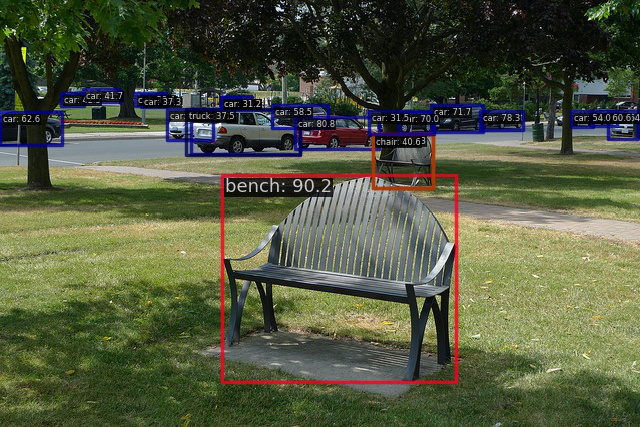

In [22]:
# Show the output image
from PIL import Image
Image.open('./output/vis/demo.jpg')

In [8]:
# import os
# os.environ['MKL_THREADING_LAYER'] = 'GNU'

# # Download the data and unzip it
# !python /mmdetection/tools/misc/download_dataset.py --dataset-name balloon --save-dir data --unzip

In [9]:
# !unzip data/Aquarium_Dataset.v10i.coco-mmdetection.zip -d Aquarium_Dataset/

In [10]:
import zipfile
import os

# Define the path to the zip file and the extraction directory
zip_file_path = 'data/Aquarium_Dataset.v10i.coco-mmdetection.zip'
extract_dir = 'data/Aquarium_Dataset/'

# Make sure the extraction directory exists
os.makedirs(extract_dir, exist_ok=True)

# Unzip the file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f'Files extracted to {extract_dir}')


Files extracted to data/Aquarium_Dataset/


In [11]:
# import os.path as osp
# import mmcv
# from mmengine.fileio import dump, load
# from mmengine.utils import track_iter_progress

# def convert_balloon_to_coco(ann_file, out_file, image_prefix):
#     data_infos = load(ann_file)

#     annotations = []
#     images = []
#     obj_count = 0
    
#     # Convert dict_values to a list
#     data_infos_list = list(data_infos.values())
    
#     for idx, v in enumerate(track_iter_progress(data_infos_list)):
#         filename = v['filename']
#         img_path = osp.join(image_prefix, filename)
#         height, width = mmcv.imread(img_path).shape[:2]

#         images.append(
#             dict(id=idx, file_name=filename, height=height, width=width))
        
#         for _, obj in v['regions'].items():
#             assert not obj['region_attributes']
#             obj = obj['shape_attributes']
#             px = obj['all_points_x']
#             py = obj['all_points_y']
#             poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
#             poly = [p for x in poly for p in x]

#             x_min, y_min, x_max, y_max = (min(px), min(py), max(px), max(py))

#             data_anno = dict(
#                 image_id=idx,
#                 id=obj_count,
#                 category_id=0,
#                 bbox=[x_min, y_min, x_max - x_min, y_max - y_min],
#                 area=(x_max - x_min) * (y_max - y_min),
#                 segmentation=[poly],
#                 iscrowd=0)
#             annotations.append(data_anno)
#             obj_count += 1

#     coco_format_json = dict(
#         images=images,
#         annotations=annotations,
#         categories=[{
#             'id': 0,
#             'name': 'balloon'
#         }])
#     dump(coco_format_json, out_file)

# if __name__ == '__main__':
#     convert_balloon_to_coco(ann_file='data/balloon/train/via_region_data.json',
#                             out_file='data/balloon/train.json',
#                             image_prefix='data/balloon/train')
#     convert_balloon_to_coco(ann_file='data/balloon/val/via_region_data.json',
#                             out_file='data/balloon/val.json',
#                             image_prefix='data/balloon/val')


In [12]:
# config_aquarium = """
# # Inherit and overwrite part of the config based on this config
# _base_ = 'rtmdet_tiny_8xb32-300e_coco.py'

# data_root = 'data/Aquarium_Dataset/' # dataset root

# train_batch_size_per_gpu = 4
# train_num_workers = 2

# max_epochs = 20
# stage2_num_epochs = 1
# base_lr = 0.00008


# metainfo = {
#     'classes': ('balloon', ),
#     'palette': [
#         (220, 20, 60),
#     ]
# }

# train_dataloader = dict(
#     batch_size=train_batch_size_per_gpu,
#     num_workers=train_num_workers,
#     dataset=dict(
#         data_root=data_root,
#         metainfo=metainfo,
#         data_prefix=dict(img='train/'),
#         ann_file='train.json'))

# val_dataloader = dict(
#     dataset=dict(
#         data_root=data_root,
#         metainfo=metainfo,
#         data_prefix=dict(img='val/'),
#         ann_file='val.json'))

# test_dataloader = val_dataloader

# val_evaluator = dict(ann_file=data_root + 'val.json')

# test_evaluator = val_evaluator

# model = dict(bbox_head=dict(num_classes=1))

# # learning rate
# param_scheduler = [
#     dict(
#         type='LinearLR',
#         start_factor=1.0e-5,
#         by_epoch=False,
#         begin=0,
#         end=10),
#     dict(
#         # use cosine lr from 10 to 20 epoch
#         type='CosineAnnealingLR',
#         eta_min=base_lr * 0.05,
#         begin=max_epochs // 2,
#         end=max_epochs,
#         T_max=max_epochs // 2,
#         by_epoch=True,
#         convert_to_iter_based=True),
# ]

# train_pipeline_stage2 = [
#     dict(type='LoadImageFromFile', backend_args=None),
#     dict(type='LoadAnnotations', with_bbox=True),
#     dict(
#         type='RandomResize',
#         scale=(640, 640),
#         ratio_range=(0.1, 2.0),
#         keep_ratio=True),
#     dict(type='RandomCrop', crop_size=(640, 640)),
#     dict(type='YOLOXHSVRandomAug'),
#     dict(type='RandomFlip', prob=0.5),
#     dict(type='Pad', size=(640, 640), pad_val=dict(img=(114, 114, 114))),
#     dict(type='PackDetInputs')
# ]

# # optimizer
# optim_wrapper = dict(
#     _delete_=True,
#     type='OptimWrapper',
#     optimizer=dict(type='AdamW', lr=base_lr, weight_decay=0.05),
#     paramwise_cfg=dict(
#         norm_decay_mult=0, bias_decay_mult=0, bypass_duplicate=True))

# default_hooks = dict(
#     checkpoint=dict(
#         interval=5,
#         max_keep_ckpts=2,  # only keep latest 2 checkpoints
#         save_best='auto'
#     ),
#     logger=dict(type='LoggerHook', interval=5))

# custom_hooks = [
#     dict(
#         type='PipelineSwitchHook',
#         switch_epoch=max_epochs - stage2_num_epochs,
#         switch_pipeline=train_pipeline_stage2)
# ]

# # load COCO pre-trained weight
# load_from = './checkpoints/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'

# train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)
# visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
# """

# with open('./configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py', 'w') as f:
#     f.write(config_balloon)

In [23]:
config_aquarium = """
# Inherit and overwrite part of the config based on this config
_base_ = 'rtmdet_s_8xb32-300e_coco.py'

data_root = 'data/Aquarium_Dataset/' 

train_batch_size_per_gpu = 2
train_num_workers = 2

max_epochs = 500
stage2_num_epochs = 1
base_lr = 0.00008


metainfo = {
    'classes': ('fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'stingray'),
    'palette': [
        (220, 20, 60), (30, 144, 255), (34, 139, 34), 
        (255, 140, 0), (128, 0, 128), (0, 255, 255)
    ]
}

train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='train/'),
        ann_file='train.json'))

val_dataloader = dict(
    num_workers=2,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='val/'),
        ann_file='val.json'))

test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'val.json')

test_evaluator = val_evaluator

model = dict(bbox_head=dict(num_classes=len(metainfo['classes'])))

# learning rate
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=10),
    dict(
        # use cosine lr from 10 to 20 epoch
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]

train_pipeline_stage2 = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='RandomResize',
        scale=(640, 640),
        ratio_range=(0.1, 2.0),
        keep_ratio=True),
    dict(type='RandomCrop', crop_size=(640, 640)),
    dict(type='YOLOXHSVRandomAug'),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(640, 640), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

# optimizer
optim_wrapper = dict(
    _delete_=True,
    type='OptimWrapper',
    optimizer=dict(type='AdamW', lr=base_lr, weight_decay=0.05),
    paramwise_cfg=dict(
        norm_decay_mult=0, bias_decay_mult=0, bypass_duplicate=True))

default_hooks = dict(
    checkpoint=dict(
        interval=5,
        max_keep_ckpts=2,  # only keep latest 2 checkpoints
        save_best='auto'
    ),
    logger=dict(type='LoggerHook', interval=5))

custom_hooks = [
    dict(
        type='PipelineSwitchHook',
        switch_epoch=max_epochs - stage2_num_epochs,
        switch_pipeline=train_pipeline_stage2)
]

# load COCO pre-trained weight
load_from = './checkpoints/rtmdet_s_8xb32-300e_coco_20220905_161602-387a891e.pth'

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)
visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
"""

with open('./configs/rtmdet/rtmdet_s_8xb32-20e_aquarium.py', 'w') as f:
    f.write(config_aquarium)


In [24]:
!python ./tools/train.py ./configs/rtmdet/rtmdet_s_8xb32-20e_aquarium.py

09/04 03:49:56 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.7.10 (default, Feb 26 2021, 18:47:35) [GCC 7.3.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1771949412
    GPU 0: NVIDIA GeForce RTX 3070 Ti Laptop GPU
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.1, V11.1.105
    GCC: gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
    PyTorch: 1.9.0
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2021.2-Product Build 20210312 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.1.2 (Git Hash 98be7e8afa711dc9b66c8ff3504129cb82013cdb)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.1
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-ge

09/04 03:50:00 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
09/04 03:50:00 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHook                
(NORMAL      ) PipelineSwitchHook                 
 -------------------- 
before_train_iter:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
 -------------------- 
after_train_i

09/04 03:50:01 - mmengine - INFO - paramwise_options -- neck.bottom_up_blocks.0.main_conv.bn.weight:weight_decay=0.0
09/04 03:50:01 - mmengine - INFO - paramwise_options -- neck.bottom_up_blocks.0.main_conv.bn.bias:weight_decay=0.0
09/04 03:50:01 - mmengine - INFO - paramwise_options -- neck.bottom_up_blocks.0.short_conv.bn.weight:weight_decay=0.0
09/04 03:50:01 - mmengine - INFO - paramwise_options -- neck.bottom_up_blocks.0.short_conv.bn.bias:weight_decay=0.0
09/04 03:50:01 - mmengine - INFO - paramwise_options -- neck.bottom_up_blocks.0.final_conv.bn.weight:weight_decay=0.0
09/04 03:50:01 - mmengine - INFO - paramwise_options -- neck.bottom_up_blocks.0.final_conv.bn.bias:weight_decay=0.0
09/04 03:50:01 - mmengine - INFO - paramwise_options -- neck.bottom_up_blocks.0.blocks.0.conv1.bn.weight:weight_decay=0.0
09/04 03:50:01 - mmengine - INFO - paramwise_options -- neck.bottom_up_blocks.0.blocks.0.conv1.bn.bias:weight_decay=0.0
09/04 03:50:01 - mmengine - INFO - paramwise_options -- ne

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
09/04 03:50:02 - mmengine - INFO - load backbone. in model from: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/cspnext_rsb_pretrain/cspnext-s_imagenet_600e.pth
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/cspnext_rsb_pretrain/cspnext-s_imagenet_600e.pth
Downloading: "https://download.openmmlab.com/mmdetection/v3.0/rtmdet/cspnext_rsb_pretrain/cspnext-s_imagenet_600e.pth" to /root/.cache/torch/hub/checkpoints/cspnext-s_imagenet_600e.pth
100%|██████████████████████████████████████| 56.2M/56.2M [00:04<00:00, 12.1MB/s]
Loads checkpoint by local backend from path: ./checkpoints/rtmdet_s_8xb32-300e_coco_20220905_161602-387a891e.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.rtm_cls.0.weight: copying a param with shape torch.Size([80, 128, 1, 1]) from checkpoint, the shape in current model is torch.Size([6, 128,

09/04 03:50:20 - mmengine - INFO - Epoch(train)   [1][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:35  time: 0.0712  data_time: 0.0013  memory: 1036  loss: 2.5382  loss_cls: 1.8473  loss_bbox: 0.6909
09/04 03:50:21 - mmengine - INFO - Epoch(train)   [1][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:15  time: 0.0713  data_time: 0.0013  memory: 1044  loss: 2.5313  loss_cls: 1.8521  loss_bbox: 0.6791
09/04 03:50:21 - mmengine - INFO - Epoch(train)   [1][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:52  time: 0.0713  data_time: 0.0013  memory: 1039  loss: 2.5120  loss_cls: 1.8395  loss_bbox: 0.6725
09/04 03:50:21 - mmengine - INFO - Epoch(train)   [1][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:26  time: 0.0711  data_time: 0.0013  memory: 1023  loss: 2.4963  loss_cls: 1.8287  loss_bbox: 0.6676
09/04 03:50:22 - mmengine - INFO - Epoch(train)   [1][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:09  time: 0.0713  data_time: 0.0013  memory: 1

09/04 03:50:34 - mmengine - INFO - Epoch(train)   [1][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:30  time: 0.0734  data_time: 0.0011  memory: 1044  loss: 1.7614  loss_cls: 1.1862  loss_bbox: 0.5752
09/04 03:50:34 - mmengine - INFO - Epoch(train)   [1][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:27  time: 0.0733  data_time: 0.0011  memory: 1026  loss: 1.7453  loss_cls: 1.1720  loss_bbox: 0.5733
09/04 03:50:35 - mmengine - INFO - Epoch(train)   [1][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:26  time: 0.0733  data_time: 0.0011  memory: 1062  loss: 1.7387  loss_cls: 1.1678  loss_bbox: 0.5709
09/04 03:50:35 - mmengine - INFO - Epoch(train)   [1][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:24  time: 0.0733  data_time: 0.0011  memory: 1028  loss: 1.7141  loss_cls: 1.1472  loss_bbox: 0.5670
09/04 03:50:35 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after

09/04 03:50:50 - mmengine - INFO - Epoch(train)   [2][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:38  time: 0.0734  data_time: 0.0011  memory: 1050  loss: 1.5437  loss_cls: 1.0413  loss_bbox: 0.5025
09/04 03:50:51 - mmengine - INFO - Epoch(train)   [2][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:38  time: 0.0735  data_time: 0.0011  memory: 1044  loss: 1.5249  loss_cls: 1.0297  loss_bbox: 0.4951
09/04 03:50:51 - mmengine - INFO - Epoch(train)   [2][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:34  time: 0.0733  data_time: 0.0011  memory: 1028  loss: 1.5271  loss_cls: 1.0396  loss_bbox: 0.4875
09/04 03:50:51 - mmengine - INFO - Epoch(train)   [2][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:36  time: 0.0734  data_time: 0.0011  memory: 1052  loss: 1.5217  loss_cls: 1.0358  loss_bbox: 0.4860
09/04 03:50:52 - mmengine - INFO - Epoch(train)   [2][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:35  time: 0.0733  data_time: 0.0011  memory: 1

09/04 03:51:04 - mmengine - INFO - Epoch(train)   [2][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:33  time: 0.0742  data_time: 0.0013  memory: 1030  loss: 1.3830  loss_cls: 0.8948  loss_bbox: 0.4882
09/04 03:51:04 - mmengine - INFO - Epoch(train)   [2][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:31  time: 0.0740  data_time: 0.0013  memory: 1016  loss: 1.3894  loss_cls: 0.9050  loss_bbox: 0.4844
09/04 03:51:05 - mmengine - INFO - Epoch(train)   [2][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:34  time: 0.0741  data_time: 0.0013  memory: 1079  loss: 1.4002  loss_cls: 0.9042  loss_bbox: 0.4960
09/04 03:51:05 - mmengine - INFO - Epoch(train)   [2][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:35  time: 0.0741  data_time: 0.0013  memory: 1048  loss: 1.3996  loss_cls: 0.9027  loss_bbox: 0.4969
09/04 03:51:05 - mmengine - INFO - Epoch(train)   [2][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:37  time: 0.0743  data_time: 0.0013  memory: 1

09/04 03:51:20 - mmengine - INFO - Epoch(train)   [3][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:38  time: 0.0731  data_time: 0.0012  memory: 1024  loss: 1.4435  loss_cls: 0.9625  loss_bbox: 0.4810
09/04 03:51:20 - mmengine - INFO - Epoch(train)   [3][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:36  time: 0.0730  data_time: 0.0012  memory: 1028  loss: 1.4195  loss_cls: 0.9445  loss_bbox: 0.4750
09/04 03:51:21 - mmengine - INFO - Epoch(train)   [3][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:36  time: 0.0731  data_time: 0.0012  memory: 1050  loss: 1.4325  loss_cls: 0.9529  loss_bbox: 0.4796
09/04 03:51:21 - mmengine - INFO - Epoch(train)   [3][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:35  time: 0.0730  data_time: 0.0012  memory: 1052  loss: 1.4326  loss_cls: 0.9545  loss_bbox: 0.4780
09/04 03:51:22 - mmengine - INFO - Epoch(train)   [3][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:37  time: 0.0731  data_time: 0.0012  memory: 1

09/04 03:51:34 - mmengine - INFO - Epoch(train)   [3][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:09  time: 0.0761  data_time: 0.0013  memory: 1048  loss: 1.3498  loss_cls: 0.8753  loss_bbox: 0.4745
09/04 03:51:34 - mmengine - INFO - Epoch(train)   [3][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:12  time: 0.0762  data_time: 0.0013  memory: 1039  loss: 1.3518  loss_cls: 0.8789  loss_bbox: 0.4729
09/04 03:51:35 - mmengine - INFO - Epoch(train)   [3][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:13  time: 0.0763  data_time: 0.0013  memory: 1036  loss: 1.3801  loss_cls: 0.8997  loss_bbox: 0.4804
09/04 03:51:35 - mmengine - INFO - Epoch(train)   [3][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:14  time: 0.0762  data_time: 0.0013  memory: 1042  loss: 1.3753  loss_cls: 0.8967  loss_bbox: 0.4786
09/04 03:51:35 - mmengine - INFO - Epoch(train)   [3][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:16  time: 0.0762  data_time: 0.0013  memory: 1

09/04 03:51:50 - mmengine - INFO - Epoch(train)   [4][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:32  time: 0.0777  data_time: 0.0029  memory: 1031  loss: 1.2896  loss_cls: 0.8399  loss_bbox: 0.4497
09/04 03:51:51 - mmengine - INFO - Epoch(train)   [4][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:34  time: 0.0754  data_time: 0.0013  memory: 1053  loss: 1.2732  loss_cls: 0.8300  loss_bbox: 0.4432
09/04 03:51:51 - mmengine - INFO - Epoch(train)   [4][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:33  time: 0.0753  data_time: 0.0013  memory: 1053  loss: 1.2772  loss_cls: 0.8311  loss_bbox: 0.4461
09/04 03:51:52 - mmengine - INFO - Epoch(train)   [4][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:33  time: 0.0753  data_time: 0.0013  memory: 1040  loss: 1.2760  loss_cls: 0.8323  loss_bbox: 0.4436
09/04 03:51:52 - mmengine - INFO - Epoch(train)   [4][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:33  time: 0.0750  data_time: 0.0013  memory: 1

09/04 03:52:04 - mmengine - INFO - Epoch(train)   [4][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:05  time: 0.0770  data_time: 0.0013  memory: 1028  loss: 1.3472  loss_cls: 0.8914  loss_bbox: 0.4558
09/04 03:52:05 - mmengine - INFO - Epoch(train)   [4][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:07  time: 0.0771  data_time: 0.0013  memory: 1050  loss: 1.3475  loss_cls: 0.8935  loss_bbox: 0.4540
09/04 03:52:05 - mmengine - INFO - Epoch(train)   [4][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:08  time: 0.0771  data_time: 0.0013  memory: 1091  loss: 1.3540  loss_cls: 0.9003  loss_bbox: 0.4537
09/04 03:52:06 - mmengine - INFO - Epoch(train)   [4][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:10  time: 0.0772  data_time: 0.0013  memory: 1047  loss: 1.3404  loss_cls: 0.8896  loss_bbox: 0.4508
09/04 03:52:06 - mmengine - INFO - Epoch(train)   [4][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:11  time: 0.0772  data_time: 0.0013  memory: 1

09/04 03:52:21 - mmengine - INFO - Epoch(train)   [5][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:46  time: 0.0781  data_time: 0.0030  memory: 1053  loss: 1.3083  loss_cls: 0.8666  loss_bbox: 0.4417
09/04 03:52:22 - mmengine - INFO - Epoch(train)   [5][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:47  time: 0.0784  data_time: 0.0030  memory: 1047  loss: 1.3034  loss_cls: 0.8572  loss_bbox: 0.4463
09/04 03:52:22 - mmengine - INFO - Epoch(train)   [5][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:46  time: 0.0782  data_time: 0.0030  memory: 1083  loss: 1.2880  loss_cls: 0.8418  loss_bbox: 0.4462
09/04 03:52:22 - mmengine - INFO - Epoch(train)   [5][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:46  time: 0.0779  data_time: 0.0030  memory: 1058  loss: 1.2722  loss_cls: 0.8281  loss_bbox: 0.4441
09/04 03:52:23 - mmengine - INFO - Epoch(train)   [5][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:45  time: 0.0777  data_time: 0.0030  memory: 1

09/04 03:52:35 - mmengine - INFO - Epoch(train)   [5][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:53  time: 0.0773  data_time: 0.0013  memory: 1047  loss: 1.3116  loss_cls: 0.8552  loss_bbox: 0.4564
09/04 03:52:36 - mmengine - INFO - Epoch(train)   [5][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:55  time: 0.0770  data_time: 0.0014  memory: 1042  loss: 1.3022  loss_cls: 0.8520  loss_bbox: 0.4502
09/04 03:52:36 - mmengine - INFO - Epoch(train)   [5][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:56  time: 0.0773  data_time: 0.0014  memory: 1049  loss: 1.2945  loss_cls: 0.8445  loss_bbox: 0.4500
09/04 03:52:37 - mmengine - INFO - Epoch(train)   [5][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:58  time: 0.0776  data_time: 0.0013  memory: 1054  loss: 1.2599  loss_cls: 0.8121  loss_bbox: 0.4478
09/04 03:52:37 - mmengine - INFO - Epoch(train)   [5][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:00  time: 0.0780  data_time: 0.0013  memory: 1

09/04 03:52:53 - mmengine - INFO - The best checkpoint with 0.2530 coco/bbox_mAP at 5 epoch is saved to best_coco_bbox_mAP_epoch_5.pth.
09/04 03:52:56 - mmengine - INFO - Epoch(train)   [6][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:21  time: 0.0782  data_time: 0.0029  memory: 1076  loss: 1.2457  loss_cls: 0.8061  loss_bbox: 0.4396
09/04 03:52:56 - mmengine - INFO - Epoch(train)   [6][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:23  time: 0.0784  data_time: 0.0029  memory: 1047  loss: 1.2467  loss_cls: 0.8012  loss_bbox: 0.4455
09/04 03:52:56 - mmengine - INFO - Epoch(train)   [6][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:23  time: 0.0785  data_time: 0.0029  memory: 1044  loss: 1.2367  loss_cls: 0.7954  loss_bbox: 0.4413
09/04 03:52:57 - mmengine - INFO - Epoch(train)   [6][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:25  time: 0.0789  data_time: 0.0029  memory: 1065  loss: 1.2172  loss_cls: 0.7751  loss_bbox: 0.4421
09/04 03:52:57 - mme

09/04 03:53:10 - mmengine - INFO - Epoch(train)   [6][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:03  time: 0.0844  data_time: 0.0065  memory: 1063  loss: 1.2164  loss_cls: 0.7689  loss_bbox: 0.4475
09/04 03:53:10 - mmengine - INFO - Epoch(train)   [6][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:04  time: 0.0798  data_time: 0.0015  memory: 1065  loss: 1.2079  loss_cls: 0.7571  loss_bbox: 0.4507
09/04 03:53:10 - mmengine - INFO - Epoch(train)   [6][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:05  time: 0.0796  data_time: 0.0014  memory: 1081  loss: 1.2188  loss_cls: 0.7659  loss_bbox: 0.4530
09/04 03:53:11 - mmengine - INFO - Epoch(train)   [6][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:05  time: 0.0795  data_time: 0.0014  memory: 1050  loss: 1.2377  loss_cls: 0.7846  loss_bbox: 0.4531
09/04 03:53:11 - mmengine - INFO - Epoch(train)   [6][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:06  time: 0.0794  data_time: 0.0015  memory: 1

09/04 03:53:28 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_5.pth is removed
09/04 03:53:30 - mmengine - INFO - The best checkpoint with 0.2930 coco/bbox_mAP at 6 epoch is saved to best_coco_bbox_mAP_epoch_6.pth.
09/04 03:53:32 - mmengine - INFO - Epoch(train)   [7][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:27  time: 0.0791  data_time: 0.0030  memory: 1025  loss: 1.1893  loss_cls: 0.7781  loss_bbox: 0.4112
09/04 03:53:32 - mmengine - INFO - Epoch(train)   [7][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:27  time: 0.0789  data_time: 0.0030  memory: 1055  loss: 1.1764  loss_cls: 0.7694  loss_bbox: 0.4071
09/04 03:53:33 - mmengine - INFO - Epoch(train)   [7][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:27  time: 0.0787  data_time: 0.0030  memory: 1068  loss: 1.1781  loss_cls: 0.7690  loss_bbox: 0.4090
09/04 03:53:33 - mmengine - INFO - Epoch(train)   [7][ 20/329]  base_lr: 8

09/04 03:53:45 - mmengine - INFO - Epoch(train)   [7][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:33  time: 0.0775  data_time: 0.0014  memory: 1028  loss: 1.1156  loss_cls: 0.7222  loss_bbox: 0.3934
09/04 03:53:46 - mmengine - INFO - Epoch(train)   [7][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:33  time: 0.0771  data_time: 0.0013  memory: 1029  loss: 1.1243  loss_cls: 0.7256  loss_bbox: 0.3988
09/04 03:53:46 - mmengine - INFO - Epoch(train)   [7][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:33  time: 0.0770  data_time: 0.0013  memory: 1031  loss: 1.1033  loss_cls: 0.7092  loss_bbox: 0.3941
09/04 03:53:46 - mmengine - INFO - Epoch(train)   [7][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:32  time: 0.0769  data_time: 0.0013  memory: 1021  loss: 1.1147  loss_cls: 0.7205  loss_bbox: 0.3941
09/04 03:53:47 - mmengine - INFO - Epoch(train)   [7][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:32  time: 0.0768  data_time: 0.0013  memory: 1

09/04 03:54:03 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_6.pth is removed
09/04 03:54:04 - mmengine - INFO - The best checkpoint with 0.3170 coco/bbox_mAP at 7 epoch is saved to best_coco_bbox_mAP_epoch_7.pth.
09/04 03:54:06 - mmengine - INFO - Epoch(train)   [8][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:30  time: 0.0772  data_time: 0.0029  memory: 1055  loss: 1.2373  loss_cls: 0.8124  loss_bbox: 0.4249
09/04 03:54:07 - mmengine - INFO - Epoch(train)   [8][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:29  time: 0.0771  data_time: 0.0030  memory: 1036  loss: 1.2392  loss_cls: 0.8132  loss_bbox: 0.4260
09/04 03:54:07 - mmengine - INFO - Epoch(train)   [8][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:28  time: 0.0771  data_time: 0.0030  memory: 1028  loss: 1.2253  loss_cls: 0.7982  loss_bbox: 0.4271
09/04 03:54:07 - mmengine - INFO - Epoch(train)   [8][ 20/329]  base_lr: 8

09/04 03:54:20 - mmengine - INFO - Epoch(train)   [8][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:27  time: 0.0774  data_time: 0.0013  memory: 1033  loss: 1.1184  loss_cls: 0.7016  loss_bbox: 0.4168
09/04 03:54:20 - mmengine - INFO - Epoch(train)   [8][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:26  time: 0.0771  data_time: 0.0013  memory: 1028  loss: 1.1213  loss_cls: 0.7097  loss_bbox: 0.4116
09/04 03:54:21 - mmengine - INFO - Epoch(train)   [8][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:26  time: 0.0773  data_time: 0.0013  memory: 1025  loss: 1.1308  loss_cls: 0.7181  loss_bbox: 0.4127
09/04 03:54:21 - mmengine - INFO - Epoch(train)   [8][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:27  time: 0.0771  data_time: 0.0013  memory: 1034  loss: 1.1393  loss_cls: 0.7275  loss_bbox: 0.4119
09/04 03:54:22 - mmengine - INFO - Epoch(train)   [8][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:27  time: 0.0772  data_time: 0.0013  memory: 1

09/04 03:54:38 - mmengine - INFO - Epoch(val) [8][42/42]    coco/bbox_mAP: 0.3390  coco/bbox_mAP_50: 0.5170  coco/bbox_mAP_75: 0.3590  coco/bbox_mAP_s: 0.1230  coco/bbox_mAP_m: 0.2570  coco/bbox_mAP_l: 0.4140  data_time: 0.0035  time: 0.0922
09/04 03:54:38 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_7.pth is removed
09/04 03:54:39 - mmengine - INFO - The best checkpoint with 0.3390 coco/bbox_mAP at 8 epoch is saved to best_coco_bbox_mAP_epoch_8.pth.
09/04 03:54:41 - mmengine - INFO - Epoch(train)   [9][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:40  time: 0.0803  data_time: 0.0030  memory: 1068  loss: 1.1056  loss_cls: 0.6983  loss_bbox: 0.4074
09/04 03:54:41 - mmengine - INFO - Epoch(train)   [9][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:39  time: 0.0802  data_time: 0.0030  memory: 1040  loss: 1.1063  loss_cls: 0.6999  loss_bbox: 0.4064
09/04 03:54:41 - mmengine - INFO - Epoch(tr

09/04 03:54:54 - mmengine - INFO - Epoch(train)   [9][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:46  time: 0.0785  data_time: 0.0015  memory: 1030  loss: 1.1901  loss_cls: 0.7756  loss_bbox: 0.4145
09/04 03:54:55 - mmengine - INFO - Epoch(train)   [9][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:46  time: 0.0784  data_time: 0.0015  memory: 1031  loss: 1.2038  loss_cls: 0.7808  loss_bbox: 0.4229
09/04 03:54:55 - mmengine - INFO - Epoch(train)   [9][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:46  time: 0.0781  data_time: 0.0015  memory: 1025  loss: 1.2187  loss_cls: 0.8013  loss_bbox: 0.4174
09/04 03:54:55 - mmengine - INFO - Epoch(train)   [9][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:46  time: 0.0781  data_time: 0.0015  memory: 1027  loss: 1.2179  loss_cls: 0.8058  loss_bbox: 0.4120
09/04 03:54:56 - mmengine - INFO - Epoch(train)   [9][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:46  time: 0.0784  data_time: 0.0015  memory: 1

09/04 03:55:13 - mmengine - INFO - Epoch(val) [9][42/42]    coco/bbox_mAP: 0.3490  coco/bbox_mAP_50: 0.5370  coco/bbox_mAP_75: 0.3750  coco/bbox_mAP_s: 0.0920  coco/bbox_mAP_m: 0.2650  coco/bbox_mAP_l: 0.4360  data_time: 0.0038  time: 0.0929
09/04 03:55:13 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_8.pth is removed
09/04 03:55:14 - mmengine - INFO - The best checkpoint with 0.3490 coco/bbox_mAP at 9 epoch is saved to best_coco_bbox_mAP_epoch_9.pth.
09/04 03:55:16 - mmengine - INFO - Epoch(train)  [10][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:23  time: 0.0888  data_time: 0.0113  memory: 1063  loss: 1.0971  loss_cls: 0.6891  loss_bbox: 0.4081
09/04 03:55:16 - mmengine - INFO - Epoch(train)  [10][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:23  time: 0.0891  data_time: 0.0113  memory: 1058  loss: 1.1067  loss_cls: 0.6945  loss_bbox: 0.4122
09/04 03:55:17 - mmengine - INFO - Epoch(tr

09/04 03:55:29 - mmengine - INFO - Epoch(train)  [10][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:31  time: 0.0788  data_time: 0.0015  memory: 1041  loss: 1.1001  loss_cls: 0.6836  loss_bbox: 0.4165
09/04 03:55:30 - mmengine - INFO - Epoch(train)  [10][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:31  time: 0.0790  data_time: 0.0015  memory: 1035  loss: 1.0993  loss_cls: 0.6840  loss_bbox: 0.4153
09/04 03:55:30 - mmengine - INFO - Epoch(train)  [10][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:31  time: 0.0791  data_time: 0.0015  memory: 1059  loss: 1.0961  loss_cls: 0.6863  loss_bbox: 0.4098
09/04 03:55:30 - mmengine - INFO - Epoch(train)  [10][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:31  time: 0.0790  data_time: 0.0015  memory: 1029  loss: 1.0944  loss_cls: 0.6807  loss_bbox: 0.4137
09/04 03:55:31 - mmengine - INFO - Epoch(train)  [10][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:32  time: 0.0790  data_time: 0.0015  memory: 1

09/04 03:55:48 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.09s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.44s).
Accumulating evaluation results...
DONE (t=0.25s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.365
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.555
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.386
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.077
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.284
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.450
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.215
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.517
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.649
 Average Recal

09/04 03:56:04 - mmengine - INFO - Epoch(train)  [11][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:43  time: 0.0795  data_time: 0.0015  memory: 1041  loss: 1.0496  loss_cls: 0.6479  loss_bbox: 0.4017
09/04 03:56:04 - mmengine - INFO - Epoch(train)  [11][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:44  time: 0.0799  data_time: 0.0015  memory: 1075  loss: 1.0497  loss_cls: 0.6469  loss_bbox: 0.4028
09/04 03:56:05 - mmengine - INFO - Epoch(train)  [11][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:45  time: 0.0803  data_time: 0.0015  memory: 1056  loss: 1.0227  loss_cls: 0.6264  loss_bbox: 0.3963
09/04 03:56:05 - mmengine - INFO - Epoch(train)  [11][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:45  time: 0.0799  data_time: 0.0016  memory: 1035  loss: 1.0151  loss_cls: 0.6263  loss_bbox: 0.3888
09/04 03:56:05 - mmengine - INFO - Epoch(train)  [11][170/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:46  time: 0.0800  data_time: 0.0015  memory: 1

09/04 03:56:19 - mmengine - INFO - Epoch(val)  [11][10/42]    eta: 0:00:03  time: 0.0923  data_time: 0.0039  memory: 384  
09/04 03:56:20 - mmengine - INFO - Epoch(val)  [11][15/42]    eta: 0:00:02  time: 0.0918  data_time: 0.0038  memory: 384  
09/04 03:56:20 - mmengine - INFO - Epoch(val)  [11][20/42]    eta: 0:00:02  time: 0.0916  data_time: 0.0037  memory: 384  
09/04 03:56:20 - mmengine - INFO - Epoch(val)  [11][25/42]    eta: 0:00:01  time: 0.0918  data_time: 0.0038  memory: 384  
09/04 03:56:21 - mmengine - INFO - Epoch(val)  [11][30/42]    eta: 0:00:01  time: 0.0916  data_time: 0.0038  memory: 384  
09/04 03:56:21 - mmengine - INFO - Epoch(val)  [11][35/42]    eta: 0:00:00  time: 0.0912  data_time: 0.0038  memory: 384  
09/04 03:56:22 - mmengine - INFO - Epoch(val)  [11][40/42]    eta: 0:00:00  time: 0.0911  data_time: 0.0039  memory: 384  
09/04 03:56:22 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.09s)
creating index...
index created!
Runn

09/04 03:56:37 - mmengine - INFO - Epoch(train)  [12][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:57  time: 0.0783  data_time: 0.0016  memory: 1037  loss: 1.1689  loss_cls: 0.7601  loss_bbox: 0.4087
09/04 03:56:38 - mmengine - INFO - Epoch(train)  [12][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:57  time: 0.0781  data_time: 0.0015  memory: 1048  loss: 1.1668  loss_cls: 0.7592  loss_bbox: 0.4076
09/04 03:56:38 - mmengine - INFO - Epoch(train)  [12][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:57  time: 0.0779  data_time: 0.0015  memory: 1052  loss: 1.1725  loss_cls: 0.7661  loss_bbox: 0.4064
09/04 03:56:38 - mmengine - INFO - Epoch(train)  [12][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:57  time: 0.0780  data_time: 0.0015  memory: 1056  loss: 1.1865  loss_cls: 0.7719  loss_bbox: 0.4147
09/04 03:56:39 - mmengine - INFO - Epoch(train)  [12][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:57  time: 0.0778  data_time: 0.0015  memory: 1

09/04 03:56:52 - mmengine - INFO - Epoch(train)  [12][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:56  time: 0.0784  data_time: 0.0014  memory: 1041  loss: 1.0341  loss_cls: 0.6178  loss_bbox: 0.4163
09/04 03:56:52 - mmengine - INFO - Epoch(train)  [12][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:56  time: 0.0786  data_time: 0.0015  memory: 1019  loss: 1.0502  loss_cls: 0.6330  loss_bbox: 0.4173
09/04 03:56:53 - mmengine - INFO - Epoch(train)  [12][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:55  time: 0.0787  data_time: 0.0015  memory: 1026  loss: 1.0751  loss_cls: 0.6595  loss_bbox: 0.4155
09/04 03:56:53 - mmengine - INFO - Epoch(train)  [12][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:54  time: 0.0786  data_time: 0.0015  memory: 1036  loss: 1.0926  loss_cls: 0.6761  loss_bbox: 0.4165
09/04 03:56:53 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 03:56:54 - mmengine - INFO - Epoch(val)  [12][ 5/42]    eta: 

09/04 03:57:10 - mmengine - INFO - Epoch(train)  [13][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:14  time: 0.0794  data_time: 0.0017  memory: 1020  loss: 1.1523  loss_cls: 0.7268  loss_bbox: 0.4255
09/04 03:57:11 - mmengine - INFO - Epoch(train)  [13][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:14  time: 0.0793  data_time: 0.0016  memory: 1029  loss: 1.1478  loss_cls: 0.7242  loss_bbox: 0.4235
09/04 03:57:11 - mmengine - INFO - Epoch(train)  [13][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:14  time: 0.0794  data_time: 0.0016  memory: 1037  loss: 1.1293  loss_cls: 0.7115  loss_bbox: 0.4178
09/04 03:57:12 - mmengine - INFO - Epoch(train)  [13][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:15  time: 0.0797  data_time: 0.0016  memory: 1049  loss: 1.1070  loss_cls: 0.6906  loss_bbox: 0.4164
09/04 03:57:12 - mmengine - INFO - Epoch(train)  [13][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:15  time: 0.0800  data_time: 0.0016  memory: 1

09/04 03:57:25 - mmengine - INFO - Epoch(train)  [13][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:14  time: 0.0795  data_time: 0.0016  memory: 1046  loss: 1.0075  loss_cls: 0.6211  loss_bbox: 0.3865
09/04 03:57:26 - mmengine - INFO - Epoch(train)  [13][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:14  time: 0.0793  data_time: 0.0016  memory: 1026  loss: 1.0050  loss_cls: 0.6280  loss_bbox: 0.3770
09/04 03:57:26 - mmengine - INFO - Epoch(train)  [13][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:14  time: 0.0793  data_time: 0.0016  memory: 1057  loss: 1.0103  loss_cls: 0.6358  loss_bbox: 0.3745
09/04 03:57:26 - mmengine - INFO - Epoch(train)  [13][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:14  time: 0.0794  data_time: 0.0016  memory: 1097  loss: 1.0070  loss_cls: 0.6389  loss_bbox: 0.3681
09/04 03:57:27 - mmengine - INFO - Epoch(train)  [13][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:13  time: 0.0795  data_time: 0.0016  memory: 1

09/04 03:57:44 - mmengine - INFO - Epoch(train)  [14][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:15  time: 0.0795  data_time: 0.0016  memory: 1049  loss: 1.0578  loss_cls: 0.6216  loss_bbox: 0.4361
09/04 03:57:44 - mmengine - INFO - Epoch(train)  [14][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:16  time: 0.0800  data_time: 0.0016  memory: 1078  loss: 1.0544  loss_cls: 0.6134  loss_bbox: 0.4410
09/04 03:57:45 - mmengine - INFO - Epoch(train)  [14][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:16  time: 0.0805  data_time: 0.0016  memory: 1053  loss: 1.0501  loss_cls: 0.6059  loss_bbox: 0.4442
09/04 03:57:45 - mmengine - INFO - Epoch(train)  [14][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:16  time: 0.0808  data_time: 0.0017  memory: 1048  loss: 1.0516  loss_cls: 0.6137  loss_bbox: 0.4379
09/04 03:57:45 - mmengine - INFO - Epoch(train)  [14][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:16  time: 0.0808  data_time: 0.0017  memory: 1

09/04 03:57:59 - mmengine - INFO - Epoch(train)  [14][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:19  time: 0.0824  data_time: 0.0018  memory: 1040  loss: 1.0774  loss_cls: 0.6936  loss_bbox: 0.3839
09/04 03:57:59 - mmengine - INFO - Epoch(train)  [14][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:19  time: 0.0823  data_time: 0.0018  memory: 1032  loss: 1.0908  loss_cls: 0.6979  loss_bbox: 0.3930
09/04 03:58:00 - mmengine - INFO - Epoch(train)  [14][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:19  time: 0.0823  data_time: 0.0018  memory: 1030  loss: 1.0621  loss_cls: 0.6763  loss_bbox: 0.3859
09/04 03:58:00 - mmengine - INFO - Epoch(train)  [14][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:19  time: 0.0820  data_time: 0.0018  memory: 1026  loss: 1.0622  loss_cls: 0.6741  loss_bbox: 0.3881
09/04 03:58:00 - mmengine - INFO - Epoch(train)  [14][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:19  time: 0.0822  data_time: 0.0018  memory: 1

09/04 03:58:19 - mmengine - INFO - Epoch(train)  [15][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:23  time: 0.0827  data_time: 0.0033  memory: 1039  loss: 1.0173  loss_cls: 0.6193  loss_bbox: 0.3980
09/04 03:58:20 - mmengine - INFO - Epoch(train)  [15][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:23  time: 0.0805  data_time: 0.0016  memory: 1070  loss: 0.9975  loss_cls: 0.6019  loss_bbox: 0.3956
09/04 03:58:20 - mmengine - INFO - Epoch(train)  [15][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:22  time: 0.0803  data_time: 0.0016  memory: 1046  loss: 1.0062  loss_cls: 0.6095  loss_bbox: 0.3967
09/04 03:58:20 - mmengine - INFO - Epoch(train)  [15][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:22  time: 0.0801  data_time: 0.0016  memory: 1065  loss: 1.0019  loss_cls: 0.6077  loss_bbox: 0.3942
09/04 03:58:21 - mmengine - INFO - Epoch(train)  [15][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:22  time: 0.0796  data_time: 0.0015  memory: 1

09/04 03:58:34 - mmengine - INFO - Epoch(train)  [15][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0809  data_time: 0.0017  memory: 1045  loss: 1.0800  loss_cls: 0.6800  loss_bbox: 0.4000
09/04 03:58:35 - mmengine - INFO - Epoch(train)  [15][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0809  data_time: 0.0017  memory: 1058  loss: 1.0874  loss_cls: 0.6831  loss_bbox: 0.4043
09/04 03:58:35 - mmengine - INFO - Epoch(train)  [15][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:29  time: 0.0803  data_time: 0.0017  memory: 1030  loss: 1.0822  loss_cls: 0.6873  loss_bbox: 0.3949
09/04 03:58:35 - mmengine - INFO - Epoch(train)  [15][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0801  data_time: 0.0016  memory: 1046  loss: 1.0725  loss_cls: 0.6760  loss_bbox: 0.3965
09/04 03:58:36 - mmengine - INFO - Epoch(train)  [15][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0804  data_time: 0.0017  memory: 1

09/04 03:58:55 - mmengine - INFO - Epoch(train)  [16][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:31  time: 0.0820  data_time: 0.0033  memory: 1053  loss: 0.9961  loss_cls: 0.6024  loss_bbox: 0.3937
09/04 03:58:55 - mmengine - INFO - Epoch(train)  [16][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:32  time: 0.0820  data_time: 0.0033  memory: 1067  loss: 0.9984  loss_cls: 0.6051  loss_bbox: 0.3934
09/04 03:58:55 - mmengine - INFO - Epoch(train)  [16][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:31  time: 0.0818  data_time: 0.0033  memory: 1044  loss: 0.9988  loss_cls: 0.6058  loss_bbox: 0.3931
09/04 03:58:56 - mmengine - INFO - Epoch(train)  [16][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:32  time: 0.0822  data_time: 0.0032  memory: 1087  loss: 1.0000  loss_cls: 0.6022  loss_bbox: 0.3978
09/04 03:58:56 - mmengine - INFO - Epoch(train)  [16][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:32  time: 0.0818  data_time: 0.0032  memory: 1

09/04 03:59:09 - mmengine - INFO - Epoch(train)  [16][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0810  data_time: 0.0017  memory: 1041  loss: 0.9840  loss_cls: 0.6056  loss_bbox: 0.3784
09/04 03:59:10 - mmengine - INFO - Epoch(train)  [16][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0803  data_time: 0.0016  memory: 1051  loss: 0.9699  loss_cls: 0.5916  loss_bbox: 0.3783
09/04 03:59:10 - mmengine - INFO - Epoch(train)  [16][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0802  data_time: 0.0016  memory: 1043  loss: 0.9610  loss_cls: 0.5807  loss_bbox: 0.3803
09/04 03:59:11 - mmengine - INFO - Epoch(train)  [16][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0809  data_time: 0.0016  memory: 1034  loss: 0.9482  loss_cls: 0.5684  loss_bbox: 0.3798
09/04 03:59:11 - mmengine - INFO - Epoch(train)  [16][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0812  data_time: 0.0016  memory: 1

09/04 03:59:26 - mmengine - INFO - Epoch(train)  [17][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0807  data_time: 0.0033  memory: 1035  loss: 1.0650  loss_cls: 0.6678  loss_bbox: 0.3971
09/04 03:59:27 - mmengine - INFO - Epoch(train)  [17][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0809  data_time: 0.0032  memory: 1022  loss: 1.0427  loss_cls: 0.6555  loss_bbox: 0.3872
09/04 03:59:27 - mmengine - INFO - Epoch(train)  [17][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0811  data_time: 0.0032  memory: 1035  loss: 1.0378  loss_cls: 0.6483  loss_bbox: 0.3895
09/04 03:59:27 - mmengine - INFO - Epoch(train)  [17][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0813  data_time: 0.0032  memory: 1037  loss: 1.0341  loss_cls: 0.6454  loss_bbox: 0.3887
09/04 03:59:28 - mmengine - INFO - Epoch(train)  [17][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0813  data_time: 0.0032  memory: 1

09/04 03:59:41 - mmengine - INFO - Epoch(train)  [17][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0808  data_time: 0.0016  memory: 1042  loss: 1.0228  loss_cls: 0.6199  loss_bbox: 0.4029
09/04 03:59:42 - mmengine - INFO - Epoch(train)  [17][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0806  data_time: 0.0016  memory: 1031  loss: 1.0330  loss_cls: 0.6333  loss_bbox: 0.3997
09/04 03:59:42 - mmengine - INFO - Epoch(train)  [17][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0808  data_time: 0.0016  memory: 1060  loss: 1.0414  loss_cls: 0.6408  loss_bbox: 0.4006
09/04 03:59:42 - mmengine - INFO - Epoch(train)  [17][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0809  data_time: 0.0017  memory: 1040  loss: 1.0466  loss_cls: 0.6492  loss_bbox: 0.3973
09/04 03:59:43 - mmengine - INFO - Epoch(train)  [17][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0808  data_time: 0.0017  memory: 1

09/04 04:00:00 - mmengine - INFO - Epoch(val) [17][42/42]    coco/bbox_mAP: 0.4220  coco/bbox_mAP_50: 0.6490  coco/bbox_mAP_75: 0.4570  coco/bbox_mAP_s: 0.1460  coco/bbox_mAP_m: 0.3280  coco/bbox_mAP_l: 0.5260  data_time: 0.0046  time: 0.0949
09/04 04:00:01 - mmengine - INFO - Epoch(train)  [18][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:34  time: 0.0826  data_time: 0.0034  memory: 1068  loss: 1.0266  loss_cls: 0.6458  loss_bbox: 0.3808
09/04 04:00:01 - mmengine - INFO - Epoch(train)  [18][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:33  time: 0.0827  data_time: 0.0034  memory: 1036  loss: 1.0478  loss_cls: 0.6645  loss_bbox: 0.3833
09/04 04:00:01 - mmengine - INFO - Epoch(train)  [18][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:33  time: 0.0822  data_time: 0.0034  memory: 1017  loss: 1.0648  loss_cls: 0.6872  loss_bbox: 0.3776
09/04 04:00:02 - mmengine - INFO - Epoch(train)  [18][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:32  time: 0.08

09/04 04:00:15 - mmengine - INFO - Epoch(train)  [18][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:27  time: 0.0814  data_time: 0.0016  memory: 1064  loss: 0.9919  loss_cls: 0.5666  loss_bbox: 0.4253
09/04 04:00:15 - mmengine - INFO - Epoch(train)  [18][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:27  time: 0.0813  data_time: 0.0016  memory: 1035  loss: 0.9799  loss_cls: 0.5574  loss_bbox: 0.4226
09/04 04:00:16 - mmengine - INFO - Epoch(train)  [18][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:27  time: 0.0815  data_time: 0.0016  memory: 1043  loss: 0.9820  loss_cls: 0.5617  loss_bbox: 0.4203
09/04 04:00:16 - mmengine - INFO - Epoch(train)  [18][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:27  time: 0.0819  data_time: 0.0016  memory: 1040  loss: 0.9843  loss_cls: 0.5606  loss_bbox: 0.4236
09/04 04:00:17 - mmengine - INFO - Epoch(train)  [18][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:27  time: 0.0820  data_time: 0.0017  memory: 1

09/04 04:00:33 - mmengine - INFO - Epoch(val) [18][42/42]    coco/bbox_mAP: 0.4180  coco/bbox_mAP_50: 0.6430  coco/bbox_mAP_75: 0.4450  coco/bbox_mAP_s: 0.1220  coco/bbox_mAP_m: 0.3530  coco/bbox_mAP_l: 0.5060  data_time: 0.0038  time: 0.0867
09/04 04:00:33 - mmengine - INFO - Epoch(train)  [19][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0824  data_time: 0.0034  memory: 1030  loss: 0.9834  loss_cls: 0.5723  loss_bbox: 0.4110
09/04 04:00:34 - mmengine - INFO - Epoch(train)  [19][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0824  data_time: 0.0035  memory: 1052  loss: 0.9921  loss_cls: 0.5796  loss_bbox: 0.4125
09/04 04:00:34 - mmengine - INFO - Epoch(train)  [19][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0823  data_time: 0.0035  memory: 1029  loss: 0.9968  loss_cls: 0.5844  loss_bbox: 0.4124
09/04 04:00:35 - mmengine - INFO - Epoch(train)  [19][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.08

09/04 04:00:48 - mmengine - INFO - Epoch(train)  [19][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:27  time: 0.0818  data_time: 0.0017  memory: 1040  loss: 0.9485  loss_cls: 0.5509  loss_bbox: 0.3976
09/04 04:00:48 - mmengine - INFO - Epoch(train)  [19][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:27  time: 0.0817  data_time: 0.0017  memory: 1033  loss: 0.9562  loss_cls: 0.5588  loss_bbox: 0.3974
09/04 04:00:49 - mmengine - INFO - Epoch(train)  [19][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:27  time: 0.0814  data_time: 0.0017  memory: 1062  loss: 0.9400  loss_cls: 0.5513  loss_bbox: 0.3887
09/04 04:00:49 - mmengine - INFO - Epoch(train)  [19][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:26  time: 0.0811  data_time: 0.0017  memory: 1045  loss: 0.9308  loss_cls: 0.5506  loss_bbox: 0.3802
09/04 04:00:49 - mmengine - INFO - Epoch(train)  [19][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:26  time: 0.0808  data_time: 0.0017  memory: 1

09/04 04:01:07 - mmengine - INFO - Epoch(train)  [20][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:30  time: 0.0831  data_time: 0.0034  memory: 1062  loss: 0.9812  loss_cls: 0.5772  loss_bbox: 0.4040
09/04 04:01:07 - mmengine - INFO - Epoch(train)  [20][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:29  time: 0.0826  data_time: 0.0034  memory: 1029  loss: 0.9975  loss_cls: 0.5881  loss_bbox: 0.4094
09/04 04:01:08 - mmengine - INFO - Epoch(train)  [20][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:29  time: 0.0824  data_time: 0.0034  memory: 1040  loss: 1.0075  loss_cls: 0.6001  loss_bbox: 0.4074
09/04 04:01:08 - mmengine - INFO - Epoch(train)  [20][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0822  data_time: 0.0034  memory: 1050  loss: 1.0135  loss_cls: 0.6058  loss_bbox: 0.4077
09/04 04:01:08 - mmengine - INFO - Epoch(train)  [20][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:29  time: 0.0819  data_time: 0.0034  memory: 1

09/04 04:01:22 - mmengine - INFO - Epoch(train)  [20][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0810  data_time: 0.0017  memory: 1027  loss: 0.9942  loss_cls: 0.5943  loss_bbox: 0.3999
09/04 04:01:22 - mmengine - INFO - Epoch(train)  [20][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0808  data_time: 0.0016  memory: 1056  loss: 1.0087  loss_cls: 0.6013  loss_bbox: 0.4074
09/04 04:01:23 - mmengine - INFO - Epoch(train)  [20][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:27  time: 0.0801  data_time: 0.0016  memory: 1033  loss: 1.0149  loss_cls: 0.6087  loss_bbox: 0.4062
09/04 04:01:23 - mmengine - INFO - Epoch(train)  [20][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0801  data_time: 0.0016  memory: 1033  loss: 1.0033  loss_cls: 0.5956  loss_bbox: 0.4077
09/04 04:01:24 - mmengine - INFO - Epoch(train)  [20][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0805  data_time: 0.0016  memory: 1

09/04 04:01:42 - mmengine - INFO - Epoch(val) [20][42/42]    coco/bbox_mAP: 0.4480  coco/bbox_mAP_50: 0.6810  coco/bbox_mAP_75: 0.4980  coco/bbox_mAP_s: 0.1210  coco/bbox_mAP_m: 0.3740  coco/bbox_mAP_l: 0.5510  data_time: 0.0039  time: 0.0909
09/04 04:01:42 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_15.pth is removed
09/04 04:01:43 - mmengine - INFO - The best checkpoint with 0.4480 coco/bbox_mAP at 20 epoch is saved to best_coco_bbox_mAP_epoch_20.pth.
09/04 04:01:45 - mmengine - INFO - Epoch(train)  [21][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0825  data_time: 0.0034  memory: 1033  loss: 0.9906  loss_cls: 0.5957  loss_bbox: 0.3950
09/04 04:01:46 - mmengine - INFO - Epoch(train)  [21][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0825  data_time: 0.0034  memory: 1025  loss: 0.9947  loss_cls: 0.6027  loss_bbox: 0.3920
09/04 04:01:46 - mmengine - INFO - Epoc

09/04 04:01:59 - mmengine - INFO - Epoch(train)  [21][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0825  data_time: 0.0017  memory: 1035  loss: 0.9505  loss_cls: 0.5671  loss_bbox: 0.3834
09/04 04:02:00 - mmengine - INFO - Epoch(train)  [21][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0820  data_time: 0.0017  memory: 1038  loss: 0.9471  loss_cls: 0.5653  loss_bbox: 0.3818
09/04 04:02:00 - mmengine - INFO - Epoch(train)  [21][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0823  data_time: 0.0017  memory: 1054  loss: 0.9460  loss_cls: 0.5632  loss_bbox: 0.3828
09/04 04:02:00 - mmengine - INFO - Epoch(train)  [21][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:28  time: 0.0819  data_time: 0.0017  memory: 1033  loss: 0.9551  loss_cls: 0.5755  loss_bbox: 0.3795
09/04 04:02:01 - mmengine - INFO - Epoch(train)  [21][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:27  time: 0.0819  data_time: 0.0016  memory: 1

Loading and preparing results...
DONE (t=0.09s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.48s).
Accumulating evaluation results...
DONE (t=0.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.438
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.657
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.477
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.145
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.366
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.539
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.229
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.527
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

09/04 04:02:31 - mmengine - INFO - Epoch(train)  [22][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:22  time: 0.0817  data_time: 0.0018  memory: 1031  loss: 0.9905  loss_cls: 0.5946  loss_bbox: 0.3960
09/04 04:02:31 - mmengine - INFO - Epoch(train)  [22][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:22  time: 0.0817  data_time: 0.0018  memory: 1034  loss: 1.0054  loss_cls: 0.6115  loss_bbox: 0.3939
09/04 04:02:32 - mmengine - INFO - Epoch(train)  [22][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:22  time: 0.0818  data_time: 0.0018  memory: 1043  loss: 0.9873  loss_cls: 0.5960  loss_bbox: 0.3914
09/04 04:02:32 - mmengine - INFO - Epoch(train)  [22][170/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:22  time: 0.0818  data_time: 0.0018  memory: 1038  loss: 0.9870  loss_cls: 0.5984  loss_bbox: 0.3886
09/04 04:02:33 - mmengine - INFO - Epoch(train)  [22][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:22  time: 0.0818  data_time: 0.0019  memory: 1

09/04 04:02:47 - mmengine - INFO - Epoch(val)  [22][15/42]    eta: 0:00:02  time: 0.0924  data_time: 0.0044  memory: 384  
09/04 04:02:47 - mmengine - INFO - Epoch(val)  [22][20/42]    eta: 0:00:02  time: 0.0921  data_time: 0.0042  memory: 384  
09/04 04:02:48 - mmengine - INFO - Epoch(val)  [22][25/42]    eta: 0:00:01  time: 0.0923  data_time: 0.0042  memory: 384  
09/04 04:02:48 - mmengine - INFO - Epoch(val)  [22][30/42]    eta: 0:00:01  time: 0.0926  data_time: 0.0041  memory: 384  
09/04 04:02:49 - mmengine - INFO - Epoch(val)  [22][35/42]    eta: 0:00:00  time: 0.0931  data_time: 0.0042  memory: 384  
09/04 04:02:49 - mmengine - INFO - Epoch(val)  [22][40/42]    eta: 0:00:00  time: 0.0936  data_time: 0.0043  memory: 384  
09/04 04:02:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.34s).
Accumulating evaluation results...
DONE (t=0.38

09/04 04:03:07 - mmengine - INFO - Epoch(train)  [23][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:25  time: 0.0911  data_time: 0.0105  memory: 1039  loss: 0.9794  loss_cls: 0.5767  loss_bbox: 0.4028
09/04 04:03:08 - mmengine - INFO - Epoch(train)  [23][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:25  time: 0.0911  data_time: 0.0106  memory: 1063  loss: 0.9522  loss_cls: 0.5568  loss_bbox: 0.3953
09/04 04:03:08 - mmengine - INFO - Epoch(train)  [23][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:25  time: 0.0910  data_time: 0.0106  memory: 1032  loss: 0.9546  loss_cls: 0.5634  loss_bbox: 0.3912
09/04 04:03:09 - mmengine - INFO - Epoch(train)  [23][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:25  time: 0.0911  data_time: 0.0105  memory: 1048  loss: 0.9486  loss_cls: 0.5612  loss_bbox: 0.3874
09/04 04:03:09 - mmengine - INFO - Epoch(train)  [23][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:25  time: 0.0912  data_time: 0.0105  memory: 1

09/04 04:03:22 - mmengine - INFO - Epoch(train)  [23][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:21  time: 0.0807  data_time: 0.0017  memory: 1026  loss: 0.9442  loss_cls: 0.5592  loss_bbox: 0.3850
09/04 04:03:23 - mmengine - INFO - Epoch(train)  [23][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:21  time: 0.0809  data_time: 0.0017  memory: 1038  loss: 0.9418  loss_cls: 0.5555  loss_bbox: 0.3863
09/04 04:03:23 - mmengine - INFO - Epoch(train)  [23][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:21  time: 0.0811  data_time: 0.0018  memory: 1045  loss: 0.9297  loss_cls: 0.5476  loss_bbox: 0.3821
09/04 04:03:24 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 04:03:24 - mmengine - INFO - Epoch(val)  [23][ 5/42]    eta: 0:00:03  time: 0.0943  data_time: 0.0051  memory: 1051  
09/04 04:03:25 - mmengine - INFO - Epoch(val)  [23][10/42]    eta: 0:00:03  time: 0.0952  data_time: 0.0047  memory: 384  
09/04 04:03:25 - mmengine - INF

09/04 04:03:42 - mmengine - INFO - Epoch(train)  [24][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:17  time: 0.0812  data_time: 0.0017  memory: 1072  loss: 0.9479  loss_cls: 0.5760  loss_bbox: 0.3719
09/04 04:03:42 - mmengine - INFO - Epoch(train)  [24][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:16  time: 0.0811  data_time: 0.0017  memory: 1028  loss: 0.9715  loss_cls: 0.5943  loss_bbox: 0.3772
09/04 04:03:43 - mmengine - INFO - Epoch(train)  [24][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:16  time: 0.0808  data_time: 0.0017  memory: 1025  loss: 0.9824  loss_cls: 0.6016  loss_bbox: 0.3808
09/04 04:03:43 - mmengine - INFO - Epoch(train)  [24][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:16  time: 0.0807  data_time: 0.0017  memory: 1028  loss: 0.9827  loss_cls: 0.5976  loss_bbox: 0.3851
09/04 04:03:44 - mmengine - INFO - Epoch(train)  [24][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:15  time: 0.0806  data_time: 0.0017  memory: 1

09/04 04:03:57 - mmengine - INFO - Epoch(train)  [24][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:07  time: 0.0813  data_time: 0.0017  memory: 1045  loss: 1.0039  loss_cls: 0.5977  loss_bbox: 0.4062
09/04 04:03:57 - mmengine - INFO - Epoch(train)  [24][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:07  time: 0.0816  data_time: 0.0017  memory: 1053  loss: 0.9894  loss_cls: 0.5844  loss_bbox: 0.4049
09/04 04:03:58 - mmengine - INFO - Epoch(train)  [24][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:07  time: 0.0817  data_time: 0.0017  memory: 1055  loss: 0.9704  loss_cls: 0.5687  loss_bbox: 0.4017
09/04 04:03:58 - mmengine - INFO - Epoch(train)  [24][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:07  time: 0.0817  data_time: 0.0017  memory: 1078  loss: 0.9563  loss_cls: 0.5588  loss_bbox: 0.3975
09/04 04:03:59 - mmengine - INFO - Epoch(train)  [24][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:07  time: 0.0818  data_time: 0.0017  memory: 1

09/04 04:04:15 - mmengine - INFO - Epoch(train)  [25][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:01  time: 0.0795  data_time: 0.0016  memory: 1053  loss: 0.9233  loss_cls: 0.5405  loss_bbox: 0.3827
09/04 04:04:16 - mmengine - INFO - Epoch(train)  [25][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:01  time: 0.0796  data_time: 0.0016  memory: 1037  loss: 0.9293  loss_cls: 0.5470  loss_bbox: 0.3823
09/04 04:04:16 - mmengine - INFO - Epoch(train)  [25][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:01  time: 0.0794  data_time: 0.0016  memory: 1045  loss: 0.9310  loss_cls: 0.5542  loss_bbox: 0.3768
09/04 04:04:16 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 04:04:17 - mmengine - INFO - Epoch(train)  [25][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:27:00  time: 0.0795  data_time: 0.0017  memory: 1062  loss: 0.9386  loss_cls: 0.5590  loss_bbox: 0.3796
09/04 04:04:17 - mmengine - INFO - Epoch(train)  [25][110/329]  bas

09/04 04:04:30 - mmengine - INFO - Epoch(train)  [25][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:56  time: 0.0816  data_time: 0.0018  memory: 1038  loss: 0.9080  loss_cls: 0.5296  loss_bbox: 0.3784
09/04 04:04:31 - mmengine - INFO - Epoch(train)  [25][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:55  time: 0.0816  data_time: 0.0018  memory: 1043  loss: 0.9080  loss_cls: 0.5281  loss_bbox: 0.3798
09/04 04:04:31 - mmengine - INFO - Epoch(train)  [25][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:55  time: 0.0816  data_time: 0.0018  memory: 1065  loss: 0.9280  loss_cls: 0.5469  loss_bbox: 0.3810
09/04 04:04:32 - mmengine - INFO - Epoch(train)  [25][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:55  time: 0.0820  data_time: 0.0018  memory: 1049  loss: 0.9392  loss_cls: 0.5550  loss_bbox: 0.3843
09/04 04:04:32 - mmengine - INFO - Epoch(train)  [25][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:55  time: 0.0821  data_time: 0.0018  memory: 1

09/04 04:04:49 - mmengine - INFO - Epoch(train)  [26][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:53  time: 0.0811  data_time: 0.0017  memory: 1040  loss: 0.9359  loss_cls: 0.5535  loss_bbox: 0.3824
09/04 04:04:49 - mmengine - INFO - Epoch(train)  [26][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:53  time: 0.0809  data_time: 0.0017  memory: 1028  loss: 0.9379  loss_cls: 0.5536  loss_bbox: 0.3844
09/04 04:04:49 - mmengine - INFO - Epoch(train)  [26][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:53  time: 0.0813  data_time: 0.0017  memory: 1043  loss: 0.9403  loss_cls: 0.5559  loss_bbox: 0.3845
09/04 04:04:50 - mmengine - INFO - Epoch(train)  [26][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:53  time: 0.0814  data_time: 0.0017  memory: 1034  loss: 0.9402  loss_cls: 0.5573  loss_bbox: 0.3829
09/04 04:04:50 - mmengine - INFO - Epoch(train)  [26][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:53  time: 0.0818  data_time: 0.0017  memory: 1

09/04 04:05:04 - mmengine - INFO - Epoch(train)  [26][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:51  time: 0.0833  data_time: 0.0019  memory: 1030  loss: 0.9477  loss_cls: 0.5533  loss_bbox: 0.3944
09/04 04:05:04 - mmengine - INFO - Epoch(train)  [26][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:51  time: 0.0832  data_time: 0.0018  memory: 1068  loss: 0.9434  loss_cls: 0.5529  loss_bbox: 0.3905
09/04 04:05:05 - mmengine - INFO - Epoch(train)  [26][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:51  time: 0.0830  data_time: 0.0018  memory: 1037  loss: 0.9402  loss_cls: 0.5510  loss_bbox: 0.3891
09/04 04:05:05 - mmengine - INFO - Epoch(train)  [26][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:51  time: 0.0828  data_time: 0.0018  memory: 1059  loss: 0.9398  loss_cls: 0.5527  loss_bbox: 0.3871
09/04 04:05:06 - mmengine - INFO - Epoch(train)  [26][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:51  time: 0.0825  data_time: 0.0018  memory: 1

09/04 04:05:21 - mmengine - INFO - Epoch(train)  [27][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:48  time: 0.0809  data_time: 0.0016  memory: 1036  loss: 0.8881  loss_cls: 0.4984  loss_bbox: 0.3898
09/04 04:05:22 - mmengine - INFO - Epoch(train)  [27][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:47  time: 0.0807  data_time: 0.0016  memory: 1032  loss: 0.8876  loss_cls: 0.4988  loss_bbox: 0.3888
09/04 04:05:22 - mmengine - INFO - Epoch(train)  [27][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:47  time: 0.0811  data_time: 0.0016  memory: 1052  loss: 0.8907  loss_cls: 0.5030  loss_bbox: 0.3878
09/04 04:05:22 - mmengine - INFO - Epoch(train)  [27][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:47  time: 0.0813  data_time: 0.0016  memory: 1041  loss: 0.8933  loss_cls: 0.5074  loss_bbox: 0.3859
09/04 04:05:23 - mmengine - INFO - Epoch(train)  [27][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:47  time: 0.0815  data_time: 0.0016  memory: 1

09/04 04:05:36 - mmengine - INFO - Epoch(train)  [27][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:42  time: 0.0833  data_time: 0.0018  memory: 1041  loss: 0.9149  loss_cls: 0.5281  loss_bbox: 0.3868
09/04 04:05:37 - mmengine - INFO - Epoch(train)  [27][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:43  time: 0.0841  data_time: 0.0018  memory: 1058  loss: 0.8935  loss_cls: 0.5108  loss_bbox: 0.3827
09/04 04:05:37 - mmengine - INFO - Epoch(train)  [27][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:43  time: 0.0843  data_time: 0.0019  memory: 1036  loss: 0.8988  loss_cls: 0.5121  loss_bbox: 0.3867
09/04 04:05:38 - mmengine - INFO - Epoch(train)  [27][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:43  time: 0.0845  data_time: 0.0019  memory: 1051  loss: 0.9018  loss_cls: 0.5148  loss_bbox: 0.3870
09/04 04:05:38 - mmengine - INFO - Epoch(train)  [27][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:43  time: 0.0845  data_time: 0.0019  memory: 1

09/04 04:05:54 - mmengine - INFO - Epoch(train)  [28][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:42  time: 0.0838  data_time: 0.0035  memory: 1031  loss: 0.8979  loss_cls: 0.5266  loss_bbox: 0.3714
09/04 04:05:54 - mmengine - INFO - Epoch(train)  [28][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:42  time: 0.0838  data_time: 0.0035  memory: 1051  loss: 0.8937  loss_cls: 0.5199  loss_bbox: 0.3738
09/04 04:05:55 - mmengine - INFO - Epoch(train)  [28][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:41  time: 0.0841  data_time: 0.0036  memory: 1026  loss: 0.9123  loss_cls: 0.5368  loss_bbox: 0.3754
09/04 04:05:55 - mmengine - INFO - Epoch(train)  [28][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:41  time: 0.0821  data_time: 0.0019  memory: 1059  loss: 0.8944  loss_cls: 0.5240  loss_bbox: 0.3704
09/04 04:05:55 - mmengine - INFO - Epoch(train)  [28][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:40  time: 0.0815  data_time: 0.0018  memory: 1

09/04 04:06:09 - mmengine - INFO - Epoch(train)  [28][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:34  time: 0.0833  data_time: 0.0018  memory: 1029  loss: 0.9440  loss_cls: 0.5336  loss_bbox: 0.4105
09/04 04:06:09 - mmengine - INFO - Epoch(train)  [28][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:34  time: 0.0835  data_time: 0.0018  memory: 1081  loss: 0.9717  loss_cls: 0.5541  loss_bbox: 0.4176
09/04 04:06:10 - mmengine - INFO - Epoch(train)  [28][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:34  time: 0.0838  data_time: 0.0019  memory: 1029  loss: 0.9839  loss_cls: 0.5608  loss_bbox: 0.4230
09/04 04:06:10 - mmengine - INFO - Epoch(train)  [28][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:34  time: 0.0836  data_time: 0.0019  memory: 1042  loss: 0.9687  loss_cls: 0.5451  loss_bbox: 0.4235
09/04 04:06:11 - mmengine - INFO - Epoch(train)  [28][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:33  time: 0.0830  data_time: 0.0019  memory: 1

09/04 04:06:28 - mmengine - INFO - Epoch(train)  [29][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:31  time: 0.0847  data_time: 0.0042  memory: 1025  loss: 0.9128  loss_cls: 0.5228  loss_bbox: 0.3900
09/04 04:06:28 - mmengine - INFO - Epoch(train)  [29][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:31  time: 0.0841  data_time: 0.0042  memory: 1065  loss: 0.9002  loss_cls: 0.5105  loss_bbox: 0.3897
09/04 04:06:29 - mmengine - INFO - Epoch(train)  [29][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:31  time: 0.0842  data_time: 0.0041  memory: 1046  loss: 0.9012  loss_cls: 0.5081  loss_bbox: 0.3931
09/04 04:06:29 - mmengine - INFO - Epoch(train)  [29][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:31  time: 0.0840  data_time: 0.0041  memory: 1076  loss: 0.8848  loss_cls: 0.4951  loss_bbox: 0.3897
09/04 04:06:29 - mmengine - INFO - Epoch(train)  [29][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:31  time: 0.0841  data_time: 0.0041  memory: 1

09/04 04:06:43 - mmengine - INFO - Epoch(train)  [29][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:23  time: 0.0822  data_time: 0.0018  memory: 1026  loss: 0.9245  loss_cls: 0.5392  loss_bbox: 0.3852
09/04 04:06:43 - mmengine - INFO - Epoch(train)  [29][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:23  time: 0.0821  data_time: 0.0018  memory: 1034  loss: 0.9181  loss_cls: 0.5308  loss_bbox: 0.3873
09/04 04:06:44 - mmengine - INFO - Epoch(train)  [29][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:23  time: 0.0826  data_time: 0.0018  memory: 1044  loss: 0.9229  loss_cls: 0.5299  loss_bbox: 0.3930
09/04 04:06:44 - mmengine - INFO - Epoch(train)  [29][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:23  time: 0.0829  data_time: 0.0018  memory: 1040  loss: 0.9111  loss_cls: 0.5238  loss_bbox: 0.3873
09/04 04:06:45 - mmengine - INFO - Epoch(train)  [29][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:22  time: 0.0827  data_time: 0.0019  memory: 1

09/04 04:07:01 - mmengine - INFO - Epoch(train)  [30][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:20  time: 0.0840  data_time: 0.0036  memory: 1038  loss: 0.9722  loss_cls: 0.5720  loss_bbox: 0.4003
09/04 04:07:01 - mmengine - INFO - Epoch(train)  [30][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:20  time: 0.0838  data_time: 0.0036  memory: 1046  loss: 0.9876  loss_cls: 0.5813  loss_bbox: 0.4062
09/04 04:07:02 - mmengine - INFO - Epoch(train)  [30][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:20  time: 0.0843  data_time: 0.0036  memory: 1031  loss: 0.9694  loss_cls: 0.5650  loss_bbox: 0.4044
09/04 04:07:02 - mmengine - INFO - Epoch(train)  [30][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:20  time: 0.0843  data_time: 0.0036  memory: 1055  loss: 0.9854  loss_cls: 0.5765  loss_bbox: 0.4089
09/04 04:07:02 - mmengine - INFO - Epoch(train)  [30][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:20  time: 0.0841  data_time: 0.0035  memory: 1

09/04 04:07:16 - mmengine - INFO - Epoch(train)  [30][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:15  time: 0.0838  data_time: 0.0018  memory: 1041  loss: 0.8720  loss_cls: 0.4960  loss_bbox: 0.3759
09/04 04:07:17 - mmengine - INFO - Epoch(train)  [30][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:15  time: 0.0842  data_time: 0.0019  memory: 1032  loss: 0.8959  loss_cls: 0.5189  loss_bbox: 0.3770
09/04 04:07:17 - mmengine - INFO - Epoch(train)  [30][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:15  time: 0.0843  data_time: 0.0019  memory: 1025  loss: 0.8917  loss_cls: 0.5169  loss_bbox: 0.3748
09/04 04:07:17 - mmengine - INFO - Epoch(train)  [30][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:14  time: 0.0839  data_time: 0.0019  memory: 1061  loss: 0.8961  loss_cls: 0.5225  loss_bbox: 0.3736
09/04 04:07:18 - mmengine - INFO - Epoch(train)  [30][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:14  time: 0.0837  data_time: 0.0019  memory: 1

09/04 04:07:37 - mmengine - INFO - The best checkpoint with 0.4810 coco/bbox_mAP at 30 epoch is saved to best_coco_bbox_mAP_epoch_30.pth.
09/04 04:07:39 - mmengine - INFO - Epoch(train)  [31][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:10  time: 0.0849  data_time: 0.0035  memory: 1060  loss: 0.8872  loss_cls: 0.4975  loss_bbox: 0.3897
09/04 04:07:39 - mmengine - INFO - Epoch(train)  [31][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:09  time: 0.0845  data_time: 0.0035  memory: 1065  loss: 0.8868  loss_cls: 0.4981  loss_bbox: 0.3887
09/04 04:07:39 - mmengine - INFO - Epoch(train)  [31][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:09  time: 0.0839  data_time: 0.0035  memory: 1028  loss: 0.9077  loss_cls: 0.5182  loss_bbox: 0.3895
09/04 04:07:40 - mmengine - INFO - Epoch(train)  [31][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:26:09  time: 0.0840  data_time: 0.0035  memory: 1037  loss: 0.9162  loss_cls: 0.5196  loss_bbox: 0.3966
09/04 04:07:40 - m

09/04 04:07:53 - mmengine - INFO - Epoch(train)  [31][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:58  time: 0.0810  data_time: 0.0017  memory: 1034  loss: 0.9231  loss_cls: 0.5372  loss_bbox: 0.3859
09/04 04:07:54 - mmengine - INFO - Epoch(train)  [31][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:58  time: 0.0810  data_time: 0.0017  memory: 1025  loss: 0.9386  loss_cls: 0.5527  loss_bbox: 0.3859
09/04 04:07:54 - mmengine - INFO - Epoch(train)  [31][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:58  time: 0.0815  data_time: 0.0017  memory: 1051  loss: 0.9425  loss_cls: 0.5524  loss_bbox: 0.3900
09/04 04:07:54 - mmengine - INFO - Epoch(train)  [31][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:58  time: 0.0813  data_time: 0.0017  memory: 1082  loss: 0.9322  loss_cls: 0.5465  loss_bbox: 0.3857
09/04 04:07:55 - mmengine - INFO - Epoch(train)  [31][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:57  time: 0.0811  data_time: 0.0017  memory: 1

09/04 04:08:14 - mmengine - INFO - Epoch(train)  [32][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:52  time: 0.0832  data_time: 0.0033  memory: 1039  loss: 0.8937  loss_cls: 0.5257  loss_bbox: 0.3680
09/04 04:08:14 - mmengine - INFO - Epoch(train)  [32][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:51  time: 0.0829  data_time: 0.0033  memory: 1030  loss: 0.8951  loss_cls: 0.5262  loss_bbox: 0.3689
09/04 04:08:14 - mmengine - INFO - Epoch(train)  [32][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:51  time: 0.0827  data_time: 0.0033  memory: 1041  loss: 0.8950  loss_cls: 0.5287  loss_bbox: 0.3663
09/04 04:08:15 - mmengine - INFO - Epoch(train)  [32][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:51  time: 0.0824  data_time: 0.0033  memory: 1041  loss: 0.8837  loss_cls: 0.5219  loss_bbox: 0.3618
09/04 04:08:15 - mmengine - INFO - Epoch(train)  [32][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:50  time: 0.0823  data_time: 0.0032  memory: 1

09/04 04:08:29 - mmengine - INFO - Epoch(train)  [32][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:40  time: 0.0812  data_time: 0.0016  memory: 1083  loss: 0.8450  loss_cls: 0.4711  loss_bbox: 0.3739
09/04 04:08:29 - mmengine - INFO - Epoch(train)  [32][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:40  time: 0.0811  data_time: 0.0017  memory: 1045  loss: 0.8434  loss_cls: 0.4697  loss_bbox: 0.3737
09/04 04:08:29 - mmengine - INFO - Epoch(train)  [32][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:40  time: 0.0813  data_time: 0.0016  memory: 1073  loss: 0.8391  loss_cls: 0.4691  loss_bbox: 0.3700
09/04 04:08:30 - mmengine - INFO - Epoch(train)  [32][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:40  time: 0.0815  data_time: 0.0016  memory: 1045  loss: 0.8393  loss_cls: 0.4674  loss_bbox: 0.3719
09/04 04:08:30 - mmengine - INFO - Epoch(train)  [32][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:39  time: 0.0816  data_time: 0.0017  memory: 1

09/04 04:08:49 - mmengine - INFO - Epoch(train)  [33][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:34  time: 0.0836  data_time: 0.0036  memory: 1040  loss: 0.9278  loss_cls: 0.5376  loss_bbox: 0.3902
09/04 04:08:49 - mmengine - INFO - Epoch(train)  [33][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:34  time: 0.0835  data_time: 0.0036  memory: 1028  loss: 0.9182  loss_cls: 0.5325  loss_bbox: 0.3856
09/04 04:08:49 - mmengine - INFO - Epoch(train)  [33][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:34  time: 0.0833  data_time: 0.0036  memory: 1053  loss: 0.9304  loss_cls: 0.5426  loss_bbox: 0.3878
09/04 04:08:50 - mmengine - INFO - Epoch(train)  [33][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:34  time: 0.0832  data_time: 0.0036  memory: 1051  loss: 0.9227  loss_cls: 0.5374  loss_bbox: 0.3854
09/04 04:08:50 - mmengine - INFO - Epoch(train)  [33][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:33  time: 0.0831  data_time: 0.0036  memory: 1

09/04 04:09:04 - mmengine - INFO - Epoch(train)  [33][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:24  time: 0.0826  data_time: 0.0019  memory: 1064  loss: 0.9138  loss_cls: 0.5476  loss_bbox: 0.3662
09/04 04:09:04 - mmengine - INFO - Epoch(train)  [33][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:24  time: 0.0827  data_time: 0.0019  memory: 1060  loss: 0.9115  loss_cls: 0.5437  loss_bbox: 0.3678
09/04 04:09:05 - mmengine - INFO - Epoch(train)  [33][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:24  time: 0.0829  data_time: 0.0019  memory: 1043  loss: 0.8976  loss_cls: 0.5274  loss_bbox: 0.3702
09/04 04:09:05 - mmengine - INFO - Epoch(train)  [33][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:23  time: 0.0827  data_time: 0.0019  memory: 1036  loss: 0.8996  loss_cls: 0.5284  loss_bbox: 0.3713
09/04 04:09:05 - mmengine - INFO - Epoch(train)  [33][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:23  time: 0.0827  data_time: 0.0018  memory: 1

09/04 04:09:23 - mmengine - INFO - Epoch(val) [33][42/42]    coco/bbox_mAP: 0.4710  coco/bbox_mAP_50: 0.7130  coco/bbox_mAP_75: 0.5150  coco/bbox_mAP_s: 0.1830  coco/bbox_mAP_m: 0.4050  coco/bbox_mAP_l: 0.5670  data_time: 0.0049  time: 0.0933
09/04 04:09:24 - mmengine - INFO - Epoch(train)  [34][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:22  time: 0.0855  data_time: 0.0039  memory: 1046  loss: 0.8986  loss_cls: 0.5219  loss_bbox: 0.3768
09/04 04:09:24 - mmengine - INFO - Epoch(train)  [34][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:22  time: 0.0852  data_time: 0.0039  memory: 1033  loss: 0.8977  loss_cls: 0.5224  loss_bbox: 0.3754
09/04 04:09:25 - mmengine - INFO - Epoch(train)  [34][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:22  time: 0.0850  data_time: 0.0039  memory: 1057  loss: 0.8931  loss_cls: 0.5122  loss_bbox: 0.3808
09/04 04:09:25 - mmengine - INFO - Epoch(train)  [34][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:22  time: 0.08

09/04 04:09:38 - mmengine - INFO - Epoch(train)  [34][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:13  time: 0.0819  data_time: 0.0018  memory: 1033  loss: 0.9253  loss_cls: 0.5365  loss_bbox: 0.3888
09/04 04:09:39 - mmengine - INFO - Epoch(train)  [34][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:13  time: 0.0815  data_time: 0.0017  memory: 1041  loss: 0.9172  loss_cls: 0.5303  loss_bbox: 0.3869
09/04 04:09:39 - mmengine - INFO - Epoch(train)  [34][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:12  time: 0.0814  data_time: 0.0017  memory: 1027  loss: 0.9063  loss_cls: 0.5229  loss_bbox: 0.3834
09/04 04:09:40 - mmengine - INFO - Epoch(train)  [34][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:12  time: 0.0815  data_time: 0.0017  memory: 1060  loss: 0.8973  loss_cls: 0.5127  loss_bbox: 0.3845
09/04 04:09:40 - mmengine - INFO - Epoch(train)  [34][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:12  time: 0.0815  data_time: 0.0017  memory: 1

09/04 04:09:58 - mmengine - INFO - Epoch(val) [34][42/42]    coco/bbox_mAP: 0.4680  coco/bbox_mAP_50: 0.7100  coco/bbox_mAP_75: 0.5190  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4100  coco/bbox_mAP_l: 0.5590  data_time: 0.0048  time: 0.0937
09/04 04:09:59 - mmengine - INFO - Epoch(train)  [35][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:05  time: 0.0831  data_time: 0.0038  memory: 1047  loss: 0.9248  loss_cls: 0.5445  loss_bbox: 0.3803
09/04 04:09:59 - mmengine - INFO - Epoch(train)  [35][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:05  time: 0.0828  data_time: 0.0038  memory: 1037  loss: 0.9265  loss_cls: 0.5443  loss_bbox: 0.3822
09/04 04:09:59 - mmengine - INFO - Epoch(train)  [35][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:05  time: 0.0831  data_time: 0.0038  memory: 1034  loss: 0.9338  loss_cls: 0.5415  loss_bbox: 0.3923
09/04 04:10:00 - mmengine - INFO - Epoch(train)  [35][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:25:04  time: 0.08

09/04 04:10:14 - mmengine - INFO - Epoch(train)  [35][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:56  time: 0.0838  data_time: 0.0018  memory: 1135  loss: 0.8336  loss_cls: 0.4615  loss_bbox: 0.3721
09/04 04:10:14 - mmengine - INFO - Epoch(train)  [35][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:56  time: 0.0839  data_time: 0.0018  memory: 1042  loss: 0.8147  loss_cls: 0.4496  loss_bbox: 0.3651
09/04 04:10:14 - mmengine - INFO - Epoch(train)  [35][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:56  time: 0.0841  data_time: 0.0018  memory: 1107  loss: 0.8298  loss_cls: 0.4583  loss_bbox: 0.3715
09/04 04:10:15 - mmengine - INFO - Epoch(train)  [35][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:56  time: 0.0842  data_time: 0.0018  memory: 1055  loss: 0.8355  loss_cls: 0.4613  loss_bbox: 0.3742
09/04 04:10:15 - mmengine - INFO - Epoch(train)  [35][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:56  time: 0.0842  data_time: 0.0019  memory: 1

09/04 04:10:35 - mmengine - INFO - Epoch(val) [35][42/42]    coco/bbox_mAP: 0.4490  coco/bbox_mAP_50: 0.6990  coco/bbox_mAP_75: 0.4920  coco/bbox_mAP_s: 0.1160  coco/bbox_mAP_m: 0.4040  coco/bbox_mAP_l: 0.5420  data_time: 0.0047  time: 0.0915
09/04 04:10:36 - mmengine - INFO - Epoch(train)  [36][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:51  time: 0.0859  data_time: 0.0038  memory: 1029  loss: 0.8709  loss_cls: 0.4812  loss_bbox: 0.3897
09/04 04:10:36 - mmengine - INFO - Epoch(train)  [36][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:51  time: 0.0856  data_time: 0.0037  memory: 1026  loss: 0.8587  loss_cls: 0.4699  loss_bbox: 0.3888
09/04 04:10:36 - mmengine - INFO - Epoch(train)  [36][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:51  time: 0.0857  data_time: 0.0038  memory: 1057  loss: 0.8316  loss_cls: 0.4475  loss_bbox: 0.3841
09/04 04:10:37 - mmengine - INFO - Epoch(train)  [36][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:50  time: 0.08

09/04 04:10:50 - mmengine - INFO - Epoch(train)  [36][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:39  time: 0.0822  data_time: 0.0019  memory: 1044  loss: 0.8625  loss_cls: 0.5028  loss_bbox: 0.3597
09/04 04:10:51 - mmengine - INFO - Epoch(train)  [36][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:39  time: 0.0822  data_time: 0.0019  memory: 1040  loss: 0.8629  loss_cls: 0.5052  loss_bbox: 0.3576
09/04 04:10:51 - mmengine - INFO - Epoch(train)  [36][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:39  time: 0.0824  data_time: 0.0019  memory: 1042  loss: 0.8707  loss_cls: 0.5071  loss_bbox: 0.3636
09/04 04:10:51 - mmengine - INFO - Epoch(train)  [36][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:38  time: 0.0821  data_time: 0.0019  memory: 1072  loss: 0.8693  loss_cls: 0.5042  loss_bbox: 0.3651
09/04 04:10:52 - mmengine - INFO - Epoch(train)  [36][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:38  time: 0.0823  data_time: 0.0018  memory: 1

09/04 04:11:10 - mmengine - INFO - Epoch(train)  [37][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:31  time: 0.0835  data_time: 0.0039  memory: 1034  loss: 0.8382  loss_cls: 0.4699  loss_bbox: 0.3683
09/04 04:11:11 - mmengine - INFO - Epoch(train)  [37][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:30  time: 0.0830  data_time: 0.0039  memory: 1041  loss: 0.8536  loss_cls: 0.4788  loss_bbox: 0.3748
09/04 04:11:11 - mmengine - INFO - Epoch(train)  [37][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:30  time: 0.0829  data_time: 0.0039  memory: 1027  loss: 0.8594  loss_cls: 0.4815  loss_bbox: 0.3778
09/04 04:11:12 - mmengine - INFO - Epoch(train)  [37][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:29  time: 0.0830  data_time: 0.0039  memory: 1037  loss: 0.8615  loss_cls: 0.4794  loss_bbox: 0.3821
09/04 04:11:12 - mmengine - INFO - Epoch(train)  [37][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:29  time: 0.0831  data_time: 0.0039  memory: 1

09/04 04:11:26 - mmengine - INFO - Epoch(train)  [37][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:20  time: 0.0818  data_time: 0.0019  memory: 1054  loss: 0.9301  loss_cls: 0.5457  loss_bbox: 0.3844
09/04 04:11:26 - mmengine - INFO - Epoch(train)  [37][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:20  time: 0.0817  data_time: 0.0018  memory: 1064  loss: 0.9377  loss_cls: 0.5495  loss_bbox: 0.3882
09/04 04:11:26 - mmengine - INFO - Epoch(train)  [37][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:20  time: 0.0825  data_time: 0.0019  memory: 1048  loss: 0.9360  loss_cls: 0.5506  loss_bbox: 0.3855
09/04 04:11:27 - mmengine - INFO - Epoch(train)  [37][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:19  time: 0.0827  data_time: 0.0018  memory: 1054  loss: 0.9150  loss_cls: 0.5322  loss_bbox: 0.3828
09/04 04:11:27 - mmengine - INFO - Epoch(train)  [37][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:19  time: 0.0827  data_time: 0.0018  memory: 1

09/04 04:11:47 - mmengine - INFO - The best checkpoint with 0.4910 coco/bbox_mAP at 37 epoch is saved to best_coco_bbox_mAP_epoch_37.pth.
09/04 04:11:49 - mmengine - INFO - Epoch(train)  [38][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:11  time: 0.0831  data_time: 0.0037  memory: 1029  loss: 0.8869  loss_cls: 0.5200  loss_bbox: 0.3668
09/04 04:11:49 - mmengine - INFO - Epoch(train)  [38][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:11  time: 0.0829  data_time: 0.0037  memory: 1029  loss: 0.8875  loss_cls: 0.5248  loss_bbox: 0.3626
09/04 04:11:50 - mmengine - INFO - Epoch(train)  [38][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:11  time: 0.0830  data_time: 0.0037  memory: 1045  loss: 0.8844  loss_cls: 0.5239  loss_bbox: 0.3605
09/04 04:11:50 - mmengine - INFO - Epoch(train)  [38][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:10  time: 0.0830  data_time: 0.0037  memory: 1083  loss: 0.8745  loss_cls: 0.5197  loss_bbox: 0.3547
09/04 04:11:51 - m

09/04 04:12:04 - mmengine - INFO - Epoch(train)  [38][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:24:00  time: 0.0823  data_time: 0.0018  memory: 1033  loss: 0.8177  loss_cls: 0.4732  loss_bbox: 0.3446
09/04 04:12:04 - mmengine - INFO - Epoch(train)  [38][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:59  time: 0.0822  data_time: 0.0018  memory: 1038  loss: 0.8224  loss_cls: 0.4708  loss_bbox: 0.3516
09/04 04:12:05 - mmengine - INFO - Epoch(train)  [38][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:59  time: 0.0821  data_time: 0.0017  memory: 1042  loss: 0.8315  loss_cls: 0.4761  loss_bbox: 0.3554
09/04 04:12:05 - mmengine - INFO - Epoch(train)  [38][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:58  time: 0.0820  data_time: 0.0018  memory: 1043  loss: 0.8457  loss_cls: 0.4875  loss_bbox: 0.3582
09/04 04:12:05 - mmengine - INFO - Epoch(train)  [38][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:58  time: 0.0822  data_time: 0.0018  memory: 1

09/04 04:12:24 - mmengine - INFO - Epoch(val) [38][42/42]    coco/bbox_mAP: 0.4830  coco/bbox_mAP_50: 0.7380  coco/bbox_mAP_75: 0.5320  coco/bbox_mAP_s: 0.1680  coco/bbox_mAP_m: 0.4160  coco/bbox_mAP_l: 0.5770  data_time: 0.0047  time: 0.0931
09/04 04:12:24 - mmengine - INFO - Epoch(train)  [39][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:53  time: 0.0842  data_time: 0.0036  memory: 1047  loss: 0.8992  loss_cls: 0.5024  loss_bbox: 0.3968
09/04 04:12:25 - mmengine - INFO - Epoch(train)  [39][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:52  time: 0.0842  data_time: 0.0035  memory: 1037  loss: 0.9019  loss_cls: 0.5037  loss_bbox: 0.3981
09/04 04:12:25 - mmengine - INFO - Epoch(train)  [39][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:52  time: 0.0835  data_time: 0.0035  memory: 1036  loss: 0.9083  loss_cls: 0.5089  loss_bbox: 0.3994
09/04 04:12:25 - mmengine - INFO - Epoch(train)  [39][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:51  time: 0.08

09/04 04:12:39 - mmengine - INFO - Epoch(train)  [39][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:40  time: 0.0815  data_time: 0.0018  memory: 1029  loss: 0.8227  loss_cls: 0.4782  loss_bbox: 0.3445
09/04 04:12:39 - mmengine - INFO - Epoch(train)  [39][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:40  time: 0.0816  data_time: 0.0018  memory: 1027  loss: 0.8437  loss_cls: 0.4925  loss_bbox: 0.3512
09/04 04:12:40 - mmengine - INFO - Epoch(train)  [39][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:40  time: 0.0813  data_time: 0.0018  memory: 1028  loss: 0.8434  loss_cls: 0.4888  loss_bbox: 0.3546
09/04 04:12:40 - mmengine - INFO - Epoch(train)  [39][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:39  time: 0.0812  data_time: 0.0018  memory: 1019  loss: 0.8439  loss_cls: 0.4897  loss_bbox: 0.3542
09/04 04:12:41 - mmengine - INFO - Epoch(train)  [39][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:39  time: 0.0811  data_time: 0.0019  memory: 1

09/04 04:12:59 - mmengine - INFO - Epoch(train)  [40][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:31  time: 0.0831  data_time: 0.0037  memory: 1039  loss: 0.9420  loss_cls: 0.5460  loss_bbox: 0.3961
09/04 04:13:00 - mmengine - INFO - Epoch(train)  [40][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:31  time: 0.0829  data_time: 0.0037  memory: 1042  loss: 0.9577  loss_cls: 0.5550  loss_bbox: 0.4027
09/04 04:13:00 - mmengine - INFO - Epoch(train)  [40][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:31  time: 0.0830  data_time: 0.0037  memory: 1017  loss: 0.9467  loss_cls: 0.5436  loss_bbox: 0.4032
09/04 04:13:01 - mmengine - INFO - Epoch(train)  [40][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:30  time: 0.0830  data_time: 0.0037  memory: 1054  loss: 0.9599  loss_cls: 0.5486  loss_bbox: 0.4112
09/04 04:13:01 - mmengine - INFO - Epoch(train)  [40][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:30  time: 0.0830  data_time: 0.0038  memory: 1

09/04 04:13:15 - mmengine - INFO - Epoch(train)  [40][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:20  time: 0.0833  data_time: 0.0019  memory: 1048  loss: 0.8170  loss_cls: 0.4574  loss_bbox: 0.3596
09/04 04:13:15 - mmengine - INFO - Epoch(train)  [40][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:20  time: 0.0833  data_time: 0.0019  memory: 1044  loss: 0.8040  loss_cls: 0.4469  loss_bbox: 0.3571
09/04 04:13:15 - mmengine - INFO - Epoch(train)  [40][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:19  time: 0.0830  data_time: 0.0018  memory: 1036  loss: 0.8145  loss_cls: 0.4546  loss_bbox: 0.3598
09/04 04:13:16 - mmengine - INFO - Epoch(train)  [40][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:19  time: 0.0828  data_time: 0.0019  memory: 1043  loss: 0.8284  loss_cls: 0.4628  loss_bbox: 0.3656
09/04 04:13:16 - mmengine - INFO - Epoch(train)  [40][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:19  time: 0.0826  data_time: 0.0019  memory: 1

09/04 04:13:35 - mmengine - INFO - Epoch(train)  [41][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:11  time: 0.0826  data_time: 0.0040  memory: 1034  loss: 0.8705  loss_cls: 0.4870  loss_bbox: 0.3834
09/04 04:13:35 - mmengine - INFO - Epoch(train)  [41][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:11  time: 0.0827  data_time: 0.0040  memory: 1054  loss: 0.8674  loss_cls: 0.4871  loss_bbox: 0.3802
09/04 04:13:36 - mmengine - INFO - Epoch(train)  [41][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:10  time: 0.0826  data_time: 0.0040  memory: 1028  loss: 0.8611  loss_cls: 0.4828  loss_bbox: 0.3783
09/04 04:13:36 - mmengine - INFO - Epoch(train)  [41][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:10  time: 0.0827  data_time: 0.0040  memory: 1037  loss: 0.8779  loss_cls: 0.4950  loss_bbox: 0.3829
09/04 04:13:37 - mmengine - INFO - Epoch(train)  [41][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:23:09  time: 0.0829  data_time: 0.0040  memory: 1

09/04 04:13:50 - mmengine - INFO - Epoch(train)  [41][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:56  time: 0.0812  data_time: 0.0018  memory: 1022  loss: 0.8560  loss_cls: 0.4769  loss_bbox: 0.3791
09/04 04:13:50 - mmengine - INFO - Epoch(train)  [41][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:56  time: 0.0818  data_time: 0.0018  memory: 1052  loss: 0.8357  loss_cls: 0.4641  loss_bbox: 0.3717
09/04 04:13:51 - mmengine - INFO - Epoch(train)  [41][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:55  time: 0.0817  data_time: 0.0018  memory: 1039  loss: 0.8382  loss_cls: 0.4637  loss_bbox: 0.3745
09/04 04:13:51 - mmengine - INFO - Epoch(train)  [41][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:55  time: 0.0818  data_time: 0.0018  memory: 1059  loss: 0.8456  loss_cls: 0.4666  loss_bbox: 0.3790
09/04 04:13:52 - mmengine - INFO - Epoch(train)  [41][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:55  time: 0.0820  data_time: 0.0018  memory: 1

09/04 04:14:08 - mmengine - INFO - Epoch(val) [41][42/42]    coco/bbox_mAP: 0.4850  coco/bbox_mAP_50: 0.7180  coco/bbox_mAP_75: 0.5330  coco/bbox_mAP_s: 0.1310  coco/bbox_mAP_m: 0.4050  coco/bbox_mAP_l: 0.6060  data_time: 0.0045  time: 0.0957
09/04 04:14:09 - mmengine - INFO - Epoch(train)  [42][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:48  time: 0.0844  data_time: 0.0041  memory: 1053  loss: 0.8152  loss_cls: 0.4464  loss_bbox: 0.3688
09/04 04:14:09 - mmengine - INFO - Epoch(train)  [42][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:47  time: 0.0847  data_time: 0.0041  memory: 1065  loss: 0.8140  loss_cls: 0.4456  loss_bbox: 0.3684
09/04 04:14:10 - mmengine - INFO - Epoch(train)  [42][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:47  time: 0.0847  data_time: 0.0041  memory: 1040  loss: 0.8263  loss_cls: 0.4541  loss_bbox: 0.3722
09/04 04:14:10 - mmengine - INFO - Epoch(train)  [42][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:47  time: 0.08

09/04 04:14:24 - mmengine - INFO - Epoch(train)  [42][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:37  time: 0.0824  data_time: 0.0019  memory: 1062  loss: 0.8362  loss_cls: 0.4725  loss_bbox: 0.3636
09/04 04:14:24 - mmengine - INFO - Epoch(train)  [42][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:36  time: 0.0827  data_time: 0.0018  memory: 1055  loss: 0.8394  loss_cls: 0.4741  loss_bbox: 0.3653
09/04 04:14:25 - mmengine - INFO - Epoch(train)  [42][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:36  time: 0.0824  data_time: 0.0018  memory: 1068  loss: 0.8488  loss_cls: 0.4786  loss_bbox: 0.3702
09/04 04:14:25 - mmengine - INFO - Epoch(train)  [42][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:36  time: 0.0823  data_time: 0.0017  memory: 1031  loss: 0.8605  loss_cls: 0.4876  loss_bbox: 0.3729
09/04 04:14:25 - mmengine - INFO - Epoch(train)  [42][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:36  time: 0.0827  data_time: 0.0017  memory: 1

09/04 04:14:43 - mmengine - INFO - Epoch(train)  [43][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:31  time: 0.0860  data_time: 0.0039  memory: 1097  loss: 0.8734  loss_cls: 0.4920  loss_bbox: 0.3814
09/04 04:14:43 - mmengine - INFO - Epoch(train)  [43][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:30  time: 0.0855  data_time: 0.0038  memory: 1033  loss: 0.8840  loss_cls: 0.4997  loss_bbox: 0.3843
09/04 04:14:44 - mmengine - INFO - Epoch(train)  [43][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:30  time: 0.0856  data_time: 0.0038  memory: 1036  loss: 0.8909  loss_cls: 0.5050  loss_bbox: 0.3859
09/04 04:14:44 - mmengine - INFO - Epoch(train)  [43][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:30  time: 0.0856  data_time: 0.0038  memory: 1044  loss: 0.8826  loss_cls: 0.4917  loss_bbox: 0.3908
09/04 04:14:45 - mmengine - INFO - Epoch(train)  [43][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:29  time: 0.0852  data_time: 0.0037  memory: 1

09/04 04:14:58 - mmengine - INFO - Epoch(train)  [43][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:20  time: 0.0827  data_time: 0.0019  memory: 1037  loss: 0.8673  loss_cls: 0.4854  loss_bbox: 0.3819
09/04 04:14:59 - mmengine - INFO - Epoch(train)  [43][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:19  time: 0.0825  data_time: 0.0019  memory: 1041  loss: 0.8724  loss_cls: 0.4897  loss_bbox: 0.3827
09/04 04:14:59 - mmengine - INFO - Epoch(train)  [43][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:19  time: 0.0827  data_time: 0.0019  memory: 1026  loss: 0.8663  loss_cls: 0.4810  loss_bbox: 0.3854
09/04 04:15:00 - mmengine - INFO - Epoch(train)  [43][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:19  time: 0.0832  data_time: 0.0020  memory: 1075  loss: 0.8746  loss_cls: 0.4804  loss_bbox: 0.3942
09/04 04:15:00 - mmengine - INFO - Epoch(train)  [43][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:18  time: 0.0828  data_time: 0.0019  memory: 1

09/04 04:15:17 - mmengine - INFO - Epoch(train)  [44][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:12  time: 0.0822  data_time: 0.0032  memory: 1025  loss: 0.8926  loss_cls: 0.5276  loss_bbox: 0.3650
09/04 04:15:17 - mmengine - INFO - Epoch(train)  [44][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:11  time: 0.0824  data_time: 0.0032  memory: 1018  loss: 0.8969  loss_cls: 0.5254  loss_bbox: 0.3715
09/04 04:15:18 - mmengine - INFO - Epoch(train)  [44][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:11  time: 0.0823  data_time: 0.0032  memory: 1046  loss: 0.8843  loss_cls: 0.5164  loss_bbox: 0.3679
09/04 04:15:18 - mmengine - INFO - Epoch(train)  [44][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:11  time: 0.0824  data_time: 0.0032  memory: 1030  loss: 0.8743  loss_cls: 0.5058  loss_bbox: 0.3685
09/04 04:15:19 - mmengine - INFO - Epoch(train)  [44][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:10  time: 0.0823  data_time: 0.0032  memory: 1

09/04 04:15:32 - mmengine - INFO - Epoch(train)  [44][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:22:00  time: 0.0820  data_time: 0.0019  memory: 1023  loss: 0.8487  loss_cls: 0.4976  loss_bbox: 0.3511
09/04 04:15:33 - mmengine - INFO - Epoch(train)  [44][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:59  time: 0.0820  data_time: 0.0019  memory: 1030  loss: 0.8530  loss_cls: 0.4998  loss_bbox: 0.3532
09/04 04:15:33 - mmengine - INFO - Epoch(train)  [44][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:59  time: 0.0824  data_time: 0.0019  memory: 1055  loss: 0.8431  loss_cls: 0.4865  loss_bbox: 0.3566
09/04 04:15:33 - mmengine - INFO - Epoch(train)  [44][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:59  time: 0.0823  data_time: 0.0019  memory: 1035  loss: 0.8503  loss_cls: 0.4924  loss_bbox: 0.3579
09/04 04:15:34 - mmengine - INFO - Epoch(train)  [44][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:59  time: 0.0821  data_time: 0.0019  memory: 1

09/04 04:15:52 - mmengine - INFO - Epoch(train)  [45][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:53  time: 0.0852  data_time: 0.0038  memory: 1031  loss: 0.8575  loss_cls: 0.4875  loss_bbox: 0.3700
09/04 04:15:53 - mmengine - INFO - Epoch(train)  [45][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:53  time: 0.0850  data_time: 0.0038  memory: 1038  loss: 0.8430  loss_cls: 0.4775  loss_bbox: 0.3656
09/04 04:15:53 - mmengine - INFO - Epoch(train)  [45][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:53  time: 0.0848  data_time: 0.0038  memory: 1029  loss: 0.8460  loss_cls: 0.4783  loss_bbox: 0.3676
09/04 04:15:54 - mmengine - INFO - Epoch(train)  [45][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:52  time: 0.0842  data_time: 0.0038  memory: 1021  loss: 0.8459  loss_cls: 0.4837  loss_bbox: 0.3622
09/04 04:15:54 - mmengine - INFO - Epoch(train)  [45][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:52  time: 0.0841  data_time: 0.0037  memory: 1

09/04 04:16:08 - mmengine - INFO - Epoch(train)  [45][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:40  time: 0.0816  data_time: 0.0018  memory: 1030  loss: 0.9397  loss_cls: 0.5594  loss_bbox: 0.3803
09/04 04:16:08 - mmengine - INFO - Epoch(train)  [45][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:40  time: 0.0818  data_time: 0.0019  memory: 1030  loss: 0.9360  loss_cls: 0.5538  loss_bbox: 0.3822
09/04 04:16:08 - mmengine - INFO - Epoch(train)  [45][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:40  time: 0.0822  data_time: 0.0019  memory: 1031  loss: 0.9398  loss_cls: 0.5569  loss_bbox: 0.3829
09/04 04:16:09 - mmengine - INFO - Epoch(train)  [45][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:40  time: 0.0826  data_time: 0.0019  memory: 1037  loss: 0.9361  loss_cls: 0.5561  loss_bbox: 0.3800
09/04 04:16:09 - mmengine - INFO - Epoch(train)  [45][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:39  time: 0.0828  data_time: 0.0019  memory: 1

09/04 04:16:29 - mmengine - INFO - The best checkpoint with 0.5040 coco/bbox_mAP at 45 epoch is saved to best_coco_bbox_mAP_epoch_45.pth.
09/04 04:16:31 - mmengine - INFO - Epoch(train)  [46][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:32  time: 0.0833  data_time: 0.0042  memory: 1031  loss: 0.8482  loss_cls: 0.4754  loss_bbox: 0.3728
09/04 04:16:32 - mmengine - INFO - Epoch(train)  [46][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:32  time: 0.0832  data_time: 0.0042  memory: 1040  loss: 0.8716  loss_cls: 0.4938  loss_bbox: 0.3777
09/04 04:16:32 - mmengine - INFO - Epoch(train)  [46][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:31  time: 0.0829  data_time: 0.0042  memory: 1035  loss: 0.8735  loss_cls: 0.4951  loss_bbox: 0.3784
09/04 04:16:33 - mmengine - INFO - Epoch(train)  [46][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:31  time: 0.0828  data_time: 0.0042  memory: 1025  loss: 0.8734  loss_cls: 0.4949  loss_bbox: 0.3785
09/04 04:16:33 - m

09/04 04:16:46 - mmengine - INFO - Epoch(train)  [46][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:19  time: 0.0824  data_time: 0.0019  memory: 1051  loss: 0.8879  loss_cls: 0.5084  loss_bbox: 0.3796
09/04 04:16:46 - mmengine - INFO - Epoch(train)  [46][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:18  time: 0.0821  data_time: 0.0019  memory: 1032  loss: 0.8895  loss_cls: 0.5115  loss_bbox: 0.3780
09/04 04:16:47 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 04:16:47 - mmengine - INFO - Epoch(train)  [46][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:18  time: 0.0821  data_time: 0.0019  memory: 1032  loss: 0.8854  loss_cls: 0.5072  loss_bbox: 0.3782
09/04 04:16:47 - mmengine - INFO - Epoch(train)  [46][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:17  time: 0.0820  data_time: 0.0018  memory: 1037  loss: 0.8687  loss_cls: 0.4905  loss_bbox: 0.3781
09/04 04:16:48 - mmengine - INFO - Epoch(train)  [46][205/329]  bas

09/04 04:17:05 - mmengine - INFO - Epoch(train)  [47][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:09  time: 0.0833  data_time: 0.0034  memory: 1021  loss: 0.8435  loss_cls: 0.4647  loss_bbox: 0.3788
09/04 04:17:05 - mmengine - INFO - Epoch(train)  [47][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:09  time: 0.0832  data_time: 0.0034  memory: 1059  loss: 0.8513  loss_cls: 0.4717  loss_bbox: 0.3796
09/04 04:17:06 - mmengine - INFO - Epoch(train)  [47][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:09  time: 0.0834  data_time: 0.0035  memory: 1037  loss: 0.8501  loss_cls: 0.4686  loss_bbox: 0.3815
09/04 04:17:06 - mmengine - INFO - Epoch(train)  [47][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:08  time: 0.0836  data_time: 0.0035  memory: 1084  loss: 0.8345  loss_cls: 0.4596  loss_bbox: 0.3750
09/04 04:17:06 - mmengine - INFO - Epoch(train)  [47][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:21:08  time: 0.0831  data_time: 0.0035  memory: 1

09/04 04:17:20 - mmengine - INFO - Epoch(train)  [47][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:57  time: 0.0828  data_time: 0.0019  memory: 1055  loss: 0.8552  loss_cls: 0.4884  loss_bbox: 0.3669
09/04 04:17:20 - mmengine - INFO - Epoch(train)  [47][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:57  time: 0.0828  data_time: 0.0019  memory: 1036  loss: 0.8640  loss_cls: 0.4927  loss_bbox: 0.3713
09/04 04:17:21 - mmengine - INFO - Epoch(train)  [47][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:56  time: 0.0828  data_time: 0.0019  memory: 1059  loss: 0.8584  loss_cls: 0.4825  loss_bbox: 0.3759
09/04 04:17:21 - mmengine - INFO - Epoch(train)  [47][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:56  time: 0.0831  data_time: 0.0019  memory: 1036  loss: 0.8515  loss_cls: 0.4772  loss_bbox: 0.3743
09/04 04:17:22 - mmengine - INFO - Epoch(train)  [47][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:56  time: 0.0825  data_time: 0.0019  memory: 1

09/04 04:17:39 - mmengine - INFO - Epoch(train)  [48][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:49  time: 0.0846  data_time: 0.0037  memory: 1035  loss: 0.8492  loss_cls: 0.4637  loss_bbox: 0.3856
09/04 04:17:39 - mmengine - INFO - Epoch(train)  [48][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:48  time: 0.0845  data_time: 0.0037  memory: 1104  loss: 0.8512  loss_cls: 0.4680  loss_bbox: 0.3832
09/04 04:17:39 - mmengine - INFO - Epoch(train)  [48][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:48  time: 0.0843  data_time: 0.0037  memory: 1051  loss: 0.8552  loss_cls: 0.4700  loss_bbox: 0.3851
09/04 04:17:40 - mmengine - INFO - Epoch(train)  [48][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:48  time: 0.0843  data_time: 0.0037  memory: 1057  loss: 0.8479  loss_cls: 0.4615  loss_bbox: 0.3864
09/04 04:17:40 - mmengine - INFO - Epoch(train)  [48][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:47  time: 0.0841  data_time: 0.0036  memory: 1

09/04 04:17:54 - mmengine - INFO - Epoch(train)  [48][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:36  time: 0.0847  data_time: 0.0019  memory: 1080  loss: 0.8993  loss_cls: 0.5139  loss_bbox: 0.3854
09/04 04:17:54 - mmengine - INFO - Epoch(train)  [48][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:36  time: 0.0848  data_time: 0.0019  memory: 1029  loss: 0.8920  loss_cls: 0.5112  loss_bbox: 0.3808
09/04 04:17:55 - mmengine - INFO - Epoch(train)  [48][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:36  time: 0.0847  data_time: 0.0019  memory: 1029  loss: 0.8917  loss_cls: 0.5097  loss_bbox: 0.3821
09/04 04:17:55 - mmengine - INFO - Epoch(train)  [48][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:35  time: 0.0845  data_time: 0.0018  memory: 1056  loss: 0.8970  loss_cls: 0.5128  loss_bbox: 0.3842
09/04 04:17:56 - mmengine - INFO - Epoch(train)  [48][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:35  time: 0.0847  data_time: 0.0018  memory: 1

09/04 04:18:14 - mmengine - INFO - Epoch(val) [48][42/42]    coco/bbox_mAP: 0.4960  coco/bbox_mAP_50: 0.7430  coco/bbox_mAP_75: 0.5430  coco/bbox_mAP_s: 0.2000  coco/bbox_mAP_m: 0.4310  coco/bbox_mAP_l: 0.5910  data_time: 0.0039  time: 0.0896
09/04 04:18:14 - mmengine - INFO - Epoch(train)  [49][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:30  time: 0.0858  data_time: 0.0043  memory: 1050  loss: 0.8717  loss_cls: 0.4843  loss_bbox: 0.3873
09/04 04:18:15 - mmengine - INFO - Epoch(train)  [49][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:29  time: 0.0858  data_time: 0.0043  memory: 1052  loss: 0.8654  loss_cls: 0.4754  loss_bbox: 0.3900
09/04 04:18:15 - mmengine - INFO - Epoch(train)  [49][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:29  time: 0.0855  data_time: 0.0042  memory: 1047  loss: 0.8552  loss_cls: 0.4707  loss_bbox: 0.3846
09/04 04:18:15 - mmengine - INFO - Epoch(train)  [49][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:28  time: 0.08

09/04 04:18:29 - mmengine - INFO - Epoch(train)  [49][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:17  time: 0.0807  data_time: 0.0017  memory: 1035  loss: 0.8775  loss_cls: 0.5041  loss_bbox: 0.3734
09/04 04:18:29 - mmengine - INFO - Epoch(train)  [49][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:17  time: 0.0811  data_time: 0.0017  memory: 1066  loss: 0.8474  loss_cls: 0.4809  loss_bbox: 0.3665
09/04 04:18:30 - mmengine - INFO - Epoch(train)  [49][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:16  time: 0.0810  data_time: 0.0018  memory: 1053  loss: 0.8363  loss_cls: 0.4741  loss_bbox: 0.3622
09/04 04:18:30 - mmengine - INFO - Epoch(train)  [49][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:16  time: 0.0814  data_time: 0.0018  memory: 1081  loss: 0.8121  loss_cls: 0.4545  loss_bbox: 0.3575
09/04 04:18:31 - mmengine - INFO - Epoch(train)  [49][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:16  time: 0.0817  data_time: 0.0018  memory: 1

09/04 04:18:49 - mmengine - INFO - Epoch(val) [49][42/42]    coco/bbox_mAP: 0.5000  coco/bbox_mAP_50: 0.7480  coco/bbox_mAP_75: 0.5470  coco/bbox_mAP_s: 0.1710  coco/bbox_mAP_m: 0.4340  coco/bbox_mAP_l: 0.6000  data_time: 0.0052  time: 0.0953
09/04 04:18:50 - mmengine - INFO - Epoch(train)  [50][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:10  time: 0.0862  data_time: 0.0036  memory: 1096  loss: 0.8014  loss_cls: 0.4352  loss_bbox: 0.3662
09/04 04:18:50 - mmengine - INFO - Epoch(train)  [50][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:10  time: 0.0859  data_time: 0.0035  memory: 1042  loss: 0.7890  loss_cls: 0.4285  loss_bbox: 0.3605
09/04 04:18:51 - mmengine - INFO - Epoch(train)  [50][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:09  time: 0.0849  data_time: 0.0035  memory: 1030  loss: 0.8021  loss_cls: 0.4410  loss_bbox: 0.3612
09/04 04:18:51 - mmengine - INFO - Epoch(train)  [50][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:20:09  time: 0.08

09/04 04:19:05 - mmengine - INFO - Epoch(train)  [50][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:58  time: 0.0830  data_time: 0.0019  memory: 1032  loss: 0.8192  loss_cls: 0.4488  loss_bbox: 0.3704
09/04 04:19:05 - mmengine - INFO - Epoch(train)  [50][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:58  time: 0.0836  data_time: 0.0019  memory: 1083  loss: 0.8330  loss_cls: 0.4553  loss_bbox: 0.3777
09/04 04:19:06 - mmengine - INFO - Epoch(train)  [50][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:58  time: 0.0834  data_time: 0.0018  memory: 1049  loss: 0.8206  loss_cls: 0.4511  loss_bbox: 0.3695
09/04 04:19:06 - mmengine - INFO - Epoch(train)  [50][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:58  time: 0.0840  data_time: 0.0019  memory: 1073  loss: 0.8011  loss_cls: 0.4385  loss_bbox: 0.3626
09/04 04:19:06 - mmengine - INFO - Epoch(train)  [50][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:57  time: 0.0837  data_time: 0.0019  memory: 1

09/04 04:19:26 - mmengine - INFO - Epoch(train)  [51][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:52  time: 0.0863  data_time: 0.0034  memory: 1033  loss: 0.8108  loss_cls: 0.4336  loss_bbox: 0.3772
09/04 04:19:27 - mmengine - INFO - Epoch(train)  [51][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:52  time: 0.0859  data_time: 0.0034  memory: 1046  loss: 0.8291  loss_cls: 0.4511  loss_bbox: 0.3780
09/04 04:19:27 - mmengine - INFO - Epoch(train)  [51][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:52  time: 0.0854  data_time: 0.0033  memory: 1044  loss: 0.8209  loss_cls: 0.4451  loss_bbox: 0.3758
09/04 04:19:28 - mmengine - INFO - Epoch(train)  [51][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:51  time: 0.0855  data_time: 0.0034  memory: 1054  loss: 0.8206  loss_cls: 0.4467  loss_bbox: 0.3738
09/04 04:19:28 - mmengine - INFO - Epoch(train)  [51][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:51  time: 0.0852  data_time: 0.0033  memory: 1

09/04 04:19:42 - mmengine - INFO - Epoch(train)  [51][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:40  time: 0.0838  data_time: 0.0019  memory: 1069  loss: 0.8075  loss_cls: 0.4391  loss_bbox: 0.3684
09/04 04:19:42 - mmengine - INFO - Epoch(train)  [51][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:40  time: 0.0840  data_time: 0.0019  memory: 1035  loss: 0.8326  loss_cls: 0.4643  loss_bbox: 0.3684
09/04 04:19:43 - mmengine - INFO - Epoch(train)  [51][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:40  time: 0.0843  data_time: 0.0019  memory: 1058  loss: 0.8241  loss_cls: 0.4595  loss_bbox: 0.3646
09/04 04:19:43 - mmengine - INFO - Epoch(train)  [51][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:40  time: 0.0844  data_time: 0.0019  memory: 1051  loss: 0.8308  loss_cls: 0.4619  loss_bbox: 0.3688
09/04 04:19:43 - mmengine - INFO - Epoch(train)  [51][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:39  time: 0.0840  data_time: 0.0019  memory: 1

09/04 04:20:00 - mmengine - INFO - Epoch(val) [51][42/42]    coco/bbox_mAP: 0.4840  coco/bbox_mAP_50: 0.7320  coco/bbox_mAP_75: 0.5400  coco/bbox_mAP_s: 0.1280  coco/bbox_mAP_m: 0.4260  coco/bbox_mAP_l: 0.5890  data_time: 0.0035  time: 0.0893
09/04 04:20:01 - mmengine - INFO - Epoch(train)  [52][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:31  time: 0.0835  data_time: 0.0035  memory: 1033  loss: 0.9119  loss_cls: 0.5319  loss_bbox: 0.3799
09/04 04:20:01 - mmengine - INFO - Epoch(train)  [52][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:31  time: 0.0837  data_time: 0.0034  memory: 1051  loss: 0.9140  loss_cls: 0.5295  loss_bbox: 0.3845
09/04 04:20:02 - mmengine - INFO - Epoch(train)  [52][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:30  time: 0.0835  data_time: 0.0034  memory: 1051  loss: 0.9221  loss_cls: 0.5297  loss_bbox: 0.3924
09/04 04:20:02 - mmengine - INFO - Epoch(train)  [52][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:30  time: 0.08

09/04 04:20:16 - mmengine - INFO - Epoch(train)  [52][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:19  time: 0.0836  data_time: 0.0018  memory: 1038  loss: 0.8214  loss_cls: 0.4461  loss_bbox: 0.3753
09/04 04:20:16 - mmengine - INFO - Epoch(train)  [52][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:18  time: 0.0839  data_time: 0.0018  memory: 1064  loss: 0.8356  loss_cls: 0.4534  loss_bbox: 0.3822
09/04 04:20:16 - mmengine - INFO - Epoch(train)  [52][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:18  time: 0.0841  data_time: 0.0019  memory: 1033  loss: 0.8362  loss_cls: 0.4469  loss_bbox: 0.3893
09/04 04:20:17 - mmengine - INFO - Epoch(train)  [52][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:18  time: 0.0839  data_time: 0.0019  memory: 1035  loss: 0.8492  loss_cls: 0.4583  loss_bbox: 0.3909
09/04 04:20:17 - mmengine - INFO - Epoch(train)  [52][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:18  time: 0.0838  data_time: 0.0019  memory: 1

09/04 04:20:35 - mmengine - INFO - Epoch(train)  [53][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:10  time: 0.0841  data_time: 0.0038  memory: 1026  loss: 0.8183  loss_cls: 0.4569  loss_bbox: 0.3614
09/04 04:20:35 - mmengine - INFO - Epoch(train)  [53][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:10  time: 0.0840  data_time: 0.0038  memory: 1058  loss: 0.8158  loss_cls: 0.4586  loss_bbox: 0.3571
09/04 04:20:35 - mmengine - INFO - Epoch(train)  [53][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:10  time: 0.0840  data_time: 0.0038  memory: 1034  loss: 0.8263  loss_cls: 0.4626  loss_bbox: 0.3636
09/04 04:20:36 - mmengine - INFO - Epoch(train)  [53][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:09  time: 0.0837  data_time: 0.0038  memory: 1053  loss: 0.8279  loss_cls: 0.4660  loss_bbox: 0.3619
09/04 04:20:36 - mmengine - INFO - Epoch(train)  [53][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:19:09  time: 0.0835  data_time: 0.0038  memory: 1

09/04 04:20:50 - mmengine - INFO - Epoch(train)  [53][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:59  time: 0.0831  data_time: 0.0020  memory: 1034  loss: 0.8381  loss_cls: 0.4646  loss_bbox: 0.3735
09/04 04:20:50 - mmengine - INFO - Epoch(train)  [53][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:58  time: 0.0832  data_time: 0.0020  memory: 1037  loss: 0.8311  loss_cls: 0.4616  loss_bbox: 0.3695
09/04 04:20:51 - mmengine - INFO - Epoch(train)  [53][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:58  time: 0.0835  data_time: 0.0020  memory: 1027  loss: 0.8182  loss_cls: 0.4523  loss_bbox: 0.3659
09/04 04:20:51 - mmengine - INFO - Epoch(train)  [53][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:57  time: 0.0836  data_time: 0.0020  memory: 1034  loss: 0.8069  loss_cls: 0.4432  loss_bbox: 0.3637
09/04 04:20:52 - mmengine - INFO - Epoch(train)  [53][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:57  time: 0.0840  data_time: 0.0021  memory: 1

09/04 04:21:10 - mmengine - INFO - Epoch(train)  [54][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:51  time: 0.0843  data_time: 0.0038  memory: 1063  loss: 0.7899  loss_cls: 0.4354  loss_bbox: 0.3544
09/04 04:21:10 - mmengine - INFO - Epoch(train)  [54][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:50  time: 0.0841  data_time: 0.0038  memory: 1035  loss: 0.8021  loss_cls: 0.4423  loss_bbox: 0.3598
09/04 04:21:11 - mmengine - INFO - Epoch(train)  [54][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:50  time: 0.0841  data_time: 0.0038  memory: 1102  loss: 0.8057  loss_cls: 0.4442  loss_bbox: 0.3615
09/04 04:21:11 - mmengine - INFO - Epoch(train)  [54][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:50  time: 0.0841  data_time: 0.0038  memory: 1067  loss: 0.8129  loss_cls: 0.4498  loss_bbox: 0.3631
09/04 04:21:12 - mmengine - INFO - Epoch(train)  [54][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:49  time: 0.0840  data_time: 0.0038  memory: 1

09/04 04:21:25 - mmengine - INFO - Epoch(train)  [54][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:38  time: 0.0827  data_time: 0.0018  memory: 1034  loss: 0.7887  loss_cls: 0.4296  loss_bbox: 0.3591
09/04 04:21:26 - mmengine - INFO - Epoch(train)  [54][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:38  time: 0.0827  data_time: 0.0018  memory: 1022  loss: 0.7817  loss_cls: 0.4262  loss_bbox: 0.3554
09/04 04:21:26 - mmengine - INFO - Epoch(train)  [54][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:37  time: 0.0824  data_time: 0.0018  memory: 1028  loss: 0.7913  loss_cls: 0.4326  loss_bbox: 0.3586
09/04 04:21:27 - mmengine - INFO - Epoch(train)  [54][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:37  time: 0.0824  data_time: 0.0019  memory: 1038  loss: 0.8033  loss_cls: 0.4434  loss_bbox: 0.3599
09/04 04:21:27 - mmengine - INFO - Epoch(train)  [54][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:37  time: 0.0827  data_time: 0.0019  memory: 1

09/04 04:21:45 - mmengine - INFO - Epoch(val) [54][42/42]    coco/bbox_mAP: 0.4960  coco/bbox_mAP_50: 0.7490  coco/bbox_mAP_75: 0.5480  coco/bbox_mAP_s: 0.1790  coco/bbox_mAP_m: 0.4280  coco/bbox_mAP_l: 0.6030  data_time: 0.0042  time: 0.0881
09/04 04:21:45 - mmengine - INFO - Epoch(train)  [55][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:29  time: 0.0846  data_time: 0.0041  memory: 1040  loss: 0.8522  loss_cls: 0.4688  loss_bbox: 0.3834
09/04 04:21:46 - mmengine - INFO - Epoch(train)  [55][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:28  time: 0.0845  data_time: 0.0041  memory: 1050  loss: 0.8343  loss_cls: 0.4513  loss_bbox: 0.3830
09/04 04:21:46 - mmengine - INFO - Epoch(train)  [55][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:28  time: 0.0845  data_time: 0.0040  memory: 1028  loss: 0.8253  loss_cls: 0.4435  loss_bbox: 0.3818
09/04 04:21:47 - mmengine - INFO - Epoch(train)  [55][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:27  time: 0.08

09/04 04:22:00 - mmengine - INFO - Epoch(train)  [55][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:15  time: 0.0831  data_time: 0.0019  memory: 1036  loss: 0.8195  loss_cls: 0.4438  loss_bbox: 0.3757
09/04 04:22:01 - mmengine - INFO - Epoch(train)  [55][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:15  time: 0.0837  data_time: 0.0020  memory: 1027  loss: 0.8118  loss_cls: 0.4382  loss_bbox: 0.3736
09/04 04:22:01 - mmengine - INFO - Epoch(train)  [55][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:15  time: 0.0840  data_time: 0.0020  memory: 1046  loss: 0.8096  loss_cls: 0.4364  loss_bbox: 0.3731
09/04 04:22:02 - mmengine - INFO - Epoch(train)  [55][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:15  time: 0.0843  data_time: 0.0020  memory: 1079  loss: 0.7975  loss_cls: 0.4319  loss_bbox: 0.3656
09/04 04:22:02 - mmengine - INFO - Epoch(train)  [55][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:15  time: 0.0844  data_time: 0.0020  memory: 1

09/04 04:22:22 - mmengine - INFO - Epoch(train)  [56][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:07  time: 0.0838  data_time: 0.0036  memory: 1035  loss: 0.8374  loss_cls: 0.4570  loss_bbox: 0.3805
09/04 04:22:23 - mmengine - INFO - Epoch(train)  [56][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:06  time: 0.0833  data_time: 0.0036  memory: 1150  loss: 0.8467  loss_cls: 0.4598  loss_bbox: 0.3868
09/04 04:22:23 - mmengine - INFO - Epoch(train)  [56][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:06  time: 0.0833  data_time: 0.0035  memory: 1072  loss: 0.8563  loss_cls: 0.4636  loss_bbox: 0.3927
09/04 04:22:23 - mmengine - INFO - Epoch(train)  [56][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:06  time: 0.0836  data_time: 0.0036  memory: 1064  loss: 0.8696  loss_cls: 0.4729  loss_bbox: 0.3967
09/04 04:22:24 - mmengine - INFO - Epoch(train)  [56][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:18:05  time: 0.0837  data_time: 0.0036  memory: 1

09/04 04:22:37 - mmengine - INFO - Epoch(train)  [56][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:52  time: 0.0823  data_time: 0.0019  memory: 1046  loss: 0.8685  loss_cls: 0.5016  loss_bbox: 0.3668
09/04 04:22:38 - mmengine - INFO - Epoch(train)  [56][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:52  time: 0.0825  data_time: 0.0019  memory: 1045  loss: 0.8626  loss_cls: 0.4970  loss_bbox: 0.3656
09/04 04:22:38 - mmengine - INFO - Epoch(train)  [56][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:52  time: 0.0834  data_time: 0.0019  memory: 1053  loss: 0.8714  loss_cls: 0.5009  loss_bbox: 0.3705
09/04 04:22:39 - mmengine - INFO - Epoch(train)  [56][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:52  time: 0.0839  data_time: 0.0019  memory: 1036  loss: 0.8411  loss_cls: 0.4740  loss_bbox: 0.3671
09/04 04:22:39 - mmengine - INFO - Epoch(train)  [56][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:51  time: 0.0841  data_time: 0.0019  memory: 1

09/04 04:22:56 - mmengine - INFO - Epoch(val) [56][42/42]    coco/bbox_mAP: 0.5060  coco/bbox_mAP_50: 0.7580  coco/bbox_mAP_75: 0.5650  coco/bbox_mAP_s: 0.1670  coco/bbox_mAP_m: 0.4260  coco/bbox_mAP_l: 0.6270  data_time: 0.0038  time: 0.0886
09/04 04:22:56 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_45.pth is removed
09/04 04:22:57 - mmengine - INFO - The best checkpoint with 0.5060 coco/bbox_mAP at 56 epoch is saved to best_coco_bbox_mAP_epoch_56.pth.
09/04 04:22:59 - mmengine - INFO - Epoch(train)  [57][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:45  time: 0.0854  data_time: 0.0041  memory: 1040  loss: 0.8120  loss_cls: 0.4440  loss_bbox: 0.3680
09/04 04:22:59 - mmengine - INFO - Epoch(train)  [57][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:44  time: 0.0854  data_time: 0.0041  memory: 1039  loss: 0.8197  loss_cls: 0.4481  loss_bbox: 0.3716
09/04 04:23:00 - mmengine - INFO - Epoc

09/04 04:23:13 - mmengine - INFO - Epoch(train)  [57][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:32  time: 0.0824  data_time: 0.0019  memory: 1029  loss: 0.8065  loss_cls: 0.4502  loss_bbox: 0.3564
09/04 04:23:13 - mmengine - INFO - Epoch(train)  [57][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:31  time: 0.0824  data_time: 0.0019  memory: 1042  loss: 0.8059  loss_cls: 0.4468  loss_bbox: 0.3591
09/04 04:23:14 - mmengine - INFO - Epoch(train)  [57][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:31  time: 0.0825  data_time: 0.0019  memory: 1048  loss: 0.7910  loss_cls: 0.4363  loss_bbox: 0.3547
09/04 04:23:14 - mmengine - INFO - Epoch(train)  [57][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:31  time: 0.0826  data_time: 0.0019  memory: 1088  loss: 0.7834  loss_cls: 0.4294  loss_bbox: 0.3540
09/04 04:23:15 - mmengine - INFO - Epoch(train)  [57][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:31  time: 0.0829  data_time: 0.0019  memory: 1

Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.52s).
Accumulating evaluation results...
DONE (t=0.39s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.506
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.761
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.556
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.215
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.421
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.625
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.250
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.551
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.660
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

09/04 04:23:47 - mmengine - INFO - Epoch(train)  [58][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:11  time: 0.0847  data_time: 0.0019  memory: 1027  loss: 0.8162  loss_cls: 0.4412  loss_bbox: 0.3750
09/04 04:23:47 - mmengine - INFO - Epoch(train)  [58][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:11  time: 0.0847  data_time: 0.0019  memory: 1025  loss: 0.8151  loss_cls: 0.4442  loss_bbox: 0.3709
09/04 04:23:48 - mmengine - INFO - Epoch(train)  [58][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:11  time: 0.0846  data_time: 0.0020  memory: 1027  loss: 0.8318  loss_cls: 0.4614  loss_bbox: 0.3703
09/04 04:23:48 - mmengine - INFO - Epoch(train)  [58][170/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:10  time: 0.0849  data_time: 0.0020  memory: 1034  loss: 0.8441  loss_cls: 0.4734  loss_bbox: 0.3707
09/04 04:23:49 - mmengine - INFO - Epoch(train)  [58][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:17:10  time: 0.0845  data_time: 0.0020  memory: 1

09/04 04:24:03 - mmengine - INFO - Epoch(val)  [58][15/42]    eta: 0:00:02  time: 0.0912  data_time: 0.0039  memory: 384  
09/04 04:24:03 - mmengine - INFO - Epoch(val)  [58][20/42]    eta: 0:00:01  time: 0.0905  data_time: 0.0039  memory: 384  
09/04 04:24:04 - mmengine - INFO - Epoch(val)  [58][25/42]    eta: 0:00:01  time: 0.0903  data_time: 0.0039  memory: 384  
09/04 04:24:04 - mmengine - INFO - Epoch(val)  [58][30/42]    eta: 0:00:01  time: 0.0898  data_time: 0.0039  memory: 384  
09/04 04:24:04 - mmengine - INFO - Epoch(val)  [58][35/42]    eta: 0:00:00  time: 0.0895  data_time: 0.0040  memory: 384  
09/04 04:24:05 - mmengine - INFO - Epoch(val)  [58][40/42]    eta: 0:00:00  time: 0.0887  data_time: 0.0040  memory: 384  
09/04 04:24:06 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.67s).
Accumulating evaluation results...
DONE (t=0.42

09/04 04:24:21 - mmengine - INFO - Epoch(train)  [59][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:51  time: 0.0818  data_time: 0.0018  memory: 1050  loss: 0.8634  loss_cls: 0.4783  loss_bbox: 0.3851
09/04 04:24:21 - mmengine - INFO - Epoch(train)  [59][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:51  time: 0.0822  data_time: 0.0018  memory: 1044  loss: 0.8518  loss_cls: 0.4672  loss_bbox: 0.3846
09/04 04:24:22 - mmengine - INFO - Epoch(train)  [59][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:50  time: 0.0825  data_time: 0.0018  memory: 1032  loss: 0.8427  loss_cls: 0.4610  loss_bbox: 0.3817
09/04 04:24:22 - mmengine - INFO - Epoch(train)  [59][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:50  time: 0.0824  data_time: 0.0018  memory: 1035  loss: 0.8391  loss_cls: 0.4565  loss_bbox: 0.3826
09/04 04:24:22 - mmengine - INFO - Epoch(train)  [59][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:50  time: 0.0830  data_time: 0.0019  memory: 1

09/04 04:24:36 - mmengine - INFO - Epoch(train)  [59][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:39  time: 0.0828  data_time: 0.0019  memory: 1046  loss: 0.8484  loss_cls: 0.4803  loss_bbox: 0.3681
09/04 04:24:37 - mmengine - INFO - Epoch(train)  [59][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:38  time: 0.0825  data_time: 0.0019  memory: 1036  loss: 0.8654  loss_cls: 0.4968  loss_bbox: 0.3686
09/04 04:24:37 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 04:24:37 - mmengine - INFO - Epoch(val)  [59][ 5/42]    eta: 0:00:03  time: 0.0873  data_time: 0.0043  memory: 1022  
09/04 04:24:38 - mmengine - INFO - Epoch(val)  [59][10/42]    eta: 0:00:03  time: 0.0884  data_time: 0.0037  memory: 384  
09/04 04:24:38 - mmengine - INFO - Epoch(val)  [59][15/42]    eta: 0:00:02  time: 0.0892  data_time: 0.0038  memory: 384  
09/04 04:24:39 - mmengine - INFO - Epoch(val)  [59][20/42]    eta: 0:00:02  time: 0.0900  data_time: 0.0038  memory: 38

09/04 04:24:54 - mmengine - INFO - Epoch(train)  [60][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:31  time: 0.0835  data_time: 0.0018  memory: 1030  loss: 0.8214  loss_cls: 0.4632  loss_bbox: 0.3582
09/04 04:24:54 - mmengine - INFO - Epoch(train)  [60][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:30  time: 0.0838  data_time: 0.0018  memory: 1103  loss: 0.8403  loss_cls: 0.4757  loss_bbox: 0.3646
09/04 04:24:54 - mmengine - INFO - Epoch(train)  [60][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:30  time: 0.0838  data_time: 0.0019  memory: 1045  loss: 0.8437  loss_cls: 0.4772  loss_bbox: 0.3666
09/04 04:24:55 - mmengine - INFO - Epoch(train)  [60][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:30  time: 0.0837  data_time: 0.0018  memory: 1060  loss: 0.8430  loss_cls: 0.4739  loss_bbox: 0.3692
09/04 04:24:55 - mmengine - INFO - Epoch(train)  [60][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:29  time: 0.0835  data_time: 0.0019  memory: 1

09/04 04:25:09 - mmengine - INFO - Epoch(train)  [60][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:21  time: 0.0893  data_time: 0.0020  memory: 1047  loss: 0.7816  loss_cls: 0.4170  loss_bbox: 0.3646
09/04 04:25:10 - mmengine - INFO - Epoch(train)  [60][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:21  time: 0.0891  data_time: 0.0021  memory: 1060  loss: 0.7821  loss_cls: 0.4224  loss_bbox: 0.3597
09/04 04:25:10 - mmengine - INFO - Epoch(train)  [60][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:20  time: 0.0881  data_time: 0.0020  memory: 1037  loss: 0.7933  loss_cls: 0.4309  loss_bbox: 0.3624
09/04 04:25:11 - mmengine - INFO - Epoch(train)  [60][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:20  time: 0.0882  data_time: 0.0020  memory: 1033  loss: 0.7707  loss_cls: 0.4113  loss_bbox: 0.3594
09/04 04:25:11 - mmengine - INFO - Epoch(train)  [60][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:20  time: 0.0877  data_time: 0.0021  memory: 1

09/04 04:25:28 - mmengine - INFO - Epoch(train)  [61][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:12  time: 0.0816  data_time: 0.0019  memory: 1031  loss: 0.8344  loss_cls: 0.4794  loss_bbox: 0.3550
09/04 04:25:29 - mmengine - INFO - Epoch(train)  [61][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:12  time: 0.0818  data_time: 0.0019  memory: 1043  loss: 0.8242  loss_cls: 0.4681  loss_bbox: 0.3561
09/04 04:25:29 - mmengine - INFO - Epoch(train)  [61][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:12  time: 0.0823  data_time: 0.0019  memory: 1060  loss: 0.8053  loss_cls: 0.4556  loss_bbox: 0.3496
09/04 04:25:30 - mmengine - INFO - Epoch(train)  [61][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:11  time: 0.0825  data_time: 0.0020  memory: 1048  loss: 0.8109  loss_cls: 0.4589  loss_bbox: 0.3520
09/04 04:25:30 - mmengine - INFO - Epoch(train)  [61][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:11  time: 0.0825  data_time: 0.0020  memory: 1

09/04 04:25:44 - mmengine - INFO - Epoch(train)  [61][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:00  time: 0.0841  data_time: 0.0019  memory: 1061  loss: 0.7894  loss_cls: 0.4226  loss_bbox: 0.3669
09/04 04:25:44 - mmengine - INFO - Epoch(train)  [61][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:00  time: 0.0842  data_time: 0.0019  memory: 1062  loss: 0.7883  loss_cls: 0.4232  loss_bbox: 0.3651
09/04 04:25:45 - mmengine - INFO - Epoch(train)  [61][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:16:00  time: 0.0841  data_time: 0.0019  memory: 1051  loss: 0.7821  loss_cls: 0.4186  loss_bbox: 0.3635
09/04 04:25:45 - mmengine - INFO - Epoch(train)  [61][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:59  time: 0.0841  data_time: 0.0019  memory: 1041  loss: 0.7829  loss_cls: 0.4172  loss_bbox: 0.3657
09/04 04:25:46 - mmengine - INFO - Epoch(train)  [61][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:59  time: 0.0839  data_time: 0.0019  memory: 1

09/04 04:26:01 - mmengine - INFO - Epoch(train)  [62][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:52  time: 0.0819  data_time: 0.0019  memory: 1041  loss: 0.7909  loss_cls: 0.4336  loss_bbox: 0.3573
09/04 04:26:02 - mmengine - INFO - Epoch(train)  [62][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:51  time: 0.0815  data_time: 0.0019  memory: 1034  loss: 0.7967  loss_cls: 0.4406  loss_bbox: 0.3561
09/04 04:26:02 - mmengine - INFO - Epoch(train)  [62][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:51  time: 0.0813  data_time: 0.0018  memory: 1054  loss: 0.7901  loss_cls: 0.4347  loss_bbox: 0.3554
09/04 04:26:02 - mmengine - INFO - Epoch(train)  [62][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:51  time: 0.0813  data_time: 0.0018  memory: 1044  loss: 0.7739  loss_cls: 0.4233  loss_bbox: 0.3506
09/04 04:26:03 - mmengine - INFO - Epoch(train)  [62][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:50  time: 0.0816  data_time: 0.0018  memory: 1

09/04 04:26:17 - mmengine - INFO - Epoch(train)  [62][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:40  time: 0.0835  data_time: 0.0019  memory: 1036  loss: 0.8088  loss_cls: 0.4396  loss_bbox: 0.3693
09/04 04:26:17 - mmengine - INFO - Epoch(train)  [62][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:39  time: 0.0832  data_time: 0.0019  memory: 1031  loss: 0.8251  loss_cls: 0.4531  loss_bbox: 0.3720
09/04 04:26:18 - mmengine - INFO - Epoch(train)  [62][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:39  time: 0.0833  data_time: 0.0019  memory: 1046  loss: 0.8177  loss_cls: 0.4498  loss_bbox: 0.3679
09/04 04:26:18 - mmengine - INFO - Epoch(train)  [62][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:39  time: 0.0834  data_time: 0.0019  memory: 1056  loss: 0.8204  loss_cls: 0.4526  loss_bbox: 0.3678
09/04 04:26:18 - mmengine - INFO - Epoch(train)  [62][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:38  time: 0.0836  data_time: 0.0019  memory: 1

09/04 04:26:34 - mmengine - INFO - Epoch(train)  [63][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:31  time: 0.0826  data_time: 0.0018  memory: 1037  loss: 0.7921  loss_cls: 0.4291  loss_bbox: 0.3630
09/04 04:26:35 - mmengine - INFO - Epoch(train)  [63][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:31  time: 0.0831  data_time: 0.0018  memory: 1059  loss: 0.8017  loss_cls: 0.4359  loss_bbox: 0.3659
09/04 04:26:35 - mmengine - INFO - Epoch(train)  [63][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:31  time: 0.0836  data_time: 0.0018  memory: 1061  loss: 0.8050  loss_cls: 0.4369  loss_bbox: 0.3681
09/04 04:26:35 - mmengine - INFO - Epoch(train)  [63][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:30  time: 0.0837  data_time: 0.0019  memory: 1026  loss: 0.7898  loss_cls: 0.4289  loss_bbox: 0.3608
09/04 04:26:36 - mmengine - INFO - Epoch(train)  [63][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:30  time: 0.0840  data_time: 0.0019  memory: 1

09/04 04:26:50 - mmengine - INFO - Epoch(train)  [63][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:19  time: 0.0842  data_time: 0.0019  memory: 1036  loss: 0.8036  loss_cls: 0.4342  loss_bbox: 0.3695
09/04 04:26:50 - mmengine - INFO - Epoch(train)  [63][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:19  time: 0.0843  data_time: 0.0019  memory: 1055  loss: 0.7937  loss_cls: 0.4244  loss_bbox: 0.3693
09/04 04:26:51 - mmengine - INFO - Epoch(train)  [63][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:19  time: 0.0839  data_time: 0.0019  memory: 1041  loss: 0.7947  loss_cls: 0.4309  loss_bbox: 0.3638
09/04 04:26:51 - mmengine - INFO - Epoch(train)  [63][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:18  time: 0.0836  data_time: 0.0019  memory: 1033  loss: 0.8059  loss_cls: 0.4407  loss_bbox: 0.3652
09/04 04:26:51 - mmengine - INFO - Epoch(train)  [63][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:18  time: 0.0835  data_time: 0.0019  memory: 1

09/04 04:27:08 - mmengine - INFO - Epoch(train)  [64][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:13  time: 0.0858  data_time: 0.0021  memory: 1042  loss: 0.8005  loss_cls: 0.4308  loss_bbox: 0.3697
09/04 04:27:08 - mmengine - INFO - Epoch(train)  [64][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:13  time: 0.0861  data_time: 0.0021  memory: 1062  loss: 0.7829  loss_cls: 0.4162  loss_bbox: 0.3667
09/04 04:27:08 - mmengine - INFO - Epoch(train)  [64][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:12  time: 0.0862  data_time: 0.0021  memory: 1026  loss: 0.7759  loss_cls: 0.4149  loss_bbox: 0.3609
09/04 04:27:09 - mmengine - INFO - Epoch(train)  [64][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:12  time: 0.0865  data_time: 0.0021  memory: 1039  loss: 0.7734  loss_cls: 0.4144  loss_bbox: 0.3590
09/04 04:27:09 - mmengine - INFO - Epoch(train)  [64][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:12  time: 0.0869  data_time: 0.0021  memory: 1

09/04 04:27:23 - mmengine - INFO - Epoch(train)  [64][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:02  time: 0.0845  data_time: 0.0020  memory: 1028  loss: 0.7997  loss_cls: 0.4298  loss_bbox: 0.3699
09/04 04:27:24 - mmengine - INFO - Epoch(train)  [64][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:02  time: 0.0844  data_time: 0.0020  memory: 1023  loss: 0.8103  loss_cls: 0.4442  loss_bbox: 0.3661
09/04 04:27:24 - mmengine - INFO - Epoch(train)  [64][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:01  time: 0.0841  data_time: 0.0020  memory: 1055  loss: 0.8139  loss_cls: 0.4456  loss_bbox: 0.3683
09/04 04:27:24 - mmengine - INFO - Epoch(train)  [64][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:01  time: 0.0841  data_time: 0.0020  memory: 1039  loss: 0.8118  loss_cls: 0.4433  loss_bbox: 0.3684
09/04 04:27:25 - mmengine - INFO - Epoch(train)  [64][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:01  time: 0.0836  data_time: 0.0020  memory: 1

09/04 04:27:40 - mmengine - INFO - Epoch(train)  [65][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:54  time: 0.0849  data_time: 0.0040  memory: 1045  loss: 0.8250  loss_cls: 0.4682  loss_bbox: 0.3568
09/04 04:27:41 - mmengine - INFO - Epoch(train)  [65][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:54  time: 0.0849  data_time: 0.0040  memory: 1025  loss: 0.8334  loss_cls: 0.4794  loss_bbox: 0.3540
09/04 04:27:41 - mmengine - INFO - Epoch(train)  [65][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:54  time: 0.0848  data_time: 0.0040  memory: 1018  loss: 0.8424  loss_cls: 0.4921  loss_bbox: 0.3503
09/04 04:27:41 - mmengine - INFO - Epoch(train)  [65][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:53  time: 0.0859  data_time: 0.0041  memory: 1033  loss: 0.8211  loss_cls: 0.4802  loss_bbox: 0.3409
09/04 04:27:42 - mmengine - INFO - Epoch(train)  [65][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:53  time: 0.0834  data_time: 0.0021  memory: 1

09/04 04:27:56 - mmengine - INFO - Epoch(train)  [65][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:42  time: 0.0846  data_time: 0.0020  memory: 1058  loss: 0.7941  loss_cls: 0.4351  loss_bbox: 0.3590
09/04 04:27:56 - mmengine - INFO - Epoch(train)  [65][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:42  time: 0.0846  data_time: 0.0020  memory: 1035  loss: 0.7925  loss_cls: 0.4336  loss_bbox: 0.3589
09/04 04:27:57 - mmengine - INFO - Epoch(train)  [65][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:42  time: 0.0845  data_time: 0.0020  memory: 1021  loss: 0.7938  loss_cls: 0.4376  loss_bbox: 0.3562
09/04 04:27:57 - mmengine - INFO - Epoch(train)  [65][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:41  time: 0.0844  data_time: 0.0020  memory: 1030  loss: 0.7963  loss_cls: 0.4406  loss_bbox: 0.3557
09/04 04:27:57 - mmengine - INFO - Epoch(train)  [65][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:41  time: 0.0841  data_time: 0.0020  memory: 1

09/04 04:28:18 - mmengine - INFO - Epoch(train)  [66][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:35  time: 0.0844  data_time: 0.0037  memory: 1046  loss: 0.7798  loss_cls: 0.4276  loss_bbox: 0.3521
09/04 04:28:19 - mmengine - INFO - Epoch(train)  [66][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:35  time: 0.0842  data_time: 0.0037  memory: 1040  loss: 0.7722  loss_cls: 0.4240  loss_bbox: 0.3482
09/04 04:28:19 - mmengine - INFO - Epoch(train)  [66][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:34  time: 0.0842  data_time: 0.0037  memory: 1037  loss: 0.7633  loss_cls: 0.4162  loss_bbox: 0.3471
09/04 04:28:19 - mmengine - INFO - Epoch(train)  [66][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:34  time: 0.0843  data_time: 0.0037  memory: 1050  loss: 0.7669  loss_cls: 0.4171  loss_bbox: 0.3498
09/04 04:28:20 - mmengine - INFO - Epoch(train)  [66][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:34  time: 0.0838  data_time: 0.0037  memory: 1

09/04 04:28:34 - mmengine - INFO - Epoch(train)  [66][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:21  time: 0.0821  data_time: 0.0019  memory: 1014  loss: 0.7889  loss_cls: 0.4320  loss_bbox: 0.3568
09/04 04:28:34 - mmengine - INFO - Epoch(train)  [66][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:21  time: 0.0821  data_time: 0.0019  memory: 1045  loss: 0.7891  loss_cls: 0.4360  loss_bbox: 0.3531
09/04 04:28:34 - mmengine - INFO - Epoch(train)  [66][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:20  time: 0.0821  data_time: 0.0019  memory: 1036  loss: 0.7707  loss_cls: 0.4265  loss_bbox: 0.3441
09/04 04:28:35 - mmengine - INFO - Epoch(train)  [66][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:20  time: 0.0829  data_time: 0.0020  memory: 1032  loss: 0.7600  loss_cls: 0.4132  loss_bbox: 0.3468
09/04 04:28:35 - mmengine - INFO - Epoch(train)  [66][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:20  time: 0.0825  data_time: 0.0020  memory: 1

09/04 04:28:54 - mmengine - INFO - The best checkpoint with 0.5180 coco/bbox_mAP at 66 epoch is saved to best_coco_bbox_mAP_epoch_66.pth.
09/04 04:28:56 - mmengine - INFO - Epoch(train)  [67][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:12  time: 0.0852  data_time: 0.0035  memory: 1047  loss: 0.7893  loss_cls: 0.4192  loss_bbox: 0.3700
09/04 04:28:56 - mmengine - INFO - Epoch(train)  [67][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:11  time: 0.0849  data_time: 0.0035  memory: 1028  loss: 0.7970  loss_cls: 0.4283  loss_bbox: 0.3687
09/04 04:28:57 - mmengine - INFO - Epoch(train)  [67][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:11  time: 0.0848  data_time: 0.0035  memory: 1019  loss: 0.7900  loss_cls: 0.4274  loss_bbox: 0.3626
09/04 04:28:57 - mmengine - INFO - Epoch(train)  [67][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:11  time: 0.0844  data_time: 0.0035  memory: 1042  loss: 0.7921  loss_cls: 0.4307  loss_bbox: 0.3614
09/04 04:28:57 - m

09/04 04:29:23 - mmengine - INFO - Epoch(train)  [67][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:18  time: 0.0796  data_time: 0.0016  memory: 1033  loss: 0.7652  loss_cls: 0.4043  loss_bbox: 0.3609
09/04 04:29:23 - mmengine - INFO - Epoch(train)  [67][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:17  time: 0.0793  data_time: 0.0016  memory: 1043  loss: 0.7585  loss_cls: 0.4010  loss_bbox: 0.3575
09/04 04:29:24 - mmengine - INFO - Epoch(train)  [67][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:17  time: 0.0792  data_time: 0.0016  memory: 1059  loss: 0.7702  loss_cls: 0.4085  loss_bbox: 0.3617
09/04 04:29:24 - mmengine - INFO - Epoch(train)  [67][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:16  time: 0.0786  data_time: 0.0015  memory: 1031  loss: 0.7704  loss_cls: 0.4087  loss_bbox: 0.3617
09/04 04:29:24 - mmengine - INFO - Epoch(train)  [67][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:16  time: 0.0785  data_time: 0.0015  memory: 1

09/04 04:29:42 - mmengine - INFO - Epoch(val) [67][42/42]    coco/bbox_mAP: 0.5170  coco/bbox_mAP_50: 0.7690  coco/bbox_mAP_75: 0.5510  coco/bbox_mAP_s: 0.1890  coco/bbox_mAP_m: 0.4280  coco/bbox_mAP_l: 0.6320  data_time: 0.0045  time: 0.0908
09/04 04:29:43 - mmengine - INFO - Epoch(train)  [68][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:04  time: 0.0831  data_time: 0.0038  memory: 1059  loss: 0.8088  loss_cls: 0.4528  loss_bbox: 0.3560
09/04 04:29:43 - mmengine - INFO - Epoch(train)  [68][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:04  time: 0.0831  data_time: 0.0038  memory: 1085  loss: 0.8253  loss_cls: 0.4609  loss_bbox: 0.3644
09/04 04:29:44 - mmengine - INFO - Epoch(train)  [68][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:03  time: 0.0828  data_time: 0.0038  memory: 1042  loss: 0.8074  loss_cls: 0.4518  loss_bbox: 0.3556
09/04 04:29:44 - mmengine - INFO - Epoch(train)  [68][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:15:03  time: 0.08

09/04 04:29:57 - mmengine - INFO - Epoch(train)  [68][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:48  time: 0.0816  data_time: 0.0018  memory: 1056  loss: 0.8536  loss_cls: 0.4690  loss_bbox: 0.3846
09/04 04:29:58 - mmengine - INFO - Epoch(train)  [68][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:47  time: 0.0819  data_time: 0.0018  memory: 1036  loss: 0.8248  loss_cls: 0.4467  loss_bbox: 0.3782
09/04 04:29:58 - mmengine - INFO - Epoch(train)  [68][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:47  time: 0.0820  data_time: 0.0018  memory: 1034  loss: 0.8171  loss_cls: 0.4382  loss_bbox: 0.3789
09/04 04:29:59 - mmengine - INFO - Epoch(train)  [68][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:46  time: 0.0819  data_time: 0.0018  memory: 1033  loss: 0.8148  loss_cls: 0.4402  loss_bbox: 0.3746
09/04 04:29:59 - mmengine - INFO - Epoch(train)  [68][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:46  time: 0.0819  data_time: 0.0018  memory: 1

09/04 04:30:18 - mmengine - INFO - Epoch(train)  [69][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:36  time: 0.0844  data_time: 0.0042  memory: 1031  loss: 0.8201  loss_cls: 0.4564  loss_bbox: 0.3637
09/04 04:30:18 - mmengine - INFO - Epoch(train)  [69][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:36  time: 0.0843  data_time: 0.0042  memory: 1032  loss: 0.8221  loss_cls: 0.4611  loss_bbox: 0.3610
09/04 04:30:19 - mmengine - INFO - Epoch(train)  [69][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:36  time: 0.0848  data_time: 0.0042  memory: 1031  loss: 0.8261  loss_cls: 0.4632  loss_bbox: 0.3629
09/04 04:30:19 - mmengine - INFO - Epoch(train)  [69][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:35  time: 0.0848  data_time: 0.0042  memory: 1044  loss: 0.7845  loss_cls: 0.4309  loss_bbox: 0.3536
09/04 04:30:19 - mmengine - INFO - Epoch(train)  [69][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:35  time: 0.0849  data_time: 0.0041  memory: 1

09/04 04:30:33 - mmengine - INFO - Epoch(train)  [69][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:21  time: 0.0822  data_time: 0.0018  memory: 1041  loss: 0.8259  loss_cls: 0.4382  loss_bbox: 0.3878
09/04 04:30:33 - mmengine - INFO - Epoch(train)  [69][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:20  time: 0.0821  data_time: 0.0019  memory: 1029  loss: 0.8329  loss_cls: 0.4437  loss_bbox: 0.3892
09/04 04:30:34 - mmengine - INFO - Epoch(train)  [69][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:20  time: 0.0823  data_time: 0.0018  memory: 1080  loss: 0.8412  loss_cls: 0.4487  loss_bbox: 0.3924
09/04 04:30:34 - mmengine - INFO - Epoch(train)  [69][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:19  time: 0.0823  data_time: 0.0018  memory: 1055  loss: 0.8459  loss_cls: 0.4525  loss_bbox: 0.3934
09/04 04:30:35 - mmengine - INFO - Epoch(train)  [69][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:19  time: 0.0826  data_time: 0.0018  memory: 1

09/04 04:30:51 - mmengine - INFO - Epoch(val) [69][42/42]    coco/bbox_mAP: 0.5160  coco/bbox_mAP_50: 0.7660  coco/bbox_mAP_75: 0.5730  coco/bbox_mAP_s: 0.1800  coco/bbox_mAP_m: 0.4350  coco/bbox_mAP_l: 0.6270  data_time: 0.0050  time: 0.0952
09/04 04:30:52 - mmengine - INFO - Epoch(train)  [70][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:10  time: 0.0827  data_time: 0.0034  memory: 1023  loss: 0.7668  loss_cls: 0.4231  loss_bbox: 0.3437
09/04 04:30:52 - mmengine - INFO - Epoch(train)  [70][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:09  time: 0.0826  data_time: 0.0034  memory: 1042  loss: 0.7695  loss_cls: 0.4244  loss_bbox: 0.3450
09/04 04:30:52 - mmengine - INFO - Epoch(train)  [70][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:09  time: 0.0821  data_time: 0.0034  memory: 1025  loss: 0.7689  loss_cls: 0.4247  loss_bbox: 0.3442
09/04 04:30:53 - mmengine - INFO - Epoch(train)  [70][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:14:08  time: 0.08

09/04 04:31:06 - mmengine - INFO - Epoch(train)  [70][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:54  time: 0.0822  data_time: 0.0017  memory: 1056  loss: 0.8098  loss_cls: 0.4303  loss_bbox: 0.3795
09/04 04:31:07 - mmengine - INFO - Epoch(train)  [70][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:54  time: 0.0822  data_time: 0.0017  memory: 1051  loss: 0.8154  loss_cls: 0.4320  loss_bbox: 0.3834
09/04 04:31:07 - mmengine - INFO - Epoch(train)  [70][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:53  time: 0.0826  data_time: 0.0018  memory: 1033  loss: 0.8067  loss_cls: 0.4256  loss_bbox: 0.3811
09/04 04:31:08 - mmengine - INFO - Epoch(train)  [70][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:53  time: 0.0826  data_time: 0.0019  memory: 1043  loss: 0.8145  loss_cls: 0.4312  loss_bbox: 0.3833
09/04 04:31:08 - mmengine - INFO - Epoch(train)  [70][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:52  time: 0.0827  data_time: 0.0019  memory: 1

09/04 04:31:27 - mmengine - INFO - Epoch(val) [70][42/42]    coco/bbox_mAP: 0.4920  coco/bbox_mAP_50: 0.7350  coco/bbox_mAP_75: 0.5310  coco/bbox_mAP_s: 0.1990  coco/bbox_mAP_m: 0.4310  coco/bbox_mAP_l: 0.6000  data_time: 0.0044  time: 0.0921
09/04 04:31:27 - mmengine - INFO - Epoch(train)  [71][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:43  time: 0.0838  data_time: 0.0038  memory: 1018  loss: 0.8128  loss_cls: 0.4607  loss_bbox: 0.3521
09/04 04:31:27 - mmengine - INFO - Epoch(train)  [71][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:43  time: 0.0836  data_time: 0.0038  memory: 1027  loss: 0.7941  loss_cls: 0.4458  loss_bbox: 0.3483
09/04 04:31:28 - mmengine - INFO - Epoch(train)  [71][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:43  time: 0.0831  data_time: 0.0038  memory: 1044  loss: 0.7782  loss_cls: 0.4347  loss_bbox: 0.3435
09/04 04:31:28 - mmengine - INFO - Epoch(train)  [71][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:42  time: 0.08

09/04 04:31:42 - mmengine - INFO - Epoch(train)  [71][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:29  time: 0.0828  data_time: 0.0018  memory: 1039  loss: 0.7836  loss_cls: 0.4187  loss_bbox: 0.3649
09/04 04:31:42 - mmengine - INFO - Epoch(train)  [71][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:29  time: 0.0829  data_time: 0.0019  memory: 1041  loss: 0.7861  loss_cls: 0.4169  loss_bbox: 0.3692
09/04 04:31:43 - mmengine - INFO - Epoch(train)  [71][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:28  time: 0.0825  data_time: 0.0019  memory: 1029  loss: 0.7914  loss_cls: 0.4216  loss_bbox: 0.3698
09/04 04:31:43 - mmengine - INFO - Epoch(train)  [71][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:28  time: 0.0819  data_time: 0.0018  memory: 1044  loss: 0.7740  loss_cls: 0.4137  loss_bbox: 0.3603
09/04 04:31:44 - mmengine - INFO - Epoch(train)  [71][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:28  time: 0.0826  data_time: 0.0018  memory: 1

09/04 04:32:02 - mmengine - INFO - Epoch(val) [71][42/42]    coco/bbox_mAP: 0.4950  coco/bbox_mAP_50: 0.7380  coco/bbox_mAP_75: 0.5520  coco/bbox_mAP_s: 0.2780  coco/bbox_mAP_m: 0.4280  coco/bbox_mAP_l: 0.5910  data_time: 0.0040  time: 0.0900
09/04 04:32:02 - mmengine - INFO - Epoch(train)  [72][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:18  time: 0.0841  data_time: 0.0040  memory: 1067  loss: 0.8429  loss_cls: 0.4588  loss_bbox: 0.3841
09/04 04:32:03 - mmengine - INFO - Epoch(train)  [72][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:17  time: 0.0836  data_time: 0.0040  memory: 1037  loss: 0.8394  loss_cls: 0.4593  loss_bbox: 0.3801
09/04 04:32:03 - mmengine - INFO - Epoch(train)  [72][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:17  time: 0.0832  data_time: 0.0039  memory: 1050  loss: 0.8389  loss_cls: 0.4629  loss_bbox: 0.3760
09/04 04:32:04 - mmengine - INFO - Epoch(train)  [72][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:17  time: 0.08

09/04 04:32:17 - mmengine - INFO - Epoch(train)  [72][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:04  time: 0.0814  data_time: 0.0018  memory: 1027  loss: 0.7666  loss_cls: 0.4223  loss_bbox: 0.3443
09/04 04:32:18 - mmengine - INFO - Epoch(train)  [72][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:04  time: 0.0818  data_time: 0.0019  memory: 1042  loss: 0.7625  loss_cls: 0.4192  loss_bbox: 0.3433
09/04 04:32:18 - mmengine - INFO - Epoch(train)  [72][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:03  time: 0.0820  data_time: 0.0019  memory: 1031  loss: 0.7654  loss_cls: 0.4214  loss_bbox: 0.3440
09/04 04:32:19 - mmengine - INFO - Epoch(train)  [72][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:03  time: 0.0821  data_time: 0.0019  memory: 1030  loss: 0.7637  loss_cls: 0.4204  loss_bbox: 0.3433
09/04 04:32:19 - mmengine - INFO - Epoch(train)  [72][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:13:02  time: 0.0822  data_time: 0.0019  memory: 1

09/04 04:32:36 - mmengine - INFO - Epoch(val) [72][42/42]    coco/bbox_mAP: 0.4900  coco/bbox_mAP_50: 0.7400  coco/bbox_mAP_75: 0.5280  coco/bbox_mAP_s: 0.1750  coco/bbox_mAP_m: 0.4320  coco/bbox_mAP_l: 0.5870  data_time: 0.0041  time: 0.0883
09/04 04:32:36 - mmengine - INFO - Epoch(train)  [73][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:53  time: 0.0842  data_time: 0.0038  memory: 1027  loss: 0.7720  loss_cls: 0.4252  loss_bbox: 0.3467
09/04 04:32:37 - mmengine - INFO - Epoch(train)  [73][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:53  time: 0.0843  data_time: 0.0038  memory: 1036  loss: 0.7654  loss_cls: 0.4230  loss_bbox: 0.3424
09/04 04:32:37 - mmengine - INFO - Epoch(train)  [73][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:52  time: 0.0839  data_time: 0.0038  memory: 1024  loss: 0.7783  loss_cls: 0.4355  loss_bbox: 0.3429
09/04 04:32:38 - mmengine - INFO - Epoch(train)  [73][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:52  time: 0.08

09/04 04:32:51 - mmengine - INFO - Epoch(train)  [73][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:39  time: 0.0842  data_time: 0.0020  memory: 1036  loss: 0.7677  loss_cls: 0.4141  loss_bbox: 0.3536
09/04 04:32:52 - mmengine - INFO - Epoch(train)  [73][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:39  time: 0.0838  data_time: 0.0020  memory: 1043  loss: 0.7737  loss_cls: 0.4187  loss_bbox: 0.3550
09/04 04:32:52 - mmengine - INFO - Epoch(train)  [73][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:38  time: 0.0837  data_time: 0.0020  memory: 1023  loss: 0.7695  loss_cls: 0.4166  loss_bbox: 0.3530
09/04 04:32:53 - mmengine - INFO - Epoch(train)  [73][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:38  time: 0.0835  data_time: 0.0020  memory: 1071  loss: 0.7872  loss_cls: 0.4288  loss_bbox: 0.3584
09/04 04:32:53 - mmengine - INFO - Epoch(train)  [73][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:37  time: 0.0832  data_time: 0.0020  memory: 1

09/04 04:33:11 - mmengine - INFO - Epoch(val) [73][42/42]    coco/bbox_mAP: 0.5130  coco/bbox_mAP_50: 0.7560  coco/bbox_mAP_75: 0.5640  coco/bbox_mAP_s: 0.1720  coco/bbox_mAP_m: 0.4450  coco/bbox_mAP_l: 0.6110  data_time: 0.0046  time: 0.0922
09/04 04:33:12 - mmengine - INFO - Epoch(train)  [74][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:28  time: 0.0855  data_time: 0.0041  memory: 1135  loss: 0.8265  loss_cls: 0.4474  loss_bbox: 0.3791
09/04 04:33:12 - mmengine - INFO - Epoch(train)  [74][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:28  time: 0.0856  data_time: 0.0041  memory: 1059  loss: 0.8269  loss_cls: 0.4447  loss_bbox: 0.3822
09/04 04:33:12 - mmengine - INFO - Epoch(train)  [74][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:28  time: 0.0857  data_time: 0.0041  memory: 1041  loss: 0.8289  loss_cls: 0.4402  loss_bbox: 0.3887
09/04 04:33:13 - mmengine - INFO - Epoch(train)  [74][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:27  time: 0.08

09/04 04:33:26 - mmengine - INFO - Epoch(train)  [74][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:14  time: 0.0827  data_time: 0.0018  memory: 1024  loss: 0.7881  loss_cls: 0.4235  loss_bbox: 0.3646
09/04 04:33:27 - mmengine - INFO - Epoch(train)  [74][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:14  time: 0.0830  data_time: 0.0019  memory: 1028  loss: 0.7991  loss_cls: 0.4347  loss_bbox: 0.3645
09/04 04:33:27 - mmengine - INFO - Epoch(train)  [74][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:13  time: 0.0828  data_time: 0.0019  memory: 1069  loss: 0.7798  loss_cls: 0.4271  loss_bbox: 0.3527
09/04 04:33:28 - mmengine - INFO - Epoch(train)  [74][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:13  time: 0.0832  data_time: 0.0019  memory: 1032  loss: 0.7786  loss_cls: 0.4289  loss_bbox: 0.3497
09/04 04:33:28 - mmengine - INFO - Epoch(train)  [74][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:12  time: 0.0834  data_time: 0.0019  memory: 1

09/04 04:33:47 - mmengine - INFO - Epoch(val) [74][42/42]    coco/bbox_mAP: 0.5170  coco/bbox_mAP_50: 0.7830  coco/bbox_mAP_75: 0.5650  coco/bbox_mAP_s: 0.1680  coco/bbox_mAP_m: 0.4520  coco/bbox_mAP_l: 0.6190  data_time: 0.0042  time: 0.0869
09/04 04:33:47 - mmengine - INFO - Epoch(train)  [75][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:04  time: 0.0882  data_time: 0.0040  memory: 1028  loss: 0.7847  loss_cls: 0.4115  loss_bbox: 0.3731
09/04 04:33:47 - mmengine - INFO - Epoch(train)  [75][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:04  time: 0.0876  data_time: 0.0040  memory: 1036  loss: 0.7919  loss_cls: 0.4152  loss_bbox: 0.3767
09/04 04:33:48 - mmengine - INFO - Epoch(train)  [75][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:04  time: 0.0872  data_time: 0.0040  memory: 1030  loss: 0.8045  loss_cls: 0.4234  loss_bbox: 0.3811
09/04 04:33:48 - mmengine - INFO - Epoch(train)  [75][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:12:03  time: 0.08

09/04 04:34:02 - mmengine - INFO - Epoch(train)  [75][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:51  time: 0.0855  data_time: 0.0021  memory: 1077  loss: 0.7533  loss_cls: 0.3996  loss_bbox: 0.3537
09/04 04:34:03 - mmengine - INFO - Epoch(train)  [75][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:51  time: 0.0855  data_time: 0.0021  memory: 1031  loss: 0.7514  loss_cls: 0.3976  loss_bbox: 0.3538
09/04 04:34:03 - mmengine - INFO - Epoch(train)  [75][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:50  time: 0.0855  data_time: 0.0021  memory: 1031  loss: 0.7543  loss_cls: 0.4032  loss_bbox: 0.3511
09/04 04:34:03 - mmengine - INFO - Epoch(train)  [75][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:50  time: 0.0853  data_time: 0.0021  memory: 1018  loss: 0.7698  loss_cls: 0.4204  loss_bbox: 0.3494
09/04 04:34:04 - mmengine - INFO - Epoch(train)  [75][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:50  time: 0.0848  data_time: 0.0021  memory: 1

09/04 04:34:24 - mmengine - INFO - Epoch(val) [75][42/42]    coco/bbox_mAP: 0.5180  coco/bbox_mAP_50: 0.7770  coco/bbox_mAP_75: 0.5560  coco/bbox_mAP_s: 0.1750  coco/bbox_mAP_m: 0.4520  coco/bbox_mAP_l: 0.6190  data_time: 0.0051  time: 0.0944
09/04 04:34:25 - mmengine - INFO - Epoch(train)  [76][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:42  time: 0.0872  data_time: 0.0046  memory: 1037  loss: 0.8273  loss_cls: 0.4513  loss_bbox: 0.3760
09/04 04:34:25 - mmengine - INFO - Epoch(train)  [76][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:41  time: 0.0870  data_time: 0.0046  memory: 1047  loss: 0.8206  loss_cls: 0.4457  loss_bbox: 0.3749
09/04 04:34:26 - mmengine - INFO - Epoch(train)  [76][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:41  time: 0.0871  data_time: 0.0046  memory: 1055  loss: 0.8128  loss_cls: 0.4378  loss_bbox: 0.3750
09/04 04:34:26 - mmengine - INFO - Epoch(train)  [76][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:40  time: 0.08

09/04 04:34:40 - mmengine - INFO - Epoch(train)  [76][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:28  time: 0.0836  data_time: 0.0020  memory: 1042  loss: 0.7665  loss_cls: 0.4025  loss_bbox: 0.3640
09/04 04:34:40 - mmengine - INFO - Epoch(train)  [76][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:27  time: 0.0835  data_time: 0.0021  memory: 1027  loss: 0.7590  loss_cls: 0.3981  loss_bbox: 0.3609
09/04 04:34:41 - mmengine - INFO - Epoch(train)  [76][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:27  time: 0.0834  data_time: 0.0021  memory: 1040  loss: 0.7539  loss_cls: 0.3946  loss_bbox: 0.3593
09/04 04:34:41 - mmengine - INFO - Epoch(train)  [76][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:27  time: 0.0829  data_time: 0.0020  memory: 1026  loss: 0.7453  loss_cls: 0.3928  loss_bbox: 0.3525
09/04 04:34:41 - mmengine - INFO - Epoch(train)  [76][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:26  time: 0.0824  data_time: 0.0020  memory: 1

09/04 04:35:00 - mmengine - INFO - Epoch(val) [76][42/42]    coco/bbox_mAP: 0.5060  coco/bbox_mAP_50: 0.7580  coco/bbox_mAP_75: 0.5590  coco/bbox_mAP_s: 0.1990  coco/bbox_mAP_m: 0.4540  coco/bbox_mAP_l: 0.6000  data_time: 0.0047  time: 0.0936
09/04 04:35:01 - mmengine - INFO - Epoch(train)  [77][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:17  time: 0.0851  data_time: 0.0038  memory: 1029  loss: 0.8159  loss_cls: 0.4420  loss_bbox: 0.3739
09/04 04:35:01 - mmengine - INFO - Epoch(train)  [77][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:16  time: 0.0842  data_time: 0.0037  memory: 1044  loss: 0.8115  loss_cls: 0.4431  loss_bbox: 0.3684
09/04 04:35:01 - mmengine - INFO - Epoch(train)  [77][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:16  time: 0.0837  data_time: 0.0037  memory: 1032  loss: 0.8131  loss_cls: 0.4420  loss_bbox: 0.3711
09/04 04:35:02 - mmengine - INFO - Epoch(train)  [77][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:15  time: 0.08

09/04 04:35:15 - mmengine - INFO - Epoch(train)  [77][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:02  time: 0.0819  data_time: 0.0020  memory: 1055  loss: 0.8356  loss_cls: 0.4676  loss_bbox: 0.3680
09/04 04:35:16 - mmengine - INFO - Epoch(train)  [77][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:02  time: 0.0817  data_time: 0.0019  memory: 1042  loss: 0.8240  loss_cls: 0.4586  loss_bbox: 0.3654
09/04 04:35:16 - mmengine - INFO - Epoch(train)  [77][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:01  time: 0.0813  data_time: 0.0019  memory: 1043  loss: 0.8328  loss_cls: 0.4623  loss_bbox: 0.3705
09/04 04:35:17 - mmengine - INFO - Epoch(train)  [77][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:01  time: 0.0815  data_time: 0.0019  memory: 1094  loss: 0.8307  loss_cls: 0.4569  loss_bbox: 0.3738
09/04 04:35:17 - mmengine - INFO - Epoch(train)  [77][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:11:00  time: 0.0817  data_time: 0.0019  memory: 1

09/04 04:35:34 - mmengine - INFO - Epoch(val) [77][42/42]    coco/bbox_mAP: 0.5030  coco/bbox_mAP_50: 0.7600  coco/bbox_mAP_75: 0.5520  coco/bbox_mAP_s: 0.1960  coco/bbox_mAP_m: 0.4440  coco/bbox_mAP_l: 0.6020  data_time: 0.0042  time: 0.0893
09/04 04:35:34 - mmengine - INFO - Epoch(train)  [78][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:51  time: 0.0852  data_time: 0.0036  memory: 1055  loss: 0.7130  loss_cls: 0.3749  loss_bbox: 0.3381
09/04 04:35:35 - mmengine - INFO - Epoch(train)  [78][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:50  time: 0.0852  data_time: 0.0036  memory: 1026  loss: 0.7218  loss_cls: 0.3835  loss_bbox: 0.3382
09/04 04:35:35 - mmengine - INFO - Epoch(train)  [78][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:50  time: 0.0850  data_time: 0.0037  memory: 1021  loss: 0.7181  loss_cls: 0.3825  loss_bbox: 0.3356
09/04 04:35:36 - mmengine - INFO - Epoch(train)  [78][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:49  time: 0.08

09/04 04:35:49 - mmengine - INFO - Epoch(train)  [78][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:37  time: 0.0840  data_time: 0.0020  memory: 1083  loss: 0.7969  loss_cls: 0.4370  loss_bbox: 0.3599
09/04 04:35:50 - mmengine - INFO - Epoch(train)  [78][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:36  time: 0.0840  data_time: 0.0021  memory: 1038  loss: 0.8066  loss_cls: 0.4431  loss_bbox: 0.3635
09/04 04:35:50 - mmengine - INFO - Epoch(train)  [78][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:36  time: 0.0841  data_time: 0.0021  memory: 1034  loss: 0.8255  loss_cls: 0.4559  loss_bbox: 0.3695
09/04 04:35:51 - mmengine - INFO - Epoch(train)  [78][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:36  time: 0.0843  data_time: 0.0021  memory: 1069  loss: 0.8229  loss_cls: 0.4514  loss_bbox: 0.3715
09/04 04:35:51 - mmengine - INFO - Epoch(train)  [78][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:35  time: 0.0847  data_time: 0.0021  memory: 1

09/04 04:36:08 - mmengine - INFO - Epoch(val) [78][42/42]    coco/bbox_mAP: 0.5120  coco/bbox_mAP_50: 0.7710  coco/bbox_mAP_75: 0.5550  coco/bbox_mAP_s: 0.1710  coco/bbox_mAP_m: 0.4530  coco/bbox_mAP_l: 0.6090  data_time: 0.0047  time: 0.0892
09/04 04:36:09 - mmengine - INFO - Epoch(train)  [79][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:27  time: 0.0852  data_time: 0.0039  memory: 1036  loss: 0.8188  loss_cls: 0.4339  loss_bbox: 0.3849
09/04 04:36:09 - mmengine - INFO - Epoch(train)  [79][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:26  time: 0.0855  data_time: 0.0039  memory: 1054  loss: 0.8149  loss_cls: 0.4288  loss_bbox: 0.3861
09/04 04:36:10 - mmengine - INFO - Epoch(train)  [79][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:26  time: 0.0857  data_time: 0.0040  memory: 1034  loss: 0.8170  loss_cls: 0.4309  loss_bbox: 0.3861
09/04 04:36:10 - mmengine - INFO - Epoch(train)  [79][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:25  time: 0.08

09/04 04:36:24 - mmengine - INFO - Epoch(train)  [79][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:14  time: 0.0850  data_time: 0.0020  memory: 1019  loss: 0.7494  loss_cls: 0.4071  loss_bbox: 0.3423
09/04 04:36:24 - mmengine - INFO - Epoch(train)  [79][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:14  time: 0.0850  data_time: 0.0020  memory: 1040  loss: 0.7453  loss_cls: 0.4027  loss_bbox: 0.3426
09/04 04:36:25 - mmengine - INFO - Epoch(train)  [79][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:14  time: 0.0848  data_time: 0.0020  memory: 1036  loss: 0.7606  loss_cls: 0.4099  loss_bbox: 0.3508
09/04 04:36:25 - mmengine - INFO - Epoch(train)  [79][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:13  time: 0.0839  data_time: 0.0020  memory: 1043  loss: 0.7597  loss_cls: 0.4120  loss_bbox: 0.3476
09/04 04:36:26 - mmengine - INFO - Epoch(train)  [79][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:13  time: 0.0838  data_time: 0.0020  memory: 1

09/04 04:36:43 - mmengine - INFO - Epoch(val) [79][42/42]    coco/bbox_mAP: 0.5030  coco/bbox_mAP_50: 0.7530  coco/bbox_mAP_75: 0.5480  coco/bbox_mAP_s: 0.1780  coco/bbox_mAP_m: 0.4420  coco/bbox_mAP_l: 0.6030  data_time: 0.0038  time: 0.0884
09/04 04:36:43 - mmengine - INFO - Epoch(train)  [80][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:04  time: 0.0854  data_time: 0.0037  memory: 1040  loss: 0.8022  loss_cls: 0.4362  loss_bbox: 0.3661
09/04 04:36:44 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 04:36:44 - mmengine - INFO - Epoch(train)  [80][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:04  time: 0.0851  data_time: 0.0037  memory: 1047  loss: 0.7914  loss_cls: 0.4288  loss_bbox: 0.3626
09/04 04:36:44 - mmengine - INFO - Epoch(train)  [80][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:10:03  time: 0.0852  data_time: 0.0037  memory: 1041  loss: 0.7659  loss_cls: 0.4117  loss_bbox: 0.3541
09/04 04:36:44 - mmengine - INFO - 

09/04 04:36:58 - mmengine - INFO - Epoch(train)  [80][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:51  time: 0.0838  data_time: 0.0019  memory: 1045  loss: 0.7784  loss_cls: 0.4262  loss_bbox: 0.3522
09/04 04:36:58 - mmengine - INFO - Epoch(train)  [80][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:50  time: 0.0838  data_time: 0.0020  memory: 1046  loss: 0.7737  loss_cls: 0.4219  loss_bbox: 0.3518
09/04 04:36:59 - mmengine - INFO - Epoch(train)  [80][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:50  time: 0.0835  data_time: 0.0020  memory: 1039  loss: 0.7869  loss_cls: 0.4335  loss_bbox: 0.3533
09/04 04:36:59 - mmengine - INFO - Epoch(train)  [80][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:50  time: 0.0835  data_time: 0.0020  memory: 1038  loss: 0.7865  loss_cls: 0.4313  loss_bbox: 0.3552
09/04 04:37:00 - mmengine - INFO - Epoch(train)  [80][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:49  time: 0.0839  data_time: 0.0020  memory: 1

DONE (t=1.57s).
Accumulating evaluation results...
DONE (t=0.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.524
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.776
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.585
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.181
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.453
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.621
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.247
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.557
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.675
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.434
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.623
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= lar

09/04 04:37:35 - mmengine - INFO - Epoch(train)  [81][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:29  time: 0.0831  data_time: 0.0020  memory: 1051  loss: 0.8047  loss_cls: 0.4367  loss_bbox: 0.3680
09/04 04:37:36 - mmengine - INFO - Epoch(train)  [81][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:28  time: 0.0828  data_time: 0.0020  memory: 1025  loss: 0.8145  loss_cls: 0.4446  loss_bbox: 0.3700
09/04 04:37:36 - mmengine - INFO - Epoch(train)  [81][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:28  time: 0.0831  data_time: 0.0019  memory: 1076  loss: 0.8127  loss_cls: 0.4421  loss_bbox: 0.3706
09/04 04:37:36 - mmengine - INFO - Epoch(train)  [81][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:27  time: 0.0833  data_time: 0.0019  memory: 1052  loss: 0.8079  loss_cls: 0.4366  loss_bbox: 0.3713
09/04 04:37:37 - mmengine - INFO - Epoch(train)  [81][170/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:27  time: 0.0837  data_time: 0.0019  memory: 1

09/04 04:37:51 - mmengine - INFO - Epoch(val)  [81][10/42]    eta: 0:00:03  time: 0.0947  data_time: 0.0049  memory: 384  
09/04 04:37:52 - mmengine - INFO - Epoch(val)  [81][15/42]    eta: 0:00:02  time: 0.0944  data_time: 0.0048  memory: 384  
09/04 04:37:52 - mmengine - INFO - Epoch(val)  [81][20/42]    eta: 0:00:02  time: 0.0944  data_time: 0.0048  memory: 384  
09/04 04:37:52 - mmengine - INFO - Epoch(val)  [81][25/42]    eta: 0:00:01  time: 0.0944  data_time: 0.0047  memory: 384  
09/04 04:37:53 - mmengine - INFO - Epoch(val)  [81][30/42]    eta: 0:00:01  time: 0.0939  data_time: 0.0046  memory: 384  
09/04 04:37:53 - mmengine - INFO - Epoch(val)  [81][35/42]    eta: 0:00:00  time: 0.0934  data_time: 0.0045  memory: 384  
09/04 04:37:54 - mmengine - INFO - Epoch(val)  [81][40/42]    eta: 0:00:00  time: 0.0929  data_time: 0.0043  memory: 384  
09/04 04:37:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.10s)
creating index...
index created!
Runn

09/04 04:38:08 - mmengine - INFO - Epoch(train)  [82][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:04  time: 0.0829  data_time: 0.0018  memory: 1045  loss: 0.7389  loss_cls: 0.3972  loss_bbox: 0.3417
09/04 04:38:08 - mmengine - INFO - Epoch(train)  [82][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:04  time: 0.0832  data_time: 0.0019  memory: 1049  loss: 0.7163  loss_cls: 0.3805  loss_bbox: 0.3358
09/04 04:38:09 - mmengine - INFO - Epoch(train)  [82][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:04  time: 0.0836  data_time: 0.0019  memory: 1036  loss: 0.7180  loss_cls: 0.3774  loss_bbox: 0.3405
09/04 04:38:09 - mmengine - INFO - Epoch(train)  [82][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:03  time: 0.0841  data_time: 0.0019  memory: 1031  loss: 0.7219  loss_cls: 0.3793  loss_bbox: 0.3426
09/04 04:38:10 - mmengine - INFO - Epoch(train)  [82][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:09:03  time: 0.0845  data_time: 0.0020  memory: 1

09/04 04:38:24 - mmengine - INFO - Epoch(train)  [82][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:51  time: 0.0850  data_time: 0.0020  memory: 1038  loss: 0.7655  loss_cls: 0.4086  loss_bbox: 0.3569
09/04 04:38:24 - mmengine - INFO - Epoch(train)  [82][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:51  time: 0.0848  data_time: 0.0020  memory: 1033  loss: 0.7562  loss_cls: 0.4043  loss_bbox: 0.3519
09/04 04:38:24 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 04:38:25 - mmengine - INFO - Epoch(val)  [82][ 5/42]    eta: 0:00:03  time: 0.0913  data_time: 0.0047  memory: 1047  
09/04 04:38:25 - mmengine - INFO - Epoch(val)  [82][10/42]    eta: 0:00:02  time: 0.0914  data_time: 0.0041  memory: 384  
09/04 04:38:26 - mmengine - INFO - Epoch(val)  [82][15/42]    eta: 0:00:02  time: 0.0912  data_time: 0.0041  memory: 384  
09/04 04:38:26 - mmengine - INFO - Epoch(val)  [82][20/42]    eta: 0:00:02  time: 0.0906  data_time: 0.0039  memory: 38

09/04 04:38:42 - mmengine - INFO - Epoch(train)  [83][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:42  time: 0.0830  data_time: 0.0020  memory: 1047  loss: 0.7507  loss_cls: 0.3955  loss_bbox: 0.3552
09/04 04:38:43 - mmengine - INFO - Epoch(train)  [83][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:41  time: 0.0830  data_time: 0.0020  memory: 1050  loss: 0.7514  loss_cls: 0.4042  loss_bbox: 0.3472
09/04 04:38:43 - mmengine - INFO - Epoch(train)  [83][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:41  time: 0.0830  data_time: 0.0020  memory: 1028  loss: 0.7633  loss_cls: 0.4161  loss_bbox: 0.3472
09/04 04:38:43 - mmengine - INFO - Epoch(train)  [83][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:41  time: 0.0833  data_time: 0.0020  memory: 1051  loss: 0.7571  loss_cls: 0.4125  loss_bbox: 0.3446
09/04 04:38:44 - mmengine - INFO - Epoch(train)  [83][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:40  time: 0.0828  data_time: 0.0020  memory: 1

09/04 04:38:58 - mmengine - INFO - Epoch(train)  [83][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:28  time: 0.0834  data_time: 0.0021  memory: 1041  loss: 0.7157  loss_cls: 0.3901  loss_bbox: 0.3255
09/04 04:38:58 - mmengine - INFO - Epoch(train)  [83][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:27  time: 0.0833  data_time: 0.0021  memory: 1044  loss: 0.7180  loss_cls: 0.3868  loss_bbox: 0.3312
09/04 04:38:59 - mmengine - INFO - Epoch(train)  [83][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:27  time: 0.0834  data_time: 0.0021  memory: 1056  loss: 0.7185  loss_cls: 0.3841  loss_bbox: 0.3344
09/04 04:38:59 - mmengine - INFO - Epoch(train)  [83][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:26  time: 0.0839  data_time: 0.0021  memory: 1029  loss: 0.7259  loss_cls: 0.3886  loss_bbox: 0.3373
09/04 04:38:59 - mmengine - INFO - Epoch(train)  [83][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:26  time: 0.0846  data_time: 0.0022  memory: 1

09/04 04:39:15 - mmengine - INFO - Epoch(train)  [84][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:19  time: 0.0861  data_time: 0.0022  memory: 1040  loss: 0.7777  loss_cls: 0.4170  loss_bbox: 0.3608
09/04 04:39:16 - mmengine - INFO - Epoch(train)  [84][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:19  time: 0.0859  data_time: 0.0022  memory: 1030  loss: 0.7833  loss_cls: 0.4230  loss_bbox: 0.3603
09/04 04:39:16 - mmengine - INFO - Epoch(train)  [84][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:18  time: 0.0857  data_time: 0.0022  memory: 1024  loss: 0.7848  loss_cls: 0.4267  loss_bbox: 0.3581
09/04 04:39:17 - mmengine - INFO - Epoch(train)  [84][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:18  time: 0.0857  data_time: 0.0022  memory: 1023  loss: 0.7827  loss_cls: 0.4254  loss_bbox: 0.3573
09/04 04:39:17 - mmengine - INFO - Epoch(train)  [84][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:17  time: 0.0854  data_time: 0.0022  memory: 1

09/04 04:39:31 - mmengine - INFO - Epoch(train)  [84][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:05  time: 0.0833  data_time: 0.0020  memory: 1104  loss: 0.8016  loss_cls: 0.4354  loss_bbox: 0.3662
09/04 04:39:31 - mmengine - INFO - Epoch(train)  [84][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:05  time: 0.0831  data_time: 0.0020  memory: 1027  loss: 0.8019  loss_cls: 0.4307  loss_bbox: 0.3712
09/04 04:39:32 - mmengine - INFO - Epoch(train)  [84][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:04  time: 0.0829  data_time: 0.0020  memory: 1048  loss: 0.8004  loss_cls: 0.4305  loss_bbox: 0.3699
09/04 04:39:32 - mmengine - INFO - Epoch(train)  [84][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:04  time: 0.0829  data_time: 0.0020  memory: 1036  loss: 0.7973  loss_cls: 0.4286  loss_bbox: 0.3687
09/04 04:39:33 - mmengine - INFO - Epoch(train)  [84][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:08:03  time: 0.0829  data_time: 0.0020  memory: 1

09/04 04:39:48 - mmengine - INFO - Epoch(train)  [85][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:55  time: 0.0832  data_time: 0.0020  memory: 1028  loss: 0.7740  loss_cls: 0.4259  loss_bbox: 0.3481
09/04 04:39:49 - mmengine - INFO - Epoch(train)  [85][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:55  time: 0.0838  data_time: 0.0020  memory: 1036  loss: 0.7551  loss_cls: 0.4112  loss_bbox: 0.3439
09/04 04:39:49 - mmengine - INFO - Epoch(train)  [85][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:55  time: 0.0842  data_time: 0.0020  memory: 1045  loss: 0.7491  loss_cls: 0.4105  loss_bbox: 0.3386
09/04 04:39:50 - mmengine - INFO - Epoch(train)  [85][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:54  time: 0.0842  data_time: 0.0021  memory: 1054  loss: 0.7438  loss_cls: 0.4067  loss_bbox: 0.3371
09/04 04:39:50 - mmengine - INFO - Epoch(train)  [85][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:54  time: 0.0843  data_time: 0.0021  memory: 1

09/04 04:40:04 - mmengine - INFO - Epoch(train)  [85][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:43  time: 0.0860  data_time: 0.0021  memory: 1041  loss: 0.7765  loss_cls: 0.4316  loss_bbox: 0.3449
09/04 04:40:04 - mmengine - INFO - Epoch(train)  [85][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:42  time: 0.0861  data_time: 0.0021  memory: 1046  loss: 0.7680  loss_cls: 0.4282  loss_bbox: 0.3398
09/04 04:40:05 - mmengine - INFO - Epoch(train)  [85][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:42  time: 0.0858  data_time: 0.0021  memory: 1046  loss: 0.7841  loss_cls: 0.4400  loss_bbox: 0.3441
09/04 04:40:05 - mmengine - INFO - Epoch(train)  [85][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:42  time: 0.0855  data_time: 0.0021  memory: 1039  loss: 0.8052  loss_cls: 0.4515  loss_bbox: 0.3537
09/04 04:40:06 - mmengine - INFO - Epoch(train)  [85][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:41  time: 0.0851  data_time: 0.0021  memory: 1

09/04 04:40:23 - mmengine - INFO - Epoch(train)  [86][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:34  time: 0.0841  data_time: 0.0021  memory: 1022  loss: 0.7957  loss_cls: 0.4414  loss_bbox: 0.3543
09/04 04:40:23 - mmengine - INFO - Epoch(train)  [86][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:34  time: 0.0841  data_time: 0.0021  memory: 1047  loss: 0.8154  loss_cls: 0.4557  loss_bbox: 0.3597
09/04 04:40:24 - mmengine - INFO - Epoch(train)  [86][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:34  time: 0.0842  data_time: 0.0021  memory: 1050  loss: 0.8128  loss_cls: 0.4534  loss_bbox: 0.3594
09/04 04:40:24 - mmengine - INFO - Epoch(train)  [86][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:33  time: 0.0843  data_time: 0.0021  memory: 1047  loss: 0.8091  loss_cls: 0.4509  loss_bbox: 0.3582
09/04 04:40:24 - mmengine - INFO - Epoch(train)  [86][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:33  time: 0.0842  data_time: 0.0021  memory: 1

09/04 04:40:38 - mmengine - INFO - Epoch(train)  [86][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:20  time: 0.0836  data_time: 0.0020  memory: 1044  loss: 0.7498  loss_cls: 0.3877  loss_bbox: 0.3621
09/04 04:40:39 - mmengine - INFO - Epoch(train)  [86][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:20  time: 0.0840  data_time: 0.0020  memory: 1046  loss: 0.7586  loss_cls: 0.3972  loss_bbox: 0.3615
09/04 04:40:39 - mmengine - INFO - Epoch(train)  [86][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:20  time: 0.0844  data_time: 0.0020  memory: 1050  loss: 0.7690  loss_cls: 0.4136  loss_bbox: 0.3554
09/04 04:40:40 - mmengine - INFO - Epoch(train)  [86][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:19  time: 0.0844  data_time: 0.0020  memory: 1037  loss: 0.7783  loss_cls: 0.4189  loss_bbox: 0.3594
09/04 04:40:40 - mmengine - INFO - Epoch(train)  [86][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:19  time: 0.0847  data_time: 0.0020  memory: 1

09/04 04:40:56 - mmengine - INFO - Epoch(train)  [87][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:11  time: 0.0850  data_time: 0.0038  memory: 1031  loss: 0.7524  loss_cls: 0.4034  loss_bbox: 0.3489
09/04 04:40:56 - mmengine - INFO - Epoch(train)  [87][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:11  time: 0.0827  data_time: 0.0020  memory: 1034  loss: 0.7435  loss_cls: 0.4012  loss_bbox: 0.3422
09/04 04:40:57 - mmengine - INFO - Epoch(train)  [87][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:10  time: 0.0830  data_time: 0.0020  memory: 1018  loss: 0.7561  loss_cls: 0.4126  loss_bbox: 0.3435
09/04 04:40:57 - mmengine - INFO - Epoch(train)  [87][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:10  time: 0.0832  data_time: 0.0020  memory: 1028  loss: 0.7462  loss_cls: 0.4090  loss_bbox: 0.3372
09/04 04:40:57 - mmengine - INFO - Epoch(train)  [87][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:07:10  time: 0.0834  data_time: 0.0020  memory: 1

09/04 04:41:11 - mmengine - INFO - Epoch(train)  [87][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:58  time: 0.0860  data_time: 0.0022  memory: 1041  loss: 0.8274  loss_cls: 0.4504  loss_bbox: 0.3771
09/04 04:41:12 - mmengine - INFO - Epoch(train)  [87][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:57  time: 0.0858  data_time: 0.0022  memory: 1050  loss: 0.8248  loss_cls: 0.4443  loss_bbox: 0.3805
09/04 04:41:12 - mmengine - INFO - Epoch(train)  [87][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:57  time: 0.0857  data_time: 0.0022  memory: 1040  loss: 0.8425  loss_cls: 0.4541  loss_bbox: 0.3884
09/04 04:41:13 - mmengine - INFO - Epoch(train)  [87][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:57  time: 0.0852  data_time: 0.0022  memory: 1038  loss: 0.8578  loss_cls: 0.4600  loss_bbox: 0.3979
09/04 04:41:13 - mmengine - INFO - Epoch(train)  [87][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:56  time: 0.0850  data_time: 0.0021  memory: 1

09/04 04:41:29 - mmengine - INFO - Epoch(train)  [88][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:48  time: 0.0837  data_time: 0.0035  memory: 1046  loss: 0.7444  loss_cls: 0.3986  loss_bbox: 0.3457
09/04 04:41:29 - mmengine - INFO - Epoch(train)  [88][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:48  time: 0.0830  data_time: 0.0034  memory: 1061  loss: 0.7489  loss_cls: 0.4018  loss_bbox: 0.3471
09/04 04:41:30 - mmengine - INFO - Epoch(train)  [88][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:47  time: 0.0831  data_time: 0.0034  memory: 1071  loss: 0.7441  loss_cls: 0.3974  loss_bbox: 0.3467
09/04 04:41:30 - mmengine - INFO - Epoch(train)  [88][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:47  time: 0.0844  data_time: 0.0035  memory: 1030  loss: 0.7357  loss_cls: 0.3937  loss_bbox: 0.3421
09/04 04:41:31 - mmengine - INFO - Epoch(train)  [88][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:46  time: 0.0823  data_time: 0.0019  memory: 1

09/04 04:41:44 - mmengine - INFO - Epoch(train)  [88][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:34  time: 0.0838  data_time: 0.0021  memory: 1024  loss: 0.7330  loss_cls: 0.3929  loss_bbox: 0.3401
09/04 04:41:45 - mmengine - INFO - Epoch(train)  [88][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:33  time: 0.0836  data_time: 0.0021  memory: 1067  loss: 0.7333  loss_cls: 0.3959  loss_bbox: 0.3374
09/04 04:41:45 - mmengine - INFO - Epoch(train)  [88][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:33  time: 0.0835  data_time: 0.0020  memory: 1017  loss: 0.7537  loss_cls: 0.4121  loss_bbox: 0.3416
09/04 04:41:46 - mmengine - INFO - Epoch(train)  [88][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:33  time: 0.0835  data_time: 0.0020  memory: 1043  loss: 0.7666  loss_cls: 0.4211  loss_bbox: 0.3455
09/04 04:41:46 - mmengine - INFO - Epoch(train)  [88][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:32  time: 0.0837  data_time: 0.0020  memory: 1

09/04 04:42:04 - mmengine - INFO - Epoch(train)  [89][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:25  time: 0.0865  data_time: 0.0038  memory: 1050  loss: 0.7848  loss_cls: 0.4114  loss_bbox: 0.3734
09/04 04:42:04 - mmengine - INFO - Epoch(train)  [89][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:25  time: 0.0868  data_time: 0.0039  memory: 1053  loss: 0.8101  loss_cls: 0.4266  loss_bbox: 0.3835
09/04 04:42:05 - mmengine - INFO - Epoch(train)  [89][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:24  time: 0.0869  data_time: 0.0039  memory: 1058  loss: 0.8112  loss_cls: 0.4287  loss_bbox: 0.3825
09/04 04:42:05 - mmengine - INFO - Epoch(train)  [89][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:24  time: 0.0867  data_time: 0.0039  memory: 1034  loss: 0.8057  loss_cls: 0.4244  loss_bbox: 0.3812
09/04 04:42:05 - mmengine - INFO - Epoch(train)  [89][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:24  time: 0.0866  data_time: 0.0039  memory: 1

09/04 04:42:19 - mmengine - INFO - Epoch(train)  [89][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:12  time: 0.0859  data_time: 0.0021  memory: 1111  loss: 0.7102  loss_cls: 0.3753  loss_bbox: 0.3348
09/04 04:42:20 - mmengine - INFO - Epoch(train)  [89][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:11  time: 0.0857  data_time: 0.0021  memory: 1049  loss: 0.7263  loss_cls: 0.3876  loss_bbox: 0.3387
09/04 04:42:20 - mmengine - INFO - Epoch(train)  [89][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:11  time: 0.0858  data_time: 0.0021  memory: 1041  loss: 0.7304  loss_cls: 0.3886  loss_bbox: 0.3418
09/04 04:42:21 - mmengine - INFO - Epoch(train)  [89][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:11  time: 0.0862  data_time: 0.0021  memory: 1108  loss: 0.7419  loss_cls: 0.3980  loss_bbox: 0.3439
09/04 04:42:21 - mmengine - INFO - Epoch(train)  [89][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:10  time: 0.0863  data_time: 0.0021  memory: 1

09/04 04:42:39 - mmengine - INFO - Epoch(train)  [90][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:03  time: 0.0867  data_time: 0.0040  memory: 1031  loss: 0.7511  loss_cls: 0.3984  loss_bbox: 0.3528
09/04 04:42:39 - mmengine - INFO - Epoch(train)  [90][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:03  time: 0.0865  data_time: 0.0039  memory: 1081  loss: 0.7574  loss_cls: 0.4020  loss_bbox: 0.3554
09/04 04:42:40 - mmengine - INFO - Epoch(train)  [90][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:02  time: 0.0857  data_time: 0.0038  memory: 1034  loss: 0.7416  loss_cls: 0.3913  loss_bbox: 0.3504
09/04 04:42:40 - mmengine - INFO - Epoch(train)  [90][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:02  time: 0.0852  data_time: 0.0038  memory: 1042  loss: 0.7464  loss_cls: 0.3956  loss_bbox: 0.3507
09/04 04:42:41 - mmengine - INFO - Epoch(train)  [90][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:06:01  time: 0.0851  data_time: 0.0038  memory: 1

09/04 04:42:54 - mmengine - INFO - Epoch(train)  [90][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:48  time: 0.0817  data_time: 0.0019  memory: 1053  loss: 0.7268  loss_cls: 0.3726  loss_bbox: 0.3542
09/04 04:42:55 - mmengine - INFO - Epoch(train)  [90][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:47  time: 0.0823  data_time: 0.0018  memory: 1076  loss: 0.7274  loss_cls: 0.3709  loss_bbox: 0.3564
09/04 04:42:55 - mmengine - INFO - Epoch(train)  [90][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:47  time: 0.0827  data_time: 0.0019  memory: 1056  loss: 0.7210  loss_cls: 0.3696  loss_bbox: 0.3514
09/04 04:42:55 - mmengine - INFO - Epoch(train)  [90][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:46  time: 0.0827  data_time: 0.0019  memory: 1076  loss: 0.7156  loss_cls: 0.3675  loss_bbox: 0.3481
09/04 04:42:56 - mmengine - INFO - Epoch(train)  [90][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:46  time: 0.0829  data_time: 0.0019  memory: 1

09/04 04:43:16 - mmengine - INFO - Epoch(val) [90][42/42]    coco/bbox_mAP: 0.4880  coco/bbox_mAP_50: 0.7400  coco/bbox_mAP_75: 0.5350  coco/bbox_mAP_s: 0.1330  coco/bbox_mAP_m: 0.4250  coco/bbox_mAP_l: 0.5910  data_time: 0.0048  time: 0.0939
09/04 04:43:16 - mmengine - INFO - Epoch(train)  [91][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:37  time: 0.0859  data_time: 0.0037  memory: 1025  loss: 0.7979  loss_cls: 0.4399  loss_bbox: 0.3580
09/04 04:43:17 - mmengine - INFO - Epoch(train)  [91][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:37  time: 0.0861  data_time: 0.0038  memory: 1027  loss: 0.7936  loss_cls: 0.4342  loss_bbox: 0.3594
09/04 04:43:17 - mmengine - INFO - Epoch(train)  [91][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:36  time: 0.0841  data_time: 0.0038  memory: 1024  loss: 0.7937  loss_cls: 0.4308  loss_bbox: 0.3628
09/04 04:43:18 - mmengine - INFO - Epoch(train)  [91][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:36  time: 0.08

09/04 04:43:31 - mmengine - INFO - Epoch(train)  [91][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:22  time: 0.0841  data_time: 0.0021  memory: 1042  loss: 0.7866  loss_cls: 0.4132  loss_bbox: 0.3733
09/04 04:43:32 - mmengine - INFO - Epoch(train)  [91][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:22  time: 0.0838  data_time: 0.0021  memory: 1051  loss: 0.7684  loss_cls: 0.4008  loss_bbox: 0.3676
09/04 04:43:32 - mmengine - INFO - Epoch(train)  [91][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:21  time: 0.0834  data_time: 0.0021  memory: 1033  loss: 0.7620  loss_cls: 0.3938  loss_bbox: 0.3682
09/04 04:43:32 - mmengine - INFO - Epoch(train)  [91][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:21  time: 0.0831  data_time: 0.0020  memory: 1033  loss: 0.7546  loss_cls: 0.3890  loss_bbox: 0.3656
09/04 04:43:33 - mmengine - INFO - Epoch(train)  [91][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:20  time: 0.0824  data_time: 0.0020  memory: 1

09/04 04:43:51 - mmengine - INFO - Epoch(val) [91][42/42]    coco/bbox_mAP: 0.5230  coco/bbox_mAP_50: 0.7740  coco/bbox_mAP_75: 0.5870  coco/bbox_mAP_s: 0.1630  coco/bbox_mAP_m: 0.4620  coco/bbox_mAP_l: 0.6290  data_time: 0.0044  time: 0.0907
09/04 04:43:51 - mmengine - INFO - Epoch(train)  [92][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:11  time: 0.0853  data_time: 0.0042  memory: 1038  loss: 0.7573  loss_cls: 0.4078  loss_bbox: 0.3495
09/04 04:43:52 - mmengine - INFO - Epoch(train)  [92][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:10  time: 0.0857  data_time: 0.0042  memory: 1044  loss: 0.7494  loss_cls: 0.4008  loss_bbox: 0.3486
09/04 04:43:52 - mmengine - INFO - Epoch(train)  [92][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:10  time: 0.0855  data_time: 0.0042  memory: 1053  loss: 0.7485  loss_cls: 0.3985  loss_bbox: 0.3501
09/04 04:43:53 - mmengine - INFO - Epoch(train)  [92][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:05:10  time: 0.08

09/04 04:44:06 - mmengine - INFO - Epoch(train)  [92][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:57  time: 0.0844  data_time: 0.0021  memory: 1073  loss: 0.7769  loss_cls: 0.4225  loss_bbox: 0.3545
09/04 04:44:06 - mmengine - INFO - Epoch(train)  [92][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:57  time: 0.0843  data_time: 0.0020  memory: 1028  loss: 0.7824  loss_cls: 0.4212  loss_bbox: 0.3612
09/04 04:44:07 - mmengine - INFO - Epoch(train)  [92][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:57  time: 0.0835  data_time: 0.0020  memory: 1047  loss: 0.7834  loss_cls: 0.4228  loss_bbox: 0.3606
09/04 04:44:07 - mmengine - INFO - Epoch(train)  [92][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:56  time: 0.0828  data_time: 0.0020  memory: 1041  loss: 0.7870  loss_cls: 0.4251  loss_bbox: 0.3619
09/04 04:44:08 - mmengine - INFO - Epoch(train)  [92][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:56  time: 0.0826  data_time: 0.0020  memory: 1

09/04 04:44:27 - mmengine - INFO - Epoch(train)  [93][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:45  time: 0.0850  data_time: 0.0038  memory: 1034  loss: 0.7887  loss_cls: 0.4305  loss_bbox: 0.3582
09/04 04:44:27 - mmengine - INFO - Epoch(train)  [93][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:45  time: 0.0842  data_time: 0.0038  memory: 1038  loss: 0.7859  loss_cls: 0.4323  loss_bbox: 0.3536
09/04 04:44:28 - mmengine - INFO - Epoch(train)  [93][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:44  time: 0.0838  data_time: 0.0038  memory: 1025  loss: 0.7824  loss_cls: 0.4338  loss_bbox: 0.3486
09/04 04:44:28 - mmengine - INFO - Epoch(train)  [93][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:44  time: 0.0837  data_time: 0.0038  memory: 1037  loss: 0.7807  loss_cls: 0.4344  loss_bbox: 0.3463
09/04 04:44:28 - mmengine - INFO - Epoch(train)  [93][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:44  time: 0.0833  data_time: 0.0037  memory: 1

09/04 04:44:42 - mmengine - INFO - Epoch(train)  [93][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:31  time: 0.0848  data_time: 0.0020  memory: 1049  loss: 0.7233  loss_cls: 0.3743  loss_bbox: 0.3490
09/04 04:44:43 - mmengine - INFO - Epoch(train)  [93][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:30  time: 0.0845  data_time: 0.0020  memory: 1028  loss: 0.7272  loss_cls: 0.3784  loss_bbox: 0.3488
09/04 04:44:43 - mmengine - INFO - Epoch(train)  [93][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:30  time: 0.0846  data_time: 0.0020  memory: 1068  loss: 0.7198  loss_cls: 0.3723  loss_bbox: 0.3475
09/04 04:44:43 - mmengine - INFO - Epoch(train)  [93][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:29  time: 0.0845  data_time: 0.0020  memory: 1044  loss: 0.7065  loss_cls: 0.3658  loss_bbox: 0.3407
09/04 04:44:44 - mmengine - INFO - Epoch(train)  [93][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:29  time: 0.0852  data_time: 0.0021  memory: 1

09/04 04:45:02 - mmengine - INFO - Epoch(train)  [94][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:20  time: 0.0858  data_time: 0.0038  memory: 1023  loss: 0.7526  loss_cls: 0.4014  loss_bbox: 0.3512
09/04 04:45:02 - mmengine - INFO - Epoch(train)  [94][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:20  time: 0.0852  data_time: 0.0038  memory: 1037  loss: 0.7519  loss_cls: 0.4035  loss_bbox: 0.3485
09/04 04:45:03 - mmengine - INFO - Epoch(train)  [94][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:20  time: 0.0845  data_time: 0.0037  memory: 1027  loss: 0.7458  loss_cls: 0.3998  loss_bbox: 0.3459
09/04 04:45:03 - mmengine - INFO - Epoch(train)  [94][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:19  time: 0.0843  data_time: 0.0037  memory: 1027  loss: 0.7325  loss_cls: 0.3873  loss_bbox: 0.3452
09/04 04:45:03 - mmengine - INFO - Epoch(train)  [94][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:19  time: 0.0841  data_time: 0.0037  memory: 1

09/04 04:45:17 - mmengine - INFO - Epoch(train)  [94][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:06  time: 0.0852  data_time: 0.0020  memory: 1033  loss: 0.7016  loss_cls: 0.3689  loss_bbox: 0.3327
09/04 04:45:18 - mmengine - INFO - Epoch(train)  [94][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:06  time: 0.0850  data_time: 0.0020  memory: 1056  loss: 0.6992  loss_cls: 0.3656  loss_bbox: 0.3336
09/04 04:45:18 - mmengine - INFO - Epoch(train)  [94][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:06  time: 0.0860  data_time: 0.0021  memory: 1040  loss: 0.7030  loss_cls: 0.3675  loss_bbox: 0.3354
09/04 04:45:19 - mmengine - INFO - Epoch(train)  [94][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:05  time: 0.0855  data_time: 0.0021  memory: 1076  loss: 0.6986  loss_cls: 0.3640  loss_bbox: 0.3346
09/04 04:45:19 - mmengine - INFO - Epoch(train)  [94][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:04:05  time: 0.0860  data_time: 0.0021  memory: 1

09/04 04:45:38 - mmengine - INFO - Epoch(train)  [95][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:56  time: 0.0864  data_time: 0.0034  memory: 1052  loss: 0.7285  loss_cls: 0.3682  loss_bbox: 0.3603
09/04 04:45:38 - mmengine - INFO - Epoch(train)  [95][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:56  time: 0.0861  data_time: 0.0035  memory: 1029  loss: 0.7354  loss_cls: 0.3736  loss_bbox: 0.3618
09/04 04:45:39 - mmengine - INFO - Epoch(train)  [95][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:55  time: 0.0860  data_time: 0.0035  memory: 1036  loss: 0.7445  loss_cls: 0.3801  loss_bbox: 0.3644
09/04 04:45:39 - mmengine - INFO - Epoch(train)  [95][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:55  time: 0.0868  data_time: 0.0034  memory: 1074  loss: 0.7367  loss_cls: 0.3731  loss_bbox: 0.3635
09/04 04:45:39 - mmengine - INFO - Epoch(train)  [95][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:55  time: 0.0863  data_time: 0.0034  memory: 1

09/04 04:45:53 - mmengine - INFO - Epoch(train)  [95][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:42  time: 0.0859  data_time: 0.0020  memory: 1065  loss: 0.7771  loss_cls: 0.4122  loss_bbox: 0.3649
09/04 04:45:54 - mmengine - INFO - Epoch(train)  [95][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:42  time: 0.0860  data_time: 0.0020  memory: 1043  loss: 0.7927  loss_cls: 0.4258  loss_bbox: 0.3669
09/04 04:45:54 - mmengine - INFO - Epoch(train)  [95][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:42  time: 0.0860  data_time: 0.0020  memory: 1063  loss: 0.7814  loss_cls: 0.4168  loss_bbox: 0.3646
09/04 04:45:55 - mmengine - INFO - Epoch(train)  [95][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:41  time: 0.0856  data_time: 0.0020  memory: 1034  loss: 0.7992  loss_cls: 0.4307  loss_bbox: 0.3685
09/04 04:45:55 - mmengine - INFO - Epoch(train)  [95][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:41  time: 0.0860  data_time: 0.0020  memory: 1

09/04 04:46:15 - mmengine - INFO - Epoch(train)  [96][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:31  time: 0.0843  data_time: 0.0037  memory: 1046  loss: 0.7869  loss_cls: 0.4222  loss_bbox: 0.3647
09/04 04:46:16 - mmengine - INFO - Epoch(train)  [96][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:31  time: 0.0849  data_time: 0.0037  memory: 1064  loss: 0.7971  loss_cls: 0.4333  loss_bbox: 0.3638
09/04 04:46:16 - mmengine - INFO - Epoch(train)  [96][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:31  time: 0.0851  data_time: 0.0037  memory: 1035  loss: 0.8040  loss_cls: 0.4399  loss_bbox: 0.3641
09/04 04:46:16 - mmengine - INFO - Epoch(train)  [96][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:30  time: 0.0852  data_time: 0.0038  memory: 1028  loss: 0.8084  loss_cls: 0.4467  loss_bbox: 0.3616
09/04 04:46:17 - mmengine - INFO - Epoch(train)  [96][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:30  time: 0.0847  data_time: 0.0038  memory: 1

09/04 04:46:30 - mmengine - INFO - Epoch(train)  [96][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:16  time: 0.0838  data_time: 0.0021  memory: 1046  loss: 0.8271  loss_cls: 0.4442  loss_bbox: 0.3829
09/04 04:46:31 - mmengine - INFO - Epoch(train)  [96][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:16  time: 0.0837  data_time: 0.0021  memory: 1031  loss: 0.8247  loss_cls: 0.4494  loss_bbox: 0.3753
09/04 04:46:31 - mmengine - INFO - Epoch(train)  [96][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:16  time: 0.0839  data_time: 0.0021  memory: 1091  loss: 0.8034  loss_cls: 0.4335  loss_bbox: 0.3699
09/04 04:46:32 - mmengine - INFO - Epoch(train)  [96][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:15  time: 0.0835  data_time: 0.0021  memory: 1018  loss: 0.7888  loss_cls: 0.4269  loss_bbox: 0.3618
09/04 04:46:32 - mmengine - INFO - Epoch(train)  [96][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:15  time: 0.0841  data_time: 0.0021  memory: 1

09/04 04:46:49 - mmengine - INFO - Epoch(val) [96][42/42]    coco/bbox_mAP: 0.5260  coco/bbox_mAP_50: 0.7780  coco/bbox_mAP_75: 0.5880  coco/bbox_mAP_s: 0.1960  coco/bbox_mAP_m: 0.4510  coco/bbox_mAP_l: 0.6380  data_time: 0.0043  time: 0.0926
09/04 04:46:49 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_80.pth is removed
09/04 04:46:50 - mmengine - INFO - The best checkpoint with 0.5260 coco/bbox_mAP at 96 epoch is saved to best_coco_bbox_mAP_epoch_96.pth.
09/04 04:46:52 - mmengine - INFO - Epoch(train)  [97][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:06  time: 0.0862  data_time: 0.0039  memory: 1033  loss: 0.7827  loss_cls: 0.4213  loss_bbox: 0.3613
09/04 04:46:52 - mmengine - INFO - Epoch(train)  [97][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:03:05  time: 0.0867  data_time: 0.0039  memory: 1098  loss: 0.7750  loss_cls: 0.4171  loss_bbox: 0.3579
09/04 04:46:53 - mmengine - INFO - Epoc

09/04 04:47:06 - mmengine - INFO - Epoch(train)  [97][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:52  time: 0.0828  data_time: 0.0020  memory: 1035  loss: 0.7347  loss_cls: 0.4014  loss_bbox: 0.3333
09/04 04:47:06 - mmengine - INFO - Epoch(train)  [97][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:51  time: 0.0830  data_time: 0.0020  memory: 1039  loss: 0.7319  loss_cls: 0.3979  loss_bbox: 0.3340
09/04 04:47:07 - mmengine - INFO - Epoch(train)  [97][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:51  time: 0.0829  data_time: 0.0020  memory: 1034  loss: 0.7419  loss_cls: 0.4051  loss_bbox: 0.3367
09/04 04:47:07 - mmengine - INFO - Epoch(train)  [97][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:50  time: 0.0831  data_time: 0.0021  memory: 1036  loss: 0.7527  loss_cls: 0.4129  loss_bbox: 0.3398
09/04 04:47:08 - mmengine - INFO - Epoch(train)  [97][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:50  time: 0.0831  data_time: 0.0021  memory: 1

Loading and preparing results...
DONE (t=0.13s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.59s).
Accumulating evaluation results...
DONE (t=0.41s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.516
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.772
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.578
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.161
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.450
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.621
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.243
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.567
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.676
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

09/04 04:47:40 - mmengine - INFO - Epoch(train)  [98][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:27  time: 0.0838  data_time: 0.0019  memory: 1054  loss: 0.7420  loss_cls: 0.3890  loss_bbox: 0.3531
09/04 04:47:40 - mmengine - INFO - Epoch(train)  [98][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:27  time: 0.0839  data_time: 0.0020  memory: 1028  loss: 0.7436  loss_cls: 0.3895  loss_bbox: 0.3541
09/04 04:47:41 - mmengine - INFO - Epoch(train)  [98][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:26  time: 0.0839  data_time: 0.0020  memory: 1036  loss: 0.7399  loss_cls: 0.3864  loss_bbox: 0.3535
09/04 04:47:41 - mmengine - INFO - Epoch(train)  [98][170/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:26  time: 0.0836  data_time: 0.0020  memory: 1044  loss: 0.7268  loss_cls: 0.3767  loss_bbox: 0.3501
09/04 04:47:42 - mmengine - INFO - Epoch(train)  [98][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:25  time: 0.0834  data_time: 0.0020  memory: 1

09/04 04:47:56 - mmengine - INFO - Epoch(val)  [98][15/42]    eta: 0:00:02  time: 0.0915  data_time: 0.0040  memory: 384  
09/04 04:47:57 - mmengine - INFO - Epoch(val)  [98][20/42]    eta: 0:00:02  time: 0.0918  data_time: 0.0041  memory: 384  
09/04 04:47:57 - mmengine - INFO - Epoch(val)  [98][25/42]    eta: 0:00:01  time: 0.0915  data_time: 0.0041  memory: 384  
09/04 04:47:57 - mmengine - INFO - Epoch(val)  [98][30/42]    eta: 0:00:01  time: 0.0910  data_time: 0.0040  memory: 384  
09/04 04:47:58 - mmengine - INFO - Epoch(val)  [98][35/42]    eta: 0:00:00  time: 0.0907  data_time: 0.0040  memory: 384  
09/04 04:47:58 - mmengine - INFO - Epoch(val)  [98][40/42]    eta: 0:00:00  time: 0.0907  data_time: 0.0040  memory: 384  
09/04 04:47:59 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.54s).
Accumulating evaluation results...
DONE (t=0.41

09/04 04:48:14 - mmengine - INFO - Epoch(train)  [99][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:03  time: 0.0828  data_time: 0.0019  memory: 1081  loss: 0.7297  loss_cls: 0.3819  loss_bbox: 0.3477
09/04 04:48:15 - mmengine - INFO - Epoch(train)  [99][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:03  time: 0.0826  data_time: 0.0019  memory: 1033  loss: 0.7324  loss_cls: 0.3813  loss_bbox: 0.3511
09/04 04:48:15 - mmengine - INFO - Epoch(train)  [99][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:02  time: 0.0829  data_time: 0.0019  memory: 1074  loss: 0.7468  loss_cls: 0.3905  loss_bbox: 0.3563
09/04 04:48:15 - mmengine - INFO - Epoch(train)  [99][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:02  time: 0.0832  data_time: 0.0019  memory: 1099  loss: 0.7475  loss_cls: 0.3925  loss_bbox: 0.3550
09/04 04:48:16 - mmengine - INFO - Epoch(train)  [99][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:02:02  time: 0.0829  data_time: 0.0019  memory: 1

09/04 04:48:30 - mmengine - INFO - Epoch(train)  [99][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:49  time: 0.0837  data_time: 0.0021  memory: 1032  loss: 0.7736  loss_cls: 0.4228  loss_bbox: 0.3508
09/04 04:48:30 - mmengine - INFO - Epoch(train)  [99][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:48  time: 0.0837  data_time: 0.0020  memory: 1024  loss: 0.7884  loss_cls: 0.4380  loss_bbox: 0.3504
09/04 04:48:30 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 04:48:31 - mmengine - INFO - Epoch(val)  [99][ 5/42]    eta: 0:00:03  time: 0.0904  data_time: 0.0045  memory: 1028  
09/04 04:48:31 - mmengine - INFO - Epoch(val)  [99][10/42]    eta: 0:00:03  time: 0.0911  data_time: 0.0040  memory: 384  
09/04 04:48:32 - mmengine - INFO - Epoch(val)  [99][15/42]    eta: 0:00:02  time: 0.0922  data_time: 0.0042  memory: 384  
09/04 04:48:32 - mmengine - INFO - Epoch(val)  [99][20/42]    eta: 0:00:02  time: 0.0925  data_time: 0.0042  memory: 38

09/04 04:48:49 - mmengine - INFO - Epoch(train) [100][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:38  time: 0.0822  data_time: 0.0020  memory: 1026  loss: 0.7420  loss_cls: 0.4045  loss_bbox: 0.3376
09/04 04:48:49 - mmengine - INFO - Epoch(train) [100][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:37  time: 0.0817  data_time: 0.0020  memory: 1020  loss: 0.7501  loss_cls: 0.4131  loss_bbox: 0.3370
09/04 04:48:49 - mmengine - INFO - Epoch(train) [100][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:37  time: 0.0816  data_time: 0.0019  memory: 1035  loss: 0.7509  loss_cls: 0.4143  loss_bbox: 0.3366
09/04 04:48:50 - mmengine - INFO - Epoch(train) [100][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:36  time: 0.0818  data_time: 0.0020  memory: 1041  loss: 0.7594  loss_cls: 0.4221  loss_bbox: 0.3373
09/04 04:48:50 - mmengine - INFO - Epoch(train) [100][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:36  time: 0.0820  data_time: 0.0020  memory: 1

09/04 04:49:04 - mmengine - INFO - Epoch(train) [100][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:24  time: 0.0836  data_time: 0.0021  memory: 1051  loss: 0.7291  loss_cls: 0.3792  loss_bbox: 0.3499
09/04 04:49:05 - mmengine - INFO - Epoch(train) [100][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:23  time: 0.0837  data_time: 0.0021  memory: 1092  loss: 0.7355  loss_cls: 0.3819  loss_bbox: 0.3536
09/04 04:49:05 - mmengine - INFO - Epoch(train) [100][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:23  time: 0.0834  data_time: 0.0020  memory: 1047  loss: 0.7324  loss_cls: 0.3806  loss_bbox: 0.3518
09/04 04:49:05 - mmengine - INFO - Epoch(train) [100][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:22  time: 0.0835  data_time: 0.0021  memory: 1024  loss: 0.7216  loss_cls: 0.3778  loss_bbox: 0.3438
09/04 04:49:06 - mmengine - INFO - Epoch(train) [100][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:22  time: 0.0831  data_time: 0.0021  memory: 1

09/04 04:49:25 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 04:49:25 - mmengine - INFO - Epoch(train) [101][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:13  time: 0.0825  data_time: 0.0021  memory: 1026  loss: 0.7376  loss_cls: 0.4008  loss_bbox: 0.3368
09/04 04:49:25 - mmengine - INFO - Epoch(train) [101][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:13  time: 0.0826  data_time: 0.0021  memory: 1024  loss: 0.7331  loss_cls: 0.3950  loss_bbox: 0.3381
09/04 04:49:26 - mmengine - INFO - Epoch(train) [101][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:12  time: 0.0828  data_time: 0.0021  memory: 1044  loss: 0.7355  loss_cls: 0.3956  loss_bbox: 0.3398
09/04 04:49:26 - mmengine - INFO - Epoch(train) [101][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:01:12  time: 0.0830  data_time: 0.0021  memory: 1058  loss: 0.7319  loss_cls: 0.3870  loss_bbox: 0.3449
09/04 04:49:26 - mmengine - INFO - Epoch(train) [101][120/329]  bas

09/04 04:49:40 - mmengine - INFO - Epoch(train) [101][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:59  time: 0.0852  data_time: 0.0022  memory: 1052  loss: 0.7366  loss_cls: 0.3847  loss_bbox: 0.3519
09/04 04:49:41 - mmengine - INFO - Epoch(train) [101][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:58  time: 0.0853  data_time: 0.0021  memory: 1036  loss: 0.7364  loss_cls: 0.3845  loss_bbox: 0.3519
09/04 04:49:41 - mmengine - INFO - Epoch(train) [101][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:58  time: 0.0853  data_time: 0.0021  memory: 1029  loss: 0.7390  loss_cls: 0.3854  loss_bbox: 0.3536
09/04 04:49:42 - mmengine - INFO - Epoch(train) [101][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:57  time: 0.0855  data_time: 0.0021  memory: 1071  loss: 0.7323  loss_cls: 0.3793  loss_bbox: 0.3530
09/04 04:49:42 - mmengine - INFO - Epoch(train) [101][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:57  time: 0.0855  data_time: 0.0020  memory: 1

09/04 04:49:58 - mmengine - INFO - Epoch(train) [102][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:48  time: 0.0835  data_time: 0.0019  memory: 1028  loss: 0.7597  loss_cls: 0.4001  loss_bbox: 0.3595
09/04 04:49:58 - mmengine - INFO - Epoch(train) [102][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:48  time: 0.0840  data_time: 0.0020  memory: 1028  loss: 0.7435  loss_cls: 0.3882  loss_bbox: 0.3553
09/04 04:49:58 - mmengine - INFO - Epoch(train) [102][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:47  time: 0.0845  data_time: 0.0020  memory: 1034  loss: 0.7403  loss_cls: 0.3882  loss_bbox: 0.3521
09/04 04:49:59 - mmengine - INFO - Epoch(train) [102][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:47  time: 0.0847  data_time: 0.0021  memory: 1035  loss: 0.7464  loss_cls: 0.3928  loss_bbox: 0.3536
09/04 04:49:59 - mmengine - INFO - Epoch(train) [102][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:46  time: 0.0845  data_time: 0.0021  memory: 1

09/04 04:50:13 - mmengine - INFO - Epoch(train) [102][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:34  time: 0.0864  data_time: 0.0021  memory: 1040  loss: 0.7438  loss_cls: 0.3906  loss_bbox: 0.3532
09/04 04:50:14 - mmengine - INFO - Epoch(train) [102][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:34  time: 0.0862  data_time: 0.0021  memory: 1033  loss: 0.7475  loss_cls: 0.3909  loss_bbox: 0.3565
09/04 04:50:14 - mmengine - INFO - Epoch(train) [102][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:34  time: 0.0864  data_time: 0.0021  memory: 1096  loss: 0.7603  loss_cls: 0.4047  loss_bbox: 0.3556
09/04 04:50:15 - mmengine - INFO - Epoch(train) [102][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:33  time: 0.0860  data_time: 0.0021  memory: 1037  loss: 0.7647  loss_cls: 0.4124  loss_bbox: 0.3523
09/04 04:50:15 - mmengine - INFO - Epoch(train) [102][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:33  time: 0.0857  data_time: 0.0021  memory: 1

09/04 04:50:32 - mmengine - INFO - Epoch(train) [103][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:25  time: 0.0847  data_time: 0.0020  memory: 1066  loss: 0.7111  loss_cls: 0.3568  loss_bbox: 0.3544
09/04 04:50:32 - mmengine - INFO - Epoch(train) [103][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:25  time: 0.0842  data_time: 0.0020  memory: 1034  loss: 0.7143  loss_cls: 0.3622  loss_bbox: 0.3521
09/04 04:50:33 - mmengine - INFO - Epoch(train) [103][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:24  time: 0.0846  data_time: 0.0020  memory: 1041  loss: 0.7087  loss_cls: 0.3606  loss_bbox: 0.3481
09/04 04:50:33 - mmengine - INFO - Epoch(train) [103][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:24  time: 0.0846  data_time: 0.0020  memory: 1038  loss: 0.7094  loss_cls: 0.3625  loss_bbox: 0.3468
09/04 04:50:33 - mmengine - INFO - Epoch(train) [103][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:23  time: 0.0850  data_time: 0.0021  memory: 1

09/04 04:50:47 - mmengine - INFO - Epoch(train) [103][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:10  time: 0.0851  data_time: 0.0020  memory: 1056  loss: 0.7971  loss_cls: 0.4211  loss_bbox: 0.3760
09/04 04:50:48 - mmengine - INFO - Epoch(train) [103][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:10  time: 0.0848  data_time: 0.0020  memory: 1047  loss: 0.7879  loss_cls: 0.4126  loss_bbox: 0.3753
09/04 04:50:48 - mmengine - INFO - Epoch(train) [103][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:09  time: 0.0850  data_time: 0.0020  memory: 1086  loss: 0.7860  loss_cls: 0.4117  loss_bbox: 0.3743
09/04 04:50:48 - mmengine - INFO - Epoch(train) [103][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:09  time: 0.0848  data_time: 0.0021  memory: 1026  loss: 0.7687  loss_cls: 0.4026  loss_bbox: 0.3662
09/04 04:50:49 - mmengine - INFO - Epoch(train) [103][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:09  time: 0.0846  data_time: 0.0020  memory: 1

09/04 04:51:06 - mmengine - INFO - Epoch(train) [104][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:00  time: 0.0807  data_time: 0.0019  memory: 1040  loss: 0.7341  loss_cls: 0.4000  loss_bbox: 0.3341
09/04 04:51:07 - mmengine - INFO - Epoch(train) [104][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 3:00:00  time: 0.0808  data_time: 0.0019  memory: 1038  loss: 0.7349  loss_cls: 0.4013  loss_bbox: 0.3336
09/04 04:51:07 - mmengine - INFO - Epoch(train) [104][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:59  time: 0.0813  data_time: 0.0019  memory: 1052  loss: 0.7289  loss_cls: 0.3968  loss_bbox: 0.3321
09/04 04:51:08 - mmengine - INFO - Epoch(train) [104][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:59  time: 0.0818  data_time: 0.0019  memory: 1046  loss: 0.7304  loss_cls: 0.3943  loss_bbox: 0.3361
09/04 04:51:08 - mmengine - INFO - Epoch(train) [104][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:59  time: 0.0818  data_time: 0.0019  memory: 1

09/04 04:51:22 - mmengine - INFO - Epoch(train) [104][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:46  time: 0.0845  data_time: 0.0021  memory: 1090  loss: 0.7111  loss_cls: 0.3719  loss_bbox: 0.3393
09/04 04:51:23 - mmengine - INFO - Epoch(train) [104][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:46  time: 0.0847  data_time: 0.0021  memory: 1047  loss: 0.7035  loss_cls: 0.3674  loss_bbox: 0.3361
09/04 04:51:23 - mmengine - INFO - Epoch(train) [104][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:45  time: 0.0854  data_time: 0.0021  memory: 1042  loss: 0.6949  loss_cls: 0.3601  loss_bbox: 0.3348
09/04 04:51:23 - mmengine - INFO - Epoch(train) [104][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:45  time: 0.0854  data_time: 0.0021  memory: 1036  loss: 0.7068  loss_cls: 0.3703  loss_bbox: 0.3366
09/04 04:51:24 - mmengine - INFO - Epoch(train) [104][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:45  time: 0.0854  data_time: 0.0022  memory: 1

09/04 04:51:40 - mmengine - INFO - Epoch(train) [105][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:36  time: 0.0845  data_time: 0.0038  memory: 1041  loss: 0.7415  loss_cls: 0.3888  loss_bbox: 0.3526
09/04 04:51:40 - mmengine - INFO - Epoch(train) [105][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:36  time: 0.0847  data_time: 0.0038  memory: 1040  loss: 0.7289  loss_cls: 0.3816  loss_bbox: 0.3473
09/04 04:51:41 - mmengine - INFO - Epoch(train) [105][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:36  time: 0.0862  data_time: 0.0039  memory: 1045  loss: 0.7168  loss_cls: 0.3758  loss_bbox: 0.3411
09/04 04:51:41 - mmengine - INFO - Epoch(train) [105][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:35  time: 0.0838  data_time: 0.0020  memory: 1069  loss: 0.7193  loss_cls: 0.3781  loss_bbox: 0.3411
09/04 04:51:41 - mmengine - INFO - Epoch(train) [105][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:35  time: 0.0840  data_time: 0.0019  memory: 1

09/04 04:51:55 - mmengine - INFO - Epoch(train) [105][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:22  time: 0.0841  data_time: 0.0020  memory: 1056  loss: 0.7727  loss_cls: 0.4066  loss_bbox: 0.3661
09/04 04:51:56 - mmengine - INFO - Epoch(train) [105][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:22  time: 0.0842  data_time: 0.0020  memory: 1050  loss: 0.7496  loss_cls: 0.3905  loss_bbox: 0.3592
09/04 04:51:56 - mmengine - INFO - Epoch(train) [105][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:22  time: 0.0837  data_time: 0.0019  memory: 1055  loss: 0.7458  loss_cls: 0.3877  loss_bbox: 0.3581
09/04 04:51:57 - mmengine - INFO - Epoch(train) [105][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:21  time: 0.0840  data_time: 0.0019  memory: 1042  loss: 0.7314  loss_cls: 0.3739  loss_bbox: 0.3574
09/04 04:51:57 - mmengine - INFO - Epoch(train) [105][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:21  time: 0.0845  data_time: 0.0019  memory: 1

09/04 04:52:15 - mmengine - INFO - Epoch(train) [106][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:13  time: 0.0855  data_time: 0.0040  memory: 1047  loss: 0.8118  loss_cls: 0.4436  loss_bbox: 0.3682
09/04 04:52:16 - mmengine - INFO - Epoch(train) [106][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:12  time: 0.0847  data_time: 0.0040  memory: 1037  loss: 0.8208  loss_cls: 0.4530  loss_bbox: 0.3678
09/04 04:52:16 - mmengine - INFO - Epoch(train) [106][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:12  time: 0.0848  data_time: 0.0040  memory: 1098  loss: 0.8238  loss_cls: 0.4512  loss_bbox: 0.3727
09/04 04:52:17 - mmengine - INFO - Epoch(train) [106][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:12  time: 0.0845  data_time: 0.0039  memory: 1038  loss: 0.8259  loss_cls: 0.4546  loss_bbox: 0.3713
09/04 04:52:17 - mmengine - INFO - Epoch(train) [106][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:59:11  time: 0.0842  data_time: 0.0039  memory: 1

09/04 04:52:31 - mmengine - INFO - Epoch(train) [106][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:58  time: 0.0853  data_time: 0.0021  memory: 1032  loss: 0.6806  loss_cls: 0.3529  loss_bbox: 0.3277
09/04 04:52:31 - mmengine - INFO - Epoch(train) [106][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:58  time: 0.0856  data_time: 0.0021  memory: 1095  loss: 0.6755  loss_cls: 0.3488  loss_bbox: 0.3267
09/04 04:52:32 - mmengine - INFO - Epoch(train) [106][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:57  time: 0.0857  data_time: 0.0021  memory: 1030  loss: 0.6744  loss_cls: 0.3485  loss_bbox: 0.3258
09/04 04:52:32 - mmengine - INFO - Epoch(train) [106][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:57  time: 0.0860  data_time: 0.0022  memory: 1040  loss: 0.6832  loss_cls: 0.3558  loss_bbox: 0.3274
09/04 04:52:33 - mmengine - INFO - Epoch(train) [106][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:57  time: 0.0860  data_time: 0.0022  memory: 1

09/04 04:52:48 - mmengine - INFO - Epoch(train) [107][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:48  time: 0.0847  data_time: 0.0039  memory: 1043  loss: 0.7333  loss_cls: 0.3781  loss_bbox: 0.3551
09/04 04:52:49 - mmengine - INFO - Epoch(train) [107][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:48  time: 0.0844  data_time: 0.0038  memory: 1051  loss: 0.7309  loss_cls: 0.3769  loss_bbox: 0.3540
09/04 04:52:49 - mmengine - INFO - Epoch(train) [107][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:47  time: 0.0844  data_time: 0.0038  memory: 1038  loss: 0.7270  loss_cls: 0.3730  loss_bbox: 0.3540
09/04 04:52:50 - mmengine - INFO - Epoch(train) [107][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:47  time: 0.0842  data_time: 0.0038  memory: 1050  loss: 0.7378  loss_cls: 0.3788  loss_bbox: 0.3590
09/04 04:52:50 - mmengine - INFO - Epoch(train) [107][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:46  time: 0.0842  data_time: 0.0038  memory: 1

09/04 04:53:04 - mmengine - INFO - Epoch(train) [107][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:33  time: 0.0838  data_time: 0.0020  memory: 1026  loss: 0.7264  loss_cls: 0.3920  loss_bbox: 0.3344
09/04 04:53:04 - mmengine - INFO - Epoch(train) [107][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:33  time: 0.0843  data_time: 0.0020  memory: 1030  loss: 0.7181  loss_cls: 0.3865  loss_bbox: 0.3317
09/04 04:53:05 - mmengine - INFO - Epoch(train) [107][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:33  time: 0.0844  data_time: 0.0020  memory: 1037  loss: 0.7245  loss_cls: 0.3902  loss_bbox: 0.3343
09/04 04:53:05 - mmengine - INFO - Epoch(train) [107][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:32  time: 0.0845  data_time: 0.0021  memory: 1028  loss: 0.7228  loss_cls: 0.3888  loss_bbox: 0.3340
09/04 04:53:06 - mmengine - INFO - Epoch(train) [107][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:32  time: 0.0842  data_time: 0.0020  memory: 1

09/04 04:53:23 - mmengine - INFO - Epoch(train) [108][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:24  time: 0.0889  data_time: 0.0038  memory: 1051  loss: 0.7157  loss_cls: 0.3502  loss_bbox: 0.3655
09/04 04:53:23 - mmengine - INFO - Epoch(train) [108][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:23  time: 0.0886  data_time: 0.0038  memory: 1063  loss: 0.7207  loss_cls: 0.3485  loss_bbox: 0.3722
09/04 04:53:24 - mmengine - INFO - Epoch(train) [108][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:23  time: 0.0881  data_time: 0.0038  memory: 1031  loss: 0.7281  loss_cls: 0.3523  loss_bbox: 0.3758
09/04 04:53:24 - mmengine - INFO - Epoch(train) [108][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:23  time: 0.0876  data_time: 0.0038  memory: 1096  loss: 0.7280  loss_cls: 0.3527  loss_bbox: 0.3754
09/04 04:53:25 - mmengine - INFO - Epoch(train) [108][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:22  time: 0.0870  data_time: 0.0038  memory: 1

09/04 04:53:39 - mmengine - INFO - Epoch(train) [108][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:10  time: 0.0861  data_time: 0.0022  memory: 1028  loss: 0.8081  loss_cls: 0.4234  loss_bbox: 0.3847
09/04 04:53:39 - mmengine - INFO - Epoch(train) [108][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:10  time: 0.0857  data_time: 0.0021  memory: 1025  loss: 0.7876  loss_cls: 0.4153  loss_bbox: 0.3723
09/04 04:53:39 - mmengine - INFO - Epoch(train) [108][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:09  time: 0.0852  data_time: 0.0021  memory: 1050  loss: 0.7692  loss_cls: 0.4048  loss_bbox: 0.3644
09/04 04:53:40 - mmengine - INFO - Epoch(train) [108][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:09  time: 0.0844  data_time: 0.0021  memory: 1015  loss: 0.7664  loss_cls: 0.4107  loss_bbox: 0.3558
09/04 04:53:40 - mmengine - INFO - Epoch(train) [108][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:08  time: 0.0840  data_time: 0.0021  memory: 1

09/04 04:53:58 - mmengine - INFO - Epoch(train) [109][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:58:00  time: 0.0868  data_time: 0.0038  memory: 1026  loss: 0.6919  loss_cls: 0.3776  loss_bbox: 0.3144
09/04 04:53:58 - mmengine - INFO - Epoch(train) [109][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:59  time: 0.0861  data_time: 0.0038  memory: 1026  loss: 0.6978  loss_cls: 0.3824  loss_bbox: 0.3153
09/04 04:53:58 - mmengine - INFO - Epoch(train) [109][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:59  time: 0.0853  data_time: 0.0038  memory: 1040  loss: 0.6861  loss_cls: 0.3709  loss_bbox: 0.3152
09/04 04:53:59 - mmengine - INFO - Epoch(train) [109][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:58  time: 0.0851  data_time: 0.0038  memory: 1027  loss: 0.6896  loss_cls: 0.3771  loss_bbox: 0.3125
09/04 04:53:59 - mmengine - INFO - Epoch(train) [109][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:58  time: 0.0851  data_time: 0.0038  memory: 1

09/04 04:54:13 - mmengine - INFO - Epoch(train) [109][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:45  time: 0.0839  data_time: 0.0021  memory: 1054  loss: 0.7327  loss_cls: 0.3881  loss_bbox: 0.3445
09/04 04:54:14 - mmengine - INFO - Epoch(train) [109][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:45  time: 0.0842  data_time: 0.0021  memory: 1044  loss: 0.7319  loss_cls: 0.3858  loss_bbox: 0.3461
09/04 04:54:14 - mmengine - INFO - Epoch(train) [109][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:44  time: 0.0839  data_time: 0.0021  memory: 1026  loss: 0.7290  loss_cls: 0.3923  loss_bbox: 0.3367
09/04 04:54:14 - mmengine - INFO - Epoch(train) [109][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:44  time: 0.0842  data_time: 0.0022  memory: 1030  loss: 0.7254  loss_cls: 0.3901  loss_bbox: 0.3354
09/04 04:54:15 - mmengine - INFO - Epoch(train) [109][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:44  time: 0.0844  data_time: 0.0022  memory: 1

09/04 04:54:33 - mmengine - INFO - Epoch(train) [110][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:34  time: 0.0834  data_time: 0.0036  memory: 1033  loss: 0.7186  loss_cls: 0.3852  loss_bbox: 0.3335
09/04 04:54:34 - mmengine - INFO - Epoch(train) [110][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:33  time: 0.0834  data_time: 0.0036  memory: 1044  loss: 0.7106  loss_cls: 0.3760  loss_bbox: 0.3345
09/04 04:54:34 - mmengine - INFO - Epoch(train) [110][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:33  time: 0.0835  data_time: 0.0036  memory: 1066  loss: 0.7049  loss_cls: 0.3722  loss_bbox: 0.3327
09/04 04:54:34 - mmengine - INFO - Epoch(train) [110][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:33  time: 0.0835  data_time: 0.0036  memory: 1049  loss: 0.6968  loss_cls: 0.3654  loss_bbox: 0.3314
09/04 04:54:35 - mmengine - INFO - Epoch(train) [110][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:32  time: 0.0829  data_time: 0.0036  memory: 1

09/04 04:54:49 - mmengine - INFO - Epoch(train) [110][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:19  time: 0.0866  data_time: 0.0022  memory: 1069  loss: 0.6928  loss_cls: 0.3475  loss_bbox: 0.3453
09/04 04:54:49 - mmengine - INFO - Epoch(train) [110][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:19  time: 0.0865  data_time: 0.0022  memory: 1033  loss: 0.6929  loss_cls: 0.3459  loss_bbox: 0.3469
09/04 04:54:50 - mmengine - INFO - Epoch(train) [110][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:19  time: 0.0865  data_time: 0.0022  memory: 1064  loss: 0.7064  loss_cls: 0.3556  loss_bbox: 0.3508
09/04 04:54:50 - mmengine - INFO - Epoch(train) [110][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:18  time: 0.0867  data_time: 0.0022  memory: 1039  loss: 0.7196  loss_cls: 0.3668  loss_bbox: 0.3528
09/04 04:54:51 - mmengine - INFO - Epoch(train) [110][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:18  time: 0.0871  data_time: 0.0022  memory: 1

09/04 04:55:10 - mmengine - INFO - Epoch(val) [110][42/42]    coco/bbox_mAP: 0.5030  coco/bbox_mAP_50: 0.7520  coco/bbox_mAP_75: 0.5560  coco/bbox_mAP_s: 0.1760  coco/bbox_mAP_m: 0.4680  coco/bbox_mAP_l: 0.5860  data_time: 0.0046  time: 0.0907
09/04 04:55:10 - mmengine - INFO - Epoch(train) [111][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:09  time: 0.0862  data_time: 0.0043  memory: 1054  loss: 0.7350  loss_cls: 0.3911  loss_bbox: 0.3439
09/04 04:55:11 - mmengine - INFO - Epoch(train) [111][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:08  time: 0.0861  data_time: 0.0044  memory: 1031  loss: 0.7196  loss_cls: 0.3783  loss_bbox: 0.3414
09/04 04:55:11 - mmengine - INFO - Epoch(train) [111][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:08  time: 0.0860  data_time: 0.0044  memory: 1024  loss: 0.7233  loss_cls: 0.3774  loss_bbox: 0.3458
09/04 04:55:12 - mmengine - INFO - Epoch(train) [111][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:57:08  time: 0.0

09/04 04:55:26 - mmengine - INFO - Epoch(train) [111][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:54  time: 0.0850  data_time: 0.0023  memory: 1104  loss: 0.7499  loss_cls: 0.4111  loss_bbox: 0.3388
09/04 04:55:26 - mmengine - INFO - Epoch(train) [111][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:54  time: 0.0851  data_time: 0.0023  memory: 1082  loss: 0.7399  loss_cls: 0.4030  loss_bbox: 0.3369
09/04 04:55:26 - mmengine - INFO - Epoch(train) [111][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:54  time: 0.0853  data_time: 0.0023  memory: 1082  loss: 0.7471  loss_cls: 0.4072  loss_bbox: 0.3400
09/04 04:55:27 - mmengine - INFO - Epoch(train) [111][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:53  time: 0.0851  data_time: 0.0023  memory: 1034  loss: 0.7523  loss_cls: 0.4061  loss_bbox: 0.3462
09/04 04:55:27 - mmengine - INFO - Epoch(train) [111][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:53  time: 0.0849  data_time: 0.0022  memory: 1

09/04 04:55:45 - mmengine - INFO - Epoch(train) [112][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:43  time: 0.0850  data_time: 0.0041  memory: 1015  loss: 0.7213  loss_cls: 0.3873  loss_bbox: 0.3340
09/04 04:55:45 - mmengine - INFO - Epoch(train) [112][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:43  time: 0.0853  data_time: 0.0041  memory: 1031  loss: 0.7238  loss_cls: 0.3879  loss_bbox: 0.3359
09/04 04:55:46 - mmengine - INFO - Epoch(train) [112][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:42  time: 0.0853  data_time: 0.0040  memory: 1059  loss: 0.7196  loss_cls: 0.3836  loss_bbox: 0.3360
09/04 04:55:46 - mmengine - INFO - Epoch(train) [112][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:42  time: 0.0854  data_time: 0.0040  memory: 1061  loss: 0.7203  loss_cls: 0.3824  loss_bbox: 0.3379
09/04 04:55:47 - mmengine - INFO - Epoch(train) [112][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:42  time: 0.0852  data_time: 0.0040  memory: 1

09/04 04:56:00 - mmengine - INFO - Epoch(train) [112][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:28  time: 0.0834  data_time: 0.0020  memory: 1017  loss: 0.6907  loss_cls: 0.3678  loss_bbox: 0.3229
09/04 04:56:01 - mmengine - INFO - Epoch(train) [112][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:28  time: 0.0833  data_time: 0.0021  memory: 1015  loss: 0.7022  loss_cls: 0.3794  loss_bbox: 0.3228
09/04 04:56:01 - mmengine - INFO - Epoch(train) [112][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:28  time: 0.0833  data_time: 0.0021  memory: 1041  loss: 0.6900  loss_cls: 0.3729  loss_bbox: 0.3171
09/04 04:56:02 - mmengine - INFO - Epoch(train) [112][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:27  time: 0.0840  data_time: 0.0022  memory: 1023  loss: 0.7104  loss_cls: 0.3886  loss_bbox: 0.3217
09/04 04:56:02 - mmengine - INFO - Epoch(train) [112][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:27  time: 0.0841  data_time: 0.0022  memory: 1

09/04 04:56:21 - mmengine - INFO - Epoch(val) [112][42/42]    coco/bbox_mAP: 0.5350  coco/bbox_mAP_50: 0.7920  coco/bbox_mAP_75: 0.5890  coco/bbox_mAP_s: 0.1810  coco/bbox_mAP_m: 0.4680  coco/bbox_mAP_l: 0.6410  data_time: 0.0054  time: 0.0957
09/04 04:56:21 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_96.pth is removed
09/04 04:56:22 - mmengine - INFO - The best checkpoint with 0.5350 coco/bbox_mAP at 112 epoch is saved to best_coco_bbox_mAP_epoch_112.pth.
09/04 04:56:25 - mmengine - INFO - Epoch(train) [113][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:18  time: 0.0893  data_time: 0.0039  memory: 1055  loss: 0.7224  loss_cls: 0.3668  loss_bbox: 0.3556
09/04 04:56:25 - mmengine - INFO - Epoch(train) [113][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:18  time: 0.0876  data_time: 0.0038  memory: 1052  loss: 0.7086  loss_cls: 0.3536  loss_bbox: 0.3551
09/04 04:56:26 - mmengine - INFO - E

09/04 04:56:39 - mmengine - INFO - Epoch(train) [113][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:03  time: 0.0829  data_time: 0.0019  memory: 1023  loss: 0.7445  loss_cls: 0.3948  loss_bbox: 0.3498
09/04 04:56:39 - mmengine - INFO - Epoch(train) [113][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:03  time: 0.0830  data_time: 0.0019  memory: 1025  loss: 0.7559  loss_cls: 0.4053  loss_bbox: 0.3506
09/04 04:56:40 - mmengine - INFO - Epoch(train) [113][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:03  time: 0.0828  data_time: 0.0020  memory: 1041  loss: 0.7552  loss_cls: 0.4077  loss_bbox: 0.3474
09/04 04:56:40 - mmengine - INFO - Epoch(train) [113][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:02  time: 0.0827  data_time: 0.0020  memory: 1035  loss: 0.7639  loss_cls: 0.4195  loss_bbox: 0.3444
09/04 04:56:40 - mmengine - INFO - Epoch(train) [113][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:56:02  time: 0.0827  data_time: 0.0020  memory: 1

Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.46s).
Accumulating evaluation results...
DONE (t=0.39s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.525
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.775
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.159
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.469
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.622
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.248
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.565
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.677
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

09/04 04:57:13 - mmengine - INFO - Epoch(train) [114][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:55:39  time: 0.0845  data_time: 0.0022  memory: 1025  loss: 0.6732  loss_cls: 0.3441  loss_bbox: 0.3291
09/04 04:57:13 - mmengine - INFO - Epoch(train) [114][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:55:39  time: 0.0844  data_time: 0.0022  memory: 1042  loss: 0.6850  loss_cls: 0.3538  loss_bbox: 0.3312
09/04 04:57:14 - mmengine - INFO - Epoch(train) [114][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:55:38  time: 0.0844  data_time: 0.0022  memory: 1084  loss: 0.6955  loss_cls: 0.3628  loss_bbox: 0.3327
09/04 04:57:14 - mmengine - INFO - Epoch(train) [114][170/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:55:38  time: 0.0841  data_time: 0.0022  memory: 1048  loss: 0.6960  loss_cls: 0.3644  loss_bbox: 0.3316
09/04 04:57:15 - mmengine - INFO - Epoch(train) [114][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:55:38  time: 0.0842  data_time: 0.0022  memory: 1

09/04 04:57:29 - mmengine - INFO - Epoch(val) [114][15/42]    eta: 0:00:02  time: 0.0982  data_time: 0.0051  memory: 384  
09/04 04:57:30 - mmengine - INFO - Epoch(val) [114][20/42]    eta: 0:00:02  time: 0.0976  data_time: 0.0051  memory: 384  
09/04 04:57:30 - mmengine - INFO - Epoch(val) [114][25/42]    eta: 0:00:01  time: 0.0975  data_time: 0.0050  memory: 384  
09/04 04:57:31 - mmengine - INFO - Epoch(val) [114][30/42]    eta: 0:00:01  time: 0.0980  data_time: 0.0050  memory: 384  
09/04 04:57:31 - mmengine - INFO - Epoch(val) [114][35/42]    eta: 0:00:00  time: 0.0982  data_time: 0.0050  memory: 384  
09/04 04:57:32 - mmengine - INFO - Epoch(val) [114][40/42]    eta: 0:00:00  time: 0.0988  data_time: 0.0050  memory: 384  
09/04 04:57:33 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.48s).
Accumulating evaluation results...
DONE (t=0.39

09/04 04:57:47 - mmengine - INFO - Epoch(train) [115][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:55:14  time: 0.0829  data_time: 0.0020  memory: 1066  loss: 0.7060  loss_cls: 0.3644  loss_bbox: 0.3416
09/04 04:57:48 - mmengine - INFO - Epoch(train) [115][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:55:14  time: 0.0829  data_time: 0.0020  memory: 1035  loss: 0.6925  loss_cls: 0.3517  loss_bbox: 0.3408
09/04 04:57:48 - mmengine - INFO - Epoch(train) [115][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:55:13  time: 0.0832  data_time: 0.0020  memory: 1028  loss: 0.7022  loss_cls: 0.3598  loss_bbox: 0.3424
09/04 04:57:48 - mmengine - INFO - Epoch(train) [115][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:55:13  time: 0.0831  data_time: 0.0020  memory: 1023  loss: 0.7141  loss_cls: 0.3707  loss_bbox: 0.3434
09/04 04:57:49 - mmengine - INFO - Epoch(train) [115][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:55:12  time: 0.0828  data_time: 0.0020  memory: 1

09/04 04:58:03 - mmengine - INFO - Epoch(train) [115][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:59  time: 0.0860  data_time: 0.0022  memory: 1072  loss: 0.6931  loss_cls: 0.3523  loss_bbox: 0.3408
09/04 04:58:03 - mmengine - INFO - Epoch(train) [115][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:59  time: 0.0864  data_time: 0.0022  memory: 1052  loss: 0.6915  loss_cls: 0.3494  loss_bbox: 0.3421
09/04 04:58:03 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 04:58:03 - mmengine - INFO - Saving checkpoint at 115 epochs
09/04 04:58:06 - mmengine - INFO - Epoch(val) [115][ 5/42]    eta: 0:00:03  time: 0.0982  data_time: 0.0056  memory: 1035  
09/04 04:58:06 - mmengine - INFO - Epoch(val) [115][10/42]    eta: 0:00:03  time: 0.0981  data_time: 0.0047  memory: 384  
09/04 04:58:07 - mmengine - INFO - Epoch(val) [115][15/42]    eta: 0:00:02  time: 0.0982  data_time: 0.0049  memory: 384  
09/04 04:58:07 - mmengine - INFO - Epoch(val) [115][

09/04 04:58:22 - mmengine - INFO - Epoch(train) [116][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:49  time: 0.0826  data_time: 0.0020  memory: 1031  loss: 0.7190  loss_cls: 0.3593  loss_bbox: 0.3597
09/04 04:58:23 - mmengine - INFO - Epoch(train) [116][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:49  time: 0.0825  data_time: 0.0020  memory: 1025  loss: 0.7272  loss_cls: 0.3698  loss_bbox: 0.3574
09/04 04:58:23 - mmengine - INFO - Epoch(train) [116][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:49  time: 0.0820  data_time: 0.0020  memory: 1031  loss: 0.7335  loss_cls: 0.3789  loss_bbox: 0.3546
09/04 04:58:23 - mmengine - INFO - Epoch(train) [116][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:48  time: 0.0816  data_time: 0.0019  memory: 1037  loss: 0.7308  loss_cls: 0.3804  loss_bbox: 0.3504
09/04 04:58:24 - mmengine - INFO - Epoch(train) [116][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:48  time: 0.0819  data_time: 0.0019  memory: 1

09/04 04:58:38 - mmengine - INFO - Epoch(train) [116][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:34  time: 0.0829  data_time: 0.0020  memory: 1082  loss: 0.7220  loss_cls: 0.3636  loss_bbox: 0.3584
09/04 04:58:38 - mmengine - INFO - Epoch(train) [116][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:34  time: 0.0831  data_time: 0.0020  memory: 1033  loss: 0.7336  loss_cls: 0.3713  loss_bbox: 0.3622
09/04 04:58:39 - mmengine - INFO - Epoch(train) [116][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:34  time: 0.0838  data_time: 0.0020  memory: 1081  loss: 0.7372  loss_cls: 0.3725  loss_bbox: 0.3647
09/04 04:58:39 - mmengine - INFO - Epoch(train) [116][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:33  time: 0.0839  data_time: 0.0021  memory: 1032  loss: 0.7487  loss_cls: 0.3848  loss_bbox: 0.3639
09/04 04:58:39 - mmengine - INFO - Epoch(train) [116][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:33  time: 0.0839  data_time: 0.0021  memory: 1

09/04 04:58:55 - mmengine - INFO - Epoch(train) [117][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:24  time: 0.0831  data_time: 0.0019  memory: 1066  loss: 0.7213  loss_cls: 0.3545  loss_bbox: 0.3668
09/04 04:58:56 - mmengine - INFO - Epoch(train) [117][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:24  time: 0.0829  data_time: 0.0019  memory: 1031  loss: 0.7205  loss_cls: 0.3560  loss_bbox: 0.3644
09/04 04:58:56 - mmengine - INFO - Epoch(train) [117][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:23  time: 0.0830  data_time: 0.0019  memory: 1043  loss: 0.7161  loss_cls: 0.3565  loss_bbox: 0.3595
09/04 04:58:57 - mmengine - INFO - Epoch(train) [117][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:23  time: 0.0828  data_time: 0.0020  memory: 1035  loss: 0.7031  loss_cls: 0.3552  loss_bbox: 0.3479
09/04 04:58:57 - mmengine - INFO - Epoch(train) [117][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:23  time: 0.0830  data_time: 0.0020  memory: 1

09/04 04:59:11 - mmengine - INFO - Epoch(train) [117][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:10  time: 0.0852  data_time: 0.0022  memory: 1028  loss: 0.7021  loss_cls: 0.3802  loss_bbox: 0.3219
09/04 04:59:11 - mmengine - INFO - Epoch(train) [117][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:09  time: 0.0853  data_time: 0.0022  memory: 1037  loss: 0.7073  loss_cls: 0.3842  loss_bbox: 0.3232
09/04 04:59:12 - mmengine - INFO - Epoch(train) [117][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:09  time: 0.0854  data_time: 0.0022  memory: 1025  loss: 0.7220  loss_cls: 0.3946  loss_bbox: 0.3274
09/04 04:59:12 - mmengine - INFO - Epoch(train) [117][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:09  time: 0.0859  data_time: 0.0022  memory: 1050  loss: 0.6943  loss_cls: 0.3714  loss_bbox: 0.3229
09/04 04:59:13 - mmengine - INFO - Epoch(train) [117][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:08  time: 0.0859  data_time: 0.0022  memory: 1

09/04 04:59:28 - mmengine - INFO - Epoch(train) [118][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:54:00  time: 0.0845  data_time: 0.0021  memory: 1065  loss: 0.6835  loss_cls: 0.3552  loss_bbox: 0.3282
09/04 04:59:29 - mmengine - INFO - Epoch(train) [118][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:59  time: 0.0846  data_time: 0.0021  memory: 1055  loss: 0.6820  loss_cls: 0.3533  loss_bbox: 0.3288
09/04 04:59:29 - mmengine - INFO - Epoch(train) [118][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:59  time: 0.0850  data_time: 0.0021  memory: 1058  loss: 0.6825  loss_cls: 0.3477  loss_bbox: 0.3347
09/04 04:59:30 - mmengine - INFO - Epoch(train) [118][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:59  time: 0.0849  data_time: 0.0020  memory: 1044  loss: 0.6888  loss_cls: 0.3494  loss_bbox: 0.3394
09/04 04:59:30 - mmengine - INFO - Epoch(train) [118][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:58  time: 0.0847  data_time: 0.0021  memory: 1

09/04 04:59:44 - mmengine - INFO - Epoch(train) [118][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:46  time: 0.0846  data_time: 0.0022  memory: 1035  loss: 0.6899  loss_cls: 0.3597  loss_bbox: 0.3302
09/04 04:59:45 - mmengine - INFO - Epoch(train) [118][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:46  time: 0.0852  data_time: 0.0022  memory: 1042  loss: 0.6974  loss_cls: 0.3614  loss_bbox: 0.3360
09/04 04:59:45 - mmengine - INFO - Epoch(train) [118][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:46  time: 0.0849  data_time: 0.0022  memory: 1040  loss: 0.6971  loss_cls: 0.3565  loss_bbox: 0.3406
09/04 04:59:46 - mmengine - INFO - Epoch(train) [118][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:45  time: 0.0838  data_time: 0.0021  memory: 1051  loss: 0.7084  loss_cls: 0.3595  loss_bbox: 0.3489
09/04 04:59:46 - mmengine - INFO - Epoch(train) [118][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:45  time: 0.0843  data_time: 0.0021  memory: 1

09/04 05:00:02 - mmengine - INFO - Epoch(train) [119][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:37  time: 0.0843  data_time: 0.0022  memory: 1044  loss: 0.7841  loss_cls: 0.4196  loss_bbox: 0.3645
09/04 05:00:03 - mmengine - INFO - Epoch(train) [119][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:36  time: 0.0844  data_time: 0.0022  memory: 1139  loss: 0.7920  loss_cls: 0.4226  loss_bbox: 0.3694
09/04 05:00:03 - mmengine - INFO - Epoch(train) [119][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:36  time: 0.0838  data_time: 0.0022  memory: 1041  loss: 0.7859  loss_cls: 0.4182  loss_bbox: 0.3678
09/04 05:00:04 - mmengine - INFO - Epoch(train) [119][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:35  time: 0.0840  data_time: 0.0022  memory: 1028  loss: 0.7620  loss_cls: 0.4003  loss_bbox: 0.3617
09/04 05:00:04 - mmengine - INFO - Epoch(train) [119][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:35  time: 0.0836  data_time: 0.0021  memory: 1

09/04 05:00:18 - mmengine - INFO - Epoch(train) [119][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:23  time: 0.0827  data_time: 0.0020  memory: 1038  loss: 0.7751  loss_cls: 0.4276  loss_bbox: 0.3475
09/04 05:00:18 - mmengine - INFO - Epoch(train) [119][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:22  time: 0.0828  data_time: 0.0020  memory: 1038  loss: 0.7692  loss_cls: 0.4206  loss_bbox: 0.3486
09/04 05:00:19 - mmengine - INFO - Epoch(train) [119][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:22  time: 0.0829  data_time: 0.0020  memory: 1074  loss: 0.7707  loss_cls: 0.4218  loss_bbox: 0.3489
09/04 05:00:19 - mmengine - INFO - Epoch(train) [119][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:21  time: 0.0833  data_time: 0.0021  memory: 1032  loss: 0.7722  loss_cls: 0.4256  loss_bbox: 0.3466
09/04 05:00:20 - mmengine - INFO - Epoch(train) [119][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:21  time: 0.0839  data_time: 0.0021  memory: 1

09/04 05:00:37 - mmengine - INFO - Epoch(train) [120][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:13  time: 0.0832  data_time: 0.0020  memory: 1049  loss: 0.7182  loss_cls: 0.3810  loss_bbox: 0.3372
09/04 05:00:38 - mmengine - INFO - Epoch(train) [120][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:12  time: 0.0830  data_time: 0.0020  memory: 1052  loss: 0.7253  loss_cls: 0.3877  loss_bbox: 0.3376
09/04 05:00:38 - mmengine - INFO - Epoch(train) [120][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:12  time: 0.0829  data_time: 0.0021  memory: 1065  loss: 0.7359  loss_cls: 0.3960  loss_bbox: 0.3398
09/04 05:00:39 - mmengine - INFO - Epoch(train) [120][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:12  time: 0.0832  data_time: 0.0021  memory: 1043  loss: 0.7513  loss_cls: 0.4019  loss_bbox: 0.3494
09/04 05:00:39 - mmengine - INFO - Epoch(train) [120][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:53:11  time: 0.0829  data_time: 0.0021  memory: 1

09/04 05:00:53 - mmengine - INFO - Epoch(train) [120][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:58  time: 0.0855  data_time: 0.0021  memory: 1036  loss: 0.6891  loss_cls: 0.3516  loss_bbox: 0.3375
09/04 05:00:53 - mmengine - INFO - Epoch(train) [120][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:58  time: 0.0856  data_time: 0.0021  memory: 1034  loss: 0.6960  loss_cls: 0.3556  loss_bbox: 0.3404
09/04 05:00:54 - mmengine - INFO - Epoch(train) [120][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:58  time: 0.0854  data_time: 0.0021  memory: 1064  loss: 0.7033  loss_cls: 0.3641  loss_bbox: 0.3392
09/04 05:00:54 - mmengine - INFO - Epoch(train) [120][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:57  time: 0.0854  data_time: 0.0021  memory: 1047  loss: 0.7047  loss_cls: 0.3667  loss_bbox: 0.3380
09/04 05:00:55 - mmengine - INFO - Epoch(train) [120][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:57  time: 0.0856  data_time: 0.0021  memory: 1

09/04 05:01:13 - mmengine - INFO - Epoch(train) [121][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:49  time: 0.0844  data_time: 0.0040  memory: 1026  loss: 0.7108  loss_cls: 0.3702  loss_bbox: 0.3406
09/04 05:01:13 - mmengine - INFO - Epoch(train) [121][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:48  time: 0.0844  data_time: 0.0040  memory: 1024  loss: 0.7153  loss_cls: 0.3733  loss_bbox: 0.3421
09/04 05:01:13 - mmengine - INFO - Epoch(train) [121][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:48  time: 0.0841  data_time: 0.0040  memory: 1038  loss: 0.7140  loss_cls: 0.3712  loss_bbox: 0.3428
09/04 05:01:14 - mmengine - INFO - Epoch(train) [121][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:47  time: 0.0854  data_time: 0.0041  memory: 1038  loss: 0.7039  loss_cls: 0.3608  loss_bbox: 0.3431
09/04 05:01:14 - mmengine - INFO - Epoch(train) [121][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:47  time: 0.0831  data_time: 0.0021  memory: 1

09/04 05:01:28 - mmengine - INFO - Epoch(train) [121][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:34  time: 0.0842  data_time: 0.0021  memory: 1028  loss: 0.6831  loss_cls: 0.3530  loss_bbox: 0.3301
09/04 05:01:29 - mmengine - INFO - Epoch(train) [121][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:33  time: 0.0842  data_time: 0.0022  memory: 1028  loss: 0.6906  loss_cls: 0.3593  loss_bbox: 0.3313
09/04 05:01:29 - mmengine - INFO - Epoch(train) [121][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:33  time: 0.0834  data_time: 0.0022  memory: 1025  loss: 0.6998  loss_cls: 0.3654  loss_bbox: 0.3344
09/04 05:01:29 - mmengine - INFO - Epoch(train) [121][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:32  time: 0.0831  data_time: 0.0021  memory: 1028  loss: 0.7018  loss_cls: 0.3675  loss_bbox: 0.3343
09/04 05:01:30 - mmengine - INFO - Epoch(train) [121][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:32  time: 0.0831  data_time: 0.0021  memory: 1

09/04 05:01:46 - mmengine - INFO - Epoch(train) [122][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:24  time: 0.0867  data_time: 0.0040  memory: 1027  loss: 0.7981  loss_cls: 0.4427  loss_bbox: 0.3554
09/04 05:01:46 - mmengine - INFO - Epoch(train) [122][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:23  time: 0.0862  data_time: 0.0039  memory: 1072  loss: 0.7924  loss_cls: 0.4346  loss_bbox: 0.3578
09/04 05:01:47 - mmengine - INFO - Epoch(train) [122][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:23  time: 0.0857  data_time: 0.0039  memory: 1025  loss: 0.7863  loss_cls: 0.4303  loss_bbox: 0.3560
09/04 05:01:47 - mmengine - INFO - Epoch(train) [122][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:23  time: 0.0851  data_time: 0.0039  memory: 1028  loss: 0.7778  loss_cls: 0.4274  loss_bbox: 0.3504
09/04 05:01:47 - mmengine - INFO - Epoch(train) [122][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:22  time: 0.0849  data_time: 0.0039  memory: 1

09/04 05:02:02 - mmengine - INFO - Epoch(train) [122][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:09  time: 0.0838  data_time: 0.0020  memory: 1034  loss: 0.6960  loss_cls: 0.3595  loss_bbox: 0.3365
09/04 05:02:02 - mmengine - INFO - Epoch(train) [122][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:09  time: 0.0839  data_time: 0.0020  memory: 1028  loss: 0.6930  loss_cls: 0.3596  loss_bbox: 0.3335
09/04 05:02:02 - mmengine - INFO - Epoch(train) [122][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:09  time: 0.0836  data_time: 0.0020  memory: 1031  loss: 0.7218  loss_cls: 0.3831  loss_bbox: 0.3387
09/04 05:02:03 - mmengine - INFO - Epoch(train) [122][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:08  time: 0.0837  data_time: 0.0021  memory: 1043  loss: 0.7142  loss_cls: 0.3824  loss_bbox: 0.3318
09/04 05:02:03 - mmengine - INFO - Epoch(train) [122][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:08  time: 0.0837  data_time: 0.0021  memory: 1

09/04 05:02:19 - mmengine - INFO - Epoch(train) [123][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:52:00  time: 0.0865  data_time: 0.0041  memory: 1044  loss: 0.7132  loss_cls: 0.3650  loss_bbox: 0.3482
09/04 05:02:20 - mmengine - INFO - Epoch(train) [123][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:59  time: 0.0858  data_time: 0.0041  memory: 1029  loss: 0.7131  loss_cls: 0.3663  loss_bbox: 0.3468
09/04 05:02:20 - mmengine - INFO - Epoch(train) [123][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:59  time: 0.0857  data_time: 0.0041  memory: 1031  loss: 0.7197  loss_cls: 0.3730  loss_bbox: 0.3467
09/04 05:02:20 - mmengine - INFO - Epoch(train) [123][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:59  time: 0.0859  data_time: 0.0041  memory: 1040  loss: 0.7085  loss_cls: 0.3636  loss_bbox: 0.3448
09/04 05:02:21 - mmengine - INFO - Epoch(train) [123][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:58  time: 0.0859  data_time: 0.0042  memory: 1

09/04 05:02:35 - mmengine - INFO - Epoch(train) [123][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:46  time: 0.0870  data_time: 0.0023  memory: 1079  loss: 0.7250  loss_cls: 0.3639  loss_bbox: 0.3610
09/04 05:02:35 - mmengine - INFO - Epoch(train) [123][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:45  time: 0.0870  data_time: 0.0023  memory: 1043  loss: 0.7315  loss_cls: 0.3715  loss_bbox: 0.3600
09/04 05:02:36 - mmengine - INFO - Epoch(train) [123][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:45  time: 0.0871  data_time: 0.0023  memory: 1037  loss: 0.7265  loss_cls: 0.3715  loss_bbox: 0.3550
09/04 05:02:36 - mmengine - INFO - Epoch(train) [123][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:44  time: 0.0868  data_time: 0.0023  memory: 1031  loss: 0.7387  loss_cls: 0.3846  loss_bbox: 0.3541
09/04 05:02:37 - mmengine - INFO - Epoch(train) [123][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:44  time: 0.0871  data_time: 0.0023  memory: 1

09/04 05:02:54 - mmengine - INFO - Epoch(train) [124][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:35  time: 0.0893  data_time: 0.0037  memory: 1073  loss: 0.7283  loss_cls: 0.3715  loss_bbox: 0.3569
09/04 05:02:54 - mmengine - INFO - Epoch(train) [124][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:35  time: 0.0891  data_time: 0.0037  memory: 1044  loss: 0.7259  loss_cls: 0.3651  loss_bbox: 0.3608
09/04 05:02:55 - mmengine - INFO - Epoch(train) [124][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:35  time: 0.0889  data_time: 0.0037  memory: 1073  loss: 0.7181  loss_cls: 0.3567  loss_bbox: 0.3614
09/04 05:02:55 - mmengine - INFO - Epoch(train) [124][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:34  time: 0.0883  data_time: 0.0037  memory: 1059  loss: 0.7188  loss_cls: 0.3597  loss_bbox: 0.3591
09/04 05:02:56 - mmengine - INFO - Epoch(train) [124][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:34  time: 0.0872  data_time: 0.0036  memory: 1

09/04 05:03:10 - mmengine - INFO - Epoch(train) [124][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:21  time: 0.0867  data_time: 0.0022  memory: 1035  loss: 0.7322  loss_cls: 0.3893  loss_bbox: 0.3429
09/04 05:03:10 - mmengine - INFO - Epoch(train) [124][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:21  time: 0.0866  data_time: 0.0022  memory: 1031  loss: 0.7327  loss_cls: 0.3862  loss_bbox: 0.3464
09/04 05:03:11 - mmengine - INFO - Epoch(train) [124][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:20  time: 0.0866  data_time: 0.0023  memory: 1035  loss: 0.7498  loss_cls: 0.3993  loss_bbox: 0.3505
09/04 05:03:11 - mmengine - INFO - Epoch(train) [124][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:20  time: 0.0865  data_time: 0.0023  memory: 1043  loss: 0.7440  loss_cls: 0.3933  loss_bbox: 0.3507
09/04 05:03:11 - mmengine - INFO - Epoch(train) [124][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:20  time: 0.0855  data_time: 0.0022  memory: 1

09/04 05:03:28 - mmengine - INFO - Epoch(val) [124][42/42]    coco/bbox_mAP: 0.5180  coco/bbox_mAP_50: 0.7670  coco/bbox_mAP_75: 0.5840  coco/bbox_mAP_s: 0.1670  coco/bbox_mAP_m: 0.4580  coco/bbox_mAP_l: 0.6180  data_time: 0.0038  time: 0.0870
09/04 05:03:28 - mmengine - INFO - Epoch(train) [125][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:10  time: 0.0864  data_time: 0.0048  memory: 1035  loss: 0.6709  loss_cls: 0.3532  loss_bbox: 0.3177
09/04 05:03:29 - mmengine - INFO - Epoch(train) [125][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:10  time: 0.0863  data_time: 0.0047  memory: 1038  loss: 0.6634  loss_cls: 0.3472  loss_bbox: 0.3162
09/04 05:03:29 - mmengine - INFO - Epoch(train) [125][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:09  time: 0.0857  data_time: 0.0047  memory: 1025  loss: 0.6745  loss_cls: 0.3575  loss_bbox: 0.3170
09/04 05:03:30 - mmengine - INFO - Epoch(train) [125][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:51:09  time: 0.0

09/04 05:03:43 - mmengine - INFO - Epoch(train) [125][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:55  time: 0.0848  data_time: 0.0021  memory: 1061  loss: 0.6860  loss_cls: 0.3418  loss_bbox: 0.3442
09/04 05:03:44 - mmengine - INFO - Epoch(train) [125][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:55  time: 0.0852  data_time: 0.0021  memory: 1034  loss: 0.6883  loss_cls: 0.3431  loss_bbox: 0.3452
09/04 05:03:44 - mmengine - INFO - Epoch(train) [125][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:54  time: 0.0848  data_time: 0.0022  memory: 1034  loss: 0.6792  loss_cls: 0.3332  loss_bbox: 0.3459
09/04 05:03:45 - mmengine - INFO - Epoch(train) [125][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:54  time: 0.0852  data_time: 0.0022  memory: 1059  loss: 0.6872  loss_cls: 0.3413  loss_bbox: 0.3458
09/04 05:03:45 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 05:03:45 - mmengine - INFO - Epoch(train) [125][205/329]  bas

09/04 05:04:07 - mmengine - INFO - Epoch(train) [126][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:44  time: 0.0876  data_time: 0.0045  memory: 1064  loss: 0.7060  loss_cls: 0.3826  loss_bbox: 0.3234
09/04 05:04:07 - mmengine - INFO - Epoch(train) [126][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:43  time: 0.0878  data_time: 0.0045  memory: 1049  loss: 0.6933  loss_cls: 0.3737  loss_bbox: 0.3195
09/04 05:04:08 - mmengine - INFO - Epoch(train) [126][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:43  time: 0.0874  data_time: 0.0045  memory: 1032  loss: 0.6935  loss_cls: 0.3719  loss_bbox: 0.3216
09/04 05:04:08 - mmengine - INFO - Epoch(train) [126][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:42  time: 0.0871  data_time: 0.0044  memory: 1027  loss: 0.6930  loss_cls: 0.3675  loss_bbox: 0.3255
09/04 05:04:09 - mmengine - INFO - Epoch(train) [126][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:42  time: 0.0868  data_time: 0.0044  memory: 1

09/04 05:04:22 - mmengine - INFO - Epoch(train) [126][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:29  time: 0.0827  data_time: 0.0020  memory: 1089  loss: 0.7477  loss_cls: 0.3876  loss_bbox: 0.3601
09/04 05:04:23 - mmengine - INFO - Epoch(train) [126][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:28  time: 0.0828  data_time: 0.0020  memory: 1023  loss: 0.7536  loss_cls: 0.3987  loss_bbox: 0.3549
09/04 05:04:23 - mmengine - INFO - Epoch(train) [126][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:28  time: 0.0824  data_time: 0.0020  memory: 1052  loss: 0.7569  loss_cls: 0.4005  loss_bbox: 0.3564
09/04 05:04:24 - mmengine - INFO - Epoch(train) [126][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:27  time: 0.0814  data_time: 0.0020  memory: 1026  loss: 0.7576  loss_cls: 0.4010  loss_bbox: 0.3566
09/04 05:04:24 - mmengine - INFO - Epoch(train) [126][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:27  time: 0.0812  data_time: 0.0019  memory: 1

09/04 05:04:42 - mmengine - INFO - Epoch(val) [126][42/42]    coco/bbox_mAP: 0.5040  coco/bbox_mAP_50: 0.7570  coco/bbox_mAP_75: 0.5680  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4360  coco/bbox_mAP_l: 0.6100  data_time: 0.0046  time: 0.0913
09/04 05:04:43 - mmengine - INFO - Epoch(train) [127][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:17  time: 0.0850  data_time: 0.0041  memory: 1040  loss: 0.6928  loss_cls: 0.3613  loss_bbox: 0.3316
09/04 05:04:43 - mmengine - INFO - Epoch(train) [127][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:16  time: 0.0847  data_time: 0.0040  memory: 1055  loss: 0.6782  loss_cls: 0.3533  loss_bbox: 0.3249
09/04 05:04:43 - mmengine - INFO - Epoch(train) [127][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:16  time: 0.0846  data_time: 0.0040  memory: 1018  loss: 0.6673  loss_cls: 0.3485  loss_bbox: 0.3188
09/04 05:04:44 - mmengine - INFO - Epoch(train) [127][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:16  time: 0.0

09/04 05:04:58 - mmengine - INFO - Epoch(train) [127][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:02  time: 0.0826  data_time: 0.0020  memory: 1028  loss: 0.7115  loss_cls: 0.3688  loss_bbox: 0.3427
09/04 05:04:58 - mmengine - INFO - Epoch(train) [127][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:02  time: 0.0826  data_time: 0.0020  memory: 1018  loss: 0.7223  loss_cls: 0.3791  loss_bbox: 0.3432
09/04 05:04:58 - mmengine - INFO - Epoch(train) [127][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:01  time: 0.0828  data_time: 0.0021  memory: 1049  loss: 0.7253  loss_cls: 0.3820  loss_bbox: 0.3434
09/04 05:04:59 - mmengine - INFO - Epoch(train) [127][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:01  time: 0.0827  data_time: 0.0020  memory: 1036  loss: 0.7245  loss_cls: 0.3812  loss_bbox: 0.3433
09/04 05:04:59 - mmengine - INFO - Epoch(train) [127][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:50:00  time: 0.0829  data_time: 0.0020  memory: 1

09/04 05:05:18 - mmengine - INFO - Epoch(train) [128][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:51  time: 0.0876  data_time: 0.0041  memory: 1042  loss: 0.6958  loss_cls: 0.3523  loss_bbox: 0.3435
09/04 05:05:19 - mmengine - INFO - Epoch(train) [128][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:50  time: 0.0870  data_time: 0.0041  memory: 1063  loss: 0.7028  loss_cls: 0.3558  loss_bbox: 0.3470
09/04 05:05:19 - mmengine - INFO - Epoch(train) [128][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:50  time: 0.0868  data_time: 0.0040  memory: 1044  loss: 0.7100  loss_cls: 0.3605  loss_bbox: 0.3495
09/04 05:05:20 - mmengine - INFO - Epoch(train) [128][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:49  time: 0.0865  data_time: 0.0040  memory: 1096  loss: 0.7064  loss_cls: 0.3581  loss_bbox: 0.3483
09/04 05:05:20 - mmengine - INFO - Epoch(train) [128][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:49  time: 0.0865  data_time: 0.0040  memory: 1

09/04 05:05:34 - mmengine - INFO - Epoch(train) [128][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:35  time: 0.0838  data_time: 0.0021  memory: 1087  loss: 0.6906  loss_cls: 0.3560  loss_bbox: 0.3346
09/04 05:05:34 - mmengine - INFO - Epoch(train) [128][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:35  time: 0.0843  data_time: 0.0021  memory: 1053  loss: 0.6949  loss_cls: 0.3623  loss_bbox: 0.3326
09/04 05:05:35 - mmengine - INFO - Epoch(train) [128][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:35  time: 0.0844  data_time: 0.0021  memory: 1018  loss: 0.6888  loss_cls: 0.3586  loss_bbox: 0.3303
09/04 05:05:35 - mmengine - INFO - Epoch(train) [128][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:34  time: 0.0843  data_time: 0.0021  memory: 1049  loss: 0.6861  loss_cls: 0.3570  loss_bbox: 0.3292
09/04 05:05:36 - mmengine - INFO - Epoch(train) [128][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:34  time: 0.0836  data_time: 0.0021  memory: 1

09/04 05:05:53 - mmengine - INFO - Epoch(train) [129][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:24  time: 0.0853  data_time: 0.0039  memory: 1050  loss: 0.7254  loss_cls: 0.3701  loss_bbox: 0.3552
09/04 05:05:53 - mmengine - INFO - Epoch(train) [129][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:24  time: 0.0852  data_time: 0.0039  memory: 1083  loss: 0.7366  loss_cls: 0.3841  loss_bbox: 0.3525
09/04 05:05:54 - mmengine - INFO - Epoch(train) [129][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:23  time: 0.0849  data_time: 0.0039  memory: 1044  loss: 0.7461  loss_cls: 0.3938  loss_bbox: 0.3522
09/04 05:05:54 - mmengine - INFO - Epoch(train) [129][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:23  time: 0.0845  data_time: 0.0039  memory: 1034  loss: 0.7635  loss_cls: 0.4101  loss_bbox: 0.3534
09/04 05:05:54 - mmengine - INFO - Epoch(train) [129][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:22  time: 0.0840  data_time: 0.0039  memory: 1

09/04 05:06:08 - mmengine - INFO - Epoch(train) [129][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:09  time: 0.0841  data_time: 0.0020  memory: 1057  loss: 0.7637  loss_cls: 0.3943  loss_bbox: 0.3694
09/04 05:06:09 - mmengine - INFO - Epoch(train) [129][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:08  time: 0.0850  data_time: 0.0020  memory: 1035  loss: 0.7611  loss_cls: 0.3972  loss_bbox: 0.3639
09/04 05:06:09 - mmengine - INFO - Epoch(train) [129][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:08  time: 0.0857  data_time: 0.0021  memory: 1090  loss: 0.7597  loss_cls: 0.3984  loss_bbox: 0.3613
09/04 05:06:10 - mmengine - INFO - Epoch(train) [129][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:08  time: 0.0865  data_time: 0.0021  memory: 1066  loss: 0.7538  loss_cls: 0.3927  loss_bbox: 0.3611
09/04 05:06:10 - mmengine - INFO - Epoch(train) [129][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:49:07  time: 0.0869  data_time: 0.0021  memory: 1

09/04 05:06:27 - mmengine - INFO - Epoch(val) [129][42/42]    coco/bbox_mAP: 0.5290  coco/bbox_mAP_50: 0.7820  coco/bbox_mAP_75: 0.5990  coco/bbox_mAP_s: 0.2200  coco/bbox_mAP_m: 0.4670  coco/bbox_mAP_l: 0.6320  data_time: 0.0047  time: 0.0931
09/04 05:06:28 - mmengine - INFO - Epoch(train) [130][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:58  time: 0.0863  data_time: 0.0039  memory: 1050  loss: 0.6845  loss_cls: 0.3427  loss_bbox: 0.3418
09/04 05:06:28 - mmengine - INFO - Epoch(train) [130][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:58  time: 0.0856  data_time: 0.0039  memory: 1053  loss: 0.6977  loss_cls: 0.3528  loss_bbox: 0.3449
09/04 05:06:29 - mmengine - INFO - Epoch(train) [130][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:57  time: 0.0851  data_time: 0.0039  memory: 1044  loss: 0.6910  loss_cls: 0.3528  loss_bbox: 0.3382
09/04 05:06:29 - mmengine - INFO - Epoch(train) [130][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:57  time: 0.0

09/04 05:06:43 - mmengine - INFO - Epoch(train) [130][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:43  time: 0.0829  data_time: 0.0021  memory: 1050  loss: 0.7671  loss_cls: 0.4050  loss_bbox: 0.3622
09/04 05:06:43 - mmengine - INFO - Epoch(train) [130][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:43  time: 0.0828  data_time: 0.0020  memory: 1049  loss: 0.7537  loss_cls: 0.3975  loss_bbox: 0.3562
09/04 05:06:44 - mmengine - INFO - Epoch(train) [130][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:42  time: 0.0827  data_time: 0.0020  memory: 1078  loss: 0.7408  loss_cls: 0.3831  loss_bbox: 0.3577
09/04 05:06:44 - mmengine - INFO - Epoch(train) [130][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:42  time: 0.0832  data_time: 0.0020  memory: 1047  loss: 0.7435  loss_cls: 0.3853  loss_bbox: 0.3582
09/04 05:06:45 - mmengine - INFO - Epoch(train) [130][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:42  time: 0.0833  data_time: 0.0020  memory: 1

09/04 05:07:04 - mmengine - INFO - Epoch(train) [131][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:32  time: 0.0859  data_time: 0.0036  memory: 1065  loss: 0.6995  loss_cls: 0.3677  loss_bbox: 0.3319
09/04 05:07:04 - mmengine - INFO - Epoch(train) [131][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:31  time: 0.0857  data_time: 0.0036  memory: 1063  loss: 0.6986  loss_cls: 0.3636  loss_bbox: 0.3349
09/04 05:07:04 - mmengine - INFO - Epoch(train) [131][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:31  time: 0.0855  data_time: 0.0035  memory: 1048  loss: 0.6865  loss_cls: 0.3536  loss_bbox: 0.3329
09/04 05:07:05 - mmengine - INFO - Epoch(train) [131][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:31  time: 0.0854  data_time: 0.0035  memory: 1042  loss: 0.7023  loss_cls: 0.3633  loss_bbox: 0.3389
09/04 05:07:05 - mmengine - INFO - Epoch(train) [131][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:30  time: 0.0856  data_time: 0.0035  memory: 1

09/04 05:07:19 - mmengine - INFO - Epoch(train) [131][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:17  time: 0.0840  data_time: 0.0020  memory: 1051  loss: 0.6441  loss_cls: 0.3228  loss_bbox: 0.3213
09/04 05:07:20 - mmengine - INFO - Epoch(train) [131][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:17  time: 0.0838  data_time: 0.0020  memory: 1035  loss: 0.6430  loss_cls: 0.3231  loss_bbox: 0.3199
09/04 05:07:20 - mmengine - INFO - Epoch(train) [131][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:16  time: 0.0838  data_time: 0.0020  memory: 1028  loss: 0.6391  loss_cls: 0.3197  loss_bbox: 0.3195
09/04 05:07:20 - mmengine - INFO - Epoch(train) [131][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:16  time: 0.0838  data_time: 0.0020  memory: 1032  loss: 0.6320  loss_cls: 0.3173  loss_bbox: 0.3147
09/04 05:07:21 - mmengine - INFO - Epoch(train) [131][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:16  time: 0.0838  data_time: 0.0020  memory: 1

09/04 05:07:38 - mmengine - INFO - Epoch(val) [131][42/42]    coco/bbox_mAP: 0.5220  coco/bbox_mAP_50: 0.7910  coco/bbox_mAP_75: 0.5870  coco/bbox_mAP_s: 0.1860  coco/bbox_mAP_m: 0.4480  coco/bbox_mAP_l: 0.6250  data_time: 0.0038  time: 0.0903
09/04 05:07:38 - mmengine - INFO - Epoch(train) [132][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:06  time: 0.0856  data_time: 0.0040  memory: 1034  loss: 0.6914  loss_cls: 0.3368  loss_bbox: 0.3546
09/04 05:07:39 - mmengine - INFO - Epoch(train) [132][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:06  time: 0.0855  data_time: 0.0040  memory: 1039  loss: 0.7015  loss_cls: 0.3443  loss_bbox: 0.3573
09/04 05:07:39 - mmengine - INFO - Epoch(train) [132][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:05  time: 0.0857  data_time: 0.0040  memory: 1037  loss: 0.6863  loss_cls: 0.3366  loss_bbox: 0.3497
09/04 05:07:39 - mmengine - INFO - Epoch(train) [132][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:48:05  time: 0.0

09/04 05:07:53 - mmengine - INFO - Epoch(train) [132][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:51  time: 0.0844  data_time: 0.0021  memory: 1044  loss: 0.6928  loss_cls: 0.3584  loss_bbox: 0.3344
09/04 05:07:54 - mmengine - INFO - Epoch(train) [132][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:51  time: 0.0841  data_time: 0.0021  memory: 1056  loss: 0.6779  loss_cls: 0.3463  loss_bbox: 0.3315
09/04 05:07:54 - mmengine - INFO - Epoch(train) [132][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:50  time: 0.0843  data_time: 0.0021  memory: 1028  loss: 0.6630  loss_cls: 0.3382  loss_bbox: 0.3248
09/04 05:07:54 - mmengine - INFO - Epoch(train) [132][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:50  time: 0.0842  data_time: 0.0021  memory: 1040  loss: 0.6595  loss_cls: 0.3362  loss_bbox: 0.3233
09/04 05:07:55 - mmengine - INFO - Epoch(train) [132][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:50  time: 0.0840  data_time: 0.0021  memory: 1

09/04 05:08:13 - mmengine - INFO - Epoch(train) [133][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:40  time: 0.0861  data_time: 0.0038  memory: 1045  loss: 0.7288  loss_cls: 0.3821  loss_bbox: 0.3467
09/04 05:08:13 - mmengine - INFO - Epoch(train) [133][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:40  time: 0.0861  data_time: 0.0038  memory: 1027  loss: 0.7314  loss_cls: 0.3839  loss_bbox: 0.3475
09/04 05:08:14 - mmengine - INFO - Epoch(train) [133][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:39  time: 0.0858  data_time: 0.0038  memory: 1030  loss: 0.7616  loss_cls: 0.4039  loss_bbox: 0.3577
09/04 05:08:14 - mmengine - INFO - Epoch(train) [133][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:39  time: 0.0852  data_time: 0.0038  memory: 1033  loss: 0.7766  loss_cls: 0.4181  loss_bbox: 0.3585
09/04 05:08:15 - mmengine - INFO - Epoch(train) [133][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:39  time: 0.0851  data_time: 0.0038  memory: 1

09/04 05:08:29 - mmengine - INFO - Epoch(train) [133][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:26  time: 0.0870  data_time: 0.0023  memory: 1034  loss: 0.7607  loss_cls: 0.3995  loss_bbox: 0.3612
09/04 05:08:29 - mmengine - INFO - Epoch(train) [133][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:26  time: 0.0871  data_time: 0.0023  memory: 1031  loss: 0.7496  loss_cls: 0.3895  loss_bbox: 0.3601
09/04 05:08:30 - mmengine - INFO - Epoch(train) [133][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:26  time: 0.0874  data_time: 0.0023  memory: 1025  loss: 0.7469  loss_cls: 0.3888  loss_bbox: 0.3581
09/04 05:08:30 - mmengine - INFO - Epoch(train) [133][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:25  time: 0.0877  data_time: 0.0023  memory: 1024  loss: 0.7745  loss_cls: 0.4131  loss_bbox: 0.3614
09/04 05:08:31 - mmengine - INFO - Epoch(train) [133][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:25  time: 0.0878  data_time: 0.0023  memory: 1

09/04 05:08:48 - mmengine - INFO - Epoch(train) [134][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:16  time: 0.0882  data_time: 0.0037  memory: 1044  loss: 0.7216  loss_cls: 0.3673  loss_bbox: 0.3542
09/04 05:08:49 - mmengine - INFO - Epoch(train) [134][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:16  time: 0.0884  data_time: 0.0037  memory: 1081  loss: 0.7139  loss_cls: 0.3608  loss_bbox: 0.3531
09/04 05:08:49 - mmengine - INFO - Epoch(train) [134][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:15  time: 0.0882  data_time: 0.0036  memory: 1048  loss: 0.6953  loss_cls: 0.3503  loss_bbox: 0.3449
09/04 05:08:49 - mmengine - INFO - Epoch(train) [134][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:15  time: 0.0877  data_time: 0.0036  memory: 1033  loss: 0.7036  loss_cls: 0.3582  loss_bbox: 0.3454
09/04 05:08:50 - mmengine - INFO - Epoch(train) [134][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:14  time: 0.0875  data_time: 0.0036  memory: 1

09/04 05:09:04 - mmengine - INFO - Epoch(train) [134][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:02  time: 0.0863  data_time: 0.0022  memory: 1038  loss: 0.6907  loss_cls: 0.3501  loss_bbox: 0.3406
09/04 05:09:04 - mmengine - INFO - Epoch(train) [134][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:01  time: 0.0871  data_time: 0.0023  memory: 1034  loss: 0.6875  loss_cls: 0.3449  loss_bbox: 0.3426
09/04 05:09:05 - mmengine - INFO - Epoch(train) [134][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:01  time: 0.0871  data_time: 0.0023  memory: 1039  loss: 0.6853  loss_cls: 0.3412  loss_bbox: 0.3441
09/04 05:09:05 - mmengine - INFO - Epoch(train) [134][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:00  time: 0.0870  data_time: 0.0022  memory: 1040  loss: 0.6929  loss_cls: 0.3462  loss_bbox: 0.3467
09/04 05:09:06 - mmengine - INFO - Epoch(train) [134][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:47:00  time: 0.0867  data_time: 0.0022  memory: 1

09/04 05:09:23 - mmengine - INFO - Epoch(val) [134][42/42]    coco/bbox_mAP: 0.5280  coco/bbox_mAP_50: 0.7870  coco/bbox_mAP_75: 0.5930  coco/bbox_mAP_s: 0.1810  coco/bbox_mAP_m: 0.4460  coco/bbox_mAP_l: 0.6440  data_time: 0.0052  time: 0.0959
09/04 05:09:23 - mmengine - INFO - Epoch(train) [135][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:51  time: 0.0898  data_time: 0.0038  memory: 1080  loss: 0.7146  loss_cls: 0.3625  loss_bbox: 0.3521
09/04 05:09:24 - mmengine - INFO - Epoch(train) [135][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:51  time: 0.0896  data_time: 0.0038  memory: 1040  loss: 0.7254  loss_cls: 0.3714  loss_bbox: 0.3540
09/04 05:09:24 - mmengine - INFO - Epoch(train) [135][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:51  time: 0.0893  data_time: 0.0038  memory: 1033  loss: 0.7356  loss_cls: 0.3805  loss_bbox: 0.3551
09/04 05:09:25 - mmengine - INFO - Epoch(train) [135][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:50  time: 0.0

09/04 05:09:39 - mmengine - INFO - Epoch(train) [135][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:37  time: 0.0892  data_time: 0.0024  memory: 1044  loss: 0.7343  loss_cls: 0.3820  loss_bbox: 0.3523
09/04 05:09:39 - mmengine - INFO - Epoch(train) [135][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:37  time: 0.0891  data_time: 0.0024  memory: 1044  loss: 0.7186  loss_cls: 0.3764  loss_bbox: 0.3423
09/04 05:09:39 - mmengine - INFO - Epoch(train) [135][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:37  time: 0.0891  data_time: 0.0024  memory: 1027  loss: 0.7249  loss_cls: 0.3834  loss_bbox: 0.3415
09/04 05:09:40 - mmengine - INFO - Epoch(train) [135][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:36  time: 0.0883  data_time: 0.0023  memory: 1033  loss: 0.7220  loss_cls: 0.3842  loss_bbox: 0.3378
09/04 05:09:40 - mmengine - INFO - Epoch(train) [135][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:36  time: 0.0876  data_time: 0.0023  memory: 1

09/04 05:10:00 - mmengine - INFO - Epoch(val) [135][42/42]    coco/bbox_mAP: 0.5230  coco/bbox_mAP_50: 0.7780  coco/bbox_mAP_75: 0.5920  coco/bbox_mAP_s: 0.2120  coco/bbox_mAP_m: 0.4440  coco/bbox_mAP_l: 0.6350  data_time: 0.0046  time: 0.0955
09/04 05:10:00 - mmengine - INFO - Epoch(train) [136][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:26  time: 0.0874  data_time: 0.0042  memory: 1053  loss: 0.7221  loss_cls: 0.3715  loss_bbox: 0.3506
09/04 05:10:01 - mmengine - INFO - Epoch(train) [136][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:26  time: 0.0880  data_time: 0.0042  memory: 1056  loss: 0.7260  loss_cls: 0.3706  loss_bbox: 0.3554
09/04 05:10:01 - mmengine - INFO - Epoch(train) [136][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:25  time: 0.0879  data_time: 0.0042  memory: 1050  loss: 0.7263  loss_cls: 0.3715  loss_bbox: 0.3548
09/04 05:10:01 - mmengine - INFO - Epoch(train) [136][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:25  time: 0.0

09/04 05:10:18 - mmengine - INFO - Epoch(train) [136][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:19  time: 0.0929  data_time: 0.0023  memory: 1046  loss: 0.6929  loss_cls: 0.3504  loss_bbox: 0.3425
09/04 05:10:18 - mmengine - INFO - Epoch(train) [136][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:18  time: 0.0875  data_time: 0.0022  memory: 1035  loss: 0.6982  loss_cls: 0.3518  loss_bbox: 0.3464
09/04 05:10:19 - mmengine - INFO - Epoch(train) [136][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:18  time: 0.0868  data_time: 0.0021  memory: 1042  loss: 0.6949  loss_cls: 0.3545  loss_bbox: 0.3404
09/04 05:10:19 - mmengine - INFO - Epoch(train) [136][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:18  time: 0.0871  data_time: 0.0022  memory: 1042  loss: 0.7062  loss_cls: 0.3615  loss_bbox: 0.3447
09/04 05:10:20 - mmengine - INFO - Epoch(train) [136][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:17  time: 0.0863  data_time: 0.0022  memory: 1

09/04 05:10:38 - mmengine - INFO - Epoch(train) [137][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:10  time: 0.0976  data_time: 0.0102  memory: 1046  loss: 0.7392  loss_cls: 0.3797  loss_bbox: 0.3596
09/04 05:10:39 - mmengine - INFO - Epoch(train) [137][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:09  time: 0.0971  data_time: 0.0102  memory: 1031  loss: 0.7479  loss_cls: 0.3871  loss_bbox: 0.3608
09/04 05:10:39 - mmengine - INFO - Epoch(train) [137][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:09  time: 0.0972  data_time: 0.0102  memory: 1037  loss: 0.7550  loss_cls: 0.3974  loss_bbox: 0.3576
09/04 05:10:40 - mmengine - INFO - Epoch(train) [137][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:09  time: 0.0977  data_time: 0.0102  memory: 1024  loss: 0.7569  loss_cls: 0.3981  loss_bbox: 0.3588
09/04 05:10:40 - mmengine - INFO - Epoch(train) [137][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:46:08  time: 0.0975  data_time: 0.0102  memory: 1

09/04 05:10:54 - mmengine - INFO - Epoch(train) [137][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:56  time: 0.0867  data_time: 0.0022  memory: 1073  loss: 0.6749  loss_cls: 0.3500  loss_bbox: 0.3249
09/04 05:10:55 - mmengine - INFO - Epoch(train) [137][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:56  time: 0.0862  data_time: 0.0022  memory: 1038  loss: 0.6791  loss_cls: 0.3528  loss_bbox: 0.3263
09/04 05:10:55 - mmengine - INFO - Epoch(train) [137][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:55  time: 0.0861  data_time: 0.0022  memory: 1097  loss: 0.6789  loss_cls: 0.3534  loss_bbox: 0.3255
09/04 05:10:56 - mmengine - INFO - Epoch(train) [137][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:55  time: 0.0859  data_time: 0.0022  memory: 1095  loss: 0.6836  loss_cls: 0.3546  loss_bbox: 0.3290
09/04 05:10:56 - mmengine - INFO - Epoch(train) [137][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:54  time: 0.0856  data_time: 0.0022  memory: 1

09/04 05:11:15 - mmengine - INFO - Epoch(val) [137][42/42]    coco/bbox_mAP: 0.5300  coco/bbox_mAP_50: 0.7810  coco/bbox_mAP_75: 0.6000  coco/bbox_mAP_s: 0.1640  coco/bbox_mAP_m: 0.4450  coco/bbox_mAP_l: 0.6410  data_time: 0.0049  time: 0.0913
09/04 05:11:15 - mmengine - INFO - Epoch(train) [138][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:45  time: 0.0903  data_time: 0.0040  memory: 1072  loss: 0.7206  loss_cls: 0.3659  loss_bbox: 0.3547
09/04 05:11:15 - mmengine - INFO - Epoch(train) [138][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:45  time: 0.0899  data_time: 0.0040  memory: 1030  loss: 0.7184  loss_cls: 0.3665  loss_bbox: 0.3519
09/04 05:11:16 - mmengine - INFO - Epoch(train) [138][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:45  time: 0.0899  data_time: 0.0040  memory: 1045  loss: 0.7284  loss_cls: 0.3774  loss_bbox: 0.3510
09/04 05:11:16 - mmengine - INFO - Epoch(train) [138][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:44  time: 0.0

09/04 05:11:31 - mmengine - INFO - Epoch(train) [138][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:32  time: 0.0880  data_time: 0.0023  memory: 1030  loss: 0.6929  loss_cls: 0.3660  loss_bbox: 0.3269
09/04 05:11:31 - mmengine - INFO - Epoch(train) [138][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:31  time: 0.0879  data_time: 0.0023  memory: 1055  loss: 0.7010  loss_cls: 0.3717  loss_bbox: 0.3293
09/04 05:11:31 - mmengine - INFO - Epoch(train) [138][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:31  time: 0.0871  data_time: 0.0023  memory: 1033  loss: 0.7211  loss_cls: 0.3871  loss_bbox: 0.3340
09/04 05:11:32 - mmengine - INFO - Epoch(train) [138][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:30  time: 0.0870  data_time: 0.0022  memory: 1042  loss: 0.7207  loss_cls: 0.3882  loss_bbox: 0.3326
09/04 05:11:32 - mmengine - INFO - Epoch(train) [138][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:30  time: 0.0869  data_time: 0.0023  memory: 1

09/04 05:11:52 - mmengine - INFO - Epoch(train) [139][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:20  time: 0.0885  data_time: 0.0038  memory: 1045  loss: 0.7131  loss_cls: 0.3614  loss_bbox: 0.3517
09/04 05:11:52 - mmengine - INFO - Epoch(train) [139][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:20  time: 0.0889  data_time: 0.0038  memory: 1040  loss: 0.7301  loss_cls: 0.3762  loss_bbox: 0.3539
09/04 05:11:53 - mmengine - INFO - Epoch(train) [139][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:20  time: 0.0888  data_time: 0.0039  memory: 1037  loss: 0.7316  loss_cls: 0.3799  loss_bbox: 0.3517
09/04 05:11:53 - mmengine - INFO - Epoch(train) [139][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:19  time: 0.0888  data_time: 0.0039  memory: 1039  loss: 0.7262  loss_cls: 0.3794  loss_bbox: 0.3467
09/04 05:11:53 - mmengine - INFO - Epoch(train) [139][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:19  time: 0.0888  data_time: 0.0039  memory: 1

09/04 05:12:08 - mmengine - INFO - Epoch(train) [139][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:06  time: 0.0853  data_time: 0.0022  memory: 1042  loss: 0.7612  loss_cls: 0.4077  loss_bbox: 0.3535
09/04 05:12:08 - mmengine - INFO - Epoch(train) [139][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:06  time: 0.0855  data_time: 0.0022  memory: 1071  loss: 0.7496  loss_cls: 0.4010  loss_bbox: 0.3486
09/04 05:12:08 - mmengine - INFO - Epoch(train) [139][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:05  time: 0.0855  data_time: 0.0022  memory: 1054  loss: 0.7286  loss_cls: 0.3837  loss_bbox: 0.3449
09/04 05:12:09 - mmengine - INFO - Epoch(train) [139][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:05  time: 0.0854  data_time: 0.0022  memory: 1065  loss: 0.7264  loss_cls: 0.3818  loss_bbox: 0.3446
09/04 05:12:09 - mmengine - INFO - Epoch(train) [139][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:45:04  time: 0.0850  data_time: 0.0022  memory: 1

09/04 05:12:28 - mmengine - INFO - Epoch(train) [140][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:55  time: 0.0870  data_time: 0.0040  memory: 1047  loss: 0.7225  loss_cls: 0.3668  loss_bbox: 0.3557
09/04 05:12:28 - mmengine - INFO - Epoch(train) [140][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:54  time: 0.0863  data_time: 0.0039  memory: 1053  loss: 0.7296  loss_cls: 0.3689  loss_bbox: 0.3607
09/04 05:12:29 - mmengine - INFO - Epoch(train) [140][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:54  time: 0.0859  data_time: 0.0039  memory: 1067  loss: 0.7406  loss_cls: 0.3742  loss_bbox: 0.3664
09/04 05:12:29 - mmengine - INFO - Epoch(train) [140][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:53  time: 0.0861  data_time: 0.0039  memory: 1026  loss: 0.7663  loss_cls: 0.3910  loss_bbox: 0.3752
09/04 05:12:30 - mmengine - INFO - Epoch(train) [140][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:53  time: 0.0863  data_time: 0.0038  memory: 1

09/04 05:12:43 - mmengine - INFO - Epoch(train) [140][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:39  time: 0.0839  data_time: 0.0022  memory: 1034  loss: 0.6885  loss_cls: 0.3477  loss_bbox: 0.3407
09/04 05:12:44 - mmengine - INFO - Epoch(train) [140][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:39  time: 0.0836  data_time: 0.0022  memory: 1044  loss: 0.6965  loss_cls: 0.3517  loss_bbox: 0.3449
09/04 05:12:44 - mmengine - INFO - Epoch(train) [140][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:39  time: 0.0839  data_time: 0.0022  memory: 1040  loss: 0.6961  loss_cls: 0.3516  loss_bbox: 0.3445
09/04 05:12:45 - mmengine - INFO - Epoch(train) [140][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:38  time: 0.0841  data_time: 0.0022  memory: 1068  loss: 0.6923  loss_cls: 0.3456  loss_bbox: 0.3467
09/04 05:12:45 - mmengine - INFO - Epoch(train) [140][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:38  time: 0.0840  data_time: 0.0022  memory: 1

09/04 05:13:05 - mmengine - INFO - Epoch(val) [140][42/42]    coco/bbox_mAP: 0.5100  coco/bbox_mAP_50: 0.7660  coco/bbox_mAP_75: 0.5700  coco/bbox_mAP_s: 0.1800  coco/bbox_mAP_m: 0.4330  coco/bbox_mAP_l: 0.6230  data_time: 0.0051  time: 0.0942
09/04 05:13:05 - mmengine - INFO - Epoch(train) [141][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:28  time: 0.0845  data_time: 0.0039  memory: 1042  loss: 0.7620  loss_cls: 0.4007  loss_bbox: 0.3613
09/04 05:13:06 - mmengine - INFO - Epoch(train) [141][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:27  time: 0.0840  data_time: 0.0039  memory: 1015  loss: 0.7536  loss_cls: 0.3966  loss_bbox: 0.3571
09/04 05:13:06 - mmengine - INFO - Epoch(train) [141][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:27  time: 0.0832  data_time: 0.0039  memory: 1021  loss: 0.7658  loss_cls: 0.4108  loss_bbox: 0.3550
09/04 05:13:07 - mmengine - INFO - Epoch(train) [141][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:27  time: 0.0

09/04 05:13:21 - mmengine - INFO - Epoch(train) [141][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:14  time: 0.0877  data_time: 0.0023  memory: 1084  loss: 0.7237  loss_cls: 0.3722  loss_bbox: 0.3515
09/04 05:13:21 - mmengine - INFO - Epoch(train) [141][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:14  time: 0.0869  data_time: 0.0023  memory: 1035  loss: 0.7149  loss_cls: 0.3630  loss_bbox: 0.3519
09/04 05:13:22 - mmengine - INFO - Epoch(train) [141][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:13  time: 0.0866  data_time: 0.0023  memory: 1067  loss: 0.6995  loss_cls: 0.3545  loss_bbox: 0.3451
09/04 05:13:22 - mmengine - INFO - Epoch(train) [141][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:13  time: 0.0864  data_time: 0.0022  memory: 1025  loss: 0.7031  loss_cls: 0.3553  loss_bbox: 0.3478
09/04 05:13:22 - mmengine - INFO - Epoch(train) [141][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:12  time: 0.0859  data_time: 0.0022  memory: 1

09/04 05:13:42 - mmengine - INFO - Epoch(val) [141][42/42]    coco/bbox_mAP: 0.5260  coco/bbox_mAP_50: 0.7810  coco/bbox_mAP_75: 0.5820  coco/bbox_mAP_s: 0.1720  coco/bbox_mAP_m: 0.4410  coco/bbox_mAP_l: 0.6370  data_time: 0.0053  time: 0.0978
09/04 05:13:42 - mmengine - INFO - Epoch(train) [142][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:03  time: 0.0870  data_time: 0.0041  memory: 1074  loss: 0.6650  loss_cls: 0.3330  loss_bbox: 0.3320
09/04 05:13:43 - mmengine - INFO - Epoch(train) [142][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:02  time: 0.0875  data_time: 0.0041  memory: 1088  loss: 0.6696  loss_cls: 0.3333  loss_bbox: 0.3363
09/04 05:13:43 - mmengine - INFO - Epoch(train) [142][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:02  time: 0.0873  data_time: 0.0041  memory: 1040  loss: 0.6605  loss_cls: 0.3307  loss_bbox: 0.3298
09/04 05:13:43 - mmengine - INFO - Epoch(train) [142][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:44:02  time: 0.0

09/04 05:13:57 - mmengine - INFO - Epoch(train) [142][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:48  time: 0.0846  data_time: 0.0020  memory: 1116  loss: 0.6698  loss_cls: 0.3269  loss_bbox: 0.3429
09/04 05:13:58 - mmengine - INFO - Epoch(train) [142][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:48  time: 0.0846  data_time: 0.0020  memory: 1096  loss: 0.6759  loss_cls: 0.3304  loss_bbox: 0.3455
09/04 05:13:58 - mmengine - INFO - Epoch(train) [142][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:47  time: 0.0842  data_time: 0.0020  memory: 1065  loss: 0.6785  loss_cls: 0.3301  loss_bbox: 0.3484
09/04 05:13:59 - mmengine - INFO - Epoch(train) [142][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:47  time: 0.0840  data_time: 0.0020  memory: 1031  loss: 0.6761  loss_cls: 0.3247  loss_bbox: 0.3514
09/04 05:13:59 - mmengine - INFO - Epoch(train) [142][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:47  time: 0.0843  data_time: 0.0021  memory: 1

09/04 05:14:17 - mmengine - INFO - Epoch(train) [143][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:37  time: 0.0880  data_time: 0.0041  memory: 1048  loss: 0.7136  loss_cls: 0.3530  loss_bbox: 0.3606
09/04 05:14:18 - mmengine - INFO - Epoch(train) [143][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:37  time: 0.0879  data_time: 0.0041  memory: 1099  loss: 0.7196  loss_cls: 0.3540  loss_bbox: 0.3656
09/04 05:14:18 - mmengine - INFO - Epoch(train) [143][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:36  time: 0.0880  data_time: 0.0041  memory: 1084  loss: 0.7284  loss_cls: 0.3611  loss_bbox: 0.3674
09/04 05:14:19 - mmengine - INFO - Epoch(train) [143][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:36  time: 0.0880  data_time: 0.0041  memory: 1024  loss: 0.7277  loss_cls: 0.3639  loss_bbox: 0.3638
09/04 05:14:19 - mmengine - INFO - Epoch(train) [143][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:35  time: 0.0880  data_time: 0.0041  memory: 1

09/04 05:14:34 - mmengine - INFO - Epoch(train) [143][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:24  time: 0.0850  data_time: 0.0021  memory: 1047  loss: 0.7440  loss_cls: 0.3833  loss_bbox: 0.3607
09/04 05:14:34 - mmengine - INFO - Epoch(train) [143][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:23  time: 0.0845  data_time: 0.0021  memory: 1049  loss: 0.7358  loss_cls: 0.3807  loss_bbox: 0.3551
09/04 05:14:34 - mmengine - INFO - Epoch(train) [143][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:23  time: 0.0847  data_time: 0.0021  memory: 1050  loss: 0.7381  loss_cls: 0.3901  loss_bbox: 0.3479
09/04 05:14:35 - mmengine - INFO - Epoch(train) [143][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:22  time: 0.0842  data_time: 0.0021  memory: 1031  loss: 0.7367  loss_cls: 0.3913  loss_bbox: 0.3455
09/04 05:14:35 - mmengine - INFO - Epoch(train) [143][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:22  time: 0.0837  data_time: 0.0021  memory: 1

09/04 05:14:54 - mmengine - INFO - Epoch(val) [143][42/42]    coco/bbox_mAP: 0.5230  coco/bbox_mAP_50: 0.7690  coco/bbox_mAP_75: 0.5810  coco/bbox_mAP_s: 0.1660  coco/bbox_mAP_m: 0.4560  coco/bbox_mAP_l: 0.6380  data_time: 0.0052  time: 0.0947
09/04 05:14:55 - mmengine - INFO - Epoch(train) [144][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:14  time: 0.0946  data_time: 0.0047  memory: 1058  loss: 0.7273  loss_cls: 0.3801  loss_bbox: 0.3472
09/04 05:14:55 - mmengine - INFO - Epoch(train) [144][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:14  time: 0.0954  data_time: 0.0047  memory: 1068  loss: 0.7252  loss_cls: 0.3800  loss_bbox: 0.3451
09/04 05:14:56 - mmengine - INFO - Epoch(train) [144][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:13  time: 0.0949  data_time: 0.0048  memory: 1051  loss: 0.7328  loss_cls: 0.3854  loss_bbox: 0.3474
09/04 05:14:56 - mmengine - INFO - Epoch(train) [144][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:13  time: 0.0

09/04 05:15:11 - mmengine - INFO - Epoch(train) [144][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:02  time: 0.0888  data_time: 0.0023  memory: 1043  loss: 0.7303  loss_cls: 0.3809  loss_bbox: 0.3494
09/04 05:15:11 - mmengine - INFO - Epoch(train) [144][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:02  time: 0.0876  data_time: 0.0023  memory: 1037  loss: 0.7236  loss_cls: 0.3786  loss_bbox: 0.3450
09/04 05:15:12 - mmengine - INFO - Epoch(train) [144][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:01  time: 0.0873  data_time: 0.0022  memory: 1024  loss: 0.7252  loss_cls: 0.3794  loss_bbox: 0.3458
09/04 05:15:12 - mmengine - INFO - Epoch(train) [144][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:01  time: 0.0864  data_time: 0.0022  memory: 1037  loss: 0.7236  loss_cls: 0.3777  loss_bbox: 0.3459
09/04 05:15:13 - mmengine - INFO - Epoch(train) [144][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:43:00  time: 0.0862  data_time: 0.0022  memory: 1

09/04 05:15:31 - mmengine - INFO - Epoch(val) [144][42/42]    coco/bbox_mAP: 0.5170  coco/bbox_mAP_50: 0.7800  coco/bbox_mAP_75: 0.5680  coco/bbox_mAP_s: 0.1370  coco/bbox_mAP_m: 0.4470  coco/bbox_mAP_l: 0.6360  data_time: 0.0044  time: 0.0919
09/04 05:15:32 - mmengine - INFO - Epoch(train) [145][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:53  time: 0.0971  data_time: 0.0044  memory: 1040  loss: 0.6669  loss_cls: 0.3389  loss_bbox: 0.3280
09/04 05:15:32 - mmengine - INFO - Epoch(train) [145][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:53  time: 0.0955  data_time: 0.0044  memory: 1037  loss: 0.6577  loss_cls: 0.3340  loss_bbox: 0.3237
09/04 05:15:33 - mmengine - INFO - Epoch(train) [145][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:52  time: 0.0952  data_time: 0.0043  memory: 1031  loss: 0.6457  loss_cls: 0.3258  loss_bbox: 0.3199
09/04 05:15:33 - mmengine - INFO - Epoch(train) [145][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:52  time: 0.0

09/04 05:15:48 - mmengine - INFO - Epoch(train) [145][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:42  time: 0.0901  data_time: 0.0024  memory: 1045  loss: 0.7206  loss_cls: 0.3583  loss_bbox: 0.3623
09/04 05:15:49 - mmengine - INFO - Epoch(train) [145][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:41  time: 0.0897  data_time: 0.0024  memory: 1045  loss: 0.7168  loss_cls: 0.3565  loss_bbox: 0.3603
09/04 05:15:49 - mmengine - INFO - Epoch(train) [145][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:41  time: 0.0892  data_time: 0.0024  memory: 1063  loss: 0.7123  loss_cls: 0.3564  loss_bbox: 0.3559
09/04 05:15:50 - mmengine - INFO - Epoch(train) [145][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:41  time: 0.0888  data_time: 0.0023  memory: 1047  loss: 0.7148  loss_cls: 0.3578  loss_bbox: 0.3570
09/04 05:15:50 - mmengine - INFO - Epoch(train) [145][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:40  time: 0.0879  data_time: 0.0023  memory: 1

09/04 05:16:13 - mmengine - INFO - Epoch(train) [146][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:32  time: 0.0937  data_time: 0.0046  memory: 1028  loss: 0.7344  loss_cls: 0.3891  loss_bbox: 0.3453
09/04 05:16:13 - mmengine - INFO - Epoch(train) [146][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:31  time: 0.0930  data_time: 0.0045  memory: 1025  loss: 0.7344  loss_cls: 0.3889  loss_bbox: 0.3454
09/04 05:16:14 - mmengine - INFO - Epoch(train) [146][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:31  time: 0.0931  data_time: 0.0045  memory: 1039  loss: 0.7459  loss_cls: 0.3925  loss_bbox: 0.3533
09/04 05:16:14 - mmengine - INFO - Epoch(train) [146][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:31  time: 0.0932  data_time: 0.0045  memory: 1047  loss: 0.7456  loss_cls: 0.3880  loss_bbox: 0.3576
09/04 05:16:15 - mmengine - INFO - Epoch(train) [146][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:30  time: 0.0928  data_time: 0.0045  memory: 1

09/04 05:16:29 - mmengine - INFO - Epoch(train) [146][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:18  time: 0.0904  data_time: 0.0025  memory: 1048  loss: 0.7251  loss_cls: 0.3681  loss_bbox: 0.3570
09/04 05:16:30 - mmengine - INFO - Epoch(train) [146][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:18  time: 0.0899  data_time: 0.0024  memory: 1051  loss: 0.7034  loss_cls: 0.3535  loss_bbox: 0.3499
09/04 05:16:30 - mmengine - INFO - Epoch(train) [146][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:17  time: 0.0876  data_time: 0.0023  memory: 1029  loss: 0.6853  loss_cls: 0.3411  loss_bbox: 0.3443
09/04 05:16:31 - mmengine - INFO - Epoch(train) [146][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:17  time: 0.0871  data_time: 0.0023  memory: 1060  loss: 0.6952  loss_cls: 0.3462  loss_bbox: 0.3489
09/04 05:16:31 - mmengine - INFO - Epoch(train) [146][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:17  time: 0.0868  data_time: 0.0022  memory: 1

09/04 05:16:49 - mmengine - INFO - Epoch(val) [146][42/42]    coco/bbox_mAP: 0.5290  coco/bbox_mAP_50: 0.7750  coco/bbox_mAP_75: 0.5910  coco/bbox_mAP_s: 0.1570  coco/bbox_mAP_m: 0.4530  coco/bbox_mAP_l: 0.6360  data_time: 0.0055  time: 0.0970
09/04 05:16:49 - mmengine - INFO - Epoch(train) [147][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:09  time: 0.0909  data_time: 0.0044  memory: 1036  loss: 0.6420  loss_cls: 0.3316  loss_bbox: 0.3104
09/04 05:16:50 - mmengine - INFO - Epoch(train) [147][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:09  time: 0.0909  data_time: 0.0044  memory: 1030  loss: 0.6620  loss_cls: 0.3481  loss_bbox: 0.3139
09/04 05:16:50 - mmengine - INFO - Epoch(train) [147][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:08  time: 0.0898  data_time: 0.0044  memory: 1049  loss: 0.6568  loss_cls: 0.3428  loss_bbox: 0.3140
09/04 05:16:51 - mmengine - INFO - Epoch(train) [147][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:42:08  time: 0.0

09/04 05:17:05 - mmengine - INFO - Epoch(train) [147][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:56  time: 0.0932  data_time: 0.0026  memory: 1044  loss: 0.6981  loss_cls: 0.3554  loss_bbox: 0.3427
09/04 05:17:06 - mmengine - INFO - Epoch(train) [147][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:56  time: 0.0930  data_time: 0.0027  memory: 1029  loss: 0.6824  loss_cls: 0.3457  loss_bbox: 0.3368
09/04 05:17:06 - mmengine - INFO - Epoch(train) [147][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:56  time: 0.0933  data_time: 0.0027  memory: 1049  loss: 0.6786  loss_cls: 0.3405  loss_bbox: 0.3381
09/04 05:17:07 - mmengine - INFO - Epoch(train) [147][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:55  time: 0.0916  data_time: 0.0026  memory: 1029  loss: 0.6773  loss_cls: 0.3380  loss_bbox: 0.3394
09/04 05:17:07 - mmengine - INFO - Epoch(train) [147][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:55  time: 0.0903  data_time: 0.0025  memory: 1

09/04 05:17:26 - mmengine - INFO - Epoch(train) [148][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:46  time: 0.0891  data_time: 0.0042  memory: 1047  loss: 0.6954  loss_cls: 0.3423  loss_bbox: 0.3531
09/04 05:17:26 - mmengine - INFO - Epoch(train) [148][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:46  time: 0.0894  data_time: 0.0043  memory: 1064  loss: 0.6861  loss_cls: 0.3362  loss_bbox: 0.3498
09/04 05:17:27 - mmengine - INFO - Epoch(train) [148][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:45  time: 0.0889  data_time: 0.0042  memory: 1051  loss: 0.6791  loss_cls: 0.3285  loss_bbox: 0.3506
09/04 05:17:27 - mmengine - INFO - Epoch(train) [148][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:45  time: 0.0888  data_time: 0.0042  memory: 1076  loss: 0.6676  loss_cls: 0.3203  loss_bbox: 0.3473
09/04 05:17:27 - mmengine - INFO - Epoch(train) [148][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:44  time: 0.0882  data_time: 0.0041  memory: 1

09/04 05:17:43 - mmengine - INFO - Epoch(train) [148][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:35  time: 0.0961  data_time: 0.0027  memory: 1044  loss: 0.7970  loss_cls: 0.4125  loss_bbox: 0.3845
09/04 05:17:43 - mmengine - INFO - Epoch(train) [148][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:34  time: 0.0961  data_time: 0.0028  memory: 1081  loss: 0.8066  loss_cls: 0.4180  loss_bbox: 0.3886
09/04 05:17:44 - mmengine - INFO - Epoch(train) [148][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:34  time: 0.0952  data_time: 0.0027  memory: 1033  loss: 0.8092  loss_cls: 0.4189  loss_bbox: 0.3903
09/04 05:17:44 - mmengine - INFO - Epoch(train) [148][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:34  time: 0.0943  data_time: 0.0027  memory: 1053  loss: 0.8108  loss_cls: 0.4207  loss_bbox: 0.3901
09/04 05:17:45 - mmengine - INFO - Epoch(train) [148][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:33  time: 0.0944  data_time: 0.0026  memory: 1

09/04 05:18:02 - mmengine - INFO - Epoch(val) [148][42/42]    coco/bbox_mAP: 0.5210  coco/bbox_mAP_50: 0.7860  coco/bbox_mAP_75: 0.5750  coco/bbox_mAP_s: 0.3030  coco/bbox_mAP_m: 0.4460  coco/bbox_mAP_l: 0.6370  data_time: 0.0049  time: 0.0913
09/04 05:18:03 - mmengine - INFO - Epoch(train) [149][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:25  time: 0.0886  data_time: 0.0045  memory: 1033  loss: 0.7171  loss_cls: 0.3777  loss_bbox: 0.3394
09/04 05:18:03 - mmengine - INFO - Epoch(train) [149][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:25  time: 0.0888  data_time: 0.0045  memory: 1089  loss: 0.7056  loss_cls: 0.3634  loss_bbox: 0.3422
09/04 05:18:04 - mmengine - INFO - Epoch(train) [149][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:24  time: 0.0892  data_time: 0.0046  memory: 1060  loss: 0.7015  loss_cls: 0.3608  loss_bbox: 0.3407
09/04 05:18:04 - mmengine - INFO - Epoch(train) [149][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:24  time: 0.0

09/04 05:18:18 - mmengine - INFO - Epoch(train) [149][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:11  time: 0.0851  data_time: 0.0022  memory: 1032  loss: 0.7210  loss_cls: 0.3867  loss_bbox: 0.3344
09/04 05:18:19 - mmengine - INFO - Epoch(train) [149][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:11  time: 0.0851  data_time: 0.0021  memory: 1047  loss: 0.7165  loss_cls: 0.3812  loss_bbox: 0.3353
09/04 05:18:19 - mmengine - INFO - Epoch(train) [149][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:11  time: 0.0854  data_time: 0.0021  memory: 1035  loss: 0.7051  loss_cls: 0.3707  loss_bbox: 0.3344
09/04 05:18:20 - mmengine - INFO - Epoch(train) [149][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:10  time: 0.0852  data_time: 0.0021  memory: 1046  loss: 0.7139  loss_cls: 0.3759  loss_bbox: 0.3380
09/04 05:18:20 - mmengine - INFO - Epoch(train) [149][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:10  time: 0.0850  data_time: 0.0021  memory: 1

09/04 05:18:40 - mmengine - INFO - Epoch(train) [150][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:01  time: 0.0930  data_time: 0.0044  memory: 1074  loss: 0.6939  loss_cls: 0.3376  loss_bbox: 0.3563
09/04 05:18:40 - mmengine - INFO - Epoch(train) [150][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:01  time: 0.0926  data_time: 0.0044  memory: 1047  loss: 0.7033  loss_cls: 0.3477  loss_bbox: 0.3557
09/04 05:18:41 - mmengine - INFO - Epoch(train) [150][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:01  time: 0.0957  data_time: 0.0046  memory: 1028  loss: 0.7040  loss_cls: 0.3513  loss_bbox: 0.3527
09/04 05:18:41 - mmengine - INFO - Epoch(train) [150][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:01  time: 0.0956  data_time: 0.0046  memory: 1044  loss: 0.7208  loss_cls: 0.3640  loss_bbox: 0.3568
09/04 05:18:42 - mmengine - INFO - Epoch(train) [150][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:41:00  time: 0.0955  data_time: 0.0046  memory: 1

09/04 05:18:57 - mmengine - INFO - Epoch(train) [150][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:49  time: 0.0889  data_time: 0.0023  memory: 1035  loss: 0.6590  loss_cls: 0.3306  loss_bbox: 0.3283
09/04 05:18:57 - mmengine - INFO - Epoch(train) [150][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:48  time: 0.0887  data_time: 0.0023  memory: 1039  loss: 0.6616  loss_cls: 0.3334  loss_bbox: 0.3282
09/04 05:18:57 - mmengine - INFO - Epoch(train) [150][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:48  time: 0.0892  data_time: 0.0023  memory: 1049  loss: 0.6631  loss_cls: 0.3357  loss_bbox: 0.3273
09/04 05:18:58 - mmengine - INFO - Epoch(train) [150][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:48  time: 0.0889  data_time: 0.0023  memory: 1057  loss: 0.6613  loss_cls: 0.3347  loss_bbox: 0.3266
09/04 05:18:58 - mmengine - INFO - Epoch(train) [150][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:47  time: 0.0896  data_time: 0.0023  memory: 1

09/04 05:19:21 - mmengine - INFO - The best checkpoint with 0.5360 coco/bbox_mAP at 150 epoch is saved to best_coco_bbox_mAP_epoch_150.pth.
09/04 05:19:23 - mmengine - INFO - Epoch(train) [151][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:39  time: 0.0946  data_time: 0.0056  memory: 1036  loss: 0.7271  loss_cls: 0.3796  loss_bbox: 0.3475
09/04 05:19:23 - mmengine - INFO - Epoch(train) [151][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:39  time: 0.0950  data_time: 0.0056  memory: 1035  loss: 0.7152  loss_cls: 0.3719  loss_bbox: 0.3433
09/04 05:19:24 - mmengine - INFO - Epoch(train) [151][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:39  time: 0.0940  data_time: 0.0056  memory: 1051  loss: 0.6990  loss_cls: 0.3602  loss_bbox: 0.3387
09/04 05:19:24 - mmengine - INFO - Epoch(train) [151][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:38  time: 0.0945  data_time: 0.0056  memory: 1039  loss: 0.6952  loss_cls: 0.3581  loss_bbox: 0.3372
09/04 05:19:25 -

09/04 05:19:38 - mmengine - INFO - Epoch(train) [151][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:26  time: 0.0912  data_time: 0.0025  memory: 1054  loss: 0.6386  loss_cls: 0.3147  loss_bbox: 0.3238
09/04 05:19:39 - mmengine - INFO - Epoch(train) [151][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:26  time: 0.0919  data_time: 0.0026  memory: 1031  loss: 0.6369  loss_cls: 0.3112  loss_bbox: 0.3257
09/04 05:19:39 - mmengine - INFO - Epoch(train) [151][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:25  time: 0.0917  data_time: 0.0026  memory: 1041  loss: 0.6518  loss_cls: 0.3225  loss_bbox: 0.3293
09/04 05:19:40 - mmengine - INFO - Epoch(train) [151][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:25  time: 0.0913  data_time: 0.0026  memory: 1034  loss: 0.6720  loss_cls: 0.3352  loss_bbox: 0.3368
09/04 05:19:40 - mmengine - INFO - Epoch(train) [151][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:25  time: 0.0913  data_time: 0.0026  memory: 1

09/04 05:19:58 - mmengine - INFO - Epoch(val) [151][42/42]    coco/bbox_mAP: 0.5200  coco/bbox_mAP_50: 0.7780  coco/bbox_mAP_75: 0.5730  coco/bbox_mAP_s: 0.1620  coco/bbox_mAP_m: 0.4470  coco/bbox_mAP_l: 0.6290  data_time: 0.0052  time: 0.0926
09/04 05:19:59 - mmengine - INFO - Epoch(train) [152][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:15  time: 0.0894  data_time: 0.0047  memory: 1058  loss: 0.7135  loss_cls: 0.3560  loss_bbox: 0.3575
09/04 05:19:59 - mmengine - INFO - Epoch(train) [152][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:15  time: 0.0903  data_time: 0.0048  memory: 1032  loss: 0.7459  loss_cls: 0.3853  loss_bbox: 0.3605
09/04 05:20:00 - mmengine - INFO - Epoch(train) [152][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:15  time: 0.0909  data_time: 0.0048  memory: 1071  loss: 0.7367  loss_cls: 0.3810  loss_bbox: 0.3557
09/04 05:20:00 - mmengine - INFO - Epoch(train) [152][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:14  time: 0.0

09/04 05:20:15 - mmengine - INFO - Epoch(train) [152][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:02  time: 0.0871  data_time: 0.0023  memory: 1039  loss: 0.7465  loss_cls: 0.4017  loss_bbox: 0.3448
09/04 05:20:15 - mmengine - INFO - Epoch(train) [152][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:02  time: 0.0863  data_time: 0.0023  memory: 1025  loss: 0.7269  loss_cls: 0.3870  loss_bbox: 0.3399
09/04 05:20:16 - mmengine - INFO - Epoch(train) [152][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:02  time: 0.0864  data_time: 0.0022  memory: 1029  loss: 0.7242  loss_cls: 0.3848  loss_bbox: 0.3394
09/04 05:20:16 - mmengine - INFO - Epoch(train) [152][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:01  time: 0.0865  data_time: 0.0023  memory: 1030  loss: 0.7425  loss_cls: 0.4012  loss_bbox: 0.3413
09/04 05:20:16 - mmengine - INFO - Epoch(train) [152][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:40:01  time: 0.0853  data_time: 0.0022  memory: 1

09/04 05:20:35 - mmengine - INFO - Epoch(val) [152][42/42]    coco/bbox_mAP: 0.5190  coco/bbox_mAP_50: 0.7740  coco/bbox_mAP_75: 0.5680  coco/bbox_mAP_s: 0.1310  coco/bbox_mAP_m: 0.4410  coco/bbox_mAP_l: 0.6340  data_time: 0.0044  time: 0.0904
09/04 05:20:36 - mmengine - INFO - Epoch(train) [153][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:52  time: 0.0887  data_time: 0.0038  memory: 1028  loss: 0.7360  loss_cls: 0.3783  loss_bbox: 0.3577
09/04 05:20:36 - mmengine - INFO - Epoch(train) [153][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:52  time: 0.0883  data_time: 0.0038  memory: 1049  loss: 0.7288  loss_cls: 0.3730  loss_bbox: 0.3558
09/04 05:20:37 - mmengine - INFO - Epoch(train) [153][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:51  time: 0.0879  data_time: 0.0038  memory: 1032  loss: 0.7203  loss_cls: 0.3656  loss_bbox: 0.3547
09/04 05:20:37 - mmengine - INFO - Epoch(train) [153][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:51  time: 0.0

09/04 05:20:52 - mmengine - INFO - Epoch(train) [153][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:38  time: 0.0853  data_time: 0.0024  memory: 1032  loss: 0.6667  loss_cls: 0.3201  loss_bbox: 0.3465
09/04 05:20:52 - mmengine - INFO - Epoch(train) [153][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:38  time: 0.0849  data_time: 0.0024  memory: 1049  loss: 0.6671  loss_cls: 0.3254  loss_bbox: 0.3417
09/04 05:20:53 - mmengine - INFO - Epoch(train) [153][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:38  time: 0.0849  data_time: 0.0024  memory: 1048  loss: 0.6719  loss_cls: 0.3285  loss_bbox: 0.3434
09/04 05:20:53 - mmengine - INFO - Epoch(train) [153][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:37  time: 0.0847  data_time: 0.0024  memory: 1021  loss: 0.6846  loss_cls: 0.3411  loss_bbox: 0.3435
09/04 05:20:53 - mmengine - INFO - Epoch(train) [153][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:37  time: 0.0841  data_time: 0.0024  memory: 1

09/04 05:21:13 - mmengine - INFO - Epoch(val) [153][42/42]    coco/bbox_mAP: 0.5270  coco/bbox_mAP_50: 0.7820  coco/bbox_mAP_75: 0.5890  coco/bbox_mAP_s: 0.1540  coco/bbox_mAP_m: 0.4620  coco/bbox_mAP_l: 0.6440  data_time: 0.0043  time: 0.0908
09/04 05:21:13 - mmengine - INFO - Epoch(train) [154][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:29  time: 0.0949  data_time: 0.0041  memory: 1046  loss: 0.6468  loss_cls: 0.3241  loss_bbox: 0.3227
09/04 05:21:14 - mmengine - INFO - Epoch(train) [154][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:28  time: 0.0932  data_time: 0.0040  memory: 1051  loss: 0.6495  loss_cls: 0.3274  loss_bbox: 0.3221
09/04 05:21:14 - mmengine - INFO - Epoch(train) [154][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:28  time: 0.0907  data_time: 0.0039  memory: 1044  loss: 0.6612  loss_cls: 0.3331  loss_bbox: 0.3282
09/04 05:21:14 - mmengine - INFO - Epoch(train) [154][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:27  time: 0.0

09/04 05:21:29 - mmengine - INFO - Epoch(train) [154][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:15  time: 0.0855  data_time: 0.0022  memory: 1034  loss: 0.7175  loss_cls: 0.3784  loss_bbox: 0.3392
09/04 05:21:29 - mmengine - INFO - Epoch(train) [154][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:14  time: 0.0858  data_time: 0.0023  memory: 1052  loss: 0.7065  loss_cls: 0.3729  loss_bbox: 0.3336
09/04 05:21:30 - mmengine - INFO - Epoch(train) [154][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:14  time: 0.0859  data_time: 0.0023  memory: 1027  loss: 0.6877  loss_cls: 0.3596  loss_bbox: 0.3281
09/04 05:21:30 - mmengine - INFO - Epoch(train) [154][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:13  time: 0.0859  data_time: 0.0023  memory: 1026  loss: 0.6812  loss_cls: 0.3551  loss_bbox: 0.3261
09/04 05:21:30 - mmengine - INFO - Epoch(train) [154][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:13  time: 0.0860  data_time: 0.0023  memory: 1

09/04 05:21:49 - mmengine - INFO - Epoch(train) [155][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:04  time: 0.0939  data_time: 0.0040  memory: 1039  loss: 0.6906  loss_cls: 0.3542  loss_bbox: 0.3363
09/04 05:21:49 - mmengine - INFO - Epoch(train) [155][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:04  time: 0.0938  data_time: 0.0040  memory: 1026  loss: 0.7034  loss_cls: 0.3665  loss_bbox: 0.3369
09/04 05:21:50 - mmengine - INFO - Epoch(train) [155][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:03  time: 0.0930  data_time: 0.0040  memory: 1028  loss: 0.6990  loss_cls: 0.3651  loss_bbox: 0.3339
09/04 05:21:50 - mmengine - INFO - Epoch(train) [155][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:03  time: 0.0921  data_time: 0.0039  memory: 1044  loss: 0.6896  loss_cls: 0.3612  loss_bbox: 0.3283
09/04 05:21:51 - mmengine - INFO - Epoch(train) [155][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:39:02  time: 0.0901  data_time: 0.0039  memory: 1

09/04 05:22:05 - mmengine - INFO - Epoch(train) [155][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:50  time: 0.0881  data_time: 0.0023  memory: 1053  loss: 0.7383  loss_cls: 0.3966  loss_bbox: 0.3418
09/04 05:22:05 - mmengine - INFO - Epoch(train) [155][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:49  time: 0.0883  data_time: 0.0023  memory: 1026  loss: 0.7439  loss_cls: 0.4021  loss_bbox: 0.3418
09/04 05:22:06 - mmengine - INFO - Epoch(train) [155][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:49  time: 0.0880  data_time: 0.0023  memory: 1030  loss: 0.7526  loss_cls: 0.4048  loss_bbox: 0.3478
09/04 05:22:06 - mmengine - INFO - Epoch(train) [155][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:49  time: 0.0879  data_time: 0.0023  memory: 1040  loss: 0.7543  loss_cls: 0.4087  loss_bbox: 0.3456
09/04 05:22:07 - mmengine - INFO - Epoch(train) [155][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:48  time: 0.0880  data_time: 0.0024  memory: 1

09/04 05:22:28 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 05:22:28 - mmengine - INFO - Epoch(train) [156][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:40  time: 0.0916  data_time: 0.0041  memory: 1058  loss: 0.6661  loss_cls: 0.3434  loss_bbox: 0.3227
09/04 05:22:29 - mmengine - INFO - Epoch(train) [156][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:40  time: 0.0905  data_time: 0.0041  memory: 1048  loss: 0.6601  loss_cls: 0.3364  loss_bbox: 0.3236
09/04 05:22:29 - mmengine - INFO - Epoch(train) [156][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:39  time: 0.0900  data_time: 0.0040  memory: 1043  loss: 0.6788  loss_cls: 0.3476  loss_bbox: 0.3312
09/04 05:22:29 - mmengine - INFO - Epoch(train) [156][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:39  time: 0.0888  data_time: 0.0040  memory: 1046  loss: 0.6836  loss_cls: 0.3544  loss_bbox: 0.3293
09/04 05:22:30 - mmengine - INFO - Epoch(train) [156][ 25/329]  bas

09/04 05:22:44 - mmengine - INFO - Epoch(train) [156][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:25  time: 0.0875  data_time: 0.0025  memory: 1027  loss: 0.6826  loss_cls: 0.3551  loss_bbox: 0.3275
09/04 05:22:45 - mmengine - INFO - Epoch(train) [156][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:25  time: 0.0866  data_time: 0.0024  memory: 1029  loss: 0.6880  loss_cls: 0.3583  loss_bbox: 0.3297
09/04 05:22:45 - mmengine - INFO - Epoch(train) [156][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:24  time: 0.0869  data_time: 0.0024  memory: 1030  loss: 0.6877  loss_cls: 0.3588  loss_bbox: 0.3289
09/04 05:22:45 - mmengine - INFO - Epoch(train) [156][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:24  time: 0.0870  data_time: 0.0024  memory: 1050  loss: 0.6766  loss_cls: 0.3486  loss_bbox: 0.3280
09/04 05:22:46 - mmengine - INFO - Epoch(train) [156][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:24  time: 0.0871  data_time: 0.0024  memory: 1

09/04 05:23:04 - mmengine - INFO - Epoch(train) [157][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:14  time: 0.0888  data_time: 0.0038  memory: 1050  loss: 0.7161  loss_cls: 0.3759  loss_bbox: 0.3401
09/04 05:23:05 - mmengine - INFO - Epoch(train) [157][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:14  time: 0.0878  data_time: 0.0038  memory: 1029  loss: 0.7137  loss_cls: 0.3767  loss_bbox: 0.3370
09/04 05:23:05 - mmengine - INFO - Epoch(train) [157][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:13  time: 0.0874  data_time: 0.0038  memory: 1018  loss: 0.7238  loss_cls: 0.3875  loss_bbox: 0.3363
09/04 05:23:06 - mmengine - INFO - Epoch(train) [157][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:13  time: 0.0875  data_time: 0.0039  memory: 1046  loss: 0.7089  loss_cls: 0.3765  loss_bbox: 0.3324
09/04 05:23:06 - mmengine - INFO - Epoch(train) [157][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:13  time: 0.0878  data_time: 0.0039  memory: 1

09/04 05:23:21 - mmengine - INFO - Epoch(train) [157][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:00  time: 0.0853  data_time: 0.0022  memory: 1033  loss: 0.7322  loss_cls: 0.3749  loss_bbox: 0.3573
09/04 05:23:21 - mmengine - INFO - Epoch(train) [157][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:38:00  time: 0.0858  data_time: 0.0022  memory: 1038  loss: 0.7359  loss_cls: 0.3797  loss_bbox: 0.3562
09/04 05:23:21 - mmengine - INFO - Epoch(train) [157][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:59  time: 0.0861  data_time: 0.0022  memory: 1034  loss: 0.7307  loss_cls: 0.3753  loss_bbox: 0.3554
09/04 05:23:22 - mmengine - INFO - Epoch(train) [157][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:59  time: 0.0861  data_time: 0.0023  memory: 1027  loss: 0.7420  loss_cls: 0.3856  loss_bbox: 0.3564
09/04 05:23:22 - mmengine - INFO - Epoch(train) [157][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:58  time: 0.0862  data_time: 0.0023  memory: 1

09/04 05:23:42 - mmengine - INFO - Epoch(val) [157][42/42]    coco/bbox_mAP: 0.5110  coco/bbox_mAP_50: 0.7640  coco/bbox_mAP_75: 0.5650  coco/bbox_mAP_s: 0.1900  coco/bbox_mAP_m: 0.4430  coco/bbox_mAP_l: 0.6250  data_time: 0.0045  time: 0.0937
09/04 05:23:42 - mmengine - INFO - Epoch(train) [158][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:50  time: 0.0932  data_time: 0.0050  memory: 1030  loss: 0.6993  loss_cls: 0.3667  loss_bbox: 0.3327
09/04 05:23:43 - mmengine - INFO - Epoch(train) [158][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:49  time: 0.0922  data_time: 0.0050  memory: 1031  loss: 0.7144  loss_cls: 0.3786  loss_bbox: 0.3358
09/04 05:23:43 - mmengine - INFO - Epoch(train) [158][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:49  time: 0.0908  data_time: 0.0050  memory: 1060  loss: 0.7112  loss_cls: 0.3758  loss_bbox: 0.3354
09/04 05:23:44 - mmengine - INFO - Epoch(train) [158][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:49  time: 0.0

09/04 05:23:58 - mmengine - INFO - Epoch(train) [158][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:36  time: 0.0914  data_time: 0.0025  memory: 1029  loss: 0.6885  loss_cls: 0.3537  loss_bbox: 0.3347
09/04 05:23:58 - mmengine - INFO - Epoch(train) [158][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:35  time: 0.0910  data_time: 0.0024  memory: 1047  loss: 0.7041  loss_cls: 0.3641  loss_bbox: 0.3400
09/04 05:23:59 - mmengine - INFO - Epoch(train) [158][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:35  time: 0.0883  data_time: 0.0023  memory: 1036  loss: 0.7133  loss_cls: 0.3758  loss_bbox: 0.3375
09/04 05:23:59 - mmengine - INFO - Epoch(train) [158][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:35  time: 0.0876  data_time: 0.0023  memory: 1025  loss: 0.7230  loss_cls: 0.3823  loss_bbox: 0.3407
09/04 05:24:00 - mmengine - INFO - Epoch(train) [158][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:34  time: 0.0863  data_time: 0.0023  memory: 1

09/04 05:24:18 - mmengine - INFO - Epoch(train) [159][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:25  time: 0.0892  data_time: 0.0038  memory: 1053  loss: 0.6738  loss_cls: 0.3322  loss_bbox: 0.3416
09/04 05:24:18 - mmengine - INFO - Epoch(train) [159][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:24  time: 0.0890  data_time: 0.0038  memory: 1052  loss: 0.6781  loss_cls: 0.3375  loss_bbox: 0.3406
09/04 05:24:19 - mmengine - INFO - Epoch(train) [159][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:24  time: 0.0893  data_time: 0.0038  memory: 1049  loss: 0.6750  loss_cls: 0.3354  loss_bbox: 0.3395
09/04 05:24:19 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 05:24:19 - mmengine - INFO - Epoch(train) [159][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:24  time: 0.0898  data_time: 0.0039  memory: 1050  loss: 0.6632  loss_cls: 0.3280  loss_bbox: 0.3351
09/04 05:24:20 - mmengine - INFO - Epoch(train) [159][ 25/329]  bas

09/04 05:24:35 - mmengine - INFO - Epoch(train) [159][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:13  time: 0.0904  data_time: 0.0025  memory: 1056  loss: 0.7351  loss_cls: 0.3863  loss_bbox: 0.3488
09/04 05:24:36 - mmengine - INFO - Epoch(train) [159][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:13  time: 0.0909  data_time: 0.0025  memory: 1076  loss: 0.7352  loss_cls: 0.3830  loss_bbox: 0.3522
09/04 05:24:36 - mmengine - INFO - Epoch(train) [159][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:12  time: 0.0919  data_time: 0.0025  memory: 1033  loss: 0.7153  loss_cls: 0.3660  loss_bbox: 0.3493
09/04 05:24:37 - mmengine - INFO - Epoch(train) [159][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:12  time: 0.0931  data_time: 0.0026  memory: 1046  loss: 0.7304  loss_cls: 0.3710  loss_bbox: 0.3594
09/04 05:24:37 - mmengine - INFO - Epoch(train) [159][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:12  time: 0.0938  data_time: 0.0026  memory: 1

09/04 05:24:56 - mmengine - INFO - Epoch(train) [160][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:03  time: 0.0898  data_time: 0.0041  memory: 1034  loss: 0.6840  loss_cls: 0.3545  loss_bbox: 0.3295
09/04 05:24:57 - mmengine - INFO - Epoch(train) [160][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:03  time: 0.0904  data_time: 0.0042  memory: 1024  loss: 0.6821  loss_cls: 0.3539  loss_bbox: 0.3282
09/04 05:24:57 - mmengine - INFO - Epoch(train) [160][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:02  time: 0.0911  data_time: 0.0042  memory: 1041  loss: 0.6891  loss_cls: 0.3556  loss_bbox: 0.3335
09/04 05:24:58 - mmengine - INFO - Epoch(train) [160][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:02  time: 0.0911  data_time: 0.0042  memory: 1023  loss: 0.6851  loss_cls: 0.3527  loss_bbox: 0.3324
09/04 05:24:58 - mmengine - INFO - Epoch(train) [160][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:37:02  time: 0.0928  data_time: 0.0042  memory: 1

09/04 05:25:13 - mmengine - INFO - Epoch(train) [160][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:50  time: 0.0891  data_time: 0.0024  memory: 1059  loss: 0.6926  loss_cls: 0.3590  loss_bbox: 0.3336
09/04 05:25:13 - mmengine - INFO - Epoch(train) [160][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:49  time: 0.0899  data_time: 0.0024  memory: 1048  loss: 0.6961  loss_cls: 0.3563  loss_bbox: 0.3398
09/04 05:25:14 - mmengine - INFO - Epoch(train) [160][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:49  time: 0.0907  data_time: 0.0024  memory: 1032  loss: 0.6793  loss_cls: 0.3394  loss_bbox: 0.3399
09/04 05:25:14 - mmengine - INFO - Epoch(train) [160][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:49  time: 0.0917  data_time: 0.0025  memory: 1056  loss: 0.6779  loss_cls: 0.3341  loss_bbox: 0.3438
09/04 05:25:15 - mmengine - INFO - Epoch(train) [160][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:48  time: 0.0915  data_time: 0.0025  memory: 1

09/04 05:25:36 - mmengine - INFO - Epoch(train) [161][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:40  time: 0.0905  data_time: 0.0041  memory: 1054  loss: 0.6930  loss_cls: 0.3621  loss_bbox: 0.3309
09/04 05:25:37 - mmengine - INFO - Epoch(train) [161][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:40  time: 0.0904  data_time: 0.0041  memory: 1053  loss: 0.6856  loss_cls: 0.3607  loss_bbox: 0.3249
09/04 05:25:37 - mmengine - INFO - Epoch(train) [161][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:39  time: 0.0900  data_time: 0.0041  memory: 1037  loss: 0.6804  loss_cls: 0.3589  loss_bbox: 0.3214
09/04 05:25:38 - mmengine - INFO - Epoch(train) [161][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:39  time: 0.0901  data_time: 0.0041  memory: 1051  loss: 0.6781  loss_cls: 0.3584  loss_bbox: 0.3197
09/04 05:25:38 - mmengine - INFO - Epoch(train) [161][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:39  time: 0.0902  data_time: 0.0042  memory: 1

09/04 05:25:53 - mmengine - INFO - Epoch(train) [161][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:27  time: 0.0906  data_time: 0.0024  memory: 1044  loss: 0.6916  loss_cls: 0.3557  loss_bbox: 0.3359
09/04 05:25:54 - mmengine - INFO - Epoch(train) [161][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:27  time: 0.0909  data_time: 0.0024  memory: 1030  loss: 0.6890  loss_cls: 0.3556  loss_bbox: 0.3334
09/04 05:25:54 - mmengine - INFO - Epoch(train) [161][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:26  time: 0.0923  data_time: 0.0025  memory: 1034  loss: 0.6978  loss_cls: 0.3608  loss_bbox: 0.3369
09/04 05:25:55 - mmengine - INFO - Epoch(train) [161][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:26  time: 0.0930  data_time: 0.0025  memory: 1031  loss: 0.6901  loss_cls: 0.3581  loss_bbox: 0.3320
09/04 05:25:55 - mmengine - INFO - Epoch(train) [161][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:26  time: 0.0944  data_time: 0.0026  memory: 1

09/04 05:26:13 - mmengine - INFO - Epoch(train) [162][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:17  time: 0.0898  data_time: 0.0045  memory: 1056  loss: 0.6933  loss_cls: 0.3569  loss_bbox: 0.3364
09/04 05:26:14 - mmengine - INFO - Epoch(train) [162][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:16  time: 0.0900  data_time: 0.0045  memory: 1070  loss: 0.6931  loss_cls: 0.3543  loss_bbox: 0.3388
09/04 05:26:14 - mmengine - INFO - Epoch(train) [162][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:16  time: 0.0905  data_time: 0.0045  memory: 1046  loss: 0.6901  loss_cls: 0.3502  loss_bbox: 0.3399
09/04 05:26:15 - mmengine - INFO - Epoch(train) [162][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:15  time: 0.0908  data_time: 0.0045  memory: 1071  loss: 0.6834  loss_cls: 0.3433  loss_bbox: 0.3401
09/04 05:26:15 - mmengine - INFO - Epoch(train) [162][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:15  time: 0.0909  data_time: 0.0045  memory: 1

09/04 05:26:29 - mmengine - INFO - Epoch(train) [162][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:02  time: 0.0868  data_time: 0.0022  memory: 1030  loss: 0.6822  loss_cls: 0.3411  loss_bbox: 0.3410
09/04 05:26:30 - mmengine - INFO - Epoch(train) [162][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:02  time: 0.0877  data_time: 0.0022  memory: 1051  loss: 0.6853  loss_cls: 0.3420  loss_bbox: 0.3432
09/04 05:26:30 - mmengine - INFO - Epoch(train) [162][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:01  time: 0.0885  data_time: 0.0022  memory: 1053  loss: 0.6875  loss_cls: 0.3441  loss_bbox: 0.3434
09/04 05:26:31 - mmengine - INFO - Epoch(train) [162][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:01  time: 0.0895  data_time: 0.0023  memory: 1040  loss: 0.6916  loss_cls: 0.3429  loss_bbox: 0.3487
09/04 05:26:31 - mmengine - INFO - Epoch(train) [162][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:36:01  time: 0.0901  data_time: 0.0023  memory: 1

09/04 05:26:50 - mmengine - INFO - Epoch(train) [163][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:53  time: 0.0926  data_time: 0.0049  memory: 1089  loss: 0.7316  loss_cls: 0.3867  loss_bbox: 0.3448
09/04 05:26:50 - mmengine - INFO - Epoch(train) [163][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:52  time: 0.0929  data_time: 0.0049  memory: 1066  loss: 0.7246  loss_cls: 0.3828  loss_bbox: 0.3417
09/04 05:26:50 - mmengine - INFO - Epoch(train) [163][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:52  time: 0.0928  data_time: 0.0049  memory: 1070  loss: 0.6940  loss_cls: 0.3574  loss_bbox: 0.3366
09/04 05:26:51 - mmengine - INFO - Epoch(train) [163][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:52  time: 0.0922  data_time: 0.0049  memory: 1037  loss: 0.6888  loss_cls: 0.3496  loss_bbox: 0.3392
09/04 05:26:51 - mmengine - INFO - Epoch(train) [163][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:51  time: 0.0916  data_time: 0.0048  memory: 1

09/04 05:27:06 - mmengine - INFO - Epoch(train) [163][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:39  time: 0.0911  data_time: 0.0025  memory: 1026  loss: 0.7024  loss_cls: 0.3499  loss_bbox: 0.3525
09/04 05:27:06 - mmengine - INFO - Epoch(train) [163][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:38  time: 0.0925  data_time: 0.0025  memory: 1029  loss: 0.7086  loss_cls: 0.3595  loss_bbox: 0.3491
09/04 05:27:07 - mmengine - INFO - Epoch(train) [163][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:38  time: 0.0932  data_time: 0.0025  memory: 1040  loss: 0.7136  loss_cls: 0.3651  loss_bbox: 0.3485
09/04 05:27:07 - mmengine - INFO - Epoch(train) [163][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:38  time: 0.0933  data_time: 0.0026  memory: 1034  loss: 0.7286  loss_cls: 0.3766  loss_bbox: 0.3520
09/04 05:27:08 - mmengine - INFO - Epoch(train) [163][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:38  time: 0.0938  data_time: 0.0026  memory: 1

09/04 05:27:27 - mmengine - INFO - Epoch(val) [163][42/42]    coco/bbox_mAP: 0.5160  coco/bbox_mAP_50: 0.7760  coco/bbox_mAP_75: 0.5790  coco/bbox_mAP_s: 0.2080  coco/bbox_mAP_m: 0.4530  coco/bbox_mAP_l: 0.6230  data_time: 0.0046  time: 0.0893
09/04 05:27:27 - mmengine - INFO - Epoch(train) [164][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:28  time: 0.0914  data_time: 0.0045  memory: 1041  loss: 0.7232  loss_cls: 0.3775  loss_bbox: 0.3457
09/04 05:27:28 - mmengine - INFO - Epoch(train) [164][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:28  time: 0.0910  data_time: 0.0044  memory: 1031  loss: 0.7247  loss_cls: 0.3802  loss_bbox: 0.3445
09/04 05:27:28 - mmengine - INFO - Epoch(train) [164][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:28  time: 0.0911  data_time: 0.0044  memory: 1044  loss: 0.7319  loss_cls: 0.3839  loss_bbox: 0.3480
09/04 05:27:29 - mmengine - INFO - Epoch(train) [164][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:27  time: 0.0

09/04 05:27:43 - mmengine - INFO - Epoch(train) [164][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:14  time: 0.0859  data_time: 0.0022  memory: 1039  loss: 0.6776  loss_cls: 0.3251  loss_bbox: 0.3525
09/04 05:27:43 - mmengine - INFO - Epoch(train) [164][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:13  time: 0.0854  data_time: 0.0022  memory: 1040  loss: 0.6921  loss_cls: 0.3360  loss_bbox: 0.3561
09/04 05:27:44 - mmengine - INFO - Epoch(train) [164][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:13  time: 0.0852  data_time: 0.0022  memory: 1047  loss: 0.6932  loss_cls: 0.3349  loss_bbox: 0.3583
09/04 05:27:44 - mmengine - INFO - Epoch(train) [164][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:12  time: 0.0851  data_time: 0.0022  memory: 1035  loss: 0.6946  loss_cls: 0.3392  loss_bbox: 0.3554
09/04 05:27:44 - mmengine - INFO - Epoch(train) [164][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:12  time: 0.0857  data_time: 0.0022  memory: 1

09/04 05:28:03 - mmengine - INFO - Epoch(val) [164][42/42]    coco/bbox_mAP: 0.5260  coco/bbox_mAP_50: 0.7850  coco/bbox_mAP_75: 0.5890  coco/bbox_mAP_s: 0.2100  coco/bbox_mAP_m: 0.4500  coco/bbox_mAP_l: 0.6380  data_time: 0.0040  time: 0.0913
09/04 05:28:03 - mmengine - INFO - Epoch(train) [165][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:04  time: 0.0910  data_time: 0.0039  memory: 1055  loss: 0.7268  loss_cls: 0.3774  loss_bbox: 0.3494
09/04 05:28:04 - mmengine - INFO - Epoch(train) [165][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:03  time: 0.0897  data_time: 0.0038  memory: 1033  loss: 0.7599  loss_cls: 0.4046  loss_bbox: 0.3553
09/04 05:28:04 - mmengine - INFO - Epoch(train) [165][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:03  time: 0.0882  data_time: 0.0038  memory: 1049  loss: 0.7614  loss_cls: 0.4064  loss_bbox: 0.3550
09/04 05:28:05 - mmengine - INFO - Epoch(train) [165][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:35:03  time: 0.0

09/04 05:28:18 - mmengine - INFO - Epoch(train) [165][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:50  time: 0.0875  data_time: 0.0025  memory: 1062  loss: 0.7465  loss_cls: 0.3945  loss_bbox: 0.3521
09/04 05:28:19 - mmengine - INFO - Epoch(train) [165][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:49  time: 0.0872  data_time: 0.0025  memory: 1036  loss: 0.7530  loss_cls: 0.4020  loss_bbox: 0.3510
09/04 05:28:19 - mmengine - INFO - Epoch(train) [165][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:49  time: 0.0870  data_time: 0.0025  memory: 1057  loss: 0.7286  loss_cls: 0.3855  loss_bbox: 0.3431
09/04 05:28:20 - mmengine - INFO - Epoch(train) [165][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:49  time: 0.0870  data_time: 0.0025  memory: 1026  loss: 0.7326  loss_cls: 0.3909  loss_bbox: 0.3417
09/04 05:28:20 - mmengine - INFO - Epoch(train) [165][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:48  time: 0.0867  data_time: 0.0024  memory: 1

DONE (t=1.60s).
Accumulating evaluation results...
DONE (t=0.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.517
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.779
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.189
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.443
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.626
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.244
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.561
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.674
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.443
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.605
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= lar

09/04 05:28:54 - mmengine - INFO - Epoch(train) [166][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:26  time: 0.0849  data_time: 0.0021  memory: 1037  loss: 0.6985  loss_cls: 0.3629  loss_bbox: 0.3357
09/04 05:28:55 - mmengine - INFO - Epoch(train) [166][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:25  time: 0.0849  data_time: 0.0021  memory: 1027  loss: 0.7213  loss_cls: 0.3815  loss_bbox: 0.3398
09/04 05:28:55 - mmengine - INFO - Epoch(train) [166][170/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:25  time: 0.0852  data_time: 0.0021  memory: 1045  loss: 0.7178  loss_cls: 0.3810  loss_bbox: 0.3368
09/04 05:28:56 - mmengine - INFO - Epoch(train) [166][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:24  time: 0.0851  data_time: 0.0021  memory: 1034  loss: 0.7141  loss_cls: 0.3777  loss_bbox: 0.3364
09/04 05:28:56 - mmengine - INFO - Epoch(train) [166][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:24  time: 0.0852  data_time: 0.0021  memory: 1

09/04 05:29:11 - mmengine - INFO - Epoch(val) [166][25/42]    eta: 0:00:01  time: 0.0966  data_time: 0.0053  memory: 384  
09/04 05:29:12 - mmengine - INFO - Epoch(val) [166][30/42]    eta: 0:00:01  time: 0.0967  data_time: 0.0053  memory: 384  
09/04 05:29:12 - mmengine - INFO - Epoch(val) [166][35/42]    eta: 0:00:00  time: 0.0968  data_time: 0.0052  memory: 384  
09/04 05:29:13 - mmengine - INFO - Epoch(val) [166][40/42]    eta: 0:00:00  time: 0.0967  data_time: 0.0053  memory: 384  
09/04 05:29:13 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.10s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.68s).
Accumulating evaluation results...
DONE (t=0.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.533
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.796
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.605
 A

09/04 05:29:28 - mmengine - INFO - Epoch(train) [167][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:00  time: 0.0899  data_time: 0.0024  memory: 1022  loss: 0.7343  loss_cls: 0.3790  loss_bbox: 0.3553
09/04 05:29:29 - mmengine - INFO - Epoch(train) [167][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:00  time: 0.0913  data_time: 0.0025  memory: 1088  loss: 0.7242  loss_cls: 0.3715  loss_bbox: 0.3527
09/04 05:29:29 - mmengine - INFO - Epoch(train) [167][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:34:00  time: 0.0921  data_time: 0.0025  memory: 1035  loss: 0.7369  loss_cls: 0.3807  loss_bbox: 0.3562
09/04 05:29:30 - mmengine - INFO - Epoch(train) [167][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:59  time: 0.0930  data_time: 0.0026  memory: 1082  loss: 0.7251  loss_cls: 0.3738  loss_bbox: 0.3513
09/04 05:29:30 - mmengine - INFO - Epoch(train) [167][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:59  time: 0.0932  data_time: 0.0026  memory: 1

09/04 05:29:44 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 05:29:45 - mmengine - INFO - Epoch(val) [167][ 5/42]    eta: 0:00:03  time: 0.0962  data_time: 0.0058  memory: 1016  
09/04 05:29:45 - mmengine - INFO - Epoch(val) [167][10/42]    eta: 0:00:03  time: 0.0960  data_time: 0.0051  memory: 384  
09/04 05:29:46 - mmengine - INFO - Epoch(val) [167][15/42]    eta: 0:00:02  time: 0.0954  data_time: 0.0050  memory: 384  
09/04 05:29:46 - mmengine - INFO - Epoch(val) [167][20/42]    eta: 0:00:02  time: 0.0946  data_time: 0.0048  memory: 384  
09/04 05:29:47 - mmengine - INFO - Epoch(val) [167][25/42]    eta: 0:00:01  time: 0.0951  data_time: 0.0048  memory: 384  
09/04 05:29:47 - mmengine - INFO - Epoch(val) [167][30/42]    eta: 0:00:01  time: 0.0944  data_time: 0.0047  memory: 384  
09/04 05:29:48 - mmengine - INFO - Epoch(val) [167][35/42]    eta: 0:00:00  time: 0.0943  data_time: 0.0046  memory: 384  
09/04 05:29:48 - mmengine - INFO - Epoch(val) [16

09/04 05:30:02 - mmengine - INFO - Epoch(train) [168][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:37  time: 0.0878  data_time: 0.0023  memory: 1020  loss: 0.6822  loss_cls: 0.3493  loss_bbox: 0.3329
09/04 05:30:03 - mmengine - INFO - Epoch(train) [168][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:36  time: 0.0882  data_time: 0.0023  memory: 1025  loss: 0.6946  loss_cls: 0.3589  loss_bbox: 0.3357
09/04 05:30:03 - mmengine - INFO - Epoch(train) [168][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:36  time: 0.0869  data_time: 0.0022  memory: 1033  loss: 0.6968  loss_cls: 0.3600  loss_bbox: 0.3368
09/04 05:30:04 - mmengine - INFO - Epoch(train) [168][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:36  time: 0.0864  data_time: 0.0022  memory: 1044  loss: 0.7168  loss_cls: 0.3715  loss_bbox: 0.3453
09/04 05:30:04 - mmengine - INFO - Epoch(train) [168][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:35  time: 0.0857  data_time: 0.0022  memory: 1

09/04 05:30:18 - mmengine - INFO - Epoch(train) [168][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:22  time: 0.0858  data_time: 0.0023  memory: 1025  loss: 0.6657  loss_cls: 0.3505  loss_bbox: 0.3152
09/04 05:30:19 - mmengine - INFO - Epoch(train) [168][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:21  time: 0.0857  data_time: 0.0023  memory: 1039  loss: 0.6653  loss_cls: 0.3495  loss_bbox: 0.3158
09/04 05:30:19 - mmengine - INFO - Epoch(train) [168][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:21  time: 0.0869  data_time: 0.0023  memory: 1049  loss: 0.6739  loss_cls: 0.3517  loss_bbox: 0.3223
09/04 05:30:20 - mmengine - INFO - Epoch(train) [168][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:21  time: 0.0874  data_time: 0.0024  memory: 1047  loss: 0.6658  loss_cls: 0.3434  loss_bbox: 0.3224
09/04 05:30:20 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 05:30:21 - mmengine - INFO - Epoch(val) [168][ 5/42]    eta: 

09/04 05:30:37 - mmengine - INFO - Epoch(train) [169][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:12  time: 0.0916  data_time: 0.0025  memory: 1033  loss: 0.6535  loss_cls: 0.3257  loss_bbox: 0.3278
09/04 05:30:38 - mmengine - INFO - Epoch(train) [169][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:12  time: 0.0915  data_time: 0.0025  memory: 1027  loss: 0.6628  loss_cls: 0.3318  loss_bbox: 0.3310
09/04 05:30:38 - mmengine - INFO - Epoch(train) [169][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:12  time: 0.0916  data_time: 0.0025  memory: 1024  loss: 0.6603  loss_cls: 0.3303  loss_bbox: 0.3300
09/04 05:30:39 - mmengine - INFO - Epoch(train) [169][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:11  time: 0.0917  data_time: 0.0025  memory: 1039  loss: 0.6580  loss_cls: 0.3273  loss_bbox: 0.3307
09/04 05:30:39 - mmengine - INFO - Epoch(train) [169][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:33:11  time: 0.0926  data_time: 0.0025  memory: 1

09/04 05:30:54 - mmengine - INFO - Epoch(train) [169][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:58  time: 0.0892  data_time: 0.0023  memory: 1055  loss: 0.6454  loss_cls: 0.3142  loss_bbox: 0.3312
09/04 05:30:54 - mmengine - INFO - Epoch(train) [169][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:58  time: 0.0881  data_time: 0.0023  memory: 1038  loss: 0.6495  loss_cls: 0.3180  loss_bbox: 0.3315
09/04 05:30:55 - mmengine - INFO - Epoch(train) [169][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:57  time: 0.0881  data_time: 0.0023  memory: 1059  loss: 0.6531  loss_cls: 0.3232  loss_bbox: 0.3299
09/04 05:30:55 - mmengine - INFO - Epoch(train) [169][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:57  time: 0.0877  data_time: 0.0023  memory: 1059  loss: 0.6684  loss_cls: 0.3341  loss_bbox: 0.3343
09/04 05:30:55 - mmengine - INFO - Epoch(train) [169][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:57  time: 0.0877  data_time: 0.0024  memory: 1

09/04 05:31:12 - mmengine - INFO - Epoch(train) [170][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:48  time: 0.0883  data_time: 0.0023  memory: 1062  loss: 0.6764  loss_cls: 0.3509  loss_bbox: 0.3255
09/04 05:31:13 - mmengine - INFO - Epoch(train) [170][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:48  time: 0.0878  data_time: 0.0022  memory: 1063  loss: 0.6893  loss_cls: 0.3569  loss_bbox: 0.3325
09/04 05:31:13 - mmengine - INFO - Epoch(train) [170][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:48  time: 0.0892  data_time: 0.0023  memory: 1051  loss: 0.6798  loss_cls: 0.3503  loss_bbox: 0.3295
09/04 05:31:14 - mmengine - INFO - Epoch(train) [170][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:47  time: 0.0893  data_time: 0.0023  memory: 1065  loss: 0.6870  loss_cls: 0.3538  loss_bbox: 0.3332
09/04 05:31:14 - mmengine - INFO - Epoch(train) [170][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:47  time: 0.0899  data_time: 0.0023  memory: 1

09/04 05:31:29 - mmengine - INFO - Epoch(train) [170][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:35  time: 0.0880  data_time: 0.0023  memory: 1043  loss: 0.6682  loss_cls: 0.3478  loss_bbox: 0.3204
09/04 05:31:29 - mmengine - INFO - Epoch(train) [170][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:35  time: 0.0874  data_time: 0.0023  memory: 1023  loss: 0.6646  loss_cls: 0.3460  loss_bbox: 0.3186
09/04 05:31:30 - mmengine - INFO - Epoch(train) [170][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:34  time: 0.0871  data_time: 0.0023  memory: 1036  loss: 0.6683  loss_cls: 0.3489  loss_bbox: 0.3194
09/04 05:31:30 - mmengine - INFO - Epoch(train) [170][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:34  time: 0.0866  data_time: 0.0023  memory: 1023  loss: 0.6713  loss_cls: 0.3541  loss_bbox: 0.3172
09/04 05:31:31 - mmengine - INFO - Epoch(train) [170][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:33  time: 0.0872  data_time: 0.0023  memory: 1

09/04 05:31:51 - mmengine - INFO - Epoch(train) [171][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:26  time: 0.0902  data_time: 0.0026  memory: 1063  loss: 0.6498  loss_cls: 0.3339  loss_bbox: 0.3159
09/04 05:31:52 - mmengine - INFO - Epoch(train) [171][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:25  time: 0.0905  data_time: 0.0026  memory: 1063  loss: 0.6476  loss_cls: 0.3313  loss_bbox: 0.3164
09/04 05:31:52 - mmengine - INFO - Epoch(train) [171][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:25  time: 0.0902  data_time: 0.0027  memory: 1052  loss: 0.6453  loss_cls: 0.3342  loss_bbox: 0.3111
09/04 05:31:53 - mmengine - INFO - Epoch(train) [171][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:25  time: 0.0921  data_time: 0.0026  memory: 1059  loss: 0.6212  loss_cls: 0.3168  loss_bbox: 0.3045
09/04 05:31:53 - mmengine - INFO - Epoch(train) [171][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:24  time: 0.0923  data_time: 0.0026  memory: 1

09/04 05:32:07 - mmengine - INFO - Epoch(train) [171][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:11  time: 0.0850  data_time: 0.0023  memory: 1028  loss: 0.7302  loss_cls: 0.3794  loss_bbox: 0.3509
09/04 05:32:07 - mmengine - INFO - Epoch(train) [171][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:10  time: 0.0853  data_time: 0.0023  memory: 1044  loss: 0.7220  loss_cls: 0.3700  loss_bbox: 0.3520
09/04 05:32:08 - mmengine - INFO - Epoch(train) [171][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:10  time: 0.0854  data_time: 0.0023  memory: 1046  loss: 0.7060  loss_cls: 0.3574  loss_bbox: 0.3486
09/04 05:32:08 - mmengine - INFO - Epoch(train) [171][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:09  time: 0.0854  data_time: 0.0023  memory: 1072  loss: 0.7050  loss_cls: 0.3593  loss_bbox: 0.3457
09/04 05:32:09 - mmengine - INFO - Epoch(train) [171][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:09  time: 0.0861  data_time: 0.0023  memory: 1

09/04 05:32:26 - mmengine - INFO - Epoch(train) [172][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:00  time: 0.0839  data_time: 0.0022  memory: 1037  loss: 0.6893  loss_cls: 0.3422  loss_bbox: 0.3471
09/04 05:32:26 - mmengine - INFO - Epoch(train) [172][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:00  time: 0.0842  data_time: 0.0021  memory: 1044  loss: 0.6838  loss_cls: 0.3397  loss_bbox: 0.3441
09/04 05:32:27 - mmengine - INFO - Epoch(train) [172][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:32:00  time: 0.0864  data_time: 0.0022  memory: 1037  loss: 0.6842  loss_cls: 0.3396  loss_bbox: 0.3446
09/04 05:32:27 - mmengine - INFO - Epoch(train) [172][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:59  time: 0.0874  data_time: 0.0023  memory: 1029  loss: 0.6608  loss_cls: 0.3215  loss_bbox: 0.3393
09/04 05:32:28 - mmengine - INFO - Epoch(train) [172][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:59  time: 0.0879  data_time: 0.0023  memory: 1

09/04 05:32:42 - mmengine - INFO - Epoch(train) [172][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:46  time: 0.0875  data_time: 0.0022  memory: 1055  loss: 0.6552  loss_cls: 0.3284  loss_bbox: 0.3268
09/04 05:32:43 - mmengine - INFO - Epoch(train) [172][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:45  time: 0.0877  data_time: 0.0022  memory: 1071  loss: 0.6629  loss_cls: 0.3364  loss_bbox: 0.3265
09/04 05:32:43 - mmengine - INFO - Epoch(train) [172][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:45  time: 0.0873  data_time: 0.0022  memory: 1049  loss: 0.6590  loss_cls: 0.3328  loss_bbox: 0.3262
09/04 05:32:43 - mmengine - INFO - Epoch(train) [172][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:44  time: 0.0871  data_time: 0.0022  memory: 1025  loss: 0.6686  loss_cls: 0.3449  loss_bbox: 0.3238
09/04 05:32:44 - mmengine - INFO - Epoch(train) [172][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:44  time: 0.0874  data_time: 0.0022  memory: 1

09/04 05:33:00 - mmengine - INFO - Epoch(train) [173][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:35  time: 0.0865  data_time: 0.0041  memory: 1043  loss: 0.6347  loss_cls: 0.3106  loss_bbox: 0.3241
09/04 05:33:01 - mmengine - INFO - Epoch(train) [173][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:35  time: 0.0876  data_time: 0.0041  memory: 1063  loss: 0.6270  loss_cls: 0.3016  loss_bbox: 0.3255
09/04 05:33:01 - mmengine - INFO - Epoch(train) [173][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:35  time: 0.0848  data_time: 0.0022  memory: 1051  loss: 0.6281  loss_cls: 0.3012  loss_bbox: 0.3269
09/04 05:33:02 - mmengine - INFO - Epoch(train) [173][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:34  time: 0.0848  data_time: 0.0021  memory: 1049  loss: 0.6175  loss_cls: 0.2902  loss_bbox: 0.3273
09/04 05:33:02 - mmengine - INFO - Epoch(train) [173][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:34  time: 0.0846  data_time: 0.0021  memory: 1

09/04 05:33:16 - mmengine - INFO - Epoch(train) [173][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:20  time: 0.0860  data_time: 0.0022  memory: 1036  loss: 0.6600  loss_cls: 0.3153  loss_bbox: 0.3447
09/04 05:33:17 - mmengine - INFO - Epoch(train) [173][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:19  time: 0.0862  data_time: 0.0022  memory: 1039  loss: 0.6515  loss_cls: 0.3108  loss_bbox: 0.3407
09/04 05:33:17 - mmengine - INFO - Epoch(train) [173][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:19  time: 0.0867  data_time: 0.0022  memory: 1034  loss: 0.6492  loss_cls: 0.3116  loss_bbox: 0.3376
09/04 05:33:17 - mmengine - INFO - Epoch(train) [173][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:19  time: 0.0869  data_time: 0.0023  memory: 1059  loss: 0.6435  loss_cls: 0.3103  loss_bbox: 0.3332
09/04 05:33:18 - mmengine - INFO - Epoch(train) [173][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:18  time: 0.0873  data_time: 0.0022  memory: 1

09/04 05:33:34 - mmengine - INFO - Epoch(train) [174][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:09  time: 0.0868  data_time: 0.0038  memory: 1050  loss: 0.6870  loss_cls: 0.3591  loss_bbox: 0.3279
09/04 05:33:34 - mmengine - INFO - Epoch(train) [174][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:09  time: 0.0869  data_time: 0.0038  memory: 1025  loss: 0.6766  loss_cls: 0.3526  loss_bbox: 0.3240
09/04 05:33:35 - mmengine - INFO - Epoch(train) [174][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:09  time: 0.0870  data_time: 0.0039  memory: 1046  loss: 0.6753  loss_cls: 0.3514  loss_bbox: 0.3238
09/04 05:33:35 - mmengine - INFO - Epoch(train) [174][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:08  time: 0.0863  data_time: 0.0039  memory: 1027  loss: 0.6888  loss_cls: 0.3663  loss_bbox: 0.3225
09/04 05:33:36 - mmengine - INFO - Epoch(train) [174][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:31:08  time: 0.0872  data_time: 0.0039  memory: 1

09/04 05:33:50 - mmengine - INFO - Epoch(train) [174][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:54  time: 0.0859  data_time: 0.0022  memory: 1052  loss: 0.7215  loss_cls: 0.3632  loss_bbox: 0.3583
09/04 05:33:50 - mmengine - INFO - Epoch(train) [174][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:54  time: 0.0857  data_time: 0.0022  memory: 1054  loss: 0.7150  loss_cls: 0.3591  loss_bbox: 0.3559
09/04 05:33:51 - mmengine - INFO - Epoch(train) [174][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:53  time: 0.0855  data_time: 0.0022  memory: 1046  loss: 0.7096  loss_cls: 0.3564  loss_bbox: 0.3532
09/04 05:33:51 - mmengine - INFO - Epoch(train) [174][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:53  time: 0.0858  data_time: 0.0023  memory: 1047  loss: 0.7008  loss_cls: 0.3528  loss_bbox: 0.3481
09/04 05:33:51 - mmengine - INFO - Epoch(train) [174][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:52  time: 0.0859  data_time: 0.0023  memory: 1

09/04 05:34:08 - mmengine - INFO - Epoch(train) [175][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:44  time: 0.0865  data_time: 0.0040  memory: 1207  loss: 0.6618  loss_cls: 0.3436  loss_bbox: 0.3182
09/04 05:34:08 - mmengine - INFO - Epoch(train) [175][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:43  time: 0.0865  data_time: 0.0040  memory: 1056  loss: 0.6656  loss_cls: 0.3466  loss_bbox: 0.3190
09/04 05:34:08 - mmengine - INFO - Epoch(train) [175][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:43  time: 0.0874  data_time: 0.0040  memory: 1122  loss: 0.6599  loss_cls: 0.3405  loss_bbox: 0.3195
09/04 05:34:09 - mmengine - INFO - Epoch(train) [175][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:42  time: 0.0866  data_time: 0.0040  memory: 1049  loss: 0.6470  loss_cls: 0.3317  loss_bbox: 0.3153
09/04 05:34:09 - mmengine - INFO - Epoch(train) [175][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:42  time: 0.0861  data_time: 0.0039  memory: 1

09/04 05:34:23 - mmengine - INFO - Epoch(train) [175][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:28  time: 0.0870  data_time: 0.0023  memory: 1049  loss: 0.6567  loss_cls: 0.3240  loss_bbox: 0.3327
09/04 05:34:24 - mmengine - INFO - Epoch(train) [175][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:28  time: 0.0868  data_time: 0.0022  memory: 1040  loss: 0.6592  loss_cls: 0.3270  loss_bbox: 0.3322
09/04 05:34:24 - mmengine - INFO - Epoch(train) [175][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:27  time: 0.0866  data_time: 0.0022  memory: 1053  loss: 0.6527  loss_cls: 0.3173  loss_bbox: 0.3355
09/04 05:34:25 - mmengine - INFO - Epoch(train) [175][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:27  time: 0.0868  data_time: 0.0023  memory: 1036  loss: 0.6514  loss_cls: 0.3160  loss_bbox: 0.3353
09/04 05:34:25 - mmengine - INFO - Epoch(train) [175][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:27  time: 0.0865  data_time: 0.0023  memory: 1

09/04 05:34:43 - mmengine - INFO - Epoch(val) [175][42/42]    coco/bbox_mAP: 0.5320  coco/bbox_mAP_50: 0.7850  coco/bbox_mAP_75: 0.5920  coco/bbox_mAP_s: 0.1870  coco/bbox_mAP_m: 0.4720  coco/bbox_mAP_l: 0.6320  data_time: 0.0044  time: 0.0889
09/04 05:34:44 - mmengine - INFO - Epoch(train) [176][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:18  time: 0.0890  data_time: 0.0047  memory: 1061  loss: 0.6925  loss_cls: 0.3484  loss_bbox: 0.3441
09/04 05:34:44 - mmengine - INFO - Epoch(train) [176][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:17  time: 0.0896  data_time: 0.0048  memory: 1060  loss: 0.6856  loss_cls: 0.3425  loss_bbox: 0.3431
09/04 05:34:45 - mmengine - INFO - Epoch(train) [176][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:17  time: 0.0897  data_time: 0.0048  memory: 1103  loss: 0.6777  loss_cls: 0.3323  loss_bbox: 0.3453
09/04 05:34:45 - mmengine - INFO - Epoch(train) [176][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:16  time: 0.0

09/04 05:34:59 - mmengine - INFO - Epoch(train) [176][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:02  time: 0.0846  data_time: 0.0022  memory: 1031  loss: 0.6811  loss_cls: 0.3493  loss_bbox: 0.3318
09/04 05:34:59 - mmengine - INFO - Epoch(train) [176][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:02  time: 0.0843  data_time: 0.0022  memory: 1026  loss: 0.6861  loss_cls: 0.3550  loss_bbox: 0.3312
09/04 05:35:00 - mmengine - INFO - Epoch(train) [176][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:02  time: 0.0843  data_time: 0.0022  memory: 1025  loss: 0.6692  loss_cls: 0.3456  loss_bbox: 0.3236
09/04 05:35:00 - mmengine - INFO - Epoch(train) [176][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:01  time: 0.0842  data_time: 0.0022  memory: 1028  loss: 0.6634  loss_cls: 0.3456  loss_bbox: 0.3178
09/04 05:35:01 - mmengine - INFO - Epoch(train) [176][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:30:01  time: 0.0846  data_time: 0.0022  memory: 1

09/04 05:35:20 - mmengine - INFO - Epoch(val) [176][42/42]    coco/bbox_mAP: 0.5170  coco/bbox_mAP_50: 0.7650  coco/bbox_mAP_75: 0.5810  coco/bbox_mAP_s: 0.1800  coco/bbox_mAP_m: 0.4430  coco/bbox_mAP_l: 0.6250  data_time: 0.0037  time: 0.0915
09/04 05:35:21 - mmengine - INFO - Epoch(train) [177][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:51  time: 0.0904  data_time: 0.0042  memory: 1084  loss: 0.7147  loss_cls: 0.3666  loss_bbox: 0.3481
09/04 05:35:21 - mmengine - INFO - Epoch(train) [177][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:50  time: 0.0901  data_time: 0.0041  memory: 1052  loss: 0.7314  loss_cls: 0.3758  loss_bbox: 0.3556
09/04 05:35:21 - mmengine - INFO - Epoch(train) [177][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:50  time: 0.0887  data_time: 0.0041  memory: 1054  loss: 0.7332  loss_cls: 0.3758  loss_bbox: 0.3574
09/04 05:35:22 - mmengine - INFO - Epoch(train) [177][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:50  time: 0.0

09/04 05:35:36 - mmengine - INFO - Epoch(train) [177][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:36  time: 0.0854  data_time: 0.0022  memory: 1035  loss: 0.6795  loss_cls: 0.3456  loss_bbox: 0.3339
09/04 05:35:36 - mmengine - INFO - Epoch(train) [177][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:36  time: 0.0857  data_time: 0.0022  memory: 1047  loss: 0.6774  loss_cls: 0.3393  loss_bbox: 0.3381
09/04 05:35:36 - mmengine - INFO - Epoch(train) [177][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:36  time: 0.0860  data_time: 0.0022  memory: 1030  loss: 0.6776  loss_cls: 0.3378  loss_bbox: 0.3398
09/04 05:35:37 - mmengine - INFO - Epoch(train) [177][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:35  time: 0.0856  data_time: 0.0023  memory: 1024  loss: 0.6611  loss_cls: 0.3288  loss_bbox: 0.3324
09/04 05:35:37 - mmengine - INFO - Epoch(train) [177][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:35  time: 0.0853  data_time: 0.0023  memory: 1

09/04 05:35:55 - mmengine - INFO - Epoch(val) [177][42/42]    coco/bbox_mAP: 0.5380  coco/bbox_mAP_50: 0.7800  coco/bbox_mAP_75: 0.6080  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4730  coco/bbox_mAP_l: 0.6450  data_time: 0.0041  time: 0.0925
09/04 05:35:55 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_150.pth is removed
09/04 05:35:56 - mmengine - INFO - The best checkpoint with 0.5380 coco/bbox_mAP at 177 epoch is saved to best_coco_bbox_mAP_epoch_177.pth.
09/04 05:35:58 - mmengine - INFO - Epoch(train) [178][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:24  time: 0.0864  data_time: 0.0041  memory: 1030  loss: 0.6911  loss_cls: 0.3546  loss_bbox: 0.3366
09/04 05:35:58 - mmengine - INFO - Epoch(train) [178][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:23  time: 0.0858  data_time: 0.0041  memory: 1053  loss: 0.7060  loss_cls: 0.3649  loss_bbox: 0.3410
09/04 05:35:59 - mmengine - INFO - 

09/04 05:36:13 - mmengine - INFO - Epoch(train) [178][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:10  time: 0.0865  data_time: 0.0024  memory: 1025  loss: 0.6740  loss_cls: 0.3358  loss_bbox: 0.3382
09/04 05:36:13 - mmengine - INFO - Epoch(train) [178][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:09  time: 0.0860  data_time: 0.0023  memory: 1027  loss: 0.6832  loss_cls: 0.3423  loss_bbox: 0.3409
09/04 05:36:13 - mmengine - INFO - Epoch(train) [178][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:09  time: 0.0849  data_time: 0.0022  memory: 1034  loss: 0.6845  loss_cls: 0.3462  loss_bbox: 0.3383
09/04 05:36:14 - mmengine - INFO - Epoch(train) [178][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:08  time: 0.0850  data_time: 0.0022  memory: 1031  loss: 0.6905  loss_cls: 0.3463  loss_bbox: 0.3442
09/04 05:36:14 - mmengine - INFO - Epoch(train) [178][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:29:08  time: 0.0849  data_time: 0.0022  memory: 1

Loading and preparing results...
DONE (t=0.19s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.64s).
Accumulating evaluation results...
DONE (t=0.41s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.531
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.778
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.597
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.181
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.461
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.633
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.245
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.557
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.669
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

09/04 05:36:47 - mmengine - INFO - Epoch(train) [179][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:44  time: 0.0852  data_time: 0.0023  memory: 1030  loss: 0.6358  loss_cls: 0.3213  loss_bbox: 0.3145
09/04 05:36:47 - mmengine - INFO - Epoch(train) [179][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:43  time: 0.0850  data_time: 0.0023  memory: 1035  loss: 0.6295  loss_cls: 0.3167  loss_bbox: 0.3127
09/04 05:36:48 - mmengine - INFO - Epoch(train) [179][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:43  time: 0.0854  data_time: 0.0023  memory: 1034  loss: 0.6284  loss_cls: 0.3136  loss_bbox: 0.3147
09/04 05:36:48 - mmengine - INFO - Epoch(train) [179][170/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:42  time: 0.0853  data_time: 0.0023  memory: 1058  loss: 0.6217  loss_cls: 0.3085  loss_bbox: 0.3132
09/04 05:36:49 - mmengine - INFO - Epoch(train) [179][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:42  time: 0.0852  data_time: 0.0022  memory: 1

09/04 05:37:03 - mmengine - INFO - Epoch(val) [179][15/42]    eta: 0:00:02  time: 0.0899  data_time: 0.0042  memory: 384  
09/04 05:37:04 - mmengine - INFO - Epoch(val) [179][20/42]    eta: 0:00:02  time: 0.0899  data_time: 0.0043  memory: 384  
09/04 05:37:04 - mmengine - INFO - Epoch(val) [179][25/42]    eta: 0:00:01  time: 0.0907  data_time: 0.0044  memory: 384  
09/04 05:37:05 - mmengine - INFO - Epoch(val) [179][30/42]    eta: 0:00:01  time: 0.0914  data_time: 0.0045  memory: 384  
09/04 05:37:05 - mmengine - INFO - Epoch(val) [179][35/42]    eta: 0:00:00  time: 0.0913  data_time: 0.0045  memory: 384  
09/04 05:37:06 - mmengine - INFO - Epoch(val) [179][40/42]    eta: 0:00:00  time: 0.0911  data_time: 0.0044  memory: 384  
09/04 05:37:07 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.19s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.21s).
Accumulating evaluation results...
DONE (t=0.25

09/04 05:37:21 - mmengine - INFO - Epoch(train) [180][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:18  time: 0.0846  data_time: 0.0020  memory: 1079  loss: 0.6498  loss_cls: 0.3330  loss_bbox: 0.3168
09/04 05:37:22 - mmengine - INFO - Epoch(train) [180][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:17  time: 0.0846  data_time: 0.0020  memory: 1043  loss: 0.6384  loss_cls: 0.3230  loss_bbox: 0.3154
09/04 05:37:22 - mmengine - INFO - Epoch(train) [180][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:17  time: 0.0845  data_time: 0.0020  memory: 1028  loss: 0.6357  loss_cls: 0.3209  loss_bbox: 0.3148
09/04 05:37:22 - mmengine - INFO - Epoch(train) [180][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:17  time: 0.0844  data_time: 0.0021  memory: 1075  loss: 0.6374  loss_cls: 0.3220  loss_bbox: 0.3154
09/04 05:37:23 - mmengine - INFO - Epoch(train) [180][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:16  time: 0.0841  data_time: 0.0020  memory: 1

09/04 05:37:37 - mmengine - INFO - Epoch(train) [180][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:02  time: 0.0864  data_time: 0.0023  memory: 1027  loss: 0.6424  loss_cls: 0.3154  loss_bbox: 0.3270
09/04 05:37:37 - mmengine - INFO - Epoch(train) [180][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:28:02  time: 0.0869  data_time: 0.0023  memory: 1032  loss: 0.6440  loss_cls: 0.3180  loss_bbox: 0.3260
09/04 05:37:38 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 05:37:38 - mmengine - INFO - Saving checkpoint at 180 epochs
09/04 05:37:40 - mmengine - INFO - Epoch(val) [180][ 5/42]    eta: 0:00:03  time: 0.0913  data_time: 0.0050  memory: 1023  
09/04 05:37:40 - mmengine - INFO - Epoch(val) [180][10/42]    eta: 0:00:03  time: 0.0927  data_time: 0.0045  memory: 384  
09/04 05:37:41 - mmengine - INFO - Epoch(val) [180][15/42]    eta: 0:00:02  time: 0.0936  data_time: 0.0046  memory: 384  
09/04 05:37:41 - mmengine - INFO - Epoch(val) [180][

09/04 05:37:57 - mmengine - INFO - Epoch(train) [181][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:52  time: 0.0826  data_time: 0.0021  memory: 1050  loss: 0.6530  loss_cls: 0.3455  loss_bbox: 0.3075
09/04 05:37:58 - mmengine - INFO - Epoch(train) [181][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:51  time: 0.0833  data_time: 0.0022  memory: 1052  loss: 0.6594  loss_cls: 0.3472  loss_bbox: 0.3121
09/04 05:37:58 - mmengine - INFO - Epoch(train) [181][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:51  time: 0.0836  data_time: 0.0022  memory: 1033  loss: 0.6619  loss_cls: 0.3475  loss_bbox: 0.3143
09/04 05:37:58 - mmengine - INFO - Epoch(train) [181][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:50  time: 0.0837  data_time: 0.0022  memory: 1064  loss: 0.6770  loss_cls: 0.3560  loss_bbox: 0.3210
09/04 05:37:59 - mmengine - INFO - Epoch(train) [181][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:50  time: 0.0835  data_time: 0.0022  memory: 1

09/04 05:38:13 - mmengine - INFO - Epoch(train) [181][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:36  time: 0.0844  data_time: 0.0021  memory: 1054  loss: 0.6667  loss_cls: 0.3298  loss_bbox: 0.3370
09/04 05:38:13 - mmengine - INFO - Epoch(train) [181][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:36  time: 0.0842  data_time: 0.0021  memory: 1055  loss: 0.6552  loss_cls: 0.3219  loss_bbox: 0.3333
09/04 05:38:14 - mmengine - INFO - Epoch(train) [181][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:35  time: 0.0845  data_time: 0.0021  memory: 1036  loss: 0.6430  loss_cls: 0.3143  loss_bbox: 0.3286
09/04 05:38:14 - mmengine - INFO - Epoch(train) [181][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:35  time: 0.0840  data_time: 0.0021  memory: 1045  loss: 0.6396  loss_cls: 0.3162  loss_bbox: 0.3233
09/04 05:38:15 - mmengine - INFO - Epoch(train) [181][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:34  time: 0.0838  data_time: 0.0021  memory: 1

09/04 05:38:32 - mmengine - INFO - Epoch(train) [182][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:25  time: 0.0834  data_time: 0.0021  memory: 1017  loss: 0.7209  loss_cls: 0.3707  loss_bbox: 0.3502
09/04 05:38:33 - mmengine - INFO - Epoch(train) [182][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:25  time: 0.0835  data_time: 0.0021  memory: 1030  loss: 0.7233  loss_cls: 0.3760  loss_bbox: 0.3472
09/04 05:38:33 - mmengine - INFO - Epoch(train) [182][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:24  time: 0.0841  data_time: 0.0021  memory: 1048  loss: 0.7242  loss_cls: 0.3766  loss_bbox: 0.3476
09/04 05:38:33 - mmengine - INFO - Epoch(train) [182][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:24  time: 0.0843  data_time: 0.0022  memory: 1029  loss: 0.7252  loss_cls: 0.3772  loss_bbox: 0.3480
09/04 05:38:34 - mmengine - INFO - Epoch(train) [182][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:24  time: 0.0849  data_time: 0.0022  memory: 1

09/04 05:38:48 - mmengine - INFO - Epoch(train) [182][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:10  time: 0.0848  data_time: 0.0022  memory: 1038  loss: 0.6555  loss_cls: 0.3272  loss_bbox: 0.3283
09/04 05:38:48 - mmengine - INFO - Epoch(train) [182][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:10  time: 0.0848  data_time: 0.0022  memory: 1035  loss: 0.6465  loss_cls: 0.3235  loss_bbox: 0.3230
09/04 05:38:49 - mmengine - INFO - Epoch(train) [182][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:09  time: 0.0848  data_time: 0.0022  memory: 1042  loss: 0.6587  loss_cls: 0.3324  loss_bbox: 0.3263
09/04 05:38:49 - mmengine - INFO - Epoch(train) [182][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:09  time: 0.0846  data_time: 0.0022  memory: 1060  loss: 0.6658  loss_cls: 0.3347  loss_bbox: 0.3311
09/04 05:38:50 - mmengine - INFO - Epoch(train) [182][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:27:08  time: 0.0843  data_time: 0.0022  memory: 1

09/04 05:39:05 - mmengine - INFO - Epoch(train) [183][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:59  time: 0.0852  data_time: 0.0023  memory: 1053  loss: 0.6820  loss_cls: 0.3433  loss_bbox: 0.3387
09/04 05:39:06 - mmengine - INFO - Epoch(train) [183][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:59  time: 0.0847  data_time: 0.0022  memory: 1040  loss: 0.6825  loss_cls: 0.3403  loss_bbox: 0.3422
09/04 05:39:06 - mmengine - INFO - Epoch(train) [183][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:58  time: 0.0848  data_time: 0.0022  memory: 1040  loss: 0.6594  loss_cls: 0.3246  loss_bbox: 0.3348
09/04 05:39:07 - mmengine - INFO - Epoch(train) [183][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:58  time: 0.0845  data_time: 0.0022  memory: 1054  loss: 0.6724  loss_cls: 0.3367  loss_bbox: 0.3358
09/04 05:39:07 - mmengine - INFO - Epoch(train) [183][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:58  time: 0.0846  data_time: 0.0022  memory: 1

09/04 05:39:21 - mmengine - INFO - Epoch(train) [183][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:44  time: 0.0869  data_time: 0.0022  memory: 1099  loss: 0.6910  loss_cls: 0.3444  loss_bbox: 0.3466
09/04 05:39:22 - mmengine - INFO - Epoch(train) [183][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:44  time: 0.0865  data_time: 0.0022  memory: 1033  loss: 0.6808  loss_cls: 0.3374  loss_bbox: 0.3435
09/04 05:39:22 - mmengine - INFO - Epoch(train) [183][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:43  time: 0.0871  data_time: 0.0022  memory: 1030  loss: 0.6991  loss_cls: 0.3507  loss_bbox: 0.3483
09/04 05:39:23 - mmengine - INFO - Epoch(train) [183][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:43  time: 0.0878  data_time: 0.0023  memory: 1039  loss: 0.6982  loss_cls: 0.3468  loss_bbox: 0.3514
09/04 05:39:23 - mmengine - INFO - Epoch(train) [183][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:43  time: 0.0878  data_time: 0.0023  memory: 1

09/04 05:39:41 - mmengine - INFO - Epoch(train) [184][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:34  time: 0.0851  data_time: 0.0022  memory: 1043  loss: 0.6706  loss_cls: 0.3320  loss_bbox: 0.3386
09/04 05:39:41 - mmengine - INFO - Epoch(train) [184][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:33  time: 0.0849  data_time: 0.0021  memory: 1035  loss: 0.6710  loss_cls: 0.3317  loss_bbox: 0.3393
09/04 05:39:42 - mmengine - INFO - Epoch(train) [184][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:33  time: 0.0842  data_time: 0.0021  memory: 1054  loss: 0.6724  loss_cls: 0.3334  loss_bbox: 0.3391
09/04 05:39:42 - mmengine - INFO - Epoch(train) [184][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:32  time: 0.0839  data_time: 0.0020  memory: 1038  loss: 0.6758  loss_cls: 0.3352  loss_bbox: 0.3406
09/04 05:39:42 - mmengine - INFO - Epoch(train) [184][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:32  time: 0.0837  data_time: 0.0020  memory: 1

09/04 05:39:56 - mmengine - INFO - Epoch(train) [184][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:18  time: 0.0867  data_time: 0.0022  memory: 1030  loss: 0.6737  loss_cls: 0.3455  loss_bbox: 0.3283
09/04 05:39:57 - mmengine - INFO - Epoch(train) [184][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:18  time: 0.0872  data_time: 0.0023  memory: 1064  loss: 0.6870  loss_cls: 0.3536  loss_bbox: 0.3334
09/04 05:39:57 - mmengine - INFO - Epoch(train) [184][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:17  time: 0.0869  data_time: 0.0023  memory: 1022  loss: 0.6948  loss_cls: 0.3637  loss_bbox: 0.3311
09/04 05:39:58 - mmengine - INFO - Epoch(train) [184][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:17  time: 0.0865  data_time: 0.0022  memory: 1026  loss: 0.6823  loss_cls: 0.3556  loss_bbox: 0.3267
09/04 05:39:58 - mmengine - INFO - Epoch(train) [184][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:16  time: 0.0865  data_time: 0.0022  memory: 1

09/04 05:40:14 - mmengine - INFO - Epoch(train) [185][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:08  time: 0.0860  data_time: 0.0023  memory: 1060  loss: 0.7224  loss_cls: 0.3731  loss_bbox: 0.3493
09/04 05:40:15 - mmengine - INFO - Epoch(train) [185][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:07  time: 0.0854  data_time: 0.0023  memory: 1026  loss: 0.7021  loss_cls: 0.3607  loss_bbox: 0.3414
09/04 05:40:15 - mmengine - INFO - Epoch(train) [185][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:07  time: 0.0854  data_time: 0.0023  memory: 1028  loss: 0.6992  loss_cls: 0.3595  loss_bbox: 0.3397
09/04 05:40:15 - mmengine - INFO - Epoch(train) [185][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:06  time: 0.0855  data_time: 0.0023  memory: 1078  loss: 0.6985  loss_cls: 0.3564  loss_bbox: 0.3421
09/04 05:40:16 - mmengine - INFO - Epoch(train) [185][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:26:06  time: 0.0857  data_time: 0.0023  memory: 1

09/04 05:40:30 - mmengine - INFO - Epoch(train) [185][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:52  time: 0.0836  data_time: 0.0022  memory: 1035  loss: 0.6834  loss_cls: 0.3562  loss_bbox: 0.3272
09/04 05:40:30 - mmengine - INFO - Epoch(train) [185][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:52  time: 0.0834  data_time: 0.0021  memory: 1050  loss: 0.6946  loss_cls: 0.3681  loss_bbox: 0.3266
09/04 05:40:31 - mmengine - INFO - Epoch(train) [185][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:51  time: 0.0832  data_time: 0.0021  memory: 1033  loss: 0.6970  loss_cls: 0.3734  loss_bbox: 0.3236
09/04 05:40:31 - mmengine - INFO - Epoch(train) [185][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:51  time: 0.0832  data_time: 0.0021  memory: 1040  loss: 0.6892  loss_cls: 0.3638  loss_bbox: 0.3253
09/04 05:40:32 - mmengine - INFO - Epoch(train) [185][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:50  time: 0.0833  data_time: 0.0021  memory: 1

09/04 05:40:48 - mmengine - INFO - Epoch(train) [186][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:42  time: 0.0851  data_time: 0.0038  memory: 1030  loss: 0.6460  loss_cls: 0.3225  loss_bbox: 0.3236
09/04 05:40:49 - mmengine - INFO - Epoch(train) [186][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:42  time: 0.0937  data_time: 0.0123  memory: 1069  loss: 0.6611  loss_cls: 0.3339  loss_bbox: 0.3272
09/04 05:40:50 - mmengine - INFO - Epoch(train) [186][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:42  time: 0.0939  data_time: 0.0123  memory: 1052  loss: 0.6650  loss_cls: 0.3358  loss_bbox: 0.3293
09/04 05:40:50 - mmengine - INFO - Epoch(train) [186][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:41  time: 0.0953  data_time: 0.0123  memory: 1060  loss: 0.6680  loss_cls: 0.3365  loss_bbox: 0.3315
09/04 05:40:51 - mmengine - INFO - Epoch(train) [186][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:41  time: 0.0933  data_time: 0.0105  memory: 1

09/04 05:41:05 - mmengine - INFO - Epoch(train) [186][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:27  time: 0.0852  data_time: 0.0022  memory: 1044  loss: 0.6782  loss_cls: 0.3454  loss_bbox: 0.3328
09/04 05:41:05 - mmengine - INFO - Epoch(train) [186][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:27  time: 0.0858  data_time: 0.0022  memory: 1050  loss: 0.6795  loss_cls: 0.3436  loss_bbox: 0.3360
09/04 05:41:05 - mmengine - INFO - Epoch(train) [186][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:26  time: 0.0861  data_time: 0.0022  memory: 1129  loss: 0.6885  loss_cls: 0.3463  loss_bbox: 0.3422
09/04 05:41:06 - mmengine - INFO - Epoch(train) [186][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:26  time: 0.0865  data_time: 0.0022  memory: 1037  loss: 0.6814  loss_cls: 0.3386  loss_bbox: 0.3427
09/04 05:41:06 - mmengine - INFO - Epoch(train) [186][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:25  time: 0.0870  data_time: 0.0022  memory: 1

09/04 05:41:23 - mmengine - INFO - Epoch(train) [187][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:17  time: 0.0859  data_time: 0.0038  memory: 1034  loss: 0.6715  loss_cls: 0.3392  loss_bbox: 0.3323
09/04 05:41:23 - mmengine - INFO - Epoch(train) [187][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:16  time: 0.0853  data_time: 0.0038  memory: 1026  loss: 0.6544  loss_cls: 0.3295  loss_bbox: 0.3249
09/04 05:41:23 - mmengine - INFO - Epoch(train) [187][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:16  time: 0.0857  data_time: 0.0038  memory: 1055  loss: 0.6416  loss_cls: 0.3228  loss_bbox: 0.3188
09/04 05:41:24 - mmengine - INFO - Epoch(train) [187][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:15  time: 0.0856  data_time: 0.0039  memory: 1036  loss: 0.6404  loss_cls: 0.3206  loss_bbox: 0.3198
09/04 05:41:24 - mmengine - INFO - Epoch(train) [187][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:15  time: 0.0858  data_time: 0.0039  memory: 1

09/04 05:41:38 - mmengine - INFO - Epoch(train) [187][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:01  time: 0.0830  data_time: 0.0021  memory: 1038  loss: 0.6243  loss_cls: 0.3067  loss_bbox: 0.3176
09/04 05:41:39 - mmengine - INFO - Epoch(train) [187][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:01  time: 0.0835  data_time: 0.0021  memory: 1082  loss: 0.6235  loss_cls: 0.3055  loss_bbox: 0.3180
09/04 05:41:39 - mmengine - INFO - Epoch(train) [187][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:00  time: 0.0835  data_time: 0.0021  memory: 1054  loss: 0.6225  loss_cls: 0.3066  loss_bbox: 0.3160
09/04 05:41:40 - mmengine - INFO - Epoch(train) [187][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:25:00  time: 0.0843  data_time: 0.0021  memory: 1109  loss: 0.6166  loss_cls: 0.3017  loss_bbox: 0.3149
09/04 05:41:40 - mmengine - INFO - Epoch(train) [187][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:59  time: 0.0847  data_time: 0.0021  memory: 1

09/04 05:41:56 - mmengine - INFO - Epoch(train) [188][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:51  time: 0.0863  data_time: 0.0041  memory: 1037  loss: 0.6416  loss_cls: 0.3205  loss_bbox: 0.3212
09/04 05:41:57 - mmengine - INFO - Epoch(train) [188][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:50  time: 0.0861  data_time: 0.0040  memory: 1034  loss: 0.6448  loss_cls: 0.3234  loss_bbox: 0.3214
09/04 05:41:57 - mmengine - INFO - Epoch(train) [188][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:50  time: 0.0865  data_time: 0.0040  memory: 1086  loss: 0.6447  loss_cls: 0.3247  loss_bbox: 0.3200
09/04 05:41:58 - mmengine - INFO - Epoch(train) [188][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:49  time: 0.0863  data_time: 0.0041  memory: 1025  loss: 0.6543  loss_cls: 0.3294  loss_bbox: 0.3249
09/04 05:41:58 - mmengine - INFO - Epoch(train) [188][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:49  time: 0.0857  data_time: 0.0040  memory: 1

09/04 05:42:12 - mmengine - INFO - Epoch(train) [188][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:35  time: 0.0877  data_time: 0.0023  memory: 1037  loss: 0.6684  loss_cls: 0.3391  loss_bbox: 0.3293
09/04 05:42:13 - mmengine - INFO - Epoch(train) [188][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:35  time: 0.0867  data_time: 0.0022  memory: 1093  loss: 0.6754  loss_cls: 0.3424  loss_bbox: 0.3330
09/04 05:42:13 - mmengine - INFO - Epoch(train) [188][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:35  time: 0.0869  data_time: 0.0023  memory: 1052  loss: 0.6778  loss_cls: 0.3405  loss_bbox: 0.3373
09/04 05:42:13 - mmengine - INFO - Epoch(train) [188][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:34  time: 0.0863  data_time: 0.0023  memory: 1094  loss: 0.6806  loss_cls: 0.3399  loss_bbox: 0.3407
09/04 05:42:14 - mmengine - INFO - Epoch(train) [188][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:34  time: 0.0866  data_time: 0.0023  memory: 1

09/04 05:42:32 - mmengine - INFO - Epoch(val) [188][42/42]    coco/bbox_mAP: 0.5260  coco/bbox_mAP_50: 0.7790  coco/bbox_mAP_75: 0.5930  coco/bbox_mAP_s: 0.1840  coco/bbox_mAP_m: 0.4620  coco/bbox_mAP_l: 0.6300  data_time: 0.0051  time: 0.0960
09/04 05:42:33 - mmengine - INFO - Epoch(train) [189][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:23  time: 0.0848  data_time: 0.0038  memory: 1039  loss: 0.6846  loss_cls: 0.3459  loss_bbox: 0.3388
09/04 05:42:33 - mmengine - INFO - Epoch(train) [189][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:23  time: 0.0840  data_time: 0.0038  memory: 1021  loss: 0.6900  loss_cls: 0.3509  loss_bbox: 0.3391
09/04 05:42:34 - mmengine - INFO - Epoch(train) [189][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:23  time: 0.0844  data_time: 0.0038  memory: 1055  loss: 0.6911  loss_cls: 0.3508  loss_bbox: 0.3403
09/04 05:42:34 - mmengine - INFO - Epoch(train) [189][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:22  time: 0.0

09/04 05:42:48 - mmengine - INFO - Epoch(train) [189][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:09  time: 0.0843  data_time: 0.0023  memory: 1046  loss: 0.6584  loss_cls: 0.3310  loss_bbox: 0.3274
09/04 05:42:48 - mmengine - INFO - Epoch(train) [189][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:08  time: 0.0846  data_time: 0.0023  memory: 1040  loss: 0.6493  loss_cls: 0.3245  loss_bbox: 0.3248
09/04 05:42:48 - mmengine - INFO - Epoch(train) [189][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:08  time: 0.0844  data_time: 0.0022  memory: 1047  loss: 0.6610  loss_cls: 0.3339  loss_bbox: 0.3271
09/04 05:42:49 - mmengine - INFO - Epoch(train) [189][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:07  time: 0.0838  data_time: 0.0022  memory: 1026  loss: 0.6579  loss_cls: 0.3333  loss_bbox: 0.3246
09/04 05:42:49 - mmengine - INFO - Epoch(train) [189][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:24:07  time: 0.0837  data_time: 0.0022  memory: 1

09/04 05:43:07 - mmengine - INFO - Epoch(train) [190][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:56  time: 0.0897  data_time: 0.0038  memory: 1049  loss: 0.6352  loss_cls: 0.3133  loss_bbox: 0.3219
09/04 05:43:08 - mmengine - INFO - Epoch(train) [190][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:55  time: 0.0900  data_time: 0.0038  memory: 1054  loss: 0.6268  loss_cls: 0.3030  loss_bbox: 0.3238
09/04 05:43:08 - mmengine - INFO - Epoch(train) [190][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:55  time: 0.0895  data_time: 0.0038  memory: 1039  loss: 0.6387  loss_cls: 0.3078  loss_bbox: 0.3309
09/04 05:43:09 - mmengine - INFO - Epoch(train) [190][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:55  time: 0.0903  data_time: 0.0038  memory: 1035  loss: 0.6347  loss_cls: 0.3061  loss_bbox: 0.3286
09/04 05:43:09 - mmengine - INFO - Epoch(train) [190][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:54  time: 0.0912  data_time: 0.0038  memory: 1

09/04 05:43:23 - mmengine - INFO - Epoch(train) [190][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:41  time: 0.0856  data_time: 0.0022  memory: 1027  loss: 0.6939  loss_cls: 0.3554  loss_bbox: 0.3386
09/04 05:43:24 - mmengine - INFO - Epoch(train) [190][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:40  time: 0.0857  data_time: 0.0022  memory: 1026  loss: 0.6926  loss_cls: 0.3544  loss_bbox: 0.3381
09/04 05:43:24 - mmengine - INFO - Epoch(train) [190][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:40  time: 0.0856  data_time: 0.0022  memory: 1053  loss: 0.6942  loss_cls: 0.3533  loss_bbox: 0.3409
09/04 05:43:25 - mmengine - INFO - Epoch(train) [190][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:39  time: 0.0853  data_time: 0.0022  memory: 1033  loss: 0.7040  loss_cls: 0.3583  loss_bbox: 0.3457
09/04 05:43:25 - mmengine - INFO - Epoch(train) [190][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:39  time: 0.0853  data_time: 0.0022  memory: 1

09/04 05:43:43 - mmengine - INFO - Epoch(val) [190][42/42]    coco/bbox_mAP: 0.5090  coco/bbox_mAP_50: 0.7610  coco/bbox_mAP_75: 0.5640  coco/bbox_mAP_s: 0.1420  coco/bbox_mAP_m: 0.4560  coco/bbox_mAP_l: 0.6040  data_time: 0.0038  time: 0.0860
09/04 05:43:44 - mmengine - INFO - Epoch(train) [191][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:29  time: 0.0897  data_time: 0.0045  memory: 1047  loss: 0.6693  loss_cls: 0.3358  loss_bbox: 0.3336
09/04 05:43:44 - mmengine - INFO - Epoch(train) [191][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:29  time: 0.0888  data_time: 0.0045  memory: 1039  loss: 0.6763  loss_cls: 0.3390  loss_bbox: 0.3373
09/04 05:43:45 - mmengine - INFO - Epoch(train) [191][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:28  time: 0.0887  data_time: 0.0044  memory: 1027  loss: 0.6736  loss_cls: 0.3337  loss_bbox: 0.3399
09/04 05:43:45 - mmengine - INFO - Epoch(train) [191][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:28  time: 0.0

09/04 05:43:59 - mmengine - INFO - Epoch(train) [191][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:14  time: 0.0880  data_time: 0.0024  memory: 1083  loss: 0.6872  loss_cls: 0.3376  loss_bbox: 0.3495
09/04 05:44:00 - mmengine - INFO - Epoch(train) [191][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:14  time: 0.0880  data_time: 0.0024  memory: 1031  loss: 0.6885  loss_cls: 0.3372  loss_bbox: 0.3514
09/04 05:44:00 - mmengine - INFO - Epoch(train) [191][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:14  time: 0.0881  data_time: 0.0024  memory: 1037  loss: 0.6828  loss_cls: 0.3325  loss_bbox: 0.3503
09/04 05:44:01 - mmengine - INFO - Epoch(train) [191][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:13  time: 0.0876  data_time: 0.0024  memory: 1026  loss: 0.6838  loss_cls: 0.3422  loss_bbox: 0.3417
09/04 05:44:01 - mmengine - INFO - Epoch(train) [191][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:13  time: 0.0878  data_time: 0.0024  memory: 1

09/04 05:44:21 - mmengine - INFO - Epoch(train) [192][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:02  time: 0.0875  data_time: 0.0041  memory: 1052  loss: 0.6223  loss_cls: 0.3087  loss_bbox: 0.3136
09/04 05:44:21 - mmengine - INFO - Epoch(train) [192][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:02  time: 0.0870  data_time: 0.0040  memory: 1053  loss: 0.6192  loss_cls: 0.3043  loss_bbox: 0.3148
09/04 05:44:21 - mmengine - INFO - Epoch(train) [192][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:01  time: 0.0860  data_time: 0.0040  memory: 1026  loss: 0.6295  loss_cls: 0.3113  loss_bbox: 0.3181
09/04 05:44:22 - mmengine - INFO - Epoch(train) [192][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:01  time: 0.0853  data_time: 0.0039  memory: 1034  loss: 0.6282  loss_cls: 0.3111  loss_bbox: 0.3170
09/04 05:44:22 - mmengine - INFO - Epoch(train) [192][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:23:01  time: 0.0854  data_time: 0.0039  memory: 1

09/04 05:44:36 - mmengine - INFO - Epoch(train) [192][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:47  time: 0.0859  data_time: 0.0022  memory: 1037  loss: 0.6669  loss_cls: 0.3396  loss_bbox: 0.3272
09/04 05:44:37 - mmengine - INFO - Epoch(train) [192][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:47  time: 0.0859  data_time: 0.0022  memory: 1042  loss: 0.6633  loss_cls: 0.3387  loss_bbox: 0.3245
09/04 05:44:37 - mmengine - INFO - Epoch(train) [192][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:46  time: 0.0857  data_time: 0.0022  memory: 1036  loss: 0.6630  loss_cls: 0.3422  loss_bbox: 0.3208
09/04 05:44:38 - mmengine - INFO - Epoch(train) [192][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:46  time: 0.0857  data_time: 0.0022  memory: 1056  loss: 0.6629  loss_cls: 0.3418  loss_bbox: 0.3211
09/04 05:44:38 - mmengine - INFO - Epoch(train) [192][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:45  time: 0.0849  data_time: 0.0022  memory: 1

09/04 05:44:57 - mmengine - INFO - Epoch(val) [192][42/42]    coco/bbox_mAP: 0.5200  coco/bbox_mAP_50: 0.7870  coco/bbox_mAP_75: 0.5690  coco/bbox_mAP_s: 0.1560  coco/bbox_mAP_m: 0.4590  coco/bbox_mAP_l: 0.6290  data_time: 0.0048  time: 0.0940
09/04 05:44:57 - mmengine - INFO - Epoch(train) [193][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:35  time: 0.0856  data_time: 0.0043  memory: 1024  loss: 0.6938  loss_cls: 0.3600  loss_bbox: 0.3339
09/04 05:44:58 - mmengine - INFO - Epoch(train) [193][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:35  time: 0.0853  data_time: 0.0043  memory: 1031  loss: 0.6943  loss_cls: 0.3619  loss_bbox: 0.3324
09/04 05:44:58 - mmengine - INFO - Epoch(train) [193][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:34  time: 0.0853  data_time: 0.0043  memory: 1033  loss: 0.6899  loss_cls: 0.3594  loss_bbox: 0.3305
09/04 05:44:58 - mmengine - INFO - Epoch(train) [193][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:34  time: 0.0

09/04 05:45:12 - mmengine - INFO - Epoch(train) [193][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:20  time: 0.0879  data_time: 0.0030  memory: 1052  loss: 0.6747  loss_cls: 0.3388  loss_bbox: 0.3359
09/04 05:45:13 - mmengine - INFO - Epoch(train) [193][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:20  time: 0.0869  data_time: 0.0030  memory: 1033  loss: 0.6790  loss_cls: 0.3426  loss_bbox: 0.3364
09/04 05:45:13 - mmengine - INFO - Epoch(train) [193][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:19  time: 0.0853  data_time: 0.0024  memory: 1033  loss: 0.6855  loss_cls: 0.3477  loss_bbox: 0.3378
09/04 05:45:14 - mmengine - INFO - Epoch(train) [193][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:19  time: 0.0852  data_time: 0.0023  memory: 1036  loss: 0.6758  loss_cls: 0.3382  loss_bbox: 0.3376
09/04 05:45:14 - mmengine - INFO - Epoch(train) [193][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:18  time: 0.0857  data_time: 0.0024  memory: 1

09/04 05:45:33 - mmengine - INFO - Epoch(train) [194][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:08  time: 0.0866  data_time: 0.0041  memory: 1035  loss: 0.6942  loss_cls: 0.3667  loss_bbox: 0.3275
09/04 05:45:34 - mmengine - INFO - Epoch(train) [194][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:07  time: 0.0861  data_time: 0.0041  memory: 1021  loss: 0.7045  loss_cls: 0.3777  loss_bbox: 0.3268
09/04 05:45:34 - mmengine - INFO - Epoch(train) [194][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:07  time: 0.0860  data_time: 0.0041  memory: 1036  loss: 0.7157  loss_cls: 0.3845  loss_bbox: 0.3313
09/04 05:45:35 - mmengine - INFO - Epoch(train) [194][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:06  time: 0.0855  data_time: 0.0041  memory: 1034  loss: 0.7296  loss_cls: 0.3936  loss_bbox: 0.3360
09/04 05:45:35 - mmengine - INFO - Epoch(train) [194][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:22:06  time: 0.0851  data_time: 0.0040  memory: 1

09/04 05:45:49 - mmengine - INFO - Epoch(train) [194][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:52  time: 0.0854  data_time: 0.0024  memory: 1039  loss: 0.6311  loss_cls: 0.3132  loss_bbox: 0.3178
09/04 05:45:49 - mmengine - INFO - Epoch(train) [194][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:52  time: 0.0857  data_time: 0.0024  memory: 1053  loss: 0.6284  loss_cls: 0.3128  loss_bbox: 0.3156
09/04 05:45:50 - mmengine - INFO - Epoch(train) [194][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:51  time: 0.0855  data_time: 0.0024  memory: 1038  loss: 0.6425  loss_cls: 0.3239  loss_bbox: 0.3186
09/04 05:45:50 - mmengine - INFO - Epoch(train) [194][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:51  time: 0.0859  data_time: 0.0024  memory: 1018  loss: 0.6436  loss_cls: 0.3294  loss_bbox: 0.3142
09/04 05:45:51 - mmengine - INFO - Epoch(train) [194][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:50  time: 0.0857  data_time: 0.0024  memory: 1

09/04 05:46:07 - mmengine - INFO - Epoch(val) [194][42/42]    coco/bbox_mAP: 0.5350  coco/bbox_mAP_50: 0.7920  coco/bbox_mAP_75: 0.5970  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4740  coco/bbox_mAP_l: 0.6390  data_time: 0.0045  time: 0.0895
09/04 05:46:08 - mmengine - INFO - Epoch(train) [195][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:40  time: 0.0859  data_time: 0.0038  memory: 1051  loss: 0.7228  loss_cls: 0.3813  loss_bbox: 0.3415
09/04 05:46:08 - mmengine - INFO - Epoch(train) [195][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:40  time: 0.0861  data_time: 0.0038  memory: 1024  loss: 0.7228  loss_cls: 0.3813  loss_bbox: 0.3415
09/04 05:46:09 - mmengine - INFO - Epoch(train) [195][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:39  time: 0.0864  data_time: 0.0038  memory: 1037  loss: 0.7239  loss_cls: 0.3742  loss_bbox: 0.3496
09/04 05:46:09 - mmengine - INFO - Epoch(train) [195][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:39  time: 0.0

09/04 05:46:23 - mmengine - INFO - Epoch(train) [195][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:25  time: 0.0856  data_time: 0.0022  memory: 1055  loss: 0.6649  loss_cls: 0.3211  loss_bbox: 0.3438
09/04 05:46:23 - mmengine - INFO - Epoch(train) [195][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:25  time: 0.0855  data_time: 0.0022  memory: 1035  loss: 0.6616  loss_cls: 0.3195  loss_bbox: 0.3421
09/04 05:46:24 - mmengine - INFO - Epoch(train) [195][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:25  time: 0.0853  data_time: 0.0022  memory: 1039  loss: 0.6636  loss_cls: 0.3197  loss_bbox: 0.3439
09/04 05:46:24 - mmengine - INFO - Epoch(train) [195][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:24  time: 0.0851  data_time: 0.0021  memory: 1034  loss: 0.6655  loss_cls: 0.3213  loss_bbox: 0.3442
09/04 05:46:24 - mmengine - INFO - Epoch(train) [195][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:21:24  time: 0.0854  data_time: 0.0022  memory: 1

DONE (t=1.68s).
Accumulating evaluation results...
DONE (t=0.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.535
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.786
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.588
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.108
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.453
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.649
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.248
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.570
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.670
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.384
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.610
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= lar

09/04 05:46:57 - mmengine - INFO - Epoch(train) [196][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:59  time: 0.0848  data_time: 0.0021  memory: 1058  loss: 0.6513  loss_cls: 0.3219  loss_bbox: 0.3294
09/04 05:46:58 - mmengine - INFO - Epoch(train) [196][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:59  time: 0.0846  data_time: 0.0021  memory: 1031  loss: 0.6655  loss_cls: 0.3291  loss_bbox: 0.3365
09/04 05:46:58 - mmengine - INFO - Epoch(train) [196][170/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:59  time: 0.0844  data_time: 0.0021  memory: 1035  loss: 0.6656  loss_cls: 0.3308  loss_bbox: 0.3348
09/04 05:46:58 - mmengine - INFO - Epoch(train) [196][175/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:58  time: 0.0842  data_time: 0.0022  memory: 1035  loss: 0.6598  loss_cls: 0.3279  loss_bbox: 0.3320
09/04 05:46:59 - mmengine - INFO - Epoch(train) [196][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:58  time: 0.0841  data_time: 0.0022  memory: 1

09/04 05:47:14 - mmengine - INFO - Epoch(val) [196][25/42]    eta: 0:00:01  time: 0.0927  data_time: 0.0044  memory: 384  
09/04 05:47:14 - mmengine - INFO - Epoch(val) [196][30/42]    eta: 0:00:01  time: 0.0929  data_time: 0.0044  memory: 384  
09/04 05:47:15 - mmengine - INFO - Epoch(val) [196][35/42]    eta: 0:00:00  time: 0.0931  data_time: 0.0044  memory: 384  
09/04 05:47:15 - mmengine - INFO - Epoch(val) [196][40/42]    eta: 0:00:00  time: 0.0931  data_time: 0.0044  memory: 384  
09/04 05:47:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.10s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.67s).
Accumulating evaluation results...
DONE (t=0.28s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.528
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.791
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.586
 A

09/04 05:47:31 - mmengine - INFO - Epoch(train) [197][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:33  time: 0.0856  data_time: 0.0023  memory: 1058  loss: 0.6271  loss_cls: 0.3147  loss_bbox: 0.3123
09/04 05:47:31 - mmengine - INFO - Epoch(train) [197][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:33  time: 0.0856  data_time: 0.0023  memory: 1026  loss: 0.6292  loss_cls: 0.3210  loss_bbox: 0.3082
09/04 05:47:32 - mmengine - INFO - Epoch(train) [197][155/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:33  time: 0.0857  data_time: 0.0023  memory: 1040  loss: 0.6361  loss_cls: 0.3250  loss_bbox: 0.3111
09/04 05:47:32 - mmengine - INFO - Epoch(train) [197][160/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:32  time: 0.0854  data_time: 0.0023  memory: 1047  loss: 0.6389  loss_cls: 0.3289  loss_bbox: 0.3100
09/04 05:47:32 - mmengine - INFO - Epoch(train) [197][165/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:32  time: 0.0853  data_time: 0.0023  memory: 1

09/04 05:47:46 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 05:47:47 - mmengine - INFO - Epoch(val) [197][ 5/42]    eta: 0:00:03  time: 0.0932  data_time: 0.0051  memory: 1031  
09/04 05:47:47 - mmengine - INFO - Epoch(val) [197][10/42]    eta: 0:00:03  time: 0.0938  data_time: 0.0044  memory: 384  
09/04 05:47:48 - mmengine - INFO - Epoch(val) [197][15/42]    eta: 0:00:02  time: 0.0936  data_time: 0.0044  memory: 384  
09/04 05:47:48 - mmengine - INFO - Epoch(val) [197][20/42]    eta: 0:00:02  time: 0.0933  data_time: 0.0044  memory: 384  
09/04 05:47:49 - mmengine - INFO - Epoch(val) [197][25/42]    eta: 0:00:01  time: 0.0933  data_time: 0.0044  memory: 384  
09/04 05:47:49 - mmengine - INFO - Epoch(val) [197][30/42]    eta: 0:00:01  time: 0.0933  data_time: 0.0044  memory: 384  
09/04 05:47:50 - mmengine - INFO - Epoch(val) [197][35/42]    eta: 0:00:00  time: 0.0938  data_time: 0.0046  memory: 384  
09/04 05:47:50 - mmengine - INFO - Epoch(val) [19

09/04 05:48:04 - mmengine - INFO - Epoch(train) [198][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:07  time: 0.0848  data_time: 0.0022  memory: 1052  loss: 0.6762  loss_cls: 0.3432  loss_bbox: 0.3329
09/04 05:48:04 - mmengine - INFO - Epoch(train) [198][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:06  time: 0.0851  data_time: 0.0022  memory: 1034  loss: 0.6847  loss_cls: 0.3473  loss_bbox: 0.3374
09/04 05:48:05 - mmengine - INFO - Epoch(train) [198][140/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:06  time: 0.0850  data_time: 0.0022  memory: 1031  loss: 0.6772  loss_cls: 0.3460  loss_bbox: 0.3312
09/04 05:48:05 - mmengine - INFO - Epoch(train) [198][145/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:06  time: 0.0853  data_time: 0.0022  memory: 1051  loss: 0.6935  loss_cls: 0.3549  loss_bbox: 0.3386
09/04 05:48:06 - mmengine - INFO - Epoch(train) [198][150/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:20:05  time: 0.0854  data_time: 0.0023  memory: 1

09/04 05:48:20 - mmengine - INFO - Epoch(train) [198][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:52  time: 0.0855  data_time: 0.0023  memory: 1066  loss: 0.6426  loss_cls: 0.3353  loss_bbox: 0.3073
09/04 05:48:20 - mmengine - INFO - Epoch(train) [198][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:51  time: 0.0853  data_time: 0.0022  memory: 1049  loss: 0.6502  loss_cls: 0.3393  loss_bbox: 0.3109
09/04 05:48:21 - mmengine - INFO - Epoch(train) [198][325/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:51  time: 0.0856  data_time: 0.0023  memory: 1050  loss: 0.6387  loss_cls: 0.3268  loss_bbox: 0.3119
09/04 05:48:21 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 05:48:22 - mmengine - INFO - Epoch(val) [198][ 5/42]    eta: 0:00:03  time: 0.0934  data_time: 0.0053  memory: 1064  
09/04 05:48:22 - mmengine - INFO - Epoch(val) [198][10/42]    eta: 0:00:03  time: 0.0941  data_time: 0.0048  memory: 384  
09/04 05:48:22 - mmengine - INF

09/04 05:48:37 - mmengine - INFO - Epoch(train) [199][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:41  time: 0.0837  data_time: 0.0020  memory: 1026  loss: 0.6860  loss_cls: 0.3498  loss_bbox: 0.3362
09/04 05:48:38 - mmengine - INFO - Epoch(train) [199][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:40  time: 0.0835  data_time: 0.0020  memory: 1031  loss: 0.6796  loss_cls: 0.3489  loss_bbox: 0.3307
09/04 05:48:38 - mmengine - INFO - Epoch(train) [199][125/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:40  time: 0.0837  data_time: 0.0020  memory: 1054  loss: 0.6823  loss_cls: 0.3528  loss_bbox: 0.3295
09/04 05:48:39 - mmengine - INFO - Epoch(train) [199][130/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:39  time: 0.0843  data_time: 0.0021  memory: 1025  loss: 0.6801  loss_cls: 0.3500  loss_bbox: 0.3302
09/04 05:48:39 - mmengine - INFO - Epoch(train) [199][135/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:39  time: 0.0847  data_time: 0.0021  memory: 1

09/04 05:48:53 - mmengine - INFO - Epoch(train) [199][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:25  time: 0.0852  data_time: 0.0022  memory: 1061  loss: 0.6534  loss_cls: 0.3346  loss_bbox: 0.3188
09/04 05:48:54 - mmengine - INFO - Epoch(train) [199][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:25  time: 0.0856  data_time: 0.0022  memory: 1035  loss: 0.6601  loss_cls: 0.3345  loss_bbox: 0.3256
09/04 05:48:54 - mmengine - INFO - Epoch(train) [199][310/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:24  time: 0.0858  data_time: 0.0022  memory: 1035  loss: 0.6526  loss_cls: 0.3280  loss_bbox: 0.3246
09/04 05:48:54 - mmengine - INFO - Epoch(train) [199][315/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:24  time: 0.0856  data_time: 0.0022  memory: 1051  loss: 0.6461  loss_cls: 0.3214  loss_bbox: 0.3247
09/04 05:48:55 - mmengine - INFO - Epoch(train) [199][320/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:23  time: 0.0856  data_time: 0.0022  memory: 1

09/04 05:49:11 - mmengine - INFO - Epoch(train) [200][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:14  time: 0.0851  data_time: 0.0023  memory: 1041  loss: 0.6649  loss_cls: 0.3361  loss_bbox: 0.3288
09/04 05:49:11 - mmengine - INFO - Epoch(train) [200][105/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:14  time: 0.0848  data_time: 0.0022  memory: 1053  loss: 0.6585  loss_cls: 0.3328  loss_bbox: 0.3258
09/04 05:49:12 - mmengine - INFO - Epoch(train) [200][110/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:14  time: 0.0843  data_time: 0.0022  memory: 1034  loss: 0.6434  loss_cls: 0.3221  loss_bbox: 0.3213
09/04 05:49:12 - mmengine - INFO - Epoch(train) [200][115/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:13  time: 0.0844  data_time: 0.0022  memory: 1061  loss: 0.6315  loss_cls: 0.3157  loss_bbox: 0.3158
09/04 05:49:12 - mmengine - INFO - Epoch(train) [200][120/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:19:13  time: 0.0844  data_time: 0.0022  memory: 1

09/04 05:49:27 - mmengine - INFO - Epoch(train) [200][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:59  time: 0.0862  data_time: 0.0023  memory: 1089  loss: 0.6687  loss_cls: 0.3373  loss_bbox: 0.3315
09/04 05:49:27 - mmengine - INFO - Epoch(train) [200][290/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:59  time: 0.0859  data_time: 0.0023  memory: 1035  loss: 0.6813  loss_cls: 0.3462  loss_bbox: 0.3351
09/04 05:49:28 - mmengine - INFO - Epoch(train) [200][295/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:58  time: 0.0865  data_time: 0.0023  memory: 1034  loss: 0.6800  loss_cls: 0.3440  loss_bbox: 0.3359
09/04 05:49:28 - mmengine - INFO - Epoch(train) [200][300/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:58  time: 0.0861  data_time: 0.0023  memory: 1067  loss: 0.6684  loss_cls: 0.3384  loss_bbox: 0.3300
09/04 05:49:28 - mmengine - INFO - Epoch(train) [200][305/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:58  time: 0.0862  data_time: 0.0022  memory: 1

09/04 05:49:46 - mmengine - INFO - Epoch(train) [201][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:49  time: 0.0860  data_time: 0.0023  memory: 1047  loss: 0.6248  loss_cls: 0.3021  loss_bbox: 0.3227
09/04 05:49:46 - mmengine - INFO - Epoch(train) [201][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:49  time: 0.0859  data_time: 0.0023  memory: 1052  loss: 0.6165  loss_cls: 0.2952  loss_bbox: 0.3213
09/04 05:49:46 - mmengine - INFO - Epoch(train) [201][ 90/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:48  time: 0.0854  data_time: 0.0023  memory: 1051  loss: 0.6214  loss_cls: 0.2945  loss_bbox: 0.3269
09/04 05:49:47 - mmengine - INFO - Epoch(train) [201][ 95/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:48  time: 0.0853  data_time: 0.0023  memory: 1028  loss: 0.6200  loss_cls: 0.2935  loss_bbox: 0.3265
09/04 05:49:47 - mmengine - INFO - Epoch(train) [201][100/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:47  time: 0.0851  data_time: 0.0023  memory: 1

09/04 05:50:01 - mmengine - INFO - Epoch(train) [201][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:34  time: 0.0872  data_time: 0.0023  memory: 1041  loss: 0.7162  loss_cls: 0.3715  loss_bbox: 0.3447
09/04 05:50:02 - mmengine - INFO - Epoch(train) [201][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:33  time: 0.0871  data_time: 0.0023  memory: 1048  loss: 0.7161  loss_cls: 0.3718  loss_bbox: 0.3443
09/04 05:50:02 - mmengine - INFO - Epoch(train) [201][275/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:33  time: 0.0877  data_time: 0.0023  memory: 1033  loss: 0.7199  loss_cls: 0.3750  loss_bbox: 0.3449
09/04 05:50:03 - mmengine - INFO - Epoch(train) [201][280/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:33  time: 0.0873  data_time: 0.0023  memory: 1033  loss: 0.7236  loss_cls: 0.3765  loss_bbox: 0.3471
09/04 05:50:03 - mmengine - INFO - Epoch(train) [201][285/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:32  time: 0.0863  data_time: 0.0023  memory: 1

09/04 05:50:19 - mmengine - INFO - Epoch(train) [202][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:23  time: 0.0851  data_time: 0.0022  memory: 1052  loss: 0.6588  loss_cls: 0.3322  loss_bbox: 0.3266
09/04 05:50:19 - mmengine - INFO - Epoch(train) [202][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:23  time: 0.0858  data_time: 0.0023  memory: 1072  loss: 0.6529  loss_cls: 0.3242  loss_bbox: 0.3287
09/04 05:50:20 - mmengine - INFO - Epoch(train) [202][ 75/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:22  time: 0.0860  data_time: 0.0022  memory: 1028  loss: 0.6564  loss_cls: 0.3228  loss_bbox: 0.3336
09/04 05:50:20 - mmengine - INFO - Epoch(train) [202][ 80/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:22  time: 0.0862  data_time: 0.0023  memory: 1059  loss: 0.6569  loss_cls: 0.3239  loss_bbox: 0.3330
09/04 05:50:21 - mmengine - INFO - Epoch(train) [202][ 85/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:22  time: 0.0867  data_time: 0.0023  memory: 1

09/04 05:50:36 - mmengine - INFO - Epoch(train) [202][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:09  time: 0.0863  data_time: 0.0023  memory: 1022  loss: 0.6427  loss_cls: 0.3144  loss_bbox: 0.3283
09/04 05:50:36 - mmengine - INFO - Epoch(train) [202][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:09  time: 0.0866  data_time: 0.0023  memory: 1035  loss: 0.6371  loss_cls: 0.3121  loss_bbox: 0.3250
09/04 05:50:37 - mmengine - INFO - Epoch(train) [202][260/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:09  time: 0.0871  data_time: 0.0023  memory: 1023  loss: 0.6304  loss_cls: 0.3078  loss_bbox: 0.3226
09/04 05:50:37 - mmengine - INFO - Epoch(train) [202][265/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:08  time: 0.0869  data_time: 0.0023  memory: 1028  loss: 0.6245  loss_cls: 0.3056  loss_bbox: 0.3189
09/04 05:50:38 - mmengine - INFO - Epoch(train) [202][270/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:08  time: 0.0874  data_time: 0.0023  memory: 1

09/04 05:50:57 - mmengine - INFO - Epoch(train) [203][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:00  time: 0.1027  data_time: 0.0052  memory: 1031  loss: 0.6700  loss_cls: 0.3284  loss_bbox: 0.3416
09/04 05:50:57 - mmengine - INFO - Epoch(train) [203][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:00  time: 0.0946  data_time: 0.0026  memory: 1052  loss: 0.6785  loss_cls: 0.3299  loss_bbox: 0.3486
09/04 05:50:57 - mmengine - INFO - Epoch(train) [203][ 60/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:18:00  time: 0.0926  data_time: 0.0026  memory: 1024  loss: 0.6728  loss_cls: 0.3261  loss_bbox: 0.3467
09/04 05:50:58 - mmengine - INFO - Epoch(train) [203][ 65/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:59  time: 0.0908  data_time: 0.0025  memory: 1048  loss: 0.6575  loss_cls: 0.3181  loss_bbox: 0.3394
09/04 05:50:58 - mmengine - INFO - Epoch(train) [203][ 70/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:59  time: 0.0902  data_time: 0.0024  memory: 1

09/04 05:51:12 - mmengine - INFO - Epoch(train) [203][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:45  time: 0.0853  data_time: 0.0023  memory: 1053  loss: 0.6522  loss_cls: 0.3259  loss_bbox: 0.3263
09/04 05:51:13 - mmengine - INFO - Epoch(train) [203][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:45  time: 0.0848  data_time: 0.0023  memory: 1058  loss: 0.6661  loss_cls: 0.3333  loss_bbox: 0.3328
09/04 05:51:13 - mmengine - INFO - Epoch(train) [203][245/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:44  time: 0.0848  data_time: 0.0022  memory: 1057  loss: 0.6695  loss_cls: 0.3344  loss_bbox: 0.3351
09/04 05:51:14 - mmengine - INFO - Epoch(train) [203][250/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:44  time: 0.0849  data_time: 0.0022  memory: 1053  loss: 0.6620  loss_cls: 0.3299  loss_bbox: 0.3321
09/04 05:51:14 - mmengine - INFO - Epoch(train) [203][255/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:43  time: 0.0851  data_time: 0.0023  memory: 1

09/04 05:51:30 - mmengine - INFO - Epoch(train) [204][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:34  time: 0.0857  data_time: 0.0037  memory: 1020  loss: 0.6592  loss_cls: 0.3361  loss_bbox: 0.3232
09/04 05:51:30 - mmengine - INFO - Epoch(train) [204][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:34  time: 0.0852  data_time: 0.0037  memory: 1025  loss: 0.6570  loss_cls: 0.3361  loss_bbox: 0.3209
09/04 05:51:31 - mmengine - INFO - Epoch(train) [204][ 45/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:34  time: 0.0850  data_time: 0.0037  memory: 1037  loss: 0.6573  loss_cls: 0.3347  loss_bbox: 0.3226
09/04 05:51:31 - mmengine - INFO - Epoch(train) [204][ 50/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:33  time: 0.0864  data_time: 0.0038  memory: 1025  loss: 0.6732  loss_cls: 0.3427  loss_bbox: 0.3306
09/04 05:51:32 - mmengine - INFO - Epoch(train) [204][ 55/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:33  time: 0.0845  data_time: 0.0023  memory: 1

09/04 05:51:46 - mmengine - INFO - Epoch(train) [204][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:19  time: 0.0834  data_time: 0.0021  memory: 1048  loss: 0.6841  loss_cls: 0.3417  loss_bbox: 0.3424
09/04 05:51:46 - mmengine - INFO - Epoch(train) [204][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:18  time: 0.0835  data_time: 0.0022  memory: 1032  loss: 0.6744  loss_cls: 0.3371  loss_bbox: 0.3373
09/04 05:51:47 - mmengine - INFO - Epoch(train) [204][230/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:18  time: 0.0832  data_time: 0.0022  memory: 1028  loss: 0.6746  loss_cls: 0.3384  loss_bbox: 0.3362
09/04 05:51:47 - mmengine - INFO - Epoch(train) [204][235/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:17  time: 0.0835  data_time: 0.0022  memory: 1026  loss: 0.6819  loss_cls: 0.3460  loss_bbox: 0.3359
09/04 05:51:47 - mmengine - INFO - Epoch(train) [204][240/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:17  time: 0.0837  data_time: 0.0022  memory: 1

09/04 05:52:03 - mmengine - INFO - Epoch(train) [205][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:08  time: 0.0849  data_time: 0.0046  memory: 1062  loss: 0.6759  loss_cls: 0.3525  loss_bbox: 0.3234
09/04 05:52:04 - mmengine - INFO - Epoch(train) [205][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:07  time: 0.0849  data_time: 0.0046  memory: 1032  loss: 0.6815  loss_cls: 0.3548  loss_bbox: 0.3267
09/04 05:52:04 - mmengine - INFO - Epoch(train) [205][ 30/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:07  time: 0.0846  data_time: 0.0046  memory: 1060  loss: 0.6743  loss_cls: 0.3445  loss_bbox: 0.3298
09/04 05:52:04 - mmengine - INFO - Epoch(train) [205][ 35/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:06  time: 0.0846  data_time: 0.0046  memory: 1074  loss: 0.6650  loss_cls: 0.3319  loss_bbox: 0.3331
09/04 05:52:05 - mmengine - INFO - Epoch(train) [205][ 40/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:17:06  time: 0.0843  data_time: 0.0045  memory: 1

09/04 05:52:19 - mmengine - INFO - Epoch(train) [205][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:52  time: 0.0854  data_time: 0.0022  memory: 1041  loss: 0.6278  loss_cls: 0.2987  loss_bbox: 0.3291
09/04 05:52:19 - mmengine - INFO - Epoch(train) [205][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:52  time: 0.0854  data_time: 0.0022  memory: 1037  loss: 0.6204  loss_cls: 0.2911  loss_bbox: 0.3293
09/04 05:52:20 - mmengine - INFO - Epoch(train) [205][215/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:51  time: 0.0853  data_time: 0.0022  memory: 1042  loss: 0.6248  loss_cls: 0.2954  loss_bbox: 0.3293
09/04 05:52:20 - mmengine - INFO - Epoch(train) [205][220/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:51  time: 0.0854  data_time: 0.0023  memory: 1048  loss: 0.6138  loss_cls: 0.2864  loss_bbox: 0.3274
09/04 05:52:21 - mmengine - INFO - Epoch(train) [205][225/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:51  time: 0.0850  data_time: 0.0022  memory: 1

09/04 05:52:38 - mmengine - INFO - Epoch(train) [206][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:42  time: 0.0863  data_time: 0.0042  memory: 1048  loss: 0.6857  loss_cls: 0.3441  loss_bbox: 0.3416
09/04 05:52:39 - mmengine - INFO - Epoch(train) [206][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:41  time: 0.0865  data_time: 0.0042  memory: 1056  loss: 0.6886  loss_cls: 0.3468  loss_bbox: 0.3418
09/04 05:52:39 - mmengine - INFO - Epoch(train) [206][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:41  time: 0.0860  data_time: 0.0042  memory: 1045  loss: 0.6862  loss_cls: 0.3465  loss_bbox: 0.3397
09/04 05:52:39 - mmengine - INFO - Epoch(train) [206][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:40  time: 0.0861  data_time: 0.0042  memory: 1032  loss: 0.6754  loss_cls: 0.3396  loss_bbox: 0.3358
09/04 05:52:40 - mmengine - INFO - Epoch(train) [206][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:40  time: 0.0859  data_time: 0.0042  memory: 1

09/04 05:52:54 - mmengine - INFO - Epoch(train) [206][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:26  time: 0.0844  data_time: 0.0022  memory: 1046  loss: 0.6359  loss_cls: 0.3160  loss_bbox: 0.3199
09/04 05:52:54 - mmengine - INFO - Epoch(train) [206][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:26  time: 0.0845  data_time: 0.0022  memory: 1074  loss: 0.6285  loss_cls: 0.3100  loss_bbox: 0.3185
09/04 05:52:55 - mmengine - INFO - Epoch(train) [206][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:25  time: 0.0848  data_time: 0.0022  memory: 1054  loss: 0.6230  loss_cls: 0.3036  loss_bbox: 0.3194
09/04 05:52:55 - mmengine - INFO - Epoch(train) [206][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:25  time: 0.0844  data_time: 0.0022  memory: 1037  loss: 0.6263  loss_cls: 0.3061  loss_bbox: 0.3202
09/04 05:52:56 - mmengine - INFO - Epoch(train) [206][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:24  time: 0.0847  data_time: 0.0022  memory: 1

09/04 05:53:13 - mmengine - INFO - Epoch(train) [207][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:14  time: 0.0880  data_time: 0.0041  memory: 1055  loss: 0.6391  loss_cls: 0.3174  loss_bbox: 0.3217
09/04 05:53:13 - mmengine - INFO - Epoch(train) [207][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:14  time: 0.0881  data_time: 0.0040  memory: 1096  loss: 0.6563  loss_cls: 0.3208  loss_bbox: 0.3355
09/04 05:53:14 - mmengine - INFO - Epoch(train) [207][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:13  time: 0.0877  data_time: 0.0040  memory: 1063  loss: 0.6546  loss_cls: 0.3187  loss_bbox: 0.3359
09/04 05:53:14 - mmengine - INFO - Epoch(train) [207][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:13  time: 0.0874  data_time: 0.0040  memory: 1048  loss: 0.6383  loss_cls: 0.3053  loss_bbox: 0.3330
09/04 05:53:14 - mmengine - INFO - Epoch(train) [207][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:16:12  time: 0.0873  data_time: 0.0039  memory: 1

09/04 05:53:28 - mmengine - INFO - Epoch(train) [207][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:59  time: 0.0848  data_time: 0.0023  memory: 1043  loss: 0.6321  loss_cls: 0.3063  loss_bbox: 0.3258
09/04 05:53:29 - mmengine - INFO - Epoch(train) [207][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:58  time: 0.0849  data_time: 0.0023  memory: 1065  loss: 0.6399  loss_cls: 0.3120  loss_bbox: 0.3279
09/04 05:53:29 - mmengine - INFO - Epoch(train) [207][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:58  time: 0.0848  data_time: 0.0023  memory: 1042  loss: 0.6425  loss_cls: 0.3113  loss_bbox: 0.3312
09/04 05:53:30 - mmengine - INFO - Epoch(train) [207][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:57  time: 0.0846  data_time: 0.0022  memory: 1037  loss: 0.6468  loss_cls: 0.3122  loss_bbox: 0.3346
09/04 05:53:30 - mmengine - INFO - Epoch(train) [207][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:57  time: 0.0846  data_time: 0.0022  memory: 1

09/04 05:53:49 - mmengine - INFO - Epoch(train) [208][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:47  time: 0.0867  data_time: 0.0041  memory: 1027  loss: 0.6806  loss_cls: 0.3367  loss_bbox: 0.3440
09/04 05:53:50 - mmengine - INFO - Epoch(train) [208][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:46  time: 0.0867  data_time: 0.0041  memory: 1033  loss: 0.6950  loss_cls: 0.3468  loss_bbox: 0.3482
09/04 05:53:50 - mmengine - INFO - Epoch(train) [208][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:46  time: 0.0866  data_time: 0.0041  memory: 1049  loss: 0.7033  loss_cls: 0.3573  loss_bbox: 0.3460
09/04 05:53:50 - mmengine - INFO - Epoch(train) [208][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:45  time: 0.0864  data_time: 0.0042  memory: 1045  loss: 0.7200  loss_cls: 0.3673  loss_bbox: 0.3528
09/04 05:53:51 - mmengine - INFO - Epoch(train) [208][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:45  time: 0.0858  data_time: 0.0041  memory: 1

09/04 05:54:05 - mmengine - INFO - Epoch(train) [208][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:31  time: 0.0854  data_time: 0.0022  memory: 1060  loss: 0.6604  loss_cls: 0.3242  loss_bbox: 0.3362
09/04 05:54:05 - mmengine - INFO - Epoch(train) [208][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:31  time: 0.0856  data_time: 0.0022  memory: 1029  loss: 0.6740  loss_cls: 0.3339  loss_bbox: 0.3401
09/04 05:54:06 - mmengine - INFO - Epoch(train) [208][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:30  time: 0.0861  data_time: 0.0022  memory: 1047  loss: 0.6645  loss_cls: 0.3275  loss_bbox: 0.3370
09/04 05:54:06 - mmengine - INFO - Epoch(train) [208][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:30  time: 0.0863  data_time: 0.0022  memory: 1020  loss: 0.6601  loss_cls: 0.3244  loss_bbox: 0.3356
09/04 05:54:06 - mmengine - INFO - Epoch(train) [208][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:29  time: 0.0866  data_time: 0.0023  memory: 1

09/04 05:54:25 - mmengine - INFO - Epoch(val) [208][42/42]    coco/bbox_mAP: 0.5120  coco/bbox_mAP_50: 0.7630  coco/bbox_mAP_75: 0.5750  coco/bbox_mAP_s: 0.1970  coco/bbox_mAP_m: 0.4320  coco/bbox_mAP_l: 0.6280  data_time: 0.0048  time: 0.0966
09/04 05:54:25 - mmengine - INFO - Epoch(train) [209][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:19  time: 0.0849  data_time: 0.0039  memory: 1030  loss: 0.7241  loss_cls: 0.3683  loss_bbox: 0.3558
09/04 05:54:26 - mmengine - INFO - Epoch(train) [209][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:19  time: 0.0843  data_time: 0.0039  memory: 1048  loss: 0.7282  loss_cls: 0.3717  loss_bbox: 0.3565
09/04 05:54:26 - mmengine - INFO - Epoch(train) [209][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:18  time: 0.0841  data_time: 0.0039  memory: 1065  loss: 0.7225  loss_cls: 0.3702  loss_bbox: 0.3523
09/04 05:54:27 - mmengine - INFO - Epoch(train) [209][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:18  time: 0.0

09/04 05:54:41 - mmengine - INFO - Epoch(train) [209][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:04  time: 0.0839  data_time: 0.0021  memory: 1036  loss: 0.6646  loss_cls: 0.3279  loss_bbox: 0.3368
09/04 05:54:41 - mmengine - INFO - Epoch(train) [209][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:03  time: 0.0837  data_time: 0.0021  memory: 1044  loss: 0.6572  loss_cls: 0.3229  loss_bbox: 0.3343
09/04 05:54:41 - mmengine - INFO - Epoch(train) [209][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:03  time: 0.0839  data_time: 0.0022  memory: 1031  loss: 0.6536  loss_cls: 0.3272  loss_bbox: 0.3264
09/04 05:54:42 - mmengine - INFO - Epoch(train) [209][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:02  time: 0.0843  data_time: 0.0022  memory: 1069  loss: 0.6538  loss_cls: 0.3232  loss_bbox: 0.3306
09/04 05:54:42 - mmengine - INFO - Epoch(train) [209][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:15:02  time: 0.0846  data_time: 0.0022  memory: 1

09/04 05:55:02 - mmengine - INFO - Epoch(train) [210][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:51  time: 0.0866  data_time: 0.0037  memory: 1041  loss: 0.6453  loss_cls: 0.3138  loss_bbox: 0.3315
09/04 05:55:02 - mmengine - INFO - Epoch(train) [210][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:51  time: 0.0868  data_time: 0.0038  memory: 1048  loss: 0.6503  loss_cls: 0.3169  loss_bbox: 0.3333
09/04 05:55:03 - mmengine - INFO - Epoch(train) [210][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:50  time: 0.0867  data_time: 0.0038  memory: 1052  loss: 0.6473  loss_cls: 0.3160  loss_bbox: 0.3314
09/04 05:55:03 - mmengine - INFO - Epoch(train) [210][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:50  time: 0.0862  data_time: 0.0038  memory: 1027  loss: 0.6463  loss_cls: 0.3195  loss_bbox: 0.3268
09/04 05:55:03 - mmengine - INFO - Epoch(train) [210][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:49  time: 0.0859  data_time: 0.0038  memory: 1

09/04 05:55:17 - mmengine - INFO - Epoch(train) [210][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:35  time: 0.0829  data_time: 0.0022  memory: 1030  loss: 0.6286  loss_cls: 0.3141  loss_bbox: 0.3145
09/04 05:55:18 - mmengine - INFO - Epoch(train) [210][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:35  time: 0.0830  data_time: 0.0022  memory: 1034  loss: 0.6302  loss_cls: 0.3161  loss_bbox: 0.3141
09/04 05:55:18 - mmengine - INFO - Epoch(train) [210][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:35  time: 0.0828  data_time: 0.0022  memory: 1026  loss: 0.6364  loss_cls: 0.3234  loss_bbox: 0.3130
09/04 05:55:19 - mmengine - INFO - Epoch(train) [210][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:34  time: 0.0827  data_time: 0.0022  memory: 1045  loss: 0.6268  loss_cls: 0.3174  loss_bbox: 0.3094
09/04 05:55:19 - mmengine - INFO - Epoch(train) [210][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:34  time: 0.0827  data_time: 0.0022  memory: 1

09/04 05:55:37 - mmengine - INFO - Epoch(val) [210][42/42]    coco/bbox_mAP: 0.5140  coco/bbox_mAP_50: 0.7620  coco/bbox_mAP_75: 0.5680  coco/bbox_mAP_s: 0.1850  coco/bbox_mAP_m: 0.4340  coco/bbox_mAP_l: 0.6240  data_time: 0.0041  time: 0.0891
09/04 05:55:38 - mmengine - INFO - Epoch(train) [211][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:23  time: 0.0861  data_time: 0.0041  memory: 1046  loss: 0.6942  loss_cls: 0.3575  loss_bbox: 0.3367
09/04 05:55:38 - mmengine - INFO - Epoch(train) [211][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:23  time: 0.0856  data_time: 0.0041  memory: 1034  loss: 0.6883  loss_cls: 0.3555  loss_bbox: 0.3328
09/04 05:55:39 - mmengine - INFO - Epoch(train) [211][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:22  time: 0.0853  data_time: 0.0041  memory: 1032  loss: 0.7025  loss_cls: 0.3583  loss_bbox: 0.3443
09/04 05:55:39 - mmengine - INFO - Epoch(train) [211][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:22  time: 0.0

09/04 05:55:53 - mmengine - INFO - Epoch(train) [211][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:08  time: 0.0849  data_time: 0.0022  memory: 1056  loss: 0.6828  loss_cls: 0.3357  loss_bbox: 0.3471
09/04 05:55:53 - mmengine - INFO - Epoch(train) [211][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:08  time: 0.0851  data_time: 0.0022  memory: 1030  loss: 0.6749  loss_cls: 0.3313  loss_bbox: 0.3436
09/04 05:55:54 - mmengine - INFO - Epoch(train) [211][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:07  time: 0.0843  data_time: 0.0022  memory: 1019  loss: 0.6804  loss_cls: 0.3374  loss_bbox: 0.3430
09/04 05:55:54 - mmengine - INFO - Epoch(train) [211][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:07  time: 0.0840  data_time: 0.0022  memory: 1031  loss: 0.6784  loss_cls: 0.3386  loss_bbox: 0.3398
09/04 05:55:55 - mmengine - INFO - Epoch(train) [211][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:14:06  time: 0.0839  data_time: 0.0022  memory: 1

09/04 05:56:12 - mmengine - INFO - Epoch(val) [211][42/42]    coco/bbox_mAP: 0.5280  coco/bbox_mAP_50: 0.7780  coco/bbox_mAP_75: 0.5830  coco/bbox_mAP_s: 0.1720  coco/bbox_mAP_m: 0.4420  coco/bbox_mAP_l: 0.6400  data_time: 0.0039  time: 0.0905
09/04 05:56:12 - mmengine - INFO - Epoch(train) [212][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:56  time: 0.0863  data_time: 0.0043  memory: 1055  loss: 0.6315  loss_cls: 0.3136  loss_bbox: 0.3179
09/04 05:56:13 - mmengine - INFO - Epoch(train) [212][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:55  time: 0.0863  data_time: 0.0043  memory: 1031  loss: 0.6381  loss_cls: 0.3178  loss_bbox: 0.3203
09/04 05:56:13 - mmengine - INFO - Epoch(train) [212][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:55  time: 0.0866  data_time: 0.0043  memory: 1037  loss: 0.6324  loss_cls: 0.3148  loss_bbox: 0.3177
09/04 05:56:14 - mmengine - INFO - Epoch(train) [212][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:54  time: 0.0

09/04 05:56:28 - mmengine - INFO - Epoch(train) [212][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:41  time: 0.0858  data_time: 0.0024  memory: 1041  loss: 0.6284  loss_cls: 0.3143  loss_bbox: 0.3141
09/04 05:56:28 - mmengine - INFO - Epoch(train) [212][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:40  time: 0.0859  data_time: 0.0024  memory: 1034  loss: 0.6200  loss_cls: 0.3060  loss_bbox: 0.3140
09/04 05:56:29 - mmengine - INFO - Epoch(train) [212][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:40  time: 0.0858  data_time: 0.0023  memory: 1045  loss: 0.6205  loss_cls: 0.3037  loss_bbox: 0.3168
09/04 05:56:29 - mmengine - INFO - Epoch(train) [212][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:39  time: 0.0857  data_time: 0.0023  memory: 1059  loss: 0.6075  loss_cls: 0.2928  loss_bbox: 0.3147
09/04 05:56:29 - mmengine - INFO - Epoch(train) [212][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:39  time: 0.0859  data_time: 0.0023  memory: 1

09/04 05:56:47 - mmengine - INFO - Epoch(train) [213][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:28  time: 0.0854  data_time: 0.0038  memory: 1054  loss: 0.6529  loss_cls: 0.3186  loss_bbox: 0.3343
09/04 05:56:48 - mmengine - INFO - Epoch(train) [213][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:28  time: 0.0854  data_time: 0.0038  memory: 1046  loss: 0.6433  loss_cls: 0.3175  loss_bbox: 0.3258
09/04 05:56:48 - mmengine - INFO - Epoch(train) [213][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:27  time: 0.0853  data_time: 0.0038  memory: 1049  loss: 0.6399  loss_cls: 0.3202  loss_bbox: 0.3197
09/04 05:56:48 - mmengine - INFO - Epoch(train) [213][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:27  time: 0.0854  data_time: 0.0038  memory: 1027  loss: 0.6403  loss_cls: 0.3214  loss_bbox: 0.3190
09/04 05:56:49 - mmengine - INFO - Epoch(train) [213][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:26  time: 0.0853  data_time: 0.0038  memory: 1

09/04 05:57:03 - mmengine - INFO - Epoch(train) [213][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:12  time: 0.0844  data_time: 0.0022  memory: 1036  loss: 0.6759  loss_cls: 0.3378  loss_bbox: 0.3381
09/04 05:57:03 - mmengine - INFO - Epoch(train) [213][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:12  time: 0.0846  data_time: 0.0022  memory: 1038  loss: 0.6833  loss_cls: 0.3415  loss_bbox: 0.3418
09/04 05:57:04 - mmengine - INFO - Epoch(train) [213][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:12  time: 0.0853  data_time: 0.0023  memory: 1037  loss: 0.6909  loss_cls: 0.3481  loss_bbox: 0.3428
09/04 05:57:04 - mmengine - INFO - Epoch(train) [213][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:11  time: 0.0853  data_time: 0.0023  memory: 1023  loss: 0.6828  loss_cls: 0.3469  loss_bbox: 0.3359
09/04 05:57:04 - mmengine - INFO - Epoch(train) [213][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:11  time: 0.0851  data_time: 0.0023  memory: 1

09/04 05:57:21 - mmengine - INFO - Epoch(val) [213][42/42]    coco/bbox_mAP: 0.5180  coco/bbox_mAP_50: 0.7780  coco/bbox_mAP_75: 0.5670  coco/bbox_mAP_s: 0.1830  coco/bbox_mAP_m: 0.4460  coco/bbox_mAP_l: 0.6320  data_time: 0.0041  time: 0.0909
09/04 05:57:22 - mmengine - INFO - Epoch(train) [214][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:01  time: 0.0869  data_time: 0.0041  memory: 1022  loss: 0.6314  loss_cls: 0.3189  loss_bbox: 0.3125
09/04 05:57:22 - mmengine - INFO - Epoch(train) [214][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:00  time: 0.0867  data_time: 0.0041  memory: 1033  loss: 0.6326  loss_cls: 0.3170  loss_bbox: 0.3156
09/04 05:57:23 - mmengine - INFO - Epoch(train) [214][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:13:00  time: 0.0857  data_time: 0.0041  memory: 1079  loss: 0.6388  loss_cls: 0.3168  loss_bbox: 0.3220
09/04 05:57:23 - mmengine - INFO - Epoch(train) [214][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:59  time: 0.0

09/04 05:57:37 - mmengine - INFO - Epoch(train) [214][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:46  time: 0.0840  data_time: 0.0022  memory: 1036  loss: 0.5902  loss_cls: 0.2907  loss_bbox: 0.2995
09/04 05:57:37 - mmengine - INFO - Epoch(train) [214][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:45  time: 0.0842  data_time: 0.0022  memory: 1022  loss: 0.6058  loss_cls: 0.3038  loss_bbox: 0.3020
09/04 05:57:38 - mmengine - INFO - Epoch(train) [214][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:45  time: 0.0843  data_time: 0.0022  memory: 1023  loss: 0.6161  loss_cls: 0.3132  loss_bbox: 0.3029
09/04 05:57:38 - mmengine - INFO - Epoch(train) [214][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:44  time: 0.0844  data_time: 0.0022  memory: 1023  loss: 0.6242  loss_cls: 0.3199  loss_bbox: 0.3043
09/04 05:57:39 - mmengine - INFO - Epoch(train) [214][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:44  time: 0.0847  data_time: 0.0022  memory: 1

09/04 05:57:56 - mmengine - INFO - Epoch(val) [214][42/42]    coco/bbox_mAP: 0.5250  coco/bbox_mAP_50: 0.7740  coco/bbox_mAP_75: 0.5870  coco/bbox_mAP_s: 0.2060  coco/bbox_mAP_m: 0.4620  coco/bbox_mAP_l: 0.6310  data_time: 0.0040  time: 0.0866
09/04 05:57:56 - mmengine - INFO - Epoch(train) [215][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:33  time: 0.0861  data_time: 0.0042  memory: 1054  loss: 0.6609  loss_cls: 0.3282  loss_bbox: 0.3327
09/04 05:57:57 - mmengine - INFO - Epoch(train) [215][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:33  time: 0.0862  data_time: 0.0042  memory: 1054  loss: 0.6637  loss_cls: 0.3310  loss_bbox: 0.3326
09/04 05:57:57 - mmengine - INFO - Epoch(train) [215][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:32  time: 0.0861  data_time: 0.0042  memory: 1057  loss: 0.6447  loss_cls: 0.3200  loss_bbox: 0.3248
09/04 05:57:58 - mmengine - INFO - Epoch(train) [215][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:32  time: 0.0

09/04 05:58:12 - mmengine - INFO - Epoch(train) [215][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:18  time: 0.0884  data_time: 0.0031  memory: 1025  loss: 0.6703  loss_cls: 0.3328  loss_bbox: 0.3375
09/04 05:58:12 - mmengine - INFO - Epoch(train) [215][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:18  time: 0.0883  data_time: 0.0030  memory: 1021  loss: 0.6726  loss_cls: 0.3369  loss_bbox: 0.3356
09/04 05:58:13 - mmengine - INFO - Epoch(train) [215][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:17  time: 0.0880  data_time: 0.0030  memory: 1026  loss: 0.6724  loss_cls: 0.3371  loss_bbox: 0.3353
09/04 05:58:13 - mmengine - INFO - Epoch(train) [215][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:17  time: 0.0865  data_time: 0.0030  memory: 1031  loss: 0.6704  loss_cls: 0.3404  loss_bbox: 0.3301
09/04 05:58:13 - mmengine - INFO - Epoch(train) [215][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:17  time: 0.0859  data_time: 0.0023  memory: 1

09/04 05:58:32 - mmengine - INFO - Epoch(val) [215][42/42]    coco/bbox_mAP: 0.5320  coco/bbox_mAP_50: 0.7890  coco/bbox_mAP_75: 0.6020  coco/bbox_mAP_s: 0.2390  coco/bbox_mAP_m: 0.4650  coco/bbox_mAP_l: 0.6390  data_time: 0.0035  time: 0.0876
09/04 05:58:33 - mmengine - INFO - Epoch(train) [216][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:06  time: 0.0891  data_time: 0.0045  memory: 1029  loss: 0.6324  loss_cls: 0.3098  loss_bbox: 0.3226
09/04 05:58:33 - mmengine - INFO - Epoch(train) [216][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:06  time: 0.0888  data_time: 0.0045  memory: 1032  loss: 0.6443  loss_cls: 0.3188  loss_bbox: 0.3255
09/04 05:58:34 - mmengine - INFO - Epoch(train) [216][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:05  time: 0.0887  data_time: 0.0045  memory: 1027  loss: 0.6372  loss_cls: 0.3123  loss_bbox: 0.3249
09/04 05:58:34 - mmengine - INFO - Epoch(train) [216][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:12:05  time: 0.0

09/04 05:58:48 - mmengine - INFO - Epoch(train) [216][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:51  time: 0.0841  data_time: 0.0021  memory: 1100  loss: 0.6205  loss_cls: 0.2957  loss_bbox: 0.3248
09/04 05:58:48 - mmengine - INFO - Epoch(train) [216][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:50  time: 0.0848  data_time: 0.0022  memory: 1148  loss: 0.6102  loss_cls: 0.2848  loss_bbox: 0.3254
09/04 05:58:49 - mmengine - INFO - Epoch(train) [216][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:50  time: 0.0856  data_time: 0.0022  memory: 1080  loss: 0.6204  loss_cls: 0.2912  loss_bbox: 0.3292
09/04 05:58:49 - mmengine - INFO - Epoch(train) [216][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:50  time: 0.0859  data_time: 0.0022  memory: 1117  loss: 0.6344  loss_cls: 0.2983  loss_bbox: 0.3361
09/04 05:58:50 - mmengine - INFO - Epoch(train) [216][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:49  time: 0.0862  data_time: 0.0023  memory: 1

09/04 05:59:07 - mmengine - INFO - Epoch(train) [217][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:38  time: 0.0840  data_time: 0.0040  memory: 1026  loss: 0.6920  loss_cls: 0.3530  loss_bbox: 0.3389
09/04 05:59:08 - mmengine - INFO - Epoch(train) [217][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:38  time: 0.0838  data_time: 0.0041  memory: 1036  loss: 0.6822  loss_cls: 0.3502  loss_bbox: 0.3320
09/04 05:59:08 - mmengine - INFO - Epoch(train) [217][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:37  time: 0.0836  data_time: 0.0040  memory: 1052  loss: 0.6672  loss_cls: 0.3399  loss_bbox: 0.3273
09/04 05:59:08 - mmengine - INFO - Epoch(train) [217][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:37  time: 0.0841  data_time: 0.0041  memory: 1034  loss: 0.6485  loss_cls: 0.3302  loss_bbox: 0.3183
09/04 05:59:09 - mmengine - INFO - Epoch(train) [217][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:37  time: 0.0853  data_time: 0.0041  memory: 1

09/04 05:59:23 - mmengine - INFO - Epoch(train) [217][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:23  time: 0.0863  data_time: 0.0023  memory: 1061  loss: 0.6408  loss_cls: 0.3218  loss_bbox: 0.3190
09/04 05:59:24 - mmengine - INFO - Epoch(train) [217][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:23  time: 0.0861  data_time: 0.0023  memory: 1054  loss: 0.6386  loss_cls: 0.3209  loss_bbox: 0.3177
09/04 05:59:24 - mmengine - INFO - Epoch(train) [217][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:22  time: 0.0857  data_time: 0.0023  memory: 1026  loss: 0.6380  loss_cls: 0.3178  loss_bbox: 0.3203
09/04 05:59:24 - mmengine - INFO - Epoch(train) [217][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:22  time: 0.0855  data_time: 0.0022  memory: 1034  loss: 0.6576  loss_cls: 0.3294  loss_bbox: 0.3282
09/04 05:59:25 - mmengine - INFO - Epoch(train) [217][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:21  time: 0.0855  data_time: 0.0022  memory: 1

09/04 05:59:42 - mmengine - INFO - Epoch(train) [218][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:11  time: 0.0878  data_time: 0.0038  memory: 1038  loss: 0.6569  loss_cls: 0.3139  loss_bbox: 0.3430
09/04 05:59:43 - mmengine - INFO - Epoch(train) [218][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:11  time: 0.0874  data_time: 0.0038  memory: 1031  loss: 0.6541  loss_cls: 0.3147  loss_bbox: 0.3394
09/04 05:59:43 - mmengine - INFO - Epoch(train) [218][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:10  time: 0.0871  data_time: 0.0038  memory: 1022  loss: 0.6630  loss_cls: 0.3269  loss_bbox: 0.3361
09/04 05:59:43 - mmengine - INFO - Epoch(train) [218][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:10  time: 0.0866  data_time: 0.0038  memory: 1020  loss: 0.6651  loss_cls: 0.3328  loss_bbox: 0.3322
09/04 05:59:44 - mmengine - INFO - Epoch(train) [218][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:11:10  time: 0.0860  data_time: 0.0038  memory: 1

09/04 05:59:58 - mmengine - INFO - Epoch(train) [218][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:56  time: 0.0857  data_time: 0.0024  memory: 1035  loss: 0.6565  loss_cls: 0.3240  loss_bbox: 0.3325
09/04 05:59:59 - mmengine - INFO - Epoch(train) [218][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:55  time: 0.0857  data_time: 0.0023  memory: 1046  loss: 0.6625  loss_cls: 0.3291  loss_bbox: 0.3334
09/04 05:59:59 - mmengine - INFO - Epoch(train) [218][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:55  time: 0.0854  data_time: 0.0024  memory: 1039  loss: 0.6567  loss_cls: 0.3276  loss_bbox: 0.3291
09/04 05:59:59 - mmengine - INFO - Epoch(train) [218][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:55  time: 0.0857  data_time: 0.0023  memory: 1049  loss: 0.6539  loss_cls: 0.3251  loss_bbox: 0.3288
09/04 06:00:00 - mmengine - INFO - Epoch(train) [218][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:54  time: 0.0865  data_time: 0.0024  memory: 1

09/04 06:00:17 - mmengine - INFO - Epoch(train) [219][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:44  time: 0.0885  data_time: 0.0038  memory: 1045  loss: 0.6321  loss_cls: 0.3079  loss_bbox: 0.3242
09/04 06:00:18 - mmengine - INFO - Epoch(train) [219][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:44  time: 0.0879  data_time: 0.0037  memory: 1021  loss: 0.6437  loss_cls: 0.3185  loss_bbox: 0.3252
09/04 06:00:18 - mmengine - INFO - Epoch(train) [219][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:43  time: 0.0876  data_time: 0.0037  memory: 1035  loss: 0.6337  loss_cls: 0.3107  loss_bbox: 0.3229
09/04 06:00:18 - mmengine - INFO - Epoch(train) [219][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:43  time: 0.0877  data_time: 0.0038  memory: 1059  loss: 0.6415  loss_cls: 0.3140  loss_bbox: 0.3275
09/04 06:00:19 - mmengine - INFO - Epoch(train) [219][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:42  time: 0.0880  data_time: 0.0038  memory: 1

09/04 06:00:33 - mmengine - INFO - Epoch(train) [219][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:29  time: 0.0848  data_time: 0.0024  memory: 1026  loss: 0.7014  loss_cls: 0.3797  loss_bbox: 0.3217
09/04 06:00:33 - mmengine - INFO - Epoch(train) [219][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:28  time: 0.0844  data_time: 0.0023  memory: 1048  loss: 0.6934  loss_cls: 0.3726  loss_bbox: 0.3208
09/04 06:00:34 - mmengine - INFO - Epoch(train) [219][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:28  time: 0.0840  data_time: 0.0023  memory: 1028  loss: 0.6787  loss_cls: 0.3576  loss_bbox: 0.3211
09/04 06:00:34 - mmengine - INFO - Epoch(train) [219][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:27  time: 0.0837  data_time: 0.0022  memory: 1043  loss: 0.6591  loss_cls: 0.3428  loss_bbox: 0.3163
09/04 06:00:34 - mmengine - INFO - Epoch(train) [219][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:27  time: 0.0838  data_time: 0.0022  memory: 1

09/04 06:00:52 - mmengine - INFO - Epoch(train) [220][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:17  time: 0.0869  data_time: 0.0038  memory: 1038  loss: 0.6786  loss_cls: 0.3527  loss_bbox: 0.3259
09/04 06:00:52 - mmengine - INFO - Epoch(train) [220][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:16  time: 0.0864  data_time: 0.0038  memory: 1031  loss: 0.6791  loss_cls: 0.3540  loss_bbox: 0.3251
09/04 06:00:53 - mmengine - INFO - Epoch(train) [220][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:16  time: 0.0861  data_time: 0.0038  memory: 1032  loss: 0.6615  loss_cls: 0.3464  loss_bbox: 0.3151
09/04 06:00:53 - mmengine - INFO - Epoch(train) [220][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:15  time: 0.0857  data_time: 0.0038  memory: 1032  loss: 0.6583  loss_cls: 0.3465  loss_bbox: 0.3118
09/04 06:00:54 - mmengine - INFO - Epoch(train) [220][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:15  time: 0.0861  data_time: 0.0038  memory: 1

09/04 06:01:08 - mmengine - INFO - Epoch(train) [220][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:01  time: 0.0866  data_time: 0.0024  memory: 1057  loss: 0.6609  loss_cls: 0.3420  loss_bbox: 0.3189
09/04 06:01:08 - mmengine - INFO - Epoch(train) [220][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:01  time: 0.0868  data_time: 0.0024  memory: 1033  loss: 0.6535  loss_cls: 0.3336  loss_bbox: 0.3199
09/04 06:01:09 - mmengine - INFO - Epoch(train) [220][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:01  time: 0.0874  data_time: 0.0024  memory: 1057  loss: 0.6446  loss_cls: 0.3248  loss_bbox: 0.3198
09/04 06:01:09 - mmengine - INFO - Epoch(train) [220][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:00  time: 0.0873  data_time: 0.0024  memory: 1062  loss: 0.6270  loss_cls: 0.3084  loss_bbox: 0.3186
09/04 06:01:10 - mmengine - INFO - Epoch(train) [220][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:10:00  time: 0.0877  data_time: 0.0024  memory: 1

09/04 06:01:28 - mmengine - INFO - Epoch(val) [220][42/42]    coco/bbox_mAP: 0.5370  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.5950  coco/bbox_mAP_s: 0.1640  coco/bbox_mAP_m: 0.4680  coco/bbox_mAP_l: 0.6340  data_time: 0.0037  time: 0.0868
09/04 06:01:29 - mmengine - INFO - Epoch(train) [221][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:50  time: 0.0898  data_time: 0.0040  memory: 1050  loss: 0.6699  loss_cls: 0.3392  loss_bbox: 0.3308
09/04 06:01:29 - mmengine - INFO - Epoch(train) [221][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:49  time: 0.0899  data_time: 0.0041  memory: 1038  loss: 0.6693  loss_cls: 0.3372  loss_bbox: 0.3321
09/04 06:01:30 - mmengine - INFO - Epoch(train) [221][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:49  time: 0.0898  data_time: 0.0040  memory: 1088  loss: 0.6721  loss_cls: 0.3382  loss_bbox: 0.3339
09/04 06:01:30 - mmengine - INFO - Epoch(train) [221][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:49  time: 0.0

09/04 06:01:44 - mmengine - INFO - Epoch(train) [221][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:35  time: 0.0863  data_time: 0.0023  memory: 1036  loss: 0.6496  loss_cls: 0.3156  loss_bbox: 0.3340
09/04 06:01:45 - mmengine - INFO - Epoch(train) [221][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:35  time: 0.0865  data_time: 0.0023  memory: 1044  loss: 0.6522  loss_cls: 0.3181  loss_bbox: 0.3341
09/04 06:01:45 - mmengine - INFO - Epoch(train) [221][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:34  time: 0.0865  data_time: 0.0023  memory: 1081  loss: 0.6397  loss_cls: 0.3066  loss_bbox: 0.3331
09/04 06:01:45 - mmengine - INFO - Epoch(train) [221][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:34  time: 0.0860  data_time: 0.0023  memory: 1035  loss: 0.6406  loss_cls: 0.3081  loss_bbox: 0.3324
09/04 06:01:46 - mmengine - INFO - Epoch(train) [221][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:33  time: 0.0850  data_time: 0.0022  memory: 1

09/04 06:02:03 - mmengine - INFO - Epoch(val) [221][42/42]    coco/bbox_mAP: 0.5230  coco/bbox_mAP_50: 0.7790  coco/bbox_mAP_75: 0.5730  coco/bbox_mAP_s: 0.1960  coco/bbox_mAP_m: 0.4580  coco/bbox_mAP_l: 0.6180  data_time: 0.0038  time: 0.0878
09/04 06:02:03 - mmengine - INFO - Epoch(train) [222][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:22  time: 0.0866  data_time: 0.0038  memory: 1059  loss: 0.6736  loss_cls: 0.3370  loss_bbox: 0.3366
09/04 06:02:04 - mmengine - INFO - Epoch(train) [222][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:22  time: 0.0861  data_time: 0.0038  memory: 1030  loss: 0.6842  loss_cls: 0.3460  loss_bbox: 0.3382
09/04 06:02:04 - mmengine - INFO - Epoch(train) [222][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:22  time: 0.0859  data_time: 0.0038  memory: 1055  loss: 0.6916  loss_cls: 0.3516  loss_bbox: 0.3400
09/04 06:02:05 - mmengine - INFO - Epoch(train) [222][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:21  time: 0.0

09/04 06:02:19 - mmengine - INFO - Epoch(train) [222][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:08  time: 0.0877  data_time: 0.0023  memory: 1040  loss: 0.6691  loss_cls: 0.3370  loss_bbox: 0.3322
09/04 06:02:19 - mmengine - INFO - Epoch(train) [222][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:07  time: 0.0876  data_time: 0.0023  memory: 1041  loss: 0.6558  loss_cls: 0.3284  loss_bbox: 0.3274
09/04 06:02:20 - mmengine - INFO - Epoch(train) [222][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:07  time: 0.0876  data_time: 0.0023  memory: 1059  loss: 0.6548  loss_cls: 0.3289  loss_bbox: 0.3259
09/04 06:02:20 - mmengine - INFO - Epoch(train) [222][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:06  time: 0.0877  data_time: 0.0024  memory: 1044  loss: 0.6572  loss_cls: 0.3311  loss_bbox: 0.3261
09/04 06:02:21 - mmengine - INFO - Epoch(train) [222][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:09:06  time: 0.0877  data_time: 0.0024  memory: 1

09/04 06:02:40 - mmengine - INFO - Epoch(val) [222][42/42]    coco/bbox_mAP: 0.5330  coco/bbox_mAP_50: 0.7980  coco/bbox_mAP_75: 0.6030  coco/bbox_mAP_s: 0.1860  coco/bbox_mAP_m: 0.4460  coco/bbox_mAP_l: 0.6440  data_time: 0.0045  time: 0.0918
09/04 06:02:41 - mmengine - INFO - Epoch(train) [223][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:56  time: 0.0884  data_time: 0.0041  memory: 1039  loss: 0.5823  loss_cls: 0.2860  loss_bbox: 0.2963
09/04 06:02:41 - mmengine - INFO - Epoch(train) [223][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:55  time: 0.0884  data_time: 0.0041  memory: 1078  loss: 0.5988  loss_cls: 0.2945  loss_bbox: 0.3043
09/04 06:02:41 - mmengine - INFO - Epoch(train) [223][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:55  time: 0.0882  data_time: 0.0041  memory: 1100  loss: 0.6095  loss_cls: 0.3016  loss_bbox: 0.3079
09/04 06:02:42 - mmengine - INFO - Epoch(train) [223][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:54  time: 0.0

09/04 06:02:56 - mmengine - INFO - Epoch(train) [223][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:40  time: 0.0851  data_time: 0.0022  memory: 1043  loss: 0.6486  loss_cls: 0.3297  loss_bbox: 0.3188
09/04 06:02:56 - mmengine - INFO - Epoch(train) [223][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:40  time: 0.0850  data_time: 0.0022  memory: 1035  loss: 0.6461  loss_cls: 0.3277  loss_bbox: 0.3183
09/04 06:02:57 - mmengine - INFO - Epoch(train) [223][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:39  time: 0.0854  data_time: 0.0022  memory: 1037  loss: 0.6448  loss_cls: 0.3259  loss_bbox: 0.3189
09/04 06:02:57 - mmengine - INFO - Epoch(train) [223][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:39  time: 0.0852  data_time: 0.0022  memory: 1036  loss: 0.6537  loss_cls: 0.3318  loss_bbox: 0.3218
09/04 06:02:57 - mmengine - INFO - Epoch(train) [223][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:39  time: 0.0853  data_time: 0.0022  memory: 1

09/04 06:03:15 - mmengine - INFO - Epoch(train) [224][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:28  time: 0.0862  data_time: 0.0040  memory: 1048  loss: 0.7019  loss_cls: 0.3537  loss_bbox: 0.3482
09/04 06:03:16 - mmengine - INFO - Epoch(train) [224][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:27  time: 0.0863  data_time: 0.0040  memory: 1066  loss: 0.6928  loss_cls: 0.3456  loss_bbox: 0.3471
09/04 06:03:16 - mmengine - INFO - Epoch(train) [224][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:27  time: 0.0870  data_time: 0.0040  memory: 1056  loss: 0.6963  loss_cls: 0.3504  loss_bbox: 0.3458
09/04 06:03:17 - mmengine - INFO - Epoch(train) [224][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:26  time: 0.0871  data_time: 0.0041  memory: 1045  loss: 0.6919  loss_cls: 0.3493  loss_bbox: 0.3426
09/04 06:03:17 - mmengine - INFO - Epoch(train) [224][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:26  time: 0.0868  data_time: 0.0040  memory: 1

09/04 06:03:31 - mmengine - INFO - Epoch(train) [224][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:12  time: 0.0843  data_time: 0.0023  memory: 1051  loss: 0.6766  loss_cls: 0.3467  loss_bbox: 0.3299
09/04 06:03:32 - mmengine - INFO - Epoch(train) [224][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:12  time: 0.0847  data_time: 0.0023  memory: 1041  loss: 0.6723  loss_cls: 0.3406  loss_bbox: 0.3318
09/04 06:03:32 - mmengine - INFO - Epoch(train) [224][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:11  time: 0.0846  data_time: 0.0022  memory: 1022  loss: 0.6695  loss_cls: 0.3381  loss_bbox: 0.3314
09/04 06:03:33 - mmengine - INFO - Epoch(train) [224][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:11  time: 0.0842  data_time: 0.0022  memory: 1044  loss: 0.6592  loss_cls: 0.3313  loss_bbox: 0.3278
09/04 06:03:33 - mmengine - INFO - Epoch(train) [224][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:10  time: 0.0845  data_time: 0.0022  memory: 1

09/04 06:03:50 - mmengine - INFO - Epoch(train) [225][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:00  time: 0.0873  data_time: 0.0040  memory: 1046  loss: 0.6498  loss_cls: 0.3309  loss_bbox: 0.3189
09/04 06:03:51 - mmengine - INFO - Epoch(train) [225][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:08:00  time: 0.0871  data_time: 0.0040  memory: 1027  loss: 0.6561  loss_cls: 0.3356  loss_bbox: 0.3206
09/04 06:03:51 - mmengine - INFO - Epoch(train) [225][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:59  time: 0.0873  data_time: 0.0040  memory: 1063  loss: 0.6524  loss_cls: 0.3302  loss_bbox: 0.3222
09/04 06:03:51 - mmengine - INFO - Epoch(train) [225][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:59  time: 0.0872  data_time: 0.0040  memory: 1026  loss: 0.6343  loss_cls: 0.3196  loss_bbox: 0.3147
09/04 06:03:52 - mmengine - INFO - Epoch(train) [225][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:59  time: 0.0873  data_time: 0.0040  memory: 1

09/04 06:04:06 - mmengine - INFO - Epoch(train) [225][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:45  time: 0.0855  data_time: 0.0023  memory: 1035  loss: 0.6501  loss_cls: 0.3206  loss_bbox: 0.3294
09/04 06:04:07 - mmengine - INFO - Epoch(train) [225][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:44  time: 0.0856  data_time: 0.0023  memory: 1034  loss: 0.6539  loss_cls: 0.3231  loss_bbox: 0.3308
09/04 06:04:07 - mmengine - INFO - Epoch(train) [225][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:44  time: 0.0857  data_time: 0.0023  memory: 1030  loss: 0.6751  loss_cls: 0.3365  loss_bbox: 0.3387
09/04 06:04:07 - mmengine - INFO - Epoch(train) [225][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:44  time: 0.0862  data_time: 0.0024  memory: 1039  loss: 0.6727  loss_cls: 0.3339  loss_bbox: 0.3388
09/04 06:04:08 - mmengine - INFO - Epoch(train) [225][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:43  time: 0.0862  data_time: 0.0024  memory: 1

09/04 06:04:28 - mmengine - INFO - Epoch(val) [225][42/42]    coco/bbox_mAP: 0.5170  coco/bbox_mAP_50: 0.7830  coco/bbox_mAP_75: 0.5650  coco/bbox_mAP_s: 0.1810  coco/bbox_mAP_m: 0.4420  coco/bbox_mAP_l: 0.6210  data_time: 0.0050  time: 0.0922
09/04 06:04:29 - mmengine - INFO - Epoch(train) [226][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:33  time: 0.0864  data_time: 0.0041  memory: 1045  loss: 0.6273  loss_cls: 0.3116  loss_bbox: 0.3158
09/04 06:04:29 - mmengine - INFO - Epoch(train) [226][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:33  time: 0.0868  data_time: 0.0040  memory: 1049  loss: 0.6267  loss_cls: 0.3078  loss_bbox: 0.3189
09/04 06:04:29 - mmengine - INFO - Epoch(train) [226][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:32  time: 0.0873  data_time: 0.0040  memory: 1049  loss: 0.6205  loss_cls: 0.3023  loss_bbox: 0.3181
09/04 06:04:30 - mmengine - INFO - Epoch(train) [226][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:32  time: 0.0

09/04 06:04:44 - mmengine - INFO - Epoch(train) [226][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:18  time: 0.0826  data_time: 0.0021  memory: 1033  loss: 0.6651  loss_cls: 0.3260  loss_bbox: 0.3391
09/04 06:04:44 - mmengine - INFO - Epoch(train) [226][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:17  time: 0.0821  data_time: 0.0021  memory: 1054  loss: 0.6677  loss_cls: 0.3295  loss_bbox: 0.3382
09/04 06:04:45 - mmengine - INFO - Epoch(train) [226][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:17  time: 0.0822  data_time: 0.0021  memory: 1050  loss: 0.6565  loss_cls: 0.3309  loss_bbox: 0.3256
09/04 06:04:45 - mmengine - INFO - Epoch(train) [226][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:17  time: 0.0823  data_time: 0.0021  memory: 1028  loss: 0.6485  loss_cls: 0.3317  loss_bbox: 0.3168
09/04 06:04:46 - mmengine - INFO - Epoch(train) [226][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:16  time: 0.0826  data_time: 0.0021  memory: 1

09/04 06:05:02 - mmengine - INFO - Epoch(val) [226][42/42]    coco/bbox_mAP: 0.5080  coco/bbox_mAP_50: 0.7690  coco/bbox_mAP_75: 0.5710  coco/bbox_mAP_s: 0.2040  coco/bbox_mAP_m: 0.4460  coco/bbox_mAP_l: 0.6020  data_time: 0.0039  time: 0.0843
09/04 06:05:03 - mmengine - INFO - Epoch(train) [227][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:05  time: 0.0855  data_time: 0.0040  memory: 1031  loss: 0.6760  loss_cls: 0.3371  loss_bbox: 0.3389
09/04 06:05:03 - mmengine - INFO - Epoch(train) [227][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:05  time: 0.0850  data_time: 0.0040  memory: 1057  loss: 0.6765  loss_cls: 0.3360  loss_bbox: 0.3405
09/04 06:05:04 - mmengine - INFO - Epoch(train) [227][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:04  time: 0.0847  data_time: 0.0039  memory: 1053  loss: 0.6658  loss_cls: 0.3286  loss_bbox: 0.3372
09/04 06:05:04 - mmengine - INFO - Epoch(train) [227][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:07:04  time: 0.0

09/04 06:05:18 - mmengine - INFO - Epoch(train) [227][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:50  time: 0.0851  data_time: 0.0023  memory: 1048  loss: 0.6305  loss_cls: 0.3189  loss_bbox: 0.3115
09/04 06:05:19 - mmengine - INFO - Epoch(train) [227][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:50  time: 0.0850  data_time: 0.0023  memory: 1026  loss: 0.6535  loss_cls: 0.3377  loss_bbox: 0.3158
09/04 06:05:19 - mmengine - INFO - Epoch(train) [227][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:50  time: 0.0852  data_time: 0.0024  memory: 1035  loss: 0.6637  loss_cls: 0.3446  loss_bbox: 0.3191
09/04 06:05:20 - mmengine - INFO - Epoch(train) [227][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:49  time: 0.0860  data_time: 0.0024  memory: 1039  loss: 0.6582  loss_cls: 0.3415  loss_bbox: 0.3168
09/04 06:05:20 - mmengine - INFO - Epoch(train) [227][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:49  time: 0.0860  data_time: 0.0024  memory: 1

09/04 06:05:38 - mmengine - INFO - Epoch(train) [228][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:38  time: 0.0873  data_time: 0.0045  memory: 1048  loss: 0.5952  loss_cls: 0.2909  loss_bbox: 0.3043
09/04 06:05:38 - mmengine - INFO - Epoch(train) [228][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:38  time: 0.0867  data_time: 0.0044  memory: 1031  loss: 0.5969  loss_cls: 0.2892  loss_bbox: 0.3077
09/04 06:05:39 - mmengine - INFO - Epoch(train) [228][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:37  time: 0.0866  data_time: 0.0044  memory: 1033  loss: 0.5957  loss_cls: 0.2836  loss_bbox: 0.3121
09/04 06:05:39 - mmengine - INFO - Epoch(train) [228][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:37  time: 0.0863  data_time: 0.0044  memory: 1023  loss: 0.6033  loss_cls: 0.2921  loss_bbox: 0.3113
09/04 06:05:39 - mmengine - INFO - Epoch(train) [228][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:36  time: 0.0862  data_time: 0.0044  memory: 1

09/04 06:05:53 - mmengine - INFO - Epoch(train) [228][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:22  time: 0.0867  data_time: 0.0024  memory: 1041  loss: 0.6440  loss_cls: 0.3132  loss_bbox: 0.3308
09/04 06:05:54 - mmengine - INFO - Epoch(train) [228][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:22  time: 0.0870  data_time: 0.0024  memory: 1062  loss: 0.6456  loss_cls: 0.3099  loss_bbox: 0.3357
09/04 06:05:54 - mmengine - INFO - Epoch(train) [228][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:22  time: 0.0869  data_time: 0.0024  memory: 1039  loss: 0.6658  loss_cls: 0.3259  loss_bbox: 0.3398
09/04 06:05:55 - mmengine - INFO - Epoch(train) [228][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:21  time: 0.0874  data_time: 0.0025  memory: 1046  loss: 0.6843  loss_cls: 0.3400  loss_bbox: 0.3443
09/04 06:05:55 - mmengine - INFO - Epoch(train) [228][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:21  time: 0.0877  data_time: 0.0025  memory: 1

09/04 06:06:13 - mmengine - INFO - Epoch(val) [228][42/42]    coco/bbox_mAP: 0.5070  coco/bbox_mAP_50: 0.7690  coco/bbox_mAP_75: 0.5660  coco/bbox_mAP_s: 0.2620  coco/bbox_mAP_m: 0.4300  coco/bbox_mAP_l: 0.6170  data_time: 0.0042  time: 0.0914
09/04 06:06:14 - mmengine - INFO - Epoch(train) [229][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:10  time: 0.0862  data_time: 0.0039  memory: 1058  loss: 0.6454  loss_cls: 0.3257  loss_bbox: 0.3197
09/04 06:06:14 - mmengine - INFO - Epoch(train) [229][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:10  time: 0.0861  data_time: 0.0039  memory: 1040  loss: 0.6354  loss_cls: 0.3201  loss_bbox: 0.3153
09/04 06:06:15 - mmengine - INFO - Epoch(train) [229][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:10  time: 0.0859  data_time: 0.0039  memory: 1032  loss: 0.6313  loss_cls: 0.3208  loss_bbox: 0.3105
09/04 06:06:15 - mmengine - INFO - Epoch(train) [229][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:06:09  time: 0.0

09/04 06:06:29 - mmengine - INFO - Epoch(train) [229][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:55  time: 0.0862  data_time: 0.0024  memory: 1034  loss: 0.7038  loss_cls: 0.3703  loss_bbox: 0.3335
09/04 06:06:30 - mmengine - INFO - Epoch(train) [229][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:55  time: 0.0864  data_time: 0.0024  memory: 1113  loss: 0.7214  loss_cls: 0.3816  loss_bbox: 0.3398
09/04 06:06:30 - mmengine - INFO - Epoch(train) [229][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:55  time: 0.0866  data_time: 0.0023  memory: 1034  loss: 0.7137  loss_cls: 0.3751  loss_bbox: 0.3386
09/04 06:06:31 - mmengine - INFO - Epoch(train) [229][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:54  time: 0.0867  data_time: 0.0023  memory: 1036  loss: 0.7185  loss_cls: 0.3767  loss_bbox: 0.3418
09/04 06:06:31 - mmengine - INFO - Epoch(train) [229][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:54  time: 0.0864  data_time: 0.0023  memory: 1

09/04 06:06:48 - mmengine - INFO - Epoch(val) [229][42/42]    coco/bbox_mAP: 0.5100  coco/bbox_mAP_50: 0.7680  coco/bbox_mAP_75: 0.5770  coco/bbox_mAP_s: 0.1450  coco/bbox_mAP_m: 0.4380  coco/bbox_mAP_l: 0.6180  data_time: 0.0044  time: 0.0889
09/04 06:06:49 - mmengine - INFO - Epoch(train) [230][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:43  time: 0.0859  data_time: 0.0037  memory: 1015  loss: 0.6396  loss_cls: 0.3223  loss_bbox: 0.3174
09/04 06:06:49 - mmengine - INFO - Epoch(train) [230][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:43  time: 0.0857  data_time: 0.0037  memory: 1028  loss: 0.6477  loss_cls: 0.3301  loss_bbox: 0.3176
09/04 06:06:50 - mmengine - INFO - Epoch(train) [230][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:42  time: 0.0856  data_time: 0.0037  memory: 1055  loss: 0.6470  loss_cls: 0.3274  loss_bbox: 0.3196
09/04 06:06:50 - mmengine - INFO - Epoch(train) [230][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:42  time: 0.0

09/04 06:07:04 - mmengine - INFO - Epoch(train) [230][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:28  time: 0.0856  data_time: 0.0023  memory: 1048  loss: 0.6687  loss_cls: 0.3463  loss_bbox: 0.3224
09/04 06:07:05 - mmengine - INFO - Epoch(train) [230][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:28  time: 0.0855  data_time: 0.0023  memory: 1036  loss: 0.6653  loss_cls: 0.3448  loss_bbox: 0.3205
09/04 06:07:05 - mmengine - INFO - Epoch(train) [230][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:27  time: 0.0848  data_time: 0.0023  memory: 1024  loss: 0.6807  loss_cls: 0.3601  loss_bbox: 0.3206
09/04 06:07:05 - mmengine - INFO - Epoch(train) [230][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:27  time: 0.0852  data_time: 0.0023  memory: 1027  loss: 0.6824  loss_cls: 0.3599  loss_bbox: 0.3225
09/04 06:07:06 - mmengine - INFO - Epoch(train) [230][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:26  time: 0.0848  data_time: 0.0023  memory: 1

09/04 06:07:25 - mmengine - INFO - Epoch(val) [230][42/42]    coco/bbox_mAP: 0.5290  coco/bbox_mAP_50: 0.7950  coco/bbox_mAP_75: 0.5820  coco/bbox_mAP_s: 0.1590  coco/bbox_mAP_m: 0.4520  coco/bbox_mAP_l: 0.6380  data_time: 0.0044  time: 0.0879
09/04 06:07:25 - mmengine - INFO - Epoch(train) [231][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:16  time: 0.0860  data_time: 0.0040  memory: 1033  loss: 0.6592  loss_cls: 0.3323  loss_bbox: 0.3269
09/04 06:07:26 - mmengine - INFO - Epoch(train) [231][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:15  time: 0.0864  data_time: 0.0040  memory: 1047  loss: 0.6583  loss_cls: 0.3274  loss_bbox: 0.3309
09/04 06:07:26 - mmengine - INFO - Epoch(train) [231][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:15  time: 0.0858  data_time: 0.0039  memory: 1071  loss: 0.6771  loss_cls: 0.3366  loss_bbox: 0.3405
09/04 06:07:27 - mmengine - INFO - Epoch(train) [231][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:14  time: 0.0

09/04 06:07:41 - mmengine - INFO - Epoch(train) [231][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:01  time: 0.0875  data_time: 0.0025  memory: 1050  loss: 0.6526  loss_cls: 0.3343  loss_bbox: 0.3183
09/04 06:07:41 - mmengine - INFO - Epoch(train) [231][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:00  time: 0.0876  data_time: 0.0025  memory: 1066  loss: 0.6643  loss_cls: 0.3427  loss_bbox: 0.3216
09/04 06:07:42 - mmengine - INFO - Epoch(train) [231][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:05:00  time: 0.0874  data_time: 0.0025  memory: 1079  loss: 0.6638  loss_cls: 0.3431  loss_bbox: 0.3207
09/04 06:07:42 - mmengine - INFO - Epoch(train) [231][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:59  time: 0.0870  data_time: 0.0024  memory: 1029  loss: 0.6664  loss_cls: 0.3452  loss_bbox: 0.3212
09/04 06:07:42 - mmengine - INFO - Epoch(train) [231][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:59  time: 0.0867  data_time: 0.0024  memory: 1

09/04 06:08:00 - mmengine - INFO - Epoch(val) [231][42/42]    coco/bbox_mAP: 0.5310  coco/bbox_mAP_50: 0.7970  coco/bbox_mAP_75: 0.6040  coco/bbox_mAP_s: 0.1360  coco/bbox_mAP_m: 0.4550  coco/bbox_mAP_l: 0.6450  data_time: 0.0039  time: 0.0906
09/04 06:08:00 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 06:08:00 - mmengine - INFO - Epoch(train) [232][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:48  time: 0.0854  data_time: 0.0043  memory: 1018  loss: 0.6260  loss_cls: 0.3118  loss_bbox: 0.3142
09/04 06:08:01 - mmengine - INFO - Epoch(train) [232][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:48  time: 0.0850  data_time: 0.0043  memory: 1024  loss: 0.6201  loss_cls: 0.3084  loss_bbox: 0.3118
09/04 06:08:01 - mmengine - INFO - Epoch(train) [232][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:47  time: 0.0849  data_time: 0.0043  memory: 1030  loss: 0.6262  loss_cls: 0.3121  loss_bbox: 0.3141
09/04 06:08:02 - mmengine - INFO -

09/04 06:08:15 - mmengine - INFO - Epoch(train) [232][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:34  time: 0.0847  data_time: 0.0023  memory: 1069  loss: 0.6754  loss_cls: 0.3338  loss_bbox: 0.3416
09/04 06:08:16 - mmengine - INFO - Epoch(train) [232][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:33  time: 0.0848  data_time: 0.0023  memory: 1040  loss: 0.6802  loss_cls: 0.3351  loss_bbox: 0.3450
09/04 06:08:16 - mmengine - INFO - Epoch(train) [232][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:33  time: 0.0850  data_time: 0.0022  memory: 1068  loss: 0.6945  loss_cls: 0.3408  loss_bbox: 0.3537
09/04 06:08:17 - mmengine - INFO - Epoch(train) [232][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:32  time: 0.0850  data_time: 0.0022  memory: 1040  loss: 0.7014  loss_cls: 0.3428  loss_bbox: 0.3586
09/04 06:08:17 - mmengine - INFO - Epoch(train) [232][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:32  time: 0.0850  data_time: 0.0022  memory: 1

09/04 06:08:37 - mmengine - INFO - Epoch(val) [232][42/42]    coco/bbox_mAP: 0.5260  coco/bbox_mAP_50: 0.7820  coco/bbox_mAP_75: 0.5800  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4440  coco/bbox_mAP_l: 0.6380  data_time: 0.0054  time: 0.0971
09/04 06:08:37 - mmengine - INFO - Epoch(train) [233][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:21  time: 0.0866  data_time: 0.0043  memory: 1027  loss: 0.6213  loss_cls: 0.2996  loss_bbox: 0.3218
09/04 06:08:38 - mmengine - INFO - Epoch(train) [233][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:20  time: 0.0864  data_time: 0.0043  memory: 1046  loss: 0.6186  loss_cls: 0.2960  loss_bbox: 0.3226
09/04 06:08:38 - mmengine - INFO - Epoch(train) [233][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:20  time: 0.0864  data_time: 0.0043  memory: 1026  loss: 0.6183  loss_cls: 0.2943  loss_bbox: 0.3239
09/04 06:08:38 - mmengine - INFO - Epoch(train) [233][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:20  time: 0.0

09/04 06:08:53 - mmengine - INFO - Epoch(train) [233][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:06  time: 0.0854  data_time: 0.0022  memory: 1053  loss: 0.6096  loss_cls: 0.2890  loss_bbox: 0.3205
09/04 06:08:53 - mmengine - INFO - Epoch(train) [233][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:05  time: 0.0856  data_time: 0.0022  memory: 1042  loss: 0.6136  loss_cls: 0.2912  loss_bbox: 0.3224
09/04 06:08:53 - mmengine - INFO - Epoch(train) [233][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:05  time: 0.0855  data_time: 0.0023  memory: 1047  loss: 0.6153  loss_cls: 0.2937  loss_bbox: 0.3216
09/04 06:08:54 - mmengine - INFO - Epoch(train) [233][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:04  time: 0.0849  data_time: 0.0023  memory: 1035  loss: 0.6109  loss_cls: 0.2917  loss_bbox: 0.3192
09/04 06:08:54 - mmengine - INFO - Epoch(train) [233][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:04:04  time: 0.0847  data_time: 0.0023  memory: 1

09/04 06:09:12 - mmengine - INFO - Epoch(val) [233][42/42]    coco/bbox_mAP: 0.5100  coco/bbox_mAP_50: 0.7660  coco/bbox_mAP_75: 0.5610  coco/bbox_mAP_s: 0.1320  coco/bbox_mAP_m: 0.4340  coco/bbox_mAP_l: 0.6300  data_time: 0.0045  time: 0.0971
09/04 06:09:12 - mmengine - INFO - Epoch(train) [234][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:53  time: 0.0857  data_time: 0.0038  memory: 1050  loss: 0.6600  loss_cls: 0.3322  loss_bbox: 0.3278
09/04 06:09:13 - mmengine - INFO - Epoch(train) [234][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:53  time: 0.0861  data_time: 0.0038  memory: 1067  loss: 0.6480  loss_cls: 0.3207  loss_bbox: 0.3272
09/04 06:09:13 - mmengine - INFO - Epoch(train) [234][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:52  time: 0.0863  data_time: 0.0038  memory: 1075  loss: 0.6353  loss_cls: 0.3067  loss_bbox: 0.3286
09/04 06:09:14 - mmengine - INFO - Epoch(train) [234][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:52  time: 0.0

09/04 06:09:28 - mmengine - INFO - Epoch(train) [234][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:38  time: 0.0867  data_time: 0.0023  memory: 1031  loss: 0.6652  loss_cls: 0.3417  loss_bbox: 0.3236
09/04 06:09:28 - mmengine - INFO - Epoch(train) [234][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:38  time: 0.0870  data_time: 0.0023  memory: 1039  loss: 0.6739  loss_cls: 0.3461  loss_bbox: 0.3278
09/04 06:09:28 - mmengine - INFO - Epoch(train) [234][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:37  time: 0.0872  data_time: 0.0023  memory: 1038  loss: 0.6824  loss_cls: 0.3521  loss_bbox: 0.3303
09/04 06:09:29 - mmengine - INFO - Epoch(train) [234][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:37  time: 0.0871  data_time: 0.0023  memory: 1043  loss: 0.6880  loss_cls: 0.3591  loss_bbox: 0.3289
09/04 06:09:29 - mmengine - INFO - Epoch(train) [234][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:36  time: 0.0868  data_time: 0.0023  memory: 1

09/04 06:09:49 - mmengine - INFO - Epoch(train) [235][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:26  time: 0.0881  data_time: 0.0046  memory: 1054  loss: 0.6408  loss_cls: 0.3145  loss_bbox: 0.3263
09/04 06:09:49 - mmengine - INFO - Epoch(train) [235][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:25  time: 0.0871  data_time: 0.0045  memory: 1030  loss: 0.6460  loss_cls: 0.3204  loss_bbox: 0.3256
09/04 06:09:50 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 06:09:50 - mmengine - INFO - Epoch(train) [235][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:25  time: 0.0863  data_time: 0.0045  memory: 1030  loss: 0.6484  loss_cls: 0.3265  loss_bbox: 0.3218
09/04 06:09:50 - mmengine - INFO - Epoch(train) [235][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:25  time: 0.0858  data_time: 0.0045  memory: 1033  loss: 0.6534  loss_cls: 0.3356  loss_bbox: 0.3178
09/04 06:09:51 - mmengine - INFO - Epoch(train) [235][ 25/329]  bas

09/04 06:10:05 - mmengine - INFO - Epoch(train) [235][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:10  time: 0.0844  data_time: 0.0021  memory: 1034  loss: 0.6435  loss_cls: 0.3121  loss_bbox: 0.3314
09/04 06:10:05 - mmengine - INFO - Epoch(train) [235][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:10  time: 0.0843  data_time: 0.0022  memory: 1047  loss: 0.6315  loss_cls: 0.3056  loss_bbox: 0.3259
09/04 06:10:05 - mmengine - INFO - Epoch(train) [235][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:09  time: 0.0845  data_time: 0.0022  memory: 1040  loss: 0.6335  loss_cls: 0.3041  loss_bbox: 0.3294
09/04 06:10:06 - mmengine - INFO - Epoch(train) [235][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:09  time: 0.0844  data_time: 0.0022  memory: 1034  loss: 0.6366  loss_cls: 0.3093  loss_bbox: 0.3273
09/04 06:10:06 - mmengine - INFO - Epoch(train) [235][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:03:08  time: 0.0845  data_time: 0.0023  memory: 1

09/04 06:10:25 - mmengine - INFO - Epoch(val) [235][42/42]    coco/bbox_mAP: 0.5020  coco/bbox_mAP_50: 0.7320  coco/bbox_mAP_75: 0.5630  coco/bbox_mAP_s: 0.1550  coco/bbox_mAP_m: 0.4450  coco/bbox_mAP_l: 0.6090  data_time: 0.0040  time: 0.0885
09/04 06:10:26 - mmengine - INFO - Epoch(train) [236][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:58  time: 0.0880  data_time: 0.0043  memory: 1050  loss: 0.6946  loss_cls: 0.3594  loss_bbox: 0.3352
09/04 06:10:26 - mmengine - INFO - Epoch(train) [236][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:58  time: 0.0870  data_time: 0.0042  memory: 1035  loss: 0.7143  loss_cls: 0.3728  loss_bbox: 0.3415
09/04 06:10:27 - mmengine - INFO - Epoch(train) [236][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:57  time: 0.0865  data_time: 0.0042  memory: 1037  loss: 0.7053  loss_cls: 0.3685  loss_bbox: 0.3368
09/04 06:10:27 - mmengine - INFO - Epoch(train) [236][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:57  time: 0.0

09/04 06:10:41 - mmengine - INFO - Epoch(train) [236][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:43  time: 0.0868  data_time: 0.0023  memory: 1099  loss: 0.6394  loss_cls: 0.3170  loss_bbox: 0.3224
09/04 06:10:41 - mmengine - INFO - Epoch(train) [236][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:43  time: 0.0868  data_time: 0.0024  memory: 1065  loss: 0.6366  loss_cls: 0.3129  loss_bbox: 0.3237
09/04 06:10:42 - mmengine - INFO - Epoch(train) [236][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:42  time: 0.0867  data_time: 0.0024  memory: 1078  loss: 0.6340  loss_cls: 0.3120  loss_bbox: 0.3220
09/04 06:10:42 - mmengine - INFO - Epoch(train) [236][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:42  time: 0.0868  data_time: 0.0024  memory: 1064  loss: 0.6236  loss_cls: 0.3042  loss_bbox: 0.3194
09/04 06:10:43 - mmengine - INFO - Epoch(train) [236][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:41  time: 0.0869  data_time: 0.0024  memory: 1

09/04 06:11:00 - mmengine - INFO - Epoch(val) [236][42/42]    coco/bbox_mAP: 0.5150  coco/bbox_mAP_50: 0.7680  coco/bbox_mAP_75: 0.5810  coco/bbox_mAP_s: 0.0990  coco/bbox_mAP_m: 0.4490  coco/bbox_mAP_l: 0.6180  data_time: 0.0050  time: 0.0941
09/04 06:11:01 - mmengine - INFO - Epoch(train) [237][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:31  time: 0.0895  data_time: 0.0040  memory: 1037  loss: 0.7211  loss_cls: 0.3603  loss_bbox: 0.3609
09/04 06:11:01 - mmengine - INFO - Epoch(train) [237][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:30  time: 0.0894  data_time: 0.0040  memory: 1035  loss: 0.6985  loss_cls: 0.3438  loss_bbox: 0.3547
09/04 06:11:02 - mmengine - INFO - Epoch(train) [237][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:30  time: 0.0887  data_time: 0.0040  memory: 1027  loss: 0.7095  loss_cls: 0.3531  loss_bbox: 0.3564
09/04 06:11:02 - mmengine - INFO - Epoch(train) [237][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:30  time: 0.0

09/04 06:11:16 - mmengine - INFO - Epoch(train) [237][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:16  time: 0.0857  data_time: 0.0024  memory: 1036  loss: 0.6068  loss_cls: 0.2868  loss_bbox: 0.3200
09/04 06:11:17 - mmengine - INFO - Epoch(train) [237][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:15  time: 0.0860  data_time: 0.0023  memory: 1041  loss: 0.5990  loss_cls: 0.2809  loss_bbox: 0.3181
09/04 06:11:17 - mmengine - INFO - Epoch(train) [237][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:15  time: 0.0868  data_time: 0.0023  memory: 1037  loss: 0.6064  loss_cls: 0.2883  loss_bbox: 0.3181
09/04 06:11:18 - mmengine - INFO - Epoch(train) [237][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:15  time: 0.0875  data_time: 0.0024  memory: 1040  loss: 0.6197  loss_cls: 0.3009  loss_bbox: 0.3188
09/04 06:11:18 - mmengine - INFO - Epoch(train) [237][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:14  time: 0.0878  data_time: 0.0024  memory: 1

09/04 06:11:38 - mmengine - INFO - Epoch(train) [238][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:04  time: 0.0880  data_time: 0.0044  memory: 1026  loss: 0.6774  loss_cls: 0.3415  loss_bbox: 0.3360
09/04 06:11:38 - mmengine - INFO - Epoch(train) [238][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:03  time: 0.0875  data_time: 0.0044  memory: 1047  loss: 0.6873  loss_cls: 0.3474  loss_bbox: 0.3398
09/04 06:11:39 - mmengine - INFO - Epoch(train) [238][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:03  time: 0.0872  data_time: 0.0044  memory: 1045  loss: 0.6934  loss_cls: 0.3521  loss_bbox: 0.3413
09/04 06:11:39 - mmengine - INFO - Epoch(train) [238][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:02  time: 0.0872  data_time: 0.0044  memory: 1030  loss: 0.6795  loss_cls: 0.3428  loss_bbox: 0.3366
09/04 06:11:39 - mmengine - INFO - Epoch(train) [238][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:02:02  time: 0.0872  data_time: 0.0045  memory: 1

09/04 06:11:53 - mmengine - INFO - Epoch(train) [238][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:48  time: 0.0860  data_time: 0.0023  memory: 1079  loss: 0.6440  loss_cls: 0.3200  loss_bbox: 0.3240
09/04 06:11:54 - mmengine - INFO - Epoch(train) [238][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:48  time: 0.0865  data_time: 0.0024  memory: 1055  loss: 0.6494  loss_cls: 0.3199  loss_bbox: 0.3295
09/04 06:11:54 - mmengine - INFO - Epoch(train) [238][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:47  time: 0.0862  data_time: 0.0024  memory: 1029  loss: 0.6424  loss_cls: 0.3163  loss_bbox: 0.3261
09/04 06:11:55 - mmengine - INFO - Epoch(train) [238][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:47  time: 0.0862  data_time: 0.0024  memory: 1052  loss: 0.6467  loss_cls: 0.3199  loss_bbox: 0.3268
09/04 06:11:55 - mmengine - INFO - Epoch(train) [238][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:46  time: 0.0869  data_time: 0.0024  memory: 1

09/04 06:12:12 - mmengine - INFO - Epoch(val) [238][42/42]    coco/bbox_mAP: 0.5270  coco/bbox_mAP_50: 0.7850  coco/bbox_mAP_75: 0.5880  coco/bbox_mAP_s: 0.1560  coco/bbox_mAP_m: 0.4520  coco/bbox_mAP_l: 0.6310  data_time: 0.0041  time: 0.0893
09/04 06:12:13 - mmengine - INFO - Epoch(train) [239][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:36  time: 0.0868  data_time: 0.0041  memory: 1030  loss: 0.6097  loss_cls: 0.2965  loss_bbox: 0.3132
09/04 06:12:13 - mmengine - INFO - Epoch(train) [239][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:36  time: 0.0862  data_time: 0.0041  memory: 1030  loss: 0.6196  loss_cls: 0.3011  loss_bbox: 0.3185
09/04 06:12:13 - mmengine - INFO - Epoch(train) [239][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:35  time: 0.0864  data_time: 0.0041  memory: 1035  loss: 0.6198  loss_cls: 0.3007  loss_bbox: 0.3191
09/04 06:12:14 - mmengine - INFO - Epoch(train) [239][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:35  time: 0.0

09/04 06:12:28 - mmengine - INFO - Epoch(train) [239][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:21  time: 0.0857  data_time: 0.0024  memory: 1048  loss: 0.6600  loss_cls: 0.3362  loss_bbox: 0.3239
09/04 06:12:28 - mmengine - INFO - Epoch(train) [239][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:21  time: 0.0858  data_time: 0.0024  memory: 1052  loss: 0.6521  loss_cls: 0.3315  loss_bbox: 0.3205
09/04 06:12:29 - mmengine - INFO - Epoch(train) [239][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:20  time: 0.0853  data_time: 0.0024  memory: 1026  loss: 0.6433  loss_cls: 0.3280  loss_bbox: 0.3153
09/04 06:12:29 - mmengine - INFO - Epoch(train) [239][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:20  time: 0.0849  data_time: 0.0023  memory: 1039  loss: 0.6364  loss_cls: 0.3274  loss_bbox: 0.3089
09/04 06:12:29 - mmengine - INFO - Epoch(train) [239][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:19  time: 0.0848  data_time: 0.0023  memory: 1

09/04 06:12:47 - mmengine - INFO - Epoch(val) [239][42/42]    coco/bbox_mAP: 0.4990  coco/bbox_mAP_50: 0.7480  coco/bbox_mAP_75: 0.5590  coco/bbox_mAP_s: 0.1510  coco/bbox_mAP_m: 0.4390  coco/bbox_mAP_l: 0.6020  data_time: 0.0039  time: 0.0859
09/04 06:12:47 - mmengine - INFO - Epoch(train) [240][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:09  time: 0.0892  data_time: 0.0044  memory: 1042  loss: 0.6670  loss_cls: 0.3255  loss_bbox: 0.3415
09/04 06:12:48 - mmengine - INFO - Epoch(train) [240][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:08  time: 0.0885  data_time: 0.0043  memory: 1035  loss: 0.6728  loss_cls: 0.3293  loss_bbox: 0.3434
09/04 06:12:48 - mmengine - INFO - Epoch(train) [240][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:08  time: 0.0880  data_time: 0.0043  memory: 1024  loss: 0.6778  loss_cls: 0.3330  loss_bbox: 0.3447
09/04 06:12:48 - mmengine - INFO - Epoch(train) [240][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:01:08  time: 0.0

09/04 06:13:03 - mmengine - INFO - Epoch(train) [240][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:54  time: 0.0852  data_time: 0.0023  memory: 1062  loss: 0.6283  loss_cls: 0.3050  loss_bbox: 0.3232
09/04 06:13:03 - mmengine - INFO - Epoch(train) [240][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:53  time: 0.0849  data_time: 0.0023  memory: 1041  loss: 0.6451  loss_cls: 0.3156  loss_bbox: 0.3295
09/04 06:13:03 - mmengine - INFO - Epoch(train) [240][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:53  time: 0.0850  data_time: 0.0022  memory: 1076  loss: 0.6413  loss_cls: 0.3145  loss_bbox: 0.3268
09/04 06:13:04 - mmengine - INFO - Epoch(train) [240][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:52  time: 0.0853  data_time: 0.0022  memory: 1057  loss: 0.6342  loss_cls: 0.3092  loss_bbox: 0.3250
09/04 06:13:04 - mmengine - INFO - Epoch(train) [240][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:52  time: 0.0855  data_time: 0.0023  memory: 1

09/04 06:13:26 - mmengine - INFO - Epoch(train) [241][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:41  time: 0.0869  data_time: 0.0038  memory: 1047  loss: 0.6118  loss_cls: 0.3031  loss_bbox: 0.3087
09/04 06:13:26 - mmengine - INFO - Epoch(train) [241][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:41  time: 0.0869  data_time: 0.0038  memory: 1044  loss: 0.6129  loss_cls: 0.3012  loss_bbox: 0.3117
09/04 06:13:27 - mmengine - INFO - Epoch(train) [241][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:41  time: 0.0865  data_time: 0.0037  memory: 1039  loss: 0.6094  loss_cls: 0.2987  loss_bbox: 0.3108
09/04 06:13:27 - mmengine - INFO - Epoch(train) [241][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:40  time: 0.0866  data_time: 0.0037  memory: 1027  loss: 0.6186  loss_cls: 0.3054  loss_bbox: 0.3132
09/04 06:13:27 - mmengine - INFO - Epoch(train) [241][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:40  time: 0.0864  data_time: 0.0037  memory: 1

09/04 06:13:41 - mmengine - INFO - Epoch(train) [241][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:26  time: 0.0849  data_time: 0.0024  memory: 1027  loss: 0.6759  loss_cls: 0.3478  loss_bbox: 0.3281
09/04 06:13:42 - mmengine - INFO - Epoch(train) [241][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:25  time: 0.0843  data_time: 0.0023  memory: 1026  loss: 0.6686  loss_cls: 0.3470  loss_bbox: 0.3216
09/04 06:13:42 - mmengine - INFO - Epoch(train) [241][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:25  time: 0.0839  data_time: 0.0023  memory: 1054  loss: 0.6565  loss_cls: 0.3407  loss_bbox: 0.3159
09/04 06:13:43 - mmengine - INFO - Epoch(train) [241][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:24  time: 0.0838  data_time: 0.0023  memory: 1029  loss: 0.6623  loss_cls: 0.3468  loss_bbox: 0.3155
09/04 06:13:43 - mmengine - INFO - Epoch(train) [241][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:24  time: 0.0833  data_time: 0.0023  memory: 1

09/04 06:14:02 - mmengine - INFO - Epoch(train) [242][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:14  time: 0.0874  data_time: 0.0041  memory: 1031  loss: 0.6230  loss_cls: 0.3131  loss_bbox: 0.3099
09/04 06:14:02 - mmengine - INFO - Epoch(train) [242][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:13  time: 0.0873  data_time: 0.0041  memory: 1067  loss: 0.6263  loss_cls: 0.3146  loss_bbox: 0.3117
09/04 06:14:03 - mmengine - INFO - Epoch(train) [242][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:13  time: 0.0872  data_time: 0.0041  memory: 1032  loss: 0.6139  loss_cls: 0.3042  loss_bbox: 0.3097
09/04 06:14:03 - mmengine - INFO - Epoch(train) [242][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:12  time: 0.0871  data_time: 0.0041  memory: 1032  loss: 0.5980  loss_cls: 0.2898  loss_bbox: 0.3081
09/04 06:14:03 - mmengine - INFO - Epoch(train) [242][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 2:00:12  time: 0.0865  data_time: 0.0041  memory: 1

09/04 06:14:18 - mmengine - INFO - Epoch(train) [242][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:58  time: 0.0866  data_time: 0.0023  memory: 1038  loss: 0.6469  loss_cls: 0.3143  loss_bbox: 0.3326
09/04 06:14:18 - mmengine - INFO - Epoch(train) [242][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:58  time: 0.0867  data_time: 0.0023  memory: 1028  loss: 0.6375  loss_cls: 0.3087  loss_bbox: 0.3288
09/04 06:14:18 - mmengine - INFO - Epoch(train) [242][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:57  time: 0.0865  data_time: 0.0023  memory: 1041  loss: 0.6437  loss_cls: 0.3148  loss_bbox: 0.3290
09/04 06:14:19 - mmengine - INFO - Epoch(train) [242][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:57  time: 0.0867  data_time: 0.0023  memory: 1044  loss: 0.6239  loss_cls: 0.3006  loss_bbox: 0.3233
09/04 06:14:19 - mmengine - INFO - Epoch(train) [242][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:56  time: 0.0859  data_time: 0.0022  memory: 1

09/04 06:14:36 - mmengine - INFO - Epoch(val) [242][42/42]    coco/bbox_mAP: 0.5290  coco/bbox_mAP_50: 0.7840  coco/bbox_mAP_75: 0.5990  coco/bbox_mAP_s: 0.1740  coco/bbox_mAP_m: 0.4680  coco/bbox_mAP_l: 0.6310  data_time: 0.0038  time: 0.0881
09/04 06:14:36 - mmengine - INFO - Epoch(train) [243][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:46  time: 0.0848  data_time: 0.0037  memory: 1036  loss: 0.6321  loss_cls: 0.3202  loss_bbox: 0.3119
09/04 06:14:37 - mmengine - INFO - Epoch(train) [243][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:45  time: 0.0849  data_time: 0.0038  memory: 1028  loss: 0.6364  loss_cls: 0.3244  loss_bbox: 0.3120
09/04 06:14:37 - mmengine - INFO - Epoch(train) [243][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:45  time: 0.0850  data_time: 0.0038  memory: 1073  loss: 0.6339  loss_cls: 0.3222  loss_bbox: 0.3117
09/04 06:14:38 - mmengine - INFO - Epoch(train) [243][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:45  time: 0.0

09/04 06:14:52 - mmengine - INFO - Epoch(train) [243][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:31  time: 0.0857  data_time: 0.0023  memory: 1053  loss: 0.7249  loss_cls: 0.3729  loss_bbox: 0.3520
09/04 06:14:52 - mmengine - INFO - Epoch(train) [243][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:30  time: 0.0857  data_time: 0.0023  memory: 1074  loss: 0.7413  loss_cls: 0.3810  loss_bbox: 0.3603
09/04 06:14:53 - mmengine - INFO - Epoch(train) [243][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:30  time: 0.0854  data_time: 0.0023  memory: 1053  loss: 0.7504  loss_cls: 0.3844  loss_bbox: 0.3660
09/04 06:14:53 - mmengine - INFO - Epoch(train) [243][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:29  time: 0.0854  data_time: 0.0023  memory: 1051  loss: 0.7470  loss_cls: 0.3855  loss_bbox: 0.3615
09/04 06:14:53 - mmengine - INFO - Epoch(train) [243][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:29  time: 0.0853  data_time: 0.0022  memory: 1

09/04 06:15:11 - mmengine - INFO - Epoch(train) [244][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:18  time: 0.0867  data_time: 0.0038  memory: 1042  loss: 0.6449  loss_cls: 0.3199  loss_bbox: 0.3250
09/04 06:15:11 - mmengine - INFO - Epoch(train) [244][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:18  time: 0.0866  data_time: 0.0038  memory: 1041  loss: 0.6370  loss_cls: 0.3134  loss_bbox: 0.3236
09/04 06:15:12 - mmengine - INFO - Epoch(train) [244][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:17  time: 0.0860  data_time: 0.0038  memory: 1034  loss: 0.6357  loss_cls: 0.3098  loss_bbox: 0.3259
09/04 06:15:12 - mmengine - INFO - Epoch(train) [244][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:17  time: 0.0860  data_time: 0.0038  memory: 1043  loss: 0.6331  loss_cls: 0.3093  loss_bbox: 0.3237
09/04 06:15:13 - mmengine - INFO - Epoch(train) [244][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:16  time: 0.0864  data_time: 0.0038  memory: 1

09/04 06:15:27 - mmengine - INFO - Epoch(train) [244][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:03  time: 0.0867  data_time: 0.0024  memory: 1053  loss: 0.6627  loss_cls: 0.3331  loss_bbox: 0.3297
09/04 06:15:27 - mmengine - INFO - Epoch(train) [244][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:02  time: 0.0866  data_time: 0.0024  memory: 1043  loss: 0.6681  loss_cls: 0.3335  loss_bbox: 0.3346
09/04 06:15:28 - mmengine - INFO - Epoch(train) [244][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:02  time: 0.0856  data_time: 0.0023  memory: 1031  loss: 0.6642  loss_cls: 0.3305  loss_bbox: 0.3337
09/04 06:15:28 - mmengine - INFO - Epoch(train) [244][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:01  time: 0.0857  data_time: 0.0024  memory: 1025  loss: 0.6556  loss_cls: 0.3239  loss_bbox: 0.3317
09/04 06:15:28 - mmengine - INFO - Epoch(train) [244][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:59:01  time: 0.0858  data_time: 0.0024  memory: 1

09/04 06:15:45 - mmengine - INFO - Epoch(val) [244][42/42]    coco/bbox_mAP: 0.5050  coco/bbox_mAP_50: 0.7670  coco/bbox_mAP_75: 0.5630  coco/bbox_mAP_s: 0.1370  coco/bbox_mAP_m: 0.4390  coco/bbox_mAP_l: 0.6050  data_time: 0.0038  time: 0.0867
09/04 06:15:45 - mmengine - INFO - Epoch(train) [245][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:50  time: 0.0843  data_time: 0.0039  memory: 1040  loss: 0.7255  loss_cls: 0.3887  loss_bbox: 0.3368
09/04 06:15:46 - mmengine - INFO - Epoch(train) [245][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:50  time: 0.0842  data_time: 0.0039  memory: 1049  loss: 0.7153  loss_cls: 0.3794  loss_bbox: 0.3359
09/04 06:15:46 - mmengine - INFO - Epoch(train) [245][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:50  time: 0.0837  data_time: 0.0039  memory: 1028  loss: 0.7025  loss_cls: 0.3719  loss_bbox: 0.3306
09/04 06:15:47 - mmengine - INFO - Epoch(train) [245][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:49  time: 0.0

09/04 06:16:01 - mmengine - INFO - Epoch(train) [245][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:35  time: 0.0864  data_time: 0.0023  memory: 1042  loss: 0.6149  loss_cls: 0.2910  loss_bbox: 0.3239
09/04 06:16:01 - mmengine - INFO - Epoch(train) [245][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:35  time: 0.0865  data_time: 0.0023  memory: 1026  loss: 0.6098  loss_cls: 0.2857  loss_bbox: 0.3241
09/04 06:16:02 - mmengine - INFO - Epoch(train) [245][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:34  time: 0.0860  data_time: 0.0023  memory: 1051  loss: 0.6222  loss_cls: 0.2926  loss_bbox: 0.3297
09/04 06:16:02 - mmengine - INFO - Epoch(train) [245][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:34  time: 0.0860  data_time: 0.0023  memory: 1044  loss: 0.6444  loss_cls: 0.3082  loss_bbox: 0.3362
09/04 06:16:02 - mmengine - INFO - Epoch(train) [245][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:34  time: 0.0857  data_time: 0.0023  memory: 1

09/04 06:16:23 - mmengine - INFO - Epoch(train) [246][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:23  time: 0.0868  data_time: 0.0043  memory: 1032  loss: 0.6443  loss_cls: 0.3190  loss_bbox: 0.3253
09/04 06:16:23 - mmengine - INFO - Epoch(train) [246][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:23  time: 0.0868  data_time: 0.0043  memory: 1027  loss: 0.6420  loss_cls: 0.3166  loss_bbox: 0.3254
09/04 06:16:23 - mmengine - INFO - Epoch(train) [246][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:22  time: 0.0862  data_time: 0.0042  memory: 1017  loss: 0.6306  loss_cls: 0.3115  loss_bbox: 0.3191
09/04 06:16:24 - mmengine - INFO - Epoch(train) [246][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:22  time: 0.0857  data_time: 0.0042  memory: 1025  loss: 0.6164  loss_cls: 0.3014  loss_bbox: 0.3150
09/04 06:16:24 - mmengine - INFO - Epoch(train) [246][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:21  time: 0.0856  data_time: 0.0042  memory: 1

09/04 06:16:38 - mmengine - INFO - Epoch(train) [246][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:08  time: 0.0857  data_time: 0.0024  memory: 1066  loss: 0.6215  loss_cls: 0.3129  loss_bbox: 0.3086
09/04 06:16:39 - mmengine - INFO - Epoch(train) [246][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:07  time: 0.0860  data_time: 0.0023  memory: 1055  loss: 0.6155  loss_cls: 0.3085  loss_bbox: 0.3070
09/04 06:16:39 - mmengine - INFO - Epoch(train) [246][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:07  time: 0.0861  data_time: 0.0023  memory: 1042  loss: 0.6188  loss_cls: 0.3088  loss_bbox: 0.3101
09/04 06:16:40 - mmengine - INFO - Epoch(train) [246][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:06  time: 0.0856  data_time: 0.0023  memory: 1087  loss: 0.6032  loss_cls: 0.2986  loss_bbox: 0.3046
09/04 06:16:40 - mmengine - INFO - Epoch(train) [246][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:58:06  time: 0.0852  data_time: 0.0023  memory: 1

09/04 06:16:57 - mmengine - INFO - Epoch(val) [246][42/42]    coco/bbox_mAP: 0.5190  coco/bbox_mAP_50: 0.7800  coco/bbox_mAP_75: 0.5740  coco/bbox_mAP_s: 0.1880  coco/bbox_mAP_m: 0.4570  coco/bbox_mAP_l: 0.6180  data_time: 0.0042  time: 0.0894
09/04 06:16:57 - mmengine - INFO - Epoch(train) [247][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:55  time: 0.0865  data_time: 0.0038  memory: 1048  loss: 0.6478  loss_cls: 0.3254  loss_bbox: 0.3224
09/04 06:16:58 - mmengine - INFO - Epoch(train) [247][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:55  time: 0.0861  data_time: 0.0038  memory: 1035  loss: 0.6501  loss_cls: 0.3237  loss_bbox: 0.3264
09/04 06:16:58 - mmengine - INFO - Epoch(train) [247][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:55  time: 0.0859  data_time: 0.0038  memory: 1041  loss: 0.6610  loss_cls: 0.3302  loss_bbox: 0.3308
09/04 06:16:58 - mmengine - INFO - Epoch(train) [247][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:54  time: 0.0

09/04 06:17:12 - mmengine - INFO - Epoch(train) [247][180/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:41  time: 0.0847  data_time: 0.0023  memory: 1045  loss: 0.6592  loss_cls: 0.3230  loss_bbox: 0.3361
09/04 06:17:13 - mmengine - INFO - Epoch(train) [247][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:40  time: 0.0847  data_time: 0.0022  memory: 1034  loss: 0.6496  loss_cls: 0.3179  loss_bbox: 0.3318
09/04 06:17:13 - mmengine - INFO - Epoch(train) [247][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:40  time: 0.0853  data_time: 0.0023  memory: 1052  loss: 0.6433  loss_cls: 0.3125  loss_bbox: 0.3309
09/04 06:17:14 - mmengine - INFO - Epoch(train) [247][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:40  time: 0.0856  data_time: 0.0023  memory: 1043  loss: 0.6455  loss_cls: 0.3152  loss_bbox: 0.3303
09/04 06:17:14 - mmengine - INFO - Epoch(train) [247][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:39  time: 0.0851  data_time: 0.0023  memory: 1

09/04 06:17:33 - mmengine - INFO - Epoch(val) [247][42/42]    coco/bbox_mAP: 0.4870  coco/bbox_mAP_50: 0.7360  coco/bbox_mAP_75: 0.5410  coco/bbox_mAP_s: 0.1230  coco/bbox_mAP_m: 0.4360  coco/bbox_mAP_l: 0.5800  data_time: 0.0040  time: 0.0870
09/04 06:17:34 - mmengine - INFO - Epoch(train) [248][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:28  time: 0.0856  data_time: 0.0038  memory: 1060  loss: 0.6339  loss_cls: 0.3202  loss_bbox: 0.3138
09/04 06:17:34 - mmengine - INFO - Epoch(train) [248][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:28  time: 0.0853  data_time: 0.0038  memory: 1036  loss: 0.6335  loss_cls: 0.3185  loss_bbox: 0.3150
09/04 06:17:35 - mmengine - INFO - Epoch(train) [248][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:27  time: 0.0853  data_time: 0.0038  memory: 1078  loss: 0.6266  loss_cls: 0.3144  loss_bbox: 0.3122
09/04 06:17:35 - mmengine - INFO - Epoch(train) [248][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:27  time: 0.0

09/04 06:17:49 - mmengine - INFO - Epoch(train) [248][185/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:13  time: 0.0850  data_time: 0.0023  memory: 1051  loss: 0.6474  loss_cls: 0.3229  loss_bbox: 0.3244
09/04 06:17:49 - mmengine - INFO - Epoch(train) [248][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:12  time: 0.0850  data_time: 0.0024  memory: 1031  loss: 0.6482  loss_cls: 0.3216  loss_bbox: 0.3266
09/04 06:17:50 - mmengine - INFO - Epoch(train) [248][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:12  time: 0.0851  data_time: 0.0024  memory: 1035  loss: 0.6467  loss_cls: 0.3194  loss_bbox: 0.3273
09/04 06:17:50 - mmengine - INFO - Epoch(train) [248][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:12  time: 0.0852  data_time: 0.0024  memory: 1023  loss: 0.6372  loss_cls: 0.3137  loss_bbox: 0.3235
09/04 06:17:51 - mmengine - INFO - Epoch(train) [248][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:11  time: 0.0852  data_time: 0.0024  memory: 1

09/04 06:18:09 - mmengine - INFO - Epoch(train) [249][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:00  time: 0.0865  data_time: 0.0039  memory: 1036  loss: 0.6839  loss_cls: 0.3334  loss_bbox: 0.3505
09/04 06:18:09 - mmengine - INFO - Epoch(train) [249][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:57:00  time: 0.0860  data_time: 0.0039  memory: 1023  loss: 0.6674  loss_cls: 0.3242  loss_bbox: 0.3432
09/04 06:18:09 - mmengine - INFO - Epoch(train) [249][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:59  time: 0.0854  data_time: 0.0038  memory: 1034  loss: 0.6757  loss_cls: 0.3306  loss_bbox: 0.3451
09/04 06:18:10 - mmengine - INFO - Epoch(train) [249][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:59  time: 0.0853  data_time: 0.0038  memory: 1030  loss: 0.6657  loss_cls: 0.3241  loss_bbox: 0.3415
09/04 06:18:10 - mmengine - INFO - Epoch(train) [249][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:59  time: 0.0847  data_time: 0.0038  memory: 1

09/04 06:18:24 - mmengine - INFO - Epoch(train) [249][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:45  time: 0.0847  data_time: 0.0025  memory: 1053  loss: 0.6871  loss_cls: 0.3712  loss_bbox: 0.3159
09/04 06:18:25 - mmengine - INFO - Epoch(train) [249][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:44  time: 0.0850  data_time: 0.0025  memory: 1052  loss: 0.6766  loss_cls: 0.3618  loss_bbox: 0.3148
09/04 06:18:25 - mmengine - INFO - Epoch(train) [249][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:44  time: 0.0849  data_time: 0.0025  memory: 1074  loss: 0.6742  loss_cls: 0.3605  loss_bbox: 0.3138
09/04 06:18:25 - mmengine - INFO - Epoch(train) [249][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:43  time: 0.0851  data_time: 0.0025  memory: 1034  loss: 0.6742  loss_cls: 0.3570  loss_bbox: 0.3172
09/04 06:18:26 - mmengine - INFO - Epoch(train) [249][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:43  time: 0.0847  data_time: 0.0024  memory: 1

09/04 06:18:43 - mmengine - INFO - Epoch(train) [250][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:33  time: 0.0878  data_time: 0.0046  memory: 1031  loss: 0.6322  loss_cls: 0.3019  loss_bbox: 0.3302
09/04 06:18:44 - mmengine - INFO - Epoch(train) [250][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:32  time: 0.0878  data_time: 0.0046  memory: 1049  loss: 0.6394  loss_cls: 0.3062  loss_bbox: 0.3332
09/04 06:18:44 - mmengine - INFO - Epoch(train) [250][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:32  time: 0.0882  data_time: 0.0046  memory: 1057  loss: 0.6408  loss_cls: 0.3077  loss_bbox: 0.3331
09/04 06:18:45 - mmengine - INFO - Epoch(train) [250][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:31  time: 0.0884  data_time: 0.0046  memory: 1086  loss: 0.6403  loss_cls: 0.3079  loss_bbox: 0.3324
09/04 06:18:45 - mmengine - INFO - Epoch(train) [250][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:31  time: 0.0883  data_time: 0.0046  memory: 1

09/04 06:18:59 - mmengine - INFO - Epoch(train) [250][190/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:17  time: 0.0864  data_time: 0.0024  memory: 1041  loss: 0.6602  loss_cls: 0.3227  loss_bbox: 0.3375
09/04 06:19:00 - mmengine - INFO - Epoch(train) [250][195/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:17  time: 0.0866  data_time: 0.0024  memory: 1051  loss: 0.6625  loss_cls: 0.3279  loss_bbox: 0.3346
09/04 06:19:00 - mmengine - INFO - Epoch(train) [250][200/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:16  time: 0.0869  data_time: 0.0024  memory: 1043  loss: 0.6645  loss_cls: 0.3285  loss_bbox: 0.3360
09/04 06:19:01 - mmengine - INFO - Epoch(train) [250][205/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:16  time: 0.0867  data_time: 0.0024  memory: 1047  loss: 0.6612  loss_cls: 0.3253  loss_bbox: 0.3359
09/04 06:19:01 - mmengine - INFO - Epoch(train) [250][210/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:16  time: 0.0872  data_time: 0.0023  memory: 1

09/04 06:19:21 - mmengine - INFO - Epoch(train) [251][  5/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:05  time: 0.0884  data_time: 0.0043  memory: 1059  loss: 0.6043  loss_cls: 0.2964  loss_bbox: 0.3080
09/04 06:19:21 - mmengine - INFO - Epoch(train) [251][ 10/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:05  time: 0.0886  data_time: 0.0044  memory: 1075  loss: 0.5950  loss_cls: 0.2868  loss_bbox: 0.3083
09/04 06:19:22 - mmengine - INFO - Epoch(train) [251][ 15/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:05  time: 0.0887  data_time: 0.0045  memory: 1036  loss: 0.5960  loss_cls: 0.2884  loss_bbox: 0.3076
09/04 06:19:22 - mmengine - INFO - Epoch(train) [251][ 20/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:04  time: 0.0883  data_time: 0.0045  memory: 1039  loss: 0.5775  loss_cls: 0.2759  loss_bbox: 0.3016
09/04 06:19:22 - mmengine - INFO - Epoch(train) [251][ 25/329]  base_lr: 8.0000e-05 lr: 8.0000e-05  eta: 1:56:04  time: 0.0883  data_time: 0.0046  memory: 1

09/04 06:19:37 - mmengine - INFO - Epoch(train) [251][190/329]  base_lr: 7.9999e-05 lr: 7.9999e-05  eta: 1:55:50  time: 0.0849  data_time: 0.0030  memory: 1044  loss: 0.6279  loss_cls: 0.3155  loss_bbox: 0.3124
09/04 06:19:37 - mmengine - INFO - Epoch(train) [251][195/329]  base_lr: 7.9999e-05 lr: 7.9999e-05  eta: 1:55:50  time: 0.0851  data_time: 0.0031  memory: 1055  loss: 0.6265  loss_cls: 0.3130  loss_bbox: 0.3135
09/04 06:19:37 - mmengine - INFO - Epoch(train) [251][200/329]  base_lr: 7.9999e-05 lr: 7.9999e-05  eta: 1:55:49  time: 0.0853  data_time: 0.0031  memory: 1087  loss: 0.6437  loss_cls: 0.3242  loss_bbox: 0.3195
09/04 06:19:38 - mmengine - INFO - Epoch(train) [251][205/329]  base_lr: 7.9999e-05 lr: 7.9999e-05  eta: 1:55:49  time: 0.0856  data_time: 0.0030  memory: 1096  loss: 0.6497  loss_cls: 0.3276  loss_bbox: 0.3221
09/04 06:19:38 - mmengine - INFO - Epoch(train) [251][210/329]  base_lr: 7.9999e-05 lr: 7.9999e-05  eta: 1:55:48  time: 0.0862  data_time: 0.0031  memory: 1

09/04 06:19:56 - mmengine - INFO - Epoch(train) [252][  5/329]  base_lr: 7.9997e-05 lr: 7.9997e-05  eta: 1:55:38  time: 0.0865  data_time: 0.0047  memory: 1023  loss: 0.7124  loss_cls: 0.3661  loss_bbox: 0.3463
09/04 06:19:56 - mmengine - INFO - Epoch(train) [252][ 10/329]  base_lr: 7.9997e-05 lr: 7.9997e-05  eta: 1:55:38  time: 0.0865  data_time: 0.0046  memory: 1042  loss: 0.7109  loss_cls: 0.3646  loss_bbox: 0.3463
09/04 06:19:57 - mmengine - INFO - Epoch(train) [252][ 15/329]  base_lr: 7.9997e-05 lr: 7.9997e-05  eta: 1:55:37  time: 0.0865  data_time: 0.0047  memory: 1051  loss: 0.7145  loss_cls: 0.3656  loss_bbox: 0.3489
09/04 06:19:57 - mmengine - INFO - Epoch(train) [252][ 20/329]  base_lr: 7.9997e-05 lr: 7.9997e-05  eta: 1:55:37  time: 0.0864  data_time: 0.0047  memory: 1035  loss: 0.6999  loss_cls: 0.3578  loss_bbox: 0.3422
09/04 06:19:58 - mmengine - INFO - Epoch(train) [252][ 25/329]  base_lr: 7.9997e-05 lr: 7.9997e-05  eta: 1:55:37  time: 0.0862  data_time: 0.0047  memory: 1

09/04 06:20:12 - mmengine - INFO - Epoch(train) [252][190/329]  base_lr: 7.9993e-05 lr: 7.9993e-05  eta: 1:55:23  time: 0.0845  data_time: 0.0030  memory: 1107  loss: 0.6141  loss_cls: 0.3080  loss_bbox: 0.3061
09/04 06:20:12 - mmengine - INFO - Epoch(train) [252][195/329]  base_lr: 7.9992e-05 lr: 7.9992e-05  eta: 1:55:22  time: 0.0844  data_time: 0.0030  memory: 1039  loss: 0.6180  loss_cls: 0.3114  loss_bbox: 0.3067
09/04 06:20:12 - mmengine - INFO - Epoch(train) [252][200/329]  base_lr: 7.9992e-05 lr: 7.9992e-05  eta: 1:55:22  time: 0.0850  data_time: 0.0030  memory: 1046  loss: 0.6131  loss_cls: 0.3083  loss_bbox: 0.3048
09/04 06:20:13 - mmengine - INFO - Epoch(train) [252][205/329]  base_lr: 7.9992e-05 lr: 7.9992e-05  eta: 1:55:21  time: 0.0855  data_time: 0.0030  memory: 1041  loss: 0.6169  loss_cls: 0.3110  loss_bbox: 0.3059
09/04 06:20:13 - mmengine - INFO - Epoch(train) [252][210/329]  base_lr: 7.9992e-05 lr: 7.9992e-05  eta: 1:55:21  time: 0.0857  data_time: 0.0030  memory: 1

09/04 06:20:31 - mmengine - INFO - Epoch(train) [253][  5/329]  base_lr: 7.9988e-05 lr: 7.9988e-05  eta: 1:55:11  time: 0.0894  data_time: 0.0049  memory: 1042  loss: 0.6122  loss_cls: 0.2930  loss_bbox: 0.3192
09/04 06:20:31 - mmengine - INFO - Epoch(train) [253][ 10/329]  base_lr: 7.9988e-05 lr: 7.9988e-05  eta: 1:55:10  time: 0.0891  data_time: 0.0048  memory: 1052  loss: 0.6159  loss_cls: 0.2961  loss_bbox: 0.3198
09/04 06:20:32 - mmengine - INFO - Epoch(train) [253][ 15/329]  base_lr: 7.9987e-05 lr: 7.9987e-05  eta: 1:55:10  time: 0.0892  data_time: 0.0048  memory: 1045  loss: 0.6155  loss_cls: 0.2970  loss_bbox: 0.3185
09/04 06:20:32 - mmengine - INFO - Epoch(train) [253][ 20/329]  base_lr: 7.9987e-05 lr: 7.9987e-05  eta: 1:55:10  time: 0.0890  data_time: 0.0048  memory: 1037  loss: 0.6086  loss_cls: 0.2920  loss_bbox: 0.3166
09/04 06:20:32 - mmengine - INFO - Epoch(train) [253][ 25/329]  base_lr: 7.9987e-05 lr: 7.9987e-05  eta: 1:55:09  time: 0.0888  data_time: 0.0048  memory: 1

09/04 06:20:47 - mmengine - INFO - Epoch(train) [253][190/329]  base_lr: 7.9980e-05 lr: 7.9980e-05  eta: 1:54:55  time: 0.0842  data_time: 0.0032  memory: 1037  loss: 0.6985  loss_cls: 0.3549  loss_bbox: 0.3436
09/04 06:20:47 - mmengine - INFO - Epoch(train) [253][195/329]  base_lr: 7.9980e-05 lr: 7.9980e-05  eta: 1:54:55  time: 0.0845  data_time: 0.0031  memory: 1043  loss: 0.6917  loss_cls: 0.3494  loss_bbox: 0.3423
09/04 06:20:47 - mmengine - INFO - Epoch(train) [253][200/329]  base_lr: 7.9980e-05 lr: 7.9980e-05  eta: 1:54:54  time: 0.0843  data_time: 0.0031  memory: 1036  loss: 0.6905  loss_cls: 0.3487  loss_bbox: 0.3418
09/04 06:20:48 - mmengine - INFO - Epoch(train) [253][205/329]  base_lr: 7.9979e-05 lr: 7.9979e-05  eta: 1:54:54  time: 0.0840  data_time: 0.0030  memory: 1058  loss: 0.6801  loss_cls: 0.3400  loss_bbox: 0.3401
09/04 06:20:48 - mmengine - INFO - Epoch(train) [253][210/329]  base_lr: 7.9979e-05 lr: 7.9979e-05  eta: 1:54:54  time: 0.0842  data_time: 0.0030  memory: 1

09/04 06:21:05 - mmengine - INFO - Epoch(val) [253][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.5890  coco/bbox_mAP_s: 0.1800  coco/bbox_mAP_m: 0.4630  coco/bbox_mAP_l: 0.6430  data_time: 0.0050  time: 0.0896
09/04 06:21:05 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_177.pth is removed
09/04 06:21:06 - mmengine - INFO - The best checkpoint with 0.5390 coco/bbox_mAP at 253 epoch is saved to best_coco_bbox_mAP_epoch_253.pth.
09/04 06:21:09 - mmengine - INFO - Epoch(train) [254][  5/329]  base_lr: 7.9973e-05 lr: 7.9973e-05  eta: 1:54:43  time: 0.0893  data_time: 0.0051  memory: 1031  loss: 0.6699  loss_cls: 0.3314  loss_bbox: 0.3385
09/04 06:21:09 - mmengine - INFO - Epoch(train) [254][ 10/329]  base_lr: 7.9973e-05 lr: 7.9973e-05  eta: 1:54:43  time: 0.0891  data_time: 0.0051  memory: 1040  loss: 0.6674  loss_cls: 0.3267  loss_bbox: 0.3408
09/04 06:21:10 - mmengine - INFO - 

09/04 06:21:24 - mmengine - INFO - Epoch(train) [254][175/329]  base_lr: 7.9963e-05 lr: 7.9963e-05  eta: 1:54:29  time: 0.0862  data_time: 0.0032  memory: 1042  loss: 0.6888  loss_cls: 0.3483  loss_bbox: 0.3405
09/04 06:21:24 - mmengine - INFO - Epoch(train) [254][180/329]  base_lr: 7.9962e-05 lr: 7.9962e-05  eta: 1:54:29  time: 0.0860  data_time: 0.0032  memory: 1061  loss: 0.6833  loss_cls: 0.3450  loss_bbox: 0.3383
09/04 06:21:24 - mmengine - INFO - Epoch(train) [254][185/329]  base_lr: 7.9962e-05 lr: 7.9962e-05  eta: 1:54:28  time: 0.0860  data_time: 0.0032  memory: 1033  loss: 0.6802  loss_cls: 0.3410  loss_bbox: 0.3391
09/04 06:21:25 - mmengine - INFO - Epoch(train) [254][190/329]  base_lr: 7.9962e-05 lr: 7.9962e-05  eta: 1:54:28  time: 0.0866  data_time: 0.0033  memory: 1047  loss: 0.6842  loss_cls: 0.3394  loss_bbox: 0.3448
09/04 06:21:25 - mmengine - INFO - Epoch(train) [254][195/329]  base_lr: 7.9961e-05 lr: 7.9961e-05  eta: 1:54:28  time: 0.0874  data_time: 0.0033  memory: 1

Loading and preparing results...
DONE (t=0.10s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.64s).
Accumulating evaluation results...
DONE (t=0.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.520
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.791
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.144
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.444
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.623
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.230
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.561
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.664
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

09/04 06:21:57 - mmengine - INFO - Epoch(train) [255][155/329]  base_lr: 7.9940e-05 lr: 7.9940e-05  eta: 1:54:04  time: 0.0871  data_time: 0.0032  memory: 1040  loss: 0.6399  loss_cls: 0.3142  loss_bbox: 0.3257
09/04 06:21:57 - mmengine - INFO - Epoch(train) [255][160/329]  base_lr: 7.9940e-05 lr: 7.9940e-05  eta: 1:54:03  time: 0.0873  data_time: 0.0032  memory: 1037  loss: 0.6383  loss_cls: 0.3118  loss_bbox: 0.3265
09/04 06:21:58 - mmengine - INFO - Epoch(train) [255][165/329]  base_lr: 7.9939e-05 lr: 7.9939e-05  eta: 1:54:03  time: 0.0871  data_time: 0.0032  memory: 1031  loss: 0.6489  loss_cls: 0.3192  loss_bbox: 0.3296
09/04 06:21:58 - mmengine - INFO - Epoch(train) [255][170/329]  base_lr: 7.9939e-05 lr: 7.9939e-05  eta: 1:54:02  time: 0.0869  data_time: 0.0032  memory: 1023  loss: 0.6360  loss_cls: 0.3147  loss_bbox: 0.3213
09/04 06:21:59 - mmengine - INFO - Epoch(train) [255][175/329]  base_lr: 7.9938e-05 lr: 7.9938e-05  eta: 1:54:02  time: 0.0878  data_time: 0.0033  memory: 1

09/04 06:22:16 - mmengine - INFO - Epoch(val) [255][15/42]    eta: 0:00:02  time: 0.0880  data_time: 0.0037  memory: 384  
09/04 06:22:16 - mmengine - INFO - Epoch(val) [255][20/42]    eta: 0:00:02  time: 0.0882  data_time: 0.0037  memory: 384  
09/04 06:22:16 - mmengine - INFO - Epoch(val) [255][25/42]    eta: 0:00:01  time: 0.0886  data_time: 0.0037  memory: 384  
09/04 06:22:17 - mmengine - INFO - Epoch(val) [255][30/42]    eta: 0:00:01  time: 0.0888  data_time: 0.0037  memory: 384  
09/04 06:22:17 - mmengine - INFO - Epoch(val) [255][35/42]    eta: 0:00:00  time: 0.0891  data_time: 0.0037  memory: 384  
09/04 06:22:18 - mmengine - INFO - Epoch(val) [255][40/42]    eta: 0:00:00  time: 0.0893  data_time: 0.0037  memory: 384  
09/04 06:22:19 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.09s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.62s).
Accumulating evaluation results...
DONE (t=0.26

09/04 06:22:32 - mmengine - INFO - Epoch(train) [256][135/329]  base_lr: 7.9912e-05 lr: 7.9912e-05  eta: 1:53:38  time: 0.0872  data_time: 0.0032  memory: 1042  loss: 0.6823  loss_cls: 0.3373  loss_bbox: 0.3451
09/04 06:22:33 - mmengine - INFO - Epoch(train) [256][140/329]  base_lr: 7.9912e-05 lr: 7.9912e-05  eta: 1:53:37  time: 0.0868  data_time: 0.0031  memory: 1045  loss: 0.6781  loss_cls: 0.3342  loss_bbox: 0.3439
09/04 06:22:33 - mmengine - INFO - Epoch(train) [256][145/329]  base_lr: 7.9911e-05 lr: 7.9911e-05  eta: 1:53:37  time: 0.0872  data_time: 0.0032  memory: 1099  loss: 0.6785  loss_cls: 0.3359  loss_bbox: 0.3426
09/04 06:22:34 - mmengine - INFO - Epoch(train) [256][150/329]  base_lr: 7.9911e-05 lr: 7.9911e-05  eta: 1:53:37  time: 0.0871  data_time: 0.0031  memory: 1049  loss: 0.6753  loss_cls: 0.3314  loss_bbox: 0.3440
09/04 06:22:34 - mmengine - INFO - Epoch(train) [256][155/329]  base_lr: 7.9910e-05 lr: 7.9910e-05  eta: 1:53:36  time: 0.0874  data_time: 0.0031  memory: 1

09/04 06:22:49 - mmengine - INFO - Epoch(train) [256][320/329]  base_lr: 7.9893e-05 lr: 7.9893e-05  eta: 1:53:23  time: 0.0856  data_time: 0.0032  memory: 1021  loss: 0.6475  loss_cls: 0.3326  loss_bbox: 0.3148
09/04 06:22:49 - mmengine - INFO - Epoch(train) [256][325/329]  base_lr: 7.9893e-05 lr: 7.9893e-05  eta: 1:53:22  time: 0.0860  data_time: 0.0032  memory: 1023  loss: 0.6473  loss_cls: 0.3376  loss_bbox: 0.3097
09/04 06:22:49 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 06:22:50 - mmengine - INFO - Epoch(val) [256][ 5/42]    eta: 0:00:03  time: 0.0895  data_time: 0.0045  memory: 1037  
09/04 06:22:50 - mmengine - INFO - Epoch(val) [256][10/42]    eta: 0:00:03  time: 0.0897  data_time: 0.0040  memory: 384  
09/04 06:22:51 - mmengine - INFO - Epoch(val) [256][15/42]    eta: 0:00:02  time: 0.0899  data_time: 0.0040  memory: 384  
09/04 06:22:51 - mmengine - INFO - Epoch(val) [256][20/42]    eta: 0:00:02  time: 0.0902  data_time: 0.0040  memory: 38

09/04 06:23:06 - mmengine - INFO - Epoch(train) [257][120/329]  base_lr: 7.9879e-05 lr: 7.9879e-05  eta: 1:53:12  time: 0.0851  data_time: 0.0030  memory: 1044  loss: 0.6599  loss_cls: 0.3136  loss_bbox: 0.3463
09/04 06:23:07 - mmengine - INFO - Epoch(train) [257][125/329]  base_lr: 7.9878e-05 lr: 7.9878e-05  eta: 1:53:11  time: 0.0852  data_time: 0.0030  memory: 1045  loss: 0.6446  loss_cls: 0.3088  loss_bbox: 0.3358
09/04 06:23:07 - mmengine - INFO - Epoch(train) [257][130/329]  base_lr: 7.9877e-05 lr: 7.9877e-05  eta: 1:53:11  time: 0.0856  data_time: 0.0030  memory: 1050  loss: 0.6330  loss_cls: 0.2983  loss_bbox: 0.3347
09/04 06:23:08 - mmengine - INFO - Epoch(train) [257][135/329]  base_lr: 7.9877e-05 lr: 7.9877e-05  eta: 1:53:11  time: 0.0863  data_time: 0.0030  memory: 1066  loss: 0.6215  loss_cls: 0.2901  loss_bbox: 0.3313
09/04 06:23:08 - mmengine - INFO - Epoch(train) [257][140/329]  base_lr: 7.9876e-05 lr: 7.9876e-05  eta: 1:53:10  time: 0.0869  data_time: 0.0031  memory: 1

09/04 06:23:22 - mmengine - INFO - Epoch(train) [257][305/329]  base_lr: 7.9856e-05 lr: 7.9856e-05  eta: 1:52:56  time: 0.0873  data_time: 0.0033  memory: 1038  loss: 0.6207  loss_cls: 0.3066  loss_bbox: 0.3142
09/04 06:23:23 - mmengine - INFO - Epoch(train) [257][310/329]  base_lr: 7.9856e-05 lr: 7.9856e-05  eta: 1:52:56  time: 0.0873  data_time: 0.0033  memory: 1042  loss: 0.6196  loss_cls: 0.3043  loss_bbox: 0.3154
09/04 06:23:23 - mmengine - INFO - Epoch(train) [257][315/329]  base_lr: 7.9855e-05 lr: 7.9855e-05  eta: 1:52:56  time: 0.0878  data_time: 0.0033  memory: 1048  loss: 0.6221  loss_cls: 0.3039  loss_bbox: 0.3182
09/04 06:23:24 - mmengine - INFO - Epoch(train) [257][320/329]  base_lr: 7.9854e-05 lr: 7.9854e-05  eta: 1:52:55  time: 0.0876  data_time: 0.0033  memory: 1026  loss: 0.6182  loss_cls: 0.3041  loss_bbox: 0.3142
09/04 06:23:24 - mmengine - INFO - Epoch(train) [257][325/329]  base_lr: 7.9854e-05 lr: 7.9854e-05  eta: 1:52:55  time: 0.0868  data_time: 0.0032  memory: 1

09/04 06:23:40 - mmengine - INFO - Epoch(train) [258][105/329]  base_lr: 7.9840e-05 lr: 7.9840e-05  eta: 1:52:46  time: 0.0860  data_time: 0.0033  memory: 1060  loss: 0.6171  loss_cls: 0.3092  loss_bbox: 0.3079
09/04 06:23:40 - mmengine - INFO - Epoch(train) [258][110/329]  base_lr: 7.9839e-05 lr: 7.9839e-05  eta: 1:52:45  time: 0.0859  data_time: 0.0033  memory: 1044  loss: 0.6001  loss_cls: 0.2992  loss_bbox: 0.3010
09/04 06:23:41 - mmengine - INFO - Epoch(train) [258][115/329]  base_lr: 7.9838e-05 lr: 7.9838e-05  eta: 1:52:45  time: 0.0856  data_time: 0.0032  memory: 1024  loss: 0.6138  loss_cls: 0.3078  loss_bbox: 0.3060
09/04 06:23:41 - mmengine - INFO - Epoch(train) [258][120/329]  base_lr: 7.9838e-05 lr: 7.9838e-05  eta: 1:52:44  time: 0.0856  data_time: 0.0032  memory: 1036  loss: 0.6061  loss_cls: 0.2994  loss_bbox: 0.3066
09/04 06:23:42 - mmengine - INFO - Epoch(train) [258][125/329]  base_lr: 7.9837e-05 lr: 7.9837e-05  eta: 1:52:44  time: 0.0860  data_time: 0.0032  memory: 1

09/04 06:23:56 - mmengine - INFO - Epoch(train) [258][290/329]  base_lr: 7.9814e-05 lr: 7.9814e-05  eta: 1:52:30  time: 0.0868  data_time: 0.0033  memory: 1028  loss: 0.6290  loss_cls: 0.3166  loss_bbox: 0.3125
09/04 06:23:57 - mmengine - INFO - Epoch(train) [258][295/329]  base_lr: 7.9813e-05 lr: 7.9813e-05  eta: 1:52:30  time: 0.0865  data_time: 0.0033  memory: 1044  loss: 0.6133  loss_cls: 0.3065  loss_bbox: 0.3067
09/04 06:23:57 - mmengine - INFO - Epoch(train) [258][300/329]  base_lr: 7.9812e-05 lr: 7.9812e-05  eta: 1:52:29  time: 0.0865  data_time: 0.0032  memory: 1034  loss: 0.5971  loss_cls: 0.2944  loss_bbox: 0.3027
09/04 06:23:57 - mmengine - INFO - Epoch(train) [258][305/329]  base_lr: 7.9812e-05 lr: 7.9812e-05  eta: 1:52:29  time: 0.0871  data_time: 0.0033  memory: 1023  loss: 0.6034  loss_cls: 0.3001  loss_bbox: 0.3032
09/04 06:23:58 - mmengine - INFO - Epoch(train) [258][310/329]  base_lr: 7.9811e-05 lr: 7.9811e-05  eta: 1:52:29  time: 0.0868  data_time: 0.0033  memory: 1

09/04 06:24:16 - mmengine - INFO - Epoch(train) [259][ 90/329]  base_lr: 7.9795e-05 lr: 7.9795e-05  eta: 1:52:20  time: 0.0869  data_time: 0.0032  memory: 1027  loss: 0.6132  loss_cls: 0.2994  loss_bbox: 0.3138
09/04 06:24:16 - mmengine - INFO - Epoch(train) [259][ 95/329]  base_lr: 7.9794e-05 lr: 7.9794e-05  eta: 1:52:19  time: 0.0867  data_time: 0.0032  memory: 1042  loss: 0.6058  loss_cls: 0.2955  loss_bbox: 0.3102
09/04 06:24:16 - mmengine - INFO - Epoch(train) [259][100/329]  base_lr: 7.9793e-05 lr: 7.9793e-05  eta: 1:52:19  time: 0.0865  data_time: 0.0031  memory: 1040  loss: 0.6099  loss_cls: 0.2948  loss_bbox: 0.3151
09/04 06:24:17 - mmengine - INFO - Epoch(train) [259][105/329]  base_lr: 7.9793e-05 lr: 7.9793e-05  eta: 1:52:19  time: 0.0864  data_time: 0.0031  memory: 1083  loss: 0.6108  loss_cls: 0.2978  loss_bbox: 0.3129
09/04 06:24:17 - mmengine - INFO - Epoch(train) [259][110/329]  base_lr: 7.9792e-05 lr: 7.9792e-05  eta: 1:52:18  time: 0.0867  data_time: 0.0031  memory: 1

09/04 06:24:31 - mmengine - INFO - Epoch(train) [259][275/329]  base_lr: 7.9766e-05 lr: 7.9766e-05  eta: 1:52:04  time: 0.0842  data_time: 0.0031  memory: 1032  loss: 0.6602  loss_cls: 0.3270  loss_bbox: 0.3332
09/04 06:24:32 - mmengine - INFO - Epoch(train) [259][280/329]  base_lr: 7.9765e-05 lr: 7.9765e-05  eta: 1:52:04  time: 0.0842  data_time: 0.0031  memory: 1040  loss: 0.6693  loss_cls: 0.3311  loss_bbox: 0.3382
09/04 06:24:32 - mmengine - INFO - Epoch(train) [259][285/329]  base_lr: 7.9765e-05 lr: 7.9765e-05  eta: 1:52:03  time: 0.0843  data_time: 0.0030  memory: 1065  loss: 0.6672  loss_cls: 0.3318  loss_bbox: 0.3354
09/04 06:24:33 - mmengine - INFO - Epoch(train) [259][290/329]  base_lr: 7.9764e-05 lr: 7.9764e-05  eta: 1:52:03  time: 0.0846  data_time: 0.0030  memory: 1030  loss: 0.6533  loss_cls: 0.3250  loss_bbox: 0.3283
09/04 06:24:33 - mmengine - INFO - Epoch(train) [259][295/329]  base_lr: 7.9763e-05 lr: 7.9763e-05  eta: 1:52:03  time: 0.0850  data_time: 0.0031  memory: 1

09/04 06:24:49 - mmengine - INFO - Epoch(train) [260][ 75/329]  base_lr: 7.9745e-05 lr: 7.9745e-05  eta: 1:51:53  time: 0.0851  data_time: 0.0032  memory: 1053  loss: 0.6556  loss_cls: 0.3182  loss_bbox: 0.3374
09/04 06:24:49 - mmengine - INFO - Epoch(train) [260][ 80/329]  base_lr: 7.9744e-05 lr: 7.9744e-05  eta: 1:51:53  time: 0.0851  data_time: 0.0032  memory: 1023  loss: 0.6486  loss_cls: 0.3201  loss_bbox: 0.3285
09/04 06:24:50 - mmengine - INFO - Epoch(train) [260][ 85/329]  base_lr: 7.9743e-05 lr: 7.9743e-05  eta: 1:51:53  time: 0.0852  data_time: 0.0032  memory: 1061  loss: 0.6591  loss_cls: 0.3232  loss_bbox: 0.3360
09/04 06:24:50 - mmengine - INFO - Epoch(train) [260][ 90/329]  base_lr: 7.9742e-05 lr: 7.9742e-05  eta: 1:51:52  time: 0.0853  data_time: 0.0032  memory: 1043  loss: 0.6599  loss_cls: 0.3203  loss_bbox: 0.3397
09/04 06:24:51 - mmengine - INFO - Epoch(train) [260][ 95/329]  base_lr: 7.9742e-05 lr: 7.9742e-05  eta: 1:51:52  time: 0.0847  data_time: 0.0032  memory: 1

09/04 06:25:05 - mmengine - INFO - Epoch(train) [260][260/329]  base_lr: 7.9713e-05 lr: 7.9713e-05  eta: 1:51:38  time: 0.0876  data_time: 0.0032  memory: 1038  loss: 0.6117  loss_cls: 0.2983  loss_bbox: 0.3133
09/04 06:25:06 - mmengine - INFO - Epoch(train) [260][265/329]  base_lr: 7.9712e-05 lr: 7.9712e-05  eta: 1:51:38  time: 0.0877  data_time: 0.0033  memory: 1045  loss: 0.6358  loss_cls: 0.3173  loss_bbox: 0.3185
09/04 06:25:06 - mmengine - INFO - Epoch(train) [260][270/329]  base_lr: 7.9711e-05 lr: 7.9711e-05  eta: 1:51:37  time: 0.0879  data_time: 0.0033  memory: 1032  loss: 0.6520  loss_cls: 0.3295  loss_bbox: 0.3225
09/04 06:25:06 - mmengine - INFO - Epoch(train) [260][275/329]  base_lr: 7.9710e-05 lr: 7.9710e-05  eta: 1:51:37  time: 0.0880  data_time: 0.0033  memory: 1017  loss: 0.6485  loss_cls: 0.3285  loss_bbox: 0.3200
09/04 06:25:07 - mmengine - INFO - Epoch(train) [260][280/329]  base_lr: 7.9709e-05 lr: 7.9709e-05  eta: 1:51:36  time: 0.0881  data_time: 0.0033  memory: 1

09/04 06:25:25 - mmengine - INFO - Epoch(train) [261][ 55/329]  base_lr: 7.9690e-05 lr: 7.9690e-05  eta: 1:51:28  time: 0.0847  data_time: 0.0031  memory: 1032  loss: 0.6137  loss_cls: 0.3079  loss_bbox: 0.3058
09/04 06:25:25 - mmengine - INFO - Epoch(train) [261][ 60/329]  base_lr: 7.9690e-05 lr: 7.9690e-05  eta: 1:51:27  time: 0.0848  data_time: 0.0031  memory: 1031  loss: 0.6286  loss_cls: 0.3192  loss_bbox: 0.3094
09/04 06:25:26 - mmengine - INFO - Epoch(train) [261][ 65/329]  base_lr: 7.9689e-05 lr: 7.9689e-05  eta: 1:51:27  time: 0.0850  data_time: 0.0031  memory: 1040  loss: 0.6304  loss_cls: 0.3190  loss_bbox: 0.3114
09/04 06:25:26 - mmengine - INFO - Epoch(train) [261][ 70/329]  base_lr: 7.9688e-05 lr: 7.9688e-05  eta: 1:51:27  time: 0.0852  data_time: 0.0032  memory: 1038  loss: 0.6440  loss_cls: 0.3253  loss_bbox: 0.3187
09/04 06:25:27 - mmengine - INFO - Epoch(train) [261][ 75/329]  base_lr: 7.9687e-05 lr: 7.9687e-05  eta: 1:51:26  time: 0.0851  data_time: 0.0032  memory: 1

09/04 06:25:41 - mmengine - INFO - Epoch(train) [261][240/329]  base_lr: 7.9655e-05 lr: 7.9655e-05  eta: 1:51:12  time: 0.0855  data_time: 0.0030  memory: 1033  loss: 0.6800  loss_cls: 0.3257  loss_bbox: 0.3543
09/04 06:25:41 - mmengine - INFO - Epoch(train) [261][245/329]  base_lr: 7.9654e-05 lr: 7.9654e-05  eta: 1:51:12  time: 0.0857  data_time: 0.0031  memory: 1036  loss: 0.6832  loss_cls: 0.3262  loss_bbox: 0.3570
09/04 06:25:42 - mmengine - INFO - Epoch(train) [261][250/329]  base_lr: 7.9653e-05 lr: 7.9653e-05  eta: 1:51:11  time: 0.0857  data_time: 0.0031  memory: 1051  loss: 0.6879  loss_cls: 0.3291  loss_bbox: 0.3588
09/04 06:25:42 - mmengine - INFO - Epoch(train) [261][255/329]  base_lr: 7.9652e-05 lr: 7.9652e-05  eta: 1:51:11  time: 0.0857  data_time: 0.0032  memory: 1040  loss: 0.6859  loss_cls: 0.3286  loss_bbox: 0.3573
09/04 06:25:43 - mmengine - INFO - Epoch(train) [261][260/329]  base_lr: 7.9651e-05 lr: 7.9651e-05  eta: 1:51:10  time: 0.0855  data_time: 0.0032  memory: 1

09/04 06:26:00 - mmengine - INFO - Epoch(train) [262][ 40/329]  base_lr: 7.9630e-05 lr: 7.9630e-05  eta: 1:51:01  time: 0.0860  data_time: 0.0050  memory: 1029  loss: 0.6211  loss_cls: 0.3007  loss_bbox: 0.3203
09/04 06:26:00 - mmengine - INFO - Epoch(train) [262][ 45/329]  base_lr: 7.9629e-05 lr: 7.9629e-05  eta: 1:51:01  time: 0.0859  data_time: 0.0051  memory: 1022  loss: 0.6387  loss_cls: 0.3175  loss_bbox: 0.3212
09/04 06:26:01 - mmengine - INFO - Epoch(train) [262][ 50/329]  base_lr: 7.9628e-05 lr: 7.9628e-05  eta: 1:51:01  time: 0.0874  data_time: 0.0052  memory: 1019  loss: 0.6555  loss_cls: 0.3298  loss_bbox: 0.3257
09/04 06:26:01 - mmengine - INFO - Epoch(train) [262][ 55/329]  base_lr: 7.9627e-05 lr: 7.9627e-05  eta: 1:51:00  time: 0.0850  data_time: 0.0031  memory: 1037  loss: 0.6434  loss_cls: 0.3181  loss_bbox: 0.3253
09/04 06:26:02 - mmengine - INFO - Epoch(train) [262][ 60/329]  base_lr: 7.9626e-05 lr: 7.9626e-05  eta: 1:51:00  time: 0.0849  data_time: 0.0031  memory: 1

09/04 06:26:16 - mmengine - INFO - Epoch(train) [262][225/329]  base_lr: 7.9591e-05 lr: 7.9591e-05  eta: 1:50:46  time: 0.0887  data_time: 0.0031  memory: 1057  loss: 0.6593  loss_cls: 0.3175  loss_bbox: 0.3418
09/04 06:26:16 - mmengine - INFO - Epoch(train) [262][230/329]  base_lr: 7.9590e-05 lr: 7.9590e-05  eta: 1:50:46  time: 0.0883  data_time: 0.0031  memory: 1047  loss: 0.6563  loss_cls: 0.3159  loss_bbox: 0.3403
09/04 06:26:17 - mmengine - INFO - Epoch(train) [262][235/329]  base_lr: 7.9589e-05 lr: 7.9589e-05  eta: 1:50:45  time: 0.0881  data_time: 0.0031  memory: 1079  loss: 0.6397  loss_cls: 0.3027  loss_bbox: 0.3370
09/04 06:26:17 - mmengine - INFO - Epoch(train) [262][240/329]  base_lr: 7.9588e-05 lr: 7.9588e-05  eta: 1:50:45  time: 0.0881  data_time: 0.0031  memory: 1047  loss: 0.6297  loss_cls: 0.2947  loss_bbox: 0.3351
09/04 06:26:18 - mmengine - INFO - Epoch(train) [262][245/329]  base_lr: 7.9587e-05 lr: 7.9587e-05  eta: 1:50:44  time: 0.0879  data_time: 0.0031  memory: 1

09/04 06:26:36 - mmengine - INFO - Epoch(train) [263][ 25/329]  base_lr: 7.9564e-05 lr: 7.9564e-05  eta: 1:50:35  time: 0.0871  data_time: 0.0050  memory: 1065  loss: 0.6815  loss_cls: 0.3677  loss_bbox: 0.3138
09/04 06:26:36 - mmengine - INFO - Epoch(train) [263][ 30/329]  base_lr: 7.9562e-05 lr: 7.9562e-05  eta: 1:50:35  time: 0.0870  data_time: 0.0050  memory: 1059  loss: 0.6780  loss_cls: 0.3639  loss_bbox: 0.3141
09/04 06:26:36 - mmengine - INFO - Epoch(train) [263][ 35/329]  base_lr: 7.9561e-05 lr: 7.9561e-05  eta: 1:50:35  time: 0.0869  data_time: 0.0050  memory: 1044  loss: 0.6687  loss_cls: 0.3544  loss_bbox: 0.3144
09/04 06:26:37 - mmengine - INFO - Epoch(train) [263][ 40/329]  base_lr: 7.9560e-05 lr: 7.9560e-05  eta: 1:50:34  time: 0.0867  data_time: 0.0050  memory: 1085  loss: 0.6712  loss_cls: 0.3554  loss_bbox: 0.3159
09/04 06:26:37 - mmengine - INFO - Epoch(train) [263][ 45/329]  base_lr: 7.9559e-05 lr: 7.9559e-05  eta: 1:50:34  time: 0.0865  data_time: 0.0049  memory: 1

09/04 06:26:51 - mmengine - INFO - Epoch(train) [263][210/329]  base_lr: 7.9522e-05 lr: 7.9522e-05  eta: 1:50:20  time: 0.0854  data_time: 0.0031  memory: 1040  loss: 0.6118  loss_cls: 0.2913  loss_bbox: 0.3205
09/04 06:26:52 - mmengine - INFO - Epoch(train) [263][215/329]  base_lr: 7.9521e-05 lr: 7.9521e-05  eta: 1:50:19  time: 0.0853  data_time: 0.0031  memory: 1030  loss: 0.6150  loss_cls: 0.2935  loss_bbox: 0.3215
09/04 06:26:52 - mmengine - INFO - Epoch(train) [263][220/329]  base_lr: 7.9520e-05 lr: 7.9520e-05  eta: 1:50:19  time: 0.0852  data_time: 0.0031  memory: 1023  loss: 0.6180  loss_cls: 0.2973  loss_bbox: 0.3206
09/04 06:26:52 - mmengine - INFO - Epoch(train) [263][225/329]  base_lr: 7.9519e-05 lr: 7.9519e-05  eta: 1:50:18  time: 0.0848  data_time: 0.0031  memory: 1029  loss: 0.6312  loss_cls: 0.3089  loss_bbox: 0.3223
09/04 06:26:53 - mmengine - INFO - Epoch(train) [263][230/329]  base_lr: 7.9517e-05 lr: 7.9517e-05  eta: 1:50:18  time: 0.0849  data_time: 0.0030  memory: 1

09/04 06:27:09 - mmengine - INFO - Epoch(train) [264][ 10/329]  base_lr: 7.9492e-05 lr: 7.9492e-05  eta: 1:50:09  time: 0.0871  data_time: 0.0049  memory: 1034  loss: 0.6247  loss_cls: 0.3096  loss_bbox: 0.3151
09/04 06:27:09 - mmengine - INFO - Epoch(train) [264][ 15/329]  base_lr: 7.9491e-05 lr: 7.9491e-05  eta: 1:50:08  time: 0.0872  data_time: 0.0049  memory: 1030  loss: 0.6219  loss_cls: 0.3084  loss_bbox: 0.3135
09/04 06:27:10 - mmengine - INFO - Epoch(train) [264][ 20/329]  base_lr: 7.9490e-05 lr: 7.9490e-05  eta: 1:50:08  time: 0.0869  data_time: 0.0049  memory: 1101  loss: 0.6197  loss_cls: 0.3105  loss_bbox: 0.3093
09/04 06:27:10 - mmengine - INFO - Epoch(train) [264][ 25/329]  base_lr: 7.9488e-05 lr: 7.9488e-05  eta: 1:50:08  time: 0.0865  data_time: 0.0048  memory: 1032  loss: 0.6121  loss_cls: 0.3039  loss_bbox: 0.3082
09/04 06:27:11 - mmengine - INFO - Epoch(train) [264][ 30/329]  base_lr: 7.9487e-05 lr: 7.9487e-05  eta: 1:50:07  time: 0.0863  data_time: 0.0048  memory: 1

09/04 06:27:25 - mmengine - INFO - Epoch(train) [264][195/329]  base_lr: 7.9447e-05 lr: 7.9447e-05  eta: 1:49:53  time: 0.0837  data_time: 0.0031  memory: 1031  loss: 0.6207  loss_cls: 0.3297  loss_bbox: 0.2910
09/04 06:27:25 - mmengine - INFO - Epoch(train) [264][200/329]  base_lr: 7.9446e-05 lr: 7.9446e-05  eta: 1:49:53  time: 0.0840  data_time: 0.0031  memory: 1031  loss: 0.6206  loss_cls: 0.3285  loss_bbox: 0.2921
09/04 06:27:26 - mmengine - INFO - Epoch(train) [264][205/329]  base_lr: 7.9445e-05 lr: 7.9445e-05  eta: 1:49:52  time: 0.0837  data_time: 0.0030  memory: 1017  loss: 0.6199  loss_cls: 0.3259  loss_bbox: 0.2941
09/04 06:27:26 - mmengine - INFO - Epoch(train) [264][210/329]  base_lr: 7.9444e-05 lr: 7.9444e-05  eta: 1:49:52  time: 0.0838  data_time: 0.0030  memory: 1026  loss: 0.6158  loss_cls: 0.3210  loss_bbox: 0.2948
09/04 06:27:26 - mmengine - INFO - Epoch(train) [264][215/329]  base_lr: 7.9442e-05 lr: 7.9442e-05  eta: 1:49:51  time: 0.0836  data_time: 0.0030  memory: 1

09/04 06:27:44 - mmengine - INFO - Epoch(val) [264][42/42]    coco/bbox_mAP: 0.4950  coco/bbox_mAP_50: 0.7400  coco/bbox_mAP_75: 0.5510  coco/bbox_mAP_s: 0.1290  coco/bbox_mAP_m: 0.4160  coco/bbox_mAP_l: 0.5960  data_time: 0.0046  time: 0.0883
09/04 06:27:44 - mmengine - INFO - Epoch(train) [265][  5/329]  base_lr: 7.9412e-05 lr: 7.9412e-05  eta: 1:49:42  time: 0.0855  data_time: 0.0047  memory: 1042  loss: 0.6546  loss_cls: 0.3359  loss_bbox: 0.3186
09/04 06:27:45 - mmengine - INFO - Epoch(train) [265][ 10/329]  base_lr: 7.9411e-05 lr: 7.9411e-05  eta: 1:49:41  time: 0.0854  data_time: 0.0046  memory: 1038  loss: 0.6743  loss_cls: 0.3491  loss_bbox: 0.3252
09/04 06:27:45 - mmengine - INFO - Epoch(train) [265][ 15/329]  base_lr: 7.9410e-05 lr: 7.9410e-05  eta: 1:49:41  time: 0.0855  data_time: 0.0046  memory: 1041  loss: 0.6722  loss_cls: 0.3449  loss_bbox: 0.3273
09/04 06:27:45 - mmengine - INFO - Epoch(train) [265][ 20/329]  base_lr: 7.9409e-05 lr: 7.9409e-05  eta: 1:49:40  time: 0.0

09/04 06:27:59 - mmengine - INFO - Epoch(train) [265][180/329]  base_lr: 7.9367e-05 lr: 7.9367e-05  eta: 1:49:27  time: 0.0850  data_time: 0.0031  memory: 1042  loss: 0.6697  loss_cls: 0.3329  loss_bbox: 0.3368
09/04 06:28:00 - mmengine - INFO - Epoch(train) [265][185/329]  base_lr: 7.9366e-05 lr: 7.9366e-05  eta: 1:49:26  time: 0.0854  data_time: 0.0031  memory: 1030  loss: 0.6593  loss_cls: 0.3260  loss_bbox: 0.3334
09/04 06:28:00 - mmengine - INFO - Epoch(train) [265][190/329]  base_lr: 7.9364e-05 lr: 7.9364e-05  eta: 1:49:26  time: 0.0861  data_time: 0.0032  memory: 1054  loss: 0.6706  loss_cls: 0.3333  loss_bbox: 0.3373
09/04 06:28:00 - mmengine - INFO - Epoch(train) [265][195/329]  base_lr: 7.9363e-05 lr: 7.9363e-05  eta: 1:49:26  time: 0.0867  data_time: 0.0033  memory: 1058  loss: 0.6800  loss_cls: 0.3404  loss_bbox: 0.3396
09/04 06:28:01 - mmengine - INFO - Epoch(train) [265][200/329]  base_lr: 7.9362e-05 lr: 7.9362e-05  eta: 1:49:25  time: 0.0864  data_time: 0.0033  memory: 1

DONE (t=2.70s).
Accumulating evaluation results...
DONE (t=0.40s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.517
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.774
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.118
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.440
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.617
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.239
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.556
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.668
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.406
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.595
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= lar

09/04 06:28:36 - mmengine - INFO - Epoch(train) [266][160/329]  base_lr: 7.9283e-05 lr: 7.9283e-05  eta: 1:49:01  time: 0.0860  data_time: 0.0032  memory: 1052  loss: 0.6783  loss_cls: 0.3404  loss_bbox: 0.3379
09/04 06:28:36 - mmengine - INFO - Epoch(train) [266][165/329]  base_lr: 7.9282e-05 lr: 7.9282e-05  eta: 1:49:01  time: 0.0872  data_time: 0.0033  memory: 1048  loss: 0.6434  loss_cls: 0.3189  loss_bbox: 0.3245
09/04 06:28:37 - mmengine - INFO - Epoch(train) [266][170/329]  base_lr: 7.9280e-05 lr: 7.9280e-05  eta: 1:49:00  time: 0.0872  data_time: 0.0033  memory: 1035  loss: 0.6708  loss_cls: 0.3407  loss_bbox: 0.3300
09/04 06:28:37 - mmengine - INFO - Epoch(train) [266][175/329]  base_lr: 7.9279e-05 lr: 7.9279e-05  eta: 1:49:00  time: 0.0884  data_time: 0.0034  memory: 1065  loss: 0.6826  loss_cls: 0.3490  loss_bbox: 0.3336
09/04 06:28:38 - mmengine - INFO - Epoch(train) [266][180/329]  base_lr: 7.9277e-05 lr: 7.9277e-05  eta: 1:48:59  time: 0.0891  data_time: 0.0034  memory: 1

09/04 06:28:54 - mmengine - INFO - Epoch(val) [266][25/42]    eta: 0:00:01  time: 0.0992  data_time: 0.0060  memory: 384  
09/04 06:28:54 - mmengine - INFO - Epoch(val) [266][30/42]    eta: 0:00:01  time: 0.1001  data_time: 0.0062  memory: 384  
09/04 06:28:55 - mmengine - INFO - Epoch(val) [266][35/42]    eta: 0:00:00  time: 0.1010  data_time: 0.0065  memory: 384  
09/04 06:28:55 - mmengine - INFO - Epoch(val) [266][40/42]    eta: 0:00:00  time: 0.1014  data_time: 0.0066  memory: 384  
09/04 06:28:56 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.09s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.58s).
Accumulating evaluation results...
DONE (t=0.25s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.503
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.755
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.555
 A

09/04 06:29:12 - mmengine - INFO - Epoch(train) [267][145/329]  base_lr: 7.9192e-05 lr: 7.9192e-05  eta: 1:48:36  time: 0.0911  data_time: 0.0036  memory: 1043  loss: 0.6133  loss_cls: 0.3098  loss_bbox: 0.3036
09/04 06:29:12 - mmengine - INFO - Epoch(train) [267][150/329]  base_lr: 7.9191e-05 lr: 7.9191e-05  eta: 1:48:36  time: 0.0911  data_time: 0.0037  memory: 1027  loss: 0.6142  loss_cls: 0.3122  loss_bbox: 0.3020
09/04 06:29:13 - mmengine - INFO - Epoch(train) [267][155/329]  base_lr: 7.9189e-05 lr: 7.9189e-05  eta: 1:48:35  time: 0.0915  data_time: 0.0037  memory: 1024  loss: 0.6116  loss_cls: 0.3144  loss_bbox: 0.2972
09/04 06:29:13 - mmengine - INFO - Epoch(train) [267][160/329]  base_lr: 7.9188e-05 lr: 7.9188e-05  eta: 1:48:35  time: 0.0911  data_time: 0.0037  memory: 1038  loss: 0.6366  loss_cls: 0.3303  loss_bbox: 0.3062
09/04 06:29:14 - mmengine - INFO - Epoch(train) [267][165/329]  base_lr: 7.9186e-05 lr: 7.9186e-05  eta: 1:48:34  time: 0.0913  data_time: 0.0037  memory: 1

09/04 06:29:28 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 06:29:29 - mmengine - INFO - Epoch(val) [267][ 5/42]    eta: 0:00:03  time: 0.1009  data_time: 0.0073  memory: 1029  
09/04 06:29:29 - mmengine - INFO - Epoch(val) [267][10/42]    eta: 0:00:03  time: 0.1012  data_time: 0.0068  memory: 384  
09/04 06:29:30 - mmengine - INFO - Epoch(val) [267][15/42]    eta: 0:00:02  time: 0.1003  data_time: 0.0066  memory: 384  
09/04 06:29:30 - mmengine - INFO - Epoch(val) [267][20/42]    eta: 0:00:02  time: 0.0980  data_time: 0.0061  memory: 384  
09/04 06:29:31 - mmengine - INFO - Epoch(val) [267][25/42]    eta: 0:00:01  time: 0.0955  data_time: 0.0055  memory: 384  
09/04 06:29:31 - mmengine - INFO - Epoch(val) [267][30/42]    eta: 0:00:01  time: 0.0941  data_time: 0.0052  memory: 384  
09/04 06:29:32 - mmengine - INFO - Epoch(val) [267][35/42]    eta: 0:00:00  time: 0.0930  data_time: 0.0049  memory: 384  
09/04 06:29:32 - mmengine - INFO - Epoch(val) [26

09/04 06:29:46 - mmengine - INFO - Epoch(train) [268][130/329]  base_lr: 7.9096e-05 lr: 7.9096e-05  eta: 1:48:10  time: 0.0879  data_time: 0.0032  memory: 1031  loss: 0.6128  loss_cls: 0.2912  loss_bbox: 0.3216
09/04 06:29:47 - mmengine - INFO - Epoch(train) [268][135/329]  base_lr: 7.9094e-05 lr: 7.9094e-05  eta: 1:48:10  time: 0.0887  data_time: 0.0033  memory: 1038  loss: 0.6137  loss_cls: 0.2915  loss_bbox: 0.3222
09/04 06:29:47 - mmengine - INFO - Epoch(train) [268][140/329]  base_lr: 7.9093e-05 lr: 7.9093e-05  eta: 1:48:10  time: 0.0889  data_time: 0.0033  memory: 1041  loss: 0.5936  loss_cls: 0.2782  loss_bbox: 0.3154
09/04 06:29:48 - mmengine - INFO - Epoch(train) [268][145/329]  base_lr: 7.9091e-05 lr: 7.9091e-05  eta: 1:48:09  time: 0.0888  data_time: 0.0033  memory: 1031  loss: 0.5950  loss_cls: 0.2798  loss_bbox: 0.3151
09/04 06:29:48 - mmengine - INFO - Epoch(train) [268][150/329]  base_lr: 7.9090e-05 lr: 7.9090e-05  eta: 1:48:09  time: 0.0882  data_time: 0.0033  memory: 1

09/04 06:30:03 - mmengine - INFO - Epoch(train) [268][315/329]  base_lr: 7.9037e-05 lr: 7.9037e-05  eta: 1:47:55  time: 0.0868  data_time: 0.0031  memory: 1031  loss: 0.6312  loss_cls: 0.3233  loss_bbox: 0.3079
09/04 06:30:03 - mmengine - INFO - Epoch(train) [268][320/329]  base_lr: 7.9035e-05 lr: 7.9035e-05  eta: 1:47:55  time: 0.0871  data_time: 0.0032  memory: 1048  loss: 0.6323  loss_cls: 0.3190  loss_bbox: 0.3134
09/04 06:30:03 - mmengine - INFO - Epoch(train) [268][325/329]  base_lr: 7.9034e-05 lr: 7.9034e-05  eta: 1:47:54  time: 0.0868  data_time: 0.0031  memory: 1023  loss: 0.6384  loss_cls: 0.3277  loss_bbox: 0.3107
09/04 06:30:04 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 06:30:04 - mmengine - INFO - Epoch(val) [268][ 5/42]    eta: 0:00:03  time: 0.0909  data_time: 0.0051  memory: 1035  
09/04 06:30:05 - mmengine - INFO - Epoch(val) [268][10/42]    eta: 0:00:03  time: 0.0912  data_time: 0.0044  memory: 384  
09/04 06:30:05 - mmengine - INF

09/04 06:30:23 - mmengine - INFO - Epoch(train) [269][115/329]  base_lr: 7.8995e-05 lr: 7.8995e-05  eta: 1:47:45  time: 0.0895  data_time: 0.0033  memory: 1039  loss: 0.6127  loss_cls: 0.2987  loss_bbox: 0.3140
09/04 06:30:23 - mmengine - INFO - Epoch(train) [269][120/329]  base_lr: 7.8993e-05 lr: 7.8993e-05  eta: 1:47:44  time: 0.0900  data_time: 0.0034  memory: 1038  loss: 0.6145  loss_cls: 0.2996  loss_bbox: 0.3149
09/04 06:30:23 - mmengine - INFO - Epoch(train) [269][125/329]  base_lr: 7.8991e-05 lr: 7.8991e-05  eta: 1:47:44  time: 0.0902  data_time: 0.0034  memory: 1056  loss: 0.6093  loss_cls: 0.2923  loss_bbox: 0.3170
09/04 06:30:24 - mmengine - INFO - Epoch(train) [269][130/329]  base_lr: 7.8990e-05 lr: 7.8990e-05  eta: 1:47:44  time: 0.0906  data_time: 0.0035  memory: 1026  loss: 0.6188  loss_cls: 0.2962  loss_bbox: 0.3227
09/04 06:30:24 - mmengine - INFO - Epoch(train) [269][135/329]  base_lr: 7.8988e-05 lr: 7.8988e-05  eta: 1:47:43  time: 0.0908  data_time: 0.0035  memory: 1

09/04 06:30:40 - mmengine - INFO - Epoch(train) [269][300/329]  base_lr: 7.8932e-05 lr: 7.8932e-05  eta: 1:47:30  time: 0.0930  data_time: 0.0052  memory: 1044  loss: 0.6262  loss_cls: 0.3078  loss_bbox: 0.3184
09/04 06:30:40 - mmengine - INFO - Epoch(train) [269][305/329]  base_lr: 7.8931e-05 lr: 7.8931e-05  eta: 1:47:30  time: 0.0930  data_time: 0.0053  memory: 1043  loss: 0.6378  loss_cls: 0.3176  loss_bbox: 0.3202
09/04 06:30:40 - mmengine - INFO - Epoch(train) [269][310/329]  base_lr: 7.8929e-05 lr: 7.8929e-05  eta: 1:47:29  time: 0.0928  data_time: 0.0053  memory: 1028  loss: 0.6408  loss_cls: 0.3248  loss_bbox: 0.3160
09/04 06:30:41 - mmengine - INFO - Epoch(train) [269][315/329]  base_lr: 7.8927e-05 lr: 7.8927e-05  eta: 1:47:29  time: 0.0934  data_time: 0.0053  memory: 1026  loss: 0.6511  loss_cls: 0.3340  loss_bbox: 0.3171
09/04 06:30:41 - mmengine - INFO - Epoch(train) [269][320/329]  base_lr: 7.8925e-05 lr: 7.8925e-05  eta: 1:47:29  time: 0.0945  data_time: 0.0053  memory: 1

09/04 06:30:59 - mmengine - INFO - Epoch(train) [270][100/329]  base_lr: 7.8888e-05 lr: 7.8888e-05  eta: 1:47:21  time: 0.1155  data_time: 0.0045  memory: 1049  loss: 0.6036  loss_cls: 0.3069  loss_bbox: 0.2967
09/04 06:31:00 - mmengine - INFO - Epoch(train) [270][105/329]  base_lr: 7.8886e-05 lr: 7.8886e-05  eta: 1:47:21  time: 0.1175  data_time: 0.0046  memory: 1025  loss: 0.5974  loss_cls: 0.3044  loss_bbox: 0.2930
09/04 06:31:01 - mmengine - INFO - Epoch(train) [270][110/329]  base_lr: 7.8884e-05 lr: 7.8884e-05  eta: 1:47:20  time: 0.1154  data_time: 0.0045  memory: 1038  loss: 0.6070  loss_cls: 0.3070  loss_bbox: 0.3000
09/04 06:31:01 - mmengine - INFO - Epoch(train) [270][115/329]  base_lr: 7.8883e-05 lr: 7.8883e-05  eta: 1:47:20  time: 0.1125  data_time: 0.0044  memory: 1025  loss: 0.6270  loss_cls: 0.3215  loss_bbox: 0.3055
09/04 06:31:01 - mmengine - INFO - Epoch(train) [270][120/329]  base_lr: 7.8881e-05 lr: 7.8881e-05  eta: 1:47:19  time: 0.1091  data_time: 0.0043  memory: 1

09/04 06:31:16 - mmengine - INFO - Epoch(train) [270][285/329]  base_lr: 7.8822e-05 lr: 7.8822e-05  eta: 1:47:06  time: 0.0897  data_time: 0.0034  memory: 1089  loss: 0.6208  loss_cls: 0.3036  loss_bbox: 0.3172
09/04 06:31:17 - mmengine - INFO - Epoch(train) [270][290/329]  base_lr: 7.8821e-05 lr: 7.8821e-05  eta: 1:47:06  time: 0.0898  data_time: 0.0034  memory: 1039  loss: 0.6244  loss_cls: 0.3058  loss_bbox: 0.3186
09/04 06:31:17 - mmengine - INFO - Epoch(train) [270][295/329]  base_lr: 7.8819e-05 lr: 7.8819e-05  eta: 1:47:05  time: 0.0905  data_time: 0.0034  memory: 1111  loss: 0.6263  loss_cls: 0.3037  loss_bbox: 0.3226
09/04 06:31:18 - mmengine - INFO - Epoch(train) [270][300/329]  base_lr: 7.8817e-05 lr: 7.8817e-05  eta: 1:47:05  time: 0.0906  data_time: 0.0035  memory: 1028  loss: 0.6275  loss_cls: 0.3045  loss_bbox: 0.3231
09/04 06:31:18 - mmengine - INFO - Epoch(train) [270][305/329]  base_lr: 7.8815e-05 lr: 7.8815e-05  eta: 1:47:05  time: 0.0906  data_time: 0.0035  memory: 1

09/04 06:31:38 - mmengine - INFO - Epoch(train) [271][ 80/329]  base_lr: 7.8777e-05 lr: 7.8777e-05  eta: 1:46:56  time: 0.0856  data_time: 0.0031  memory: 1016  loss: 0.5847  loss_cls: 0.2677  loss_bbox: 0.3170
09/04 06:31:38 - mmengine - INFO - Epoch(train) [271][ 85/329]  base_lr: 7.8776e-05 lr: 7.8776e-05  eta: 1:46:56  time: 0.0853  data_time: 0.0031  memory: 1029  loss: 0.5813  loss_cls: 0.2683  loss_bbox: 0.3130
09/04 06:31:39 - mmengine - INFO - Epoch(train) [271][ 90/329]  base_lr: 7.8774e-05 lr: 7.8774e-05  eta: 1:46:55  time: 0.0851  data_time: 0.0031  memory: 1024  loss: 0.5862  loss_cls: 0.2743  loss_bbox: 0.3120
09/04 06:31:39 - mmengine - INFO - Epoch(train) [271][ 95/329]  base_lr: 7.8772e-05 lr: 7.8772e-05  eta: 1:46:55  time: 0.0863  data_time: 0.0032  memory: 1066  loss: 0.5820  loss_cls: 0.2708  loss_bbox: 0.3111
09/04 06:31:40 - mmengine - INFO - Epoch(train) [271][100/329]  base_lr: 7.8770e-05 lr: 7.8770e-05  eta: 1:46:54  time: 0.0867  data_time: 0.0033  memory: 1

09/04 06:31:54 - mmengine - INFO - Epoch(train) [271][265/329]  base_lr: 7.8709e-05 lr: 7.8709e-05  eta: 1:46:41  time: 0.0854  data_time: 0.0031  memory: 1037  loss: 0.6266  loss_cls: 0.3104  loss_bbox: 0.3162
09/04 06:31:54 - mmengine - INFO - Epoch(train) [271][270/329]  base_lr: 7.8707e-05 lr: 7.8707e-05  eta: 1:46:40  time: 0.0856  data_time: 0.0031  memory: 1049  loss: 0.6353  loss_cls: 0.3139  loss_bbox: 0.3214
09/04 06:31:55 - mmengine - INFO - Epoch(train) [271][275/329]  base_lr: 7.8705e-05 lr: 7.8705e-05  eta: 1:46:40  time: 0.0857  data_time: 0.0031  memory: 1069  loss: 0.6396  loss_cls: 0.3176  loss_bbox: 0.3221
09/04 06:31:55 - mmengine - INFO - Epoch(train) [271][280/329]  base_lr: 7.8703e-05 lr: 7.8703e-05  eta: 1:46:39  time: 0.0859  data_time: 0.0032  memory: 1036  loss: 0.6430  loss_cls: 0.3194  loss_bbox: 0.3237
09/04 06:31:56 - mmengine - INFO - Epoch(train) [271][285/329]  base_lr: 7.8701e-05 lr: 7.8701e-05  eta: 1:46:39  time: 0.0871  data_time: 0.0032  memory: 1

09/04 06:32:12 - mmengine - INFO - Epoch(train) [272][ 65/329]  base_lr: 7.8660e-05 lr: 7.8660e-05  eta: 1:46:30  time: 0.0865  data_time: 0.0031  memory: 1039  loss: 0.6491  loss_cls: 0.3368  loss_bbox: 0.3124
09/04 06:32:12 - mmengine - INFO - Epoch(train) [272][ 70/329]  base_lr: 7.8658e-05 lr: 7.8658e-05  eta: 1:46:29  time: 0.0875  data_time: 0.0032  memory: 1031  loss: 0.6359  loss_cls: 0.3259  loss_bbox: 0.3100
09/04 06:32:13 - mmengine - INFO - Epoch(train) [272][ 75/329]  base_lr: 7.8656e-05 lr: 7.8656e-05  eta: 1:46:29  time: 0.0872  data_time: 0.0033  memory: 1025  loss: 0.6383  loss_cls: 0.3247  loss_bbox: 0.3136
09/04 06:32:13 - mmengine - INFO - Epoch(train) [272][ 80/329]  base_lr: 7.8654e-05 lr: 7.8654e-05  eta: 1:46:29  time: 0.0862  data_time: 0.0032  memory: 1032  loss: 0.6384  loss_cls: 0.3233  loss_bbox: 0.3151
09/04 06:32:14 - mmengine - INFO - Epoch(train) [272][ 85/329]  base_lr: 7.8653e-05 lr: 7.8653e-05  eta: 1:46:28  time: 0.0870  data_time: 0.0033  memory: 1

09/04 06:32:28 - mmengine - INFO - Epoch(train) [272][250/329]  base_lr: 7.8589e-05 lr: 7.8589e-05  eta: 1:46:15  time: 0.0884  data_time: 0.0035  memory: 1057  loss: 0.6269  loss_cls: 0.3028  loss_bbox: 0.3241
09/04 06:32:29 - mmengine - INFO - Epoch(train) [272][255/329]  base_lr: 7.8587e-05 lr: 7.8587e-05  eta: 1:46:14  time: 0.0885  data_time: 0.0035  memory: 1047  loss: 0.6265  loss_cls: 0.2985  loss_bbox: 0.3280
09/04 06:32:29 - mmengine - INFO - Epoch(train) [272][260/329]  base_lr: 7.8585e-05 lr: 7.8585e-05  eta: 1:46:14  time: 0.0884  data_time: 0.0035  memory: 1062  loss: 0.6349  loss_cls: 0.3043  loss_bbox: 0.3306
09/04 06:32:30 - mmengine - INFO - Epoch(train) [272][265/329]  base_lr: 7.8583e-05 lr: 7.8583e-05  eta: 1:46:13  time: 0.0899  data_time: 0.0035  memory: 1074  loss: 0.6433  loss_cls: 0.3089  loss_bbox: 0.3344
09/04 06:32:30 - mmengine - INFO - Epoch(train) [272][270/329]  base_lr: 7.8581e-05 lr: 7.8581e-05  eta: 1:46:13  time: 0.0902  data_time: 0.0035  memory: 1

09/04 06:32:48 - mmengine - INFO - Epoch(train) [273][ 50/329]  base_lr: 7.8538e-05 lr: 7.8538e-05  eta: 1:46:05  time: 0.0916  data_time: 0.0063  memory: 1048  loss: 0.5835  loss_cls: 0.2808  loss_bbox: 0.3027
09/04 06:32:48 - mmengine - INFO - Epoch(train) [273][ 55/329]  base_lr: 7.8536e-05 lr: 7.8536e-05  eta: 1:46:05  time: 0.0880  data_time: 0.0034  memory: 1066  loss: 0.5898  loss_cls: 0.2820  loss_bbox: 0.3079
09/04 06:32:49 - mmengine - INFO - Epoch(train) [273][ 60/329]  base_lr: 7.8534e-05 lr: 7.8534e-05  eta: 1:46:04  time: 0.0881  data_time: 0.0033  memory: 1043  loss: 0.5877  loss_cls: 0.2772  loss_bbox: 0.3105
09/04 06:32:49 - mmengine - INFO - Epoch(train) [273][ 65/329]  base_lr: 7.8532e-05 lr: 7.8532e-05  eta: 1:46:04  time: 0.0883  data_time: 0.0033  memory: 1045  loss: 0.6051  loss_cls: 0.2888  loss_bbox: 0.3163
09/04 06:32:49 - mmengine - INFO - Epoch(train) [273][ 70/329]  base_lr: 7.8530e-05 lr: 7.8530e-05  eta: 1:46:03  time: 0.0888  data_time: 0.0033  memory: 1

09/04 06:33:04 - mmengine - INFO - Epoch(train) [273][235/329]  base_lr: 7.8463e-05 lr: 7.8463e-05  eta: 1:45:50  time: 0.0881  data_time: 0.0033  memory: 1018  loss: 0.6310  loss_cls: 0.3088  loss_bbox: 0.3222
09/04 06:33:04 - mmengine - INFO - Epoch(train) [273][240/329]  base_lr: 7.8461e-05 lr: 7.8461e-05  eta: 1:45:49  time: 0.0878  data_time: 0.0032  memory: 1051  loss: 0.6388  loss_cls: 0.3116  loss_bbox: 0.3272
09/04 06:33:05 - mmengine - INFO - Epoch(train) [273][245/329]  base_lr: 7.8459e-05 lr: 7.8459e-05  eta: 1:45:49  time: 0.0873  data_time: 0.0032  memory: 1043  loss: 0.6279  loss_cls: 0.3040  loss_bbox: 0.3239
09/04 06:33:05 - mmengine - INFO - Epoch(train) [273][250/329]  base_lr: 7.8457e-05 lr: 7.8457e-05  eta: 1:45:49  time: 0.0867  data_time: 0.0032  memory: 1036  loss: 0.6294  loss_cls: 0.3031  loss_bbox: 0.3263
09/04 06:33:06 - mmengine - INFO - Epoch(train) [273][255/329]  base_lr: 7.8455e-05 lr: 7.8455e-05  eta: 1:45:48  time: 0.0868  data_time: 0.0031  memory: 1

09/04 06:33:23 - mmengine - INFO - Epoch(train) [274][ 35/329]  base_lr: 7.8410e-05 lr: 7.8410e-05  eta: 1:45:40  time: 0.0944  data_time: 0.0057  memory: 1034  loss: 0.6887  loss_cls: 0.3553  loss_bbox: 0.3334
09/04 06:33:24 - mmengine - INFO - Epoch(train) [274][ 40/329]  base_lr: 7.8408e-05 lr: 7.8408e-05  eta: 1:45:39  time: 0.0951  data_time: 0.0057  memory: 1079  loss: 0.6686  loss_cls: 0.3401  loss_bbox: 0.3285
09/04 06:33:24 - mmengine - INFO - Epoch(train) [274][ 45/329]  base_lr: 7.8406e-05 lr: 7.8406e-05  eta: 1:45:39  time: 0.0944  data_time: 0.0056  memory: 1083  loss: 0.6648  loss_cls: 0.3397  loss_bbox: 0.3251
09/04 06:33:25 - mmengine - INFO - Epoch(train) [274][ 50/329]  base_lr: 7.8403e-05 lr: 7.8403e-05  eta: 1:45:38  time: 0.0949  data_time: 0.0056  memory: 1048  loss: 0.6237  loss_cls: 0.3087  loss_bbox: 0.3151
09/04 06:33:25 - mmengine - INFO - Epoch(train) [274][ 55/329]  base_lr: 7.8401e-05 lr: 7.8401e-05  eta: 1:45:38  time: 0.0919  data_time: 0.0035  memory: 1

09/04 06:33:41 - mmengine - INFO - Epoch(train) [274][220/329]  base_lr: 7.8332e-05 lr: 7.8332e-05  eta: 1:45:25  time: 0.0954  data_time: 0.0037  memory: 1042  loss: 0.6189  loss_cls: 0.2953  loss_bbox: 0.3236
09/04 06:33:41 - mmengine - INFO - Epoch(train) [274][225/329]  base_lr: 7.8330e-05 lr: 7.8330e-05  eta: 1:45:25  time: 0.0922  data_time: 0.0035  memory: 1037  loss: 0.6085  loss_cls: 0.2893  loss_bbox: 0.3191
09/04 06:33:42 - mmengine - INFO - Epoch(train) [274][230/329]  base_lr: 7.8328e-05 lr: 7.8328e-05  eta: 1:45:24  time: 0.0914  data_time: 0.0034  memory: 1068  loss: 0.6043  loss_cls: 0.2840  loss_bbox: 0.3203
09/04 06:33:42 - mmengine - INFO - Epoch(train) [274][235/329]  base_lr: 7.8326e-05 lr: 7.8326e-05  eta: 1:45:24  time: 0.0905  data_time: 0.0034  memory: 1053  loss: 0.6081  loss_cls: 0.2863  loss_bbox: 0.3219
09/04 06:33:42 - mmengine - INFO - Epoch(train) [274][240/329]  base_lr: 7.8323e-05 lr: 7.8323e-05  eta: 1:45:23  time: 0.0899  data_time: 0.0034  memory: 1

09/04 06:33:59 - mmengine - INFO - Epoch(train) [275][ 20/329]  base_lr: 7.8277e-05 lr: 7.8277e-05  eta: 1:45:15  time: 0.0918  data_time: 0.0056  memory: 1044  loss: 0.6645  loss_cls: 0.3197  loss_bbox: 0.3448
09/04 06:34:00 - mmengine - INFO - Epoch(train) [275][ 25/329]  base_lr: 7.8274e-05 lr: 7.8274e-05  eta: 1:45:14  time: 0.0918  data_time: 0.0056  memory: 1056  loss: 0.6600  loss_cls: 0.3160  loss_bbox: 0.3441
09/04 06:34:00 - mmengine - INFO - Epoch(train) [275][ 30/329]  base_lr: 7.8272e-05 lr: 7.8272e-05  eta: 1:45:14  time: 0.0913  data_time: 0.0056  memory: 1033  loss: 0.6568  loss_cls: 0.3157  loss_bbox: 0.3411
09/04 06:34:00 - mmengine - INFO - Epoch(train) [275][ 35/329]  base_lr: 7.8270e-05 lr: 7.8270e-05  eta: 1:45:13  time: 0.0914  data_time: 0.0056  memory: 1056  loss: 0.6521  loss_cls: 0.3145  loss_bbox: 0.3376
09/04 06:34:01 - mmengine - INFO - Epoch(train) [275][ 40/329]  base_lr: 7.8268e-05 lr: 7.8268e-05  eta: 1:45:13  time: 0.0912  data_time: 0.0055  memory: 1

09/04 06:34:17 - mmengine - INFO - Epoch(train) [275][205/329]  base_lr: 7.8196e-05 lr: 7.8196e-05  eta: 1:45:01  time: 0.0957  data_time: 0.0037  memory: 1029  loss: 0.6190  loss_cls: 0.2912  loss_bbox: 0.3279
09/04 06:34:18 - mmengine - INFO - Epoch(train) [275][210/329]  base_lr: 7.8194e-05 lr: 7.8194e-05  eta: 1:45:01  time: 0.0955  data_time: 0.0037  memory: 1063  loss: 0.6239  loss_cls: 0.2944  loss_bbox: 0.3294
09/04 06:34:18 - mmengine - INFO - Epoch(train) [275][215/329]  base_lr: 7.8191e-05 lr: 7.8191e-05  eta: 1:45:00  time: 0.0951  data_time: 0.0037  memory: 1051  loss: 0.6158  loss_cls: 0.2928  loss_bbox: 0.3230
09/04 06:34:19 - mmengine - INFO - Epoch(train) [275][220/329]  base_lr: 7.8189e-05 lr: 7.8189e-05  eta: 1:45:00  time: 0.0940  data_time: 0.0037  memory: 1051  loss: 0.6146  loss_cls: 0.2890  loss_bbox: 0.3257
09/04 06:34:19 - mmengine - INFO - Epoch(train) [275][225/329]  base_lr: 7.8187e-05 lr: 7.8187e-05  eta: 1:44:59  time: 0.0933  data_time: 0.0037  memory: 1

09/04 06:34:38 - mmengine - INFO - Epoch(val) [275][42/42]    coco/bbox_mAP: 0.5250  coco/bbox_mAP_50: 0.7920  coco/bbox_mAP_75: 0.5840  coco/bbox_mAP_s: 0.1720  coco/bbox_mAP_m: 0.4560  coco/bbox_mAP_l: 0.6220  data_time: 0.0040  time: 0.0909
09/04 06:34:38 - mmengine - INFO - Epoch(train) [276][  5/329]  base_lr: 7.8138e-05 lr: 7.8138e-05  eta: 1:44:50  time: 0.0899  data_time: 0.0052  memory: 1058  loss: 0.6393  loss_cls: 0.3241  loss_bbox: 0.3153
09/04 06:34:39 - mmengine - INFO - Epoch(train) [276][ 10/329]  base_lr: 7.8136e-05 lr: 7.8136e-05  eta: 1:44:50  time: 0.0900  data_time: 0.0052  memory: 1036  loss: 0.6317  loss_cls: 0.3176  loss_bbox: 0.3141
09/04 06:34:39 - mmengine - INFO - Epoch(train) [276][ 15/329]  base_lr: 7.8134e-05 lr: 7.8134e-05  eta: 1:44:50  time: 0.0905  data_time: 0.0052  memory: 1050  loss: 0.6155  loss_cls: 0.3049  loss_bbox: 0.3106
09/04 06:34:39 - mmengine - INFO - Epoch(train) [276][ 20/329]  base_lr: 7.8132e-05 lr: 7.8132e-05  eta: 1:44:49  time: 0.0

09/04 06:34:54 - mmengine - INFO - Epoch(train) [276][185/329]  base_lr: 7.8057e-05 lr: 7.8057e-05  eta: 1:44:36  time: 0.0875  data_time: 0.0032  memory: 1057  loss: 0.6105  loss_cls: 0.2951  loss_bbox: 0.3154
09/04 06:34:55 - mmengine - INFO - Epoch(train) [276][190/329]  base_lr: 7.8054e-05 lr: 7.8054e-05  eta: 1:44:35  time: 0.0881  data_time: 0.0033  memory: 1072  loss: 0.5991  loss_cls: 0.2847  loss_bbox: 0.3143
09/04 06:34:55 - mmengine - INFO - Epoch(train) [276][195/329]  base_lr: 7.8052e-05 lr: 7.8052e-05  eta: 1:44:35  time: 0.0886  data_time: 0.0033  memory: 1044  loss: 0.6145  loss_cls: 0.2941  loss_bbox: 0.3205
09/04 06:34:56 - mmengine - INFO - Epoch(train) [276][200/329]  base_lr: 7.8050e-05 lr: 7.8050e-05  eta: 1:44:35  time: 0.0892  data_time: 0.0034  memory: 1052  loss: 0.6201  loss_cls: 0.2969  loss_bbox: 0.3231
09/04 06:34:56 - mmengine - INFO - Epoch(train) [276][205/329]  base_lr: 7.8048e-05 lr: 7.8048e-05  eta: 1:44:34  time: 0.0901  data_time: 0.0034  memory: 1

09/04 06:35:14 - mmengine - INFO - Epoch(val) [276][42/42]    coco/bbox_mAP: 0.5410  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.5970  coco/bbox_mAP_s: 0.1580  coco/bbox_mAP_m: 0.4640  coco/bbox_mAP_l: 0.6460  data_time: 0.0044  time: 0.0898
09/04 06:35:14 - mmengine - INFO - The previous best checkpoint /mmdetection/work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_253.pth is removed
09/04 06:35:16 - mmengine - INFO - The best checkpoint with 0.5410 coco/bbox_mAP at 276 epoch is saved to best_coco_bbox_mAP_epoch_276.pth.
09/04 06:35:19 - mmengine - INFO - Epoch(train) [277][  5/329]  base_lr: 7.7988e-05 lr: 7.7988e-05  eta: 1:44:24  time: 0.0911  data_time: 0.0051  memory: 1047  loss: 0.6255  loss_cls: 0.3150  loss_bbox: 0.3104
09/04 06:35:19 - mmengine - INFO - Epoch(train) [277][ 10/329]  base_lr: 7.7986e-05 lr: 7.7986e-05  eta: 1:44:23  time: 0.0909  data_time: 0.0051  memory: 1027  loss: 0.6413  loss_cls: 0.3237  loss_bbox: 0.3176
09/04 06:35:20 - mmengine - INFO - 

09/04 06:35:34 - mmengine - INFO - Epoch(train) [277][175/329]  base_lr: 7.7908e-05 lr: 7.7908e-05  eta: 1:44:10  time: 0.0871  data_time: 0.0033  memory: 1048  loss: 0.6706  loss_cls: 0.3375  loss_bbox: 0.3331
09/04 06:35:34 - mmengine - INFO - Epoch(train) [277][180/329]  base_lr: 7.7906e-05 lr: 7.7906e-05  eta: 1:44:09  time: 0.0862  data_time: 0.0033  memory: 1028  loss: 0.6895  loss_cls: 0.3540  loss_bbox: 0.3355
09/04 06:35:35 - mmengine - INFO - Epoch(train) [277][185/329]  base_lr: 7.7903e-05 lr: 7.7903e-05  eta: 1:44:09  time: 0.0860  data_time: 0.0033  memory: 1056  loss: 0.6885  loss_cls: 0.3520  loss_bbox: 0.3364
09/04 06:35:35 - mmengine - INFO - Epoch(train) [277][190/329]  base_lr: 7.7901e-05 lr: 7.7901e-05  eta: 1:44:08  time: 0.0861  data_time: 0.0033  memory: 1026  loss: 0.6648  loss_cls: 0.3382  loss_bbox: 0.3267
09/04 06:35:35 - mmengine - INFO - Epoch(train) [277][195/329]  base_lr: 7.7898e-05 lr: 7.7898e-05  eta: 1:44:08  time: 0.0862  data_time: 0.0033  memory: 1

09/04 06:35:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.13s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.68s).
Accumulating evaluation results...
DONE (t=0.24s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.749
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.560
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.154
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.441
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.601
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.226
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.547
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.655
 Average Recal

09/04 06:36:11 - mmengine - INFO - Epoch(train) [278][155/329]  base_lr: 7.7759e-05 lr: 7.7759e-05  eta: 1:43:46  time: 0.0869  data_time: 0.0035  memory: 1053  loss: 0.6460  loss_cls: 0.3236  loss_bbox: 0.3223
09/04 06:36:11 - mmengine - INFO - Epoch(train) [278][160/329]  base_lr: 7.7756e-05 lr: 7.7756e-05  eta: 1:43:46  time: 0.0872  data_time: 0.0035  memory: 1057  loss: 0.6603  loss_cls: 0.3335  loss_bbox: 0.3268
09/04 06:36:12 - mmengine - INFO - Epoch(train) [278][165/329]  base_lr: 7.7754e-05 lr: 7.7754e-05  eta: 1:43:45  time: 0.0871  data_time: 0.0034  memory: 1059  loss: 0.6489  loss_cls: 0.3257  loss_bbox: 0.3232
09/04 06:36:12 - mmengine - INFO - Epoch(train) [278][170/329]  base_lr: 7.7751e-05 lr: 7.7751e-05  eta: 1:43:45  time: 0.0871  data_time: 0.0034  memory: 1035  loss: 0.6373  loss_cls: 0.3214  loss_bbox: 0.3159
09/04 06:36:13 - mmengine - INFO - Epoch(train) [278][175/329]  base_lr: 7.7749e-05 lr: 7.7749e-05  eta: 1:43:44  time: 0.0886  data_time: 0.0035  memory: 1

09/04 06:36:28 - mmengine - INFO - Epoch(val) [278][15/42]    eta: 0:00:02  time: 0.0921  data_time: 0.0045  memory: 384  
09/04 06:36:29 - mmengine - INFO - Epoch(val) [278][20/42]    eta: 0:00:02  time: 0.0917  data_time: 0.0044  memory: 384  
09/04 06:36:29 - mmengine - INFO - Epoch(val) [278][25/42]    eta: 0:00:01  time: 0.0917  data_time: 0.0043  memory: 384  
09/04 06:36:30 - mmengine - INFO - Epoch(val) [278][30/42]    eta: 0:00:01  time: 0.0912  data_time: 0.0042  memory: 384  
09/04 06:36:30 - mmengine - INFO - Epoch(val) [278][35/42]    eta: 0:00:00  time: 0.0915  data_time: 0.0042  memory: 384  
09/04 06:36:31 - mmengine - INFO - Epoch(val) [278][40/42]    eta: 0:00:00  time: 0.0913  data_time: 0.0042  memory: 384  
09/04 06:36:31 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.10s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.64s).
Accumulating evaluation results...
DONE (t=0.26

09/04 06:36:46 - mmengine - INFO - Epoch(train) [279][135/329]  base_lr: 7.7604e-05 lr: 7.7604e-05  eta: 1:43:22  time: 0.0916  data_time: 0.0037  memory: 1028  loss: 0.6417  loss_cls: 0.3320  loss_bbox: 0.3097
09/04 06:36:46 - mmengine - INFO - Epoch(train) [279][140/329]  base_lr: 7.7602e-05 lr: 7.7602e-05  eta: 1:43:21  time: 0.0918  data_time: 0.0038  memory: 1044  loss: 0.6271  loss_cls: 0.3243  loss_bbox: 0.3028
09/04 06:36:47 - mmengine - INFO - Epoch(train) [279][145/329]  base_lr: 7.7599e-05 lr: 7.7599e-05  eta: 1:43:21  time: 0.0918  data_time: 0.0037  memory: 1027  loss: 0.6319  loss_cls: 0.3276  loss_bbox: 0.3043
09/04 06:36:47 - mmengine - INFO - Epoch(train) [279][150/329]  base_lr: 7.7597e-05 lr: 7.7597e-05  eta: 1:43:20  time: 0.0925  data_time: 0.0037  memory: 1025  loss: 0.6144  loss_cls: 0.3157  loss_bbox: 0.2987
09/04 06:36:48 - mmengine - INFO - Epoch(train) [279][155/329]  base_lr: 7.7594e-05 lr: 7.7594e-05  eta: 1:43:20  time: 0.0933  data_time: 0.0037  memory: 1

09/04 06:37:04 - mmengine - INFO - Epoch(train) [279][320/329]  base_lr: 7.7510e-05 lr: 7.7510e-05  eta: 1:43:07  time: 0.1056  data_time: 0.0041  memory: 1076  loss: 0.6753  loss_cls: 0.3509  loss_bbox: 0.3244
09/04 06:37:04 - mmengine - INFO - Epoch(train) [279][325/329]  base_lr: 7.7507e-05 lr: 7.7507e-05  eta: 1:43:07  time: 0.1056  data_time: 0.0041  memory: 1042  loss: 0.6668  loss_cls: 0.3419  loss_bbox: 0.3249
09/04 06:37:04 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 06:37:05 - mmengine - INFO - Epoch(val) [279][ 5/42]    eta: 0:00:03  time: 0.0908  data_time: 0.0051  memory: 1048  
09/04 06:37:05 - mmengine - INFO - Epoch(val) [279][10/42]    eta: 0:00:03  time: 0.0905  data_time: 0.0043  memory: 384  
09/04 06:37:06 - mmengine - INFO - Epoch(val) [279][15/42]    eta: 0:00:02  time: 0.0906  data_time: 0.0044  memory: 384  
09/04 06:37:06 - mmengine - INFO - Epoch(val) [279][20/42]    eta: 0:00:02  time: 0.0908  data_time: 0.0044  memory: 38

09/04 06:37:24 - mmengine - INFO - Epoch(train) [280][120/329]  base_lr: 7.7443e-05 lr: 7.7443e-05  eta: 1:42:57  time: 0.0856  data_time: 0.0034  memory: 1027  loss: 0.6426  loss_cls: 0.3206  loss_bbox: 0.3221
09/04 06:37:24 - mmengine - INFO - Epoch(train) [280][125/329]  base_lr: 7.7440e-05 lr: 7.7440e-05  eta: 1:42:56  time: 0.0853  data_time: 0.0033  memory: 1046  loss: 0.6529  loss_cls: 0.3315  loss_bbox: 0.3214
09/04 06:37:24 - mmengine - INFO - Epoch(train) [280][130/329]  base_lr: 7.7437e-05 lr: 7.7437e-05  eta: 1:42:56  time: 0.0853  data_time: 0.0032  memory: 1024  loss: 0.6481  loss_cls: 0.3293  loss_bbox: 0.3187
09/04 06:37:25 - mmengine - INFO - Epoch(train) [280][135/329]  base_lr: 7.7435e-05 lr: 7.7435e-05  eta: 1:42:56  time: 0.0848  data_time: 0.0032  memory: 1031  loss: 0.6340  loss_cls: 0.3228  loss_bbox: 0.3112
09/04 06:37:25 - mmengine - INFO - Epoch(train) [280][140/329]  base_lr: 7.7432e-05 lr: 7.7432e-05  eta: 1:42:55  time: 0.0850  data_time: 0.0032  memory: 1

09/04 06:37:41 - mmengine - INFO - Epoch(train) [280][305/329]  base_lr: 7.7345e-05 lr: 7.7345e-05  eta: 1:42:42  time: 0.0982  data_time: 0.0039  memory: 1042  loss: 0.6245  loss_cls: 0.2947  loss_bbox: 0.3298
09/04 06:37:41 - mmengine - INFO - Epoch(train) [280][310/329]  base_lr: 7.7342e-05 lr: 7.7342e-05  eta: 1:42:42  time: 0.0971  data_time: 0.0038  memory: 1054  loss: 0.6297  loss_cls: 0.2966  loss_bbox: 0.3330
09/04 06:37:42 - mmengine - INFO - Epoch(train) [280][315/329]  base_lr: 7.7340e-05 lr: 7.7340e-05  eta: 1:42:41  time: 0.0968  data_time: 0.0038  memory: 1042  loss: 0.6342  loss_cls: 0.2972  loss_bbox: 0.3370
09/04 06:37:42 - mmengine - INFO - Epoch(train) [280][320/329]  base_lr: 7.7337e-05 lr: 7.7337e-05  eta: 1:42:41  time: 0.0950  data_time: 0.0037  memory: 1034  loss: 0.6197  loss_cls: 0.2896  loss_bbox: 0.3301
09/04 06:37:43 - mmengine - INFO - Epoch(train) [280][325/329]  base_lr: 7.7334e-05 lr: 7.7334e-05  eta: 1:42:41  time: 0.0947  data_time: 0.0037  memory: 1

09/04 06:38:02 - mmengine - INFO - Epoch(train) [281][100/329]  base_lr: 7.7278e-05 lr: 7.7278e-05  eta: 1:42:32  time: 0.0863  data_time: 0.0034  memory: 1019  loss: 0.5963  loss_cls: 0.2866  loss_bbox: 0.3097
09/04 06:38:03 - mmengine - INFO - Epoch(train) [281][105/329]  base_lr: 7.7276e-05 lr: 7.7276e-05  eta: 1:42:32  time: 0.0862  data_time: 0.0034  memory: 1030  loss: 0.6085  loss_cls: 0.2967  loss_bbox: 0.3118
09/04 06:38:03 - mmengine - INFO - Epoch(train) [281][110/329]  base_lr: 7.7273e-05 lr: 7.7273e-05  eta: 1:42:31  time: 0.0862  data_time: 0.0034  memory: 1023  loss: 0.5958  loss_cls: 0.2927  loss_bbox: 0.3031
09/04 06:38:04 - mmengine - INFO - Epoch(train) [281][115/329]  base_lr: 7.7270e-05 lr: 7.7270e-05  eta: 1:42:31  time: 0.0867  data_time: 0.0034  memory: 1026  loss: 0.6043  loss_cls: 0.3009  loss_bbox: 0.3034
09/04 06:38:04 - mmengine - INFO - Epoch(train) [281][120/329]  base_lr: 7.7268e-05 lr: 7.7268e-05  eta: 1:42:30  time: 0.0875  data_time: 0.0035  memory: 1

09/04 06:38:19 - mmengine - INFO - Epoch(train) [281][285/329]  base_lr: 7.7178e-05 lr: 7.7178e-05  eta: 1:42:17  time: 0.0885  data_time: 0.0033  memory: 1053  loss: 0.6288  loss_cls: 0.3038  loss_bbox: 0.3250
09/04 06:38:19 - mmengine - INFO - Epoch(train) [281][290/329]  base_lr: 7.7175e-05 lr: 7.7175e-05  eta: 1:42:16  time: 0.0883  data_time: 0.0032  memory: 1030  loss: 0.6292  loss_cls: 0.3009  loss_bbox: 0.3282
09/04 06:38:20 - mmengine - INFO - Epoch(train) [281][295/329]  base_lr: 7.7172e-05 lr: 7.7172e-05  eta: 1:42:16  time: 0.0883  data_time: 0.0031  memory: 1049  loss: 0.6214  loss_cls: 0.2971  loss_bbox: 0.3242
09/04 06:38:20 - mmengine - INFO - Epoch(train) [281][300/329]  base_lr: 7.7169e-05 lr: 7.7169e-05  eta: 1:42:16  time: 0.0882  data_time: 0.0031  memory: 1050  loss: 0.6231  loss_cls: 0.2979  loss_bbox: 0.3252
09/04 06:38:21 - mmengine - INFO - Epoch(train) [281][305/329]  base_lr: 7.7167e-05 lr: 7.7167e-05  eta: 1:42:15  time: 0.0886  data_time: 0.0032  memory: 1

09/04 06:38:37 - mmengine - INFO - Epoch(train) [282][ 85/329]  base_lr: 7.7106e-05 lr: 7.7106e-05  eta: 1:42:06  time: 0.0854  data_time: 0.0032  memory: 1050  loss: 0.6326  loss_cls: 0.3215  loss_bbox: 0.3111
09/04 06:38:37 - mmengine - INFO - Epoch(train) [282][ 90/329]  base_lr: 7.7104e-05 lr: 7.7104e-05  eta: 1:42:06  time: 0.0852  data_time: 0.0033  memory: 1027  loss: 0.6343  loss_cls: 0.3247  loss_bbox: 0.3097
09/04 06:38:38 - mmengine - INFO - Epoch(train) [282][ 95/329]  base_lr: 7.7101e-05 lr: 7.7101e-05  eta: 1:42:05  time: 0.0855  data_time: 0.0033  memory: 1024  loss: 0.6161  loss_cls: 0.3144  loss_bbox: 0.3017
09/04 06:38:38 - mmengine - INFO - Epoch(train) [282][100/329]  base_lr: 7.7098e-05 lr: 7.7098e-05  eta: 1:42:05  time: 0.0854  data_time: 0.0033  memory: 1043  loss: 0.6002  loss_cls: 0.3020  loss_bbox: 0.2983
09/04 06:38:39 - mmengine - INFO - Epoch(train) [282][105/329]  base_lr: 7.7095e-05 lr: 7.7095e-05  eta: 1:42:04  time: 0.0862  data_time: 0.0033  memory: 1

09/04 06:38:53 - mmengine - INFO - Epoch(train) [282][270/329]  base_lr: 7.7003e-05 lr: 7.7003e-05  eta: 1:41:51  time: 0.0884  data_time: 0.0034  memory: 1031  loss: 0.6214  loss_cls: 0.3120  loss_bbox: 0.3093
09/04 06:38:54 - mmengine - INFO - Epoch(train) [282][275/329]  base_lr: 7.7000e-05 lr: 7.7000e-05  eta: 1:41:50  time: 0.0875  data_time: 0.0033  memory: 1030  loss: 0.6309  loss_cls: 0.3205  loss_bbox: 0.3104
09/04 06:38:54 - mmengine - INFO - Epoch(train) [282][280/329]  base_lr: 7.6997e-05 lr: 7.6997e-05  eta: 1:41:50  time: 0.0874  data_time: 0.0032  memory: 1033  loss: 0.6532  loss_cls: 0.3369  loss_bbox: 0.3164
09/04 06:38:55 - mmengine - INFO - Epoch(train) [282][285/329]  base_lr: 7.6994e-05 lr: 7.6994e-05  eta: 1:41:50  time: 0.0870  data_time: 0.0033  memory: 1037  loss: 0.6493  loss_cls: 0.3308  loss_bbox: 0.3185
09/04 06:38:55 - mmengine - INFO - Epoch(train) [282][290/329]  base_lr: 7.6991e-05 lr: 7.6991e-05  eta: 1:41:49  time: 0.0872  data_time: 0.0033  memory: 1

09/04 06:39:15 - mmengine - INFO - Epoch(train) [283][ 70/329]  base_lr: 7.6929e-05 lr: 7.6929e-05  eta: 1:41:41  time: 0.1099  data_time: 0.0043  memory: 1039  loss: 0.6221  loss_cls: 0.3166  loss_bbox: 0.3056
09/04 06:39:16 - mmengine - INFO - Epoch(train) [283][ 75/329]  base_lr: 7.6927e-05 lr: 7.6927e-05  eta: 1:41:41  time: 0.1073  data_time: 0.0042  memory: 1068  loss: 0.6213  loss_cls: 0.3134  loss_bbox: 0.3079
09/04 06:39:16 - mmengine - INFO - Epoch(train) [283][ 80/329]  base_lr: 7.6924e-05 lr: 7.6924e-05  eta: 1:41:41  time: 0.1074  data_time: 0.0046  memory: 1040  loss: 0.6103  loss_cls: 0.3079  loss_bbox: 0.3024
09/04 06:39:17 - mmengine - INFO - Epoch(train) [283][ 85/329]  base_lr: 7.6921e-05 lr: 7.6921e-05  eta: 1:41:40  time: 0.1059  data_time: 0.0045  memory: 1064  loss: 0.5973  loss_cls: 0.2988  loss_bbox: 0.2985
09/04 06:39:17 - mmengine - INFO - Epoch(train) [283][ 90/329]  base_lr: 7.6918e-05 lr: 7.6918e-05  eta: 1:41:40  time: 0.1049  data_time: 0.0045  memory: 1

09/04 06:39:32 - mmengine - INFO - Epoch(train) [283][255/329]  base_lr: 7.6823e-05 lr: 7.6823e-05  eta: 1:41:26  time: 0.0878  data_time: 0.0034  memory: 1051  loss: 0.6541  loss_cls: 0.3238  loss_bbox: 0.3303
09/04 06:39:32 - mmengine - INFO - Epoch(train) [283][260/329]  base_lr: 7.6820e-05 lr: 7.6820e-05  eta: 1:41:26  time: 0.0881  data_time: 0.0035  memory: 1037  loss: 0.6481  loss_cls: 0.3202  loss_bbox: 0.3279
09/04 06:39:33 - mmengine - INFO - Epoch(train) [283][265/329]  base_lr: 7.6817e-05 lr: 7.6817e-05  eta: 1:41:25  time: 0.0874  data_time: 0.0034  memory: 1040  loss: 0.6462  loss_cls: 0.3203  loss_bbox: 0.3259
09/04 06:39:33 - mmengine - INFO - Epoch(train) [283][270/329]  base_lr: 7.6814e-05 lr: 7.6814e-05  eta: 1:41:25  time: 0.0876  data_time: 0.0034  memory: 1053  loss: 0.6330  loss_cls: 0.3097  loss_bbox: 0.3233
09/04 06:39:34 - mmengine - INFO - Epoch(train) [283][275/329]  base_lr: 7.6811e-05 lr: 7.6811e-05  eta: 1:41:25  time: 0.0876  data_time: 0.0034  memory: 1

09/04 06:39:50 - mmengine - INFO - Epoch(train) [284][ 55/329]  base_lr: 7.6748e-05 lr: 7.6748e-05  eta: 1:41:16  time: 0.0890  data_time: 0.0034  memory: 1095  loss: 0.6425  loss_cls: 0.3217  loss_bbox: 0.3208
09/04 06:39:51 - mmengine - INFO - Epoch(train) [284][ 60/329]  base_lr: 7.6745e-05 lr: 7.6745e-05  eta: 1:41:15  time: 0.0889  data_time: 0.0035  memory: 1058  loss: 0.6467  loss_cls: 0.3240  loss_bbox: 0.3226
09/04 06:39:51 - mmengine - INFO - Epoch(train) [284][ 65/329]  base_lr: 7.6742e-05 lr: 7.6742e-05  eta: 1:41:15  time: 0.0884  data_time: 0.0035  memory: 1039  loss: 0.6504  loss_cls: 0.3256  loss_bbox: 0.3248
09/04 06:39:51 - mmengine - INFO - Epoch(train) [284][ 70/329]  base_lr: 7.6739e-05 lr: 7.6739e-05  eta: 1:41:14  time: 0.0886  data_time: 0.0035  memory: 1092  loss: 0.6445  loss_cls: 0.3222  loss_bbox: 0.3223
09/04 06:39:52 - mmengine - INFO - Epoch(train) [284][ 75/329]  base_lr: 7.6736e-05 lr: 7.6736e-05  eta: 1:41:14  time: 0.0884  data_time: 0.0035  memory: 1

09/04 06:40:06 - mmengine - INFO - Epoch(train) [284][240/329]  base_lr: 7.6638e-05 lr: 7.6638e-05  eta: 1:41:00  time: 0.0905  data_time: 0.0034  memory: 1074  loss: 0.5935  loss_cls: 0.2788  loss_bbox: 0.3147
09/04 06:40:07 - mmengine - INFO - Epoch(train) [284][245/329]  base_lr: 7.6635e-05 lr: 7.6635e-05  eta: 1:41:00  time: 0.0910  data_time: 0.0034  memory: 1057  loss: 0.5989  loss_cls: 0.2801  loss_bbox: 0.3188
09/04 06:40:07 - mmengine - INFO - Epoch(train) [284][250/329]  base_lr: 7.6632e-05 lr: 7.6632e-05  eta: 1:40:59  time: 0.0911  data_time: 0.0035  memory: 1048  loss: 0.6045  loss_cls: 0.2837  loss_bbox: 0.3208
09/04 06:40:08 - mmengine - INFO - Epoch(train) [284][255/329]  base_lr: 7.6629e-05 lr: 7.6629e-05  eta: 1:40:59  time: 0.0910  data_time: 0.0035  memory: 1035  loss: 0.6037  loss_cls: 0.2845  loss_bbox: 0.3191
09/04 06:40:08 - mmengine - INFO - Epoch(train) [284][260/329]  base_lr: 7.6626e-05 lr: 7.6626e-05  eta: 1:40:59  time: 0.0919  data_time: 0.0035  memory: 1

09/04 06:40:25 - mmengine - INFO - Epoch(train) [285][ 40/329]  base_lr: 7.6561e-05 lr: 7.6561e-05  eta: 1:40:50  time: 0.0903  data_time: 0.0049  memory: 1031  loss: 0.5916  loss_cls: 0.2818  loss_bbox: 0.3098
09/04 06:40:25 - mmengine - INFO - Epoch(train) [285][ 45/329]  base_lr: 7.6558e-05 lr: 7.6558e-05  eta: 1:40:50  time: 0.0904  data_time: 0.0049  memory: 1041  loss: 0.5919  loss_cls: 0.2798  loss_bbox: 0.3121
09/04 06:40:26 - mmengine - INFO - Epoch(train) [285][ 50/329]  base_lr: 7.6554e-05 lr: 7.6554e-05  eta: 1:40:49  time: 0.0914  data_time: 0.0050  memory: 1030  loss: 0.5955  loss_cls: 0.2827  loss_bbox: 0.3129
09/04 06:40:26 - mmengine - INFO - Epoch(train) [285][ 55/329]  base_lr: 7.6551e-05 lr: 7.6551e-05  eta: 1:40:49  time: 0.0892  data_time: 0.0034  memory: 1050  loss: 0.5979  loss_cls: 0.2825  loss_bbox: 0.3154
09/04 06:40:27 - mmengine - INFO - Epoch(train) [285][ 60/329]  base_lr: 7.6548e-05 lr: 7.6548e-05  eta: 1:40:48  time: 0.0895  data_time: 0.0034  memory: 1

09/04 06:40:42 - mmengine - INFO - Epoch(train) [285][225/329]  base_lr: 7.6448e-05 lr: 7.6448e-05  eta: 1:40:35  time: 0.0886  data_time: 0.0035  memory: 1056  loss: 0.6231  loss_cls: 0.3071  loss_bbox: 0.3160
09/04 06:40:42 - mmengine - INFO - Epoch(train) [285][230/329]  base_lr: 7.6445e-05 lr: 7.6445e-05  eta: 1:40:35  time: 0.0875  data_time: 0.0034  memory: 1046  loss: 0.6208  loss_cls: 0.3070  loss_bbox: 0.3138
09/04 06:40:43 - mmengine - INFO - Epoch(train) [285][235/329]  base_lr: 7.6442e-05 lr: 7.6442e-05  eta: 1:40:34  time: 0.0875  data_time: 0.0034  memory: 1057  loss: 0.6154  loss_cls: 0.3022  loss_bbox: 0.3132
09/04 06:40:43 - mmengine - INFO - Epoch(train) [285][240/329]  base_lr: 7.6439e-05 lr: 7.6439e-05  eta: 1:40:34  time: 0.0872  data_time: 0.0033  memory: 1059  loss: 0.6138  loss_cls: 0.3019  loss_bbox: 0.3119
09/04 06:40:43 - mmengine - INFO - Epoch(train) [285][245/329]  base_lr: 7.6436e-05 lr: 7.6436e-05  eta: 1:40:33  time: 0.0867  data_time: 0.0033  memory: 1

09/04 06:41:01 - mmengine - INFO - Epoch(train) [286][ 20/329]  base_lr: 7.6372e-05 lr: 7.6372e-05  eta: 1:40:25  time: 0.0909  data_time: 0.0052  memory: 1062  loss: 0.6021  loss_cls: 0.2921  loss_bbox: 0.3100
09/04 06:41:02 - mmengine - INFO - Epoch(train) [286][ 25/329]  base_lr: 7.6369e-05 lr: 7.6369e-05  eta: 1:40:25  time: 0.0906  data_time: 0.0051  memory: 1042  loss: 0.5960  loss_cls: 0.2868  loss_bbox: 0.3093
09/04 06:41:02 - mmengine - INFO - Epoch(train) [286][ 30/329]  base_lr: 7.6365e-05 lr: 7.6365e-05  eta: 1:40:24  time: 0.0885  data_time: 0.0049  memory: 1024  loss: 0.6009  loss_cls: 0.2914  loss_bbox: 0.3094
09/04 06:41:03 - mmengine - INFO - Epoch(train) [286][ 35/329]  base_lr: 7.6362e-05 lr: 7.6362e-05  eta: 1:40:24  time: 0.0878  data_time: 0.0049  memory: 1046  loss: 0.6038  loss_cls: 0.2937  loss_bbox: 0.3101
09/04 06:41:03 - mmengine - INFO - Epoch(train) [286][ 40/329]  base_lr: 7.6359e-05 lr: 7.6359e-05  eta: 1:40:23  time: 0.0876  data_time: 0.0049  memory: 1

09/04 06:41:18 - mmengine - INFO - Epoch(train) [286][205/329]  base_lr: 7.6256e-05 lr: 7.6256e-05  eta: 1:40:10  time: 0.0883  data_time: 0.0033  memory: 1080  loss: 0.6299  loss_cls: 0.2976  loss_bbox: 0.3322
09/04 06:41:18 - mmengine - INFO - Epoch(train) [286][210/329]  base_lr: 7.6253e-05 lr: 7.6253e-05  eta: 1:40:09  time: 0.0887  data_time: 0.0033  memory: 1030  loss: 0.6065  loss_cls: 0.2816  loss_bbox: 0.3249
09/04 06:41:19 - mmengine - INFO - Epoch(train) [286][215/329]  base_lr: 7.6250e-05 lr: 7.6250e-05  eta: 1:40:09  time: 0.0895  data_time: 0.0034  memory: 1056  loss: 0.5989  loss_cls: 0.2712  loss_bbox: 0.3277
09/04 06:41:19 - mmengine - INFO - Epoch(train) [286][220/329]  base_lr: 7.6247e-05 lr: 7.6247e-05  eta: 1:40:08  time: 0.0910  data_time: 0.0035  memory: 1062  loss: 0.6078  loss_cls: 0.2776  loss_bbox: 0.3303
09/04 06:41:20 - mmengine - INFO - Epoch(train) [286][225/329]  base_lr: 7.6244e-05 lr: 7.6244e-05  eta: 1:40:08  time: 0.0916  data_time: 0.0035  memory: 1

09/04 06:41:37 - mmengine - INFO - Epoch(train) [287][  5/329]  base_lr: 7.6175e-05 lr: 7.6175e-05  eta: 1:39:59  time: 0.0880  data_time: 0.0049  memory: 1056  loss: 0.6175  loss_cls: 0.3086  loss_bbox: 0.3090
09/04 06:41:38 - mmengine - INFO - Epoch(train) [287][ 10/329]  base_lr: 7.6172e-05 lr: 7.6172e-05  eta: 1:39:58  time: 0.0876  data_time: 0.0049  memory: 1035  loss: 0.6102  loss_cls: 0.3031  loss_bbox: 0.3071
09/04 06:41:38 - mmengine - INFO - Epoch(train) [287][ 15/329]  base_lr: 7.6169e-05 lr: 7.6169e-05  eta: 1:39:58  time: 0.0875  data_time: 0.0049  memory: 1058  loss: 0.6114  loss_cls: 0.3052  loss_bbox: 0.3063
09/04 06:41:38 - mmengine - INFO - Epoch(train) [287][ 20/329]  base_lr: 7.6165e-05 lr: 7.6165e-05  eta: 1:39:58  time: 0.0873  data_time: 0.0049  memory: 1033  loss: 0.6044  loss_cls: 0.2983  loss_bbox: 0.3062
09/04 06:41:39 - mmengine - INFO - Epoch(train) [287][ 25/329]  base_lr: 7.6162e-05 lr: 7.6162e-05  eta: 1:39:57  time: 0.0872  data_time: 0.0049  memory: 1

09/04 06:41:53 - mmengine - INFO - Epoch(train) [287][190/329]  base_lr: 7.6057e-05 lr: 7.6057e-05  eta: 1:39:43  time: 0.0874  data_time: 0.0032  memory: 1030  loss: 0.6488  loss_cls: 0.3117  loss_bbox: 0.3371
09/04 06:41:54 - mmengine - INFO - Epoch(train) [287][195/329]  base_lr: 7.6053e-05 lr: 7.6053e-05  eta: 1:39:43  time: 0.0874  data_time: 0.0032  memory: 1067  loss: 0.6509  loss_cls: 0.3104  loss_bbox: 0.3405
09/04 06:41:54 - mmengine - INFO - Epoch(train) [287][200/329]  base_lr: 7.6050e-05 lr: 7.6050e-05  eta: 1:39:42  time: 0.0867  data_time: 0.0032  memory: 1020  loss: 0.6485  loss_cls: 0.3140  loss_bbox: 0.3345
09/04 06:41:54 - mmengine - INFO - Epoch(train) [287][205/329]  base_lr: 7.6047e-05 lr: 7.6047e-05  eta: 1:39:42  time: 0.0859  data_time: 0.0031  memory: 1048  loss: 0.6420  loss_cls: 0.3102  loss_bbox: 0.3318
09/04 06:41:55 - mmengine - INFO - Epoch(train) [287][210/329]  base_lr: 7.6044e-05 lr: 7.6044e-05  eta: 1:39:42  time: 0.0863  data_time: 0.0032  memory: 1

09/04 06:42:13 - mmengine - INFO - Epoch(val) [287][42/42]    coco/bbox_mAP: 0.5170  coco/bbox_mAP_50: 0.7730  coco/bbox_mAP_75: 0.5670  coco/bbox_mAP_s: 0.1430  coco/bbox_mAP_m: 0.4570  coco/bbox_mAP_l: 0.6220  data_time: 0.0047  time: 0.0901
09/04 06:42:14 - mmengine - INFO - Epoch(train) [288][  5/329]  base_lr: 7.5963e-05 lr: 7.5963e-05  eta: 1:39:31  time: 0.0878  data_time: 0.0047  memory: 1038  loss: 0.6084  loss_cls: 0.3024  loss_bbox: 0.3060
09/04 06:42:14 - mmengine - INFO - Epoch(train) [288][ 10/329]  base_lr: 7.5960e-05 lr: 7.5960e-05  eta: 1:39:31  time: 0.0877  data_time: 0.0047  memory: 1044  loss: 0.6018  loss_cls: 0.2953  loss_bbox: 0.3064
09/04 06:42:15 - mmengine - INFO - Epoch(train) [288][ 15/329]  base_lr: 7.5957e-05 lr: 7.5957e-05  eta: 1:39:30  time: 0.0874  data_time: 0.0047  memory: 1077  loss: 0.5854  loss_cls: 0.2874  loss_bbox: 0.2980
09/04 06:42:15 - mmengine - INFO - Epoch(train) [288][ 20/329]  base_lr: 7.5954e-05 lr: 7.5954e-05  eta: 1:39:30  time: 0.0

09/04 06:42:29 - mmengine - INFO - Epoch(train) [288][185/329]  base_lr: 7.5845e-05 lr: 7.5845e-05  eta: 1:39:16  time: 0.0875  data_time: 0.0034  memory: 1022  loss: 0.6453  loss_cls: 0.3412  loss_bbox: 0.3040
09/04 06:42:30 - mmengine - INFO - Epoch(train) [288][190/329]  base_lr: 7.5842e-05 lr: 7.5842e-05  eta: 1:39:15  time: 0.0871  data_time: 0.0034  memory: 1034  loss: 0.6449  loss_cls: 0.3453  loss_bbox: 0.2996
09/04 06:42:30 - mmengine - INFO - Epoch(train) [288][195/329]  base_lr: 7.5839e-05 lr: 7.5839e-05  eta: 1:39:15  time: 0.0865  data_time: 0.0033  memory: 1036  loss: 0.6529  loss_cls: 0.3516  loss_bbox: 0.3013
09/04 06:42:31 - mmengine - INFO - Epoch(train) [288][200/329]  base_lr: 7.5835e-05 lr: 7.5835e-05  eta: 1:39:15  time: 0.0864  data_time: 0.0033  memory: 1035  loss: 0.6547  loss_cls: 0.3499  loss_bbox: 0.3048
09/04 06:42:31 - mmengine - INFO - Epoch(train) [288][205/329]  base_lr: 7.5832e-05 lr: 7.5832e-05  eta: 1:39:14  time: 0.0858  data_time: 0.0032  memory: 1

09/04 06:42:49 - mmengine - INFO - Epoch(train) [289][  5/329]  base_lr: 7.5747e-05 lr: 7.5747e-05  eta: 1:39:03  time: 0.0894  data_time: 0.0049  memory: 1059  loss: 0.5776  loss_cls: 0.2878  loss_bbox: 0.2898
09/04 06:42:49 - mmengine - INFO - Epoch(train) [289][ 10/329]  base_lr: 7.5743e-05 lr: 7.5743e-05  eta: 1:39:03  time: 0.0895  data_time: 0.0049  memory: 1047  loss: 0.5881  loss_cls: 0.2932  loss_bbox: 0.2949
09/04 06:42:50 - mmengine - INFO - Epoch(train) [289][ 15/329]  base_lr: 7.5740e-05 lr: 7.5740e-05  eta: 1:39:03  time: 0.0889  data_time: 0.0049  memory: 1060  loss: 0.5786  loss_cls: 0.2846  loss_bbox: 0.2940
09/04 06:42:50 - mmengine - INFO - Epoch(train) [289][ 20/329]  base_lr: 7.5737e-05 lr: 7.5737e-05  eta: 1:39:02  time: 0.0888  data_time: 0.0048  memory: 1060  loss: 0.5865  loss_cls: 0.2840  loss_bbox: 0.3025
09/04 06:42:51 - mmengine - INFO - Epoch(train) [289][ 25/329]  base_lr: 7.5733e-05 lr: 7.5733e-05  eta: 1:39:02  time: 0.0887  data_time: 0.0048  memory: 1

09/04 06:43:05 - mmengine - INFO - Epoch(train) [289][190/329]  base_lr: 7.5622e-05 lr: 7.5622e-05  eta: 1:38:48  time: 0.0858  data_time: 0.0031  memory: 1055  loss: 0.6001  loss_cls: 0.2906  loss_bbox: 0.3095
09/04 06:43:05 - mmengine - INFO - Epoch(train) [289][195/329]  base_lr: 7.5619e-05 lr: 7.5619e-05  eta: 1:38:47  time: 0.0853  data_time: 0.0031  memory: 1055  loss: 0.5903  loss_cls: 0.2851  loss_bbox: 0.3052
09/04 06:43:06 - mmengine - INFO - Epoch(train) [289][200/329]  base_lr: 7.5615e-05 lr: 7.5615e-05  eta: 1:38:47  time: 0.0858  data_time: 0.0031  memory: 1041  loss: 0.5862  loss_cls: 0.2801  loss_bbox: 0.3060
09/04 06:43:06 - mmengine - INFO - Epoch(train) [289][205/329]  base_lr: 7.5612e-05 lr: 7.5612e-05  eta: 1:38:46  time: 0.0862  data_time: 0.0031  memory: 1032  loss: 0.5940  loss_cls: 0.2830  loss_bbox: 0.3110
09/04 06:43:07 - mmengine - INFO - Epoch(train) [289][210/329]  base_lr: 7.5609e-05 lr: 7.5609e-05  eta: 1:38:46  time: 0.0864  data_time: 0.0032  memory: 1

09/04 06:43:26 - mmengine - INFO - Epoch(train) [290][  5/329]  base_lr: 7.5524e-05 lr: 7.5524e-05  eta: 1:38:36  time: 0.0884  data_time: 0.0051  memory: 1026  loss: 0.7078  loss_cls: 0.3743  loss_bbox: 0.3335
09/04 06:43:26 - mmengine - INFO - Epoch(train) [290][ 10/329]  base_lr: 7.5521e-05 lr: 7.5521e-05  eta: 1:38:35  time: 0.0880  data_time: 0.0051  memory: 1033  loss: 0.7242  loss_cls: 0.3869  loss_bbox: 0.3373
09/04 06:43:27 - mmengine - INFO - Epoch(train) [290][ 15/329]  base_lr: 7.5517e-05 lr: 7.5517e-05  eta: 1:38:35  time: 0.0881  data_time: 0.0050  memory: 1032  loss: 0.7125  loss_cls: 0.3731  loss_bbox: 0.3394
09/04 06:43:27 - mmengine - INFO - Epoch(train) [290][ 20/329]  base_lr: 7.5514e-05 lr: 7.5514e-05  eta: 1:38:34  time: 0.0872  data_time: 0.0050  memory: 1042  loss: 0.7302  loss_cls: 0.3832  loss_bbox: 0.3471
09/04 06:43:28 - mmengine - INFO - Epoch(train) [290][ 25/329]  base_lr: 7.5511e-05 lr: 7.5511e-05  eta: 1:38:34  time: 0.0871  data_time: 0.0050  memory: 1

09/04 06:43:42 - mmengine - INFO - Epoch(train) [290][190/329]  base_lr: 7.5397e-05 lr: 7.5397e-05  eta: 1:38:20  time: 0.0873  data_time: 0.0032  memory: 1036  loss: 0.5975  loss_cls: 0.2774  loss_bbox: 0.3200
09/04 06:43:42 - mmengine - INFO - Epoch(train) [290][195/329]  base_lr: 7.5394e-05 lr: 7.5394e-05  eta: 1:38:20  time: 0.0871  data_time: 0.0031  memory: 1069  loss: 0.6093  loss_cls: 0.2835  loss_bbox: 0.3257
09/04 06:43:42 - mmengine - INFO - Epoch(train) [290][200/329]  base_lr: 7.5390e-05 lr: 7.5390e-05  eta: 1:38:19  time: 0.0866  data_time: 0.0031  memory: 1048  loss: 0.6152  loss_cls: 0.2866  loss_bbox: 0.3286
09/04 06:43:43 - mmengine - INFO - Epoch(train) [290][205/329]  base_lr: 7.5387e-05 lr: 7.5387e-05  eta: 1:38:19  time: 0.0865  data_time: 0.0031  memory: 1067  loss: 0.6281  loss_cls: 0.2972  loss_bbox: 0.3309
09/04 06:43:43 - mmengine - INFO - Epoch(train) [290][210/329]  base_lr: 7.5383e-05 lr: 7.5383e-05  eta: 1:38:18  time: 0.0852  data_time: 0.0030  memory: 1

09/04 06:44:04 - mmengine - INFO - Epoch(train) [291][  5/329]  base_lr: 7.5297e-05 lr: 7.5297e-05  eta: 1:38:08  time: 0.0915  data_time: 0.0053  memory: 1023  loss: 0.5976  loss_cls: 0.2795  loss_bbox: 0.3180
09/04 06:44:05 - mmengine - INFO - Epoch(train) [291][ 10/329]  base_lr: 7.5293e-05 lr: 7.5293e-05  eta: 1:38:08  time: 0.0921  data_time: 0.0054  memory: 1054  loss: 0.6028  loss_cls: 0.2885  loss_bbox: 0.3143
09/04 06:44:05 - mmengine - INFO - Epoch(train) [291][ 15/329]  base_lr: 7.5290e-05 lr: 7.5290e-05  eta: 1:38:07  time: 0.0914  data_time: 0.0053  memory: 1030  loss: 0.6001  loss_cls: 0.2860  loss_bbox: 0.3141
09/04 06:44:05 - mmengine - INFO - Epoch(train) [291][ 20/329]  base_lr: 7.5286e-05 lr: 7.5286e-05  eta: 1:38:07  time: 0.0897  data_time: 0.0052  memory: 1048  loss: 0.6073  loss_cls: 0.2933  loss_bbox: 0.3140
09/04 06:44:06 - mmengine - INFO - Epoch(train) [291][ 25/329]  base_lr: 7.5283e-05 lr: 7.5283e-05  eta: 1:38:06  time: 0.0892  data_time: 0.0052  memory: 1

09/04 06:44:20 - mmengine - INFO - Epoch(train) [291][190/329]  base_lr: 7.5167e-05 lr: 7.5167e-05  eta: 1:37:52  time: 0.0868  data_time: 0.0032  memory: 1037  loss: 0.6413  loss_cls: 0.3127  loss_bbox: 0.3286
09/04 06:44:20 - mmengine - INFO - Epoch(train) [291][195/329]  base_lr: 7.5163e-05 lr: 7.5163e-05  eta: 1:37:52  time: 0.0867  data_time: 0.0031  memory: 1046  loss: 0.6355  loss_cls: 0.3087  loss_bbox: 0.3268
09/04 06:44:21 - mmengine - INFO - Epoch(train) [291][200/329]  base_lr: 7.5160e-05 lr: 7.5160e-05  eta: 1:37:52  time: 0.0865  data_time: 0.0031  memory: 1023  loss: 0.6168  loss_cls: 0.2992  loss_bbox: 0.3176
09/04 06:44:21 - mmengine - INFO - Epoch(train) [291][205/329]  base_lr: 7.5156e-05 lr: 7.5156e-05  eta: 1:37:51  time: 0.0869  data_time: 0.0032  memory: 1038  loss: 0.6325  loss_cls: 0.3109  loss_bbox: 0.3216
09/04 06:44:22 - mmengine - INFO - Epoch(train) [291][210/329]  base_lr: 7.5152e-05 lr: 7.5152e-05  eta: 1:37:51  time: 0.0870  data_time: 0.0032  memory: 1

09/04 06:44:41 - mmengine - INFO - Epoch(train) [292][  5/329]  base_lr: 7.5064e-05 lr: 7.5064e-05  eta: 1:37:40  time: 0.0876  data_time: 0.0050  memory: 1069  loss: 0.6201  loss_cls: 0.3099  loss_bbox: 0.3102
09/04 06:44:41 - mmengine - INFO - Epoch(train) [292][ 10/329]  base_lr: 7.5061e-05 lr: 7.5061e-05  eta: 1:37:40  time: 0.0870  data_time: 0.0050  memory: 1027  loss: 0.6291  loss_cls: 0.3130  loss_bbox: 0.3161
09/04 06:44:42 - mmengine - INFO - Epoch(train) [292][ 15/329]  base_lr: 7.5057e-05 lr: 7.5057e-05  eta: 1:37:39  time: 0.0861  data_time: 0.0049  memory: 1053  loss: 0.6463  loss_cls: 0.3212  loss_bbox: 0.3251
09/04 06:44:42 - mmengine - INFO - Epoch(train) [292][ 20/329]  base_lr: 7.5053e-05 lr: 7.5053e-05  eta: 1:37:39  time: 0.0854  data_time: 0.0048  memory: 1051  loss: 0.6528  loss_cls: 0.3247  loss_bbox: 0.3281
09/04 06:44:42 - mmengine - INFO - Epoch(train) [292][ 25/329]  base_lr: 7.5050e-05 lr: 7.5050e-05  eta: 1:37:39  time: 0.0850  data_time: 0.0048  memory: 1

09/04 06:44:56 - mmengine - INFO - Epoch(train) [292][190/329]  base_lr: 7.4931e-05 lr: 7.4931e-05  eta: 1:37:24  time: 0.0866  data_time: 0.0032  memory: 1038  loss: 0.5926  loss_cls: 0.2906  loss_bbox: 0.3020
09/04 06:44:57 - mmengine - INFO - Epoch(train) [292][195/329]  base_lr: 7.4927e-05 lr: 7.4927e-05  eta: 1:37:24  time: 0.0869  data_time: 0.0032  memory: 1040  loss: 0.5965  loss_cls: 0.2913  loss_bbox: 0.3052
09/04 06:44:57 - mmengine - INFO - Epoch(train) [292][200/329]  base_lr: 7.4924e-05 lr: 7.4924e-05  eta: 1:37:24  time: 0.0866  data_time: 0.0032  memory: 1042  loss: 0.6072  loss_cls: 0.2964  loss_bbox: 0.3108
09/04 06:44:58 - mmengine - INFO - Epoch(train) [292][205/329]  base_lr: 7.4920e-05 lr: 7.4920e-05  eta: 1:37:23  time: 0.0862  data_time: 0.0031  memory: 1043  loss: 0.6002  loss_cls: 0.2908  loss_bbox: 0.3094
09/04 06:44:58 - mmengine - INFO - Epoch(train) [292][210/329]  base_lr: 7.4916e-05 lr: 7.4916e-05  eta: 1:37:23  time: 0.0859  data_time: 0.0031  memory: 1

09/04 06:45:16 - mmengine - INFO - Epoch(train) [293][  5/329]  base_lr: 7.4826e-05 lr: 7.4826e-05  eta: 1:37:12  time: 0.0878  data_time: 0.0052  memory: 1027  loss: 0.5918  loss_cls: 0.2883  loss_bbox: 0.3035
09/04 06:45:16 - mmengine - INFO - Epoch(train) [293][ 10/329]  base_lr: 7.4823e-05 lr: 7.4823e-05  eta: 1:37:12  time: 0.0875  data_time: 0.0052  memory: 1039  loss: 0.5829  loss_cls: 0.2847  loss_bbox: 0.2982
09/04 06:45:16 - mmengine - INFO - Epoch(train) [293][ 15/329]  base_lr: 7.4819e-05 lr: 7.4819e-05  eta: 1:37:11  time: 0.0871  data_time: 0.0051  memory: 1037  loss: 0.5658  loss_cls: 0.2709  loss_bbox: 0.2949
09/04 06:45:17 - mmengine - INFO - Epoch(train) [293][ 20/329]  base_lr: 7.4815e-05 lr: 7.4815e-05  eta: 1:37:11  time: 0.0867  data_time: 0.0052  memory: 1031  loss: 0.5767  loss_cls: 0.2811  loss_bbox: 0.2956
09/04 06:45:17 - mmengine - INFO - Epoch(train) [293][ 25/329]  base_lr: 7.4812e-05 lr: 7.4812e-05  eta: 1:37:11  time: 0.0864  data_time: 0.0051  memory: 1

09/04 06:45:31 - mmengine - INFO - Epoch(train) [293][190/329]  base_lr: 7.4690e-05 lr: 7.4690e-05  eta: 1:36:57  time: 0.0854  data_time: 0.0032  memory: 1028  loss: 0.6235  loss_cls: 0.3135  loss_bbox: 0.3100
09/04 06:45:32 - mmengine - INFO - Epoch(train) [293][195/329]  base_lr: 7.4686e-05 lr: 7.4686e-05  eta: 1:36:56  time: 0.0853  data_time: 0.0032  memory: 1066  loss: 0.6301  loss_cls: 0.3203  loss_bbox: 0.3099
09/04 06:45:32 - mmengine - INFO - Epoch(train) [293][200/329]  base_lr: 7.4683e-05 lr: 7.4683e-05  eta: 1:36:56  time: 0.0854  data_time: 0.0032  memory: 1059  loss: 0.6193  loss_cls: 0.3132  loss_bbox: 0.3061
09/04 06:45:33 - mmengine - INFO - Epoch(train) [293][205/329]  base_lr: 7.4679e-05 lr: 7.4679e-05  eta: 1:36:55  time: 0.0853  data_time: 0.0032  memory: 1038  loss: 0.6195  loss_cls: 0.3125  loss_bbox: 0.3071
09/04 06:45:33 - mmengine - INFO - Epoch(train) [293][210/329]  base_lr: 7.4675e-05 lr: 7.4675e-05  eta: 1:36:55  time: 0.0855  data_time: 0.0032  memory: 1

09/04 06:45:51 - mmengine - INFO - Epoch(train) [294][  5/329]  base_lr: 7.4583e-05 lr: 7.4583e-05  eta: 1:36:44  time: 0.0875  data_time: 0.0047  memory: 1067  loss: 0.6719  loss_cls: 0.3285  loss_bbox: 0.3433
09/04 06:45:51 - mmengine - INFO - Epoch(train) [294][ 10/329]  base_lr: 7.4579e-05 lr: 7.4579e-05  eta: 1:36:44  time: 0.0879  data_time: 0.0047  memory: 1050  loss: 0.6763  loss_cls: 0.3345  loss_bbox: 0.3417
09/04 06:45:51 - mmengine - INFO - Epoch(train) [294][ 15/329]  base_lr: 7.4576e-05 lr: 7.4576e-05  eta: 1:36:44  time: 0.0876  data_time: 0.0047  memory: 1016  loss: 0.6664  loss_cls: 0.3286  loss_bbox: 0.3378
09/04 06:45:52 - mmengine - INFO - Epoch(train) [294][ 20/329]  base_lr: 7.4572e-05 lr: 7.4572e-05  eta: 1:36:43  time: 0.0877  data_time: 0.0047  memory: 1045  loss: 0.6585  loss_cls: 0.3255  loss_bbox: 0.3329
09/04 06:45:52 - mmengine - INFO - Epoch(train) [294][ 25/329]  base_lr: 7.4568e-05 lr: 7.4568e-05  eta: 1:36:43  time: 0.0875  data_time: 0.0047  memory: 1

09/04 06:46:06 - mmengine - INFO - Epoch(train) [294][190/329]  base_lr: 7.4444e-05 lr: 7.4444e-05  eta: 1:36:29  time: 0.0863  data_time: 0.0032  memory: 1027  loss: 0.5950  loss_cls: 0.2833  loss_bbox: 0.3116
09/04 06:46:07 - mmengine - INFO - Epoch(train) [294][195/329]  base_lr: 7.4440e-05 lr: 7.4440e-05  eta: 1:36:28  time: 0.0867  data_time: 0.0032  memory: 1053  loss: 0.5936  loss_cls: 0.2828  loss_bbox: 0.3108
09/04 06:46:07 - mmengine - INFO - Epoch(train) [294][200/329]  base_lr: 7.4436e-05 lr: 7.4436e-05  eta: 1:36:28  time: 0.0873  data_time: 0.0032  memory: 1059  loss: 0.5819  loss_cls: 0.2769  loss_bbox: 0.3049
09/04 06:46:08 - mmengine - INFO - Epoch(train) [294][205/329]  base_lr: 7.4433e-05 lr: 7.4433e-05  eta: 1:36:27  time: 0.0872  data_time: 0.0032  memory: 1058  loss: 0.5901  loss_cls: 0.2830  loss_bbox: 0.3072
09/04 06:46:08 - mmengine - INFO - Epoch(train) [294][210/329]  base_lr: 7.4429e-05 lr: 7.4429e-05  eta: 1:36:27  time: 0.0871  data_time: 0.0032  memory: 1

09/04 06:46:27 - mmengine - INFO - Epoch(train) [295][  5/329]  base_lr: 7.4335e-05 lr: 7.4335e-05  eta: 1:36:17  time: 0.0878  data_time: 0.0050  memory: 1069  loss: 0.6552  loss_cls: 0.3221  loss_bbox: 0.3332
09/04 06:46:28 - mmengine - INFO - Epoch(train) [295][ 10/329]  base_lr: 7.4331e-05 lr: 7.4331e-05  eta: 1:36:16  time: 0.0879  data_time: 0.0050  memory: 1052  loss: 0.6660  loss_cls: 0.3318  loss_bbox: 0.3342
09/04 06:46:28 - mmengine - INFO - Epoch(train) [295][ 15/329]  base_lr: 7.4327e-05 lr: 7.4327e-05  eta: 1:36:16  time: 0.0879  data_time: 0.0050  memory: 1049  loss: 0.6485  loss_cls: 0.3222  loss_bbox: 0.3263
09/04 06:46:29 - mmengine - INFO - Epoch(train) [295][ 20/329]  base_lr: 7.4323e-05 lr: 7.4323e-05  eta: 1:36:15  time: 0.0880  data_time: 0.0050  memory: 1040  loss: 0.6431  loss_cls: 0.3186  loss_bbox: 0.3245
09/04 06:46:29 - mmengine - INFO - Epoch(train) [295][ 25/329]  base_lr: 7.4319e-05 lr: 7.4319e-05  eta: 1:36:15  time: 0.0881  data_time: 0.0050  memory: 1

09/04 06:46:43 - mmengine - INFO - Epoch(train) [295][190/329]  base_lr: 7.4193e-05 lr: 7.4193e-05  eta: 1:36:01  time: 0.0868  data_time: 0.0033  memory: 1047  loss: 0.6341  loss_cls: 0.3081  loss_bbox: 0.3260
09/04 06:46:44 - mmengine - INFO - Epoch(train) [295][195/329]  base_lr: 7.4189e-05 lr: 7.4189e-05  eta: 1:36:01  time: 0.0871  data_time: 0.0033  memory: 1048  loss: 0.6483  loss_cls: 0.3133  loss_bbox: 0.3350
09/04 06:46:44 - mmengine - INFO - Epoch(train) [295][200/329]  base_lr: 7.4185e-05 lr: 7.4185e-05  eta: 1:36:00  time: 0.0871  data_time: 0.0033  memory: 1041  loss: 0.6363  loss_cls: 0.3018  loss_bbox: 0.3344
09/04 06:46:45 - mmengine - INFO - Epoch(train) [295][205/329]  base_lr: 7.4181e-05 lr: 7.4181e-05  eta: 1:36:00  time: 0.0868  data_time: 0.0033  memory: 1037  loss: 0.6402  loss_cls: 0.3039  loss_bbox: 0.3364
09/04 06:46:45 - mmengine - INFO - Epoch(train) [295][210/329]  base_lr: 7.4177e-05 lr: 7.4177e-05  eta: 1:35:59  time: 0.0869  data_time: 0.0033  memory: 1

09/04 06:47:05 - mmengine - INFO - Epoch(train) [296][  5/329]  base_lr: 7.4081e-05 lr: 7.4081e-05  eta: 1:35:49  time: 0.0885  data_time: 0.0049  memory: 1029  loss: 0.6074  loss_cls: 0.2968  loss_bbox: 0.3106
09/04 06:47:05 - mmengine - INFO - Epoch(train) [296][ 10/329]  base_lr: 7.4077e-05 lr: 7.4077e-05  eta: 1:35:49  time: 0.0882  data_time: 0.0049  memory: 1050  loss: 0.5955  loss_cls: 0.2859  loss_bbox: 0.3096
09/04 06:47:05 - mmengine - INFO - Epoch(train) [296][ 15/329]  base_lr: 7.4074e-05 lr: 7.4074e-05  eta: 1:35:48  time: 0.0877  data_time: 0.0049  memory: 1036  loss: 0.5962  loss_cls: 0.2847  loss_bbox: 0.3114
09/04 06:47:06 - mmengine - INFO - Epoch(train) [296][ 20/329]  base_lr: 7.4070e-05 lr: 7.4070e-05  eta: 1:35:48  time: 0.0879  data_time: 0.0049  memory: 1045  loss: 0.6057  loss_cls: 0.2906  loss_bbox: 0.3151
09/04 06:47:06 - mmengine - INFO - Epoch(train) [296][ 25/329]  base_lr: 7.4066e-05 lr: 7.4066e-05  eta: 1:35:47  time: 0.0877  data_time: 0.0050  memory: 1

09/04 06:47:20 - mmengine - INFO - Epoch(train) [296][190/329]  base_lr: 7.3937e-05 lr: 7.3937e-05  eta: 1:35:33  time: 0.0862  data_time: 0.0030  memory: 1132  loss: 0.5817  loss_cls: 0.2759  loss_bbox: 0.3057
09/04 06:47:21 - mmengine - INFO - Epoch(train) [296][195/329]  base_lr: 7.3933e-05 lr: 7.3933e-05  eta: 1:35:33  time: 0.0861  data_time: 0.0030  memory: 1053  loss: 0.5885  loss_cls: 0.2778  loss_bbox: 0.3107
09/04 06:47:21 - mmengine - INFO - Epoch(train) [296][200/329]  base_lr: 7.3929e-05 lr: 7.3929e-05  eta: 1:35:32  time: 0.0860  data_time: 0.0030  memory: 1060  loss: 0.6018  loss_cls: 0.2905  loss_bbox: 0.3113
09/04 06:47:22 - mmengine - INFO - Epoch(train) [296][205/329]  base_lr: 7.3925e-05 lr: 7.3925e-05  eta: 1:35:32  time: 0.0857  data_time: 0.0030  memory: 1028  loss: 0.5977  loss_cls: 0.2872  loss_bbox: 0.3105
09/04 06:47:22 - mmengine - INFO - Epoch(train) [296][210/329]  base_lr: 7.3921e-05 lr: 7.3921e-05  eta: 1:35:32  time: 0.0863  data_time: 0.0031  memory: 1

09/04 06:47:41 - mmengine - INFO - Epoch(train) [297][  5/329]  base_lr: 7.3823e-05 lr: 7.3823e-05  eta: 1:35:21  time: 0.0883  data_time: 0.0050  memory: 1038  loss: 0.6432  loss_cls: 0.3164  loss_bbox: 0.3268
09/04 06:47:42 - mmengine - INFO - Epoch(train) [297][ 10/329]  base_lr: 7.3819e-05 lr: 7.3819e-05  eta: 1:35:21  time: 0.0886  data_time: 0.0050  memory: 1073  loss: 0.6415  loss_cls: 0.3174  loss_bbox: 0.3241
09/04 06:47:42 - mmengine - INFO - Epoch(train) [297][ 15/329]  base_lr: 7.3815e-05 lr: 7.3815e-05  eta: 1:35:20  time: 0.0885  data_time: 0.0051  memory: 1024  loss: 0.6523  loss_cls: 0.3238  loss_bbox: 0.3286
09/04 06:47:43 - mmengine - INFO - Epoch(train) [297][ 20/329]  base_lr: 7.3811e-05 lr: 7.3811e-05  eta: 1:35:20  time: 0.0888  data_time: 0.0051  memory: 1040  loss: 0.6460  loss_cls: 0.3192  loss_bbox: 0.3269
09/04 06:47:43 - mmengine - INFO - Epoch(train) [297][ 25/329]  base_lr: 7.3807e-05 lr: 7.3807e-05  eta: 1:35:19  time: 0.0882  data_time: 0.0051  memory: 1

09/04 06:47:57 - mmengine - INFO - Epoch(train) [297][190/329]  base_lr: 7.3675e-05 lr: 7.3675e-05  eta: 1:35:05  time: 0.0845  data_time: 0.0032  memory: 1055  loss: 0.5952  loss_cls: 0.2957  loss_bbox: 0.2995
09/04 06:47:57 - mmengine - INFO - Epoch(train) [297][195/329]  base_lr: 7.3671e-05 lr: 7.3671e-05  eta: 1:35:05  time: 0.0846  data_time: 0.0032  memory: 1029  loss: 0.5970  loss_cls: 0.2974  loss_bbox: 0.2996
09/04 06:47:58 - mmengine - INFO - Epoch(train) [297][200/329]  base_lr: 7.3667e-05 lr: 7.3667e-05  eta: 1:35:04  time: 0.0849  data_time: 0.0032  memory: 1067  loss: 0.6153  loss_cls: 0.3068  loss_bbox: 0.3085
09/04 06:47:58 - mmengine - INFO - Epoch(train) [297][205/329]  base_lr: 7.3663e-05 lr: 7.3663e-05  eta: 1:35:04  time: 0.0846  data_time: 0.0032  memory: 1028  loss: 0.6188  loss_cls: 0.3124  loss_bbox: 0.3064
09/04 06:47:59 - mmengine - INFO - Epoch(train) [297][210/329]  base_lr: 7.3659e-05 lr: 7.3659e-05  eta: 1:35:04  time: 0.0855  data_time: 0.0032  memory: 1

09/04 06:48:16 - mmengine - INFO - Epoch(val) [297][42/42]    coco/bbox_mAP: 0.5150  coco/bbox_mAP_50: 0.7830  coco/bbox_mAP_75: 0.5660  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4550  coco/bbox_mAP_l: 0.6080  data_time: 0.0045  time: 0.0880
09/04 06:48:17 - mmengine - INFO - Epoch(train) [298][  5/329]  base_lr: 7.3559e-05 lr: 7.3559e-05  eta: 1:34:54  time: 0.0874  data_time: 0.0049  memory: 1024  loss: 0.6148  loss_cls: 0.2922  loss_bbox: 0.3226
09/04 06:48:17 - mmengine - INFO - Epoch(train) [298][ 10/329]  base_lr: 7.3555e-05 lr: 7.3555e-05  eta: 1:34:53  time: 0.0871  data_time: 0.0048  memory: 1025  loss: 0.6203  loss_cls: 0.2965  loss_bbox: 0.3238
09/04 06:48:18 - mmengine - INFO - Epoch(train) [298][ 15/329]  base_lr: 7.3551e-05 lr: 7.3551e-05  eta: 1:34:53  time: 0.0863  data_time: 0.0048  memory: 1027  loss: 0.6229  loss_cls: 0.3008  loss_bbox: 0.3221
09/04 06:48:18 - mmengine - INFO - Epoch(train) [298][ 20/329]  base_lr: 7.3547e-05 lr: 7.3547e-05  eta: 1:34:52  time: 0.0

09/04 06:48:32 - mmengine - INFO - Epoch(train) [298][185/329]  base_lr: 7.3413e-05 lr: 7.3413e-05  eta: 1:34:38  time: 0.0875  data_time: 0.0034  memory: 1032  loss: 0.6132  loss_cls: 0.2956  loss_bbox: 0.3176
09/04 06:48:33 - mmengine - INFO - Epoch(train) [298][190/329]  base_lr: 7.3409e-05 lr: 7.3409e-05  eta: 1:34:38  time: 0.0879  data_time: 0.0035  memory: 1034  loss: 0.6161  loss_cls: 0.2983  loss_bbox: 0.3177
09/04 06:48:33 - mmengine - INFO - Epoch(train) [298][195/329]  base_lr: 7.3405e-05 lr: 7.3405e-05  eta: 1:34:37  time: 0.0883  data_time: 0.0035  memory: 1080  loss: 0.6163  loss_cls: 0.2995  loss_bbox: 0.3168
09/04 06:48:34 - mmengine - INFO - Epoch(train) [298][200/329]  base_lr: 7.3401e-05 lr: 7.3401e-05  eta: 1:34:37  time: 0.0883  data_time: 0.0035  memory: 1043  loss: 0.6136  loss_cls: 0.3013  loss_bbox: 0.3122
09/04 06:48:34 - mmengine - INFO - Epoch(train) [298][205/329]  base_lr: 7.3397e-05 lr: 7.3397e-05  eta: 1:34:37  time: 0.0883  data_time: 0.0036  memory: 1

09/04 06:48:52 - mmengine - INFO - Epoch(train) [299][  5/329]  base_lr: 7.3291e-05 lr: 7.3291e-05  eta: 1:34:26  time: 0.0867  data_time: 0.0048  memory: 1077  loss: 0.5506  loss_cls: 0.2616  loss_bbox: 0.2890
09/04 06:48:52 - mmengine - INFO - Epoch(train) [299][ 10/329]  base_lr: 7.3287e-05 lr: 7.3287e-05  eta: 1:34:25  time: 0.0869  data_time: 0.0048  memory: 1028  loss: 0.5486  loss_cls: 0.2596  loss_bbox: 0.2890
09/04 06:48:53 - mmengine - INFO - Epoch(train) [299][ 15/329]  base_lr: 7.3283e-05 lr: 7.3283e-05  eta: 1:34:25  time: 0.0865  data_time: 0.0048  memory: 1033  loss: 0.5531  loss_cls: 0.2614  loss_bbox: 0.2917
09/04 06:48:53 - mmengine - INFO - Epoch(train) [299][ 20/329]  base_lr: 7.3279e-05 lr: 7.3279e-05  eta: 1:34:25  time: 0.0862  data_time: 0.0048  memory: 1039  loss: 0.5629  loss_cls: 0.2703  loss_bbox: 0.2926
09/04 06:48:54 - mmengine - INFO - Epoch(train) [299][ 25/329]  base_lr: 7.3274e-05 lr: 7.3274e-05  eta: 1:34:24  time: 0.0859  data_time: 0.0048  memory: 1

09/04 06:49:08 - mmengine - INFO - Epoch(train) [299][190/329]  base_lr: 7.3138e-05 lr: 7.3138e-05  eta: 1:34:10  time: 0.0856  data_time: 0.0031  memory: 1083  loss: 0.6146  loss_cls: 0.2967  loss_bbox: 0.3179
09/04 06:49:08 - mmengine - INFO - Epoch(train) [299][195/329]  base_lr: 7.3134e-05 lr: 7.3134e-05  eta: 1:34:10  time: 0.0858  data_time: 0.0031  memory: 1063  loss: 0.6192  loss_cls: 0.2980  loss_bbox: 0.3212
09/04 06:49:09 - mmengine - INFO - Epoch(train) [299][200/329]  base_lr: 7.3129e-05 lr: 7.3129e-05  eta: 1:34:09  time: 0.0863  data_time: 0.0032  memory: 1052  loss: 0.6292  loss_cls: 0.3031  loss_bbox: 0.3261
09/04 06:49:09 - mmengine - INFO - Epoch(train) [299][205/329]  base_lr: 7.3125e-05 lr: 7.3125e-05  eta: 1:34:09  time: 0.0864  data_time: 0.0032  memory: 1065  loss: 0.6288  loss_cls: 0.3014  loss_bbox: 0.3274
09/04 06:49:10 - mmengine - INFO - Epoch(train) [299][210/329]  base_lr: 7.3121e-05 lr: 7.3121e-05  eta: 1:34:08  time: 0.0867  data_time: 0.0032  memory: 1

09/04 06:49:27 - mmengine - INFO - Epoch(val) [299][42/42]    coco/bbox_mAP: 0.5170  coco/bbox_mAP_50: 0.7840  coco/bbox_mAP_75: 0.5640  coco/bbox_mAP_s: 0.1250  coco/bbox_mAP_m: 0.4660  coco/bbox_mAP_l: 0.6050  data_time: 0.0050  time: 0.0915
09/04 06:49:27 - mmengine - INFO - Epoch(train) [300][  5/329]  base_lr: 7.3018e-05 lr: 7.3018e-05  eta: 1:33:58  time: 0.0877  data_time: 0.0044  memory: 1048  loss: 0.6060  loss_cls: 0.2925  loss_bbox: 0.3134
09/04 06:49:28 - mmengine - INFO - Epoch(train) [300][ 10/329]  base_lr: 7.3013e-05 lr: 7.3013e-05  eta: 1:33:58  time: 0.0870  data_time: 0.0043  memory: 1022  loss: 0.6178  loss_cls: 0.3028  loss_bbox: 0.3150
09/04 06:49:28 - mmengine - INFO - Epoch(train) [300][ 15/329]  base_lr: 7.3009e-05 lr: 7.3009e-05  eta: 1:33:57  time: 0.0866  data_time: 0.0043  memory: 1034  loss: 0.6225  loss_cls: 0.3045  loss_bbox: 0.3180
09/04 06:49:29 - mmengine - INFO - Epoch(train) [300][ 20/329]  base_lr: 7.3005e-05 lr: 7.3005e-05  eta: 1:33:57  time: 0.0

09/04 06:49:43 - mmengine - INFO - Epoch(train) [300][185/329]  base_lr: 7.2866e-05 lr: 7.2866e-05  eta: 1:33:43  time: 0.0876  data_time: 0.0033  memory: 1033  loss: 0.6119  loss_cls: 0.2860  loss_bbox: 0.3259
09/04 06:49:43 - mmengine - INFO - Epoch(train) [300][190/329]  base_lr: 7.2862e-05 lr: 7.2862e-05  eta: 1:33:42  time: 0.0884  data_time: 0.0034  memory: 1055  loss: 0.6071  loss_cls: 0.2811  loss_bbox: 0.3260
09/04 06:49:44 - mmengine - INFO - Epoch(train) [300][195/329]  base_lr: 7.2857e-05 lr: 7.2857e-05  eta: 1:33:42  time: 0.0888  data_time: 0.0034  memory: 1031  loss: 0.6182  loss_cls: 0.2880  loss_bbox: 0.3303
09/04 06:49:44 - mmengine - INFO - Epoch(train) [300][200/329]  base_lr: 7.2853e-05 lr: 7.2853e-05  eta: 1:33:41  time: 0.0890  data_time: 0.0034  memory: 1052  loss: 0.6239  loss_cls: 0.2903  loss_bbox: 0.3336
09/04 06:49:44 - mmengine - INFO - Epoch(train) [300][205/329]  base_lr: 7.2849e-05 lr: 7.2849e-05  eta: 1:33:41  time: 0.0889  data_time: 0.0034  memory: 1

09/04 06:50:05 - mmengine - INFO - Epoch(train) [301][  5/329]  base_lr: 7.2739e-05 lr: 7.2739e-05  eta: 1:33:30  time: 0.0888  data_time: 0.0052  memory: 1039  loss: 0.6388  loss_cls: 0.3072  loss_bbox: 0.3317
09/04 06:50:06 - mmengine - INFO - Epoch(train) [301][ 10/329]  base_lr: 7.2735e-05 lr: 7.2735e-05  eta: 1:33:30  time: 0.0885  data_time: 0.0052  memory: 1021  loss: 0.6285  loss_cls: 0.3034  loss_bbox: 0.3251
09/04 06:50:06 - mmengine - INFO - Epoch(train) [301][ 15/329]  base_lr: 7.2731e-05 lr: 7.2731e-05  eta: 1:33:29  time: 0.0881  data_time: 0.0052  memory: 1055  loss: 0.6106  loss_cls: 0.2938  loss_bbox: 0.3168
09/04 06:50:07 - mmengine - INFO - Epoch(train) [301][ 20/329]  base_lr: 7.2726e-05 lr: 7.2726e-05  eta: 1:33:29  time: 0.0880  data_time: 0.0051  memory: 1035  loss: 0.6066  loss_cls: 0.2916  loss_bbox: 0.3150
09/04 06:50:07 - mmengine - INFO - Epoch(train) [301][ 25/329]  base_lr: 7.2722e-05 lr: 7.2722e-05  eta: 1:33:29  time: 0.0873  data_time: 0.0051  memory: 1

09/04 06:50:21 - mmengine - INFO - Epoch(train) [301][190/329]  base_lr: 7.2581e-05 lr: 7.2581e-05  eta: 1:33:15  time: 0.0856  data_time: 0.0031  memory: 1060  loss: 0.6494  loss_cls: 0.3248  loss_bbox: 0.3245
09/04 06:50:22 - mmengine - INFO - Epoch(train) [301][195/329]  base_lr: 7.2576e-05 lr: 7.2576e-05  eta: 1:33:14  time: 0.0853  data_time: 0.0031  memory: 1033  loss: 0.6354  loss_cls: 0.3131  loss_bbox: 0.3223
09/04 06:50:22 - mmengine - INFO - Epoch(train) [301][200/329]  base_lr: 7.2572e-05 lr: 7.2572e-05  eta: 1:33:14  time: 0.0842  data_time: 0.0030  memory: 1047  loss: 0.6362  loss_cls: 0.3126  loss_bbox: 0.3236
09/04 06:50:22 - mmengine - INFO - Epoch(train) [301][205/329]  base_lr: 7.2568e-05 lr: 7.2568e-05  eta: 1:33:13  time: 0.0843  data_time: 0.0030  memory: 1049  loss: 0.6323  loss_cls: 0.3120  loss_bbox: 0.3203
09/04 06:50:23 - mmengine - INFO - Epoch(train) [301][210/329]  base_lr: 7.2563e-05 lr: 7.2563e-05  eta: 1:33:13  time: 0.0844  data_time: 0.0031  memory: 1

09/04 06:50:40 - mmengine - INFO - Epoch(train) [302][  5/329]  base_lr: 7.2456e-05 lr: 7.2456e-05  eta: 1:33:02  time: 0.0898  data_time: 0.0048  memory: 1039  loss: 0.6550  loss_cls: 0.3149  loss_bbox: 0.3401
09/04 06:50:41 - mmengine - INFO - Epoch(train) [302][ 10/329]  base_lr: 7.2452e-05 lr: 7.2452e-05  eta: 1:33:02  time: 0.0896  data_time: 0.0048  memory: 1042  loss: 0.6582  loss_cls: 0.3143  loss_bbox: 0.3440
09/04 06:50:41 - mmengine - INFO - Epoch(train) [302][ 15/329]  base_lr: 7.2447e-05 lr: 7.2447e-05  eta: 1:33:02  time: 0.0893  data_time: 0.0048  memory: 1054  loss: 0.6652  loss_cls: 0.3184  loss_bbox: 0.3468
09/04 06:50:42 - mmengine - INFO - Epoch(train) [302][ 20/329]  base_lr: 7.2443e-05 lr: 7.2443e-05  eta: 1:33:01  time: 0.0882  data_time: 0.0048  memory: 1091  loss: 0.6750  loss_cls: 0.3254  loss_bbox: 0.3497
09/04 06:50:42 - mmengine - INFO - Epoch(train) [302][ 25/329]  base_lr: 7.2439e-05 lr: 7.2439e-05  eta: 1:33:01  time: 0.0872  data_time: 0.0047  memory: 1

09/04 06:50:56 - mmengine - INFO - Epoch(train) [302][190/329]  base_lr: 7.2295e-05 lr: 7.2295e-05  eta: 1:32:47  time: 0.0869  data_time: 0.0030  memory: 1068  loss: 0.6087  loss_cls: 0.2846  loss_bbox: 0.3242
09/04 06:50:57 - mmengine - INFO - Epoch(train) [302][195/329]  base_lr: 7.2290e-05 lr: 7.2290e-05  eta: 1:32:46  time: 0.0872  data_time: 0.0031  memory: 1080  loss: 0.6121  loss_cls: 0.2877  loss_bbox: 0.3244
09/04 06:50:57 - mmengine - INFO - Epoch(train) [302][200/329]  base_lr: 7.2286e-05 lr: 7.2286e-05  eta: 1:32:46  time: 0.0871  data_time: 0.0031  memory: 1048  loss: 0.6061  loss_cls: 0.2818  loss_bbox: 0.3243
09/04 06:50:58 - mmengine - INFO - Epoch(train) [302][205/329]  base_lr: 7.2282e-05 lr: 7.2282e-05  eta: 1:32:45  time: 0.0871  data_time: 0.0031  memory: 1033  loss: 0.6062  loss_cls: 0.2777  loss_bbox: 0.3285
09/04 06:50:58 - mmengine - INFO - Epoch(train) [302][210/329]  base_lr: 7.2277e-05 lr: 7.2277e-05  eta: 1:32:45  time: 0.0867  data_time: 0.0031  memory: 1

09/04 06:51:16 - mmengine - INFO - Epoch(train) [303][  5/329]  base_lr: 7.2168e-05 lr: 7.2168e-05  eta: 1:32:35  time: 0.0888  data_time: 0.0049  memory: 1041  loss: 0.6112  loss_cls: 0.2972  loss_bbox: 0.3140
09/04 06:51:16 - mmengine - INFO - Epoch(train) [303][ 10/329]  base_lr: 7.2164e-05 lr: 7.2164e-05  eta: 1:32:34  time: 0.0885  data_time: 0.0049  memory: 1056  loss: 0.6087  loss_cls: 0.2960  loss_bbox: 0.3128
09/04 06:51:17 - mmengine - INFO - Epoch(train) [303][ 15/329]  base_lr: 7.2159e-05 lr: 7.2159e-05  eta: 1:32:34  time: 0.0882  data_time: 0.0049  memory: 1047  loss: 0.6098  loss_cls: 0.2936  loss_bbox: 0.3162
09/04 06:51:17 - mmengine - INFO - Epoch(train) [303][ 20/329]  base_lr: 7.2155e-05 lr: 7.2155e-05  eta: 1:32:33  time: 0.0880  data_time: 0.0049  memory: 1032  loss: 0.6204  loss_cls: 0.3021  loss_bbox: 0.3183
09/04 06:51:17 - mmengine - INFO - Epoch(train) [303][ 25/329]  base_lr: 7.2150e-05 lr: 7.2150e-05  eta: 1:32:33  time: 0.0875  data_time: 0.0049  memory: 1

09/04 06:51:32 - mmengine - INFO - Epoch(train) [303][190/329]  base_lr: 7.2004e-05 lr: 7.2004e-05  eta: 1:32:19  time: 0.0868  data_time: 0.0032  memory: 1080  loss: 0.6343  loss_cls: 0.2996  loss_bbox: 0.3348
09/04 06:51:32 - mmengine - INFO - Epoch(train) [303][195/329]  base_lr: 7.2000e-05 lr: 7.2000e-05  eta: 1:32:19  time: 0.0874  data_time: 0.0033  memory: 1078  loss: 0.6290  loss_cls: 0.2940  loss_bbox: 0.3350
09/04 06:51:33 - mmengine - INFO - Epoch(train) [303][200/329]  base_lr: 7.1995e-05 lr: 7.1995e-05  eta: 1:32:18  time: 0.0873  data_time: 0.0033  memory: 1042  loss: 0.6227  loss_cls: 0.2908  loss_bbox: 0.3319
09/04 06:51:33 - mmengine - INFO - Epoch(train) [303][205/329]  base_lr: 7.1991e-05 lr: 7.1991e-05  eta: 1:32:18  time: 0.0873  data_time: 0.0033  memory: 1051  loss: 0.6135  loss_cls: 0.2805  loss_bbox: 0.3330
09/04 06:51:34 - mmengine - INFO - Epoch(train) [303][210/329]  base_lr: 7.1986e-05 lr: 7.1986e-05  eta: 1:32:17  time: 0.0868  data_time: 0.0032  memory: 1

09/04 06:51:51 - mmengine - INFO - Epoch(train) [304][  5/329]  base_lr: 7.1875e-05 lr: 7.1875e-05  eta: 1:32:07  time: 0.0900  data_time: 0.0051  memory: 1096  loss: 0.5779  loss_cls: 0.2804  loss_bbox: 0.2975
09/04 06:51:52 - mmengine - INFO - Epoch(train) [304][ 10/329]  base_lr: 7.1871e-05 lr: 7.1871e-05  eta: 1:32:07  time: 0.0901  data_time: 0.0051  memory: 1028  loss: 0.5862  loss_cls: 0.2864  loss_bbox: 0.2999
09/04 06:51:52 - mmengine - INFO - Epoch(train) [304][ 15/329]  base_lr: 7.1866e-05 lr: 7.1866e-05  eta: 1:32:06  time: 0.0898  data_time: 0.0051  memory: 1057  loss: 0.5959  loss_cls: 0.2929  loss_bbox: 0.3030
09/04 06:51:53 - mmengine - INFO - Epoch(train) [304][ 20/329]  base_lr: 7.1862e-05 lr: 7.1862e-05  eta: 1:32:06  time: 0.0902  data_time: 0.0051  memory: 1025  loss: 0.6040  loss_cls: 0.3002  loss_bbox: 0.3038
09/04 06:51:53 - mmengine - INFO - Epoch(train) [304][ 25/329]  base_lr: 7.1857e-05 lr: 7.1857e-05  eta: 1:32:05  time: 0.0897  data_time: 0.0051  memory: 1

09/04 06:52:07 - mmengine - INFO - Epoch(train) [304][190/329]  base_lr: 7.1709e-05 lr: 7.1709e-05  eta: 1:31:51  time: 0.0855  data_time: 0.0032  memory: 1055  loss: 0.6317  loss_cls: 0.3103  loss_bbox: 0.3214
09/04 06:52:08 - mmengine - INFO - Epoch(train) [304][195/329]  base_lr: 7.1704e-05 lr: 7.1704e-05  eta: 1:31:51  time: 0.0855  data_time: 0.0032  memory: 1073  loss: 0.6270  loss_cls: 0.3049  loss_bbox: 0.3221
09/04 06:52:08 - mmengine - INFO - Epoch(train) [304][200/329]  base_lr: 7.1700e-05 lr: 7.1700e-05  eta: 1:31:50  time: 0.0858  data_time: 0.0032  memory: 1050  loss: 0.6150  loss_cls: 0.2957  loss_bbox: 0.3193
09/04 06:52:08 - mmengine - INFO - Epoch(train) [304][205/329]  base_lr: 7.1695e-05 lr: 7.1695e-05  eta: 1:31:50  time: 0.0866  data_time: 0.0033  memory: 1039  loss: 0.6143  loss_cls: 0.2976  loss_bbox: 0.3167
09/04 06:52:09 - mmengine - INFO - Epoch(train) [304][210/329]  base_lr: 7.1691e-05 lr: 7.1691e-05  eta: 1:31:49  time: 0.0876  data_time: 0.0033  memory: 1

09/04 06:52:27 - mmengine - INFO - Epoch(train) [305][  5/329]  base_lr: 7.1578e-05 lr: 7.1578e-05  eta: 1:31:39  time: 0.0889  data_time: 0.0050  memory: 1066  loss: 0.6150  loss_cls: 0.2985  loss_bbox: 0.3165
09/04 06:52:27 - mmengine - INFO - Epoch(train) [305][ 10/329]  base_lr: 7.1573e-05 lr: 7.1573e-05  eta: 1:31:39  time: 0.0885  data_time: 0.0049  memory: 1047  loss: 0.6293  loss_cls: 0.3090  loss_bbox: 0.3203
09/04 06:52:27 - mmengine - INFO - Epoch(train) [305][ 15/329]  base_lr: 7.1569e-05 lr: 7.1569e-05  eta: 1:31:38  time: 0.0881  data_time: 0.0049  memory: 1051  loss: 0.6217  loss_cls: 0.3047  loss_bbox: 0.3170
09/04 06:52:28 - mmengine - INFO - Epoch(train) [305][ 20/329]  base_lr: 7.1564e-05 lr: 7.1564e-05  eta: 1:31:38  time: 0.0880  data_time: 0.0049  memory: 1029  loss: 0.6238  loss_cls: 0.3066  loss_bbox: 0.3172
09/04 06:52:28 - mmengine - INFO - Epoch(train) [305][ 25/329]  base_lr: 7.1560e-05 lr: 7.1560e-05  eta: 1:31:37  time: 0.0883  data_time: 0.0049  memory: 1

09/04 06:52:43 - mmengine - INFO - Epoch(train) [305][190/329]  base_lr: 7.1409e-05 lr: 7.1409e-05  eta: 1:31:23  time: 0.0864  data_time: 0.0032  memory: 1051  loss: 0.5971  loss_cls: 0.2795  loss_bbox: 0.3176
09/04 06:52:43 - mmengine - INFO - Epoch(train) [305][195/329]  base_lr: 7.1404e-05 lr: 7.1404e-05  eta: 1:31:23  time: 0.0860  data_time: 0.0032  memory: 1040  loss: 0.6026  loss_cls: 0.2858  loss_bbox: 0.3168
09/04 06:52:43 - mmengine - INFO - Epoch(train) [305][200/329]  base_lr: 7.1399e-05 lr: 7.1399e-05  eta: 1:31:23  time: 0.0854  data_time: 0.0032  memory: 1047  loss: 0.5852  loss_cls: 0.2735  loss_bbox: 0.3117
09/04 06:52:44 - mmengine - INFO - Epoch(train) [305][205/329]  base_lr: 7.1395e-05 lr: 7.1395e-05  eta: 1:31:22  time: 0.0854  data_time: 0.0031  memory: 1055  loss: 0.5960  loss_cls: 0.2812  loss_bbox: 0.3148
09/04 06:52:44 - mmengine - INFO - Epoch(train) [305][210/329]  base_lr: 7.1390e-05 lr: 7.1390e-05  eta: 1:31:22  time: 0.0855  data_time: 0.0031  memory: 1

09/04 06:53:04 - mmengine - INFO - Epoch(train) [306][  5/329]  base_lr: 7.1276e-05 lr: 7.1276e-05  eta: 1:31:11  time: 0.0884  data_time: 0.0051  memory: 1045  loss: 0.6253  loss_cls: 0.3051  loss_bbox: 0.3202
09/04 06:53:05 - mmengine - INFO - Epoch(train) [306][ 10/329]  base_lr: 7.1271e-05 lr: 7.1271e-05  eta: 1:31:11  time: 0.0885  data_time: 0.0050  memory: 1045  loss: 0.6048  loss_cls: 0.2928  loss_bbox: 0.3120
09/04 06:53:05 - mmengine - INFO - Epoch(train) [306][ 15/329]  base_lr: 7.1267e-05 lr: 7.1267e-05  eta: 1:31:11  time: 0.0879  data_time: 0.0049  memory: 1032  loss: 0.6032  loss_cls: 0.2915  loss_bbox: 0.3117
09/04 06:53:06 - mmengine - INFO - Epoch(train) [306][ 20/329]  base_lr: 7.1262e-05 lr: 7.1262e-05  eta: 1:31:10  time: 0.0878  data_time: 0.0049  memory: 1024  loss: 0.5999  loss_cls: 0.2906  loss_bbox: 0.3093
09/04 06:53:06 - mmengine - INFO - Epoch(train) [306][ 25/329]  base_lr: 7.1257e-05 lr: 7.1257e-05  eta: 1:31:10  time: 0.0879  data_time: 0.0049  memory: 1

09/04 06:53:21 - mmengine - INFO - Epoch(train) [306][190/329]  base_lr: 7.1104e-05 lr: 7.1104e-05  eta: 1:30:56  time: 0.0865  data_time: 0.0031  memory: 1034  loss: 0.6222  loss_cls: 0.2926  loss_bbox: 0.3296
09/04 06:53:21 - mmengine - INFO - Epoch(train) [306][195/329]  base_lr: 7.1099e-05 lr: 7.1099e-05  eta: 1:30:55  time: 0.0863  data_time: 0.0031  memory: 1045  loss: 0.6201  loss_cls: 0.2946  loss_bbox: 0.3255
09/04 06:53:21 - mmengine - INFO - Epoch(train) [306][200/329]  base_lr: 7.1095e-05 lr: 7.1095e-05  eta: 1:30:55  time: 0.0859  data_time: 0.0031  memory: 1021  loss: 0.6159  loss_cls: 0.2930  loss_bbox: 0.3229
09/04 06:53:22 - mmengine - INFO - Epoch(train) [306][205/329]  base_lr: 7.1090e-05 lr: 7.1090e-05  eta: 1:30:55  time: 0.0862  data_time: 0.0032  memory: 1025  loss: 0.6242  loss_cls: 0.2987  loss_bbox: 0.3254
09/04 06:53:22 - mmengine - INFO - Epoch(train) [306][210/329]  base_lr: 7.1085e-05 lr: 7.1085e-05  eta: 1:30:54  time: 0.0858  data_time: 0.0032  memory: 1

09/04 06:53:41 - mmengine - INFO - Epoch(train) [307][  5/329]  base_lr: 7.0969e-05 lr: 7.0969e-05  eta: 1:30:44  time: 0.0862  data_time: 0.0048  memory: 1037  loss: 0.6359  loss_cls: 0.3086  loss_bbox: 0.3273
09/04 06:53:42 - mmengine - INFO - Epoch(train) [307][ 10/329]  base_lr: 7.0964e-05 lr: 7.0964e-05  eta: 1:30:43  time: 0.0867  data_time: 0.0049  memory: 1036  loss: 0.6355  loss_cls: 0.3061  loss_bbox: 0.3295
09/04 06:53:42 - mmengine - INFO - Epoch(train) [307][ 15/329]  base_lr: 7.0960e-05 lr: 7.0960e-05  eta: 1:30:43  time: 0.0868  data_time: 0.0049  memory: 1038  loss: 0.6301  loss_cls: 0.3040  loss_bbox: 0.3261
09/04 06:53:43 - mmengine - INFO - Epoch(train) [307][ 20/329]  base_lr: 7.0955e-05 lr: 7.0955e-05  eta: 1:30:42  time: 0.0873  data_time: 0.0049  memory: 1050  loss: 0.6229  loss_cls: 0.2957  loss_bbox: 0.3273
09/04 06:53:43 - mmengine - INFO - Epoch(train) [307][ 25/329]  base_lr: 7.0950e-05 lr: 7.0950e-05  eta: 1:30:42  time: 0.0876  data_time: 0.0050  memory: 1

09/04 06:53:57 - mmengine - INFO - Epoch(train) [307][190/329]  base_lr: 7.0795e-05 lr: 7.0795e-05  eta: 1:30:28  time: 0.0850  data_time: 0.0033  memory: 1034  loss: 0.6566  loss_cls: 0.3354  loss_bbox: 0.3213
09/04 06:53:58 - mmengine - INFO - Epoch(train) [307][195/329]  base_lr: 7.0790e-05 lr: 7.0790e-05  eta: 1:30:27  time: 0.0851  data_time: 0.0033  memory: 1049  loss: 0.6411  loss_cls: 0.3253  loss_bbox: 0.3158
09/04 06:53:58 - mmengine - INFO - Epoch(train) [307][200/329]  base_lr: 7.0785e-05 lr: 7.0785e-05  eta: 1:30:27  time: 0.0851  data_time: 0.0033  memory: 1039  loss: 0.6438  loss_cls: 0.3295  loss_bbox: 0.3143
09/04 06:53:59 - mmengine - INFO - Epoch(train) [307][205/329]  base_lr: 7.0780e-05 lr: 7.0780e-05  eta: 1:30:27  time: 0.0849  data_time: 0.0033  memory: 1033  loss: 0.6419  loss_cls: 0.3305  loss_bbox: 0.3114
09/04 06:53:59 - mmengine - INFO - Epoch(train) [307][210/329]  base_lr: 7.0776e-05 lr: 7.0776e-05  eta: 1:30:26  time: 0.0853  data_time: 0.0033  memory: 1

09/04 06:54:17 - mmengine - INFO - Epoch(train) [308][  5/329]  base_lr: 7.0658e-05 lr: 7.0658e-05  eta: 1:30:16  time: 0.0890  data_time: 0.0049  memory: 1023  loss: 0.6087  loss_cls: 0.2937  loss_bbox: 0.3150
09/04 06:54:17 - mmengine - INFO - Epoch(train) [308][ 10/329]  base_lr: 7.0653e-05 lr: 7.0653e-05  eta: 1:30:15  time: 0.0887  data_time: 0.0049  memory: 1026  loss: 0.6201  loss_cls: 0.3026  loss_bbox: 0.3175
09/04 06:54:17 - mmengine - INFO - Epoch(train) [308][ 15/329]  base_lr: 7.0648e-05 lr: 7.0648e-05  eta: 1:30:15  time: 0.0887  data_time: 0.0048  memory: 1049  loss: 0.6226  loss_cls: 0.3015  loss_bbox: 0.3211
09/04 06:54:18 - mmengine - INFO - Epoch(train) [308][ 20/329]  base_lr: 7.0643e-05 lr: 7.0643e-05  eta: 1:30:15  time: 0.0893  data_time: 0.0049  memory: 1033  loss: 0.6220  loss_cls: 0.3031  loss_bbox: 0.3189
09/04 06:54:18 - mmengine - INFO - Epoch(train) [308][ 25/329]  base_lr: 7.0639e-05 lr: 7.0639e-05  eta: 1:30:14  time: 0.0892  data_time: 0.0048  memory: 1

09/04 06:54:33 - mmengine - INFO - Epoch(train) [308][190/329]  base_lr: 7.0481e-05 lr: 7.0481e-05  eta: 1:30:00  time: 0.0877  data_time: 0.0031  memory: 1040  loss: 0.6077  loss_cls: 0.2823  loss_bbox: 0.3254
09/04 06:54:33 - mmengine - INFO - Epoch(train) [308][195/329]  base_lr: 7.0476e-05 lr: 7.0476e-05  eta: 1:30:00  time: 0.0873  data_time: 0.0031  memory: 1060  loss: 0.6053  loss_cls: 0.2813  loss_bbox: 0.3241
09/04 06:54:33 - mmengine - INFO - Epoch(train) [308][200/329]  base_lr: 7.0471e-05 lr: 7.0471e-05  eta: 1:29:59  time: 0.0855  data_time: 0.0030  memory: 1055  loss: 0.6155  loss_cls: 0.2859  loss_bbox: 0.3296
09/04 06:54:34 - mmengine - INFO - Epoch(train) [308][205/329]  base_lr: 7.0466e-05 lr: 7.0466e-05  eta: 1:29:59  time: 0.0852  data_time: 0.0029  memory: 1069  loss: 0.6256  loss_cls: 0.2967  loss_bbox: 0.3289
09/04 06:54:34 - mmengine - INFO - Epoch(train) [308][210/329]  base_lr: 7.0461e-05 lr: 7.0461e-05  eta: 1:29:58  time: 0.0854  data_time: 0.0029  memory: 1

09/04 06:54:51 - mmengine - INFO - Epoch(val) [308][42/42]    coco/bbox_mAP: 0.5120  coco/bbox_mAP_50: 0.7750  coco/bbox_mAP_75: 0.5710  coco/bbox_mAP_s: 0.1720  coco/bbox_mAP_m: 0.4620  coco/bbox_mAP_l: 0.6050  data_time: 0.0040  time: 0.0857
09/04 06:54:52 - mmengine - INFO - Epoch(train) [309][  5/329]  base_lr: 7.0342e-05 lr: 7.0342e-05  eta: 1:29:48  time: 0.0891  data_time: 0.0054  memory: 1040  loss: 0.6166  loss_cls: 0.2979  loss_bbox: 0.3188
09/04 06:54:52 - mmengine - INFO - Epoch(train) [309][ 10/329]  base_lr: 7.0337e-05 lr: 7.0337e-05  eta: 1:29:48  time: 0.0889  data_time: 0.0054  memory: 1047  loss: 0.6183  loss_cls: 0.3004  loss_bbox: 0.3179
09/04 06:54:53 - mmengine - INFO - Epoch(train) [309][ 15/329]  base_lr: 7.0332e-05 lr: 7.0332e-05  eta: 1:29:47  time: 0.0891  data_time: 0.0054  memory: 1055  loss: 0.6253  loss_cls: 0.3026  loss_bbox: 0.3227
09/04 06:54:53 - mmengine - INFO - Epoch(train) [309][ 20/329]  base_lr: 7.0327e-05 lr: 7.0327e-05  eta: 1:29:47  time: 0.0

09/04 06:55:07 - mmengine - INFO - Epoch(train) [309][185/329]  base_lr: 7.0167e-05 lr: 7.0167e-05  eta: 1:29:33  time: 0.0875  data_time: 0.0034  memory: 1032  loss: 0.5847  loss_cls: 0.2793  loss_bbox: 0.3054
09/04 06:55:08 - mmengine - INFO - Epoch(train) [309][190/329]  base_lr: 7.0162e-05 lr: 7.0162e-05  eta: 1:29:32  time: 0.0874  data_time: 0.0034  memory: 1029  loss: 0.5766  loss_cls: 0.2752  loss_bbox: 0.3014
09/04 06:55:08 - mmengine - INFO - Epoch(train) [309][195/329]  base_lr: 7.0157e-05 lr: 7.0157e-05  eta: 1:29:32  time: 0.0870  data_time: 0.0033  memory: 1077  loss: 0.5884  loss_cls: 0.2847  loss_bbox: 0.3037
09/04 06:55:08 - mmengine - INFO - Epoch(train) [309][200/329]  base_lr: 7.0153e-05 lr: 7.0153e-05  eta: 1:29:31  time: 0.0867  data_time: 0.0033  memory: 1024  loss: 0.5988  loss_cls: 0.2922  loss_bbox: 0.3066
09/04 06:55:09 - mmengine - INFO - Epoch(train) [309][205/329]  base_lr: 7.0148e-05 lr: 7.0148e-05  eta: 1:29:31  time: 0.0865  data_time: 0.0033  memory: 1

09/04 06:55:28 - mmengine - INFO - Epoch(val) [309][42/42]    coco/bbox_mAP: 0.4970  coco/bbox_mAP_50: 0.7470  coco/bbox_mAP_75: 0.5440  coco/bbox_mAP_s: 0.1610  coco/bbox_mAP_m: 0.4490  coco/bbox_mAP_l: 0.6000  data_time: 0.0039  time: 0.0893
09/04 06:55:28 - mmengine - INFO - Epoch(train) [310][  5/329]  base_lr: 7.0022e-05 lr: 7.0022e-05  eta: 1:29:20  time: 0.0886  data_time: 0.0053  memory: 1043  loss: 0.6297  loss_cls: 0.2971  loss_bbox: 0.3326
09/04 06:55:29 - mmengine - INFO - Epoch(train) [310][ 10/329]  base_lr: 7.0017e-05 lr: 7.0017e-05  eta: 1:29:20  time: 0.0880  data_time: 0.0053  memory: 1029  loss: 0.6148  loss_cls: 0.2904  loss_bbox: 0.3245
09/04 06:55:29 - mmengine - INFO - Epoch(train) [310][ 15/329]  base_lr: 7.0012e-05 lr: 7.0012e-05  eta: 1:29:19  time: 0.0883  data_time: 0.0053  memory: 1041  loss: 0.6179  loss_cls: 0.2926  loss_bbox: 0.3253
09/04 06:55:30 - mmengine - INFO - Epoch(train) [310][ 20/329]  base_lr: 7.0007e-05 lr: 7.0007e-05  eta: 1:29:19  time: 0.0

09/04 06:55:44 - mmengine - INFO - Epoch(train) [310][185/329]  base_lr: 6.9844e-05 lr: 6.9844e-05  eta: 1:29:05  time: 0.0860  data_time: 0.0033  memory: 1039  loss: 0.6286  loss_cls: 0.3285  loss_bbox: 0.3001
09/04 06:55:44 - mmengine - INFO - Epoch(train) [310][190/329]  base_lr: 6.9840e-05 lr: 6.9840e-05  eta: 1:29:04  time: 0.0860  data_time: 0.0033  memory: 1053  loss: 0.6289  loss_cls: 0.3249  loss_bbox: 0.3040
09/04 06:55:45 - mmengine - INFO - Epoch(train) [310][195/329]  base_lr: 6.9835e-05 lr: 6.9835e-05  eta: 1:29:04  time: 0.0863  data_time: 0.0033  memory: 1033  loss: 0.6393  loss_cls: 0.3279  loss_bbox: 0.3114
09/04 06:55:45 - mmengine - INFO - Epoch(train) [310][200/329]  base_lr: 6.9830e-05 lr: 6.9830e-05  eta: 1:29:04  time: 0.0863  data_time: 0.0033  memory: 1027  loss: 0.6524  loss_cls: 0.3362  loss_bbox: 0.3162
09/04 06:55:46 - mmengine - INFO - Epoch(train) [310][205/329]  base_lr: 6.9825e-05 lr: 6.9825e-05  eta: 1:29:03  time: 0.0865  data_time: 0.0033  memory: 1

09/04 06:56:06 - mmengine - INFO - Epoch(train) [311][  5/329]  base_lr: 6.9697e-05 lr: 6.9697e-05  eta: 1:28:52  time: 0.0890  data_time: 0.0050  memory: 1042  loss: 0.6500  loss_cls: 0.3254  loss_bbox: 0.3246
09/04 06:56:07 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 06:56:07 - mmengine - INFO - Epoch(train) [311][ 10/329]  base_lr: 6.9692e-05 lr: 6.9692e-05  eta: 1:28:52  time: 0.0889  data_time: 0.0050  memory: 1052  loss: 0.6261  loss_cls: 0.3080  loss_bbox: 0.3181
09/04 06:56:07 - mmengine - INFO - Epoch(train) [311][ 15/329]  base_lr: 6.9687e-05 lr: 6.9687e-05  eta: 1:28:52  time: 0.0886  data_time: 0.0050  memory: 1041  loss: 0.6139  loss_cls: 0.3007  loss_bbox: 0.3132
09/04 06:56:07 - mmengine - INFO - Epoch(train) [311][ 20/329]  base_lr: 6.9682e-05 lr: 6.9682e-05  eta: 1:28:51  time: 0.0890  data_time: 0.0050  memory: 1040  loss: 0.6302  loss_cls: 0.3117  loss_bbox: 0.3184
09/04 06:56:08 - mmengine - INFO - Epoch(train) [311][ 25/329]  bas

09/04 06:56:22 - mmengine - INFO - Epoch(train) [311][190/329]  base_lr: 6.9512e-05 lr: 6.9512e-05  eta: 1:28:37  time: 0.0870  data_time: 0.0033  memory: 1057  loss: 0.6314  loss_cls: 0.3105  loss_bbox: 0.3209
09/04 06:56:23 - mmengine - INFO - Epoch(train) [311][195/329]  base_lr: 6.9507e-05 lr: 6.9507e-05  eta: 1:28:36  time: 0.0870  data_time: 0.0033  memory: 1056  loss: 0.6345  loss_cls: 0.3145  loss_bbox: 0.3200
09/04 06:56:23 - mmengine - INFO - Epoch(train) [311][200/329]  base_lr: 6.9502e-05 lr: 6.9502e-05  eta: 1:28:36  time: 0.0867  data_time: 0.0033  memory: 1031  loss: 0.6393  loss_cls: 0.3249  loss_bbox: 0.3144
09/04 06:56:24 - mmengine - INFO - Epoch(train) [311][205/329]  base_lr: 6.9497e-05 lr: 6.9497e-05  eta: 1:28:36  time: 0.0864  data_time: 0.0033  memory: 1055  loss: 0.6388  loss_cls: 0.3274  loss_bbox: 0.3114
09/04 06:56:24 - mmengine - INFO - Epoch(train) [311][210/329]  base_lr: 6.9492e-05 lr: 6.9492e-05  eta: 1:28:35  time: 0.0863  data_time: 0.0033  memory: 1

09/04 06:56:42 - mmengine - INFO - Epoch(val) [311][42/42]    coco/bbox_mAP: 0.5190  coco/bbox_mAP_50: 0.7740  coco/bbox_mAP_75: 0.5760  coco/bbox_mAP_s: 0.1500  coco/bbox_mAP_m: 0.4640  coco/bbox_mAP_l: 0.6180  data_time: 0.0041  time: 0.0870
09/04 06:56:43 - mmengine - INFO - Epoch(train) [312][  5/329]  base_lr: 6.9368e-05 lr: 6.9368e-05  eta: 1:28:25  time: 0.0857  data_time: 0.0046  memory: 1051  loss: 0.6297  loss_cls: 0.3223  loss_bbox: 0.3074
09/04 06:56:43 - mmengine - INFO - Epoch(train) [312][ 10/329]  base_lr: 6.9363e-05 lr: 6.9363e-05  eta: 1:28:24  time: 0.0854  data_time: 0.0047  memory: 1057  loss: 0.6370  loss_cls: 0.3291  loss_bbox: 0.3079
09/04 06:56:44 - mmengine - INFO - Epoch(train) [312][ 15/329]  base_lr: 6.9358e-05 lr: 6.9358e-05  eta: 1:28:24  time: 0.0852  data_time: 0.0046  memory: 1060  loss: 0.6170  loss_cls: 0.3127  loss_bbox: 0.3043
09/04 06:56:44 - mmengine - INFO - Epoch(train) [312][ 20/329]  base_lr: 6.9353e-05 lr: 6.9353e-05  eta: 1:28:23  time: 0.0

09/04 06:56:58 - mmengine - INFO - Epoch(train) [312][185/329]  base_lr: 6.9186e-05 lr: 6.9186e-05  eta: 1:28:09  time: 0.0867  data_time: 0.0034  memory: 1028  loss: 0.5827  loss_cls: 0.2850  loss_bbox: 0.2977
09/04 06:56:59 - mmengine - INFO - Epoch(train) [312][190/329]  base_lr: 6.9181e-05 lr: 6.9181e-05  eta: 1:28:09  time: 0.0869  data_time: 0.0034  memory: 1049  loss: 0.5846  loss_cls: 0.2890  loss_bbox: 0.2957
09/04 06:56:59 - mmengine - INFO - Epoch(train) [312][195/329]  base_lr: 6.9176e-05 lr: 6.9176e-05  eta: 1:28:09  time: 0.0868  data_time: 0.0034  memory: 1037  loss: 0.5854  loss_cls: 0.2894  loss_bbox: 0.2961
09/04 06:57:00 - mmengine - INFO - Epoch(train) [312][200/329]  base_lr: 6.9171e-05 lr: 6.9171e-05  eta: 1:28:08  time: 0.0870  data_time: 0.0034  memory: 1023  loss: 0.5838  loss_cls: 0.2901  loss_bbox: 0.2938
09/04 06:57:00 - mmengine - INFO - Epoch(train) [312][205/329]  base_lr: 6.9166e-05 lr: 6.9166e-05  eta: 1:28:08  time: 0.0865  data_time: 0.0033  memory: 1

09/04 06:57:18 - mmengine - INFO - Epoch(val) [312][42/42]    coco/bbox_mAP: 0.4860  coco/bbox_mAP_50: 0.7380  coco/bbox_mAP_75: 0.5430  coco/bbox_mAP_s: 0.1530  coco/bbox_mAP_m: 0.4510  coco/bbox_mAP_l: 0.5830  data_time: 0.0038  time: 0.0883
09/04 06:57:18 - mmengine - INFO - Epoch(train) [313][  5/329]  base_lr: 6.9034e-05 lr: 6.9034e-05  eta: 1:27:57  time: 0.0883  data_time: 0.0047  memory: 1031  loss: 0.5958  loss_cls: 0.2791  loss_bbox: 0.3167
09/04 06:57:19 - mmengine - INFO - Epoch(train) [313][ 10/329]  base_lr: 6.9029e-05 lr: 6.9029e-05  eta: 1:27:56  time: 0.0885  data_time: 0.0047  memory: 1046  loss: 0.5926  loss_cls: 0.2784  loss_bbox: 0.3142
09/04 06:57:19 - mmengine - INFO - Epoch(train) [313][ 15/329]  base_lr: 6.9024e-05 lr: 6.9024e-05  eta: 1:27:56  time: 0.0887  data_time: 0.0048  memory: 1030  loss: 0.5794  loss_cls: 0.2726  loss_bbox: 0.3068
09/04 06:57:19 - mmengine - INFO - Epoch(train) [313][ 20/329]  base_lr: 6.9019e-05 lr: 6.9019e-05  eta: 1:27:56  time: 0.0

09/04 06:57:34 - mmengine - INFO - Epoch(train) [313][185/329]  base_lr: 6.8850e-05 lr: 6.8850e-05  eta: 1:27:41  time: 0.0850  data_time: 0.0032  memory: 1044  loss: 0.6593  loss_cls: 0.3295  loss_bbox: 0.3299
09/04 06:57:34 - mmengine - INFO - Epoch(train) [313][190/329]  base_lr: 6.8845e-05 lr: 6.8845e-05  eta: 1:27:41  time: 0.0847  data_time: 0.0032  memory: 1031  loss: 0.6415  loss_cls: 0.3159  loss_bbox: 0.3256
09/04 06:57:34 - mmengine - INFO - Epoch(train) [313][195/329]  base_lr: 6.8840e-05 lr: 6.8840e-05  eta: 1:27:41  time: 0.0849  data_time: 0.0032  memory: 1040  loss: 0.6298  loss_cls: 0.3050  loss_bbox: 0.3248
09/04 06:57:35 - mmengine - INFO - Epoch(train) [313][200/329]  base_lr: 6.8835e-05 lr: 6.8835e-05  eta: 1:27:40  time: 0.0849  data_time: 0.0032  memory: 1033  loss: 0.6122  loss_cls: 0.2953  loss_bbox: 0.3169
09/04 06:57:35 - mmengine - INFO - Epoch(train) [313][205/329]  base_lr: 6.8829e-05 lr: 6.8829e-05  eta: 1:27:40  time: 0.0852  data_time: 0.0032  memory: 1

09/04 06:57:54 - mmengine - INFO - Epoch(train) [314][  5/329]  base_lr: 6.8697e-05 lr: 6.8697e-05  eta: 1:27:29  time: 0.0882  data_time: 0.0052  memory: 1054  loss: 0.6101  loss_cls: 0.3053  loss_bbox: 0.3047
09/04 06:57:54 - mmengine - INFO - Epoch(train) [314][ 10/329]  base_lr: 6.8691e-05 lr: 6.8691e-05  eta: 1:27:29  time: 0.0880  data_time: 0.0052  memory: 1063  loss: 0.5890  loss_cls: 0.2925  loss_bbox: 0.2965
09/04 06:57:55 - mmengine - INFO - Epoch(train) [314][ 15/329]  base_lr: 6.8686e-05 lr: 6.8686e-05  eta: 1:27:28  time: 0.0879  data_time: 0.0052  memory: 1073  loss: 0.5870  loss_cls: 0.2943  loss_bbox: 0.2927
09/04 06:57:55 - mmengine - INFO - Epoch(train) [314][ 20/329]  base_lr: 6.8681e-05 lr: 6.8681e-05  eta: 1:27:28  time: 0.0876  data_time: 0.0052  memory: 1052  loss: 0.5779  loss_cls: 0.2915  loss_bbox: 0.2864
09/04 06:57:55 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 06:57:56 - mmengine - INFO - Epoch(train) [314][ 25/329]  bas

09/04 06:58:10 - mmengine - INFO - Epoch(train) [314][190/329]  base_lr: 6.8505e-05 lr: 6.8505e-05  eta: 1:27:13  time: 0.0857  data_time: 0.0031  memory: 1044  loss: 0.6165  loss_cls: 0.3017  loss_bbox: 0.3147
09/04 06:58:10 - mmengine - INFO - Epoch(train) [314][195/329]  base_lr: 6.8500e-05 lr: 6.8500e-05  eta: 1:27:13  time: 0.0856  data_time: 0.0031  memory: 1026  loss: 0.6364  loss_cls: 0.3159  loss_bbox: 0.3205
09/04 06:58:11 - mmengine - INFO - Epoch(train) [314][200/329]  base_lr: 6.8494e-05 lr: 6.8494e-05  eta: 1:27:12  time: 0.0857  data_time: 0.0031  memory: 1035  loss: 0.6309  loss_cls: 0.3096  loss_bbox: 0.3212
09/04 06:58:11 - mmengine - INFO - Epoch(train) [314][205/329]  base_lr: 6.8489e-05 lr: 6.8489e-05  eta: 1:27:12  time: 0.0861  data_time: 0.0031  memory: 1030  loss: 0.6239  loss_cls: 0.3039  loss_bbox: 0.3200
09/04 06:58:12 - mmengine - INFO - Epoch(train) [314][210/329]  base_lr: 6.8484e-05 lr: 6.8484e-05  eta: 1:27:12  time: 0.0864  data_time: 0.0031  memory: 1

09/04 06:58:29 - mmengine - INFO - Epoch(train) [315][  5/329]  base_lr: 6.8355e-05 lr: 6.8355e-05  eta: 1:27:01  time: 0.0878  data_time: 0.0051  memory: 1050  loss: 0.6272  loss_cls: 0.3126  loss_bbox: 0.3146
09/04 06:58:29 - mmengine - INFO - Epoch(train) [315][ 10/329]  base_lr: 6.8349e-05 lr: 6.8349e-05  eta: 1:27:01  time: 0.0878  data_time: 0.0051  memory: 1048  loss: 0.6336  loss_cls: 0.3163  loss_bbox: 0.3172
09/04 06:58:30 - mmengine - INFO - Epoch(train) [315][ 15/329]  base_lr: 6.8344e-05 lr: 6.8344e-05  eta: 1:27:00  time: 0.0877  data_time: 0.0052  memory: 1051  loss: 0.6377  loss_cls: 0.3167  loss_bbox: 0.3210
09/04 06:58:30 - mmengine - INFO - Epoch(train) [315][ 20/329]  base_lr: 6.8339e-05 lr: 6.8339e-05  eta: 1:27:00  time: 0.0875  data_time: 0.0052  memory: 1026  loss: 0.6596  loss_cls: 0.3308  loss_bbox: 0.3288
09/04 06:58:31 - mmengine - INFO - Epoch(train) [315][ 25/329]  base_lr: 6.8334e-05 lr: 6.8334e-05  eta: 1:26:59  time: 0.0881  data_time: 0.0052  memory: 1

09/04 06:58:45 - mmengine - INFO - Epoch(train) [315][190/329]  base_lr: 6.8161e-05 lr: 6.8161e-05  eta: 1:26:46  time: 0.0859  data_time: 0.0033  memory: 1015  loss: 0.5871  loss_cls: 0.2792  loss_bbox: 0.3080
09/04 06:58:46 - mmengine - INFO - Epoch(train) [315][195/329]  base_lr: 6.8155e-05 lr: 6.8155e-05  eta: 1:26:45  time: 0.0860  data_time: 0.0032  memory: 1024  loss: 0.5952  loss_cls: 0.2865  loss_bbox: 0.3087
09/04 06:58:46 - mmengine - INFO - Epoch(train) [315][200/329]  base_lr: 6.8150e-05 lr: 6.8150e-05  eta: 1:26:45  time: 0.0856  data_time: 0.0032  memory: 1042  loss: 0.5931  loss_cls: 0.2833  loss_bbox: 0.3098
09/04 06:58:46 - mmengine - INFO - Epoch(train) [315][205/329]  base_lr: 6.8145e-05 lr: 6.8145e-05  eta: 1:26:44  time: 0.0856  data_time: 0.0033  memory: 1035  loss: 0.5917  loss_cls: 0.2822  loss_bbox: 0.3095
09/04 06:58:47 - mmengine - INFO - Epoch(train) [315][210/329]  base_lr: 6.8139e-05 lr: 6.8139e-05  eta: 1:26:44  time: 0.0867  data_time: 0.0033  memory: 1

09/04 06:59:08 - mmengine - INFO - Epoch(val) [315][42/42]    coco/bbox_mAP: 0.5210  coco/bbox_mAP_50: 0.7840  coco/bbox_mAP_75: 0.5820  coco/bbox_mAP_s: 0.2250  coco/bbox_mAP_m: 0.4570  coco/bbox_mAP_l: 0.6150  data_time: 0.0045  time: 0.0912
09/04 06:59:08 - mmengine - INFO - Epoch(train) [316][  5/329]  base_lr: 6.8009e-05 lr: 6.8009e-05  eta: 1:26:34  time: 0.0899  data_time: 0.0052  memory: 1038  loss: 0.6300  loss_cls: 0.3018  loss_bbox: 0.3282
09/04 06:59:09 - mmengine - INFO - Epoch(train) [316][ 10/329]  base_lr: 6.8003e-05 lr: 6.8003e-05  eta: 1:26:33  time: 0.0898  data_time: 0.0051  memory: 1035  loss: 0.6221  loss_cls: 0.2979  loss_bbox: 0.3241
09/04 06:59:09 - mmengine - INFO - Epoch(train) [316][ 15/329]  base_lr: 6.7998e-05 lr: 6.7998e-05  eta: 1:26:33  time: 0.0894  data_time: 0.0051  memory: 1053  loss: 0.6115  loss_cls: 0.2893  loss_bbox: 0.3222
09/04 06:59:10 - mmengine - INFO - Epoch(train) [316][ 20/329]  base_lr: 6.7993e-05 lr: 6.7993e-05  eta: 1:26:32  time: 0.0

09/04 06:59:24 - mmengine - INFO - Epoch(train) [316][185/329]  base_lr: 6.7817e-05 lr: 6.7817e-05  eta: 1:26:18  time: 0.0850  data_time: 0.0032  memory: 1053  loss: 0.5595  loss_cls: 0.2686  loss_bbox: 0.2910
09/04 06:59:24 - mmengine - INFO - Epoch(train) [316][190/329]  base_lr: 6.7812e-05 lr: 6.7812e-05  eta: 1:26:18  time: 0.0851  data_time: 0.0032  memory: 1035  loss: 0.5626  loss_cls: 0.2709  loss_bbox: 0.2917
09/04 06:59:25 - mmengine - INFO - Epoch(train) [316][195/329]  base_lr: 6.7807e-05 lr: 6.7807e-05  eta: 1:26:17  time: 0.0858  data_time: 0.0032  memory: 1064  loss: 0.5604  loss_cls: 0.2669  loss_bbox: 0.2935
09/04 06:59:25 - mmengine - INFO - Epoch(train) [316][200/329]  base_lr: 6.7801e-05 lr: 6.7801e-05  eta: 1:26:17  time: 0.0858  data_time: 0.0032  memory: 1042  loss: 0.5687  loss_cls: 0.2739  loss_bbox: 0.2948
09/04 06:59:26 - mmengine - INFO - Epoch(train) [316][205/329]  base_lr: 6.7796e-05 lr: 6.7796e-05  eta: 1:26:17  time: 0.0860  data_time: 0.0032  memory: 1

09/04 06:59:45 - mmengine - INFO - Epoch(val) [316][42/42]    coco/bbox_mAP: 0.5060  coco/bbox_mAP_50: 0.7710  coco/bbox_mAP_75: 0.5620  coco/bbox_mAP_s: 0.1460  coco/bbox_mAP_m: 0.4460  coco/bbox_mAP_l: 0.6020  data_time: 0.0046  time: 0.0887
09/04 06:59:45 - mmengine - INFO - Epoch(train) [317][  5/329]  base_lr: 6.7658e-05 lr: 6.7658e-05  eta: 1:26:06  time: 0.0878  data_time: 0.0047  memory: 1041  loss: 0.6820  loss_cls: 0.3403  loss_bbox: 0.3417
09/04 06:59:45 - mmengine - INFO - Epoch(train) [317][ 10/329]  base_lr: 6.7653e-05 lr: 6.7653e-05  eta: 1:26:05  time: 0.0878  data_time: 0.0048  memory: 1029  loss: 0.6841  loss_cls: 0.3378  loss_bbox: 0.3463
09/04 06:59:46 - mmengine - INFO - Epoch(train) [317][ 15/329]  base_lr: 6.7648e-05 lr: 6.7648e-05  eta: 1:26:05  time: 0.0874  data_time: 0.0048  memory: 1064  loss: 0.6533  loss_cls: 0.3157  loss_bbox: 0.3375
09/04 06:59:46 - mmengine - INFO - Epoch(train) [317][ 20/329]  base_lr: 6.7642e-05 lr: 6.7642e-05  eta: 1:26:04  time: 0.0

09/04 07:00:00 - mmengine - INFO - Epoch(train) [317][180/329]  base_lr: 6.7470e-05 lr: 6.7470e-05  eta: 1:25:51  time: 0.0840  data_time: 0.0030  memory: 1043  loss: 0.6012  loss_cls: 0.3002  loss_bbox: 0.3010
09/04 07:00:00 - mmengine - INFO - Epoch(train) [317][185/329]  base_lr: 6.7465e-05 lr: 6.7465e-05  eta: 1:25:50  time: 0.0841  data_time: 0.0030  memory: 1023  loss: 0.6168  loss_cls: 0.3138  loss_bbox: 0.3030
09/04 07:00:01 - mmengine - INFO - Epoch(train) [317][190/329]  base_lr: 6.7460e-05 lr: 6.7460e-05  eta: 1:25:50  time: 0.0844  data_time: 0.0031  memory: 1058  loss: 0.6225  loss_cls: 0.3168  loss_bbox: 0.3057
09/04 07:00:01 - mmengine - INFO - Epoch(train) [317][195/329]  base_lr: 6.7454e-05 lr: 6.7454e-05  eta: 1:25:49  time: 0.0845  data_time: 0.0031  memory: 1060  loss: 0.6217  loss_cls: 0.3170  loss_bbox: 0.3047
09/04 07:00:02 - mmengine - INFO - Epoch(train) [317][200/329]  base_lr: 6.7449e-05 lr: 6.7449e-05  eta: 1:25:49  time: 0.0845  data_time: 0.0031  memory: 1

09/04 07:00:22 - mmengine - INFO - Epoch(train) [318][  5/329]  base_lr: 6.7304e-05 lr: 6.7304e-05  eta: 1:25:38  time: 0.0897  data_time: 0.0054  memory: 1069  loss: 0.6065  loss_cls: 0.2822  loss_bbox: 0.3243
09/04 07:00:22 - mmengine - INFO - Epoch(train) [318][ 10/329]  base_lr: 6.7299e-05 lr: 6.7299e-05  eta: 1:25:37  time: 0.0891  data_time: 0.0053  memory: 1033  loss: 0.6073  loss_cls: 0.2818  loss_bbox: 0.3256
09/04 07:00:22 - mmengine - INFO - Epoch(train) [318][ 15/329]  base_lr: 6.7293e-05 lr: 6.7293e-05  eta: 1:25:37  time: 0.0889  data_time: 0.0052  memory: 1042  loss: 0.5997  loss_cls: 0.2756  loss_bbox: 0.3241
09/04 07:00:23 - mmengine - INFO - Epoch(train) [318][ 20/329]  base_lr: 6.7288e-05 lr: 6.7288e-05  eta: 1:25:36  time: 0.0883  data_time: 0.0052  memory: 1046  loss: 0.6111  loss_cls: 0.2820  loss_bbox: 0.3291
09/04 07:00:23 - mmengine - INFO - Epoch(train) [318][ 25/329]  base_lr: 6.7282e-05 lr: 6.7282e-05  eta: 1:25:36  time: 0.0879  data_time: 0.0051  memory: 1

09/04 07:00:37 - mmengine - INFO - Epoch(train) [318][190/329]  base_lr: 6.7103e-05 lr: 6.7103e-05  eta: 1:25:22  time: 0.0867  data_time: 0.0034  memory: 1107  loss: 0.6010  loss_cls: 0.2983  loss_bbox: 0.3027
09/04 07:00:38 - mmengine - INFO - Epoch(train) [318][195/329]  base_lr: 6.7098e-05 lr: 6.7098e-05  eta: 1:25:21  time: 0.0860  data_time: 0.0033  memory: 1053  loss: 0.5976  loss_cls: 0.2965  loss_bbox: 0.3011
09/04 07:00:38 - mmengine - INFO - Epoch(train) [318][200/329]  base_lr: 6.7092e-05 lr: 6.7092e-05  eta: 1:25:21  time: 0.0853  data_time: 0.0033  memory: 1041  loss: 0.5839  loss_cls: 0.2900  loss_bbox: 0.2939
09/04 07:00:39 - mmengine - INFO - Epoch(train) [318][205/329]  base_lr: 6.7087e-05 lr: 6.7087e-05  eta: 1:25:21  time: 0.0848  data_time: 0.0032  memory: 1031  loss: 0.5736  loss_cls: 0.2834  loss_bbox: 0.2902
09/04 07:00:39 - mmengine - INFO - Epoch(train) [318][210/329]  base_lr: 6.7081e-05 lr: 6.7081e-05  eta: 1:25:20  time: 0.0844  data_time: 0.0032  memory: 1

09/04 07:00:58 - mmengine - INFO - Epoch(train) [319][  5/329]  base_lr: 6.6946e-05 lr: 6.6946e-05  eta: 1:25:10  time: 0.0864  data_time: 0.0051  memory: 1030  loss: 0.6419  loss_cls: 0.3175  loss_bbox: 0.3244
09/04 07:00:58 - mmengine - INFO - Epoch(train) [319][ 10/329]  base_lr: 6.6940e-05 lr: 6.6940e-05  eta: 1:25:09  time: 0.0857  data_time: 0.0051  memory: 1025  loss: 0.6494  loss_cls: 0.3196  loss_bbox: 0.3298
09/04 07:00:59 - mmengine - INFO - Epoch(train) [319][ 15/329]  base_lr: 6.6935e-05 lr: 6.6935e-05  eta: 1:25:09  time: 0.0858  data_time: 0.0051  memory: 1032  loss: 0.6466  loss_cls: 0.3177  loss_bbox: 0.3289
09/04 07:00:59 - mmengine - INFO - Epoch(train) [319][ 20/329]  base_lr: 6.6929e-05 lr: 6.6929e-05  eta: 1:25:08  time: 0.0859  data_time: 0.0051  memory: 1028  loss: 0.6371  loss_cls: 0.3097  loss_bbox: 0.3274
09/04 07:00:59 - mmengine - INFO - Epoch(train) [319][ 25/329]  base_lr: 6.6924e-05 lr: 6.6924e-05  eta: 1:25:08  time: 0.0852  data_time: 0.0050  memory: 1

09/04 07:01:14 - mmengine - INFO - Epoch(train) [319][190/329]  base_lr: 6.6743e-05 lr: 6.6743e-05  eta: 1:24:54  time: 0.0858  data_time: 0.0033  memory: 1049  loss: 0.6517  loss_cls: 0.3419  loss_bbox: 0.3097
09/04 07:01:14 - mmengine - INFO - Epoch(train) [319][195/329]  base_lr: 6.6737e-05 lr: 6.6737e-05  eta: 1:24:53  time: 0.0853  data_time: 0.0033  memory: 1040  loss: 0.6573  loss_cls: 0.3451  loss_bbox: 0.3123
09/04 07:01:15 - mmengine - INFO - Epoch(train) [319][200/329]  base_lr: 6.6732e-05 lr: 6.6732e-05  eta: 1:24:53  time: 0.0848  data_time: 0.0033  memory: 1034  loss: 0.6457  loss_cls: 0.3351  loss_bbox: 0.3106
09/04 07:01:15 - mmengine - INFO - Epoch(train) [319][205/329]  base_lr: 6.6726e-05 lr: 6.6726e-05  eta: 1:24:52  time: 0.0842  data_time: 0.0032  memory: 1052  loss: 0.6372  loss_cls: 0.3261  loss_bbox: 0.3110
09/04 07:01:15 - mmengine - INFO - Epoch(train) [319][210/329]  base_lr: 6.6721e-05 lr: 6.6721e-05  eta: 1:24:52  time: 0.0841  data_time: 0.0032  memory: 1

09/04 07:01:32 - mmengine - INFO - Epoch(val) [319][42/42]    coco/bbox_mAP: 0.5180  coco/bbox_mAP_50: 0.7860  coco/bbox_mAP_75: 0.5720  coco/bbox_mAP_s: 0.1840  coco/bbox_mAP_m: 0.4630  coco/bbox_mAP_l: 0.6060  data_time: 0.0041  time: 0.0903
09/04 07:01:33 - mmengine - INFO - Epoch(train) [320][  5/329]  base_lr: 6.6584e-05 lr: 6.6584e-05  eta: 1:24:42  time: 0.0867  data_time: 0.0046  memory: 1021  loss: 0.6744  loss_cls: 0.3241  loss_bbox: 0.3503
09/04 07:01:33 - mmengine - INFO - Epoch(train) [320][ 10/329]  base_lr: 6.6578e-05 lr: 6.6578e-05  eta: 1:24:41  time: 0.0869  data_time: 0.0046  memory: 1030  loss: 0.6687  loss_cls: 0.3224  loss_bbox: 0.3462
09/04 07:01:34 - mmengine - INFO - Epoch(train) [320][ 15/329]  base_lr: 6.6573e-05 lr: 6.6573e-05  eta: 1:24:41  time: 0.0869  data_time: 0.0046  memory: 1052  loss: 0.6657  loss_cls: 0.3256  loss_bbox: 0.3400
09/04 07:01:34 - mmengine - INFO - Epoch(train) [320][ 20/329]  base_lr: 6.6567e-05 lr: 6.6567e-05  eta: 1:24:40  time: 0.0

09/04 07:01:48 - mmengine - INFO - Epoch(train) [320][180/329]  base_lr: 6.6389e-05 lr: 6.6389e-05  eta: 1:24:27  time: 0.0883  data_time: 0.0034  memory: 1062  loss: 0.5758  loss_cls: 0.2671  loss_bbox: 0.3087
09/04 07:01:48 - mmengine - INFO - Epoch(train) [320][185/329]  base_lr: 6.6384e-05 lr: 6.6384e-05  eta: 1:24:26  time: 0.0885  data_time: 0.0033  memory: 1076  loss: 0.5822  loss_cls: 0.2700  loss_bbox: 0.3122
09/04 07:01:49 - mmengine - INFO - Epoch(train) [320][190/329]  base_lr: 6.6378e-05 lr: 6.6378e-05  eta: 1:24:26  time: 0.0883  data_time: 0.0033  memory: 1079  loss: 0.5781  loss_cls: 0.2651  loss_bbox: 0.3130
09/04 07:01:49 - mmengine - INFO - Epoch(train) [320][195/329]  base_lr: 6.6373e-05 lr: 6.6373e-05  eta: 1:24:25  time: 0.0879  data_time: 0.0033  memory: 1044  loss: 0.5812  loss_cls: 0.2688  loss_bbox: 0.3125
09/04 07:01:50 - mmengine - INFO - Epoch(train) [320][200/329]  base_lr: 6.6367e-05 lr: 6.6367e-05  eta: 1:24:25  time: 0.0874  data_time: 0.0033  memory: 1

DONE (t=1.60s).
Accumulating evaluation results...
DONE (t=0.27s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.520
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.794
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.562
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.169
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.455
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.622
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.246
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.562
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.658
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.402
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.599
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= lar

09/04 07:02:23 - mmengine - INFO - Epoch(train) [321][160/329]  base_lr: 6.6044e-05 lr: 6.6044e-05  eta: 1:24:01  time: 0.0867  data_time: 0.0034  memory: 1035  loss: 0.5895  loss_cls: 0.2743  loss_bbox: 0.3152
09/04 07:02:24 - mmengine - INFO - Epoch(train) [321][165/329]  base_lr: 6.6038e-05 lr: 6.6038e-05  eta: 1:24:00  time: 0.0866  data_time: 0.0034  memory: 1040  loss: 0.5947  loss_cls: 0.2799  loss_bbox: 0.3148
09/04 07:02:24 - mmengine - INFO - Epoch(train) [321][170/329]  base_lr: 6.6033e-05 lr: 6.6033e-05  eta: 1:24:00  time: 0.0866  data_time: 0.0034  memory: 1080  loss: 0.5970  loss_cls: 0.2814  loss_bbox: 0.3156
09/04 07:02:25 - mmengine - INFO - Epoch(train) [321][175/329]  base_lr: 6.6027e-05 lr: 6.6027e-05  eta: 1:23:59  time: 0.0865  data_time: 0.0034  memory: 1077  loss: 0.5990  loss_cls: 0.2850  loss_bbox: 0.3140
09/04 07:02:25 - mmengine - INFO - Epoch(train) [321][180/329]  base_lr: 6.6021e-05 lr: 6.6021e-05  eta: 1:23:59  time: 0.0866  data_time: 0.0034  memory: 1

09/04 07:02:40 - mmengine - INFO - Epoch(val) [321][25/42]    eta: 0:00:01  time: 0.0886  data_time: 0.0041  memory: 384  
09/04 07:02:41 - mmengine - INFO - Epoch(val) [321][30/42]    eta: 0:00:01  time: 0.0890  data_time: 0.0041  memory: 384  
09/04 07:02:41 - mmengine - INFO - Epoch(val) [321][35/42]    eta: 0:00:00  time: 0.0894  data_time: 0.0041  memory: 384  
09/04 07:02:42 - mmengine - INFO - Epoch(val) [321][40/42]    eta: 0:00:00  time: 0.0896  data_time: 0.0041  memory: 384  
09/04 07:02:42 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.09s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.57s).
Accumulating evaluation results...
DONE (t=0.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.521
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.787
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.575
 A

09/04 07:02:57 - mmengine - INFO - Epoch(train) [322][145/329]  base_lr: 6.5689e-05 lr: 6.5689e-05  eta: 1:23:34  time: 0.0852  data_time: 0.0033  memory: 1035  loss: 0.6559  loss_cls: 0.3263  loss_bbox: 0.3297
09/04 07:02:58 - mmengine - INFO - Epoch(train) [322][150/329]  base_lr: 6.5684e-05 lr: 6.5684e-05  eta: 1:23:33  time: 0.0853  data_time: 0.0033  memory: 1032  loss: 0.6591  loss_cls: 0.3293  loss_bbox: 0.3298
09/04 07:02:58 - mmengine - INFO - Epoch(train) [322][155/329]  base_lr: 6.5678e-05 lr: 6.5678e-05  eta: 1:23:33  time: 0.0854  data_time: 0.0033  memory: 1049  loss: 0.6331  loss_cls: 0.3088  loss_bbox: 0.3243
09/04 07:02:58 - mmengine - INFO - Epoch(train) [322][160/329]  base_lr: 6.5672e-05 lr: 6.5672e-05  eta: 1:23:33  time: 0.0858  data_time: 0.0033  memory: 1022  loss: 0.6192  loss_cls: 0.3001  loss_bbox: 0.3190
09/04 07:02:59 - mmengine - INFO - Epoch(train) [322][165/329]  base_lr: 6.5667e-05 lr: 6.5667e-05  eta: 1:23:32  time: 0.0860  data_time: 0.0033  memory: 1

09/04 07:03:13 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 07:03:14 - mmengine - INFO - Epoch(val) [322][ 5/42]    eta: 0:00:03  time: 0.0896  data_time: 0.0047  memory: 1045  
09/04 07:03:14 - mmengine - INFO - Epoch(val) [322][10/42]    eta: 0:00:02  time: 0.0898  data_time: 0.0039  memory: 384  
09/04 07:03:15 - mmengine - INFO - Epoch(val) [322][15/42]    eta: 0:00:02  time: 0.0892  data_time: 0.0039  memory: 384  
09/04 07:03:15 - mmengine - INFO - Epoch(val) [322][20/42]    eta: 0:00:02  time: 0.0889  data_time: 0.0038  memory: 384  
09/04 07:03:16 - mmengine - INFO - Epoch(val) [322][25/42]    eta: 0:00:01  time: 0.0891  data_time: 0.0038  memory: 384  
09/04 07:03:16 - mmengine - INFO - Epoch(val) [322][30/42]    eta: 0:00:01  time: 0.0892  data_time: 0.0038  memory: 384  
09/04 07:03:16 - mmengine - INFO - Epoch(val) [322][35/42]    eta: 0:00:00  time: 0.0892  data_time: 0.0037  memory: 384  
09/04 07:03:17 - mmengine - INFO - Epoch(val) [32

09/04 07:03:32 - mmengine - INFO - Epoch(train) [323][125/329]  base_lr: 6.5337e-05 lr: 6.5337e-05  eta: 1:23:08  time: 0.0864  data_time: 0.0033  memory: 1048  loss: 0.5781  loss_cls: 0.2787  loss_bbox: 0.2993
09/04 07:03:33 - mmengine - INFO - Epoch(train) [323][130/329]  base_lr: 6.5331e-05 lr: 6.5331e-05  eta: 1:23:07  time: 0.0862  data_time: 0.0033  memory: 1020  loss: 0.5708  loss_cls: 0.2758  loss_bbox: 0.2950
09/04 07:03:33 - mmengine - INFO - Epoch(train) [323][135/329]  base_lr: 6.5325e-05 lr: 6.5325e-05  eta: 1:23:07  time: 0.0864  data_time: 0.0033  memory: 1031  loss: 0.5745  loss_cls: 0.2775  loss_bbox: 0.2970
09/04 07:03:34 - mmengine - INFO - Epoch(train) [323][140/329]  base_lr: 6.5320e-05 lr: 6.5320e-05  eta: 1:23:07  time: 0.0861  data_time: 0.0033  memory: 1045  loss: 0.5656  loss_cls: 0.2704  loss_bbox: 0.2952
09/04 07:03:34 - mmengine - INFO - Epoch(train) [323][145/329]  base_lr: 6.5314e-05 lr: 6.5314e-05  eta: 1:23:06  time: 0.0862  data_time: 0.0033  memory: 1

09/04 07:03:49 - mmengine - INFO - Epoch(train) [323][310/329]  base_lr: 6.5124e-05 lr: 6.5124e-05  eta: 1:22:52  time: 0.0870  data_time: 0.0032  memory: 1043  loss: 0.6220  loss_cls: 0.2902  loss_bbox: 0.3318
09/04 07:03:49 - mmengine - INFO - Epoch(train) [323][315/329]  base_lr: 6.5119e-05 lr: 6.5119e-05  eta: 1:22:52  time: 0.0868  data_time: 0.0032  memory: 1031  loss: 0.6272  loss_cls: 0.2947  loss_bbox: 0.3326
09/04 07:03:49 - mmengine - INFO - Epoch(train) [323][320/329]  base_lr: 6.5113e-05 lr: 6.5113e-05  eta: 1:22:51  time: 0.0869  data_time: 0.0032  memory: 1040  loss: 0.6296  loss_cls: 0.2983  loss_bbox: 0.3313
09/04 07:03:50 - mmengine - INFO - Epoch(train) [323][325/329]  base_lr: 6.5107e-05 lr: 6.5107e-05  eta: 1:22:51  time: 0.0863  data_time: 0.0032  memory: 1049  loss: 0.6337  loss_cls: 0.3061  loss_bbox: 0.3276
09/04 07:03:50 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 07:03:51 - mmengine - INFO - Epoch(val) [323][ 5/42]    eta: 

09/04 07:04:08 - mmengine - INFO - Epoch(train) [324][110/329]  base_lr: 6.4976e-05 lr: 6.4976e-05  eta: 1:22:41  time: 0.0862  data_time: 0.0031  memory: 1057  loss: 0.5903  loss_cls: 0.2698  loss_bbox: 0.3206
09/04 07:04:09 - mmengine - INFO - Epoch(train) [324][115/329]  base_lr: 6.4970e-05 lr: 6.4970e-05  eta: 1:22:41  time: 0.0863  data_time: 0.0032  memory: 1058  loss: 0.5941  loss_cls: 0.2701  loss_bbox: 0.3240
09/04 07:04:09 - mmengine - INFO - Epoch(train) [324][120/329]  base_lr: 6.4964e-05 lr: 6.4964e-05  eta: 1:22:40  time: 0.0865  data_time: 0.0032  memory: 1063  loss: 0.5942  loss_cls: 0.2707  loss_bbox: 0.3235
09/04 07:04:09 - mmengine - INFO - Epoch(train) [324][125/329]  base_lr: 6.4958e-05 lr: 6.4958e-05  eta: 1:22:40  time: 0.0871  data_time: 0.0032  memory: 1061  loss: 0.5823  loss_cls: 0.2642  loss_bbox: 0.3181
09/04 07:04:10 - mmengine - INFO - Epoch(train) [324][130/329]  base_lr: 6.4952e-05 lr: 6.4952e-05  eta: 1:22:40  time: 0.0872  data_time: 0.0033  memory: 1

09/04 07:04:24 - mmengine - INFO - Epoch(train) [324][295/329]  base_lr: 6.4761e-05 lr: 6.4761e-05  eta: 1:22:26  time: 0.0853  data_time: 0.0031  memory: 1044  loss: 0.5773  loss_cls: 0.2651  loss_bbox: 0.3123
09/04 07:04:24 - mmengine - INFO - Epoch(train) [324][300/329]  base_lr: 6.4755e-05 lr: 6.4755e-05  eta: 1:22:25  time: 0.0858  data_time: 0.0031  memory: 1033  loss: 0.5847  loss_cls: 0.2715  loss_bbox: 0.3132
09/04 07:04:25 - mmengine - INFO - Epoch(train) [324][305/329]  base_lr: 6.4749e-05 lr: 6.4749e-05  eta: 1:22:25  time: 0.0854  data_time: 0.0030  memory: 1032  loss: 0.5841  loss_cls: 0.2708  loss_bbox: 0.3133
09/04 07:04:25 - mmengine - INFO - Epoch(train) [324][310/329]  base_lr: 6.4744e-05 lr: 6.4744e-05  eta: 1:22:24  time: 0.0863  data_time: 0.0030  memory: 1044  loss: 0.5756  loss_cls: 0.2701  loss_bbox: 0.3055
09/04 07:04:26 - mmengine - INFO - Epoch(train) [324][315/329]  base_lr: 6.4738e-05 lr: 6.4738e-05  eta: 1:22:24  time: 0.0866  data_time: 0.0031  memory: 1

09/04 07:04:42 - mmengine - INFO - Epoch(train) [325][ 95/329]  base_lr: 6.4611e-05 lr: 6.4611e-05  eta: 1:22:15  time: 0.0850  data_time: 0.0033  memory: 1031  loss: 0.5748  loss_cls: 0.2873  loss_bbox: 0.2875
09/04 07:04:42 - mmengine - INFO - Epoch(train) [325][100/329]  base_lr: 6.4605e-05 lr: 6.4605e-05  eta: 1:22:14  time: 0.0852  data_time: 0.0032  memory: 1034  loss: 0.5671  loss_cls: 0.2809  loss_bbox: 0.2862
09/04 07:04:43 - mmengine - INFO - Epoch(train) [325][105/329]  base_lr: 6.4599e-05 lr: 6.4599e-05  eta: 1:22:14  time: 0.0853  data_time: 0.0031  memory: 1076  loss: 0.5801  loss_cls: 0.2852  loss_bbox: 0.2949
09/04 07:04:43 - mmengine - INFO - Epoch(train) [325][110/329]  base_lr: 6.4593e-05 lr: 6.4593e-05  eta: 1:22:13  time: 0.0851  data_time: 0.0031  memory: 1040  loss: 0.5876  loss_cls: 0.2886  loss_bbox: 0.2990
09/04 07:04:44 - mmengine - INFO - Epoch(train) [325][115/329]  base_lr: 6.4588e-05 lr: 6.4588e-05  eta: 1:22:13  time: 0.0852  data_time: 0.0031  memory: 1

09/04 07:04:58 - mmengine - INFO - Epoch(train) [325][280/329]  base_lr: 6.4395e-05 lr: 6.4395e-05  eta: 1:21:59  time: 0.0868  data_time: 0.0034  memory: 1036  loss: 0.6190  loss_cls: 0.2962  loss_bbox: 0.3227
09/04 07:04:58 - mmengine - INFO - Epoch(train) [325][285/329]  base_lr: 6.4389e-05 lr: 6.4389e-05  eta: 1:21:58  time: 0.0866  data_time: 0.0034  memory: 1048  loss: 0.6137  loss_cls: 0.2948  loss_bbox: 0.3190
09/04 07:04:59 - mmengine - INFO - Epoch(train) [325][290/329]  base_lr: 6.4383e-05 lr: 6.4383e-05  eta: 1:21:58  time: 0.0863  data_time: 0.0034  memory: 1060  loss: 0.6114  loss_cls: 0.2963  loss_bbox: 0.3150
09/04 07:04:59 - mmengine - INFO - Epoch(train) [325][295/329]  base_lr: 6.4377e-05 lr: 6.4377e-05  eta: 1:21:58  time: 0.0863  data_time: 0.0034  memory: 1033  loss: 0.6110  loss_cls: 0.2988  loss_bbox: 0.3122
09/04 07:05:00 - mmengine - INFO - Epoch(train) [325][300/329]  base_lr: 6.4371e-05 lr: 6.4371e-05  eta: 1:21:57  time: 0.0863  data_time: 0.0034  memory: 1

09/04 07:05:19 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 07:05:19 - mmengine - INFO - Epoch(train) [326][ 75/329]  base_lr: 6.4249e-05 lr: 6.4249e-05  eta: 1:21:48  time: 0.0865  data_time: 0.0034  memory: 1042  loss: 0.5783  loss_cls: 0.2722  loss_bbox: 0.3061
09/04 07:05:20 - mmengine - INFO - Epoch(train) [326][ 80/329]  base_lr: 6.4243e-05 lr: 6.4243e-05  eta: 1:21:48  time: 0.0866  data_time: 0.0034  memory: 1037  loss: 0.5794  loss_cls: 0.2762  loss_bbox: 0.3032
09/04 07:05:20 - mmengine - INFO - Epoch(train) [326][ 85/329]  base_lr: 6.4237e-05 lr: 6.4237e-05  eta: 1:21:48  time: 0.0867  data_time: 0.0034  memory: 1048  loss: 0.5719  loss_cls: 0.2717  loss_bbox: 0.3001
09/04 07:05:20 - mmengine - INFO - Epoch(train) [326][ 90/329]  base_lr: 6.4231e-05 lr: 6.4231e-05  eta: 1:21:47  time: 0.0870  data_time: 0.0034  memory: 1047  loss: 0.5724  loss_cls: 0.2683  loss_bbox: 0.3041
09/04 07:05:21 - mmengine - INFO - Epoch(train) [326][ 95/329]  bas

09/04 07:05:35 - mmengine - INFO - Epoch(train) [326][260/329]  base_lr: 6.4031e-05 lr: 6.4031e-05  eta: 1:21:33  time: 0.0859  data_time: 0.0032  memory: 1045  loss: 0.5939  loss_cls: 0.2804  loss_bbox: 0.3135
09/04 07:05:36 - mmengine - INFO - Epoch(train) [326][265/329]  base_lr: 6.4025e-05 lr: 6.4025e-05  eta: 1:21:32  time: 0.0858  data_time: 0.0031  memory: 1055  loss: 0.5823  loss_cls: 0.2721  loss_bbox: 0.3102
09/04 07:05:36 - mmengine - INFO - Epoch(train) [326][270/329]  base_lr: 6.4019e-05 lr: 6.4019e-05  eta: 1:21:32  time: 0.0860  data_time: 0.0031  memory: 1037  loss: 0.5772  loss_cls: 0.2692  loss_bbox: 0.3080
09/04 07:05:36 - mmengine - INFO - Epoch(train) [326][275/329]  base_lr: 6.4013e-05 lr: 6.4013e-05  eta: 1:21:31  time: 0.0860  data_time: 0.0032  memory: 1059  loss: 0.5629  loss_cls: 0.2616  loss_bbox: 0.3013
09/04 07:05:37 - mmengine - INFO - Epoch(train) [326][280/329]  base_lr: 6.4007e-05 lr: 6.4007e-05  eta: 1:21:31  time: 0.0860  data_time: 0.0032  memory: 1

09/04 07:05:53 - mmengine - INFO - Epoch(train) [327][ 60/329]  base_lr: 6.3878e-05 lr: 6.3878e-05  eta: 1:21:22  time: 0.0860  data_time: 0.0031  memory: 1091  loss: 0.6271  loss_cls: 0.3147  loss_bbox: 0.3124
09/04 07:05:53 - mmengine - INFO - Epoch(train) [327][ 65/329]  base_lr: 6.3872e-05 lr: 6.3872e-05  eta: 1:21:21  time: 0.0864  data_time: 0.0032  memory: 1077  loss: 0.6320  loss_cls: 0.3178  loss_bbox: 0.3143
09/04 07:05:54 - mmengine - INFO - Epoch(train) [327][ 70/329]  base_lr: 6.3866e-05 lr: 6.3866e-05  eta: 1:21:21  time: 0.0867  data_time: 0.0031  memory: 1084  loss: 0.6306  loss_cls: 0.3146  loss_bbox: 0.3159
09/04 07:05:54 - mmengine - INFO - Epoch(train) [327][ 75/329]  base_lr: 6.3860e-05 lr: 6.3860e-05  eta: 1:21:21  time: 0.0868  data_time: 0.0031  memory: 1055  loss: 0.6246  loss_cls: 0.3114  loss_bbox: 0.3131
09/04 07:05:54 - mmengine - INFO - Epoch(train) [327][ 80/329]  base_lr: 6.3854e-05 lr: 6.3854e-05  eta: 1:21:20  time: 0.0869  data_time: 0.0031  memory: 1

09/04 07:06:09 - mmengine - INFO - Epoch(train) [327][245/329]  base_lr: 6.3658e-05 lr: 6.3658e-05  eta: 1:21:06  time: 0.0902  data_time: 0.0037  memory: 1037  loss: 0.6260  loss_cls: 0.3052  loss_bbox: 0.3208
09/04 07:06:09 - mmengine - INFO - Epoch(train) [327][250/329]  base_lr: 6.3652e-05 lr: 6.3652e-05  eta: 1:21:06  time: 0.0900  data_time: 0.0036  memory: 1095  loss: 0.6373  loss_cls: 0.3109  loss_bbox: 0.3264
09/04 07:06:10 - mmengine - INFO - Epoch(train) [327][255/329]  base_lr: 6.3646e-05 lr: 6.3646e-05  eta: 1:21:05  time: 0.0899  data_time: 0.0036  memory: 1025  loss: 0.6491  loss_cls: 0.3177  loss_bbox: 0.3314
09/04 07:06:10 - mmengine - INFO - Epoch(train) [327][260/329]  base_lr: 6.3640e-05 lr: 6.3640e-05  eta: 1:21:05  time: 0.0897  data_time: 0.0036  memory: 1096  loss: 0.6601  loss_cls: 0.3261  loss_bbox: 0.3341
09/04 07:06:11 - mmengine - INFO - Epoch(train) [327][265/329]  base_lr: 6.3634e-05 lr: 6.3634e-05  eta: 1:21:05  time: 0.0897  data_time: 0.0036  memory: 1

09/04 07:06:27 - mmengine - INFO - Epoch(train) [328][ 45/329]  base_lr: 6.3504e-05 lr: 6.3504e-05  eta: 1:20:55  time: 0.0846  data_time: 0.0048  memory: 1022  loss: 0.6080  loss_cls: 0.3064  loss_bbox: 0.3017
09/04 07:06:27 - mmengine - INFO - Epoch(train) [328][ 50/329]  base_lr: 6.3498e-05 lr: 6.3498e-05  eta: 1:20:55  time: 0.0856  data_time: 0.0049  memory: 1090  loss: 0.6168  loss_cls: 0.3142  loss_bbox: 0.3026
09/04 07:06:28 - mmengine - INFO - Epoch(train) [328][ 55/329]  base_lr: 6.3492e-05 lr: 6.3492e-05  eta: 1:20:54  time: 0.0826  data_time: 0.0029  memory: 1042  loss: 0.6223  loss_cls: 0.3190  loss_bbox: 0.3033
09/04 07:06:28 - mmengine - INFO - Epoch(train) [328][ 60/329]  base_lr: 6.3486e-05 lr: 6.3486e-05  eta: 1:20:54  time: 0.0829  data_time: 0.0029  memory: 1092  loss: 0.6206  loss_cls: 0.3166  loss_bbox: 0.3040
09/04 07:06:29 - mmengine - INFO - Epoch(train) [328][ 65/329]  base_lr: 6.3480e-05 lr: 6.3480e-05  eta: 1:20:54  time: 0.0828  data_time: 0.0029  memory: 1

09/04 07:06:43 - mmengine - INFO - Epoch(train) [328][230/329]  base_lr: 6.3282e-05 lr: 6.3282e-05  eta: 1:20:40  time: 0.0880  data_time: 0.0035  memory: 1026  loss: 0.5896  loss_cls: 0.2712  loss_bbox: 0.3184
09/04 07:06:44 - mmengine - INFO - Epoch(train) [328][235/329]  base_lr: 6.3276e-05 lr: 6.3276e-05  eta: 1:20:39  time: 0.0882  data_time: 0.0034  memory: 1051  loss: 0.5844  loss_cls: 0.2694  loss_bbox: 0.3150
09/04 07:06:44 - mmengine - INFO - Epoch(train) [328][240/329]  base_lr: 6.3270e-05 lr: 6.3270e-05  eta: 1:20:39  time: 0.0883  data_time: 0.0034  memory: 1084  loss: 0.6028  loss_cls: 0.2793  loss_bbox: 0.3235
09/04 07:06:44 - mmengine - INFO - Epoch(train) [328][245/329]  base_lr: 6.3264e-05 lr: 6.3264e-05  eta: 1:20:38  time: 0.0877  data_time: 0.0034  memory: 1038  loss: 0.5845  loss_cls: 0.2686  loss_bbox: 0.3160
09/04 07:06:45 - mmengine - INFO - Epoch(train) [328][250/329]  base_lr: 6.3258e-05 lr: 6.3258e-05  eta: 1:20:38  time: 0.0878  data_time: 0.0034  memory: 1

09/04 07:07:01 - mmengine - INFO - Epoch(train) [329][ 30/329]  base_lr: 6.3126e-05 lr: 6.3126e-05  eta: 1:20:29  time: 0.0867  data_time: 0.0051  memory: 1019  loss: 0.5900  loss_cls: 0.2818  loss_bbox: 0.3082
09/04 07:07:01 - mmengine - INFO - Epoch(train) [329][ 35/329]  base_lr: 6.3120e-05 lr: 6.3120e-05  eta: 1:20:28  time: 0.0865  data_time: 0.0050  memory: 1049  loss: 0.5871  loss_cls: 0.2786  loss_bbox: 0.3085
09/04 07:07:02 - mmengine - INFO - Epoch(train) [329][ 40/329]  base_lr: 6.3114e-05 lr: 6.3114e-05  eta: 1:20:28  time: 0.0863  data_time: 0.0050  memory: 1044  loss: 0.5773  loss_cls: 0.2682  loss_bbox: 0.3091
09/04 07:07:02 - mmengine - INFO - Epoch(train) [329][ 45/329]  base_lr: 6.3108e-05 lr: 6.3108e-05  eta: 1:20:27  time: 0.0862  data_time: 0.0049  memory: 1056  loss: 0.5913  loss_cls: 0.2733  loss_bbox: 0.3180
09/04 07:07:03 - mmengine - INFO - Epoch(train) [329][ 50/329]  base_lr: 6.3102e-05 lr: 6.3102e-05  eta: 1:20:27  time: 0.0876  data_time: 0.0050  memory: 1

09/04 07:07:17 - mmengine - INFO - Epoch(train) [329][215/329]  base_lr: 6.2903e-05 lr: 6.2903e-05  eta: 1:20:13  time: 0.0872  data_time: 0.0034  memory: 1037  loss: 0.6582  loss_cls: 0.3241  loss_bbox: 0.3341
09/04 07:07:17 - mmengine - INFO - Epoch(train) [329][220/329]  base_lr: 6.2897e-05 lr: 6.2897e-05  eta: 1:20:13  time: 0.0876  data_time: 0.0034  memory: 1054  loss: 0.6350  loss_cls: 0.3119  loss_bbox: 0.3231
09/04 07:07:18 - mmengine - INFO - Epoch(train) [329][225/329]  base_lr: 6.2890e-05 lr: 6.2890e-05  eta: 1:20:12  time: 0.0882  data_time: 0.0035  memory: 1077  loss: 0.6407  loss_cls: 0.3142  loss_bbox: 0.3265
09/04 07:07:18 - mmengine - INFO - Epoch(train) [329][230/329]  base_lr: 6.2884e-05 lr: 6.2884e-05  eta: 1:20:12  time: 0.0882  data_time: 0.0036  memory: 1030  loss: 0.6357  loss_cls: 0.3094  loss_bbox: 0.3263
09/04 07:07:19 - mmengine - INFO - Epoch(train) [329][235/329]  base_lr: 6.2878e-05 lr: 6.2878e-05  eta: 1:20:11  time: 0.0884  data_time: 0.0036  memory: 1

09/04 07:07:37 - mmengine - INFO - Epoch(train) [330][ 15/329]  base_lr: 6.2746e-05 lr: 6.2746e-05  eta: 1:20:02  time: 0.0874  data_time: 0.0048  memory: 1023  loss: 0.6648  loss_cls: 0.3285  loss_bbox: 0.3363
09/04 07:07:37 - mmengine - INFO - Epoch(train) [330][ 20/329]  base_lr: 6.2740e-05 lr: 6.2740e-05  eta: 1:20:02  time: 0.0870  data_time: 0.0048  memory: 1058  loss: 0.6612  loss_cls: 0.3270  loss_bbox: 0.3342
09/04 07:07:38 - mmengine - INFO - Epoch(train) [330][ 25/329]  base_lr: 6.2734e-05 lr: 6.2734e-05  eta: 1:20:01  time: 0.0862  data_time: 0.0048  memory: 1054  loss: 0.6676  loss_cls: 0.3332  loss_bbox: 0.3344
09/04 07:07:38 - mmengine - INFO - Epoch(train) [330][ 30/329]  base_lr: 6.2728e-05 lr: 6.2728e-05  eta: 1:20:01  time: 0.0862  data_time: 0.0048  memory: 1049  loss: 0.6542  loss_cls: 0.3267  loss_bbox: 0.3275
09/04 07:07:38 - mmengine - INFO - Epoch(train) [330][ 35/329]  base_lr: 6.2722e-05 lr: 6.2722e-05  eta: 1:20:00  time: 0.0856  data_time: 0.0048  memory: 1

09/04 07:07:53 - mmengine - INFO - Epoch(train) [330][200/329]  base_lr: 6.2520e-05 lr: 6.2520e-05  eta: 1:19:46  time: 0.0864  data_time: 0.0035  memory: 1021  loss: 0.5817  loss_cls: 0.2898  loss_bbox: 0.2919
09/04 07:07:53 - mmengine - INFO - Epoch(train) [330][205/329]  base_lr: 6.2514e-05 lr: 6.2514e-05  eta: 1:19:46  time: 0.0861  data_time: 0.0034  memory: 1028  loss: 0.5870  loss_cls: 0.2940  loss_bbox: 0.2929
09/04 07:07:54 - mmengine - INFO - Epoch(train) [330][210/329]  base_lr: 6.2508e-05 lr: 6.2508e-05  eta: 1:19:46  time: 0.0858  data_time: 0.0034  memory: 1037  loss: 0.5910  loss_cls: 0.2961  loss_bbox: 0.2949
09/04 07:07:54 - mmengine - INFO - Epoch(train) [330][215/329]  base_lr: 6.2502e-05 lr: 6.2502e-05  eta: 1:19:45  time: 0.0859  data_time: 0.0034  memory: 1034  loss: 0.5908  loss_cls: 0.2946  loss_bbox: 0.2962
09/04 07:07:54 - mmengine - INFO - Epoch(train) [330][220/329]  base_lr: 6.2496e-05 lr: 6.2496e-05  eta: 1:19:45  time: 0.0858  data_time: 0.0033  memory: 1

09/04 07:08:14 - mmengine - INFO - Epoch(train) [331][  5/329]  base_lr: 6.2357e-05 lr: 6.2357e-05  eta: 1:19:35  time: 0.0879  data_time: 0.0047  memory: 1059  loss: 0.6183  loss_cls: 0.2960  loss_bbox: 0.3224
09/04 07:08:15 - mmengine - INFO - Epoch(train) [331][ 10/329]  base_lr: 6.2350e-05 lr: 6.2350e-05  eta: 1:19:35  time: 0.0877  data_time: 0.0047  memory: 1041  loss: 0.6152  loss_cls: 0.2945  loss_bbox: 0.3207
09/04 07:08:15 - mmengine - INFO - Epoch(train) [331][ 15/329]  base_lr: 6.2344e-05 lr: 6.2344e-05  eta: 1:19:34  time: 0.0876  data_time: 0.0047  memory: 1046  loss: 0.6251  loss_cls: 0.2993  loss_bbox: 0.3258
09/04 07:08:16 - mmengine - INFO - Epoch(train) [331][ 20/329]  base_lr: 6.2338e-05 lr: 6.2338e-05  eta: 1:19:34  time: 0.0876  data_time: 0.0047  memory: 1050  loss: 0.6317  loss_cls: 0.3053  loss_bbox: 0.3264
09/04 07:08:16 - mmengine - INFO - Epoch(train) [331][ 25/329]  base_lr: 6.2332e-05 lr: 6.2332e-05  eta: 1:19:33  time: 0.0878  data_time: 0.0048  memory: 1

09/04 07:08:30 - mmengine - INFO - Epoch(train) [331][190/329]  base_lr: 6.2129e-05 lr: 6.2129e-05  eta: 1:19:19  time: 0.0858  data_time: 0.0033  memory: 1024  loss: 0.6103  loss_cls: 0.3006  loss_bbox: 0.3096
09/04 07:08:30 - mmengine - INFO - Epoch(train) [331][195/329]  base_lr: 6.2123e-05 lr: 6.2123e-05  eta: 1:19:19  time: 0.0859  data_time: 0.0033  memory: 1023  loss: 0.6068  loss_cls: 0.2972  loss_bbox: 0.3096
09/04 07:08:31 - mmengine - INFO - Epoch(train) [331][200/329]  base_lr: 6.2117e-05 lr: 6.2117e-05  eta: 1:19:18  time: 0.0856  data_time: 0.0033  memory: 1015  loss: 0.6127  loss_cls: 0.3029  loss_bbox: 0.3099
09/04 07:08:31 - mmengine - INFO - Epoch(train) [331][205/329]  base_lr: 6.2111e-05 lr: 6.2111e-05  eta: 1:19:18  time: 0.0855  data_time: 0.0033  memory: 1032  loss: 0.6092  loss_cls: 0.3011  loss_bbox: 0.3082
09/04 07:08:32 - mmengine - INFO - Epoch(train) [331][210/329]  base_lr: 6.2105e-05 lr: 6.2105e-05  eta: 1:19:18  time: 0.0852  data_time: 0.0032  memory: 1

09/04 07:08:51 - mmengine - INFO - Epoch(train) [332][  5/329]  base_lr: 6.1952e-05 lr: 6.1952e-05  eta: 1:19:07  time: 0.0880  data_time: 0.0049  memory: 1056  loss: 0.6246  loss_cls: 0.3165  loss_bbox: 0.3081
09/04 07:08:51 - mmengine - INFO - Epoch(train) [332][ 10/329]  base_lr: 6.1946e-05 lr: 6.1946e-05  eta: 1:19:07  time: 0.0875  data_time: 0.0049  memory: 1044  loss: 0.6122  loss_cls: 0.3071  loss_bbox: 0.3051
09/04 07:08:52 - mmengine - INFO - Epoch(train) [332][ 15/329]  base_lr: 6.1939e-05 lr: 6.1939e-05  eta: 1:19:06  time: 0.0870  data_time: 0.0048  memory: 1065  loss: 0.6046  loss_cls: 0.3032  loss_bbox: 0.3014
09/04 07:08:52 - mmengine - INFO - Epoch(train) [332][ 20/329]  base_lr: 6.1933e-05 lr: 6.1933e-05  eta: 1:19:06  time: 0.0862  data_time: 0.0047  memory: 1031  loss: 0.6083  loss_cls: 0.3067  loss_bbox: 0.3016
09/04 07:08:52 - mmengine - INFO - Epoch(train) [332][ 25/329]  base_lr: 6.1927e-05 lr: 6.1927e-05  eta: 1:19:05  time: 0.0860  data_time: 0.0047  memory: 1

09/04 07:09:07 - mmengine - INFO - Epoch(train) [332][190/329]  base_lr: 6.1723e-05 lr: 6.1723e-05  eta: 1:18:51  time: 0.0850  data_time: 0.0032  memory: 1076  loss: 0.5932  loss_cls: 0.2815  loss_bbox: 0.3117
09/04 07:09:07 - mmengine - INFO - Epoch(train) [332][195/329]  base_lr: 6.1716e-05 lr: 6.1716e-05  eta: 1:18:51  time: 0.0856  data_time: 0.0033  memory: 1032  loss: 0.5988  loss_cls: 0.2858  loss_bbox: 0.3129
09/04 07:09:07 - mmengine - INFO - Epoch(train) [332][200/329]  base_lr: 6.1710e-05 lr: 6.1710e-05  eta: 1:18:50  time: 0.0861  data_time: 0.0033  memory: 1061  loss: 0.5967  loss_cls: 0.2842  loss_bbox: 0.3125
09/04 07:09:08 - mmengine - INFO - Epoch(train) [332][205/329]  base_lr: 6.1704e-05 lr: 6.1704e-05  eta: 1:18:50  time: 0.0857  data_time: 0.0032  memory: 1063  loss: 0.5886  loss_cls: 0.2784  loss_bbox: 0.3102
09/04 07:09:08 - mmengine - INFO - Epoch(train) [332][210/329]  base_lr: 6.1698e-05 lr: 6.1698e-05  eta: 1:18:49  time: 0.0857  data_time: 0.0032  memory: 1

09/04 07:09:25 - mmengine - INFO - Epoch(val) [332][42/42]    coco/bbox_mAP: 0.5230  coco/bbox_mAP_50: 0.7920  coco/bbox_mAP_75: 0.5790  coco/bbox_mAP_s: 0.1590  coco/bbox_mAP_m: 0.4490  coco/bbox_mAP_l: 0.6270  data_time: 0.0040  time: 0.0879
09/04 07:09:26 - mmengine - INFO - Epoch(train) [333][  5/329]  base_lr: 6.1544e-05 lr: 6.1544e-05  eta: 1:18:39  time: 0.0884  data_time: 0.0048  memory: 1036  loss: 0.6063  loss_cls: 0.2813  loss_bbox: 0.3250
09/04 07:09:26 - mmengine - INFO - Epoch(train) [333][ 10/329]  base_lr: 6.1537e-05 lr: 6.1537e-05  eta: 1:18:39  time: 0.0881  data_time: 0.0048  memory: 1026  loss: 0.5959  loss_cls: 0.2817  loss_bbox: 0.3142
09/04 07:09:27 - mmengine - INFO - Epoch(train) [333][ 15/329]  base_lr: 6.1531e-05 lr: 6.1531e-05  eta: 1:18:38  time: 0.0882  data_time: 0.0048  memory: 1071  loss: 0.5960  loss_cls: 0.2804  loss_bbox: 0.3156
09/04 07:09:27 - mmengine - INFO - Epoch(train) [333][ 20/329]  base_lr: 6.1525e-05 lr: 6.1525e-05  eta: 1:18:38  time: 0.0

09/04 07:09:41 - mmengine - INFO - Epoch(train) [333][185/329]  base_lr: 6.1319e-05 lr: 6.1319e-05  eta: 1:18:24  time: 0.0873  data_time: 0.0035  memory: 1049  loss: 0.6414  loss_cls: 0.3186  loss_bbox: 0.3228
09/04 07:09:42 - mmengine - INFO - Epoch(train) [333][190/329]  base_lr: 6.1313e-05 lr: 6.1313e-05  eta: 1:18:23  time: 0.0877  data_time: 0.0035  memory: 1049  loss: 0.6572  loss_cls: 0.3279  loss_bbox: 0.3294
09/04 07:09:42 - mmengine - INFO - Epoch(train) [333][195/329]  base_lr: 6.1307e-05 lr: 6.1307e-05  eta: 1:18:23  time: 0.0877  data_time: 0.0035  memory: 1046  loss: 0.6675  loss_cls: 0.3361  loss_bbox: 0.3314
09/04 07:09:43 - mmengine - INFO - Epoch(train) [333][200/329]  base_lr: 6.1300e-05 lr: 6.1300e-05  eta: 1:18:22  time: 0.0881  data_time: 0.0035  memory: 1057  loss: 0.6580  loss_cls: 0.3266  loss_bbox: 0.3313
09/04 07:09:43 - mmengine - INFO - Epoch(train) [333][205/329]  base_lr: 6.1294e-05 lr: 6.1294e-05  eta: 1:18:22  time: 0.0880  data_time: 0.0035  memory: 1

09/04 07:10:01 - mmengine - INFO - Epoch(train) [334][  5/329]  base_lr: 6.1133e-05 lr: 6.1133e-05  eta: 1:18:11  time: 0.0886  data_time: 0.0048  memory: 1067  loss: 0.6070  loss_cls: 0.2957  loss_bbox: 0.3112
09/04 07:10:02 - mmengine - INFO - Epoch(train) [334][ 10/329]  base_lr: 6.1126e-05 lr: 6.1126e-05  eta: 1:18:11  time: 0.0888  data_time: 0.0047  memory: 1060  loss: 0.6002  loss_cls: 0.2903  loss_bbox: 0.3098
09/04 07:10:02 - mmengine - INFO - Epoch(train) [334][ 15/329]  base_lr: 6.1120e-05 lr: 6.1120e-05  eta: 1:18:10  time: 0.0888  data_time: 0.0048  memory: 1038  loss: 0.6294  loss_cls: 0.3068  loss_bbox: 0.3225
09/04 07:10:02 - mmengine - INFO - Epoch(train) [334][ 20/329]  base_lr: 6.1114e-05 lr: 6.1114e-05  eta: 1:18:10  time: 0.0892  data_time: 0.0048  memory: 1030  loss: 0.6323  loss_cls: 0.3077  loss_bbox: 0.3245
09/04 07:10:03 - mmengine - INFO - Epoch(train) [334][ 25/329]  base_lr: 6.1108e-05 lr: 6.1108e-05  eta: 1:18:09  time: 0.0895  data_time: 0.0048  memory: 1

09/04 07:10:17 - mmengine - INFO - Epoch(train) [334][190/329]  base_lr: 6.0900e-05 lr: 6.0900e-05  eta: 1:17:56  time: 0.0866  data_time: 0.0032  memory: 1036  loss: 0.6077  loss_cls: 0.2976  loss_bbox: 0.3101
09/04 07:10:18 - mmengine - INFO - Epoch(train) [334][195/329]  base_lr: 6.0894e-05 lr: 6.0894e-05  eta: 1:17:55  time: 0.0873  data_time: 0.0032  memory: 1061  loss: 0.5965  loss_cls: 0.2881  loss_bbox: 0.3084
09/04 07:10:18 - mmengine - INFO - Epoch(train) [334][200/329]  base_lr: 6.0888e-05 lr: 6.0888e-05  eta: 1:17:55  time: 0.0874  data_time: 0.0033  memory: 1030  loss: 0.5994  loss_cls: 0.2917  loss_bbox: 0.3076
09/04 07:10:19 - mmengine - INFO - Epoch(train) [334][205/329]  base_lr: 6.0881e-05 lr: 6.0881e-05  eta: 1:17:54  time: 0.0881  data_time: 0.0033  memory: 1078  loss: 0.6084  loss_cls: 0.2969  loss_bbox: 0.3114
09/04 07:10:19 - mmengine - INFO - Epoch(train) [334][210/329]  base_lr: 6.0875e-05 lr: 6.0875e-05  eta: 1:17:54  time: 0.0880  data_time: 0.0033  memory: 1

09/04 07:10:37 - mmengine - INFO - Epoch(train) [335][  5/329]  base_lr: 6.0719e-05 lr: 6.0719e-05  eta: 1:17:43  time: 0.0880  data_time: 0.0049  memory: 1066  loss: 0.5874  loss_cls: 0.2797  loss_bbox: 0.3077
09/04 07:10:37 - mmengine - INFO - Epoch(train) [335][ 10/329]  base_lr: 6.0712e-05 lr: 6.0712e-05  eta: 1:17:43  time: 0.0883  data_time: 0.0050  memory: 1040  loss: 0.5861  loss_cls: 0.2772  loss_bbox: 0.3089
09/04 07:10:38 - mmengine - INFO - Epoch(train) [335][ 15/329]  base_lr: 6.0706e-05 lr: 6.0706e-05  eta: 1:17:43  time: 0.0882  data_time: 0.0050  memory: 1040  loss: 0.5922  loss_cls: 0.2824  loss_bbox: 0.3098
09/04 07:10:38 - mmengine - INFO - Epoch(train) [335][ 20/329]  base_lr: 6.0700e-05 lr: 6.0700e-05  eta: 1:17:42  time: 0.0878  data_time: 0.0049  memory: 1041  loss: 0.5912  loss_cls: 0.2840  loss_bbox: 0.3072
09/04 07:10:38 - mmengine - INFO - Epoch(train) [335][ 25/329]  base_lr: 6.0693e-05 lr: 6.0693e-05  eta: 1:17:42  time: 0.0876  data_time: 0.0049  memory: 1

09/04 07:10:53 - mmengine - INFO - Epoch(train) [335][190/329]  base_lr: 6.0484e-05 lr: 6.0484e-05  eta: 1:17:28  time: 0.0885  data_time: 0.0032  memory: 1047  loss: 0.5565  loss_cls: 0.2571  loss_bbox: 0.2994
09/04 07:10:53 - mmengine - INFO - Epoch(train) [335][195/329]  base_lr: 6.0478e-05 lr: 6.0478e-05  eta: 1:17:27  time: 0.0881  data_time: 0.0033  memory: 1040  loss: 0.5513  loss_cls: 0.2552  loss_bbox: 0.2961
09/04 07:10:54 - mmengine - INFO - Epoch(train) [335][200/329]  base_lr: 6.0472e-05 lr: 6.0472e-05  eta: 1:17:27  time: 0.0882  data_time: 0.0032  memory: 1090  loss: 0.5567  loss_cls: 0.2579  loss_bbox: 0.2988
09/04 07:10:54 - mmengine - INFO - Epoch(train) [335][205/329]  base_lr: 6.0465e-05 lr: 6.0465e-05  eta: 1:17:27  time: 0.0881  data_time: 0.0032  memory: 1074  loss: 0.5563  loss_cls: 0.2580  loss_bbox: 0.2983
09/04 07:10:55 - mmengine - INFO - Epoch(train) [335][210/329]  base_lr: 6.0459e-05 lr: 6.0459e-05  eta: 1:17:26  time: 0.0877  data_time: 0.0032  memory: 1

09/04 07:11:16 - mmengine - INFO - Epoch(val) [335][42/42]    coco/bbox_mAP: 0.5250  coco/bbox_mAP_50: 0.7950  coco/bbox_mAP_75: 0.5790  coco/bbox_mAP_s: 0.1980  coco/bbox_mAP_m: 0.4470  coco/bbox_mAP_l: 0.6330  data_time: 0.0043  time: 0.0909
09/04 07:11:16 - mmengine - INFO - Epoch(train) [336][  5/329]  base_lr: 6.0302e-05 lr: 6.0302e-05  eta: 1:17:16  time: 0.0876  data_time: 0.0050  memory: 1063  loss: 0.6238  loss_cls: 0.3135  loss_bbox: 0.3102
09/04 07:11:17 - mmengine - INFO - Epoch(train) [336][ 10/329]  base_lr: 6.0295e-05 lr: 6.0295e-05  eta: 1:17:15  time: 0.0876  data_time: 0.0050  memory: 1092  loss: 0.6136  loss_cls: 0.3065  loss_bbox: 0.3071
09/04 07:11:17 - mmengine - INFO - Epoch(train) [336][ 15/329]  base_lr: 6.0289e-05 lr: 6.0289e-05  eta: 1:17:15  time: 0.0875  data_time: 0.0049  memory: 1074  loss: 0.6069  loss_cls: 0.2987  loss_bbox: 0.3082
09/04 07:11:18 - mmengine - INFO - Epoch(train) [336][ 20/329]  base_lr: 6.0282e-05 lr: 6.0282e-05  eta: 1:17:14  time: 0.0

09/04 07:11:32 - mmengine - INFO - Epoch(train) [336][185/329]  base_lr: 6.0072e-05 lr: 6.0072e-05  eta: 1:17:00  time: 0.0860  data_time: 0.0034  memory: 1048  loss: 0.6173  loss_cls: 0.3063  loss_bbox: 0.3109
09/04 07:11:32 - mmengine - INFO - Epoch(train) [336][190/329]  base_lr: 6.0066e-05 lr: 6.0066e-05  eta: 1:17:00  time: 0.0858  data_time: 0.0033  memory: 1025  loss: 0.6282  loss_cls: 0.3150  loss_bbox: 0.3132
09/04 07:11:33 - mmengine - INFO - Epoch(train) [336][195/329]  base_lr: 6.0059e-05 lr: 6.0059e-05  eta: 1:17:00  time: 0.0854  data_time: 0.0033  memory: 1035  loss: 0.6202  loss_cls: 0.3128  loss_bbox: 0.3074
09/04 07:11:33 - mmengine - INFO - Epoch(train) [336][200/329]  base_lr: 6.0053e-05 lr: 6.0053e-05  eta: 1:16:59  time: 0.0854  data_time: 0.0033  memory: 1055  loss: 0.6212  loss_cls: 0.3137  loss_bbox: 0.3075
09/04 07:11:33 - mmengine - INFO - Epoch(train) [336][205/329]  base_lr: 6.0047e-05 lr: 6.0047e-05  eta: 1:16:59  time: 0.0850  data_time: 0.0033  memory: 1

09/04 07:11:52 - mmengine - INFO - Epoch(train) [337][  5/329]  base_lr: 5.9882e-05 lr: 5.9882e-05  eta: 1:16:48  time: 0.0892  data_time: 0.0049  memory: 1059  loss: 0.5921  loss_cls: 0.2775  loss_bbox: 0.3146
09/04 07:11:52 - mmengine - INFO - Epoch(train) [337][ 10/329]  base_lr: 5.9875e-05 lr: 5.9875e-05  eta: 1:16:47  time: 0.0885  data_time: 0.0048  memory: 1031  loss: 0.5792  loss_cls: 0.2727  loss_bbox: 0.3065
09/04 07:11:52 - mmengine - INFO - Epoch(train) [337][ 15/329]  base_lr: 5.9869e-05 lr: 5.9869e-05  eta: 1:16:47  time: 0.0882  data_time: 0.0048  memory: 1042  loss: 0.5883  loss_cls: 0.2769  loss_bbox: 0.3114
09/04 07:11:53 - mmengine - INFO - Epoch(train) [337][ 20/329]  base_lr: 5.9862e-05 lr: 5.9862e-05  eta: 1:16:46  time: 0.0877  data_time: 0.0048  memory: 1030  loss: 0.6006  loss_cls: 0.2859  loss_bbox: 0.3147
09/04 07:11:53 - mmengine - INFO - Epoch(train) [337][ 25/329]  base_lr: 5.9856e-05 lr: 5.9856e-05  eta: 1:16:46  time: 0.0874  data_time: 0.0048  memory: 1

09/04 07:12:07 - mmengine - INFO - Epoch(train) [337][190/329]  base_lr: 5.9644e-05 lr: 5.9644e-05  eta: 1:16:32  time: 0.0861  data_time: 0.0032  memory: 1037  loss: 0.5977  loss_cls: 0.2784  loss_bbox: 0.3194
09/04 07:12:08 - mmengine - INFO - Epoch(train) [337][195/329]  base_lr: 5.9638e-05 lr: 5.9638e-05  eta: 1:16:32  time: 0.0865  data_time: 0.0032  memory: 1047  loss: 0.6029  loss_cls: 0.2833  loss_bbox: 0.3197
09/04 07:12:08 - mmengine - INFO - Epoch(train) [337][200/329]  base_lr: 5.9631e-05 lr: 5.9631e-05  eta: 1:16:31  time: 0.0866  data_time: 0.0032  memory: 1048  loss: 0.5992  loss_cls: 0.2790  loss_bbox: 0.3202
09/04 07:12:09 - mmengine - INFO - Epoch(train) [337][205/329]  base_lr: 5.9625e-05 lr: 5.9625e-05  eta: 1:16:31  time: 0.0868  data_time: 0.0033  memory: 1032  loss: 0.6150  loss_cls: 0.2888  loss_bbox: 0.3261
09/04 07:12:09 - mmengine - INFO - Epoch(train) [337][210/329]  base_lr: 5.9619e-05 lr: 5.9619e-05  eta: 1:16:30  time: 0.0873  data_time: 0.0033  memory: 1

09/04 07:12:26 - mmengine - INFO - Epoch(val) [337][42/42]    coco/bbox_mAP: 0.5250  coco/bbox_mAP_50: 0.7920  coco/bbox_mAP_75: 0.5730  coco/bbox_mAP_s: 0.1680  coco/bbox_mAP_m: 0.4470  coco/bbox_mAP_l: 0.6290  data_time: 0.0041  time: 0.0885
09/04 07:12:27 - mmengine - INFO - Epoch(train) [338][  5/329]  base_lr: 5.9459e-05 lr: 5.9459e-05  eta: 1:16:20  time: 0.0921  data_time: 0.0054  memory: 1031  loss: 0.5878  loss_cls: 0.2804  loss_bbox: 0.3074
09/04 07:12:27 - mmengine - INFO - Epoch(train) [338][ 10/329]  base_lr: 5.9452e-05 lr: 5.9452e-05  eta: 1:16:19  time: 0.0927  data_time: 0.0055  memory: 1053  loss: 0.6039  loss_cls: 0.2903  loss_bbox: 0.3136
09/04 07:12:28 - mmengine - INFO - Epoch(train) [338][ 15/329]  base_lr: 5.9446e-05 lr: 5.9446e-05  eta: 1:16:19  time: 0.0925  data_time: 0.0055  memory: 1046  loss: 0.6118  loss_cls: 0.2952  loss_bbox: 0.3165
09/04 07:12:28 - mmengine - INFO - Epoch(train) [338][ 20/329]  base_lr: 5.9440e-05 lr: 5.9440e-05  eta: 1:16:19  time: 0.0

09/04 07:12:42 - mmengine - INFO - Epoch(train) [338][180/329]  base_lr: 5.9233e-05 lr: 5.9233e-05  eta: 1:16:05  time: 0.0880  data_time: 0.0034  memory: 1077  loss: 0.6249  loss_cls: 0.2975  loss_bbox: 0.3273
09/04 07:12:43 - mmengine - INFO - Epoch(train) [338][185/329]  base_lr: 5.9226e-05 lr: 5.9226e-05  eta: 1:16:05  time: 0.0877  data_time: 0.0033  memory: 1082  loss: 0.6359  loss_cls: 0.3061  loss_bbox: 0.3298
09/04 07:12:43 - mmengine - INFO - Epoch(train) [338][190/329]  base_lr: 5.9220e-05 lr: 5.9220e-05  eta: 1:16:04  time: 0.0876  data_time: 0.0033  memory: 1115  loss: 0.6358  loss_cls: 0.3095  loss_bbox: 0.3263
09/04 07:12:44 - mmengine - INFO - Epoch(train) [338][195/329]  base_lr: 5.9213e-05 lr: 5.9213e-05  eta: 1:16:04  time: 0.0873  data_time: 0.0033  memory: 1041  loss: 0.6269  loss_cls: 0.3059  loss_bbox: 0.3210
09/04 07:12:44 - mmengine - INFO - Epoch(train) [338][200/329]  base_lr: 5.9207e-05 lr: 5.9207e-05  eta: 1:16:03  time: 0.0873  data_time: 0.0033  memory: 1

09/04 07:13:03 - mmengine - INFO - Epoch(val) [338][42/42]    coco/bbox_mAP: 0.5050  coco/bbox_mAP_50: 0.7620  coco/bbox_mAP_75: 0.5650  coco/bbox_mAP_s: 0.1820  coco/bbox_mAP_m: 0.4480  coco/bbox_mAP_l: 0.6010  data_time: 0.0044  time: 0.0908
09/04 07:13:04 - mmengine - INFO - Epoch(train) [339][  5/329]  base_lr: 5.9033e-05 lr: 5.9033e-05  eta: 1:15:52  time: 0.0876  data_time: 0.0050  memory: 1037  loss: 0.6083  loss_cls: 0.3011  loss_bbox: 0.3072
09/04 07:13:04 - mmengine - INFO - Epoch(train) [339][ 10/329]  base_lr: 5.9027e-05 lr: 5.9027e-05  eta: 1:15:52  time: 0.0874  data_time: 0.0050  memory: 1033  loss: 0.6115  loss_cls: 0.3037  loss_bbox: 0.3077
09/04 07:13:05 - mmengine - INFO - Epoch(train) [339][ 15/329]  base_lr: 5.9020e-05 lr: 5.9020e-05  eta: 1:15:51  time: 0.0870  data_time: 0.0050  memory: 1037  loss: 0.6211  loss_cls: 0.3129  loss_bbox: 0.3082
09/04 07:13:05 - mmengine - INFO - Epoch(train) [339][ 20/329]  base_lr: 5.9014e-05 lr: 5.9014e-05  eta: 1:15:51  time: 0.0

09/04 07:13:19 - mmengine - INFO - Epoch(train) [339][185/329]  base_lr: 5.8799e-05 lr: 5.8799e-05  eta: 1:15:37  time: 0.0862  data_time: 0.0034  memory: 1050  loss: 0.5696  loss_cls: 0.2745  loss_bbox: 0.2952
09/04 07:13:20 - mmengine - INFO - Epoch(train) [339][190/329]  base_lr: 5.8793e-05 lr: 5.8793e-05  eta: 1:15:36  time: 0.0869  data_time: 0.0035  memory: 1034  loss: 0.5703  loss_cls: 0.2783  loss_bbox: 0.2920
09/04 07:13:20 - mmengine - INFO - Epoch(train) [339][195/329]  base_lr: 5.8786e-05 lr: 5.8786e-05  eta: 1:15:36  time: 0.0875  data_time: 0.0036  memory: 1046  loss: 0.5622  loss_cls: 0.2736  loss_bbox: 0.2886
09/04 07:13:21 - mmengine - INFO - Epoch(train) [339][200/329]  base_lr: 5.8780e-05 lr: 5.8780e-05  eta: 1:15:36  time: 0.0873  data_time: 0.0035  memory: 1022  loss: 0.5612  loss_cls: 0.2736  loss_bbox: 0.2876
09/04 07:13:21 - mmengine - INFO - Epoch(train) [339][205/329]  base_lr: 5.8773e-05 lr: 5.8773e-05  eta: 1:15:35  time: 0.0870  data_time: 0.0034  memory: 1

09/04 07:13:40 - mmengine - INFO - Epoch(train) [340][  5/329]  base_lr: 5.8605e-05 lr: 5.8605e-05  eta: 1:15:24  time: 0.0891  data_time: 0.0052  memory: 1059  loss: 0.6011  loss_cls: 0.2891  loss_bbox: 0.3120
09/04 07:13:40 - mmengine - INFO - Epoch(train) [340][ 10/329]  base_lr: 5.8599e-05 lr: 5.8599e-05  eta: 1:15:24  time: 0.0893  data_time: 0.0052  memory: 1068  loss: 0.6050  loss_cls: 0.2881  loss_bbox: 0.3169
09/04 07:13:41 - mmengine - INFO - Epoch(train) [340][ 15/329]  base_lr: 5.8592e-05 lr: 5.8592e-05  eta: 1:15:23  time: 0.0895  data_time: 0.0052  memory: 1030  loss: 0.6008  loss_cls: 0.2810  loss_bbox: 0.3198
09/04 07:13:41 - mmengine - INFO - Epoch(train) [340][ 20/329]  base_lr: 5.8586e-05 lr: 5.8586e-05  eta: 1:15:23  time: 0.0893  data_time: 0.0052  memory: 1023  loss: 0.6073  loss_cls: 0.2892  loss_bbox: 0.3181
09/04 07:13:42 - mmengine - INFO - Epoch(train) [340][ 25/329]  base_lr: 5.8579e-05 lr: 5.8579e-05  eta: 1:15:23  time: 0.0890  data_time: 0.0052  memory: 1

09/04 07:13:56 - mmengine - INFO - Epoch(train) [340][190/329]  base_lr: 5.8363e-05 lr: 5.8363e-05  eta: 1:15:09  time: 0.0856  data_time: 0.0032  memory: 1033  loss: 0.5664  loss_cls: 0.2686  loss_bbox: 0.2978
09/04 07:13:56 - mmengine - INFO - Epoch(train) [340][195/329]  base_lr: 5.8357e-05 lr: 5.8357e-05  eta: 1:15:08  time: 0.0860  data_time: 0.0032  memory: 1047  loss: 0.5741  loss_cls: 0.2699  loss_bbox: 0.3041
09/04 07:13:57 - mmengine - INFO - Epoch(train) [340][200/329]  base_lr: 5.8350e-05 lr: 5.8350e-05  eta: 1:15:08  time: 0.0858  data_time: 0.0033  memory: 1054  loss: 0.5630  loss_cls: 0.2629  loss_bbox: 0.3000
09/04 07:13:57 - mmengine - INFO - Epoch(train) [340][205/329]  base_lr: 5.8344e-05 lr: 5.8344e-05  eta: 1:15:07  time: 0.0857  data_time: 0.0033  memory: 1048  loss: 0.5703  loss_cls: 0.2679  loss_bbox: 0.3024
09/04 07:13:58 - mmengine - INFO - Epoch(train) [340][210/329]  base_lr: 5.8337e-05 lr: 5.8337e-05  eta: 1:15:07  time: 0.0857  data_time: 0.0033  memory: 1

09/04 07:14:17 - mmengine - INFO - Epoch(val) [340][42/42]    coco/bbox_mAP: 0.5170  coco/bbox_mAP_50: 0.7820  coco/bbox_mAP_75: 0.5800  coco/bbox_mAP_s: 0.1300  coco/bbox_mAP_m: 0.4510  coco/bbox_mAP_l: 0.6190  data_time: 0.0047  time: 0.0916
09/04 07:14:17 - mmengine - INFO - Epoch(train) [341][  5/329]  base_lr: 5.8174e-05 lr: 5.8174e-05  eta: 1:14:56  time: 0.0862  data_time: 0.0049  memory: 1031  loss: 0.5742  loss_cls: 0.2744  loss_bbox: 0.2998
09/04 07:14:18 - mmengine - INFO - Epoch(train) [341][ 10/329]  base_lr: 5.8168e-05 lr: 5.8168e-05  eta: 1:14:56  time: 0.0868  data_time: 0.0049  memory: 1043  loss: 0.5739  loss_cls: 0.2727  loss_bbox: 0.3013
09/04 07:14:18 - mmengine - INFO - Epoch(train) [341][ 15/329]  base_lr: 5.8161e-05 lr: 5.8161e-05  eta: 1:14:56  time: 0.0872  data_time: 0.0050  memory: 1036  loss: 0.5918  loss_cls: 0.2840  loss_bbox: 0.3078
09/04 07:14:19 - mmengine - INFO - Epoch(train) [341][ 20/329]  base_lr: 5.8155e-05 lr: 5.8155e-05  eta: 1:14:55  time: 0.0

09/04 07:14:32 - mmengine - INFO - Epoch(train) [341][180/329]  base_lr: 5.7944e-05 lr: 5.7944e-05  eta: 1:14:41  time: 0.0854  data_time: 0.0031  memory: 1049  loss: 0.6097  loss_cls: 0.2994  loss_bbox: 0.3103
09/04 07:14:33 - mmengine - INFO - Epoch(train) [341][185/329]  base_lr: 5.7938e-05 lr: 5.7938e-05  eta: 1:14:41  time: 0.0854  data_time: 0.0031  memory: 1040  loss: 0.6034  loss_cls: 0.2952  loss_bbox: 0.3082
09/04 07:14:33 - mmengine - INFO - Epoch(train) [341][190/329]  base_lr: 5.7931e-05 lr: 5.7931e-05  eta: 1:14:41  time: 0.0850  data_time: 0.0031  memory: 1034  loss: 0.6012  loss_cls: 0.2894  loss_bbox: 0.3118
09/04 07:14:34 - mmengine - INFO - Epoch(train) [341][195/329]  base_lr: 5.7924e-05 lr: 5.7924e-05  eta: 1:14:40  time: 0.0857  data_time: 0.0032  memory: 1056  loss: 0.6104  loss_cls: 0.2939  loss_bbox: 0.3165
09/04 07:14:34 - mmengine - INFO - Epoch(train) [341][200/329]  base_lr: 5.7918e-05 lr: 5.7918e-05  eta: 1:14:40  time: 0.0856  data_time: 0.0032  memory: 1

09/04 07:14:54 - mmengine - INFO - Epoch(val) [341][42/42]    coco/bbox_mAP: 0.5050  coco/bbox_mAP_50: 0.7780  coco/bbox_mAP_75: 0.5510  coco/bbox_mAP_s: 0.1530  coco/bbox_mAP_m: 0.4380  coco/bbox_mAP_l: 0.6040  data_time: 0.0049  time: 0.0932
09/04 07:14:54 - mmengine - INFO - Epoch(train) [342][  5/329]  base_lr: 5.7741e-05 lr: 5.7741e-05  eta: 1:14:29  time: 0.0904  data_time: 0.0051  memory: 1044  loss: 0.5756  loss_cls: 0.2817  loss_bbox: 0.2940
09/04 07:14:55 - mmengine - INFO - Epoch(train) [342][ 10/329]  base_lr: 5.7734e-05 lr: 5.7734e-05  eta: 1:14:28  time: 0.0903  data_time: 0.0051  memory: 1033  loss: 0.5933  loss_cls: 0.2905  loss_bbox: 0.3028
09/04 07:14:55 - mmengine - INFO - Epoch(train) [342][ 15/329]  base_lr: 5.7728e-05 lr: 5.7728e-05  eta: 1:14:28  time: 0.0898  data_time: 0.0051  memory: 1026  loss: 0.5799  loss_cls: 0.2817  loss_bbox: 0.2981
09/04 07:14:56 - mmengine - INFO - Epoch(train) [342][ 20/329]  base_lr: 5.7721e-05 lr: 5.7721e-05  eta: 1:14:27  time: 0.0

09/04 07:15:10 - mmengine - INFO - Epoch(train) [342][185/329]  base_lr: 5.7503e-05 lr: 5.7503e-05  eta: 1:14:13  time: 0.0847  data_time: 0.0031  memory: 1037  loss: 0.5771  loss_cls: 0.2718  loss_bbox: 0.3053
09/04 07:15:10 - mmengine - INFO - Epoch(train) [342][190/329]  base_lr: 5.7496e-05 lr: 5.7496e-05  eta: 1:14:13  time: 0.0844  data_time: 0.0031  memory: 1025  loss: 0.5527  loss_cls: 0.2573  loss_bbox: 0.2954
09/04 07:15:11 - mmengine - INFO - Epoch(train) [342][195/329]  base_lr: 5.7490e-05 lr: 5.7490e-05  eta: 1:14:12  time: 0.0841  data_time: 0.0031  memory: 1041  loss: 0.5575  loss_cls: 0.2621  loss_bbox: 0.2954
09/04 07:15:11 - mmengine - INFO - Epoch(train) [342][200/329]  base_lr: 5.7483e-05 lr: 5.7483e-05  eta: 1:14:12  time: 0.0845  data_time: 0.0032  memory: 1064  loss: 0.5656  loss_cls: 0.2653  loss_bbox: 0.3003
09/04 07:15:11 - mmengine - INFO - Epoch(train) [342][205/329]  base_lr: 5.7476e-05 lr: 5.7476e-05  eta: 1:14:11  time: 0.0848  data_time: 0.0031  memory: 1

09/04 07:15:30 - mmengine - INFO - Epoch(val) [342][42/42]    coco/bbox_mAP: 0.5220  coco/bbox_mAP_50: 0.7860  coco/bbox_mAP_75: 0.5830  coco/bbox_mAP_s: 0.1860  coco/bbox_mAP_m: 0.4440  coco/bbox_mAP_l: 0.6340  data_time: 0.0039  time: 0.0910
09/04 07:15:31 - mmengine - INFO - Epoch(train) [343][  5/329]  base_lr: 5.7305e-05 lr: 5.7305e-05  eta: 1:14:00  time: 0.0884  data_time: 0.0052  memory: 1070  loss: 0.5718  loss_cls: 0.2742  loss_bbox: 0.2976
09/04 07:15:31 - mmengine - INFO - Epoch(train) [343][ 10/329]  base_lr: 5.7298e-05 lr: 5.7298e-05  eta: 1:14:00  time: 0.0885  data_time: 0.0051  memory: 1040  loss: 0.5700  loss_cls: 0.2694  loss_bbox: 0.3006
09/04 07:15:31 - mmengine - INFO - Epoch(train) [343][ 15/329]  base_lr: 5.7292e-05 lr: 5.7292e-05  eta: 1:14:00  time: 0.0874  data_time: 0.0051  memory: 1032  loss: 0.5648  loss_cls: 0.2678  loss_bbox: 0.2969
09/04 07:15:32 - mmengine - INFO - Epoch(train) [343][ 20/329]  base_lr: 5.7285e-05 lr: 5.7285e-05  eta: 1:13:59  time: 0.0

09/04 07:15:46 - mmengine - INFO - Epoch(train) [343][185/329]  base_lr: 5.7066e-05 lr: 5.7066e-05  eta: 1:13:45  time: 0.0843  data_time: 0.0031  memory: 1023  loss: 0.5913  loss_cls: 0.2893  loss_bbox: 0.3020
09/04 07:15:46 - mmengine - INFO - Epoch(train) [343][190/329]  base_lr: 5.7059e-05 lr: 5.7059e-05  eta: 1:13:45  time: 0.0847  data_time: 0.0032  memory: 1027  loss: 0.5802  loss_cls: 0.2810  loss_bbox: 0.2992
09/04 07:15:47 - mmengine - INFO - Epoch(train) [343][195/329]  base_lr: 5.7052e-05 lr: 5.7052e-05  eta: 1:13:44  time: 0.0850  data_time: 0.0032  memory: 1031  loss: 0.5821  loss_cls: 0.2802  loss_bbox: 0.3019
09/04 07:15:47 - mmengine - INFO - Epoch(train) [343][200/329]  base_lr: 5.7046e-05 lr: 5.7046e-05  eta: 1:13:44  time: 0.0851  data_time: 0.0033  memory: 1030  loss: 0.5808  loss_cls: 0.2792  loss_bbox: 0.3016
09/04 07:15:48 - mmengine - INFO - Epoch(train) [343][205/329]  base_lr: 5.7039e-05 lr: 5.7039e-05  eta: 1:13:43  time: 0.0852  data_time: 0.0033  memory: 1

09/04 07:16:06 - mmengine - INFO - Epoch(train) [344][  5/329]  base_lr: 5.6867e-05 lr: 5.6867e-05  eta: 1:13:32  time: 0.0866  data_time: 0.0048  memory: 1033  loss: 0.5118  loss_cls: 0.2415  loss_bbox: 0.2703
09/04 07:16:07 - mmengine - INFO - Epoch(train) [344][ 10/329]  base_lr: 5.6860e-05 lr: 5.6860e-05  eta: 1:13:32  time: 0.0866  data_time: 0.0049  memory: 1026  loss: 0.5187  loss_cls: 0.2499  loss_bbox: 0.2688
09/04 07:16:07 - mmengine - INFO - Epoch(train) [344][ 15/329]  base_lr: 5.6853e-05 lr: 5.6853e-05  eta: 1:13:31  time: 0.0854  data_time: 0.0049  memory: 1043  loss: 0.5249  loss_cls: 0.2539  loss_bbox: 0.2709
09/04 07:16:08 - mmengine - INFO - Epoch(train) [344][ 20/329]  base_lr: 5.6847e-05 lr: 5.6847e-05  eta: 1:13:31  time: 0.0855  data_time: 0.0048  memory: 1060  loss: 0.5226  loss_cls: 0.2498  loss_bbox: 0.2728
09/04 07:16:08 - mmengine - INFO - Epoch(train) [344][ 25/329]  base_lr: 5.6840e-05 lr: 5.6840e-05  eta: 1:13:31  time: 0.0856  data_time: 0.0049  memory: 1

09/04 07:16:23 - mmengine - INFO - Epoch(train) [344][190/329]  base_lr: 5.6619e-05 lr: 5.6619e-05  eta: 1:13:17  time: 0.0863  data_time: 0.0034  memory: 1047  loss: 0.5849  loss_cls: 0.2751  loss_bbox: 0.3097
09/04 07:16:23 - mmengine - INFO - Epoch(train) [344][195/329]  base_lr: 5.6613e-05 lr: 5.6613e-05  eta: 1:13:16  time: 0.0867  data_time: 0.0034  memory: 1057  loss: 0.5746  loss_cls: 0.2711  loss_bbox: 0.3035
09/04 07:16:23 - mmengine - INFO - Epoch(train) [344][200/329]  base_lr: 5.6606e-05 lr: 5.6606e-05  eta: 1:13:16  time: 0.0865  data_time: 0.0034  memory: 1042  loss: 0.5649  loss_cls: 0.2643  loss_bbox: 0.3006
09/04 07:16:24 - mmengine - INFO - Epoch(train) [344][205/329]  base_lr: 5.6599e-05 lr: 5.6599e-05  eta: 1:13:15  time: 0.0867  data_time: 0.0034  memory: 1053  loss: 0.5595  loss_cls: 0.2611  loss_bbox: 0.2984
09/04 07:16:24 - mmengine - INFO - Epoch(train) [344][210/329]  base_lr: 5.6593e-05 lr: 5.6593e-05  eta: 1:13:15  time: 0.0868  data_time: 0.0035  memory: 1

09/04 07:16:42 - mmengine - INFO - Epoch(train) [345][  5/329]  base_lr: 5.6426e-05 lr: 5.6426e-05  eta: 1:13:04  time: 0.0876  data_time: 0.0047  memory: 1035  loss: 0.6147  loss_cls: 0.2992  loss_bbox: 0.3156
09/04 07:16:42 - mmengine - INFO - Epoch(train) [345][ 10/329]  base_lr: 5.6420e-05 lr: 5.6420e-05  eta: 1:13:04  time: 0.0873  data_time: 0.0047  memory: 1028  loss: 0.6262  loss_cls: 0.3108  loss_bbox: 0.3154
09/04 07:16:42 - mmengine - INFO - Epoch(train) [345][ 15/329]  base_lr: 5.6413e-05 lr: 5.6413e-05  eta: 1:13:03  time: 0.0872  data_time: 0.0047  memory: 1015  loss: 0.6329  loss_cls: 0.3192  loss_bbox: 0.3136
09/04 07:16:43 - mmengine - INFO - Epoch(train) [345][ 20/329]  base_lr: 5.6406e-05 lr: 5.6406e-05  eta: 1:13:03  time: 0.0869  data_time: 0.0047  memory: 1039  loss: 0.6180  loss_cls: 0.3094  loss_bbox: 0.3085
09/04 07:16:43 - mmengine - INFO - Epoch(train) [345][ 25/329]  base_lr: 5.6399e-05 lr: 5.6399e-05  eta: 1:13:03  time: 0.0872  data_time: 0.0047  memory: 1

09/04 07:16:58 - mmengine - INFO - Epoch(train) [345][190/329]  base_lr: 5.6177e-05 lr: 5.6177e-05  eta: 1:12:49  time: 0.0874  data_time: 0.0033  memory: 1038  loss: 0.5839  loss_cls: 0.2686  loss_bbox: 0.3153
09/04 07:16:58 - mmengine - INFO - Epoch(train) [345][195/329]  base_lr: 5.6171e-05 lr: 5.6171e-05  eta: 1:12:48  time: 0.0878  data_time: 0.0034  memory: 1052  loss: 0.5810  loss_cls: 0.2693  loss_bbox: 0.3118
09/04 07:16:59 - mmengine - INFO - Epoch(train) [345][200/329]  base_lr: 5.6164e-05 lr: 5.6164e-05  eta: 1:12:48  time: 0.0881  data_time: 0.0034  memory: 1028  loss: 0.5837  loss_cls: 0.2720  loss_bbox: 0.3116
09/04 07:16:59 - mmengine - INFO - Epoch(train) [345][205/329]  base_lr: 5.6157e-05 lr: 5.6157e-05  eta: 1:12:47  time: 0.0884  data_time: 0.0034  memory: 1046  loss: 0.5810  loss_cls: 0.2671  loss_bbox: 0.3140
09/04 07:16:59 - mmengine - INFO - Epoch(train) [345][210/329]  base_lr: 5.6151e-05 lr: 5.6151e-05  eta: 1:12:47  time: 0.0884  data_time: 0.0034  memory: 1

09/04 07:17:19 - mmengine - INFO - Epoch(val) [345][42/42]    coco/bbox_mAP: 0.5160  coco/bbox_mAP_50: 0.7810  coco/bbox_mAP_75: 0.5610  coco/bbox_mAP_s: 0.1650  coco/bbox_mAP_m: 0.4320  coco/bbox_mAP_l: 0.6290  data_time: 0.0053  time: 0.0934
09/04 07:17:19 - mmengine - INFO - Epoch(train) [346][  5/329]  base_lr: 5.5983e-05 lr: 5.5983e-05  eta: 1:12:36  time: 0.0887  data_time: 0.0051  memory: 1041  loss: 0.6023  loss_cls: 0.2958  loss_bbox: 0.3065
09/04 07:17:20 - mmengine - INFO - Epoch(train) [346][ 10/329]  base_lr: 5.5977e-05 lr: 5.5977e-05  eta: 1:12:36  time: 0.0887  data_time: 0.0051  memory: 1092  loss: 0.6059  loss_cls: 0.2985  loss_bbox: 0.3074
09/04 07:17:20 - mmengine - INFO - Epoch(train) [346][ 15/329]  base_lr: 5.5970e-05 lr: 5.5970e-05  eta: 1:12:36  time: 0.0882  data_time: 0.0050  memory: 1024  loss: 0.6025  loss_cls: 0.2980  loss_bbox: 0.3045
09/04 07:17:20 - mmengine - INFO - Epoch(train) [346][ 20/329]  base_lr: 5.5963e-05 lr: 5.5963e-05  eta: 1:12:35  time: 0.0

09/04 07:17:35 - mmengine - INFO - Epoch(train) [346][185/329]  base_lr: 5.5740e-05 lr: 5.5740e-05  eta: 1:12:21  time: 0.0866  data_time: 0.0033  memory: 1028  loss: 0.5635  loss_cls: 0.2639  loss_bbox: 0.2997
09/04 07:17:35 - mmengine - INFO - Epoch(train) [346][190/329]  base_lr: 5.5733e-05 lr: 5.5733e-05  eta: 1:12:21  time: 0.0865  data_time: 0.0033  memory: 1020  loss: 0.5864  loss_cls: 0.2786  loss_bbox: 0.3078
09/04 07:17:36 - mmengine - INFO - Epoch(train) [346][195/329]  base_lr: 5.5727e-05 lr: 5.5727e-05  eta: 1:12:20  time: 0.0864  data_time: 0.0034  memory: 1036  loss: 0.6073  loss_cls: 0.2914  loss_bbox: 0.3160
09/04 07:17:36 - mmengine - INFO - Epoch(train) [346][200/329]  base_lr: 5.5720e-05 lr: 5.5720e-05  eta: 1:12:20  time: 0.0864  data_time: 0.0034  memory: 1057  loss: 0.6252  loss_cls: 0.3067  loss_bbox: 0.3185
09/04 07:17:36 - mmengine - INFO - Epoch(train) [346][205/329]  base_lr: 5.5713e-05 lr: 5.5713e-05  eta: 1:12:19  time: 0.0864  data_time: 0.0034  memory: 1

09/04 07:17:56 - mmengine - INFO - Epoch(train) [347][  5/329]  base_lr: 5.5538e-05 lr: 5.5538e-05  eta: 1:12:08  time: 0.0873  data_time: 0.0050  memory: 1027  loss: 0.5771  loss_cls: 0.2761  loss_bbox: 0.3011
09/04 07:17:57 - mmengine - INFO - Epoch(train) [347][ 10/329]  base_lr: 5.5531e-05 lr: 5.5531e-05  eta: 1:12:08  time: 0.0874  data_time: 0.0050  memory: 1049  loss: 0.5800  loss_cls: 0.2759  loss_bbox: 0.3041
09/04 07:17:57 - mmengine - INFO - Epoch(train) [347][ 15/329]  base_lr: 5.5525e-05 lr: 5.5525e-05  eta: 1:12:08  time: 0.0870  data_time: 0.0049  memory: 1042  loss: 0.5888  loss_cls: 0.2823  loss_bbox: 0.3065
09/04 07:17:57 - mmengine - INFO - Epoch(train) [347][ 20/329]  base_lr: 5.5518e-05 lr: 5.5518e-05  eta: 1:12:07  time: 0.0868  data_time: 0.0049  memory: 1034  loss: 0.5820  loss_cls: 0.2759  loss_bbox: 0.3062
09/04 07:17:58 - mmengine - INFO - Epoch(train) [347][ 25/329]  base_lr: 5.5511e-05 lr: 5.5511e-05  eta: 1:12:07  time: 0.0864  data_time: 0.0049  memory: 1

09/04 07:18:12 - mmengine - INFO - Epoch(train) [347][190/329]  base_lr: 5.5287e-05 lr: 5.5287e-05  eta: 1:11:53  time: 0.0843  data_time: 0.0033  memory: 1031  loss: 0.5947  loss_cls: 0.2983  loss_bbox: 0.2964
09/04 07:18:12 - mmengine - INFO - Epoch(train) [347][195/329]  base_lr: 5.5280e-05 lr: 5.5280e-05  eta: 1:11:52  time: 0.0844  data_time: 0.0033  memory: 1029  loss: 0.5764  loss_cls: 0.2865  loss_bbox: 0.2899
09/04 07:18:13 - mmengine - INFO - Epoch(train) [347][200/329]  base_lr: 5.5273e-05 lr: 5.5273e-05  eta: 1:11:52  time: 0.0843  data_time: 0.0032  memory: 1038  loss: 0.5825  loss_cls: 0.2850  loss_bbox: 0.2975
09/04 07:18:13 - mmengine - INFO - Epoch(train) [347][205/329]  base_lr: 5.5267e-05 lr: 5.5267e-05  eta: 1:11:51  time: 0.0844  data_time: 0.0032  memory: 1034  loss: 0.5799  loss_cls: 0.2767  loss_bbox: 0.3031
09/04 07:18:13 - mmengine - INFO - Epoch(train) [347][210/329]  base_lr: 5.5260e-05 lr: 5.5260e-05  eta: 1:11:51  time: 0.0846  data_time: 0.0032  memory: 1

09/04 07:18:32 - mmengine - INFO - Epoch(val) [347][42/42]    coco/bbox_mAP: 0.5250  coco/bbox_mAP_50: 0.7950  coco/bbox_mAP_75: 0.5820  coco/bbox_mAP_s: 0.1640  coco/bbox_mAP_m: 0.4610  coco/bbox_mAP_l: 0.6220  data_time: 0.0044  time: 0.0889
09/04 07:18:33 - mmengine - INFO - Epoch(train) [348][  5/329]  base_lr: 5.5091e-05 lr: 5.5091e-05  eta: 1:11:41  time: 0.0882  data_time: 0.0050  memory: 1035  loss: 0.6166  loss_cls: 0.3070  loss_bbox: 0.3096
09/04 07:18:33 - mmengine - INFO - Epoch(train) [348][ 10/329]  base_lr: 5.5084e-05 lr: 5.5084e-05  eta: 1:11:40  time: 0.0872  data_time: 0.0050  memory: 1037  loss: 0.6182  loss_cls: 0.3061  loss_bbox: 0.3121
09/04 07:18:34 - mmengine - INFO - Epoch(train) [348][ 15/329]  base_lr: 5.5077e-05 lr: 5.5077e-05  eta: 1:11:40  time: 0.0868  data_time: 0.0049  memory: 1062  loss: 0.5963  loss_cls: 0.2893  loss_bbox: 0.3071
09/04 07:18:34 - mmengine - INFO - Epoch(train) [348][ 20/329]  base_lr: 5.5071e-05 lr: 5.5071e-05  eta: 1:11:39  time: 0.0

09/04 07:18:48 - mmengine - INFO - Epoch(train) [348][185/329]  base_lr: 5.4845e-05 lr: 5.4845e-05  eta: 1:11:25  time: 0.0856  data_time: 0.0032  memory: 1041  loss: 0.5993  loss_cls: 0.2861  loss_bbox: 0.3132
09/04 07:18:49 - mmengine - INFO - Epoch(train) [348][190/329]  base_lr: 5.4839e-05 lr: 5.4839e-05  eta: 1:11:25  time: 0.0853  data_time: 0.0031  memory: 1060  loss: 0.5923  loss_cls: 0.2803  loss_bbox: 0.3121
09/04 07:18:49 - mmengine - INFO - Epoch(train) [348][195/329]  base_lr: 5.4832e-05 lr: 5.4832e-05  eta: 1:11:24  time: 0.0849  data_time: 0.0031  memory: 1030  loss: 0.5859  loss_cls: 0.2780  loss_bbox: 0.3079
09/04 07:18:49 - mmengine - INFO - Epoch(train) [348][200/329]  base_lr: 5.4825e-05 lr: 5.4825e-05  eta: 1:11:24  time: 0.0847  data_time: 0.0031  memory: 1041  loss: 0.5858  loss_cls: 0.2759  loss_bbox: 0.3099
09/04 07:18:50 - mmengine - INFO - Epoch(train) [348][205/329]  base_lr: 5.4818e-05 lr: 5.4818e-05  eta: 1:11:24  time: 0.0848  data_time: 0.0032  memory: 1

09/04 07:19:07 - mmengine - INFO - Epoch(train) [349][  5/329]  base_lr: 5.4642e-05 lr: 5.4642e-05  eta: 1:11:13  time: 0.0869  data_time: 0.0051  memory: 1032  loss: 0.5591  loss_cls: 0.2633  loss_bbox: 0.2958
09/04 07:19:08 - mmengine - INFO - Epoch(train) [349][ 10/329]  base_lr: 5.4635e-05 lr: 5.4635e-05  eta: 1:11:12  time: 0.0865  data_time: 0.0051  memory: 1034  loss: 0.5511  loss_cls: 0.2600  loss_bbox: 0.2910
09/04 07:19:08 - mmengine - INFO - Epoch(train) [349][ 15/329]  base_lr: 5.4628e-05 lr: 5.4628e-05  eta: 1:11:12  time: 0.0864  data_time: 0.0050  memory: 1028  loss: 0.5622  loss_cls: 0.2660  loss_bbox: 0.2962
09/04 07:19:09 - mmengine - INFO - Epoch(train) [349][ 20/329]  base_lr: 5.4621e-05 lr: 5.4621e-05  eta: 1:11:11  time: 0.0865  data_time: 0.0051  memory: 1031  loss: 0.5685  loss_cls: 0.2718  loss_bbox: 0.2967
09/04 07:19:09 - mmengine - INFO - Epoch(train) [349][ 25/329]  base_lr: 5.4614e-05 lr: 5.4614e-05  eta: 1:11:11  time: 0.0864  data_time: 0.0051  memory: 1

09/04 07:19:23 - mmengine - INFO - Epoch(train) [349][190/329]  base_lr: 5.4388e-05 lr: 5.4388e-05  eta: 1:10:57  time: 0.0864  data_time: 0.0034  memory: 1034  loss: 0.6068  loss_cls: 0.3012  loss_bbox: 0.3056
09/04 07:19:24 - mmengine - INFO - Epoch(train) [349][195/329]  base_lr: 5.4381e-05 lr: 5.4381e-05  eta: 1:10:56  time: 0.0865  data_time: 0.0034  memory: 1036  loss: 0.6019  loss_cls: 0.2976  loss_bbox: 0.3043
09/04 07:19:24 - mmengine - INFO - Epoch(train) [349][200/329]  base_lr: 5.4374e-05 lr: 5.4374e-05  eta: 1:10:56  time: 0.0867  data_time: 0.0034  memory: 1026  loss: 0.5983  loss_cls: 0.2947  loss_bbox: 0.3036
09/04 07:19:25 - mmengine - INFO - Epoch(train) [349][205/329]  base_lr: 5.4368e-05 lr: 5.4368e-05  eta: 1:10:55  time: 0.0870  data_time: 0.0035  memory: 1027  loss: 0.6142  loss_cls: 0.3044  loss_bbox: 0.3099
09/04 07:19:25 - mmengine - INFO - Epoch(train) [349][210/329]  base_lr: 5.4361e-05 lr: 5.4361e-05  eta: 1:10:55  time: 0.0868  data_time: 0.0035  memory: 1

09/04 07:19:43 - mmengine - INFO - Epoch(train) [350][  5/329]  base_lr: 5.4190e-05 lr: 5.4190e-05  eta: 1:10:45  time: 0.0903  data_time: 0.0055  memory: 1058  loss: 0.5830  loss_cls: 0.2758  loss_bbox: 0.3072
09/04 07:19:43 - mmengine - INFO - Epoch(train) [350][ 10/329]  base_lr: 5.4183e-05 lr: 5.4183e-05  eta: 1:10:44  time: 0.0902  data_time: 0.0056  memory: 1023  loss: 0.5802  loss_cls: 0.2788  loss_bbox: 0.3014
09/04 07:19:43 - mmengine - INFO - Epoch(train) [350][ 15/329]  base_lr: 5.4177e-05 lr: 5.4177e-05  eta: 1:10:44  time: 0.0899  data_time: 0.0056  memory: 1036  loss: 0.5796  loss_cls: 0.2776  loss_bbox: 0.3020
09/04 07:19:44 - mmengine - INFO - Epoch(train) [350][ 20/329]  base_lr: 5.4170e-05 lr: 5.4170e-05  eta: 1:10:43  time: 0.0905  data_time: 0.0056  memory: 1062  loss: 0.5749  loss_cls: 0.2725  loss_bbox: 0.3024
09/04 07:19:44 - mmengine - INFO - Epoch(train) [350][ 25/329]  base_lr: 5.4163e-05 lr: 5.4163e-05  eta: 1:10:43  time: 0.0901  data_time: 0.0056  memory: 1

09/04 07:19:59 - mmengine - INFO - Epoch(train) [350][190/329]  base_lr: 5.3936e-05 lr: 5.3936e-05  eta: 1:10:29  time: 0.0872  data_time: 0.0035  memory: 1092  loss: 0.5354  loss_cls: 0.2416  loss_bbox: 0.2938
09/04 07:19:59 - mmengine - INFO - Epoch(train) [350][195/329]  base_lr: 5.3929e-05 lr: 5.3929e-05  eta: 1:10:28  time: 0.0872  data_time: 0.0035  memory: 1035  loss: 0.5459  loss_cls: 0.2500  loss_bbox: 0.2959
09/04 07:20:00 - mmengine - INFO - Epoch(train) [350][200/329]  base_lr: 5.3922e-05 lr: 5.3922e-05  eta: 1:10:28  time: 0.0869  data_time: 0.0035  memory: 1039  loss: 0.5501  loss_cls: 0.2557  loss_bbox: 0.2944
09/04 07:20:00 - mmengine - INFO - Epoch(train) [350][205/329]  base_lr: 5.3915e-05 lr: 5.3915e-05  eta: 1:10:28  time: 0.0866  data_time: 0.0034  memory: 1044  loss: 0.5421  loss_cls: 0.2512  loss_bbox: 0.2909
09/04 07:20:00 - mmengine - INFO - Epoch(train) [350][210/329]  base_lr: 5.3908e-05 lr: 5.3908e-05  eta: 1:10:27  time: 0.0864  data_time: 0.0034  memory: 1

09/04 07:20:19 - mmengine - INFO - Epoch(train) [351][  5/329]  base_lr: 5.3737e-05 lr: 5.3737e-05  eta: 1:10:17  time: 0.0895  data_time: 0.0052  memory: 1043  loss: 0.6056  loss_cls: 0.2975  loss_bbox: 0.3081
09/04 07:20:20 - mmengine - INFO - Epoch(train) [351][ 10/329]  base_lr: 5.3730e-05 lr: 5.3730e-05  eta: 1:10:16  time: 0.0900  data_time: 0.0052  memory: 1053  loss: 0.5986  loss_cls: 0.2907  loss_bbox: 0.3079
09/04 07:20:20 - mmengine - INFO - Epoch(train) [351][ 15/329]  base_lr: 5.3723e-05 lr: 5.3723e-05  eta: 1:10:16  time: 0.0896  data_time: 0.0052  memory: 1033  loss: 0.6050  loss_cls: 0.2938  loss_bbox: 0.3112
09/04 07:20:21 - mmengine - INFO - Epoch(train) [351][ 20/329]  base_lr: 5.3716e-05 lr: 5.3716e-05  eta: 1:10:15  time: 0.0893  data_time: 0.0051  memory: 1035  loss: 0.6102  loss_cls: 0.2951  loss_bbox: 0.3152
09/04 07:20:21 - mmengine - INFO - Epoch(train) [351][ 25/329]  base_lr: 5.3710e-05 lr: 5.3710e-05  eta: 1:10:15  time: 0.0890  data_time: 0.0051  memory: 1

09/04 07:20:35 - mmengine - INFO - Epoch(train) [351][190/329]  base_lr: 5.3481e-05 lr: 5.3481e-05  eta: 1:10:01  time: 0.0863  data_time: 0.0034  memory: 1049  loss: 0.5727  loss_cls: 0.2729  loss_bbox: 0.2999
09/04 07:20:36 - mmengine - INFO - Epoch(train) [351][195/329]  base_lr: 5.3475e-05 lr: 5.3475e-05  eta: 1:10:00  time: 0.0865  data_time: 0.0034  memory: 1033  loss: 0.5631  loss_cls: 0.2686  loss_bbox: 0.2946
09/04 07:20:36 - mmengine - INFO - Epoch(train) [351][200/329]  base_lr: 5.3468e-05 lr: 5.3468e-05  eta: 1:10:00  time: 0.0864  data_time: 0.0034  memory: 1070  loss: 0.5651  loss_cls: 0.2708  loss_bbox: 0.2944
09/04 07:20:36 - mmengine - INFO - Epoch(train) [351][205/329]  base_lr: 5.3461e-05 lr: 5.3461e-05  eta: 1:10:00  time: 0.0860  data_time: 0.0033  memory: 1040  loss: 0.5629  loss_cls: 0.2651  loss_bbox: 0.2978
09/04 07:20:37 - mmengine - INFO - Epoch(train) [351][210/329]  base_lr: 5.3454e-05 lr: 5.3454e-05  eta: 1:09:59  time: 0.0863  data_time: 0.0033  memory: 1

09/04 07:20:54 - mmengine - INFO - Epoch(val) [351][42/42]    coco/bbox_mAP: 0.5160  coco/bbox_mAP_50: 0.7820  coco/bbox_mAP_75: 0.5560  coco/bbox_mAP_s: 0.1530  coco/bbox_mAP_m: 0.4440  coco/bbox_mAP_l: 0.6190  data_time: 0.0042  time: 0.0912
09/04 07:20:55 - mmengine - INFO - Epoch(train) [352][  5/329]  base_lr: 5.3282e-05 lr: 5.3282e-05  eta: 1:09:49  time: 0.0881  data_time: 0.0048  memory: 1075  loss: 0.6172  loss_cls: 0.3185  loss_bbox: 0.2987
09/04 07:20:55 - mmengine - INFO - Epoch(train) [352][ 10/329]  base_lr: 5.3275e-05 lr: 5.3275e-05  eta: 1:09:48  time: 0.0879  data_time: 0.0048  memory: 1054  loss: 0.6222  loss_cls: 0.3160  loss_bbox: 0.3061
09/04 07:20:55 - mmengine - INFO - Epoch(train) [352][ 15/329]  base_lr: 5.3268e-05 lr: 5.3268e-05  eta: 1:09:48  time: 0.0877  data_time: 0.0047  memory: 1092  loss: 0.6187  loss_cls: 0.3114  loss_bbox: 0.3073
09/04 07:20:56 - mmengine - INFO - Epoch(train) [352][ 20/329]  base_lr: 5.3261e-05 lr: 5.3261e-05  eta: 1:09:47  time: 0.0

09/04 07:21:10 - mmengine - INFO - Epoch(train) [352][185/329]  base_lr: 5.3032e-05 lr: 5.3032e-05  eta: 1:09:33  time: 0.0878  data_time: 0.0035  memory: 1034  loss: 0.5743  loss_cls: 0.2730  loss_bbox: 0.3014
09/04 07:21:10 - mmengine - INFO - Epoch(train) [352][190/329]  base_lr: 5.3025e-05 lr: 5.3025e-05  eta: 1:09:33  time: 0.0880  data_time: 0.0036  memory: 1044  loss: 0.5802  loss_cls: 0.2779  loss_bbox: 0.3023
09/04 07:21:11 - mmengine - INFO - Epoch(train) [352][195/329]  base_lr: 5.3018e-05 lr: 5.3018e-05  eta: 1:09:33  time: 0.0884  data_time: 0.0036  memory: 1085  loss: 0.5781  loss_cls: 0.2760  loss_bbox: 0.3021
09/04 07:21:11 - mmengine - INFO - Epoch(train) [352][200/329]  base_lr: 5.3011e-05 lr: 5.3011e-05  eta: 1:09:32  time: 0.0886  data_time: 0.0036  memory: 1029  loss: 0.5668  loss_cls: 0.2660  loss_bbox: 0.3008
09/04 07:21:12 - mmengine - INFO - Epoch(train) [352][205/329]  base_lr: 5.3005e-05 lr: 5.3005e-05  eta: 1:09:32  time: 0.0885  data_time: 0.0036  memory: 1

09/04 07:21:29 - mmengine - INFO - Epoch(val) [352][42/42]    coco/bbox_mAP: 0.5290  coco/bbox_mAP_50: 0.7960  coco/bbox_mAP_75: 0.5790  coco/bbox_mAP_s: 0.1540  coco/bbox_mAP_m: 0.4570  coco/bbox_mAP_l: 0.6250  data_time: 0.0039  time: 0.0903
09/04 07:21:30 - mmengine - INFO - Epoch(train) [353][  5/329]  base_lr: 5.2825e-05 lr: 5.2825e-05  eta: 1:09:21  time: 0.0880  data_time: 0.0047  memory: 1051  loss: 0.5287  loss_cls: 0.2442  loss_bbox: 0.2845
09/04 07:21:30 - mmengine - INFO - Epoch(train) [353][ 10/329]  base_lr: 5.2818e-05 lr: 5.2818e-05  eta: 1:09:20  time: 0.0874  data_time: 0.0047  memory: 1067  loss: 0.5238  loss_cls: 0.2423  loss_bbox: 0.2815
09/04 07:21:31 - mmengine - INFO - Epoch(train) [353][ 15/329]  base_lr: 5.2811e-05 lr: 5.2811e-05  eta: 1:09:20  time: 0.0875  data_time: 0.0047  memory: 1068  loss: 0.5258  loss_cls: 0.2452  loss_bbox: 0.2806
09/04 07:21:31 - mmengine - INFO - Epoch(train) [353][ 20/329]  base_lr: 5.2804e-05 lr: 5.2804e-05  eta: 1:09:19  time: 0.0

09/04 07:21:45 - mmengine - INFO - Epoch(train) [353][185/329]  base_lr: 5.2574e-05 lr: 5.2574e-05  eta: 1:09:05  time: 0.0896  data_time: 0.0034  memory: 1038  loss: 0.5563  loss_cls: 0.2572  loss_bbox: 0.2991
09/04 07:21:46 - mmengine - INFO - Epoch(train) [353][190/329]  base_lr: 5.2568e-05 lr: 5.2568e-05  eta: 1:09:05  time: 0.0893  data_time: 0.0034  memory: 1036  loss: 0.5608  loss_cls: 0.2603  loss_bbox: 0.3005
09/04 07:21:46 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 07:21:46 - mmengine - INFO - Epoch(train) [353][195/329]  base_lr: 5.2561e-05 lr: 5.2561e-05  eta: 1:09:05  time: 0.0897  data_time: 0.0035  memory: 1052  loss: 0.5560  loss_cls: 0.2512  loss_bbox: 0.3048
09/04 07:21:47 - mmengine - INFO - Epoch(train) [353][200/329]  base_lr: 5.2554e-05 lr: 5.2554e-05  eta: 1:09:04  time: 0.0897  data_time: 0.0035  memory: 1065  loss: 0.5591  loss_cls: 0.2508  loss_bbox: 0.3083
09/04 07:21:47 - mmengine - INFO - Epoch(train) [353][205/329]  bas

09/04 07:22:07 - mmengine - INFO - Epoch(train) [354][  5/329]  base_lr: 5.2367e-05 lr: 5.2367e-05  eta: 1:08:53  time: 0.0879  data_time: 0.0053  memory: 1025  loss: 0.5757  loss_cls: 0.2695  loss_bbox: 0.3062
09/04 07:22:07 - mmengine - INFO - Epoch(train) [354][ 10/329]  base_lr: 5.2360e-05 lr: 5.2360e-05  eta: 1:08:52  time: 0.0880  data_time: 0.0053  memory: 1041  loss: 0.5833  loss_cls: 0.2720  loss_bbox: 0.3113
09/04 07:22:08 - mmengine - INFO - Epoch(train) [354][ 15/329]  base_lr: 5.2353e-05 lr: 5.2353e-05  eta: 1:08:52  time: 0.0879  data_time: 0.0054  memory: 1049  loss: 0.5883  loss_cls: 0.2743  loss_bbox: 0.3140
09/04 07:22:08 - mmengine - INFO - Epoch(train) [354][ 20/329]  base_lr: 5.2346e-05 lr: 5.2346e-05  eta: 1:08:52  time: 0.0881  data_time: 0.0054  memory: 1037  loss: 0.5915  loss_cls: 0.2765  loss_bbox: 0.3150
09/04 07:22:09 - mmengine - INFO - Epoch(train) [354][ 25/329]  base_lr: 5.2339e-05 lr: 5.2339e-05  eta: 1:08:51  time: 0.0896  data_time: 0.0055  memory: 1

09/04 07:22:23 - mmengine - INFO - Epoch(train) [354][190/329]  base_lr: 5.2108e-05 lr: 5.2108e-05  eta: 1:08:37  time: 0.0853  data_time: 0.0034  memory: 1039  loss: 0.6317  loss_cls: 0.3124  loss_bbox: 0.3194
09/04 07:22:23 - mmengine - INFO - Epoch(train) [354][195/329]  base_lr: 5.2101e-05 lr: 5.2101e-05  eta: 1:08:37  time: 0.0853  data_time: 0.0034  memory: 1039  loss: 0.6460  loss_cls: 0.3208  loss_bbox: 0.3252
09/04 07:22:24 - mmengine - INFO - Epoch(train) [354][200/329]  base_lr: 5.2094e-05 lr: 5.2094e-05  eta: 1:08:36  time: 0.0862  data_time: 0.0035  memory: 1048  loss: 0.6555  loss_cls: 0.3219  loss_bbox: 0.3336
09/04 07:22:24 - mmengine - INFO - Epoch(train) [354][205/329]  base_lr: 5.2087e-05 lr: 5.2087e-05  eta: 1:08:36  time: 0.0857  data_time: 0.0035  memory: 1028  loss: 0.6456  loss_cls: 0.3188  loss_bbox: 0.3268
09/04 07:22:24 - mmengine - INFO - Epoch(train) [354][210/329]  base_lr: 5.2080e-05 lr: 5.2080e-05  eta: 1:08:35  time: 0.0856  data_time: 0.0035  memory: 1

09/04 07:22:42 - mmengine - INFO - Epoch(train) [355][  5/329]  base_lr: 5.1906e-05 lr: 5.1906e-05  eta: 1:08:25  time: 0.0874  data_time: 0.0046  memory: 1058  loss: 0.6136  loss_cls: 0.2966  loss_bbox: 0.3170
09/04 07:22:42 - mmengine - INFO - Epoch(train) [355][ 10/329]  base_lr: 5.1899e-05 lr: 5.1899e-05  eta: 1:08:24  time: 0.0868  data_time: 0.0046  memory: 1024  loss: 0.6128  loss_cls: 0.2983  loss_bbox: 0.3145
09/04 07:22:43 - mmengine - INFO - Epoch(train) [355][ 15/329]  base_lr: 5.1892e-05 lr: 5.1892e-05  eta: 1:08:24  time: 0.0865  data_time: 0.0046  memory: 1033  loss: 0.6117  loss_cls: 0.2968  loss_bbox: 0.3149
09/04 07:22:43 - mmengine - INFO - Epoch(train) [355][ 20/329]  base_lr: 5.1885e-05 lr: 5.1885e-05  eta: 1:08:23  time: 0.0863  data_time: 0.0046  memory: 1032  loss: 0.6135  loss_cls: 0.2975  loss_bbox: 0.3159
09/04 07:22:44 - mmengine - INFO - Epoch(train) [355][ 25/329]  base_lr: 5.1878e-05 lr: 5.1878e-05  eta: 1:08:23  time: 0.0865  data_time: 0.0045  memory: 1

09/04 07:22:58 - mmengine - INFO - Epoch(train) [355][190/329]  base_lr: 5.1647e-05 lr: 5.1647e-05  eta: 1:08:09  time: 0.0862  data_time: 0.0032  memory: 1025  loss: 0.6109  loss_cls: 0.2954  loss_bbox: 0.3155
09/04 07:22:58 - mmengine - INFO - Epoch(train) [355][195/329]  base_lr: 5.1640e-05 lr: 5.1640e-05  eta: 1:08:09  time: 0.0866  data_time: 0.0032  memory: 1029  loss: 0.6087  loss_cls: 0.2936  loss_bbox: 0.3152
09/04 07:22:59 - mmengine - INFO - Epoch(train) [355][200/329]  base_lr: 5.1633e-05 lr: 5.1633e-05  eta: 1:08:08  time: 0.0867  data_time: 0.0033  memory: 1064  loss: 0.5994  loss_cls: 0.2899  loss_bbox: 0.3094
09/04 07:22:59 - mmengine - INFO - Epoch(train) [355][205/329]  base_lr: 5.1626e-05 lr: 5.1626e-05  eta: 1:08:08  time: 0.0866  data_time: 0.0033  memory: 1026  loss: 0.5775  loss_cls: 0.2787  loss_bbox: 0.2988
09/04 07:23:00 - mmengine - INFO - Epoch(train) [355][210/329]  base_lr: 5.1619e-05 lr: 5.1619e-05  eta: 1:08:07  time: 0.0867  data_time: 0.0033  memory: 1

09/04 07:23:20 - mmengine - INFO - Epoch(val) [355][42/42]    coco/bbox_mAP: 0.5200  coco/bbox_mAP_50: 0.7850  coco/bbox_mAP_75: 0.5800  coco/bbox_mAP_s: 0.2060  coco/bbox_mAP_m: 0.4510  coco/bbox_mAP_l: 0.6170  data_time: 0.0049  time: 0.0929
09/04 07:23:20 - mmengine - INFO - Epoch(train) [356][  5/329]  base_lr: 5.1445e-05 lr: 5.1445e-05  eta: 1:07:57  time: 0.0890  data_time: 0.0053  memory: 1030  loss: 0.5803  loss_cls: 0.2639  loss_bbox: 0.3164
09/04 07:23:21 - mmengine - INFO - Epoch(train) [356][ 10/329]  base_lr: 5.1438e-05 lr: 5.1438e-05  eta: 1:07:56  time: 0.0883  data_time: 0.0052  memory: 1050  loss: 0.5711  loss_cls: 0.2578  loss_bbox: 0.3133
09/04 07:23:21 - mmengine - INFO - Epoch(train) [356][ 15/329]  base_lr: 5.1431e-05 lr: 5.1431e-05  eta: 1:07:56  time: 0.0879  data_time: 0.0052  memory: 1046  loss: 0.5733  loss_cls: 0.2590  loss_bbox: 0.3143
09/04 07:23:21 - mmengine - INFO - Epoch(train) [356][ 20/329]  base_lr: 5.1424e-05 lr: 5.1424e-05  eta: 1:07:56  time: 0.0

09/04 07:23:36 - mmengine - INFO - Epoch(train) [356][185/329]  base_lr: 5.1191e-05 lr: 5.1191e-05  eta: 1:07:41  time: 0.0851  data_time: 0.0033  memory: 1032  loss: 0.5616  loss_cls: 0.2686  loss_bbox: 0.2930
09/04 07:23:36 - mmengine - INFO - Epoch(train) [356][190/329]  base_lr: 5.1184e-05 lr: 5.1184e-05  eta: 1:07:41  time: 0.0853  data_time: 0.0032  memory: 1036  loss: 0.5452  loss_cls: 0.2575  loss_bbox: 0.2877
09/04 07:23:36 - mmengine - INFO - Epoch(train) [356][195/329]  base_lr: 5.1177e-05 lr: 5.1177e-05  eta: 1:07:41  time: 0.0852  data_time: 0.0032  memory: 1053  loss: 0.5584  loss_cls: 0.2661  loss_bbox: 0.2923
09/04 07:23:37 - mmengine - INFO - Epoch(train) [356][200/329]  base_lr: 5.1170e-05 lr: 5.1170e-05  eta: 1:07:40  time: 0.0848  data_time: 0.0032  memory: 1015  loss: 0.5659  loss_cls: 0.2728  loss_bbox: 0.2930
09/04 07:23:37 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 07:23:37 - mmengine - INFO - Epoch(train) [356][205/329]  bas

09/04 07:23:56 - mmengine - INFO - Epoch(val) [356][42/42]    coco/bbox_mAP: 0.5220  coco/bbox_mAP_50: 0.7790  coco/bbox_mAP_75: 0.5790  coco/bbox_mAP_s: 0.1500  coco/bbox_mAP_m: 0.4410  coco/bbox_mAP_l: 0.6290  data_time: 0.0051  time: 0.0924
09/04 07:23:57 - mmengine - INFO - Epoch(train) [357][  5/329]  base_lr: 5.0981e-05 lr: 5.0981e-05  eta: 1:07:29  time: 0.0873  data_time: 0.0051  memory: 1059  loss: 0.6174  loss_cls: 0.3014  loss_bbox: 0.3160
09/04 07:23:57 - mmengine - INFO - Epoch(train) [357][ 10/329]  base_lr: 5.0974e-05 lr: 5.0974e-05  eta: 1:07:28  time: 0.0874  data_time: 0.0051  memory: 1089  loss: 0.6135  loss_cls: 0.2995  loss_bbox: 0.3140
09/04 07:23:57 - mmengine - INFO - Epoch(train) [357][ 15/329]  base_lr: 5.0967e-05 lr: 5.0967e-05  eta: 1:07:28  time: 0.0875  data_time: 0.0050  memory: 1044  loss: 0.6137  loss_cls: 0.2979  loss_bbox: 0.3158
09/04 07:23:58 - mmengine - INFO - Epoch(train) [357][ 20/329]  base_lr: 5.0960e-05 lr: 5.0960e-05  eta: 1:07:27  time: 0.0

09/04 07:24:12 - mmengine - INFO - Epoch(train) [357][185/329]  base_lr: 5.0727e-05 lr: 5.0727e-05  eta: 1:07:13  time: 0.0857  data_time: 0.0033  memory: 1027  loss: 0.6373  loss_cls: 0.3263  loss_bbox: 0.3110
09/04 07:24:12 - mmengine - INFO - Epoch(train) [357][190/329]  base_lr: 5.0720e-05 lr: 5.0720e-05  eta: 1:07:13  time: 0.0858  data_time: 0.0033  memory: 1033  loss: 0.6424  loss_cls: 0.3293  loss_bbox: 0.3131
09/04 07:24:13 - mmengine - INFO - Epoch(train) [357][195/329]  base_lr: 5.0713e-05 lr: 5.0713e-05  eta: 1:07:12  time: 0.0850  data_time: 0.0032  memory: 1045  loss: 0.6305  loss_cls: 0.3220  loss_bbox: 0.3085
09/04 07:24:13 - mmengine - INFO - Epoch(train) [357][200/329]  base_lr: 5.0706e-05 lr: 5.0706e-05  eta: 1:07:12  time: 0.0843  data_time: 0.0032  memory: 1032  loss: 0.6110  loss_cls: 0.3084  loss_bbox: 0.3026
09/04 07:24:14 - mmengine - INFO - Epoch(train) [357][205/329]  base_lr: 5.0699e-05 lr: 5.0699e-05  eta: 1:07:12  time: 0.0847  data_time: 0.0033  memory: 1

09/04 07:24:31 - mmengine - INFO - Epoch(train) [358][  5/329]  base_lr: 5.0517e-05 lr: 5.0517e-05  eta: 1:07:01  time: 0.0854  data_time: 0.0048  memory: 1043  loss: 0.5748  loss_cls: 0.2826  loss_bbox: 0.2922
09/04 07:24:32 - mmengine - INFO - Epoch(train) [358][ 10/329]  base_lr: 5.0510e-05 lr: 5.0510e-05  eta: 1:07:00  time: 0.0851  data_time: 0.0048  memory: 1042  loss: 0.5856  loss_cls: 0.2893  loss_bbox: 0.2963
09/04 07:24:32 - mmengine - INFO - Epoch(train) [358][ 15/329]  base_lr: 5.0502e-05 lr: 5.0502e-05  eta: 1:07:00  time: 0.0848  data_time: 0.0048  memory: 1047  loss: 0.6039  loss_cls: 0.3036  loss_bbox: 0.3004
09/04 07:24:33 - mmengine - INFO - Epoch(train) [358][ 20/329]  base_lr: 5.0495e-05 lr: 5.0495e-05  eta: 1:06:59  time: 0.0850  data_time: 0.0047  memory: 1045  loss: 0.6151  loss_cls: 0.3100  loss_bbox: 0.3050
09/04 07:24:33 - mmengine - INFO - Epoch(train) [358][ 25/329]  base_lr: 5.0488e-05 lr: 5.0488e-05  eta: 1:06:59  time: 0.0854  data_time: 0.0048  memory: 1

09/04 07:24:47 - mmengine - INFO - Epoch(train) [358][190/329]  base_lr: 5.0255e-05 lr: 5.0255e-05  eta: 1:06:45  time: 0.0860  data_time: 0.0033  memory: 1045  loss: 0.5580  loss_cls: 0.2710  loss_bbox: 0.2871
09/04 07:24:48 - mmengine - INFO - Epoch(train) [358][195/329]  base_lr: 5.0248e-05 lr: 5.0248e-05  eta: 1:06:44  time: 0.0858  data_time: 0.0033  memory: 1035  loss: 0.5537  loss_cls: 0.2675  loss_bbox: 0.2862
09/04 07:24:48 - mmengine - INFO - Epoch(train) [358][200/329]  base_lr: 5.0241e-05 lr: 5.0241e-05  eta: 1:06:44  time: 0.0858  data_time: 0.0033  memory: 1115  loss: 0.5544  loss_cls: 0.2640  loss_bbox: 0.2904
09/04 07:24:49 - mmengine - INFO - Epoch(train) [358][205/329]  base_lr: 5.0233e-05 lr: 5.0233e-05  eta: 1:06:44  time: 0.0864  data_time: 0.0034  memory: 1030  loss: 0.5541  loss_cls: 0.2652  loss_bbox: 0.2889
09/04 07:24:49 - mmengine - INFO - Epoch(train) [358][210/329]  base_lr: 5.0226e-05 lr: 5.0226e-05  eta: 1:06:43  time: 0.0868  data_time: 0.0034  memory: 1

09/04 07:25:06 - mmengine - INFO - Epoch(train) [359][  5/329]  base_lr: 5.0051e-05 lr: 5.0051e-05  eta: 1:06:33  time: 0.0861  data_time: 0.0050  memory: 1031  loss: 0.6068  loss_cls: 0.3018  loss_bbox: 0.3050
09/04 07:25:07 - mmengine - INFO - Epoch(train) [359][ 10/329]  base_lr: 5.0044e-05 lr: 5.0044e-05  eta: 1:06:32  time: 0.0856  data_time: 0.0049  memory: 1041  loss: 0.6268  loss_cls: 0.3153  loss_bbox: 0.3115
09/04 07:25:07 - mmengine - INFO - Epoch(train) [359][ 15/329]  base_lr: 5.0036e-05 lr: 5.0036e-05  eta: 1:06:32  time: 0.0858  data_time: 0.0049  memory: 1037  loss: 0.6279  loss_cls: 0.3132  loss_bbox: 0.3147
09/04 07:25:08 - mmengine - INFO - Epoch(train) [359][ 20/329]  base_lr: 5.0029e-05 lr: 5.0029e-05  eta: 1:06:31  time: 0.0854  data_time: 0.0049  memory: 1020  loss: 0.6335  loss_cls: 0.3148  loss_bbox: 0.3187
09/04 07:25:08 - mmengine - INFO - Epoch(train) [359][ 25/329]  base_lr: 5.0022e-05 lr: 5.0022e-05  eta: 1:06:31  time: 0.0851  data_time: 0.0048  memory: 1

09/04 07:25:22 - mmengine - INFO - Epoch(train) [359][190/329]  base_lr: 4.9788e-05 lr: 4.9788e-05  eta: 1:06:17  time: 0.0852  data_time: 0.0034  memory: 1028  loss: 0.6290  loss_cls: 0.3170  loss_bbox: 0.3121
09/04 07:25:23 - mmengine - INFO - Epoch(train) [359][195/329]  base_lr: 4.9781e-05 lr: 4.9781e-05  eta: 1:06:16  time: 0.0851  data_time: 0.0034  memory: 1041  loss: 0.6250  loss_cls: 0.3144  loss_bbox: 0.3107
09/04 07:25:23 - mmengine - INFO - Epoch(train) [359][200/329]  base_lr: 4.9774e-05 lr: 4.9774e-05  eta: 1:06:16  time: 0.0852  data_time: 0.0033  memory: 1042  loss: 0.6227  loss_cls: 0.3112  loss_bbox: 0.3115
09/04 07:25:24 - mmengine - INFO - Epoch(train) [359][205/329]  base_lr: 4.9767e-05 lr: 4.9767e-05  eta: 1:06:16  time: 0.0857  data_time: 0.0034  memory: 1048  loss: 0.6273  loss_cls: 0.3131  loss_bbox: 0.3142
09/04 07:25:24 - mmengine - INFO - Epoch(train) [359][210/329]  base_lr: 4.9760e-05 lr: 4.9760e-05  eta: 1:06:15  time: 0.0860  data_time: 0.0034  memory: 1

09/04 07:25:41 - mmengine - INFO - Epoch(train) [360][  5/329]  base_lr: 4.9583e-05 lr: 4.9583e-05  eta: 1:06:05  time: 0.0868  data_time: 0.0052  memory: 1034  loss: 0.5738  loss_cls: 0.2820  loss_bbox: 0.2918
09/04 07:25:42 - mmengine - INFO - Epoch(train) [360][ 10/329]  base_lr: 4.9576e-05 lr: 4.9576e-05  eta: 1:06:04  time: 0.0867  data_time: 0.0052  memory: 1065  loss: 0.5742  loss_cls: 0.2830  loss_bbox: 0.2912
09/04 07:25:42 - mmengine - INFO - Epoch(train) [360][ 15/329]  base_lr: 4.9569e-05 lr: 4.9569e-05  eta: 1:06:04  time: 0.0870  data_time: 0.0052  memory: 1067  loss: 0.5743  loss_cls: 0.2814  loss_bbox: 0.2930
09/04 07:25:43 - mmengine - INFO - Epoch(train) [360][ 20/329]  base_lr: 4.9562e-05 lr: 4.9562e-05  eta: 1:06:03  time: 0.0874  data_time: 0.0053  memory: 1073  loss: 0.5742  loss_cls: 0.2813  loss_bbox: 0.2930
09/04 07:25:43 - mmengine - INFO - Epoch(train) [360][ 25/329]  base_lr: 4.9555e-05 lr: 4.9555e-05  eta: 1:06:03  time: 0.0877  data_time: 0.0053  memory: 1

09/04 07:25:58 - mmengine - INFO - Epoch(train) [360][190/329]  base_lr: 4.9320e-05 lr: 4.9320e-05  eta: 1:05:49  time: 0.0855  data_time: 0.0033  memory: 1028  loss: 0.5656  loss_cls: 0.2728  loss_bbox: 0.2928
09/04 07:25:58 - mmengine - INFO - Epoch(train) [360][195/329]  base_lr: 4.9313e-05 lr: 4.9313e-05  eta: 1:05:48  time: 0.0853  data_time: 0.0033  memory: 1044  loss: 0.5730  loss_cls: 0.2790  loss_bbox: 0.2940
09/04 07:25:58 - mmengine - INFO - Epoch(train) [360][200/329]  base_lr: 4.9306e-05 lr: 4.9306e-05  eta: 1:05:48  time: 0.0858  data_time: 0.0033  memory: 1062  loss: 0.5799  loss_cls: 0.2838  loss_bbox: 0.2962
09/04 07:25:59 - mmengine - INFO - Epoch(train) [360][205/329]  base_lr: 4.9299e-05 lr: 4.9299e-05  eta: 1:05:48  time: 0.0859  data_time: 0.0033  memory: 1050  loss: 0.5751  loss_cls: 0.2811  loss_bbox: 0.2941
09/04 07:25:59 - mmengine - INFO - Epoch(train) [360][210/329]  base_lr: 4.9292e-05 lr: 4.9292e-05  eta: 1:05:47  time: 0.0865  data_time: 0.0033  memory: 1

09/04 07:26:19 - mmengine - INFO - Epoch(train) [361][  5/329]  base_lr: 4.9115e-05 lr: 4.9115e-05  eta: 1:05:37  time: 0.0898  data_time: 0.0053  memory: 1044  loss: 0.6193  loss_cls: 0.3017  loss_bbox: 0.3176
09/04 07:26:19 - mmengine - INFO - Epoch(train) [361][ 10/329]  base_lr: 4.9108e-05 lr: 4.9108e-05  eta: 1:05:36  time: 0.0895  data_time: 0.0053  memory: 1061  loss: 0.6063  loss_cls: 0.2922  loss_bbox: 0.3142
09/04 07:26:19 - mmengine - INFO - Epoch(train) [361][ 15/329]  base_lr: 4.9101e-05 lr: 4.9101e-05  eta: 1:05:36  time: 0.0889  data_time: 0.0051  memory: 1050  loss: 0.5907  loss_cls: 0.2793  loss_bbox: 0.3114
09/04 07:26:20 - mmengine - INFO - Epoch(train) [361][ 20/329]  base_lr: 4.9093e-05 lr: 4.9093e-05  eta: 1:05:35  time: 0.0885  data_time: 0.0051  memory: 1045  loss: 0.5890  loss_cls: 0.2806  loss_bbox: 0.3084
09/04 07:26:20 - mmengine - INFO - Epoch(train) [361][ 25/329]  base_lr: 4.9086e-05 lr: 4.9086e-05  eta: 1:05:35  time: 0.0880  data_time: 0.0051  memory: 1

09/04 07:26:35 - mmengine - INFO - Epoch(train) [361][190/329]  base_lr: 4.8851e-05 lr: 4.8851e-05  eta: 1:05:21  time: 0.0866  data_time: 0.0034  memory: 1039  loss: 0.5560  loss_cls: 0.2553  loss_bbox: 0.3007
09/04 07:26:35 - mmengine - INFO - Epoch(train) [361][195/329]  base_lr: 4.8844e-05 lr: 4.8844e-05  eta: 1:05:20  time: 0.0872  data_time: 0.0034  memory: 1055  loss: 0.5579  loss_cls: 0.2566  loss_bbox: 0.3013
09/04 07:26:36 - mmengine - INFO - Epoch(train) [361][200/329]  base_lr: 4.8837e-05 lr: 4.8837e-05  eta: 1:05:20  time: 0.0876  data_time: 0.0034  memory: 1066  loss: 0.5614  loss_cls: 0.2581  loss_bbox: 0.3033
09/04 07:26:36 - mmengine - INFO - Epoch(train) [361][205/329]  base_lr: 4.8829e-05 lr: 4.8829e-05  eta: 1:05:20  time: 0.0877  data_time: 0.0035  memory: 1058  loss: 0.5586  loss_cls: 0.2601  loss_bbox: 0.2985
09/04 07:26:36 - mmengine - INFO - Epoch(train) [361][210/329]  base_lr: 4.8822e-05 lr: 4.8822e-05  eta: 1:05:19  time: 0.0874  data_time: 0.0034  memory: 1

09/04 07:26:56 - mmengine - INFO - Epoch(train) [362][  5/329]  base_lr: 4.8645e-05 lr: 4.8645e-05  eta: 1:05:09  time: 0.0880  data_time: 0.0051  memory: 1030  loss: 0.6037  loss_cls: 0.2834  loss_bbox: 0.3204
09/04 07:26:56 - mmengine - INFO - Epoch(train) [362][ 10/329]  base_lr: 4.8638e-05 lr: 4.8638e-05  eta: 1:05:08  time: 0.0875  data_time: 0.0051  memory: 1041  loss: 0.5994  loss_cls: 0.2823  loss_bbox: 0.3171
09/04 07:26:56 - mmengine - INFO - Epoch(train) [362][ 15/329]  base_lr: 4.8631e-05 lr: 4.8631e-05  eta: 1:05:08  time: 0.0871  data_time: 0.0051  memory: 1085  loss: 0.6065  loss_cls: 0.2860  loss_bbox: 0.3205
09/04 07:26:57 - mmengine - INFO - Epoch(train) [362][ 20/329]  base_lr: 4.8624e-05 lr: 4.8624e-05  eta: 1:05:07  time: 0.0870  data_time: 0.0051  memory: 1039  loss: 0.6150  loss_cls: 0.2906  loss_bbox: 0.3244
09/04 07:26:57 - mmengine - INFO - Epoch(train) [362][ 25/329]  base_lr: 4.8617e-05 lr: 4.8617e-05  eta: 1:05:07  time: 0.0869  data_time: 0.0051  memory: 1

09/04 07:27:12 - mmengine - INFO - Epoch(train) [362][190/329]  base_lr: 4.8381e-05 lr: 4.8381e-05  eta: 1:04:53  time: 0.0863  data_time: 0.0033  memory: 1039  loss: 0.6073  loss_cls: 0.2973  loss_bbox: 0.3100
09/04 07:27:12 - mmengine - INFO - Epoch(train) [362][195/329]  base_lr: 4.8373e-05 lr: 4.8373e-05  eta: 1:04:52  time: 0.0862  data_time: 0.0033  memory: 1065  loss: 0.6098  loss_cls: 0.2971  loss_bbox: 0.3126
09/04 07:27:12 - mmengine - INFO - Epoch(train) [362][200/329]  base_lr: 4.8366e-05 lr: 4.8366e-05  eta: 1:04:52  time: 0.0857  data_time: 0.0033  memory: 1043  loss: 0.6055  loss_cls: 0.2954  loss_bbox: 0.3100
09/04 07:27:13 - mmengine - INFO - Epoch(train) [362][205/329]  base_lr: 4.8359e-05 lr: 4.8359e-05  eta: 1:04:52  time: 0.0848  data_time: 0.0032  memory: 1032  loss: 0.6034  loss_cls: 0.2956  loss_bbox: 0.3077
09/04 07:27:13 - mmengine - INFO - Epoch(train) [362][210/329]  base_lr: 4.8352e-05 lr: 4.8352e-05  eta: 1:04:51  time: 0.0844  data_time: 0.0032  memory: 1

09/04 07:27:32 - mmengine - INFO - Epoch(train) [363][  5/329]  base_lr: 4.8174e-05 lr: 4.8174e-05  eta: 1:04:41  time: 0.0907  data_time: 0.0051  memory: 1047  loss: 0.5569  loss_cls: 0.2541  loss_bbox: 0.3028
09/04 07:27:33 - mmengine - INFO - Epoch(train) [363][ 10/329]  base_lr: 4.8167e-05 lr: 4.8167e-05  eta: 1:04:40  time: 0.0882  data_time: 0.0050  memory: 1038  loss: 0.5594  loss_cls: 0.2575  loss_bbox: 0.3019
09/04 07:27:33 - mmengine - INFO - Epoch(train) [363][ 15/329]  base_lr: 4.8160e-05 lr: 4.8160e-05  eta: 1:04:40  time: 0.0876  data_time: 0.0050  memory: 1022  loss: 0.5513  loss_cls: 0.2559  loss_bbox: 0.2953
09/04 07:27:34 - mmengine - INFO - Epoch(train) [363][ 20/329]  base_lr: 4.8153e-05 lr: 4.8153e-05  eta: 1:04:39  time: 0.0870  data_time: 0.0050  memory: 1045  loss: 0.5479  loss_cls: 0.2586  loss_bbox: 0.2894
09/04 07:27:34 - mmengine - INFO - Epoch(train) [363][ 25/329]  base_lr: 4.8146e-05 lr: 4.8146e-05  eta: 1:04:39  time: 0.0864  data_time: 0.0050  memory: 1

09/04 07:27:48 - mmengine - INFO - Epoch(train) [363][190/329]  base_lr: 4.7909e-05 lr: 4.7909e-05  eta: 1:04:25  time: 0.0861  data_time: 0.0033  memory: 1051  loss: 0.5852  loss_cls: 0.2963  loss_bbox: 0.2888
09/04 07:27:49 - mmengine - INFO - Epoch(train) [363][195/329]  base_lr: 4.7902e-05 lr: 4.7902e-05  eta: 1:04:24  time: 0.0860  data_time: 0.0033  memory: 1031  loss: 0.5771  loss_cls: 0.2935  loss_bbox: 0.2836
09/04 07:27:49 - mmengine - INFO - Epoch(train) [363][200/329]  base_lr: 4.7895e-05 lr: 4.7895e-05  eta: 1:04:24  time: 0.0863  data_time: 0.0033  memory: 1063  loss: 0.5813  loss_cls: 0.2957  loss_bbox: 0.2856
09/04 07:27:49 - mmengine - INFO - Epoch(train) [363][205/329]  base_lr: 4.7888e-05 lr: 4.7888e-05  eta: 1:04:24  time: 0.0863  data_time: 0.0033  memory: 1030  loss: 0.5694  loss_cls: 0.2888  loss_bbox: 0.2806
09/04 07:27:50 - mmengine - INFO - Epoch(train) [363][210/329]  base_lr: 4.7881e-05 lr: 4.7881e-05  eta: 1:04:23  time: 0.0862  data_time: 0.0033  memory: 1

09/04 07:28:07 - mmengine - INFO - Epoch(val) [363][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.8020  coco/bbox_mAP_75: 0.6070  coco/bbox_mAP_s: 0.1800  coco/bbox_mAP_m: 0.4730  coco/bbox_mAP_l: 0.6390  data_time: 0.0043  time: 0.0927
09/04 07:28:08 - mmengine - INFO - Epoch(train) [364][  5/329]  base_lr: 4.7703e-05 lr: 4.7703e-05  eta: 1:04:13  time: 0.0880  data_time: 0.0049  memory: 1045  loss: 0.5775  loss_cls: 0.2782  loss_bbox: 0.2992
09/04 07:28:08 - mmengine - INFO - Epoch(train) [364][ 10/329]  base_lr: 4.7696e-05 lr: 4.7696e-05  eta: 1:04:12  time: 0.0877  data_time: 0.0049  memory: 1028  loss: 0.5705  loss_cls: 0.2756  loss_bbox: 0.2950
09/04 07:28:08 - mmengine - INFO - Epoch(train) [364][ 15/329]  base_lr: 4.7688e-05 lr: 4.7688e-05  eta: 1:04:12  time: 0.0880  data_time: 0.0049  memory: 1046  loss: 0.5684  loss_cls: 0.2707  loss_bbox: 0.2977
09/04 07:28:09 - mmengine - INFO - Epoch(train) [364][ 20/329]  base_lr: 4.7681e-05 lr: 4.7681e-05  eta: 1:04:11  time: 0.0

09/04 07:28:23 - mmengine - INFO - Epoch(train) [364][185/329]  base_lr: 4.7444e-05 lr: 4.7444e-05  eta: 1:03:57  time: 0.0855  data_time: 0.0032  memory: 1037  loss: 0.5568  loss_cls: 0.2519  loss_bbox: 0.3049
09/04 07:28:24 - mmengine - INFO - Epoch(train) [364][190/329]  base_lr: 4.7437e-05 lr: 4.7437e-05  eta: 1:03:57  time: 0.0859  data_time: 0.0032  memory: 1041  loss: 0.5543  loss_cls: 0.2522  loss_bbox: 0.3021
09/04 07:28:24 - mmengine - INFO - Epoch(train) [364][195/329]  base_lr: 4.7430e-05 lr: 4.7430e-05  eta: 1:03:56  time: 0.0856  data_time: 0.0032  memory: 1031  loss: 0.5406  loss_cls: 0.2466  loss_bbox: 0.2940
09/04 07:28:25 - mmengine - INFO - Epoch(train) [364][200/329]  base_lr: 4.7423e-05 lr: 4.7423e-05  eta: 1:03:56  time: 0.0859  data_time: 0.0032  memory: 1039  loss: 0.5340  loss_cls: 0.2407  loss_bbox: 0.2933
09/04 07:28:25 - mmengine - INFO - Epoch(train) [364][205/329]  base_lr: 4.7416e-05 lr: 4.7416e-05  eta: 1:03:56  time: 0.0867  data_time: 0.0032  memory: 1

09/04 07:28:42 - mmengine - INFO - Epoch(val) [364][42/42]    coco/bbox_mAP: 0.5240  coco/bbox_mAP_50: 0.7900  coco/bbox_mAP_75: 0.5780  coco/bbox_mAP_s: 0.1740  coco/bbox_mAP_m: 0.4560  coco/bbox_mAP_l: 0.6220  data_time: 0.0037  time: 0.0923
09/04 07:28:43 - mmengine - INFO - Epoch(train) [365][  5/329]  base_lr: 4.7230e-05 lr: 4.7230e-05  eta: 1:03:45  time: 0.0875  data_time: 0.0053  memory: 1041  loss: 0.5933  loss_cls: 0.2889  loss_bbox: 0.3045
09/04 07:28:43 - mmengine - INFO - Epoch(train) [365][ 10/329]  base_lr: 4.7223e-05 lr: 4.7223e-05  eta: 1:03:44  time: 0.0880  data_time: 0.0054  memory: 1067  loss: 0.6013  loss_cls: 0.2928  loss_bbox: 0.3085
09/04 07:28:44 - mmengine - INFO - Epoch(train) [365][ 15/329]  base_lr: 4.7216e-05 lr: 4.7216e-05  eta: 1:03:44  time: 0.0877  data_time: 0.0054  memory: 1055  loss: 0.6063  loss_cls: 0.2993  loss_bbox: 0.3070
09/04 07:28:44 - mmengine - INFO - Epoch(train) [365][ 20/329]  base_lr: 4.7209e-05 lr: 4.7209e-05  eta: 1:03:43  time: 0.0

09/04 07:28:58 - mmengine - INFO - Epoch(train) [365][185/329]  base_lr: 4.6971e-05 lr: 4.6971e-05  eta: 1:03:29  time: 0.0853  data_time: 0.0034  memory: 1061  loss: 0.5805  loss_cls: 0.2830  loss_bbox: 0.2975
09/04 07:28:59 - mmengine - INFO - Epoch(train) [365][190/329]  base_lr: 4.6964e-05 lr: 4.6964e-05  eta: 1:03:29  time: 0.0854  data_time: 0.0034  memory: 1055  loss: 0.5747  loss_cls: 0.2769  loss_bbox: 0.2978
09/04 07:28:59 - mmengine - INFO - Epoch(train) [365][195/329]  base_lr: 4.6957e-05 lr: 4.6957e-05  eta: 1:03:28  time: 0.0855  data_time: 0.0033  memory: 1039  loss: 0.5730  loss_cls: 0.2733  loss_bbox: 0.2997
09/04 07:29:00 - mmengine - INFO - Epoch(train) [365][200/329]  base_lr: 4.6950e-05 lr: 4.6950e-05  eta: 1:03:28  time: 0.0856  data_time: 0.0034  memory: 1052  loss: 0.5523  loss_cls: 0.2616  loss_bbox: 0.2908
09/04 07:29:00 - mmengine - INFO - Epoch(train) [365][205/329]  base_lr: 4.6943e-05 lr: 4.6943e-05  eta: 1:03:28  time: 0.0858  data_time: 0.0034  memory: 1

09/04 07:29:20 - mmengine - INFO - Epoch(train) [366][  5/329]  base_lr: 4.6757e-05 lr: 4.6757e-05  eta: 1:03:17  time: 0.0896  data_time: 0.0047  memory: 1028  loss: 0.6062  loss_cls: 0.2891  loss_bbox: 0.3172
09/04 07:29:20 - mmengine - INFO - Epoch(train) [366][ 10/329]  base_lr: 4.6750e-05 lr: 4.6750e-05  eta: 1:03:16  time: 0.0894  data_time: 0.0047  memory: 1050  loss: 0.6100  loss_cls: 0.2913  loss_bbox: 0.3187
09/04 07:29:20 - mmengine - INFO - Epoch(train) [366][ 15/329]  base_lr: 4.6743e-05 lr: 4.6743e-05  eta: 1:03:16  time: 0.0893  data_time: 0.0047  memory: 1057  loss: 0.6059  loss_cls: 0.2909  loss_bbox: 0.3150
09/04 07:29:21 - mmengine - INFO - Epoch(train) [366][ 20/329]  base_lr: 4.6735e-05 lr: 4.6735e-05  eta: 1:03:15  time: 0.0892  data_time: 0.0047  memory: 1101  loss: 0.6093  loss_cls: 0.2939  loss_bbox: 0.3153
09/04 07:29:21 - mmengine - INFO - Epoch(train) [366][ 25/329]  base_lr: 4.6728e-05 lr: 4.6728e-05  eta: 1:03:15  time: 0.0882  data_time: 0.0047  memory: 1

09/04 07:29:36 - mmengine - INFO - Epoch(train) [366][190/329]  base_lr: 4.6490e-05 lr: 4.6490e-05  eta: 1:03:01  time: 0.0867  data_time: 0.0035  memory: 1028  loss: 0.6075  loss_cls: 0.2941  loss_bbox: 0.3134
09/04 07:29:36 - mmengine - INFO - Epoch(train) [366][195/329]  base_lr: 4.6483e-05 lr: 4.6483e-05  eta: 1:03:00  time: 0.0863  data_time: 0.0035  memory: 1024  loss: 0.6066  loss_cls: 0.2944  loss_bbox: 0.3123
09/04 07:29:36 - mmengine - INFO - Epoch(train) [366][200/329]  base_lr: 4.6476e-05 lr: 4.6476e-05  eta: 1:03:00  time: 0.0865  data_time: 0.0035  memory: 1038  loss: 0.6024  loss_cls: 0.2948  loss_bbox: 0.3075
09/04 07:29:37 - mmengine - INFO - Epoch(train) [366][205/329]  base_lr: 4.6469e-05 lr: 4.6469e-05  eta: 1:03:00  time: 0.0870  data_time: 0.0035  memory: 1062  loss: 0.6145  loss_cls: 0.3017  loss_bbox: 0.3128
09/04 07:29:37 - mmengine - INFO - Epoch(train) [366][210/329]  base_lr: 4.6462e-05 lr: 4.6462e-05  eta: 1:02:59  time: 0.0869  data_time: 0.0035  memory: 1

09/04 07:29:55 - mmengine - INFO - Epoch(train) [367][  5/329]  base_lr: 4.6283e-05 lr: 4.6283e-05  eta: 1:02:49  time: 0.0880  data_time: 0.0052  memory: 1034  loss: 0.5585  loss_cls: 0.2537  loss_bbox: 0.3048
09/04 07:29:55 - mmengine - INFO - Epoch(train) [367][ 10/329]  base_lr: 4.6276e-05 lr: 4.6276e-05  eta: 1:02:48  time: 0.0875  data_time: 0.0052  memory: 1028  loss: 0.5436  loss_cls: 0.2472  loss_bbox: 0.2964
09/04 07:29:56 - mmengine - INFO - Epoch(train) [367][ 15/329]  base_lr: 4.6268e-05 lr: 4.6268e-05  eta: 1:02:48  time: 0.0876  data_time: 0.0052  memory: 1041  loss: 0.5413  loss_cls: 0.2473  loss_bbox: 0.2940
09/04 07:29:56 - mmengine - INFO - Epoch(train) [367][ 20/329]  base_lr: 4.6261e-05 lr: 4.6261e-05  eta: 1:02:47  time: 0.0873  data_time: 0.0052  memory: 1057  loss: 0.5483  loss_cls: 0.2504  loss_bbox: 0.2979
09/04 07:29:57 - mmengine - INFO - Epoch(train) [367][ 25/329]  base_lr: 4.6254e-05 lr: 4.6254e-05  eta: 1:02:47  time: 0.0876  data_time: 0.0053  memory: 1

09/04 07:30:11 - mmengine - INFO - Epoch(train) [367][190/329]  base_lr: 4.6016e-05 lr: 4.6016e-05  eta: 1:02:33  time: 0.0890  data_time: 0.0036  memory: 1044  loss: 0.5941  loss_cls: 0.2850  loss_bbox: 0.3091
09/04 07:30:12 - mmengine - INFO - Epoch(train) [367][195/329]  base_lr: 4.6009e-05 lr: 4.6009e-05  eta: 1:02:33  time: 0.0888  data_time: 0.0036  memory: 1031  loss: 0.6044  loss_cls: 0.2925  loss_bbox: 0.3119
09/04 07:30:12 - mmengine - INFO - Epoch(train) [367][200/329]  base_lr: 4.6001e-05 lr: 4.6001e-05  eta: 1:02:32  time: 0.0885  data_time: 0.0036  memory: 1044  loss: 0.5988  loss_cls: 0.2874  loss_bbox: 0.3114
09/04 07:30:12 - mmengine - INFO - Epoch(train) [367][205/329]  base_lr: 4.5994e-05 lr: 4.5994e-05  eta: 1:02:32  time: 0.0884  data_time: 0.0035  memory: 1030  loss: 0.5938  loss_cls: 0.2821  loss_bbox: 0.3116
09/04 07:30:13 - mmengine - INFO - Epoch(train) [367][210/329]  base_lr: 4.5987e-05 lr: 4.5987e-05  eta: 1:02:31  time: 0.0869  data_time: 0.0035  memory: 1

09/04 07:30:32 - mmengine - INFO - Epoch(val) [367][42/42]    coco/bbox_mAP: 0.5370  coco/bbox_mAP_50: 0.8040  coco/bbox_mAP_75: 0.5900  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4770  coco/bbox_mAP_l: 0.6330  data_time: 0.0045  time: 0.0898
09/04 07:30:32 - mmengine - INFO - Epoch(train) [368][  5/329]  base_lr: 4.5808e-05 lr: 4.5808e-05  eta: 1:02:21  time: 0.0888  data_time: 0.0053  memory: 1040  loss: 0.5994  loss_cls: 0.2816  loss_bbox: 0.3178
09/04 07:30:33 - mmengine - INFO - Epoch(train) [368][ 10/329]  base_lr: 4.5801e-05 lr: 4.5801e-05  eta: 1:02:20  time: 0.0888  data_time: 0.0053  memory: 1057  loss: 0.5923  loss_cls: 0.2732  loss_bbox: 0.3191
09/04 07:30:33 - mmengine - INFO - Epoch(train) [368][ 15/329]  base_lr: 4.5794e-05 lr: 4.5794e-05  eta: 1:02:20  time: 0.0892  data_time: 0.0052  memory: 1055  loss: 0.5798  loss_cls: 0.2686  loss_bbox: 0.3112
09/04 07:30:33 - mmengine - INFO - Epoch(train) [368][ 20/329]  base_lr: 4.5786e-05 lr: 4.5786e-05  eta: 1:02:20  time: 0.0

09/04 07:30:48 - mmengine - INFO - Epoch(train) [368][185/329]  base_lr: 4.5548e-05 lr: 4.5548e-05  eta: 1:02:05  time: 0.0857  data_time: 0.0034  memory: 1021  loss: 0.5940  loss_cls: 0.2838  loss_bbox: 0.3102
09/04 07:30:48 - mmengine - INFO - Epoch(train) [368][190/329]  base_lr: 4.5541e-05 lr: 4.5541e-05  eta: 1:02:05  time: 0.0856  data_time: 0.0034  memory: 1058  loss: 0.5933  loss_cls: 0.2842  loss_bbox: 0.3091
09/04 07:30:49 - mmengine - INFO - Epoch(train) [368][195/329]  base_lr: 4.5533e-05 lr: 4.5533e-05  eta: 1:02:05  time: 0.0853  data_time: 0.0033  memory: 1045  loss: 0.5969  loss_cls: 0.2869  loss_bbox: 0.3100
09/04 07:30:49 - mmengine - INFO - Epoch(train) [368][200/329]  base_lr: 4.5526e-05 lr: 4.5526e-05  eta: 1:02:04  time: 0.0854  data_time: 0.0033  memory: 1050  loss: 0.6080  loss_cls: 0.2975  loss_bbox: 0.3105
09/04 07:30:49 - mmengine - INFO - Epoch(train) [368][205/329]  base_lr: 4.5519e-05 lr: 4.5519e-05  eta: 1:02:04  time: 0.0857  data_time: 0.0033  memory: 1

09/04 07:31:08 - mmengine - INFO - Epoch(val) [368][42/42]    coco/bbox_mAP: 0.5260  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.5880  coco/bbox_mAP_s: 0.1570  coco/bbox_mAP_m: 0.4570  coco/bbox_mAP_l: 0.6280  data_time: 0.0048  time: 0.0922
09/04 07:31:09 - mmengine - INFO - Epoch(train) [369][  5/329]  base_lr: 4.5333e-05 lr: 4.5333e-05  eta: 1:01:53  time: 0.0882  data_time: 0.0047  memory: 1058  loss: 0.5599  loss_cls: 0.2508  loss_bbox: 0.3091
09/04 07:31:09 - mmengine - INFO - Epoch(train) [369][ 10/329]  base_lr: 4.5325e-05 lr: 4.5325e-05  eta: 1:01:52  time: 0.0875  data_time: 0.0047  memory: 1030  loss: 0.5633  loss_cls: 0.2585  loss_bbox: 0.3048
09/04 07:31:10 - mmengine - INFO - Epoch(train) [369][ 15/329]  base_lr: 4.5318e-05 lr: 4.5318e-05  eta: 1:01:52  time: 0.0876  data_time: 0.0047  memory: 1055  loss: 0.5673  loss_cls: 0.2580  loss_bbox: 0.3093
09/04 07:31:10 - mmengine - INFO - Epoch(train) [369][ 20/329]  base_lr: 4.5311e-05 lr: 4.5311e-05  eta: 1:01:52  time: 0.0

09/04 07:31:25 - mmengine - INFO - Epoch(train) [369][185/329]  base_lr: 4.5072e-05 lr: 4.5072e-05  eta: 1:01:37  time: 0.0846  data_time: 0.0033  memory: 1026  loss: 0.5766  loss_cls: 0.2774  loss_bbox: 0.2992
09/04 07:31:25 - mmengine - INFO - Epoch(train) [369][190/329]  base_lr: 4.5065e-05 lr: 4.5065e-05  eta: 1:01:37  time: 0.0845  data_time: 0.0033  memory: 1039  loss: 0.5802  loss_cls: 0.2844  loss_bbox: 0.2957
09/04 07:31:25 - mmengine - INFO - Epoch(train) [369][195/329]  base_lr: 4.5058e-05 lr: 4.5058e-05  eta: 1:01:37  time: 0.0839  data_time: 0.0033  memory: 1028  loss: 0.5829  loss_cls: 0.2883  loss_bbox: 0.2946
09/04 07:31:26 - mmengine - INFO - Epoch(train) [369][200/329]  base_lr: 4.5051e-05 lr: 4.5051e-05  eta: 1:01:36  time: 0.0838  data_time: 0.0033  memory: 1030  loss: 0.5875  loss_cls: 0.2919  loss_bbox: 0.2956
09/04 07:31:26 - mmengine - INFO - Epoch(train) [369][205/329]  base_lr: 4.5043e-05 lr: 4.5043e-05  eta: 1:01:36  time: 0.0841  data_time: 0.0033  memory: 1

09/04 07:31:44 - mmengine - INFO - Epoch(train) [370][  5/329]  base_lr: 4.4857e-05 lr: 4.4857e-05  eta: 1:01:25  time: 0.0883  data_time: 0.0049  memory: 1039  loss: 0.5513  loss_cls: 0.2607  loss_bbox: 0.2906
09/04 07:31:45 - mmengine - INFO - Epoch(train) [370][ 10/329]  base_lr: 4.4849e-05 lr: 4.4849e-05  eta: 1:01:24  time: 0.0882  data_time: 0.0049  memory: 1031  loss: 0.5630  loss_cls: 0.2685  loss_bbox: 0.2945
09/04 07:31:45 - mmengine - INFO - Epoch(train) [370][ 15/329]  base_lr: 4.4842e-05 lr: 4.4842e-05  eta: 1:01:24  time: 0.0879  data_time: 0.0049  memory: 1039  loss: 0.5797  loss_cls: 0.2785  loss_bbox: 0.3012
09/04 07:31:46 - mmengine - INFO - Epoch(train) [370][ 20/329]  base_lr: 4.4835e-05 lr: 4.4835e-05  eta: 1:01:24  time: 0.0881  data_time: 0.0049  memory: 1069  loss: 0.5940  loss_cls: 0.2871  loss_bbox: 0.3069
09/04 07:31:46 - mmengine - INFO - Epoch(train) [370][ 25/329]  base_lr: 4.4828e-05 lr: 4.4828e-05  eta: 1:01:23  time: 0.0878  data_time: 0.0049  memory: 1

09/04 07:32:00 - mmengine - INFO - Epoch(train) [370][190/329]  base_lr: 4.4589e-05 lr: 4.4589e-05  eta: 1:01:09  time: 0.0865  data_time: 0.0034  memory: 1053  loss: 0.5768  loss_cls: 0.2740  loss_bbox: 0.3028
09/04 07:32:01 - mmengine - INFO - Epoch(train) [370][195/329]  base_lr: 4.4582e-05 lr: 4.4582e-05  eta: 1:01:09  time: 0.0865  data_time: 0.0034  memory: 1050  loss: 0.5634  loss_cls: 0.2656  loss_bbox: 0.2978
09/04 07:32:01 - mmengine - INFO - Epoch(train) [370][200/329]  base_lr: 4.4574e-05 lr: 4.4574e-05  eta: 1:01:08  time: 0.0863  data_time: 0.0034  memory: 1030  loss: 0.5488  loss_cls: 0.2557  loss_bbox: 0.2930
09/04 07:32:02 - mmengine - INFO - Epoch(train) [370][205/329]  base_lr: 4.4567e-05 lr: 4.4567e-05  eta: 1:01:08  time: 0.0864  data_time: 0.0033  memory: 1044  loss: 0.5382  loss_cls: 0.2481  loss_bbox: 0.2901
09/04 07:32:02 - mmengine - INFO - Epoch(train) [370][210/329]  base_lr: 4.4560e-05 lr: 4.4560e-05  eta: 1:01:07  time: 0.0864  data_time: 0.0034  memory: 1

09/04 07:32:22 - mmengine - INFO - Epoch(train) [371][  5/329]  base_lr: 4.4380e-05 lr: 4.4380e-05  eta: 1:00:57  time: 0.0884  data_time: 0.0050  memory: 1052  loss: 0.5963  loss_cls: 0.2836  loss_bbox: 0.3127
09/04 07:32:22 - mmengine - INFO - Epoch(train) [371][ 10/329]  base_lr: 4.4373e-05 lr: 4.4373e-05  eta: 1:00:56  time: 0.0878  data_time: 0.0049  memory: 1044  loss: 0.6150  loss_cls: 0.2970  loss_bbox: 0.3180
09/04 07:32:23 - mmengine - INFO - Epoch(train) [371][ 15/329]  base_lr: 4.4366e-05 lr: 4.4366e-05  eta: 1:00:56  time: 0.0876  data_time: 0.0049  memory: 1051  loss: 0.6123  loss_cls: 0.2948  loss_bbox: 0.3175
09/04 07:32:23 - mmengine - INFO - Epoch(train) [371][ 20/329]  base_lr: 4.4359e-05 lr: 4.4359e-05  eta: 1:00:56  time: 0.0869  data_time: 0.0048  memory: 1032  loss: 0.6122  loss_cls: 0.2962  loss_bbox: 0.3160
09/04 07:32:24 - mmengine - INFO - Epoch(train) [371][ 25/329]  base_lr: 4.4351e-05 lr: 4.4351e-05  eta: 1:00:55  time: 0.0865  data_time: 0.0048  memory: 1

09/04 07:32:38 - mmengine - INFO - Epoch(train) [371][190/329]  base_lr: 4.4112e-05 lr: 4.4112e-05  eta: 1:00:41  time: 0.0862  data_time: 0.0034  memory: 1039  loss: 0.5322  loss_cls: 0.2473  loss_bbox: 0.2849
09/04 07:32:38 - mmengine - INFO - Epoch(train) [371][195/329]  base_lr: 4.4105e-05 lr: 4.4105e-05  eta: 1:00:41  time: 0.0868  data_time: 0.0035  memory: 1040  loss: 0.5387  loss_cls: 0.2527  loss_bbox: 0.2861
09/04 07:32:39 - mmengine - INFO - Epoch(train) [371][200/329]  base_lr: 4.4098e-05 lr: 4.4098e-05  eta: 1:00:40  time: 0.0869  data_time: 0.0035  memory: 1036  loss: 0.5302  loss_cls: 0.2467  loss_bbox: 0.2835
09/04 07:32:39 - mmengine - INFO - Epoch(train) [371][205/329]  base_lr: 4.4090e-05 lr: 4.4090e-05  eta: 1:00:40  time: 0.0869  data_time: 0.0035  memory: 1036  loss: 0.5446  loss_cls: 0.2557  loss_bbox: 0.2890
09/04 07:32:40 - mmengine - INFO - Epoch(train) [371][210/329]  base_lr: 4.4083e-05 lr: 4.4083e-05  eta: 1:00:39  time: 0.0873  data_time: 0.0035  memory: 1

09/04 07:32:57 - mmengine - INFO - Epoch(train) [372][  5/329]  base_lr: 4.3903e-05 lr: 4.3903e-05  eta: 1:00:29  time: 0.0872  data_time: 0.0050  memory: 1045  loss: 0.5688  loss_cls: 0.2742  loss_bbox: 0.2946
09/04 07:32:58 - mmengine - INFO - Epoch(train) [372][ 10/329]  base_lr: 4.3896e-05 lr: 4.3896e-05  eta: 1:00:28  time: 0.0869  data_time: 0.0049  memory: 1051  loss: 0.5684  loss_cls: 0.2763  loss_bbox: 0.2921
09/04 07:32:58 - mmengine - INFO - Epoch(train) [372][ 15/329]  base_lr: 4.3889e-05 lr: 4.3889e-05  eta: 1:00:28  time: 0.0868  data_time: 0.0049  memory: 1033  loss: 0.5708  loss_cls: 0.2776  loss_bbox: 0.2932
09/04 07:32:58 - mmengine - INFO - Epoch(train) [372][ 20/329]  base_lr: 4.3882e-05 lr: 4.3882e-05  eta: 1:00:28  time: 0.0870  data_time: 0.0050  memory: 1037  loss: 0.5717  loss_cls: 0.2787  loss_bbox: 0.2930
09/04 07:32:59 - mmengine - INFO - Epoch(train) [372][ 25/329]  base_lr: 4.3874e-05 lr: 4.3874e-05  eta: 1:00:27  time: 0.0865  data_time: 0.0049  memory: 1

09/04 07:33:13 - mmengine - INFO - Epoch(train) [372][190/329]  base_lr: 4.3635e-05 lr: 4.3635e-05  eta: 1:00:13  time: 0.0865  data_time: 0.0034  memory: 1019  loss: 0.5811  loss_cls: 0.2792  loss_bbox: 0.3020
09/04 07:33:14 - mmengine - INFO - Epoch(train) [372][195/329]  base_lr: 4.3628e-05 lr: 4.3628e-05  eta: 1:00:13  time: 0.0869  data_time: 0.0034  memory: 1033  loss: 0.5783  loss_cls: 0.2777  loss_bbox: 0.3006
09/04 07:33:14 - mmengine - INFO - Epoch(train) [372][200/329]  base_lr: 4.3621e-05 lr: 4.3621e-05  eta: 1:00:12  time: 0.0864  data_time: 0.0034  memory: 1029  loss: 0.5738  loss_cls: 0.2766  loss_bbox: 0.2973
09/04 07:33:15 - mmengine - INFO - Epoch(train) [372][205/329]  base_lr: 4.3614e-05 lr: 4.3614e-05  eta: 1:00:12  time: 0.0870  data_time: 0.0035  memory: 1030  loss: 0.5517  loss_cls: 0.2642  loss_bbox: 0.2874
09/04 07:33:15 - mmengine - INFO - Epoch(train) [372][210/329]  base_lr: 4.3606e-05 lr: 4.3606e-05  eta: 1:00:11  time: 0.0868  data_time: 0.0035  memory: 1

09/04 07:33:34 - mmengine - INFO - Epoch(val) [372][42/42]    coco/bbox_mAP: 0.5200  coco/bbox_mAP_50: 0.7930  coco/bbox_mAP_75: 0.5710  coco/bbox_mAP_s: 0.1380  coco/bbox_mAP_m: 0.4470  coco/bbox_mAP_l: 0.6230  data_time: 0.0075  time: 0.0946
09/04 07:33:34 - mmengine - INFO - Epoch(train) [373][  5/329]  base_lr: 4.3426e-05 lr: 4.3426e-05  eta: 1:00:01  time: 0.0883  data_time: 0.0050  memory: 1028  loss: 0.5798  loss_cls: 0.2779  loss_bbox: 0.3019
09/04 07:33:35 - mmengine - INFO - Epoch(train) [373][ 10/329]  base_lr: 4.3419e-05 lr: 4.3419e-05  eta: 1:00:00  time: 0.0884  data_time: 0.0050  memory: 1024  loss: 0.5784  loss_cls: 0.2787  loss_bbox: 0.2997
09/04 07:33:35 - mmengine - INFO - Epoch(train) [373][ 15/329]  base_lr: 4.3412e-05 lr: 4.3412e-05  eta: 1:00:00  time: 0.0876  data_time: 0.0050  memory: 1038  loss: 0.5786  loss_cls: 0.2791  loss_bbox: 0.2995
09/04 07:33:36 - mmengine - INFO - Epoch(train) [373][ 20/329]  base_lr: 4.3405e-05 lr: 4.3405e-05  eta: 1:00:00  time: 0.0

09/04 07:33:50 - mmengine - INFO - Epoch(train) [373][185/329]  base_lr: 4.3165e-05 lr: 4.3165e-05  eta: 0:59:45  time: 0.0848  data_time: 0.0033  memory: 1034  loss: 0.6107  loss_cls: 0.3058  loss_bbox: 0.3049
09/04 07:33:50 - mmengine - INFO - Epoch(train) [373][190/329]  base_lr: 4.3158e-05 lr: 4.3158e-05  eta: 0:59:45  time: 0.0853  data_time: 0.0033  memory: 1041  loss: 0.6110  loss_cls: 0.3050  loss_bbox: 0.3061
09/04 07:33:51 - mmengine - INFO - Epoch(train) [373][195/329]  base_lr: 4.3151e-05 lr: 4.3151e-05  eta: 0:59:45  time: 0.0855  data_time: 0.0034  memory: 1046  loss: 0.5951  loss_cls: 0.2914  loss_bbox: 0.3037
09/04 07:33:51 - mmengine - INFO - Epoch(train) [373][200/329]  base_lr: 4.3144e-05 lr: 4.3144e-05  eta: 0:59:44  time: 0.0860  data_time: 0.0034  memory: 1093  loss: 0.5966  loss_cls: 0.2902  loss_bbox: 0.3064
09/04 07:33:51 - mmengine - INFO - Epoch(train) [373][205/329]  base_lr: 4.3136e-05 lr: 4.3136e-05  eta: 0:59:44  time: 0.0862  data_time: 0.0034  memory: 1

09/04 07:34:10 - mmengine - INFO - Epoch(train) [374][  5/329]  base_lr: 4.2949e-05 lr: 4.2949e-05  eta: 0:59:33  time: 0.0877  data_time: 0.0049  memory: 1026  loss: 0.6242  loss_cls: 0.3123  loss_bbox: 0.3119
09/04 07:34:10 - mmengine - INFO - Epoch(train) [374][ 10/329]  base_lr: 4.2942e-05 lr: 4.2942e-05  eta: 0:59:32  time: 0.0873  data_time: 0.0048  memory: 1028  loss: 0.6350  loss_cls: 0.3177  loss_bbox: 0.3173
09/04 07:34:11 - mmengine - INFO - Epoch(train) [374][ 15/329]  base_lr: 4.2935e-05 lr: 4.2935e-05  eta: 0:59:32  time: 0.0871  data_time: 0.0048  memory: 1027  loss: 0.6249  loss_cls: 0.3103  loss_bbox: 0.3146
09/04 07:34:11 - mmengine - INFO - Epoch(train) [374][ 20/329]  base_lr: 4.2927e-05 lr: 4.2927e-05  eta: 0:59:32  time: 0.0873  data_time: 0.0048  memory: 1043  loss: 0.6276  loss_cls: 0.3125  loss_bbox: 0.3151
09/04 07:34:12 - mmengine - INFO - Epoch(train) [374][ 25/329]  base_lr: 4.2920e-05 lr: 4.2920e-05  eta: 0:59:31  time: 0.0869  data_time: 0.0048  memory: 1

09/04 07:34:26 - mmengine - INFO - Epoch(train) [374][190/329]  base_lr: 4.2681e-05 lr: 4.2681e-05  eta: 0:59:17  time: 0.0855  data_time: 0.0033  memory: 1027  loss: 0.5844  loss_cls: 0.2888  loss_bbox: 0.2957
09/04 07:34:26 - mmengine - INFO - Epoch(train) [374][195/329]  base_lr: 4.2673e-05 lr: 4.2673e-05  eta: 0:59:17  time: 0.0853  data_time: 0.0034  memory: 1023  loss: 0.5865  loss_cls: 0.2905  loss_bbox: 0.2960
09/04 07:34:27 - mmengine - INFO - Epoch(train) [374][200/329]  base_lr: 4.2666e-05 lr: 4.2666e-05  eta: 0:59:16  time: 0.0854  data_time: 0.0034  memory: 1099  loss: 0.5759  loss_cls: 0.2838  loss_bbox: 0.2921
09/04 07:34:27 - mmengine - INFO - Epoch(train) [374][205/329]  base_lr: 4.2659e-05 lr: 4.2659e-05  eta: 0:59:16  time: 0.0854  data_time: 0.0033  memory: 1078  loss: 0.5854  loss_cls: 0.2884  loss_bbox: 0.2970
09/04 07:34:28 - mmengine - INFO - Epoch(train) [374][210/329]  base_lr: 4.2652e-05 lr: 4.2652e-05  eta: 0:59:15  time: 0.0855  data_time: 0.0033  memory: 1

09/04 07:34:44 - mmengine - INFO - Epoch(val) [374][42/42]    coco/bbox_mAP: 0.5300  coco/bbox_mAP_50: 0.7920  coco/bbox_mAP_75: 0.5800  coco/bbox_mAP_s: 0.1700  coco/bbox_mAP_m: 0.4440  coco/bbox_mAP_l: 0.6410  data_time: 0.0042  time: 0.0873
09/04 07:34:45 - mmengine - INFO - Epoch(train) [375][  5/329]  base_lr: 4.2472e-05 lr: 4.2472e-05  eta: 0:59:05  time: 0.0875  data_time: 0.0050  memory: 1064  loss: 0.5874  loss_cls: 0.2804  loss_bbox: 0.3070
09/04 07:34:45 - mmengine - INFO - Epoch(train) [375][ 10/329]  base_lr: 4.2464e-05 lr: 4.2464e-05  eta: 0:59:04  time: 0.0871  data_time: 0.0050  memory: 1028  loss: 0.5872  loss_cls: 0.2792  loss_bbox: 0.3081
09/04 07:34:46 - mmengine - INFO - Epoch(train) [375][ 15/329]  base_lr: 4.2457e-05 lr: 4.2457e-05  eta: 0:59:04  time: 0.0871  data_time: 0.0049  memory: 1031  loss: 0.5839  loss_cls: 0.2764  loss_bbox: 0.3076
09/04 07:34:46 - mmengine - INFO - Epoch(train) [375][ 20/329]  base_lr: 4.2450e-05 lr: 4.2450e-05  eta: 0:59:03  time: 0.0

09/04 07:35:01 - mmengine - INFO - Epoch(train) [375][185/329]  base_lr: 4.2210e-05 lr: 4.2210e-05  eta: 0:58:49  time: 0.0856  data_time: 0.0035  memory: 1036  loss: 0.5548  loss_cls: 0.2761  loss_bbox: 0.2788
09/04 07:35:01 - mmengine - INFO - Epoch(train) [375][190/329]  base_lr: 4.2203e-05 lr: 4.2203e-05  eta: 0:58:49  time: 0.0858  data_time: 0.0036  memory: 1038  loss: 0.5520  loss_cls: 0.2726  loss_bbox: 0.2794
09/04 07:35:01 - mmengine - INFO - Epoch(train) [375][195/329]  base_lr: 4.2196e-05 lr: 4.2196e-05  eta: 0:58:49  time: 0.0858  data_time: 0.0035  memory: 1029  loss: 0.5603  loss_cls: 0.2784  loss_bbox: 0.2819
09/04 07:35:02 - mmengine - INFO - Epoch(train) [375][200/329]  base_lr: 4.2189e-05 lr: 4.2189e-05  eta: 0:58:48  time: 0.0861  data_time: 0.0035  memory: 1031  loss: 0.5666  loss_cls: 0.2799  loss_bbox: 0.2867
09/04 07:35:02 - mmengine - INFO - Epoch(train) [375][205/329]  base_lr: 4.2181e-05 lr: 4.2181e-05  eta: 0:58:48  time: 0.0862  data_time: 0.0035  memory: 1

09/04 07:35:22 - mmengine - INFO - Epoch(train) [376][  5/329]  base_lr: 4.1994e-05 lr: 4.1994e-05  eta: 0:58:37  time: 0.0904  data_time: 0.0052  memory: 1071  loss: 0.6093  loss_cls: 0.2799  loss_bbox: 0.3294
09/04 07:35:22 - mmengine - INFO - Epoch(train) [376][ 10/329]  base_lr: 4.1987e-05 lr: 4.1987e-05  eta: 0:58:36  time: 0.0903  data_time: 0.0052  memory: 1040  loss: 0.6135  loss_cls: 0.2836  loss_bbox: 0.3299
09/04 07:35:23 - mmengine - INFO - Epoch(train) [376][ 15/329]  base_lr: 4.1980e-05 lr: 4.1980e-05  eta: 0:58:36  time: 0.0895  data_time: 0.0051  memory: 1069  loss: 0.6086  loss_cls: 0.2816  loss_bbox: 0.3269
09/04 07:35:23 - mmengine - INFO - Epoch(train) [376][ 20/329]  base_lr: 4.1972e-05 lr: 4.1972e-05  eta: 0:58:35  time: 0.0892  data_time: 0.0051  memory: 1098  loss: 0.5995  loss_cls: 0.2755  loss_bbox: 0.3240
09/04 07:35:24 - mmengine - INFO - Epoch(train) [376][ 25/329]  base_lr: 4.1965e-05 lr: 4.1965e-05  eta: 0:58:35  time: 0.0888  data_time: 0.0050  memory: 1

09/04 07:35:38 - mmengine - INFO - Epoch(train) [376][190/329]  base_lr: 4.1726e-05 lr: 4.1726e-05  eta: 0:58:21  time: 0.0876  data_time: 0.0035  memory: 1064  loss: 0.5885  loss_cls: 0.2799  loss_bbox: 0.3086
09/04 07:35:39 - mmengine - INFO - Epoch(train) [376][195/329]  base_lr: 4.1718e-05 lr: 4.1718e-05  eta: 0:58:21  time: 0.0874  data_time: 0.0035  memory: 1062  loss: 0.5839  loss_cls: 0.2789  loss_bbox: 0.3050
09/04 07:35:39 - mmengine - INFO - Epoch(train) [376][200/329]  base_lr: 4.1711e-05 lr: 4.1711e-05  eta: 0:58:20  time: 0.0872  data_time: 0.0035  memory: 1038  loss: 0.5957  loss_cls: 0.2881  loss_bbox: 0.3076
09/04 07:35:39 - mmengine - INFO - Epoch(train) [376][205/329]  base_lr: 4.1704e-05 lr: 4.1704e-05  eta: 0:58:20  time: 0.0872  data_time: 0.0034  memory: 1031  loss: 0.5933  loss_cls: 0.2855  loss_bbox: 0.3079
09/04 07:35:40 - mmengine - INFO - Epoch(train) [376][210/329]  base_lr: 4.1697e-05 lr: 4.1697e-05  eta: 0:58:19  time: 0.0873  data_time: 0.0034  memory: 1

09/04 07:35:59 - mmengine - INFO - Epoch(train) [377][  5/329]  base_lr: 4.1517e-05 lr: 4.1517e-05  eta: 0:58:09  time: 0.0920  data_time: 0.0067  memory: 1097  loss: 0.5351  loss_cls: 0.2412  loss_bbox: 0.2939
09/04 07:36:00 - mmengine - INFO - Epoch(train) [377][ 10/329]  base_lr: 4.1509e-05 lr: 4.1509e-05  eta: 0:58:08  time: 0.0914  data_time: 0.0066  memory: 1031  loss: 0.5445  loss_cls: 0.2470  loss_bbox: 0.2975
09/04 07:36:00 - mmengine - INFO - Epoch(train) [377][ 15/329]  base_lr: 4.1502e-05 lr: 4.1502e-05  eta: 0:58:08  time: 0.0905  data_time: 0.0066  memory: 1035  loss: 0.5343  loss_cls: 0.2418  loss_bbox: 0.2925
09/04 07:36:00 - mmengine - INFO - Epoch(train) [377][ 20/329]  base_lr: 4.1495e-05 lr: 4.1495e-05  eta: 0:58:08  time: 0.0901  data_time: 0.0065  memory: 1083  loss: 0.5399  loss_cls: 0.2420  loss_bbox: 0.2979
09/04 07:36:01 - mmengine - INFO - Epoch(train) [377][ 25/329]  base_lr: 4.1488e-05 lr: 4.1488e-05  eta: 0:58:07  time: 0.0902  data_time: 0.0064  memory: 1

09/04 07:36:15 - mmengine - INFO - Epoch(train) [377][190/329]  base_lr: 4.1248e-05 lr: 4.1248e-05  eta: 0:57:53  time: 0.0873  data_time: 0.0034  memory: 1042  loss: 0.6208  loss_cls: 0.2979  loss_bbox: 0.3229
09/04 07:36:16 - mmengine - INFO - Epoch(train) [377][195/329]  base_lr: 4.1241e-05 lr: 4.1241e-05  eta: 0:57:53  time: 0.0872  data_time: 0.0033  memory: 1041  loss: 0.6182  loss_cls: 0.2963  loss_bbox: 0.3219
09/04 07:36:16 - mmengine - INFO - Epoch(train) [377][200/329]  base_lr: 4.1234e-05 lr: 4.1234e-05  eta: 0:57:52  time: 0.0872  data_time: 0.0033  memory: 1034  loss: 0.6037  loss_cls: 0.2901  loss_bbox: 0.3136
09/04 07:36:17 - mmengine - INFO - Epoch(train) [377][205/329]  base_lr: 4.1226e-05 lr: 4.1226e-05  eta: 0:57:52  time: 0.0868  data_time: 0.0033  memory: 1070  loss: 0.5866  loss_cls: 0.2782  loss_bbox: 0.3084
09/04 07:36:17 - mmengine - INFO - Epoch(train) [377][210/329]  base_lr: 4.1219e-05 lr: 4.1219e-05  eta: 0:57:51  time: 0.0863  data_time: 0.0033  memory: 1

09/04 07:36:34 - mmengine - INFO - Epoch(train) [378][  5/329]  base_lr: 4.1039e-05 lr: 4.1039e-05  eta: 0:57:41  time: 0.0892  data_time: 0.0051  memory: 1046  loss: 0.5813  loss_cls: 0.2658  loss_bbox: 0.3155
09/04 07:36:35 - mmengine - INFO - Epoch(train) [378][ 10/329]  base_lr: 4.1032e-05 lr: 4.1032e-05  eta: 0:57:40  time: 0.0894  data_time: 0.0051  memory: 1061  loss: 0.5666  loss_cls: 0.2572  loss_bbox: 0.3093
09/04 07:36:35 - mmengine - INFO - Epoch(train) [378][ 15/329]  base_lr: 4.1025e-05 lr: 4.1025e-05  eta: 0:57:40  time: 0.0890  data_time: 0.0051  memory: 1046  loss: 0.5602  loss_cls: 0.2546  loss_bbox: 0.3056
09/04 07:36:36 - mmengine - INFO - Epoch(train) [378][ 20/329]  base_lr: 4.1017e-05 lr: 4.1017e-05  eta: 0:57:40  time: 0.0888  data_time: 0.0050  memory: 1042  loss: 0.5546  loss_cls: 0.2506  loss_bbox: 0.3041
09/04 07:36:36 - mmengine - INFO - Epoch(train) [378][ 25/329]  base_lr: 4.1010e-05 lr: 4.1010e-05  eta: 0:57:39  time: 0.0892  data_time: 0.0050  memory: 1

09/04 07:36:51 - mmengine - INFO - Epoch(train) [378][190/329]  base_lr: 4.0771e-05 lr: 4.0771e-05  eta: 0:57:25  time: 0.0862  data_time: 0.0034  memory: 1063  loss: 0.5785  loss_cls: 0.2805  loss_bbox: 0.2979
09/04 07:36:51 - mmengine - INFO - Epoch(train) [378][195/329]  base_lr: 4.0764e-05 lr: 4.0764e-05  eta: 0:57:25  time: 0.0862  data_time: 0.0034  memory: 1028  loss: 0.5842  loss_cls: 0.2855  loss_bbox: 0.2986
09/04 07:36:51 - mmengine - INFO - Epoch(train) [378][200/329]  base_lr: 4.0756e-05 lr: 4.0756e-05  eta: 0:57:24  time: 0.0858  data_time: 0.0034  memory: 1043  loss: 0.5967  loss_cls: 0.2956  loss_bbox: 0.3011
09/04 07:36:52 - mmengine - INFO - Epoch(train) [378][205/329]  base_lr: 4.0749e-05 lr: 4.0749e-05  eta: 0:57:24  time: 0.0854  data_time: 0.0033  memory: 1045  loss: 0.5745  loss_cls: 0.2816  loss_bbox: 0.2929
09/04 07:36:52 - mmengine - INFO - Epoch(train) [378][210/329]  base_lr: 4.0742e-05 lr: 4.0742e-05  eta: 0:57:23  time: 0.0851  data_time: 0.0033  memory: 1

09/04 07:37:10 - mmengine - INFO - Epoch(train) [379][  5/329]  base_lr: 4.0562e-05 lr: 4.0562e-05  eta: 0:57:13  time: 0.0883  data_time: 0.0053  memory: 1026  loss: 0.5792  loss_cls: 0.2802  loss_bbox: 0.2990
09/04 07:37:10 - mmengine - INFO - Epoch(train) [379][ 10/329]  base_lr: 4.0555e-05 lr: 4.0555e-05  eta: 0:57:12  time: 0.0882  data_time: 0.0053  memory: 1025  loss: 0.5702  loss_cls: 0.2730  loss_bbox: 0.2972
09/04 07:37:11 - mmengine - INFO - Epoch(train) [379][ 15/329]  base_lr: 4.0547e-05 lr: 4.0547e-05  eta: 0:57:12  time: 0.0883  data_time: 0.0053  memory: 1036  loss: 0.5811  loss_cls: 0.2822  loss_bbox: 0.2988
09/04 07:37:11 - mmengine - INFO - Epoch(train) [379][ 20/329]  base_lr: 4.0540e-05 lr: 4.0540e-05  eta: 0:57:12  time: 0.0879  data_time: 0.0053  memory: 1031  loss: 0.5865  loss_cls: 0.2864  loss_bbox: 0.3002
09/04 07:37:12 - mmengine - INFO - Epoch(train) [379][ 25/329]  base_lr: 4.0533e-05 lr: 4.0533e-05  eta: 0:57:11  time: 0.0882  data_time: 0.0053  memory: 1

09/04 07:37:26 - mmengine - INFO - Epoch(train) [379][190/329]  base_lr: 4.0294e-05 lr: 4.0294e-05  eta: 0:56:57  time: 0.0868  data_time: 0.0035  memory: 1028  loss: 0.5356  loss_cls: 0.2551  loss_bbox: 0.2806
09/04 07:37:26 - mmengine - INFO - Epoch(train) [379][195/329]  base_lr: 4.0286e-05 lr: 4.0286e-05  eta: 0:56:57  time: 0.0867  data_time: 0.0035  memory: 1025  loss: 0.5415  loss_cls: 0.2610  loss_bbox: 0.2805
09/04 07:37:27 - mmengine - INFO - Epoch(train) [379][200/329]  base_lr: 4.0279e-05 lr: 4.0279e-05  eta: 0:56:56  time: 0.0863  data_time: 0.0035  memory: 1024  loss: 0.5411  loss_cls: 0.2595  loss_bbox: 0.2815
09/04 07:37:27 - mmengine - INFO - Epoch(train) [379][205/329]  base_lr: 4.0272e-05 lr: 4.0272e-05  eta: 0:56:56  time: 0.0859  data_time: 0.0035  memory: 1024  loss: 0.5438  loss_cls: 0.2632  loss_bbox: 0.2806
09/04 07:37:28 - mmengine - INFO - Epoch(train) [379][210/329]  base_lr: 4.0265e-05 lr: 4.0265e-05  eta: 0:56:55  time: 0.0855  data_time: 0.0034  memory: 1

09/04 07:37:45 - mmengine - INFO - Epoch(train) [380][  5/329]  base_lr: 4.0085e-05 lr: 4.0085e-05  eta: 0:56:45  time: 0.0884  data_time: 0.0051  memory: 1061  loss: 0.5585  loss_cls: 0.2595  loss_bbox: 0.2990
09/04 07:37:45 - mmengine - INFO - Epoch(train) [380][ 10/329]  base_lr: 4.0078e-05 lr: 4.0078e-05  eta: 0:56:44  time: 0.0880  data_time: 0.0051  memory: 1050  loss: 0.5616  loss_cls: 0.2613  loss_bbox: 0.3003
09/04 07:37:46 - mmengine - INFO - Epoch(train) [380][ 15/329]  base_lr: 4.0070e-05 lr: 4.0070e-05  eta: 0:56:44  time: 0.0878  data_time: 0.0051  memory: 1069  loss: 0.5903  loss_cls: 0.2827  loss_bbox: 0.3076
09/04 07:37:46 - mmengine - INFO - Epoch(train) [380][ 20/329]  base_lr: 4.0063e-05 lr: 4.0063e-05  eta: 0:56:43  time: 0.0879  data_time: 0.0051  memory: 1031  loss: 0.6023  loss_cls: 0.2908  loss_bbox: 0.3115
09/04 07:37:47 - mmengine - INFO - Epoch(train) [380][ 25/329]  base_lr: 4.0056e-05 lr: 4.0056e-05  eta: 0:56:43  time: 0.0873  data_time: 0.0050  memory: 1

09/04 07:38:01 - mmengine - INFO - Epoch(train) [380][190/329]  base_lr: 3.9817e-05 lr: 3.9817e-05  eta: 0:56:29  time: 0.0866  data_time: 0.0033  memory: 1062  loss: 0.5875  loss_cls: 0.2747  loss_bbox: 0.3128
09/04 07:38:02 - mmengine - INFO - Epoch(train) [380][195/329]  base_lr: 3.9810e-05 lr: 3.9810e-05  eta: 0:56:29  time: 0.0866  data_time: 0.0033  memory: 1043  loss: 0.5883  loss_cls: 0.2744  loss_bbox: 0.3139
09/04 07:38:02 - mmengine - INFO - Epoch(train) [380][200/329]  base_lr: 3.9802e-05 lr: 3.9802e-05  eta: 0:56:28  time: 0.0870  data_time: 0.0034  memory: 1028  loss: 0.5858  loss_cls: 0.2740  loss_bbox: 0.3117
09/04 07:38:03 - mmengine - INFO - Epoch(train) [380][205/329]  base_lr: 3.9795e-05 lr: 3.9795e-05  eta: 0:56:28  time: 0.0873  data_time: 0.0034  memory: 1064  loss: 0.5905  loss_cls: 0.2762  loss_bbox: 0.3142
09/04 07:38:03 - mmengine - INFO - Epoch(train) [380][210/329]  base_lr: 3.9788e-05 lr: 3.9788e-05  eta: 0:56:27  time: 0.0871  data_time: 0.0034  memory: 1

09/04 07:38:24 - mmengine - INFO - Epoch(train) [381][  5/329]  base_lr: 3.9608e-05 lr: 3.9608e-05  eta: 0:56:17  time: 0.0901  data_time: 0.0053  memory: 1021  loss: 0.5945  loss_cls: 0.2806  loss_bbox: 0.3139
09/04 07:38:25 - mmengine - INFO - Epoch(train) [381][ 10/329]  base_lr: 3.9601e-05 lr: 3.9601e-05  eta: 0:56:16  time: 0.0898  data_time: 0.0052  memory: 1064  loss: 0.6002  loss_cls: 0.2836  loss_bbox: 0.3166
09/04 07:38:25 - mmengine - INFO - Epoch(train) [381][ 15/329]  base_lr: 3.9594e-05 lr: 3.9594e-05  eta: 0:56:16  time: 0.0900  data_time: 0.0052  memory: 1084  loss: 0.5992  loss_cls: 0.2818  loss_bbox: 0.3174
09/04 07:38:25 - mmengine - INFO - Epoch(train) [381][ 20/329]  base_lr: 3.9586e-05 lr: 3.9586e-05  eta: 0:56:16  time: 0.0899  data_time: 0.0053  memory: 1026  loss: 0.5976  loss_cls: 0.2835  loss_bbox: 0.3141
09/04 07:38:26 - mmengine - INFO - Epoch(train) [381][ 25/329]  base_lr: 3.9579e-05 lr: 3.9579e-05  eta: 0:56:15  time: 0.0896  data_time: 0.0053  memory: 1

09/04 07:38:40 - mmengine - INFO - Epoch(train) [381][190/329]  base_lr: 3.9340e-05 lr: 3.9340e-05  eta: 0:56:01  time: 0.0864  data_time: 0.0034  memory: 1050  loss: 0.5922  loss_cls: 0.2856  loss_bbox: 0.3067
09/04 07:38:40 - mmengine - INFO - Epoch(train) [381][195/329]  base_lr: 3.9333e-05 lr: 3.9333e-05  eta: 0:56:01  time: 0.0861  data_time: 0.0034  memory: 1038  loss: 0.6018  loss_cls: 0.2913  loss_bbox: 0.3105
09/04 07:38:41 - mmengine - INFO - Epoch(train) [381][200/329]  base_lr: 3.9326e-05 lr: 3.9326e-05  eta: 0:56:00  time: 0.0859  data_time: 0.0034  memory: 1044  loss: 0.5989  loss_cls: 0.2923  loss_bbox: 0.3066
09/04 07:38:41 - mmengine - INFO - Epoch(train) [381][205/329]  base_lr: 3.9319e-05 lr: 3.9319e-05  eta: 0:56:00  time: 0.0863  data_time: 0.0035  memory: 1041  loss: 0.6008  loss_cls: 0.2927  loss_bbox: 0.3081
09/04 07:38:42 - mmengine - INFO - Epoch(train) [381][210/329]  base_lr: 3.9311e-05 lr: 3.9311e-05  eta: 0:55:59  time: 0.0867  data_time: 0.0035  memory: 1

09/04 07:39:01 - mmengine - INFO - Epoch(train) [382][  5/329]  base_lr: 3.9132e-05 lr: 3.9132e-05  eta: 0:55:49  time: 0.0862  data_time: 0.0050  memory: 1043  loss: 0.5728  loss_cls: 0.2789  loss_bbox: 0.2939
09/04 07:39:01 - mmengine - INFO - Epoch(train) [382][ 10/329]  base_lr: 3.9125e-05 lr: 3.9125e-05  eta: 0:55:48  time: 0.0864  data_time: 0.0051  memory: 1031  loss: 0.5798  loss_cls: 0.2827  loss_bbox: 0.2971
09/04 07:39:02 - mmengine - INFO - Epoch(train) [382][ 15/329]  base_lr: 3.9117e-05 lr: 3.9117e-05  eta: 0:55:48  time: 0.0858  data_time: 0.0051  memory: 1037  loss: 0.5878  loss_cls: 0.2904  loss_bbox: 0.2974
09/04 07:39:02 - mmengine - INFO - Epoch(train) [382][ 20/329]  base_lr: 3.9110e-05 lr: 3.9110e-05  eta: 0:55:48  time: 0.0857  data_time: 0.0050  memory: 1057  loss: 0.5941  loss_cls: 0.2949  loss_bbox: 0.2991
09/04 07:39:03 - mmengine - INFO - Epoch(train) [382][ 25/329]  base_lr: 3.9103e-05 lr: 3.9103e-05  eta: 0:55:47  time: 0.0853  data_time: 0.0050  memory: 1

09/04 07:39:17 - mmengine - INFO - Epoch(train) [382][190/329]  base_lr: 3.8864e-05 lr: 3.8864e-05  eta: 0:55:33  time: 0.0859  data_time: 0.0034  memory: 1058  loss: 0.5608  loss_cls: 0.2728  loss_bbox: 0.2880
09/04 07:39:17 - mmengine - INFO - Epoch(train) [382][195/329]  base_lr: 3.8857e-05 lr: 3.8857e-05  eta: 0:55:33  time: 0.0859  data_time: 0.0034  memory: 1054  loss: 0.5644  loss_cls: 0.2739  loss_bbox: 0.2904
09/04 07:39:18 - mmengine - INFO - Epoch(train) [382][200/329]  base_lr: 3.8850e-05 lr: 3.8850e-05  eta: 0:55:32  time: 0.0850  data_time: 0.0034  memory: 1043  loss: 0.5717  loss_cls: 0.2761  loss_bbox: 0.2956
09/04 07:39:18 - mmengine - INFO - Epoch(train) [382][205/329]  base_lr: 3.8842e-05 lr: 3.8842e-05  eta: 0:55:32  time: 0.0851  data_time: 0.0034  memory: 1069  loss: 0.5479  loss_cls: 0.2589  loss_bbox: 0.2890
09/04 07:39:18 - mmengine - INFO - Epoch(train) [382][210/329]  base_lr: 3.8835e-05 lr: 3.8835e-05  eta: 0:55:31  time: 0.0852  data_time: 0.0033  memory: 1

09/04 07:39:37 - mmengine - INFO - Epoch(val) [382][42/42]    coco/bbox_mAP: 0.5370  coco/bbox_mAP_50: 0.8010  coco/bbox_mAP_75: 0.6110  coco/bbox_mAP_s: 0.1840  coco/bbox_mAP_m: 0.4740  coco/bbox_mAP_l: 0.6350  data_time: 0.0050  time: 0.0918
09/04 07:39:38 - mmengine - INFO - Epoch(train) [383][  5/329]  base_lr: 3.8656e-05 lr: 3.8656e-05  eta: 0:55:21  time: 0.0902  data_time: 0.0054  memory: 1043  loss: 0.5717  loss_cls: 0.2605  loss_bbox: 0.3112
09/04 07:39:38 - mmengine - INFO - Epoch(train) [383][ 10/329]  base_lr: 3.8649e-05 lr: 3.8649e-05  eta: 0:55:20  time: 0.0902  data_time: 0.0054  memory: 1053  loss: 0.5778  loss_cls: 0.2624  loss_bbox: 0.3154
09/04 07:39:39 - mmengine - INFO - Epoch(train) [383][ 15/329]  base_lr: 3.8641e-05 lr: 3.8641e-05  eta: 0:55:20  time: 0.0896  data_time: 0.0054  memory: 1042  loss: 0.5827  loss_cls: 0.2634  loss_bbox: 0.3193
09/04 07:39:39 - mmengine - INFO - Epoch(train) [383][ 20/329]  base_lr: 3.8634e-05 lr: 3.8634e-05  eta: 0:55:20  time: 0.0

09/04 07:39:53 - mmengine - INFO - Epoch(train) [383][185/329]  base_lr: 3.8396e-05 lr: 3.8396e-05  eta: 0:55:05  time: 0.0871  data_time: 0.0033  memory: 1053  loss: 0.5634  loss_cls: 0.2539  loss_bbox: 0.3095
09/04 07:39:54 - mmengine - INFO - Epoch(train) [383][190/329]  base_lr: 3.8388e-05 lr: 3.8388e-05  eta: 0:55:05  time: 0.0874  data_time: 0.0034  memory: 1032  loss: 0.5601  loss_cls: 0.2544  loss_bbox: 0.3057
09/04 07:39:54 - mmengine - INFO - Epoch(train) [383][195/329]  base_lr: 3.8381e-05 lr: 3.8381e-05  eta: 0:55:05  time: 0.0871  data_time: 0.0034  memory: 1055  loss: 0.5465  loss_cls: 0.2494  loss_bbox: 0.2971
09/04 07:39:54 - mmengine - INFO - Epoch(train) [383][200/329]  base_lr: 3.8374e-05 lr: 3.8374e-05  eta: 0:55:04  time: 0.0871  data_time: 0.0035  memory: 1040  loss: 0.5538  loss_cls: 0.2545  loss_bbox: 0.2993
09/04 07:39:55 - mmengine - INFO - Epoch(train) [383][205/329]  base_lr: 3.8367e-05 lr: 3.8367e-05  eta: 0:55:04  time: 0.0874  data_time: 0.0035  memory: 1

09/04 07:40:13 - mmengine - INFO - Epoch(train) [384][  5/329]  base_lr: 3.8180e-05 lr: 3.8180e-05  eta: 0:54:53  time: 0.0865  data_time: 0.0048  memory: 1030  loss: 0.5938  loss_cls: 0.2947  loss_bbox: 0.2991
09/04 07:40:13 - mmengine - INFO - Epoch(train) [384][ 10/329]  base_lr: 3.8173e-05 lr: 3.8173e-05  eta: 0:54:52  time: 0.0863  data_time: 0.0047  memory: 1044  loss: 0.5880  loss_cls: 0.2894  loss_bbox: 0.2986
09/04 07:40:14 - mmengine - INFO - Epoch(train) [384][ 15/329]  base_lr: 3.8166e-05 lr: 3.8166e-05  eta: 0:54:52  time: 0.0861  data_time: 0.0047  memory: 1048  loss: 0.5982  loss_cls: 0.2991  loss_bbox: 0.2991
09/04 07:40:14 - mmengine - INFO - Epoch(train) [384][ 20/329]  base_lr: 3.8159e-05 lr: 3.8159e-05  eta: 0:54:51  time: 0.0852  data_time: 0.0046  memory: 1024  loss: 0.6055  loss_cls: 0.3073  loss_bbox: 0.2982
09/04 07:40:15 - mmengine - INFO - Epoch(train) [384][ 25/329]  base_lr: 3.8152e-05 lr: 3.8152e-05  eta: 0:54:51  time: 0.0846  data_time: 0.0046  memory: 1

09/04 07:40:29 - mmengine - INFO - Epoch(train) [384][190/329]  base_lr: 3.7913e-05 lr: 3.7913e-05  eta: 0:54:37  time: 0.0850  data_time: 0.0034  memory: 1025  loss: 0.5682  loss_cls: 0.2665  loss_bbox: 0.3017
09/04 07:40:29 - mmengine - INFO - Epoch(train) [384][195/329]  base_lr: 3.7906e-05 lr: 3.7906e-05  eta: 0:54:36  time: 0.0849  data_time: 0.0034  memory: 1046  loss: 0.5639  loss_cls: 0.2631  loss_bbox: 0.3009
09/04 07:40:30 - mmengine - INFO - Epoch(train) [384][200/329]  base_lr: 3.7899e-05 lr: 3.7899e-05  eta: 0:54:36  time: 0.0848  data_time: 0.0034  memory: 1032  loss: 0.5684  loss_cls: 0.2683  loss_bbox: 0.3001
09/04 07:40:30 - mmengine - INFO - Epoch(train) [384][205/329]  base_lr: 3.7892e-05 lr: 3.7892e-05  eta: 0:54:36  time: 0.0851  data_time: 0.0033  memory: 1036  loss: 0.5580  loss_cls: 0.2626  loss_bbox: 0.2953
09/04 07:40:30 - mmengine - INFO - Epoch(train) [384][210/329]  base_lr: 3.7885e-05 lr: 3.7885e-05  eta: 0:54:35  time: 0.0853  data_time: 0.0033  memory: 1

09/04 07:40:47 - mmengine - INFO - Epoch(val) [384][42/42]    coco/bbox_mAP: 0.5340  coco/bbox_mAP_50: 0.7990  coco/bbox_mAP_75: 0.5880  coco/bbox_mAP_s: 0.1780  coco/bbox_mAP_m: 0.4590  coco/bbox_mAP_l: 0.6400  data_time: 0.0042  time: 0.0879
09/04 07:40:48 - mmengine - INFO - Epoch(train) [385][  5/329]  base_lr: 3.7706e-05 lr: 3.7706e-05  eta: 0:54:25  time: 0.0877  data_time: 0.0048  memory: 1032  loss: 0.5580  loss_cls: 0.2577  loss_bbox: 0.3003
09/04 07:40:48 - mmengine - INFO - Epoch(train) [385][ 10/329]  base_lr: 3.7698e-05 lr: 3.7698e-05  eta: 0:54:24  time: 0.0876  data_time: 0.0047  memory: 1048  loss: 0.5516  loss_cls: 0.2516  loss_bbox: 0.3000
09/04 07:40:49 - mmengine - INFO - Epoch(train) [385][ 15/329]  base_lr: 3.7691e-05 lr: 3.7691e-05  eta: 0:54:24  time: 0.0876  data_time: 0.0047  memory: 1070  loss: 0.5528  loss_cls: 0.2506  loss_bbox: 0.3022
09/04 07:40:49 - mmengine - INFO - Epoch(train) [385][ 20/329]  base_lr: 3.7684e-05 lr: 3.7684e-05  eta: 0:54:23  time: 0.0

09/04 07:41:03 - mmengine - INFO - Epoch(train) [385][185/329]  base_lr: 3.7446e-05 lr: 3.7446e-05  eta: 0:54:09  time: 0.0853  data_time: 0.0035  memory: 1080  loss: 0.6086  loss_cls: 0.2938  loss_bbox: 0.3147
09/04 07:41:04 - mmengine - INFO - Epoch(train) [385][190/329]  base_lr: 3.7439e-05 lr: 3.7439e-05  eta: 0:54:09  time: 0.0855  data_time: 0.0035  memory: 1025  loss: 0.5955  loss_cls: 0.2873  loss_bbox: 0.3082
09/04 07:41:04 - mmengine - INFO - Epoch(train) [385][195/329]  base_lr: 3.7432e-05 lr: 3.7432e-05  eta: 0:54:08  time: 0.0850  data_time: 0.0034  memory: 1025  loss: 0.6010  loss_cls: 0.2890  loss_bbox: 0.3120
09/04 07:41:04 - mmengine - INFO - Epoch(train) [385][200/329]  base_lr: 3.7425e-05 lr: 3.7425e-05  eta: 0:54:08  time: 0.0848  data_time: 0.0033  memory: 1075  loss: 0.5893  loss_cls: 0.2814  loss_bbox: 0.3080
09/04 07:41:05 - mmengine - INFO - Epoch(train) [385][205/329]  base_lr: 3.7417e-05 lr: 3.7417e-05  eta: 0:54:07  time: 0.0851  data_time: 0.0033  memory: 1

09/04 07:41:25 - mmengine - INFO - Epoch(train) [386][  5/329]  base_lr: 3.7232e-05 lr: 3.7232e-05  eta: 0:53:57  time: 0.0880  data_time: 0.0054  memory: 1054  loss: 0.5448  loss_cls: 0.2583  loss_bbox: 0.2865
09/04 07:41:26 - mmengine - INFO - Epoch(train) [386][ 10/329]  base_lr: 3.7224e-05 lr: 3.7224e-05  eta: 0:53:56  time: 0.0884  data_time: 0.0054  memory: 1059  loss: 0.5345  loss_cls: 0.2511  loss_bbox: 0.2833
09/04 07:41:26 - mmengine - INFO - Epoch(train) [386][ 15/329]  base_lr: 3.7217e-05 lr: 3.7217e-05  eta: 0:53:56  time: 0.0881  data_time: 0.0054  memory: 1025  loss: 0.5344  loss_cls: 0.2530  loss_bbox: 0.2814
09/04 07:41:27 - mmengine - INFO - Epoch(train) [386][ 20/329]  base_lr: 3.7210e-05 lr: 3.7210e-05  eta: 0:53:55  time: 0.0881  data_time: 0.0054  memory: 1030  loss: 0.5372  loss_cls: 0.2561  loss_bbox: 0.2812
09/04 07:41:27 - mmengine - INFO - Epoch(train) [386][ 25/329]  base_lr: 3.7203e-05 lr: 3.7203e-05  eta: 0:53:55  time: 0.0877  data_time: 0.0054  memory: 1

09/04 07:41:41 - mmengine - INFO - Epoch(train) [386][190/329]  base_lr: 3.6965e-05 lr: 3.6965e-05  eta: 0:53:41  time: 0.0876  data_time: 0.0034  memory: 1038  loss: 0.5571  loss_cls: 0.2648  loss_bbox: 0.2923
09/04 07:41:42 - mmengine - INFO - Epoch(train) [386][195/329]  base_lr: 3.6958e-05 lr: 3.6958e-05  eta: 0:53:40  time: 0.0875  data_time: 0.0034  memory: 1037  loss: 0.5512  loss_cls: 0.2608  loss_bbox: 0.2904
09/04 07:41:42 - mmengine - INFO - Epoch(train) [386][200/329]  base_lr: 3.6951e-05 lr: 3.6951e-05  eta: 0:53:40  time: 0.0874  data_time: 0.0034  memory: 1050  loss: 0.5429  loss_cls: 0.2569  loss_bbox: 0.2860
09/04 07:41:42 - mmengine - INFO - Epoch(train) [386][205/329]  base_lr: 3.6944e-05 lr: 3.6944e-05  eta: 0:53:39  time: 0.0866  data_time: 0.0034  memory: 1038  loss: 0.5356  loss_cls: 0.2509  loss_bbox: 0.2847
09/04 07:41:43 - mmengine - INFO - Epoch(train) [386][210/329]  base_lr: 3.6937e-05 lr: 3.6937e-05  eta: 0:53:39  time: 0.0872  data_time: 0.0035  memory: 1

09/04 07:42:00 - mmengine - INFO - Epoch(val) [386][42/42]    coco/bbox_mAP: 0.5370  coco/bbox_mAP_50: 0.7920  coco/bbox_mAP_75: 0.6020  coco/bbox_mAP_s: 0.1740  coco/bbox_mAP_m: 0.4650  coco/bbox_mAP_l: 0.6410  data_time: 0.0039  time: 0.0860
09/04 07:42:00 - mmengine - INFO - Epoch(train) [387][  5/329]  base_lr: 3.6758e-05 lr: 3.6758e-05  eta: 0:53:28  time: 0.0871  data_time: 0.0048  memory: 1029  loss: 0.6060  loss_cls: 0.3024  loss_bbox: 0.3036
09/04 07:42:00 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 07:42:01 - mmengine - INFO - Epoch(train) [387][ 10/329]  base_lr: 3.6751e-05 lr: 3.6751e-05  eta: 0:53:28  time: 0.0872  data_time: 0.0048  memory: 1038  loss: 0.6108  loss_cls: 0.3080  loss_bbox: 0.3028
09/04 07:42:01 - mmengine - INFO - Epoch(train) [387][ 15/329]  base_lr: 3.6744e-05 lr: 3.6744e-05  eta: 0:53:28  time: 0.0878  data_time: 0.0048  memory: 1036  loss: 0.6099  loss_cls: 0.3087  loss_bbox: 0.3012
09/04 07:42:02 - mmengine - INFO -

09/04 07:42:16 - mmengine - INFO - Epoch(train) [387][180/329]  base_lr: 3.6507e-05 lr: 3.6507e-05  eta: 0:53:14  time: 0.0856  data_time: 0.0034  memory: 1042  loss: 0.5457  loss_cls: 0.2610  loss_bbox: 0.2848
09/04 07:42:16 - mmengine - INFO - Epoch(train) [387][185/329]  base_lr: 3.6500e-05 lr: 3.6500e-05  eta: 0:53:13  time: 0.0855  data_time: 0.0034  memory: 1033  loss: 0.5377  loss_cls: 0.2511  loss_bbox: 0.2866
09/04 07:42:17 - mmengine - INFO - Epoch(train) [387][190/329]  base_lr: 3.6492e-05 lr: 3.6492e-05  eta: 0:53:13  time: 0.0857  data_time: 0.0035  memory: 1035  loss: 0.5244  loss_cls: 0.2411  loss_bbox: 0.2833
09/04 07:42:17 - mmengine - INFO - Epoch(train) [387][195/329]  base_lr: 3.6485e-05 lr: 3.6485e-05  eta: 0:53:12  time: 0.0862  data_time: 0.0034  memory: 1055  loss: 0.5293  loss_cls: 0.2399  loss_bbox: 0.2894
09/04 07:42:18 - mmengine - INFO - Epoch(train) [387][200/329]  base_lr: 3.6478e-05 lr: 3.6478e-05  eta: 0:53:12  time: 0.0864  data_time: 0.0034  memory: 1

09/04 07:42:37 - mmengine - INFO - The best checkpoint with 0.5450 coco/bbox_mAP at 387 epoch is saved to best_coco_bbox_mAP_epoch_387.pth.
09/04 07:42:39 - mmengine - INFO - Epoch(train) [388][  5/329]  base_lr: 3.6286e-05 lr: 3.6286e-05  eta: 0:53:01  time: 0.0903  data_time: 0.0058  memory: 1038  loss: 0.5730  loss_cls: 0.2808  loss_bbox: 0.2922
09/04 07:42:40 - mmengine - INFO - Epoch(train) [388][ 10/329]  base_lr: 3.6279e-05 lr: 3.6279e-05  eta: 0:53:00  time: 0.0897  data_time: 0.0058  memory: 1050  loss: 0.5678  loss_cls: 0.2783  loss_bbox: 0.2895
09/04 07:42:40 - mmengine - INFO - Epoch(train) [388][ 15/329]  base_lr: 3.6271e-05 lr: 3.6271e-05  eta: 0:53:00  time: 0.0892  data_time: 0.0058  memory: 1057  loss: 0.5661  loss_cls: 0.2782  loss_bbox: 0.2879
09/04 07:42:41 - mmengine - INFO - Epoch(train) [388][ 20/329]  base_lr: 3.6264e-05 lr: 3.6264e-05  eta: 0:52:59  time: 0.0887  data_time: 0.0057  memory: 1077  loss: 0.5484  loss_cls: 0.2607  loss_bbox: 0.2877
09/04 07:42:41 -

09/04 07:42:55 - mmengine - INFO - Epoch(train) [388][185/329]  base_lr: 3.6028e-05 lr: 3.6028e-05  eta: 0:52:45  time: 0.0874  data_time: 0.0034  memory: 1046  loss: 0.5707  loss_cls: 0.2593  loss_bbox: 0.3114
09/04 07:42:55 - mmengine - INFO - Epoch(train) [388][190/329]  base_lr: 3.6020e-05 lr: 3.6020e-05  eta: 0:52:45  time: 0.0869  data_time: 0.0034  memory: 1053  loss: 0.5676  loss_cls: 0.2596  loss_bbox: 0.3080
09/04 07:42:56 - mmengine - INFO - Epoch(train) [388][195/329]  base_lr: 3.6013e-05 lr: 3.6013e-05  eta: 0:52:44  time: 0.0867  data_time: 0.0033  memory: 1058  loss: 0.5616  loss_cls: 0.2536  loss_bbox: 0.3080
09/04 07:42:56 - mmengine - INFO - Epoch(train) [388][200/329]  base_lr: 3.6006e-05 lr: 3.6006e-05  eta: 0:52:44  time: 0.0865  data_time: 0.0033  memory: 1028  loss: 0.5624  loss_cls: 0.2555  loss_bbox: 0.3069
09/04 07:42:57 - mmengine - INFO - Epoch(train) [388][205/329]  base_lr: 3.5999e-05 lr: 3.5999e-05  eta: 0:52:43  time: 0.0863  data_time: 0.0033  memory: 1

09/04 07:43:14 - mmengine - INFO - Epoch(val) [388][42/42]    coco/bbox_mAP: 0.5370  coco/bbox_mAP_50: 0.7920  coco/bbox_mAP_75: 0.5980  coco/bbox_mAP_s: 0.1890  coco/bbox_mAP_m: 0.4780  coco/bbox_mAP_l: 0.6380  data_time: 0.0043  time: 0.0883
09/04 07:43:14 - mmengine - INFO - Epoch(train) [389][  5/329]  base_lr: 3.5814e-05 lr: 3.5814e-05  eta: 0:52:32  time: 0.0877  data_time: 0.0055  memory: 1041  loss: 0.5832  loss_cls: 0.2751  loss_bbox: 0.3081
09/04 07:43:15 - mmengine - INFO - Epoch(train) [389][ 10/329]  base_lr: 3.5807e-05 lr: 3.5807e-05  eta: 0:52:32  time: 0.0879  data_time: 0.0055  memory: 1032  loss: 0.5747  loss_cls: 0.2678  loss_bbox: 0.3069
09/04 07:43:15 - mmengine - INFO - Epoch(train) [389][ 15/329]  base_lr: 3.5800e-05 lr: 3.5800e-05  eta: 0:52:32  time: 0.0878  data_time: 0.0055  memory: 1034  loss: 0.5772  loss_cls: 0.2677  loss_bbox: 0.3095
09/04 07:43:16 - mmengine - INFO - Epoch(train) [389][ 20/329]  base_lr: 3.5793e-05 lr: 3.5793e-05  eta: 0:52:31  time: 0.0

09/04 07:43:30 - mmengine - INFO - Epoch(train) [389][185/329]  base_lr: 3.5556e-05 lr: 3.5556e-05  eta: 0:52:17  time: 0.0886  data_time: 0.0035  memory: 1044  loss: 0.5497  loss_cls: 0.2520  loss_bbox: 0.2977
09/04 07:43:30 - mmengine - INFO - Epoch(train) [389][190/329]  base_lr: 3.5549e-05 lr: 3.5549e-05  eta: 0:52:17  time: 0.0883  data_time: 0.0035  memory: 1026  loss: 0.5430  loss_cls: 0.2469  loss_bbox: 0.2961
09/04 07:43:31 - mmengine - INFO - Epoch(train) [389][195/329]  base_lr: 3.5542e-05 lr: 3.5542e-05  eta: 0:52:16  time: 0.0882  data_time: 0.0034  memory: 1033  loss: 0.5417  loss_cls: 0.2481  loss_bbox: 0.2935
09/04 07:43:31 - mmengine - INFO - Epoch(train) [389][200/329]  base_lr: 3.5535e-05 lr: 3.5535e-05  eta: 0:52:16  time: 0.0874  data_time: 0.0034  memory: 1028  loss: 0.5473  loss_cls: 0.2532  loss_bbox: 0.2940
09/04 07:43:32 - mmengine - INFO - Epoch(train) [389][205/329]  base_lr: 3.5528e-05 lr: 3.5528e-05  eta: 0:52:15  time: 0.0859  data_time: 0.0033  memory: 1

09/04 07:43:50 - mmengine - INFO - Epoch(train) [390][  5/329]  base_lr: 3.5343e-05 lr: 3.5343e-05  eta: 0:52:04  time: 0.0874  data_time: 0.0055  memory: 1044  loss: 0.6058  loss_cls: 0.2956  loss_bbox: 0.3101
09/04 07:43:50 - mmengine - INFO - Epoch(train) [390][ 10/329]  base_lr: 3.5336e-05 lr: 3.5336e-05  eta: 0:52:04  time: 0.0878  data_time: 0.0055  memory: 1053  loss: 0.5901  loss_cls: 0.2849  loss_bbox: 0.3052
09/04 07:43:50 - mmengine - INFO - Epoch(train) [390][ 15/329]  base_lr: 3.5329e-05 lr: 3.5329e-05  eta: 0:52:04  time: 0.0875  data_time: 0.0055  memory: 1035  loss: 0.5826  loss_cls: 0.2836  loss_bbox: 0.2990
09/04 07:43:51 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 07:43:51 - mmengine - INFO - Epoch(train) [390][ 20/329]  base_lr: 3.5322e-05 lr: 3.5322e-05  eta: 0:52:03  time: 0.0870  data_time: 0.0054  memory: 1041  loss: 0.5952  loss_cls: 0.2860  loss_bbox: 0.3092
09/04 07:43:51 - mmengine - INFO - Epoch(train) [390][ 25/329]  bas

09/04 07:44:06 - mmengine - INFO - Epoch(train) [390][190/329]  base_lr: 3.5079e-05 lr: 3.5079e-05  eta: 0:51:49  time: 0.0866  data_time: 0.0035  memory: 1049  loss: 0.6023  loss_cls: 0.2930  loss_bbox: 0.3094
09/04 07:44:06 - mmengine - INFO - Epoch(train) [390][195/329]  base_lr: 3.5072e-05 lr: 3.5072e-05  eta: 0:51:48  time: 0.0864  data_time: 0.0034  memory: 1039  loss: 0.6077  loss_cls: 0.2949  loss_bbox: 0.3128
09/04 07:44:07 - mmengine - INFO - Epoch(train) [390][200/329]  base_lr: 3.5065e-05 lr: 3.5065e-05  eta: 0:51:48  time: 0.0868  data_time: 0.0035  memory: 1028  loss: 0.6086  loss_cls: 0.2993  loss_bbox: 0.3094
09/04 07:44:07 - mmengine - INFO - Epoch(train) [390][205/329]  base_lr: 3.5058e-05 lr: 3.5058e-05  eta: 0:51:47  time: 0.0865  data_time: 0.0035  memory: 1040  loss: 0.5995  loss_cls: 0.2955  loss_bbox: 0.3039
09/04 07:44:07 - mmengine - INFO - Epoch(train) [390][210/329]  base_lr: 3.5051e-05 lr: 3.5051e-05  eta: 0:51:47  time: 0.0862  data_time: 0.0035  memory: 1

09/04 07:44:27 - mmengine - INFO - Epoch(train) [391][  5/329]  base_lr: 3.4874e-05 lr: 3.4874e-05  eta: 0:51:37  time: 0.0878  data_time: 0.0049  memory: 1065  loss: 0.5827  loss_cls: 0.2689  loss_bbox: 0.3138
09/04 07:44:27 - mmengine - INFO - Epoch(train) [391][ 10/329]  base_lr: 3.4867e-05 lr: 3.4867e-05  eta: 0:51:36  time: 0.0874  data_time: 0.0048  memory: 1094  loss: 0.5737  loss_cls: 0.2629  loss_bbox: 0.3108
09/04 07:44:28 - mmengine - INFO - Epoch(train) [391][ 15/329]  base_lr: 3.4860e-05 lr: 3.4860e-05  eta: 0:51:36  time: 0.0873  data_time: 0.0048  memory: 1059  loss: 0.5707  loss_cls: 0.2584  loss_bbox: 0.3123
09/04 07:44:28 - mmengine - INFO - Epoch(train) [391][ 20/329]  base_lr: 3.4852e-05 lr: 3.4852e-05  eta: 0:51:35  time: 0.0871  data_time: 0.0048  memory: 1090  loss: 0.5725  loss_cls: 0.2596  loss_bbox: 0.3129
09/04 07:44:29 - mmengine - INFO - Epoch(train) [391][ 25/329]  base_lr: 3.4845e-05 lr: 3.4845e-05  eta: 0:51:35  time: 0.0869  data_time: 0.0047  memory: 1

09/04 07:44:43 - mmengine - INFO - Epoch(train) [391][190/329]  base_lr: 3.4610e-05 lr: 3.4610e-05  eta: 0:51:21  time: 0.0872  data_time: 0.0035  memory: 1075  loss: 0.5728  loss_cls: 0.2717  loss_bbox: 0.3011
09/04 07:44:44 - mmengine - INFO - Epoch(train) [391][195/329]  base_lr: 3.4603e-05 lr: 3.4603e-05  eta: 0:51:20  time: 0.0872  data_time: 0.0035  memory: 1054  loss: 0.5809  loss_cls: 0.2751  loss_bbox: 0.3058
09/04 07:44:44 - mmengine - INFO - Epoch(train) [391][200/329]  base_lr: 3.4596e-05 lr: 3.4596e-05  eta: 0:51:20  time: 0.0872  data_time: 0.0035  memory: 1043  loss: 0.5753  loss_cls: 0.2716  loss_bbox: 0.3037
09/04 07:44:44 - mmengine - INFO - Epoch(train) [391][205/329]  base_lr: 3.4589e-05 lr: 3.4589e-05  eta: 0:51:19  time: 0.0874  data_time: 0.0034  memory: 1050  loss: 0.5804  loss_cls: 0.2728  loss_bbox: 0.3076
09/04 07:44:45 - mmengine - INFO - Epoch(train) [391][210/329]  base_lr: 3.4582e-05 lr: 3.4582e-05  eta: 0:51:19  time: 0.0880  data_time: 0.0034  memory: 1

09/04 07:45:04 - mmengine - INFO - Epoch(train) [392][  5/329]  base_lr: 3.4405e-05 lr: 3.4405e-05  eta: 0:51:09  time: 0.0904  data_time: 0.0054  memory: 1059  loss: 0.5772  loss_cls: 0.2813  loss_bbox: 0.2959
09/04 07:45:05 - mmengine - INFO - Epoch(train) [392][ 10/329]  base_lr: 3.4398e-05 lr: 3.4398e-05  eta: 0:51:08  time: 0.0901  data_time: 0.0054  memory: 1037  loss: 0.5780  loss_cls: 0.2829  loss_bbox: 0.2951
09/04 07:45:05 - mmengine - INFO - Epoch(train) [392][ 15/329]  base_lr: 3.4391e-05 lr: 3.4391e-05  eta: 0:51:08  time: 0.0901  data_time: 0.0053  memory: 1056  loss: 0.5772  loss_cls: 0.2801  loss_bbox: 0.2971
09/04 07:45:06 - mmengine - INFO - Epoch(train) [392][ 20/329]  base_lr: 3.4384e-05 lr: 3.4384e-05  eta: 0:51:07  time: 0.0892  data_time: 0.0052  memory: 1033  loss: 0.5735  loss_cls: 0.2775  loss_bbox: 0.2960
09/04 07:45:06 - mmengine - INFO - Epoch(train) [392][ 25/329]  base_lr: 3.4377e-05 lr: 3.4377e-05  eta: 0:51:07  time: 0.0877  data_time: 0.0051  memory: 1

09/04 07:45:20 - mmengine - INFO - Epoch(train) [392][190/329]  base_lr: 3.4142e-05 lr: 3.4142e-05  eta: 0:50:53  time: 0.0892  data_time: 0.0038  memory: 1040  loss: 0.5251  loss_cls: 0.2388  loss_bbox: 0.2863
09/04 07:45:21 - mmengine - INFO - Epoch(train) [392][195/329]  base_lr: 3.4135e-05 lr: 3.4135e-05  eta: 0:50:52  time: 0.0897  data_time: 0.0038  memory: 1033  loss: 0.5296  loss_cls: 0.2433  loss_bbox: 0.2864
09/04 07:45:21 - mmengine - INFO - Epoch(train) [392][200/329]  base_lr: 3.4128e-05 lr: 3.4128e-05  eta: 0:50:52  time: 0.0897  data_time: 0.0038  memory: 1026  loss: 0.5242  loss_cls: 0.2403  loss_bbox: 0.2839
09/04 07:45:22 - mmengine - INFO - Epoch(train) [392][205/329]  base_lr: 3.4121e-05 lr: 3.4121e-05  eta: 0:50:52  time: 0.0899  data_time: 0.0038  memory: 1039  loss: 0.5276  loss_cls: 0.2418  loss_bbox: 0.2858
09/04 07:45:22 - mmengine - INFO - Epoch(train) [392][210/329]  base_lr: 3.4114e-05 lr: 3.4114e-05  eta: 0:50:51  time: 0.0905  data_time: 0.0038  memory: 1

09/04 07:45:39 - mmengine - INFO - Epoch(val) [392][42/42]    coco/bbox_mAP: 0.5300  coco/bbox_mAP_50: 0.7920  coco/bbox_mAP_75: 0.5860  coco/bbox_mAP_s: 0.1670  coco/bbox_mAP_m: 0.4620  coco/bbox_mAP_l: 0.6290  data_time: 0.0042  time: 0.0910
09/04 07:45:40 - mmengine - INFO - Epoch(train) [393][  5/329]  base_lr: 3.3938e-05 lr: 3.3938e-05  eta: 0:50:41  time: 0.0892  data_time: 0.0050  memory: 1063  loss: 0.5839  loss_cls: 0.2666  loss_bbox: 0.3173
09/04 07:45:40 - mmengine - INFO - Epoch(train) [393][ 10/329]  base_lr: 3.3931e-05 lr: 3.3931e-05  eta: 0:50:40  time: 0.0893  data_time: 0.0051  memory: 1070  loss: 0.5706  loss_cls: 0.2592  loss_bbox: 0.3114
09/04 07:45:41 - mmengine - INFO - Epoch(train) [393][ 15/329]  base_lr: 3.3924e-05 lr: 3.3924e-05  eta: 0:50:40  time: 0.0890  data_time: 0.0051  memory: 1030  loss: 0.5657  loss_cls: 0.2627  loss_bbox: 0.3030
09/04 07:45:41 - mmengine - INFO - Epoch(train) [393][ 20/329]  base_lr: 3.3917e-05 lr: 3.3917e-05  eta: 0:50:39  time: 0.0

09/04 07:45:55 - mmengine - INFO - Epoch(train) [393][180/329]  base_lr: 3.3690e-05 lr: 3.3690e-05  eta: 0:50:26  time: 0.0875  data_time: 0.0034  memory: 1062  loss: 0.5398  loss_cls: 0.2482  loss_bbox: 0.2917
09/04 07:45:56 - mmengine - INFO - Epoch(train) [393][185/329]  base_lr: 3.3683e-05 lr: 3.3683e-05  eta: 0:50:25  time: 0.0876  data_time: 0.0034  memory: 1034  loss: 0.5435  loss_cls: 0.2531  loss_bbox: 0.2904
09/04 07:45:56 - mmengine - INFO - Epoch(train) [393][190/329]  base_lr: 3.3676e-05 lr: 3.3676e-05  eta: 0:50:25  time: 0.0881  data_time: 0.0034  memory: 1032  loss: 0.5429  loss_cls: 0.2513  loss_bbox: 0.2916
09/04 07:45:57 - mmengine - INFO - Epoch(train) [393][195/329]  base_lr: 3.3669e-05 lr: 3.3669e-05  eta: 0:50:24  time: 0.0894  data_time: 0.0036  memory: 1068  loss: 0.5332  loss_cls: 0.2434  loss_bbox: 0.2898
09/04 07:45:57 - mmengine - INFO - Epoch(train) [393][200/329]  base_lr: 3.3662e-05 lr: 3.3662e-05  eta: 0:50:24  time: 0.0907  data_time: 0.0037  memory: 1

09/04 07:46:15 - mmengine - INFO - Epoch(val) [393][42/42]    coco/bbox_mAP: 0.5290  coco/bbox_mAP_50: 0.7970  coco/bbox_mAP_75: 0.5890  coco/bbox_mAP_s: 0.1580  coco/bbox_mAP_m: 0.4550  coco/bbox_mAP_l: 0.6310  data_time: 0.0043  time: 0.0899
09/04 07:46:16 - mmengine - INFO - Epoch(train) [394][  5/329]  base_lr: 3.3472e-05 lr: 3.3472e-05  eta: 0:50:13  time: 0.0888  data_time: 0.0050  memory: 1055  loss: 0.5528  loss_cls: 0.2709  loss_bbox: 0.2819
09/04 07:46:16 - mmengine - INFO - Epoch(train) [394][ 10/329]  base_lr: 3.3465e-05 lr: 3.3465e-05  eta: 0:50:12  time: 0.0878  data_time: 0.0050  memory: 1026  loss: 0.5400  loss_cls: 0.2635  loss_bbox: 0.2765
09/04 07:46:16 - mmengine - INFO - Epoch(train) [394][ 15/329]  base_lr: 3.3458e-05 lr: 3.3458e-05  eta: 0:50:12  time: 0.0878  data_time: 0.0049  memory: 1059  loss: 0.5277  loss_cls: 0.2542  loss_bbox: 0.2735
09/04 07:46:17 - mmengine - INFO - Epoch(train) [394][ 20/329]  base_lr: 3.3451e-05 lr: 3.3451e-05  eta: 0:50:11  time: 0.0

09/04 07:46:31 - mmengine - INFO - Epoch(train) [394][185/329]  base_lr: 3.3218e-05 lr: 3.3218e-05  eta: 0:49:57  time: 0.0897  data_time: 0.0036  memory: 1030  loss: 0.5861  loss_cls: 0.2883  loss_bbox: 0.2979
09/04 07:46:32 - mmengine - INFO - Epoch(train) [394][190/329]  base_lr: 3.3211e-05 lr: 3.3211e-05  eta: 0:49:57  time: 0.0899  data_time: 0.0036  memory: 1049  loss: 0.5785  loss_cls: 0.2827  loss_bbox: 0.2957
09/04 07:46:32 - mmengine - INFO - Epoch(train) [394][195/329]  base_lr: 3.3204e-05 lr: 3.3204e-05  eta: 0:49:56  time: 0.0902  data_time: 0.0036  memory: 1038  loss: 0.5910  loss_cls: 0.2917  loss_bbox: 0.2993
09/04 07:46:33 - mmengine - INFO - Epoch(train) [394][200/329]  base_lr: 3.3196e-05 lr: 3.3196e-05  eta: 0:49:56  time: 0.0902  data_time: 0.0036  memory: 1028  loss: 0.5914  loss_cls: 0.2933  loss_bbox: 0.2981
09/04 07:46:33 - mmengine - INFO - Epoch(train) [394][205/329]  base_lr: 3.3189e-05 lr: 3.3189e-05  eta: 0:49:56  time: 0.0894  data_time: 0.0036  memory: 1

09/04 07:46:51 - mmengine - INFO - Epoch(val) [394][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.8030  coco/bbox_mAP_75: 0.6050  coco/bbox_mAP_s: 0.1830  coco/bbox_mAP_m: 0.4740  coco/bbox_mAP_l: 0.6350  data_time: 0.0043  time: 0.0894
09/04 07:46:52 - mmengine - INFO - Epoch(train) [395][  5/329]  base_lr: 3.3007e-05 lr: 3.3007e-05  eta: 0:49:45  time: 0.0885  data_time: 0.0053  memory: 1034  loss: 0.5665  loss_cls: 0.2707  loss_bbox: 0.2958
09/04 07:46:52 - mmengine - INFO - Epoch(train) [395][ 10/329]  base_lr: 3.3000e-05 lr: 3.3000e-05  eta: 0:49:44  time: 0.0879  data_time: 0.0052  memory: 1040  loss: 0.5579  loss_cls: 0.2632  loss_bbox: 0.2948
09/04 07:46:53 - mmengine - INFO - Epoch(train) [395][ 15/329]  base_lr: 3.2993e-05 lr: 3.2993e-05  eta: 0:49:44  time: 0.0876  data_time: 0.0051  memory: 1055  loss: 0.5564  loss_cls: 0.2594  loss_bbox: 0.2969
09/04 07:46:53 - mmengine - INFO - Epoch(train) [395][ 20/329]  base_lr: 3.2986e-05 lr: 3.2986e-05  eta: 0:49:43  time: 0.0

09/04 07:47:07 - mmengine - INFO - Epoch(train) [395][185/329]  base_lr: 3.2754e-05 lr: 3.2754e-05  eta: 0:49:29  time: 0.0871  data_time: 0.0034  memory: 1055  loss: 0.5775  loss_cls: 0.2736  loss_bbox: 0.3038
09/04 07:47:08 - mmengine - INFO - Epoch(train) [395][190/329]  base_lr: 3.2747e-05 lr: 3.2747e-05  eta: 0:49:29  time: 0.0872  data_time: 0.0034  memory: 1039  loss: 0.5800  loss_cls: 0.2743  loss_bbox: 0.3057
09/04 07:47:08 - mmengine - INFO - Epoch(train) [395][195/329]  base_lr: 3.2740e-05 lr: 3.2740e-05  eta: 0:49:28  time: 0.0878  data_time: 0.0035  memory: 1050  loss: 0.5787  loss_cls: 0.2718  loss_bbox: 0.3069
09/04 07:47:09 - mmengine - INFO - Epoch(train) [395][200/329]  base_lr: 3.2733e-05 lr: 3.2733e-05  eta: 0:49:28  time: 0.0902  data_time: 0.0036  memory: 1064  loss: 0.5933  loss_cls: 0.2781  loss_bbox: 0.3153
09/04 07:47:09 - mmengine - INFO - Epoch(train) [395][205/329]  base_lr: 3.2726e-05 lr: 3.2726e-05  eta: 0:49:28  time: 0.0904  data_time: 0.0036  memory: 1

09/04 07:47:31 - mmengine - INFO - Epoch(train) [396][  5/329]  base_lr: 3.2544e-05 lr: 3.2544e-05  eta: 0:49:17  time: 0.0898  data_time: 0.0055  memory: 1023  loss: 0.5844  loss_cls: 0.2791  loss_bbox: 0.3054
09/04 07:47:32 - mmengine - INFO - Epoch(train) [396][ 10/329]  base_lr: 3.2537e-05 lr: 3.2537e-05  eta: 0:49:16  time: 0.0895  data_time: 0.0054  memory: 1045  loss: 0.5791  loss_cls: 0.2747  loss_bbox: 0.3044
09/04 07:47:32 - mmengine - INFO - Epoch(train) [396][ 15/329]  base_lr: 3.2530e-05 lr: 3.2530e-05  eta: 0:49:16  time: 0.0892  data_time: 0.0054  memory: 1027  loss: 0.5699  loss_cls: 0.2725  loss_bbox: 0.2974
09/04 07:47:32 - mmengine - INFO - Epoch(train) [396][ 20/329]  base_lr: 3.2523e-05 lr: 3.2523e-05  eta: 0:49:15  time: 0.0890  data_time: 0.0053  memory: 1058  loss: 0.5905  loss_cls: 0.2903  loss_bbox: 0.3002
09/04 07:47:33 - mmengine - INFO - Epoch(train) [396][ 25/329]  base_lr: 3.2516e-05 lr: 3.2516e-05  eta: 0:49:15  time: 0.0884  data_time: 0.0053  memory: 1

09/04 07:47:47 - mmengine - INFO - Epoch(train) [396][190/329]  base_lr: 3.2284e-05 lr: 3.2284e-05  eta: 0:49:01  time: 0.0869  data_time: 0.0034  memory: 1035  loss: 0.5795  loss_cls: 0.2713  loss_bbox: 0.3082
09/04 07:47:47 - mmengine - INFO - Epoch(train) [396][195/329]  base_lr: 3.2277e-05 lr: 3.2277e-05  eta: 0:49:00  time: 0.0868  data_time: 0.0034  memory: 1050  loss: 0.5701  loss_cls: 0.2631  loss_bbox: 0.3070
09/04 07:47:48 - mmengine - INFO - Epoch(train) [396][200/329]  base_lr: 3.2270e-05 lr: 3.2270e-05  eta: 0:49:00  time: 0.0863  data_time: 0.0034  memory: 1030  loss: 0.5670  loss_cls: 0.2603  loss_bbox: 0.3068
09/04 07:47:48 - mmengine - INFO - Epoch(train) [396][205/329]  base_lr: 3.2263e-05 lr: 3.2263e-05  eta: 0:49:00  time: 0.0856  data_time: 0.0033  memory: 1026  loss: 0.5716  loss_cls: 0.2634  loss_bbox: 0.3082
09/04 07:47:49 - mmengine - INFO - Epoch(train) [396][210/329]  base_lr: 3.2256e-05 lr: 3.2256e-05  eta: 0:48:59  time: 0.0856  data_time: 0.0034  memory: 1

09/04 07:48:06 - mmengine - INFO - Epoch(val) [396][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.6110  coco/bbox_mAP_s: 0.1700  coco/bbox_mAP_m: 0.4770  coco/bbox_mAP_l: 0.6340  data_time: 0.0044  time: 0.0875
09/04 07:48:06 - mmengine - INFO - Epoch(train) [397][  5/329]  base_lr: 3.2082e-05 lr: 3.2082e-05  eta: 0:48:49  time: 0.0881  data_time: 0.0053  memory: 1065  loss: 0.6233  loss_cls: 0.2939  loss_bbox: 0.3294
09/04 07:48:06 - mmengine - INFO - Epoch(train) [397][ 10/329]  base_lr: 3.2075e-05 lr: 3.2075e-05  eta: 0:48:48  time: 0.0877  data_time: 0.0053  memory: 1047  loss: 0.6250  loss_cls: 0.2905  loss_bbox: 0.3344
09/04 07:48:07 - mmengine - INFO - Epoch(train) [397][ 15/329]  base_lr: 3.2068e-05 lr: 3.2068e-05  eta: 0:48:48  time: 0.0879  data_time: 0.0053  memory: 1027  loss: 0.6327  loss_cls: 0.2970  loss_bbox: 0.3357
09/04 07:48:07 - mmengine - INFO - Epoch(train) [397][ 20/329]  base_lr: 3.2061e-05 lr: 3.2061e-05  eta: 0:48:47  time: 0.0

09/04 07:48:22 - mmengine - INFO - Epoch(train) [397][185/329]  base_lr: 3.1830e-05 lr: 3.1830e-05  eta: 0:48:33  time: 0.0863  data_time: 0.0035  memory: 1049  loss: 0.5574  loss_cls: 0.2763  loss_bbox: 0.2811
09/04 07:48:22 - mmengine - INFO - Epoch(train) [397][190/329]  base_lr: 3.1823e-05 lr: 3.1823e-05  eta: 0:48:33  time: 0.0861  data_time: 0.0034  memory: 1058  loss: 0.5750  loss_cls: 0.2881  loss_bbox: 0.2870
09/04 07:48:23 - mmengine - INFO - Epoch(train) [397][195/329]  base_lr: 3.1816e-05 lr: 3.1816e-05  eta: 0:48:32  time: 0.0861  data_time: 0.0034  memory: 1044  loss: 0.5774  loss_cls: 0.2897  loss_bbox: 0.2878
09/04 07:48:23 - mmengine - INFO - Epoch(train) [397][200/329]  base_lr: 3.1809e-05 lr: 3.1809e-05  eta: 0:48:32  time: 0.0857  data_time: 0.0034  memory: 1022  loss: 0.5848  loss_cls: 0.2936  loss_bbox: 0.2912
09/04 07:48:23 - mmengine - INFO - Epoch(train) [397][205/329]  base_lr: 3.1802e-05 lr: 3.1802e-05  eta: 0:48:31  time: 0.0854  data_time: 0.0033  memory: 1

09/04 07:48:41 - mmengine - INFO - Epoch(val) [397][42/42]    coco/bbox_mAP: 0.5420  coco/bbox_mAP_50: 0.8080  coco/bbox_mAP_75: 0.6070  coco/bbox_mAP_s: 0.1820  coco/bbox_mAP_m: 0.4690  coco/bbox_mAP_l: 0.6420  data_time: 0.0041  time: 0.0875
09/04 07:48:41 - mmengine - INFO - Epoch(train) [398][  5/329]  base_lr: 3.1622e-05 lr: 3.1622e-05  eta: 0:48:20  time: 0.0870  data_time: 0.0048  memory: 1034  loss: 0.5421  loss_cls: 0.2389  loss_bbox: 0.3032
09/04 07:48:42 - mmengine - INFO - Epoch(train) [398][ 10/329]  base_lr: 3.1615e-05 lr: 3.1615e-05  eta: 0:48:20  time: 0.0866  data_time: 0.0048  memory: 1026  loss: 0.5477  loss_cls: 0.2439  loss_bbox: 0.3038
09/04 07:48:42 - mmengine - INFO - Epoch(train) [398][ 15/329]  base_lr: 3.1608e-05 lr: 3.1608e-05  eta: 0:48:20  time: 0.0862  data_time: 0.0047  memory: 1018  loss: 0.5475  loss_cls: 0.2429  loss_bbox: 0.3046
09/04 07:48:43 - mmengine - INFO - Epoch(train) [398][ 20/329]  base_lr: 3.1601e-05 lr: 3.1601e-05  eta: 0:48:19  time: 0.0

09/04 07:48:57 - mmengine - INFO - Epoch(train) [398][185/329]  base_lr: 3.1371e-05 lr: 3.1371e-05  eta: 0:48:05  time: 0.0846  data_time: 0.0032  memory: 1042  loss: 0.5489  loss_cls: 0.2528  loss_bbox: 0.2961
09/04 07:48:57 - mmengine - INFO - Epoch(train) [398][190/329]  base_lr: 3.1364e-05 lr: 3.1364e-05  eta: 0:48:05  time: 0.0848  data_time: 0.0031  memory: 1054  loss: 0.5373  loss_cls: 0.2429  loss_bbox: 0.2944
09/04 07:48:58 - mmengine - INFO - Epoch(train) [398][195/329]  base_lr: 3.1357e-05 lr: 3.1357e-05  eta: 0:48:04  time: 0.0848  data_time: 0.0031  memory: 1029  loss: 0.5375  loss_cls: 0.2442  loss_bbox: 0.2933
09/04 07:48:58 - mmengine - INFO - Epoch(train) [398][200/329]  base_lr: 3.1350e-05 lr: 3.1350e-05  eta: 0:48:04  time: 0.0848  data_time: 0.0031  memory: 1031  loss: 0.5454  loss_cls: 0.2484  loss_bbox: 0.2970
09/04 07:48:59 - mmengine - INFO - Epoch(train) [398][205/329]  base_lr: 3.1343e-05 lr: 3.1343e-05  eta: 0:48:03  time: 0.0860  data_time: 0.0032  memory: 1

09/04 07:49:16 - mmengine - INFO - Epoch(val) [398][42/42]    coco/bbox_mAP: 0.5370  coco/bbox_mAP_50: 0.8010  coco/bbox_mAP_75: 0.5880  coco/bbox_mAP_s: 0.2060  coco/bbox_mAP_m: 0.4660  coco/bbox_mAP_l: 0.6360  data_time: 0.0038  time: 0.0874
09/04 07:49:17 - mmengine - INFO - Epoch(train) [399][  5/329]  base_lr: 3.1164e-05 lr: 3.1164e-05  eta: 0:47:52  time: 0.0903  data_time: 0.0055  memory: 1044  loss: 0.5874  loss_cls: 0.2776  loss_bbox: 0.3098
09/04 07:49:17 - mmengine - INFO - Epoch(train) [399][ 10/329]  base_lr: 3.1157e-05 lr: 3.1157e-05  eta: 0:47:52  time: 0.0913  data_time: 0.0055  memory: 1047  loss: 0.5754  loss_cls: 0.2644  loss_bbox: 0.3111
09/04 07:49:18 - mmengine - INFO - Epoch(train) [399][ 15/329]  base_lr: 3.1150e-05 lr: 3.1150e-05  eta: 0:47:52  time: 0.0917  data_time: 0.0056  memory: 1051  loss: 0.5721  loss_cls: 0.2619  loss_bbox: 0.3102
09/04 07:49:18 - mmengine - INFO - Epoch(train) [399][ 20/329]  base_lr: 3.1143e-05 lr: 3.1143e-05  eta: 0:47:51  time: 0.0

09/04 07:49:32 - mmengine - INFO - Epoch(train) [399][180/329]  base_lr: 3.0920e-05 lr: 3.0920e-05  eta: 0:47:37  time: 0.0860  data_time: 0.0034  memory: 1037  loss: 0.5771  loss_cls: 0.2842  loss_bbox: 0.2929
09/04 07:49:32 - mmengine - INFO - Epoch(train) [399][185/329]  base_lr: 3.0914e-05 lr: 3.0914e-05  eta: 0:47:37  time: 0.0861  data_time: 0.0034  memory: 1059  loss: 0.5707  loss_cls: 0.2775  loss_bbox: 0.2931
09/04 07:49:33 - mmengine - INFO - Epoch(train) [399][190/329]  base_lr: 3.0907e-05 lr: 3.0907e-05  eta: 0:47:37  time: 0.0869  data_time: 0.0034  memory: 1048  loss: 0.5737  loss_cls: 0.2773  loss_bbox: 0.2964
09/04 07:49:33 - mmengine - INFO - Epoch(train) [399][195/329]  base_lr: 3.0900e-05 lr: 3.0900e-05  eta: 0:47:36  time: 0.0876  data_time: 0.0035  memory: 1041  loss: 0.5768  loss_cls: 0.2799  loss_bbox: 0.2969
09/04 07:49:34 - mmengine - INFO - Epoch(train) [399][200/329]  base_lr: 3.0893e-05 lr: 3.0893e-05  eta: 0:47:36  time: 0.0876  data_time: 0.0035  memory: 1

09/04 07:49:51 - mmengine - INFO - Epoch(val) [399][42/42]    coco/bbox_mAP: 0.5360  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.5900  coco/bbox_mAP_s: 0.1820  coco/bbox_mAP_m: 0.4610  coco/bbox_mAP_l: 0.6370  data_time: 0.0038  time: 0.0875
09/04 07:49:52 - mmengine - INFO - Epoch(train) [400][  5/329]  base_lr: 3.0707e-05 lr: 3.0707e-05  eta: 0:47:24  time: 0.0892  data_time: 0.0054  memory: 1037  loss: 0.6081  loss_cls: 0.2884  loss_bbox: 0.3198
09/04 07:49:52 - mmengine - INFO - Epoch(train) [400][ 10/329]  base_lr: 3.0700e-05 lr: 3.0700e-05  eta: 0:47:24  time: 0.0891  data_time: 0.0054  memory: 1024  loss: 0.6021  loss_cls: 0.2868  loss_bbox: 0.3153
09/04 07:49:53 - mmengine - INFO - Epoch(train) [400][ 15/329]  base_lr: 3.0693e-05 lr: 3.0693e-05  eta: 0:47:24  time: 0.0892  data_time: 0.0055  memory: 1058  loss: 0.5890  loss_cls: 0.2818  loss_bbox: 0.3072
09/04 07:49:53 - mmengine - INFO - Epoch(train) [400][ 20/329]  base_lr: 3.0686e-05 lr: 3.0686e-05  eta: 0:47:23  time: 0.0

09/04 07:50:08 - mmengine - INFO - Epoch(train) [400][185/329]  base_lr: 3.0458e-05 lr: 3.0458e-05  eta: 0:47:09  time: 0.0886  data_time: 0.0036  memory: 1076  loss: 0.5334  loss_cls: 0.2569  loss_bbox: 0.2765
09/04 07:50:08 - mmengine - INFO - Epoch(train) [400][190/329]  base_lr: 3.0451e-05 lr: 3.0451e-05  eta: 0:47:09  time: 0.0889  data_time: 0.0036  memory: 1045  loss: 0.5295  loss_cls: 0.2559  loss_bbox: 0.2736
09/04 07:50:09 - mmengine - INFO - Epoch(train) [400][195/329]  base_lr: 3.0444e-05 lr: 3.0444e-05  eta: 0:47:08  time: 0.0893  data_time: 0.0036  memory: 1050  loss: 0.5296  loss_cls: 0.2573  loss_bbox: 0.2723
09/04 07:50:09 - mmengine - INFO - Epoch(train) [400][200/329]  base_lr: 3.0437e-05 lr: 3.0437e-05  eta: 0:47:08  time: 0.0889  data_time: 0.0036  memory: 1039  loss: 0.5218  loss_cls: 0.2504  loss_bbox: 0.2715
09/04 07:50:10 - mmengine - INFO - Epoch(train) [400][205/329]  base_lr: 3.0430e-05 lr: 3.0430e-05  eta: 0:47:07  time: 0.0883  data_time: 0.0036  memory: 1

09/04 07:50:30 - mmengine - INFO - Epoch(train) [401][  5/329]  base_lr: 3.0252e-05 lr: 3.0252e-05  eta: 0:46:56  time: 0.0886  data_time: 0.0049  memory: 1030  loss: 0.6000  loss_cls: 0.2821  loss_bbox: 0.3178
09/04 07:50:30 - mmengine - INFO - Epoch(train) [401][ 10/329]  base_lr: 3.0245e-05 lr: 3.0245e-05  eta: 0:46:56  time: 0.0880  data_time: 0.0049  memory: 1062  loss: 0.5941  loss_cls: 0.2803  loss_bbox: 0.3138
09/04 07:50:31 - mmengine - INFO - Epoch(train) [401][ 15/329]  base_lr: 3.0238e-05 lr: 3.0238e-05  eta: 0:46:55  time: 0.0879  data_time: 0.0049  memory: 1063  loss: 0.5845  loss_cls: 0.2733  loss_bbox: 0.3112
09/04 07:50:31 - mmengine - INFO - Epoch(train) [401][ 20/329]  base_lr: 3.0231e-05 lr: 3.0231e-05  eta: 0:46:55  time: 0.0882  data_time: 0.0048  memory: 1041  loss: 0.5799  loss_cls: 0.2677  loss_bbox: 0.3123
09/04 07:50:31 - mmengine - INFO - Epoch(train) [401][ 25/329]  base_lr: 3.0224e-05 lr: 3.0224e-05  eta: 0:46:55  time: 0.0877  data_time: 0.0047  memory: 1

09/04 07:50:46 - mmengine - INFO - Epoch(train) [401][190/329]  base_lr: 2.9997e-05 lr: 2.9997e-05  eta: 0:46:41  time: 0.0859  data_time: 0.0034  memory: 1037  loss: 0.5611  loss_cls: 0.2616  loss_bbox: 0.2995
09/04 07:50:46 - mmengine - INFO - Epoch(train) [401][195/329]  base_lr: 2.9990e-05 lr: 2.9990e-05  eta: 0:46:40  time: 0.0860  data_time: 0.0034  memory: 1053  loss: 0.5610  loss_cls: 0.2588  loss_bbox: 0.3023
09/04 07:50:47 - mmengine - INFO - Epoch(train) [401][200/329]  base_lr: 2.9983e-05 lr: 2.9983e-05  eta: 0:46:40  time: 0.0863  data_time: 0.0034  memory: 1078  loss: 0.5694  loss_cls: 0.2599  loss_bbox: 0.3095
09/04 07:50:47 - mmengine - INFO - Epoch(train) [401][205/329]  base_lr: 2.9976e-05 lr: 2.9976e-05  eta: 0:46:39  time: 0.0868  data_time: 0.0034  memory: 1080  loss: 0.5717  loss_cls: 0.2581  loss_bbox: 0.3137
09/04 07:50:48 - mmengine - INFO - Epoch(train) [401][210/329]  base_lr: 2.9969e-05 lr: 2.9969e-05  eta: 0:46:39  time: 0.0867  data_time: 0.0034  memory: 1

09/04 07:51:05 - mmengine - INFO - Epoch(val) [401][42/42]    coco/bbox_mAP: 0.5410  coco/bbox_mAP_50: 0.8090  coco/bbox_mAP_75: 0.5950  coco/bbox_mAP_s: 0.1720  coco/bbox_mAP_m: 0.4770  coco/bbox_mAP_l: 0.6380  data_time: 0.0039  time: 0.0867
09/04 07:51:05 - mmengine - INFO - Epoch(train) [402][  5/329]  base_lr: 2.9799e-05 lr: 2.9799e-05  eta: 0:46:28  time: 0.0881  data_time: 0.0055  memory: 1025  loss: 0.5686  loss_cls: 0.2687  loss_bbox: 0.2999
09/04 07:51:06 - mmengine - INFO - Epoch(train) [402][ 10/329]  base_lr: 2.9792e-05 lr: 2.9792e-05  eta: 0:46:28  time: 0.0879  data_time: 0.0055  memory: 1033  loss: 0.5603  loss_cls: 0.2667  loss_bbox: 0.2936
09/04 07:51:06 - mmengine - INFO - Epoch(train) [402][ 15/329]  base_lr: 2.9785e-05 lr: 2.9785e-05  eta: 0:46:27  time: 0.0872  data_time: 0.0055  memory: 1042  loss: 0.5648  loss_cls: 0.2690  loss_bbox: 0.2958
09/04 07:51:06 - mmengine - INFO - Epoch(train) [402][ 20/329]  base_lr: 2.9778e-05 lr: 2.9778e-05  eta: 0:46:27  time: 0.0

09/04 07:51:20 - mmengine - INFO - Epoch(train) [402][180/329]  base_lr: 2.9558e-05 lr: 2.9558e-05  eta: 0:46:13  time: 0.0857  data_time: 0.0031  memory: 1021  loss: 0.5622  loss_cls: 0.2644  loss_bbox: 0.2979
09/04 07:51:21 - mmengine - INFO - Epoch(train) [402][185/329]  base_lr: 2.9552e-05 lr: 2.9552e-05  eta: 0:46:13  time: 0.0853  data_time: 0.0032  memory: 1043  loss: 0.5631  loss_cls: 0.2641  loss_bbox: 0.2990
09/04 07:51:21 - mmengine - INFO - Epoch(train) [402][190/329]  base_lr: 2.9545e-05 lr: 2.9545e-05  eta: 0:46:13  time: 0.0858  data_time: 0.0032  memory: 1056  loss: 0.5582  loss_cls: 0.2615  loss_bbox: 0.2967
09/04 07:51:22 - mmengine - INFO - Epoch(train) [402][195/329]  base_lr: 2.9538e-05 lr: 2.9538e-05  eta: 0:46:12  time: 0.0862  data_time: 0.0033  memory: 1059  loss: 0.5526  loss_cls: 0.2597  loss_bbox: 0.2929
09/04 07:51:22 - mmengine - INFO - Epoch(train) [402][200/329]  base_lr: 2.9531e-05 lr: 2.9531e-05  eta: 0:46:12  time: 0.0867  data_time: 0.0033  memory: 1

09/04 07:51:42 - mmengine - INFO - Epoch(val) [402][42/42]    coco/bbox_mAP: 0.5450  coco/bbox_mAP_50: 0.8080  coco/bbox_mAP_75: 0.6130  coco/bbox_mAP_s: 0.1800  coco/bbox_mAP_m: 0.4810  coco/bbox_mAP_l: 0.6450  data_time: 0.0056  time: 0.0960
09/04 07:51:42 - mmengine - INFO - Epoch(train) [403][  5/329]  base_lr: 2.9347e-05 lr: 2.9347e-05  eta: 0:46:00  time: 0.0877  data_time: 0.0052  memory: 1020  loss: 0.5632  loss_cls: 0.2734  loss_bbox: 0.2897
09/04 07:51:43 - mmengine - INFO - Epoch(train) [403][ 10/329]  base_lr: 2.9341e-05 lr: 2.9341e-05  eta: 0:46:00  time: 0.0876  data_time: 0.0051  memory: 1033  loss: 0.5547  loss_cls: 0.2688  loss_bbox: 0.2859
09/04 07:51:43 - mmengine - INFO - Epoch(train) [403][ 15/329]  base_lr: 2.9334e-05 lr: 2.9334e-05  eta: 0:45:59  time: 0.0874  data_time: 0.0051  memory: 1062  loss: 0.5457  loss_cls: 0.2654  loss_bbox: 0.2802
09/04 07:51:44 - mmengine - INFO - Epoch(train) [403][ 20/329]  base_lr: 2.9327e-05 lr: 2.9327e-05  eta: 0:45:59  time: 0.0

09/04 07:51:58 - mmengine - INFO - Epoch(train) [403][185/329]  base_lr: 2.9101e-05 lr: 2.9101e-05  eta: 0:45:45  time: 0.0868  data_time: 0.0034  memory: 1046  loss: 0.5377  loss_cls: 0.2466  loss_bbox: 0.2911
09/04 07:51:58 - mmengine - INFO - Epoch(train) [403][190/329]  base_lr: 2.9095e-05 lr: 2.9095e-05  eta: 0:45:44  time: 0.0866  data_time: 0.0034  memory: 1027  loss: 0.5473  loss_cls: 0.2526  loss_bbox: 0.2946
09/04 07:51:59 - mmengine - INFO - Epoch(train) [403][195/329]  base_lr: 2.9088e-05 lr: 2.9088e-05  eta: 0:45:44  time: 0.0868  data_time: 0.0034  memory: 1033  loss: 0.5588  loss_cls: 0.2558  loss_bbox: 0.3030
09/04 07:51:59 - mmengine - INFO - Epoch(train) [403][200/329]  base_lr: 2.9081e-05 lr: 2.9081e-05  eta: 0:45:44  time: 0.0868  data_time: 0.0034  memory: 1053  loss: 0.5671  loss_cls: 0.2597  loss_bbox: 0.3074
09/04 07:52:00 - mmengine - INFO - Epoch(train) [403][205/329]  base_lr: 2.9074e-05 lr: 2.9074e-05  eta: 0:45:43  time: 0.0868  data_time: 0.0034  memory: 1

09/04 07:52:17 - mmengine - INFO - Epoch(train) [404][  5/329]  base_lr: 2.8898e-05 lr: 2.8898e-05  eta: 0:45:32  time: 0.0886  data_time: 0.0053  memory: 1055  loss: 0.5785  loss_cls: 0.2672  loss_bbox: 0.3113
09/04 07:52:18 - mmengine - INFO - Epoch(train) [404][ 10/329]  base_lr: 2.8891e-05 lr: 2.8891e-05  eta: 0:45:32  time: 0.0885  data_time: 0.0053  memory: 1030  loss: 0.5768  loss_cls: 0.2670  loss_bbox: 0.3098
09/04 07:52:18 - mmengine - INFO - Epoch(train) [404][ 15/329]  base_lr: 2.8884e-05 lr: 2.8884e-05  eta: 0:45:31  time: 0.0884  data_time: 0.0054  memory: 1026  loss: 0.5802  loss_cls: 0.2688  loss_bbox: 0.3114
09/04 07:52:19 - mmengine - INFO - Epoch(train) [404][ 20/329]  base_lr: 2.8878e-05 lr: 2.8878e-05  eta: 0:45:31  time: 0.0888  data_time: 0.0054  memory: 1048  loss: 0.5859  loss_cls: 0.2707  loss_bbox: 0.3151
09/04 07:52:19 - mmengine - INFO - Epoch(train) [404][ 25/329]  base_lr: 2.8871e-05 lr: 2.8871e-05  eta: 0:45:30  time: 0.0884  data_time: 0.0055  memory: 1

09/04 07:52:34 - mmengine - INFO - Epoch(train) [404][190/329]  base_lr: 2.8646e-05 lr: 2.8646e-05  eta: 0:45:16  time: 0.0870  data_time: 0.0034  memory: 1028  loss: 0.5552  loss_cls: 0.2644  loss_bbox: 0.2908
09/04 07:52:34 - mmengine - INFO - Epoch(train) [404][195/329]  base_lr: 2.8640e-05 lr: 2.8640e-05  eta: 0:45:16  time: 0.0871  data_time: 0.0035  memory: 1032  loss: 0.5514  loss_cls: 0.2618  loss_bbox: 0.2897
09/04 07:52:34 - mmengine - INFO - Epoch(train) [404][200/329]  base_lr: 2.8633e-05 lr: 2.8633e-05  eta: 0:45:16  time: 0.0867  data_time: 0.0034  memory: 1029  loss: 0.5378  loss_cls: 0.2529  loss_bbox: 0.2850
09/04 07:52:35 - mmengine - INFO - Epoch(train) [404][205/329]  base_lr: 2.8626e-05 lr: 2.8626e-05  eta: 0:45:15  time: 0.0868  data_time: 0.0034  memory: 1033  loss: 0.5508  loss_cls: 0.2588  loss_bbox: 0.2920
09/04 07:52:35 - mmengine - INFO - Epoch(train) [404][210/329]  base_lr: 2.8619e-05 lr: 2.8619e-05  eta: 0:45:15  time: 0.0870  data_time: 0.0035  memory: 1

09/04 07:52:55 - mmengine - INFO - Epoch(train) [405][  5/329]  base_lr: 2.8451e-05 lr: 2.8451e-05  eta: 0:45:04  time: 0.0879  data_time: 0.0048  memory: 1049  loss: 0.5919  loss_cls: 0.2865  loss_bbox: 0.3054
09/04 07:52:55 - mmengine - INFO - Epoch(train) [405][ 10/329]  base_lr: 2.8444e-05 lr: 2.8444e-05  eta: 0:45:04  time: 0.0880  data_time: 0.0048  memory: 1047  loss: 0.6008  loss_cls: 0.2939  loss_bbox: 0.3069
09/04 07:52:55 - mmengine - INFO - Epoch(train) [405][ 15/329]  base_lr: 2.8437e-05 lr: 2.8437e-05  eta: 0:45:03  time: 0.0878  data_time: 0.0049  memory: 1027  loss: 0.6069  loss_cls: 0.2942  loss_bbox: 0.3128
09/04 07:52:56 - mmengine - INFO - Epoch(train) [405][ 20/329]  base_lr: 2.8431e-05 lr: 2.8431e-05  eta: 0:45:03  time: 0.0874  data_time: 0.0048  memory: 1050  loss: 0.6071  loss_cls: 0.2959  loss_bbox: 0.3112
09/04 07:52:56 - mmengine - INFO - Epoch(train) [405][ 25/329]  base_lr: 2.8424e-05 lr: 2.8424e-05  eta: 0:45:02  time: 0.0871  data_time: 0.0048  memory: 1

09/04 07:53:11 - mmengine - INFO - Epoch(train) [405][190/329]  base_lr: 2.8200e-05 lr: 2.8200e-05  eta: 0:44:48  time: 0.0921  data_time: 0.0038  memory: 1055  loss: 0.5664  loss_cls: 0.2651  loss_bbox: 0.3013
09/04 07:53:11 - mmengine - INFO - Epoch(train) [405][195/329]  base_lr: 2.8194e-05 lr: 2.8194e-05  eta: 0:44:48  time: 0.0914  data_time: 0.0038  memory: 1040  loss: 0.5753  loss_cls: 0.2739  loss_bbox: 0.3015
09/04 07:53:12 - mmengine - INFO - Epoch(train) [405][200/329]  base_lr: 2.8187e-05 lr: 2.8187e-05  eta: 0:44:48  time: 0.0917  data_time: 0.0039  memory: 1031  loss: 0.5823  loss_cls: 0.2791  loss_bbox: 0.3032
09/04 07:53:12 - mmengine - INFO - Epoch(train) [405][205/329]  base_lr: 2.8180e-05 lr: 2.8180e-05  eta: 0:44:47  time: 0.0917  data_time: 0.0039  memory: 1054  loss: 0.5762  loss_cls: 0.2746  loss_bbox: 0.3015
09/04 07:53:13 - mmengine - INFO - Epoch(train) [405][210/329]  base_lr: 2.8173e-05 lr: 2.8173e-05  eta: 0:44:47  time: 0.0911  data_time: 0.0038  memory: 1

09/04 07:53:32 - mmengine - INFO - Epoch(val) [405][42/42]    coco/bbox_mAP: 0.5340  coco/bbox_mAP_50: 0.7980  coco/bbox_mAP_75: 0.5860  coco/bbox_mAP_s: 0.1690  coco/bbox_mAP_m: 0.4700  coco/bbox_mAP_l: 0.6340  data_time: 0.0042  time: 0.0877
09/04 07:53:32 - mmengine - INFO - Epoch(train) [406][  5/329]  base_lr: 2.8006e-05 lr: 2.8006e-05  eta: 0:44:36  time: 0.0879  data_time: 0.0050  memory: 1031  loss: 0.5560  loss_cls: 0.2677  loss_bbox: 0.2884
09/04 07:53:33 - mmengine - INFO - Epoch(train) [406][ 10/329]  base_lr: 2.7999e-05 lr: 2.7999e-05  eta: 0:44:36  time: 0.0882  data_time: 0.0050  memory: 1027  loss: 0.5571  loss_cls: 0.2663  loss_bbox: 0.2909
09/04 07:53:33 - mmengine - INFO - Epoch(train) [406][ 15/329]  base_lr: 2.7992e-05 lr: 2.7992e-05  eta: 0:44:35  time: 0.0886  data_time: 0.0051  memory: 1038  loss: 0.5774  loss_cls: 0.2763  loss_bbox: 0.3011
09/04 07:53:33 - mmengine - INFO - Epoch(train) [406][ 20/329]  base_lr: 2.7986e-05 lr: 2.7986e-05  eta: 0:44:35  time: 0.0

09/04 07:53:47 - mmengine - INFO - Epoch(train) [406][185/329]  base_lr: 2.7763e-05 lr: 2.7763e-05  eta: 0:44:21  time: 0.0867  data_time: 0.0033  memory: 1045  loss: 0.5683  loss_cls: 0.2549  loss_bbox: 0.3134
09/04 07:53:48 - mmengine - INFO - Epoch(train) [406][190/329]  base_lr: 2.7757e-05 lr: 2.7757e-05  eta: 0:44:20  time: 0.0869  data_time: 0.0034  memory: 1032  loss: 0.5729  loss_cls: 0.2587  loss_bbox: 0.3142
09/04 07:53:48 - mmengine - INFO - Epoch(train) [406][195/329]  base_lr: 2.7750e-05 lr: 2.7750e-05  eta: 0:44:20  time: 0.0865  data_time: 0.0032  memory: 1040  loss: 0.5712  loss_cls: 0.2564  loss_bbox: 0.3148
09/04 07:53:49 - mmengine - INFO - Epoch(train) [406][200/329]  base_lr: 2.7743e-05 lr: 2.7743e-05  eta: 0:44:19  time: 0.0869  data_time: 0.0033  memory: 1039  loss: 0.5731  loss_cls: 0.2571  loss_bbox: 0.3160
09/04 07:53:49 - mmengine - INFO - Epoch(train) [406][205/329]  base_lr: 2.7736e-05 lr: 2.7736e-05  eta: 0:44:19  time: 0.0877  data_time: 0.0033  memory: 1

09/04 07:54:09 - mmengine - INFO - Epoch(val) [406][42/42]    coco/bbox_mAP: 0.5350  coco/bbox_mAP_50: 0.7950  coco/bbox_mAP_75: 0.6030  coco/bbox_mAP_s: 0.1610  coco/bbox_mAP_m: 0.4670  coco/bbox_mAP_l: 0.6360  data_time: 0.0050  time: 0.0966
09/04 07:54:09 - mmengine - INFO - Epoch(train) [407][  5/329]  base_lr: 2.7563e-05 lr: 2.7563e-05  eta: 0:44:08  time: 0.0882  data_time: 0.0050  memory: 1049  loss: 0.5406  loss_cls: 0.2479  loss_bbox: 0.2927
09/04 07:54:09 - mmengine - INFO - Epoch(train) [407][ 10/329]  base_lr: 2.7556e-05 lr: 2.7556e-05  eta: 0:44:08  time: 0.0882  data_time: 0.0050  memory: 1048  loss: 0.5337  loss_cls: 0.2472  loss_bbox: 0.2865
09/04 07:54:10 - mmengine - INFO - Epoch(train) [407][ 15/329]  base_lr: 2.7550e-05 lr: 2.7550e-05  eta: 0:44:07  time: 0.0882  data_time: 0.0051  memory: 1037  loss: 0.5473  loss_cls: 0.2560  loss_bbox: 0.2913
09/04 07:54:10 - mmengine - INFO - Epoch(train) [407][ 20/329]  base_lr: 2.7543e-05 lr: 2.7543e-05  eta: 0:44:07  time: 0.0

09/04 07:54:25 - mmengine - INFO - Epoch(train) [407][185/329]  base_lr: 2.7322e-05 lr: 2.7322e-05  eta: 0:43:53  time: 0.0871  data_time: 0.0033  memory: 1047  loss: 0.5790  loss_cls: 0.2661  loss_bbox: 0.3129
09/04 07:54:25 - mmengine - INFO - Epoch(train) [407][190/329]  base_lr: 2.7315e-05 lr: 2.7315e-05  eta: 0:43:52  time: 0.0872  data_time: 0.0033  memory: 1044  loss: 0.5714  loss_cls: 0.2616  loss_bbox: 0.3098
09/04 07:54:25 - mmengine - INFO - Epoch(train) [407][195/329]  base_lr: 2.7308e-05 lr: 2.7308e-05  eta: 0:43:52  time: 0.0877  data_time: 0.0033  memory: 1044  loss: 0.5849  loss_cls: 0.2700  loss_bbox: 0.3149
09/04 07:54:26 - mmengine - INFO - Epoch(train) [407][200/329]  base_lr: 2.7302e-05 lr: 2.7302e-05  eta: 0:43:51  time: 0.0881  data_time: 0.0034  memory: 1040  loss: 0.5779  loss_cls: 0.2715  loss_bbox: 0.3064
09/04 07:54:26 - mmengine - INFO - Epoch(train) [407][205/329]  base_lr: 2.7295e-05 lr: 2.7295e-05  eta: 0:43:51  time: 0.0878  data_time: 0.0034  memory: 1

09/04 07:54:47 - mmengine - INFO - The best checkpoint with 0.5520 coco/bbox_mAP at 407 epoch is saved to best_coco_bbox_mAP_epoch_407.pth.
09/04 07:54:50 - mmengine - INFO - Epoch(train) [408][  5/329]  base_lr: 2.7122e-05 lr: 2.7122e-05  eta: 0:43:40  time: 0.0894  data_time: 0.0054  memory: 1064  loss: 0.5106  loss_cls: 0.2330  loss_bbox: 0.2776
09/04 07:54:50 - mmengine - INFO - Epoch(train) [408][ 10/329]  base_lr: 2.7116e-05 lr: 2.7116e-05  eta: 0:43:39  time: 0.0889  data_time: 0.0053  memory: 1084  loss: 0.5169  loss_cls: 0.2372  loss_bbox: 0.2796
09/04 07:54:51 - mmengine - INFO - Epoch(train) [408][ 15/329]  base_lr: 2.7109e-05 lr: 2.7109e-05  eta: 0:43:39  time: 0.0888  data_time: 0.0053  memory: 1038  loss: 0.5263  loss_cls: 0.2399  loss_bbox: 0.2864
09/04 07:54:51 - mmengine - INFO - Epoch(train) [408][ 20/329]  base_lr: 2.7102e-05 lr: 2.7102e-05  eta: 0:43:39  time: 0.0885  data_time: 0.0052  memory: 1027  loss: 0.5295  loss_cls: 0.2415  loss_bbox: 0.2880
09/04 07:54:51 -

09/04 07:55:05 - mmengine - INFO - Epoch(train) [408][185/329]  base_lr: 2.6882e-05 lr: 2.6882e-05  eta: 0:43:24  time: 0.0869  data_time: 0.0034  memory: 1047  loss: 0.5629  loss_cls: 0.2566  loss_bbox: 0.3062
09/04 07:55:05 - mmengine - INFO - Epoch(train) [408][190/329]  base_lr: 2.6876e-05 lr: 2.6876e-05  eta: 0:43:24  time: 0.0866  data_time: 0.0034  memory: 1035  loss: 0.5648  loss_cls: 0.2599  loss_bbox: 0.3049
09/04 07:55:06 - mmengine - INFO - Epoch(train) [408][195/329]  base_lr: 2.6869e-05 lr: 2.6869e-05  eta: 0:43:24  time: 0.0867  data_time: 0.0034  memory: 1026  loss: 0.5595  loss_cls: 0.2607  loss_bbox: 0.2988
09/04 07:55:06 - mmengine - INFO - Epoch(train) [408][200/329]  base_lr: 2.6862e-05 lr: 2.6862e-05  eta: 0:43:23  time: 0.0864  data_time: 0.0033  memory: 1046  loss: 0.5618  loss_cls: 0.2622  loss_bbox: 0.2997
09/04 07:55:07 - mmengine - INFO - Epoch(train) [408][205/329]  base_lr: 2.6856e-05 lr: 2.6856e-05  eta: 0:43:23  time: 0.0864  data_time: 0.0033  memory: 1

09/04 07:55:24 - mmengine - INFO - Epoch(val) [408][42/42]    coco/bbox_mAP: 0.5440  coco/bbox_mAP_50: 0.8030  coco/bbox_mAP_75: 0.6160  coco/bbox_mAP_s: 0.1680  coco/bbox_mAP_m: 0.4640  coco/bbox_mAP_l: 0.6510  data_time: 0.0048  time: 0.0946
09/04 07:55:25 - mmengine - INFO - Epoch(train) [409][  5/329]  base_lr: 2.6684e-05 lr: 2.6684e-05  eta: 0:43:12  time: 0.0885  data_time: 0.0056  memory: 1040  loss: 0.5142  loss_cls: 0.2413  loss_bbox: 0.2728
09/04 07:55:25 - mmengine - INFO - Epoch(train) [409][ 10/329]  base_lr: 2.6678e-05 lr: 2.6678e-05  eta: 0:43:11  time: 0.0883  data_time: 0.0055  memory: 1041  loss: 0.5134  loss_cls: 0.2424  loss_bbox: 0.2710
09/04 07:55:26 - mmengine - INFO - Epoch(train) [409][ 15/329]  base_lr: 2.6671e-05 lr: 2.6671e-05  eta: 0:43:11  time: 0.0880  data_time: 0.0055  memory: 1085  loss: 0.5177  loss_cls: 0.2459  loss_bbox: 0.2718
09/04 07:55:26 - mmengine - INFO - Epoch(train) [409][ 20/329]  base_lr: 2.6664e-05 lr: 2.6664e-05  eta: 0:43:10  time: 0.0

09/04 07:55:41 - mmengine - INFO - Epoch(train) [409][185/329]  base_lr: 2.6446e-05 lr: 2.6446e-05  eta: 0:42:56  time: 0.0871  data_time: 0.0035  memory: 1030  loss: 0.5560  loss_cls: 0.2587  loss_bbox: 0.2973
09/04 07:55:41 - mmengine - INFO - Epoch(train) [409][190/329]  base_lr: 2.6439e-05 lr: 2.6439e-05  eta: 0:42:56  time: 0.0873  data_time: 0.0035  memory: 1047  loss: 0.5573  loss_cls: 0.2621  loss_bbox: 0.2952
09/04 07:55:41 - mmengine - INFO - Epoch(train) [409][195/329]  base_lr: 2.6432e-05 lr: 2.6432e-05  eta: 0:42:55  time: 0.0871  data_time: 0.0035  memory: 1029  loss: 0.5419  loss_cls: 0.2529  loss_bbox: 0.2890
09/04 07:55:42 - mmengine - INFO - Epoch(train) [409][200/329]  base_lr: 2.6426e-05 lr: 2.6426e-05  eta: 0:42:55  time: 0.0876  data_time: 0.0036  memory: 1039  loss: 0.5447  loss_cls: 0.2508  loss_bbox: 0.2939
09/04 07:55:42 - mmengine - INFO - Epoch(train) [409][205/329]  base_lr: 2.6419e-05 lr: 2.6419e-05  eta: 0:42:55  time: 0.0880  data_time: 0.0037  memory: 1

09/04 07:56:00 - mmengine - INFO - Epoch(val) [409][42/42]    coco/bbox_mAP: 0.5380  coco/bbox_mAP_50: 0.7990  coco/bbox_mAP_75: 0.6080  coco/bbox_mAP_s: 0.1540  coco/bbox_mAP_m: 0.4700  coco/bbox_mAP_l: 0.6440  data_time: 0.0043  time: 0.0929
09/04 07:56:00 - mmengine - INFO - Epoch(train) [410][  5/329]  base_lr: 2.6248e-05 lr: 2.6248e-05  eta: 0:42:44  time: 0.0884  data_time: 0.0049  memory: 1056  loss: 0.5382  loss_cls: 0.2455  loss_bbox: 0.2927
09/04 07:56:01 - mmengine - INFO - Epoch(train) [410][ 10/329]  base_lr: 2.6242e-05 lr: 2.6242e-05  eta: 0:42:43  time: 0.0885  data_time: 0.0049  memory: 1039  loss: 0.5341  loss_cls: 0.2441  loss_bbox: 0.2900
09/04 07:56:01 - mmengine - INFO - Epoch(train) [410][ 15/329]  base_lr: 2.6235e-05 lr: 2.6235e-05  eta: 0:42:43  time: 0.0884  data_time: 0.0050  memory: 1028  loss: 0.5347  loss_cls: 0.2462  loss_bbox: 0.2885
09/04 07:56:02 - mmengine - INFO - Epoch(train) [410][ 20/329]  base_lr: 2.6229e-05 lr: 2.6229e-05  eta: 0:42:42  time: 0.0

09/04 07:56:16 - mmengine - INFO - Epoch(train) [410][185/329]  base_lr: 2.6011e-05 lr: 2.6011e-05  eta: 0:42:28  time: 0.0878  data_time: 0.0036  memory: 1026  loss: 0.5904  loss_cls: 0.2853  loss_bbox: 0.3050
09/04 07:56:16 - mmengine - INFO - Epoch(train) [410][190/329]  base_lr: 2.6004e-05 lr: 2.6004e-05  eta: 0:42:28  time: 0.0883  data_time: 0.0036  memory: 1039  loss: 0.5863  loss_cls: 0.2799  loss_bbox: 0.3064
09/04 07:56:17 - mmengine - INFO - Epoch(train) [410][195/329]  base_lr: 2.5998e-05 lr: 2.5998e-05  eta: 0:42:27  time: 0.0877  data_time: 0.0036  memory: 1034  loss: 0.5866  loss_cls: 0.2839  loss_bbox: 0.3027
09/04 07:56:17 - mmengine - INFO - Epoch(train) [410][200/329]  base_lr: 2.5991e-05 lr: 2.5991e-05  eta: 0:42:27  time: 0.0877  data_time: 0.0036  memory: 1041  loss: 0.5764  loss_cls: 0.2751  loss_bbox: 0.3014
09/04 07:56:18 - mmengine - INFO - Epoch(train) [410][205/329]  base_lr: 2.5985e-05 lr: 2.5985e-05  eta: 0:42:27  time: 0.0873  data_time: 0.0036  memory: 1

09/04 07:56:39 - mmengine - INFO - Epoch(train) [411][  5/329]  base_lr: 2.5815e-05 lr: 2.5815e-05  eta: 0:42:16  time: 0.0876  data_time: 0.0049  memory: 1047  loss: 0.5386  loss_cls: 0.2407  loss_bbox: 0.2979
09/04 07:56:39 - mmengine - INFO - Epoch(train) [411][ 10/329]  base_lr: 2.5809e-05 lr: 2.5809e-05  eta: 0:42:15  time: 0.0874  data_time: 0.0049  memory: 1034  loss: 0.5393  loss_cls: 0.2436  loss_bbox: 0.2957
09/04 07:56:40 - mmengine - INFO - Epoch(train) [411][ 15/329]  base_lr: 2.5802e-05 lr: 2.5802e-05  eta: 0:42:15  time: 0.0875  data_time: 0.0049  memory: 1042  loss: 0.5457  loss_cls: 0.2477  loss_bbox: 0.2980
09/04 07:56:40 - mmengine - INFO - Epoch(train) [411][ 20/329]  base_lr: 2.5795e-05 lr: 2.5795e-05  eta: 0:42:14  time: 0.0882  data_time: 0.0050  memory: 1045  loss: 0.5644  loss_cls: 0.2602  loss_bbox: 0.3042
09/04 07:56:41 - mmengine - INFO - Epoch(train) [411][ 25/329]  base_lr: 2.5789e-05 lr: 2.5789e-05  eta: 0:42:14  time: 0.0880  data_time: 0.0050  memory: 1

09/04 07:56:55 - mmengine - INFO - Epoch(train) [411][190/329]  base_lr: 2.5573e-05 lr: 2.5573e-05  eta: 0:42:00  time: 0.0860  data_time: 0.0033  memory: 1047  loss: 0.5361  loss_cls: 0.2512  loss_bbox: 0.2849
09/04 07:56:56 - mmengine - INFO - Epoch(train) [411][195/329]  base_lr: 2.5566e-05 lr: 2.5566e-05  eta: 0:41:59  time: 0.0861  data_time: 0.0033  memory: 1042  loss: 0.5320  loss_cls: 0.2485  loss_bbox: 0.2835
09/04 07:56:56 - mmengine - INFO - Epoch(train) [411][200/329]  base_lr: 2.5560e-05 lr: 2.5560e-05  eta: 0:41:59  time: 0.0865  data_time: 0.0033  memory: 1042  loss: 0.5301  loss_cls: 0.2467  loss_bbox: 0.2834
09/04 07:56:57 - mmengine - INFO - Epoch(train) [411][205/329]  base_lr: 2.5553e-05 lr: 2.5553e-05  eta: 0:41:58  time: 0.0865  data_time: 0.0034  memory: 1036  loss: 0.5253  loss_cls: 0.2408  loss_bbox: 0.2845
09/04 07:56:57 - mmengine - INFO - Epoch(train) [411][210/329]  base_lr: 2.5546e-05 lr: 2.5546e-05  eta: 0:41:58  time: 0.0866  data_time: 0.0034  memory: 1

09/04 07:57:23 - mmengine - INFO - Epoch(val) [411][42/42]    coco/bbox_mAP: 0.5360  coco/bbox_mAP_50: 0.8020  coco/bbox_mAP_75: 0.5910  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4600  coco/bbox_mAP_l: 0.6410  data_time: 0.0052  time: 0.2699
09/04 07:57:25 - mmengine - INFO - Epoch(train) [412][  5/329]  base_lr: 2.5384e-05 lr: 2.5384e-05  eta: 0:41:48  time: 0.1168  data_time: 0.0055  memory: 1040  loss: 0.5754  loss_cls: 0.2786  loss_bbox: 0.2967
09/04 07:57:27 - mmengine - INFO - Epoch(train) [412][ 10/329]  base_lr: 2.5378e-05 lr: 2.5378e-05  eta: 0:41:48  time: 0.1452  data_time: 0.0054  memory: 1041  loss: 0.5652  loss_cls: 0.2743  loss_bbox: 0.2908
09/04 07:57:28 - mmengine - INFO - Epoch(train) [412][ 15/329]  base_lr: 2.5371e-05 lr: 2.5371e-05  eta: 0:41:47  time: 0.1734  data_time: 0.0053  memory: 1023  loss: 0.5668  loss_cls: 0.2752  loss_bbox: 0.2916
09/04 07:57:30 - mmengine - INFO - Epoch(train) [412][ 20/329]  base_lr: 2.5365e-05 lr: 2.5365e-05  eta: 0:41:47  time: 0.2

09/04 07:58:28 - mmengine - INFO - Epoch(train) [412][185/329]  base_lr: 2.5150e-05 lr: 2.5150e-05  eta: 0:41:43  time: 0.3374  data_time: 0.0026  memory: 1036  loss: 0.5734  loss_cls: 0.2798  loss_bbox: 0.2936
09/04 07:58:29 - mmengine - INFO - Epoch(train) [412][190/329]  base_lr: 2.5143e-05 lr: 2.5143e-05  eta: 0:41:42  time: 0.3367  data_time: 0.0026  memory: 1031  loss: 0.5739  loss_cls: 0.2790  loss_bbox: 0.2949
09/04 07:58:31 - mmengine - INFO - Epoch(train) [412][195/329]  base_lr: 2.5137e-05 lr: 2.5137e-05  eta: 0:41:42  time: 0.3362  data_time: 0.0026  memory: 1064  loss: 0.5977  loss_cls: 0.2918  loss_bbox: 0.3059
09/04 07:58:33 - mmengine - INFO - Epoch(train) [412][200/329]  base_lr: 2.5130e-05 lr: 2.5130e-05  eta: 0:41:42  time: 0.3358  data_time: 0.0026  memory: 1063  loss: 0.5982  loss_cls: 0.2930  loss_bbox: 0.3052
09/04 07:58:34 - mmengine - INFO - Epoch(train) [412][205/329]  base_lr: 2.5124e-05 lr: 2.5124e-05  eta: 0:41:42  time: 0.3356  data_time: 0.0026  memory: 1

09/04 07:59:33 - mmengine - INFO - Epoch(val) [412][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.8020  coco/bbox_mAP_75: 0.6090  coco/bbox_mAP_s: 0.1940  coco/bbox_mAP_m: 0.4740  coco/bbox_mAP_l: 0.6440  data_time: 0.0045  time: 0.3287
09/04 07:59:35 - mmengine - INFO - Epoch(train) [413][  5/329]  base_lr: 2.4956e-05 lr: 2.4956e-05  eta: 0:41:38  time: 0.3292  data_time: 0.0045  memory: 1035  loss: 0.5298  loss_cls: 0.2455  loss_bbox: 0.2844
09/04 07:59:36 - mmengine - INFO - Epoch(train) [413][ 10/329]  base_lr: 2.4950e-05 lr: 2.4950e-05  eta: 0:41:37  time: 0.3292  data_time: 0.0045  memory: 1058  loss: 0.5342  loss_cls: 0.2446  loss_bbox: 0.2896
09/04 07:59:38 - mmengine - INFO - Epoch(train) [413][ 15/329]  base_lr: 2.4943e-05 lr: 2.4943e-05  eta: 0:41:37  time: 0.3286  data_time: 0.0045  memory: 1046  loss: 0.5353  loss_cls: 0.2466  loss_bbox: 0.2887
09/04 07:59:39 - mmengine - INFO - Epoch(train) [413][ 20/329]  base_lr: 2.4937e-05 lr: 2.4937e-05  eta: 0:41:37  time: 0.3

09/04 08:00:33 - mmengine - INFO - Epoch(train) [413][185/329]  base_lr: 2.4723e-05 lr: 2.4723e-05  eta: 0:41:31  time: 0.3233  data_time: 0.0026  memory: 1023  loss: 0.5909  loss_cls: 0.2843  loss_bbox: 0.3066
09/04 08:00:35 - mmengine - INFO - Epoch(train) [413][190/329]  base_lr: 2.4717e-05 lr: 2.4717e-05  eta: 0:41:31  time: 0.3231  data_time: 0.0026  memory: 1033  loss: 0.5885  loss_cls: 0.2802  loss_bbox: 0.3083
09/04 08:00:36 - mmengine - INFO - Epoch(train) [413][195/329]  base_lr: 2.4710e-05 lr: 2.4710e-05  eta: 0:41:31  time: 0.3230  data_time: 0.0026  memory: 1072  loss: 0.5805  loss_cls: 0.2740  loss_bbox: 0.3065
09/04 08:00:38 - mmengine - INFO - Epoch(train) [413][200/329]  base_lr: 2.4704e-05 lr: 2.4704e-05  eta: 0:41:31  time: 0.3226  data_time: 0.0026  memory: 1049  loss: 0.5750  loss_cls: 0.2736  loss_bbox: 0.3014
09/04 08:00:40 - mmengine - INFO - Epoch(train) [413][205/329]  base_lr: 2.4697e-05 lr: 2.4697e-05  eta: 0:41:30  time: 0.3224  data_time: 0.0026  memory: 1

09/04 08:01:16 - mmengine - INFO - Epoch(train) [414][  5/329]  base_lr: 2.4531e-05 lr: 2.4531e-05  eta: 0:41:23  time: 0.0977  data_time: 0.0037  memory: 1042  loss: 0.5640  loss_cls: 0.2588  loss_bbox: 0.3052
09/04 08:01:16 - mmengine - INFO - Epoch(train) [414][ 10/329]  base_lr: 2.4524e-05 lr: 2.4524e-05  eta: 0:41:23  time: 0.0770  data_time: 0.0036  memory: 1079  loss: 0.5659  loss_cls: 0.2562  loss_bbox: 0.3096
09/04 08:01:16 - mmengine - INFO - Epoch(train) [414][ 15/329]  base_lr: 2.4518e-05 lr: 2.4518e-05  eta: 0:41:22  time: 0.0757  data_time: 0.0036  memory: 1045  loss: 0.5547  loss_cls: 0.2493  loss_bbox: 0.3054
09/04 08:01:17 - mmengine - INFO - Epoch(train) [414][ 20/329]  base_lr: 2.4511e-05 lr: 2.4511e-05  eta: 0:41:22  time: 0.0758  data_time: 0.0036  memory: 1101  loss: 0.5537  loss_cls: 0.2470  loss_bbox: 0.3067
09/04 08:01:17 - mmengine - INFO - Epoch(train) [414][ 25/329]  base_lr: 2.4505e-05 lr: 2.4505e-05  eta: 0:41:21  time: 0.0760  data_time: 0.0036  memory: 1

09/04 08:01:30 - mmengine - INFO - Epoch(train) [414][190/329]  base_lr: 2.4293e-05 lr: 2.4293e-05  eta: 0:41:07  time: 0.0780  data_time: 0.0023  memory: 1034  loss: 0.5792  loss_cls: 0.2841  loss_bbox: 0.2950
09/04 08:01:30 - mmengine - INFO - Epoch(train) [414][195/329]  base_lr: 2.4286e-05 lr: 2.4286e-05  eta: 0:41:06  time: 0.0781  data_time: 0.0024  memory: 1041  loss: 0.5853  loss_cls: 0.2856  loss_bbox: 0.2996
09/04 08:01:31 - mmengine - INFO - Epoch(train) [414][200/329]  base_lr: 2.4280e-05 lr: 2.4280e-05  eta: 0:41:06  time: 0.0785  data_time: 0.0024  memory: 1031  loss: 0.5772  loss_cls: 0.2800  loss_bbox: 0.2972
09/04 08:01:31 - mmengine - INFO - Epoch(train) [414][205/329]  base_lr: 2.4274e-05 lr: 2.4274e-05  eta: 0:41:06  time: 0.0785  data_time: 0.0024  memory: 1096  loss: 0.5753  loss_cls: 0.2800  loss_bbox: 0.2953
09/04 08:01:32 - mmengine - INFO - Epoch(train) [414][210/329]  base_lr: 2.4267e-05 lr: 2.4267e-05  eta: 0:41:05  time: 0.0785  data_time: 0.0024  memory: 1

09/04 08:01:47 - mmengine - INFO - Epoch(val) [414][42/42]    coco/bbox_mAP: 0.5450  coco/bbox_mAP_50: 0.8040  coco/bbox_mAP_75: 0.6100  coco/bbox_mAP_s: 0.1620  coco/bbox_mAP_m: 0.4690  coco/bbox_mAP_l: 0.6490  data_time: 0.0043  time: 0.0851
09/04 08:01:48 - mmengine - INFO - Epoch(train) [415][  5/329]  base_lr: 2.4108e-05 lr: 2.4108e-05  eta: 0:40:54  time: 0.0804  data_time: 0.0038  memory: 1036  loss: 0.5752  loss_cls: 0.2583  loss_bbox: 0.3169
09/04 08:01:48 - mmengine - INFO - Epoch(train) [415][ 10/329]  base_lr: 2.4102e-05 lr: 2.4102e-05  eta: 0:40:54  time: 0.0802  data_time: 0.0038  memory: 1030  loss: 0.5738  loss_cls: 0.2641  loss_bbox: 0.3097
09/04 08:01:48 - mmengine - INFO - Epoch(train) [415][ 15/329]  base_lr: 2.4095e-05 lr: 2.4095e-05  eta: 0:40:53  time: 0.0802  data_time: 0.0038  memory: 1055  loss: 0.5840  loss_cls: 0.2715  loss_bbox: 0.3125
09/04 08:01:49 - mmengine - INFO - Epoch(train) [415][ 20/329]  base_lr: 2.4089e-05 lr: 2.4089e-05  eta: 0:40:53  time: 0.0

09/04 08:02:02 - mmengine - INFO - Epoch(train) [415][185/329]  base_lr: 2.3878e-05 lr: 2.3878e-05  eta: 0:40:38  time: 0.0808  data_time: 0.0026  memory: 1032  loss: 0.5747  loss_cls: 0.2649  loss_bbox: 0.3098
09/04 08:02:02 - mmengine - INFO - Epoch(train) [415][190/329]  base_lr: 2.3872e-05 lr: 2.3872e-05  eta: 0:40:38  time: 0.0805  data_time: 0.0026  memory: 1052  loss: 0.5779  loss_cls: 0.2668  loss_bbox: 0.3110
09/04 08:02:03 - mmengine - INFO - Epoch(train) [415][195/329]  base_lr: 2.3865e-05 lr: 2.3865e-05  eta: 0:40:37  time: 0.0802  data_time: 0.0026  memory: 1079  loss: 0.5643  loss_cls: 0.2599  loss_bbox: 0.3044
09/04 08:02:03 - mmengine - INFO - Epoch(train) [415][200/329]  base_lr: 2.3859e-05 lr: 2.3859e-05  eta: 0:40:37  time: 0.0798  data_time: 0.0026  memory: 1048  loss: 0.5521  loss_cls: 0.2544  loss_bbox: 0.2977
09/04 08:02:03 - mmengine - INFO - Epoch(train) [415][205/329]  base_lr: 2.3853e-05 lr: 2.3853e-05  eta: 0:40:36  time: 0.0795  data_time: 0.0026  memory: 1

09/04 08:02:22 - mmengine - INFO - Epoch(train) [416][  5/329]  base_lr: 2.3688e-05 lr: 2.3688e-05  eta: 0:40:25  time: 0.0795  data_time: 0.0042  memory: 1053  loss: 0.5819  loss_cls: 0.2818  loss_bbox: 0.3002
09/04 08:02:23 - mmengine - INFO - Epoch(train) [416][ 10/329]  base_lr: 2.3682e-05 lr: 2.3682e-05  eta: 0:40:25  time: 0.0796  data_time: 0.0042  memory: 1055  loss: 0.5690  loss_cls: 0.2777  loss_bbox: 0.2914
09/04 08:02:23 - mmengine - INFO - Epoch(train) [416][ 15/329]  base_lr: 2.3676e-05 lr: 2.3676e-05  eta: 0:40:24  time: 0.0797  data_time: 0.0042  memory: 1036  loss: 0.5629  loss_cls: 0.2704  loss_bbox: 0.2924
09/04 08:02:24 - mmengine - INFO - Epoch(train) [416][ 20/329]  base_lr: 2.3669e-05 lr: 2.3669e-05  eta: 0:40:24  time: 0.0798  data_time: 0.0042  memory: 1068  loss: 0.5671  loss_cls: 0.2710  loss_bbox: 0.2960
09/04 08:02:24 - mmengine - INFO - Epoch(train) [416][ 25/329]  base_lr: 2.3663e-05 lr: 2.3663e-05  eta: 0:40:23  time: 0.0798  data_time: 0.0041  memory: 1

09/04 08:02:37 - mmengine - INFO - Epoch(train) [416][190/329]  base_lr: 2.3453e-05 lr: 2.3453e-05  eta: 0:40:09  time: 0.0804  data_time: 0.0027  memory: 1026  loss: 0.5838  loss_cls: 0.2835  loss_bbox: 0.3002
09/04 08:02:38 - mmengine - INFO - Epoch(train) [416][195/329]  base_lr: 2.3447e-05 lr: 2.3447e-05  eta: 0:40:08  time: 0.0806  data_time: 0.0027  memory: 1045  loss: 0.5773  loss_cls: 0.2763  loss_bbox: 0.3010
09/04 08:02:38 - mmengine - INFO - Epoch(train) [416][200/329]  base_lr: 2.3441e-05 lr: 2.3441e-05  eta: 0:40:08  time: 0.0808  data_time: 0.0028  memory: 1030  loss: 0.5751  loss_cls: 0.2760  loss_bbox: 0.2992
09/04 08:02:38 - mmengine - INFO - Epoch(train) [416][205/329]  base_lr: 2.3434e-05 lr: 2.3434e-05  eta: 0:40:07  time: 0.0806  data_time: 0.0028  memory: 1029  loss: 0.5670  loss_cls: 0.2713  loss_bbox: 0.2957
09/04 08:02:39 - mmengine - INFO - Epoch(train) [416][210/329]  base_lr: 2.3428e-05 lr: 2.3428e-05  eta: 0:40:07  time: 0.0812  data_time: 0.0028  memory: 1

09/04 08:02:56 - mmengine - INFO - Epoch(val) [416][42/42]    coco/bbox_mAP: 0.5400  coco/bbox_mAP_50: 0.7950  coco/bbox_mAP_75: 0.5990  coco/bbox_mAP_s: 0.1840  coco/bbox_mAP_m: 0.4660  coco/bbox_mAP_l: 0.6420  data_time: 0.0039  time: 0.0888
09/04 08:02:56 - mmengine - INFO - Epoch(train) [417][  5/329]  base_lr: 2.3271e-05 lr: 2.3271e-05  eta: 0:39:56  time: 0.0822  data_time: 0.0043  memory: 1055  loss: 0.5734  loss_cls: 0.2773  loss_bbox: 0.2960
09/04 08:02:56 - mmengine - INFO - Epoch(train) [417][ 10/329]  base_lr: 2.3265e-05 lr: 2.3265e-05  eta: 0:39:56  time: 0.0822  data_time: 0.0044  memory: 1051  loss: 0.5787  loss_cls: 0.2803  loss_bbox: 0.2984
09/04 08:02:57 - mmengine - INFO - Epoch(train) [417][ 15/329]  base_lr: 2.3259e-05 lr: 2.3259e-05  eta: 0:39:55  time: 0.0820  data_time: 0.0043  memory: 1039  loss: 0.5743  loss_cls: 0.2752  loss_bbox: 0.2990
09/04 08:02:57 - mmengine - INFO - Epoch(train) [417][ 20/329]  base_lr: 2.3252e-05 lr: 2.3252e-05  eta: 0:39:55  time: 0.0

09/04 08:03:10 - mmengine - INFO - Epoch(train) [417][180/329]  base_lr: 2.3051e-05 lr: 2.3051e-05  eta: 0:39:41  time: 0.0831  data_time: 0.0030  memory: 1028  loss: 0.5820  loss_cls: 0.2790  loss_bbox: 0.3030
09/04 08:03:11 - mmengine - INFO - Epoch(train) [417][185/329]  base_lr: 2.3044e-05 lr: 2.3044e-05  eta: 0:39:40  time: 0.0833  data_time: 0.0030  memory: 1024  loss: 0.5807  loss_cls: 0.2786  loss_bbox: 0.3021
09/04 08:03:11 - mmengine - INFO - Epoch(train) [417][190/329]  base_lr: 2.3038e-05 lr: 2.3038e-05  eta: 0:39:40  time: 0.0833  data_time: 0.0030  memory: 1048  loss: 0.5762  loss_cls: 0.2734  loss_bbox: 0.3028
09/04 08:03:12 - mmengine - INFO - Epoch(train) [417][195/329]  base_lr: 2.3032e-05 lr: 2.3032e-05  eta: 0:39:39  time: 0.0833  data_time: 0.0030  memory: 1044  loss: 0.5789  loss_cls: 0.2759  loss_bbox: 0.3031
09/04 08:03:12 - mmengine - INFO - Epoch(train) [417][200/329]  base_lr: 2.3026e-05 lr: 2.3026e-05  eta: 0:39:39  time: 0.0834  data_time: 0.0030  memory: 1

09/04 08:03:30 - mmengine - INFO - Epoch(val) [417][42/42]    coco/bbox_mAP: 0.5360  coco/bbox_mAP_50: 0.7940  coco/bbox_mAP_75: 0.5940  coco/bbox_mAP_s: 0.1810  coco/bbox_mAP_m: 0.4580  coco/bbox_mAP_l: 0.6440  data_time: 0.0043  time: 0.0907
09/04 08:03:31 - mmengine - INFO - Epoch(train) [418][  5/329]  base_lr: 2.2857e-05 lr: 2.2857e-05  eta: 0:39:27  time: 0.0834  data_time: 0.0047  memory: 1052  loss: 0.5663  loss_cls: 0.2587  loss_bbox: 0.3076
09/04 08:03:31 - mmengine - INFO - Epoch(train) [418][ 10/329]  base_lr: 2.2851e-05 lr: 2.2851e-05  eta: 0:39:27  time: 0.0832  data_time: 0.0047  memory: 1061  loss: 0.5620  loss_cls: 0.2608  loss_bbox: 0.3012
09/04 08:03:32 - mmengine - INFO - Epoch(train) [418][ 15/329]  base_lr: 2.2845e-05 lr: 2.2845e-05  eta: 0:39:26  time: 0.0831  data_time: 0.0047  memory: 1046  loss: 0.5607  loss_cls: 0.2580  loss_bbox: 0.3027
09/04 08:03:32 - mmengine - INFO - Epoch(train) [418][ 20/329]  base_lr: 2.2838e-05 lr: 2.2838e-05  eta: 0:39:26  time: 0.0

09/04 08:03:46 - mmengine - INFO - Epoch(train) [418][185/329]  base_lr: 2.2632e-05 lr: 2.2632e-05  eta: 0:39:11  time: 0.0817  data_time: 0.0028  memory: 1035  loss: 0.5611  loss_cls: 0.2700  loss_bbox: 0.2912
09/04 08:03:46 - mmengine - INFO - Epoch(train) [418][190/329]  base_lr: 2.2626e-05 lr: 2.2626e-05  eta: 0:39:11  time: 0.0818  data_time: 0.0028  memory: 1040  loss: 0.5563  loss_cls: 0.2642  loss_bbox: 0.2922
09/04 08:03:47 - mmengine - INFO - Epoch(train) [418][195/329]  base_lr: 2.2620e-05 lr: 2.2620e-05  eta: 0:39:11  time: 0.0821  data_time: 0.0028  memory: 1046  loss: 0.5701  loss_cls: 0.2696  loss_bbox: 0.3005
09/04 08:03:47 - mmengine - INFO - Epoch(train) [418][200/329]  base_lr: 2.2613e-05 lr: 2.2613e-05  eta: 0:39:10  time: 0.0826  data_time: 0.0028  memory: 1065  loss: 0.5745  loss_cls: 0.2686  loss_bbox: 0.3059
09/04 08:03:48 - mmengine - INFO - Epoch(train) [418][205/329]  base_lr: 2.2607e-05 lr: 2.2607e-05  eta: 0:39:10  time: 0.0827  data_time: 0.0029  memory: 1

09/04 08:04:06 - mmengine - INFO - Epoch(val) [418][42/42]    coco/bbox_mAP: 0.5380  coco/bbox_mAP_50: 0.8040  coco/bbox_mAP_75: 0.5960  coco/bbox_mAP_s: 0.1710  coco/bbox_mAP_m: 0.4540  coco/bbox_mAP_l: 0.6460  data_time: 0.0048  time: 0.0909
09/04 08:04:06 - mmengine - INFO - Epoch(train) [419][  5/329]  base_lr: 2.2446e-05 lr: 2.2446e-05  eta: 0:38:58  time: 0.0853  data_time: 0.0046  memory: 1042  loss: 0.5220  loss_cls: 0.2326  loss_bbox: 0.2894
09/04 08:04:07 - mmengine - INFO - Epoch(train) [419][ 10/329]  base_lr: 2.2440e-05 lr: 2.2440e-05  eta: 0:38:58  time: 0.0849  data_time: 0.0046  memory: 1039  loss: 0.5189  loss_cls: 0.2329  loss_bbox: 0.2859
09/04 08:04:07 - mmengine - INFO - Epoch(train) [419][ 15/329]  base_lr: 2.2434e-05 lr: 2.2434e-05  eta: 0:38:58  time: 0.0847  data_time: 0.0047  memory: 1038  loss: 0.5157  loss_cls: 0.2335  loss_bbox: 0.2821
09/04 08:04:07 - mmengine - INFO - Epoch(train) [419][ 20/329]  base_lr: 2.2428e-05 lr: 2.2428e-05  eta: 0:38:57  time: 0.0

09/04 08:04:21 - mmengine - INFO - Epoch(train) [419][185/329]  base_lr: 2.2223e-05 lr: 2.2223e-05  eta: 0:38:43  time: 0.0851  data_time: 0.0030  memory: 1069  loss: 0.5413  loss_cls: 0.2403  loss_bbox: 0.3010
09/04 08:04:22 - mmengine - INFO - Epoch(train) [419][190/329]  base_lr: 2.2217e-05 lr: 2.2217e-05  eta: 0:38:42  time: 0.0846  data_time: 0.0030  memory: 1027  loss: 0.5440  loss_cls: 0.2456  loss_bbox: 0.2983
09/04 08:04:22 - mmengine - INFO - Epoch(train) [419][195/329]  base_lr: 2.2210e-05 lr: 2.2210e-05  eta: 0:38:42  time: 0.0843  data_time: 0.0031  memory: 1054  loss: 0.5471  loss_cls: 0.2488  loss_bbox: 0.2984
09/04 08:04:23 - mmengine - INFO - Epoch(train) [419][200/329]  base_lr: 2.2204e-05 lr: 2.2204e-05  eta: 0:38:41  time: 0.0846  data_time: 0.0031  memory: 1052  loss: 0.5566  loss_cls: 0.2520  loss_bbox: 0.3046
09/04 08:04:23 - mmengine - INFO - Epoch(train) [419][205/329]  base_lr: 2.2198e-05 lr: 2.2198e-05  eta: 0:38:41  time: 0.0842  data_time: 0.0030  memory: 1

09/04 08:04:40 - mmengine - INFO - Epoch(train) [420][  5/329]  base_lr: 2.2038e-05 lr: 2.2038e-05  eta: 0:38:30  time: 0.0859  data_time: 0.0045  memory: 1028  loss: 0.5662  loss_cls: 0.2692  loss_bbox: 0.2971
09/04 08:04:41 - mmengine - INFO - Epoch(train) [420][ 10/329]  base_lr: 2.2032e-05 lr: 2.2032e-05  eta: 0:38:29  time: 0.0855  data_time: 0.0045  memory: 1040  loss: 0.5699  loss_cls: 0.2717  loss_bbox: 0.2982
09/04 08:04:41 - mmengine - INFO - Epoch(train) [420][ 15/329]  base_lr: 2.2026e-05 lr: 2.2026e-05  eta: 0:38:29  time: 0.0856  data_time: 0.0046  memory: 1051  loss: 0.5800  loss_cls: 0.2793  loss_bbox: 0.3007
09/04 08:04:41 - mmengine - INFO - Epoch(train) [420][ 20/329]  base_lr: 2.2020e-05 lr: 2.2020e-05  eta: 0:38:28  time: 0.0853  data_time: 0.0046  memory: 1033  loss: 0.5906  loss_cls: 0.2891  loss_bbox: 0.3015
09/04 08:04:42 - mmengine - INFO - Epoch(train) [420][ 25/329]  base_lr: 2.2014e-05 lr: 2.2014e-05  eta: 0:38:28  time: 0.0849  data_time: 0.0045  memory: 1

09/04 08:04:56 - mmengine - INFO - Epoch(train) [420][190/329]  base_lr: 2.1810e-05 lr: 2.1810e-05  eta: 0:38:14  time: 0.0818  data_time: 0.0028  memory: 1052  loss: 0.5586  loss_cls: 0.2700  loss_bbox: 0.2886
09/04 08:04:56 - mmengine - INFO - Epoch(train) [420][195/329]  base_lr: 2.1804e-05 lr: 2.1804e-05  eta: 0:38:13  time: 0.0821  data_time: 0.0028  memory: 1026  loss: 0.5568  loss_cls: 0.2688  loss_bbox: 0.2880
09/04 08:04:56 - mmengine - INFO - Epoch(train) [420][200/329]  base_lr: 2.1798e-05 lr: 2.1798e-05  eta: 0:38:13  time: 0.0823  data_time: 0.0029  memory: 1042  loss: 0.5540  loss_cls: 0.2691  loss_bbox: 0.2850
09/04 08:04:57 - mmengine - INFO - Epoch(train) [420][205/329]  base_lr: 2.1792e-05 lr: 2.1792e-05  eta: 0:38:12  time: 0.0819  data_time: 0.0029  memory: 1038  loss: 0.5640  loss_cls: 0.2772  loss_bbox: 0.2868
09/04 08:04:57 - mmengine - INFO - Epoch(train) [420][210/329]  base_lr: 2.1786e-05 lr: 2.1786e-05  eta: 0:38:12  time: 0.0821  data_time: 0.0030  memory: 1

09/04 08:05:16 - mmengine - INFO - Epoch(train) [421][  5/329]  base_lr: 2.1634e-05 lr: 2.1634e-05  eta: 0:38:01  time: 0.0842  data_time: 0.0048  memory: 1036  loss: 0.5361  loss_cls: 0.2562  loss_bbox: 0.2800
09/04 08:05:16 - mmengine - INFO - Epoch(train) [421][ 10/329]  base_lr: 2.1628e-05 lr: 2.1628e-05  eta: 0:38:01  time: 0.0843  data_time: 0.0048  memory: 1031  loss: 0.5359  loss_cls: 0.2541  loss_bbox: 0.2818
09/04 08:05:17 - mmengine - INFO - Epoch(train) [421][ 15/329]  base_lr: 2.1621e-05 lr: 2.1621e-05  eta: 0:38:00  time: 0.0844  data_time: 0.0048  memory: 1033  loss: 0.5364  loss_cls: 0.2573  loss_bbox: 0.2791
09/04 08:05:17 - mmengine - INFO - Epoch(train) [421][ 20/329]  base_lr: 2.1615e-05 lr: 2.1615e-05  eta: 0:38:00  time: 0.0843  data_time: 0.0048  memory: 1036  loss: 0.5632  loss_cls: 0.2741  loss_bbox: 0.2891
09/04 08:05:17 - mmengine - INFO - Epoch(train) [421][ 25/329]  base_lr: 2.1609e-05 lr: 2.1609e-05  eta: 0:37:59  time: 0.0842  data_time: 0.0048  memory: 1

09/04 08:05:31 - mmengine - INFO - Epoch(train) [421][190/329]  base_lr: 2.1407e-05 lr: 2.1407e-05  eta: 0:37:45  time: 0.0837  data_time: 0.0032  memory: 1088  loss: 0.5638  loss_cls: 0.2615  loss_bbox: 0.3023
09/04 08:05:32 - mmengine - INFO - Epoch(train) [421][195/329]  base_lr: 2.1401e-05 lr: 2.1401e-05  eta: 0:37:44  time: 0.0833  data_time: 0.0032  memory: 1041  loss: 0.5536  loss_cls: 0.2559  loss_bbox: 0.2976
09/04 08:05:32 - mmengine - INFO - Epoch(train) [421][200/329]  base_lr: 2.1395e-05 lr: 2.1395e-05  eta: 0:37:44  time: 0.0833  data_time: 0.0032  memory: 1027  loss: 0.5565  loss_cls: 0.2574  loss_bbox: 0.2990
09/04 08:05:33 - mmengine - INFO - Epoch(train) [421][205/329]  base_lr: 2.1389e-05 lr: 2.1389e-05  eta: 0:37:44  time: 0.0836  data_time: 0.0032  memory: 1035  loss: 0.5581  loss_cls: 0.2559  loss_bbox: 0.3022
09/04 08:05:33 - mmengine - INFO - Epoch(train) [421][210/329]  base_lr: 2.1383e-05 lr: 2.1383e-05  eta: 0:37:43  time: 0.0836  data_time: 0.0032  memory: 1

09/04 08:05:50 - mmengine - INFO - Epoch(train) [422][  5/329]  base_lr: 2.1232e-05 lr: 2.1232e-05  eta: 0:37:32  time: 0.0839  data_time: 0.0049  memory: 1023  loss: 0.5824  loss_cls: 0.2881  loss_bbox: 0.2942
09/04 08:05:50 - mmengine - INFO - Epoch(train) [422][ 10/329]  base_lr: 2.1226e-05 lr: 2.1226e-05  eta: 0:37:32  time: 0.0840  data_time: 0.0049  memory: 1056  loss: 0.5740  loss_cls: 0.2813  loss_bbox: 0.2927
09/04 08:05:51 - mmengine - INFO - Epoch(train) [422][ 15/329]  base_lr: 2.1220e-05 lr: 2.1220e-05  eta: 0:37:31  time: 0.0837  data_time: 0.0049  memory: 1054  loss: 0.5808  loss_cls: 0.2866  loss_bbox: 0.2942
09/04 08:05:51 - mmengine - INFO - Epoch(train) [422][ 20/329]  base_lr: 2.1214e-05 lr: 2.1214e-05  eta: 0:37:31  time: 0.0834  data_time: 0.0048  memory: 1034  loss: 0.5724  loss_cls: 0.2770  loss_bbox: 0.2954
09/04 08:05:52 - mmengine - INFO - Epoch(train) [422][ 25/329]  base_lr: 2.1208e-05 lr: 2.1208e-05  eta: 0:37:31  time: 0.0837  data_time: 0.0049  memory: 1

09/04 08:06:06 - mmengine - INFO - Epoch(train) [422][190/329]  base_lr: 2.1008e-05 lr: 2.1008e-05  eta: 0:37:16  time: 0.0851  data_time: 0.0031  memory: 1045  loss: 0.5499  loss_cls: 0.2530  loss_bbox: 0.2969
09/04 08:06:06 - mmengine - INFO - Epoch(train) [422][195/329]  base_lr: 2.1002e-05 lr: 2.1002e-05  eta: 0:37:16  time: 0.0845  data_time: 0.0031  memory: 1027  loss: 0.5395  loss_cls: 0.2480  loss_bbox: 0.2916
09/04 08:06:07 - mmengine - INFO - Epoch(train) [422][200/329]  base_lr: 2.0996e-05 lr: 2.0996e-05  eta: 0:37:15  time: 0.0845  data_time: 0.0032  memory: 1029  loss: 0.5508  loss_cls: 0.2574  loss_bbox: 0.2934
09/04 08:06:07 - mmengine - INFO - Epoch(train) [422][205/329]  base_lr: 2.0990e-05 lr: 2.0990e-05  eta: 0:37:15  time: 0.0841  data_time: 0.0032  memory: 1020  loss: 0.5569  loss_cls: 0.2633  loss_bbox: 0.2937
09/04 08:06:07 - mmengine - INFO - Epoch(train) [422][210/329]  base_lr: 2.0984e-05 lr: 2.0984e-05  eta: 0:37:14  time: 0.0836  data_time: 0.0031  memory: 1

09/04 08:06:26 - mmengine - INFO - Epoch(train) [423][  5/329]  base_lr: 2.0834e-05 lr: 2.0834e-05  eta: 0:37:04  time: 0.0853  data_time: 0.0050  memory: 1057  loss: 0.5756  loss_cls: 0.2794  loss_bbox: 0.2962
09/04 08:06:26 - mmengine - INFO - Epoch(train) [423][ 10/329]  base_lr: 2.0828e-05 lr: 2.0828e-05  eta: 0:37:03  time: 0.0853  data_time: 0.0050  memory: 1042  loss: 0.5869  loss_cls: 0.2867  loss_bbox: 0.3002
09/04 08:06:27 - mmengine - INFO - Epoch(train) [423][ 15/329]  base_lr: 2.0822e-05 lr: 2.0822e-05  eta: 0:37:03  time: 0.0852  data_time: 0.0050  memory: 1038  loss: 0.5714  loss_cls: 0.2736  loss_bbox: 0.2978
09/04 08:06:27 - mmengine - INFO - Epoch(train) [423][ 20/329]  base_lr: 2.0816e-05 lr: 2.0816e-05  eta: 0:37:02  time: 0.0852  data_time: 0.0050  memory: 1044  loss: 0.5771  loss_cls: 0.2770  loss_bbox: 0.3001
09/04 08:06:28 - mmengine - INFO - Epoch(train) [423][ 25/329]  base_lr: 2.0810e-05 lr: 2.0810e-05  eta: 0:37:02  time: 0.0856  data_time: 0.0051  memory: 1

09/04 08:06:41 - mmengine - INFO - Epoch(train) [423][190/329]  base_lr: 2.0611e-05 lr: 2.0611e-05  eta: 0:36:48  time: 0.0854  data_time: 0.0034  memory: 1044  loss: 0.5594  loss_cls: 0.2644  loss_bbox: 0.2951
09/04 08:06:42 - mmengine - INFO - Epoch(train) [423][195/329]  base_lr: 2.0605e-05 lr: 2.0605e-05  eta: 0:36:47  time: 0.0858  data_time: 0.0035  memory: 1040  loss: 0.5632  loss_cls: 0.2696  loss_bbox: 0.2936
09/04 08:06:42 - mmengine - INFO - Epoch(train) [423][200/329]  base_lr: 2.0599e-05 lr: 2.0599e-05  eta: 0:36:47  time: 0.0865  data_time: 0.0035  memory: 1061  loss: 0.5669  loss_cls: 0.2691  loss_bbox: 0.2978
09/04 08:06:43 - mmengine - INFO - Epoch(train) [423][205/329]  base_lr: 2.0593e-05 lr: 2.0593e-05  eta: 0:36:46  time: 0.0869  data_time: 0.0035  memory: 1047  loss: 0.5506  loss_cls: 0.2569  loss_bbox: 0.2937
09/04 08:06:43 - mmengine - INFO - Epoch(train) [423][210/329]  base_lr: 2.0587e-05 lr: 2.0587e-05  eta: 0:36:46  time: 0.0868  data_time: 0.0035  memory: 1

09/04 08:07:02 - mmengine - INFO - Epoch(val) [423][42/42]    coco/bbox_mAP: 0.5430  coco/bbox_mAP_50: 0.8030  coco/bbox_mAP_75: 0.5970  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4610  coco/bbox_mAP_l: 0.6530  data_time: 0.0049  time: 0.0949
09/04 08:07:02 - mmengine - INFO - Epoch(train) [424][  5/329]  base_lr: 2.0439e-05 lr: 2.0439e-05  eta: 0:36:35  time: 0.0863  data_time: 0.0051  memory: 1030  loss: 0.5564  loss_cls: 0.2644  loss_bbox: 0.2920
09/04 08:07:03 - mmengine - INFO - Epoch(train) [424][ 10/329]  base_lr: 2.0433e-05 lr: 2.0433e-05  eta: 0:36:35  time: 0.0860  data_time: 0.0050  memory: 1065  loss: 0.5697  loss_cls: 0.2730  loss_bbox: 0.2968
09/04 08:07:03 - mmengine - INFO - Epoch(train) [424][ 15/329]  base_lr: 2.0427e-05 lr: 2.0427e-05  eta: 0:36:34  time: 0.0859  data_time: 0.0050  memory: 1059  loss: 0.5510  loss_cls: 0.2597  loss_bbox: 0.2913
09/04 08:07:03 - mmengine - INFO - Epoch(train) [424][ 20/329]  base_lr: 2.0421e-05 lr: 2.0421e-05  eta: 0:36:34  time: 0.0

09/04 08:07:17 - mmengine - INFO - Epoch(train) [424][185/329]  base_lr: 2.0224e-05 lr: 2.0224e-05  eta: 0:36:19  time: 0.0856  data_time: 0.0034  memory: 1058  loss: 0.5564  loss_cls: 0.2683  loss_bbox: 0.2882
09/04 08:07:18 - mmengine - INFO - Epoch(train) [424][190/329]  base_lr: 2.0218e-05 lr: 2.0218e-05  eta: 0:36:19  time: 0.0857  data_time: 0.0034  memory: 1038  loss: 0.5490  loss_cls: 0.2630  loss_bbox: 0.2860
09/04 08:07:18 - mmengine - INFO - Epoch(train) [424][195/329]  base_lr: 2.0212e-05 lr: 2.0212e-05  eta: 0:36:19  time: 0.0859  data_time: 0.0034  memory: 1037  loss: 0.5448  loss_cls: 0.2606  loss_bbox: 0.2841
09/04 08:07:19 - mmengine - INFO - Epoch(train) [424][200/329]  base_lr: 2.0207e-05 lr: 2.0207e-05  eta: 0:36:18  time: 0.0862  data_time: 0.0035  memory: 1056  loss: 0.5516  loss_cls: 0.2627  loss_bbox: 0.2889
09/04 08:07:19 - mmengine - INFO - Epoch(train) [424][205/329]  base_lr: 2.0201e-05 lr: 2.0201e-05  eta: 0:36:18  time: 0.0862  data_time: 0.0035  memory: 1

09/04 08:07:38 - mmengine - INFO - Epoch(train) [425][  5/329]  base_lr: 2.0047e-05 lr: 2.0047e-05  eta: 0:36:06  time: 0.0867  data_time: 0.0051  memory: 1043  loss: 0.5944  loss_cls: 0.2902  loss_bbox: 0.3042
09/04 08:07:39 - mmengine - INFO - Epoch(train) [425][ 10/329]  base_lr: 2.0042e-05 lr: 2.0042e-05  eta: 0:36:06  time: 0.0872  data_time: 0.0052  memory: 1038  loss: 0.5718  loss_cls: 0.2709  loss_bbox: 0.3009
09/04 08:07:39 - mmengine - INFO - Epoch(train) [425][ 15/329]  base_lr: 2.0036e-05 lr: 2.0036e-05  eta: 0:36:06  time: 0.0869  data_time: 0.0052  memory: 1016  loss: 0.5729  loss_cls: 0.2738  loss_bbox: 0.2991
09/04 08:07:40 - mmengine - INFO - Epoch(train) [425][ 20/329]  base_lr: 2.0030e-05 lr: 2.0030e-05  eta: 0:36:05  time: 0.0862  data_time: 0.0051  memory: 1023  loss: 0.5779  loss_cls: 0.2803  loss_bbox: 0.2977
09/04 08:07:40 - mmengine - INFO - Epoch(train) [425][ 25/329]  base_lr: 2.0024e-05 lr: 2.0024e-05  eta: 0:36:05  time: 0.0856  data_time: 0.0050  memory: 1

09/04 08:07:54 - mmengine - INFO - Epoch(train) [425][190/329]  base_lr: 1.9829e-05 lr: 1.9829e-05  eta: 0:35:50  time: 0.0842  data_time: 0.0031  memory: 1036  loss: 0.5929  loss_cls: 0.2793  loss_bbox: 0.3136
09/04 08:07:54 - mmengine - INFO - Epoch(train) [425][195/329]  base_lr: 1.9823e-05 lr: 1.9823e-05  eta: 0:35:50  time: 0.0839  data_time: 0.0031  memory: 1032  loss: 0.5879  loss_cls: 0.2763  loss_bbox: 0.3116
09/04 08:07:55 - mmengine - INFO - Epoch(train) [425][200/329]  base_lr: 1.9817e-05 lr: 1.9817e-05  eta: 0:35:49  time: 0.0836  data_time: 0.0031  memory: 1042  loss: 0.5894  loss_cls: 0.2807  loss_bbox: 0.3087
09/04 08:07:55 - mmengine - INFO - Epoch(train) [425][205/329]  base_lr: 1.9811e-05 lr: 1.9811e-05  eta: 0:35:49  time: 0.0837  data_time: 0.0031  memory: 1048  loss: 0.5829  loss_cls: 0.2727  loss_bbox: 0.3102
09/04 08:07:56 - mmengine - INFO - Epoch(train) [425][210/329]  base_lr: 1.9805e-05 lr: 1.9805e-05  eta: 0:35:49  time: 0.0836  data_time: 0.0031  memory: 1

09/04 08:08:16 - mmengine - INFO - Epoch(val) [425][42/42]    coco/bbox_mAP: 0.5340  coco/bbox_mAP_50: 0.7910  coco/bbox_mAP_75: 0.5970  coco/bbox_mAP_s: 0.1750  coco/bbox_mAP_m: 0.4560  coco/bbox_mAP_l: 0.6390  data_time: 0.0103  time: 0.0985
09/04 08:08:17 - mmengine - INFO - Epoch(train) [426][  5/329]  base_lr: 1.9659e-05 lr: 1.9659e-05  eta: 0:35:38  time: 0.0882  data_time: 0.0052  memory: 1082  loss: 0.5773  loss_cls: 0.2844  loss_bbox: 0.2929
09/04 08:08:17 - mmengine - INFO - Epoch(train) [426][ 10/329]  base_lr: 1.9654e-05 lr: 1.9654e-05  eta: 0:35:37  time: 0.0882  data_time: 0.0052  memory: 1028  loss: 0.5806  loss_cls: 0.2853  loss_bbox: 0.2952
09/04 08:08:18 - mmengine - INFO - Epoch(train) [426][ 15/329]  base_lr: 1.9648e-05 lr: 1.9648e-05  eta: 0:35:37  time: 0.0887  data_time: 0.0052  memory: 1031  loss: 0.5860  loss_cls: 0.2860  loss_bbox: 0.3000
09/04 08:08:18 - mmengine - INFO - Epoch(train) [426][ 20/329]  base_lr: 1.9642e-05 lr: 1.9642e-05  eta: 0:35:37  time: 0.0

09/04 08:08:32 - mmengine - INFO - Epoch(train) [426][180/329]  base_lr: 1.9454e-05 lr: 1.9454e-05  eta: 0:35:23  time: 0.0855  data_time: 0.0034  memory: 1046  loss: 0.5928  loss_cls: 0.2815  loss_bbox: 0.3113
09/04 08:08:32 - mmengine - INFO - Epoch(train) [426][185/329]  base_lr: 1.9449e-05 lr: 1.9449e-05  eta: 0:35:22  time: 0.0855  data_time: 0.0034  memory: 1059  loss: 0.6031  loss_cls: 0.2862  loss_bbox: 0.3168
09/04 08:08:33 - mmengine - INFO - Epoch(train) [426][190/329]  base_lr: 1.9443e-05 lr: 1.9443e-05  eta: 0:35:22  time: 0.0857  data_time: 0.0034  memory: 1062  loss: 0.5930  loss_cls: 0.2774  loss_bbox: 0.3156
09/04 08:08:33 - mmengine - INFO - Epoch(train) [426][195/329]  base_lr: 1.9437e-05 lr: 1.9437e-05  eta: 0:35:21  time: 0.0859  data_time: 0.0034  memory: 1041  loss: 0.5864  loss_cls: 0.2757  loss_bbox: 0.3108
09/04 08:08:33 - mmengine - INFO - Epoch(train) [426][200/329]  base_lr: 1.9431e-05 lr: 1.9431e-05  eta: 0:35:21  time: 0.0859  data_time: 0.0034  memory: 1

09/04 08:08:52 - mmengine - INFO - Epoch(train) [427][  5/329]  base_lr: 1.9275e-05 lr: 1.9275e-05  eta: 0:35:09  time: 0.0859  data_time: 0.0050  memory: 1053  loss: 0.5349  loss_cls: 0.2608  loss_bbox: 0.2741
09/04 08:08:52 - mmengine - INFO - Epoch(train) [427][ 10/329]  base_lr: 1.9269e-05 lr: 1.9269e-05  eta: 0:35:09  time: 0.0864  data_time: 0.0051  memory: 1040  loss: 0.5286  loss_cls: 0.2560  loss_bbox: 0.2726
09/04 08:08:52 - mmengine - INFO - Epoch(train) [427][ 15/329]  base_lr: 1.9263e-05 lr: 1.9263e-05  eta: 0:35:08  time: 0.0863  data_time: 0.0051  memory: 1040  loss: 0.5410  loss_cls: 0.2633  loss_bbox: 0.2777
09/04 08:08:53 - mmengine - INFO - Epoch(train) [427][ 20/329]  base_lr: 1.9258e-05 lr: 1.9258e-05  eta: 0:35:08  time: 0.0865  data_time: 0.0051  memory: 1036  loss: 0.5438  loss_cls: 0.2642  loss_bbox: 0.2796
09/04 08:08:53 - mmengine - INFO - Epoch(train) [427][ 25/329]  base_lr: 1.9252e-05 lr: 1.9252e-05  eta: 0:35:07  time: 0.0868  data_time: 0.0051  memory: 1

09/04 08:09:07 - mmengine - INFO - Epoch(train) [427][190/329]  base_lr: 1.9060e-05 lr: 1.9060e-05  eta: 0:34:53  time: 0.0854  data_time: 0.0032  memory: 1034  loss: 0.5460  loss_cls: 0.2460  loss_bbox: 0.3001
09/04 08:09:08 - mmengine - INFO - Epoch(train) [427][195/329]  base_lr: 1.9055e-05 lr: 1.9055e-05  eta: 0:34:53  time: 0.0851  data_time: 0.0032  memory: 1031  loss: 0.5592  loss_cls: 0.2549  loss_bbox: 0.3043
09/04 08:09:08 - mmengine - INFO - Epoch(train) [427][200/329]  base_lr: 1.9049e-05 lr: 1.9049e-05  eta: 0:34:52  time: 0.0849  data_time: 0.0032  memory: 1043  loss: 0.5648  loss_cls: 0.2601  loss_bbox: 0.3047
09/04 08:09:09 - mmengine - INFO - Epoch(train) [427][205/329]  base_lr: 1.9043e-05 lr: 1.9043e-05  eta: 0:34:52  time: 0.0850  data_time: 0.0032  memory: 1055  loss: 0.5656  loss_cls: 0.2627  loss_bbox: 0.3029
09/04 08:09:09 - mmengine - INFO - Epoch(train) [427][210/329]  base_lr: 1.9037e-05 lr: 1.9037e-05  eta: 0:34:51  time: 0.0854  data_time: 0.0033  memory: 1

09/04 08:09:28 - mmengine - INFO - Epoch(val) [427][42/42]    coco/bbox_mAP: 0.5410  coco/bbox_mAP_50: 0.7920  coco/bbox_mAP_75: 0.6080  coco/bbox_mAP_s: 0.1760  coco/bbox_mAP_m: 0.4610  coco/bbox_mAP_l: 0.6510  data_time: 0.0037  time: 0.0877
09/04 08:09:28 - mmengine - INFO - Epoch(train) [428][  5/329]  base_lr: 1.8894e-05 lr: 1.8894e-05  eta: 0:34:41  time: 0.0887  data_time: 0.0052  memory: 1049  loss: 0.6034  loss_cls: 0.2914  loss_bbox: 0.3120
09/04 08:09:29 - mmengine - INFO - Epoch(train) [428][ 10/329]  base_lr: 1.8888e-05 lr: 1.8888e-05  eta: 0:34:40  time: 0.0881  data_time: 0.0052  memory: 1094  loss: 0.5941  loss_cls: 0.2873  loss_bbox: 0.3068
09/04 08:09:29 - mmengine - INFO - Epoch(train) [428][ 15/329]  base_lr: 1.8883e-05 lr: 1.8883e-05  eta: 0:34:40  time: 0.0879  data_time: 0.0052  memory: 1089  loss: 0.6030  loss_cls: 0.2910  loss_bbox: 0.3120
09/04 08:09:29 - mmengine - INFO - Epoch(train) [428][ 20/329]  base_lr: 1.8877e-05 lr: 1.8877e-05  eta: 0:34:39  time: 0.0

09/04 08:09:44 - mmengine - INFO - Epoch(train) [428][185/329]  base_lr: 1.8687e-05 lr: 1.8687e-05  eta: 0:34:25  time: 0.0849  data_time: 0.0033  memory: 1035  loss: 0.5697  loss_cls: 0.2687  loss_bbox: 0.3010
09/04 08:09:44 - mmengine - INFO - Epoch(train) [428][190/329]  base_lr: 1.8681e-05 lr: 1.8681e-05  eta: 0:34:25  time: 0.0846  data_time: 0.0033  memory: 1038  loss: 0.5690  loss_cls: 0.2704  loss_bbox: 0.2986
09/04 08:09:44 - mmengine - INFO - Epoch(train) [428][195/329]  base_lr: 1.8676e-05 lr: 1.8676e-05  eta: 0:34:24  time: 0.0844  data_time: 0.0033  memory: 1051  loss: 0.5779  loss_cls: 0.2789  loss_bbox: 0.2990
09/04 08:09:45 - mmengine - INFO - Epoch(train) [428][200/329]  base_lr: 1.8670e-05 lr: 1.8670e-05  eta: 0:34:24  time: 0.0845  data_time: 0.0033  memory: 1036  loss: 0.5916  loss_cls: 0.2898  loss_bbox: 0.3018
09/04 08:09:45 - mmengine - INFO - Epoch(train) [428][205/329]  base_lr: 1.8664e-05 lr: 1.8664e-05  eta: 0:34:23  time: 0.0842  data_time: 0.0033  memory: 1

09/04 08:10:04 - mmengine - INFO - Epoch(val) [428][42/42]    coco/bbox_mAP: 0.5460  coco/bbox_mAP_50: 0.8060  coco/bbox_mAP_75: 0.6030  coco/bbox_mAP_s: 0.1760  coco/bbox_mAP_m: 0.4660  coco/bbox_mAP_l: 0.6560  data_time: 0.0044  time: 0.0924
09/04 08:10:05 - mmengine - INFO - Epoch(train) [429][  5/329]  base_lr: 1.8517e-05 lr: 1.8517e-05  eta: 0:34:12  time: 0.0857  data_time: 0.0049  memory: 1023  loss: 0.5089  loss_cls: 0.2362  loss_bbox: 0.2727
09/04 08:10:05 - mmengine - INFO - Epoch(train) [429][ 10/329]  base_lr: 1.8511e-05 lr: 1.8511e-05  eta: 0:34:12  time: 0.0858  data_time: 0.0049  memory: 1033  loss: 0.5224  loss_cls: 0.2470  loss_bbox: 0.2754
09/04 08:10:05 - mmengine - INFO - Epoch(train) [429][ 15/329]  base_lr: 1.8505e-05 lr: 1.8505e-05  eta: 0:34:11  time: 0.0859  data_time: 0.0050  memory: 1022  loss: 0.5295  loss_cls: 0.2549  loss_bbox: 0.2746
09/04 08:10:06 - mmengine - INFO - Epoch(train) [429][ 20/329]  base_lr: 1.8500e-05 lr: 1.8500e-05  eta: 0:34:11  time: 0.0

09/04 08:10:20 - mmengine - INFO - Epoch(train) [429][185/329]  base_lr: 1.8312e-05 lr: 1.8312e-05  eta: 0:33:56  time: 0.0873  data_time: 0.0034  memory: 1027  loss: 0.5608  loss_cls: 0.2632  loss_bbox: 0.2976
09/04 08:10:20 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 08:10:21 - mmengine - INFO - Epoch(train) [429][190/329]  base_lr: 1.8306e-05 lr: 1.8306e-05  eta: 0:33:56  time: 0.0873  data_time: 0.0034  memory: 1094  loss: 0.5485  loss_cls: 0.2551  loss_bbox: 0.2934
09/04 08:10:21 - mmengine - INFO - Epoch(train) [429][195/329]  base_lr: 1.8301e-05 lr: 1.8301e-05  eta: 0:33:56  time: 0.0871  data_time: 0.0033  memory: 1034  loss: 0.5419  loss_cls: 0.2486  loss_bbox: 0.2933
09/04 08:10:21 - mmengine - INFO - Epoch(train) [429][200/329]  base_lr: 1.8295e-05 lr: 1.8295e-05  eta: 0:33:55  time: 0.0872  data_time: 0.0033  memory: 1066  loss: 0.5194  loss_cls: 0.2319  loss_bbox: 0.2875
09/04 08:10:22 - mmengine - INFO - Epoch(train) [429][205/329]  bas

09/04 08:10:41 - mmengine - INFO - Epoch(val) [429][42/42]    coco/bbox_mAP: 0.5410  coco/bbox_mAP_50: 0.7950  coco/bbox_mAP_75: 0.6030  coco/bbox_mAP_s: 0.1740  coco/bbox_mAP_m: 0.4620  coco/bbox_mAP_l: 0.6490  data_time: 0.0045  time: 0.0905
09/04 08:10:41 - mmengine - INFO - Epoch(train) [430][  5/329]  base_lr: 1.8143e-05 lr: 1.8143e-05  eta: 0:33:44  time: 0.0872  data_time: 0.0055  memory: 1027  loss: 0.5458  loss_cls: 0.2583  loss_bbox: 0.2875
09/04 08:10:42 - mmengine - INFO - Epoch(train) [430][ 10/329]  base_lr: 1.8138e-05 lr: 1.8138e-05  eta: 0:33:43  time: 0.0868  data_time: 0.0055  memory: 1057  loss: 0.5502  loss_cls: 0.2617  loss_bbox: 0.2886
09/04 08:10:42 - mmengine - INFO - Epoch(train) [430][ 15/329]  base_lr: 1.8132e-05 lr: 1.8132e-05  eta: 0:33:43  time: 0.0870  data_time: 0.0055  memory: 1049  loss: 0.5521  loss_cls: 0.2653  loss_bbox: 0.2867
09/04 08:10:43 - mmengine - INFO - Epoch(train) [430][ 20/329]  base_lr: 1.8126e-05 lr: 1.8126e-05  eta: 0:33:42  time: 0.0

09/04 08:10:57 - mmengine - INFO - Epoch(train) [430][185/329]  base_lr: 1.7940e-05 lr: 1.7940e-05  eta: 0:33:28  time: 0.0864  data_time: 0.0035  memory: 1028  loss: 0.5483  loss_cls: 0.2563  loss_bbox: 0.2920
09/04 08:10:57 - mmengine - INFO - Epoch(train) [430][190/329]  base_lr: 1.7935e-05 lr: 1.7935e-05  eta: 0:33:27  time: 0.0862  data_time: 0.0035  memory: 1026  loss: 0.5524  loss_cls: 0.2607  loss_bbox: 0.2917
09/04 08:10:57 - mmengine - INFO - Epoch(train) [430][195/329]  base_lr: 1.7929e-05 lr: 1.7929e-05  eta: 0:33:27  time: 0.0860  data_time: 0.0035  memory: 1031  loss: 0.5489  loss_cls: 0.2611  loss_bbox: 0.2878
09/04 08:10:58 - mmengine - INFO - Epoch(train) [430][200/329]  base_lr: 1.7924e-05 lr: 1.7924e-05  eta: 0:33:27  time: 0.0852  data_time: 0.0034  memory: 1020  loss: 0.5444  loss_cls: 0.2603  loss_bbox: 0.2841
09/04 08:10:58 - mmengine - INFO - Epoch(train) [430][205/329]  base_lr: 1.7918e-05 lr: 1.7918e-05  eta: 0:33:26  time: 0.0853  data_time: 0.0034  memory: 1

09/04 08:11:20 - mmengine - INFO - Epoch(train) [431][  5/329]  base_lr: 1.7773e-05 lr: 1.7773e-05  eta: 0:33:15  time: 0.0897  data_time: 0.0052  memory: 1041  loss: 0.5419  loss_cls: 0.2546  loss_bbox: 0.2873
09/04 08:11:20 - mmengine - INFO - Epoch(train) [431][ 10/329]  base_lr: 1.7768e-05 lr: 1.7768e-05  eta: 0:33:15  time: 0.0897  data_time: 0.0053  memory: 1042  loss: 0.5312  loss_cls: 0.2480  loss_bbox: 0.2832
09/04 08:11:21 - mmengine - INFO - Epoch(train) [431][ 15/329]  base_lr: 1.7762e-05 lr: 1.7762e-05  eta: 0:33:14  time: 0.0895  data_time: 0.0053  memory: 1050  loss: 0.5370  loss_cls: 0.2496  loss_bbox: 0.2874
09/04 08:11:21 - mmengine - INFO - Epoch(train) [431][ 20/329]  base_lr: 1.7757e-05 lr: 1.7757e-05  eta: 0:33:14  time: 0.0893  data_time: 0.0052  memory: 1077  loss: 0.5429  loss_cls: 0.2537  loss_bbox: 0.2892
09/04 08:11:22 - mmengine - INFO - Epoch(train) [431][ 25/329]  base_lr: 1.7751e-05 lr: 1.7751e-05  eta: 0:33:13  time: 0.0886  data_time: 0.0051  memory: 1

09/04 08:11:36 - mmengine - INFO - Epoch(train) [431][190/329]  base_lr: 1.7567e-05 lr: 1.7567e-05  eta: 0:32:59  time: 0.0842  data_time: 0.0034  memory: 1031  loss: 0.5399  loss_cls: 0.2532  loss_bbox: 0.2867
09/04 08:11:36 - mmengine - INFO - Epoch(train) [431][195/329]  base_lr: 1.7562e-05 lr: 1.7562e-05  eta: 0:32:58  time: 0.0840  data_time: 0.0033  memory: 1035  loss: 0.5281  loss_cls: 0.2478  loss_bbox: 0.2803
09/04 08:11:36 - mmengine - INFO - Epoch(train) [431][200/329]  base_lr: 1.7556e-05 lr: 1.7556e-05  eta: 0:32:58  time: 0.0842  data_time: 0.0034  memory: 1076  loss: 0.5187  loss_cls: 0.2397  loss_bbox: 0.2789
09/04 08:11:37 - mmengine - INFO - Epoch(train) [431][205/329]  base_lr: 1.7550e-05 lr: 1.7550e-05  eta: 0:32:58  time: 0.0846  data_time: 0.0034  memory: 1031  loss: 0.5242  loss_cls: 0.2428  loss_bbox: 0.2814
09/04 08:11:37 - mmengine - INFO - Epoch(train) [431][210/329]  base_lr: 1.7545e-05 lr: 1.7545e-05  eta: 0:32:57  time: 0.0850  data_time: 0.0035  memory: 1

09/04 08:11:54 - mmengine - INFO - Epoch(val) [431][42/42]    coco/bbox_mAP: 0.5400  coco/bbox_mAP_50: 0.7970  coco/bbox_mAP_75: 0.5910  coco/bbox_mAP_s: 0.1800  coco/bbox_mAP_m: 0.4620  coco/bbox_mAP_l: 0.6430  data_time: 0.0043  time: 0.0904
09/04 08:11:55 - mmengine - INFO - Epoch(train) [432][  5/329]  base_lr: 1.7407e-05 lr: 1.7407e-05  eta: 0:32:46  time: 0.0891  data_time: 0.0054  memory: 1052  loss: 0.5736  loss_cls: 0.2738  loss_bbox: 0.2998
09/04 08:11:55 - mmengine - INFO - Epoch(train) [432][ 10/329]  base_lr: 1.7402e-05 lr: 1.7402e-05  eta: 0:32:46  time: 0.0888  data_time: 0.0054  memory: 1031  loss: 0.5835  loss_cls: 0.2774  loss_bbox: 0.3060
09/04 08:11:56 - mmengine - INFO - Epoch(train) [432][ 15/329]  base_lr: 1.7396e-05 lr: 1.7396e-05  eta: 0:32:46  time: 0.0885  data_time: 0.0054  memory: 1043  loss: 0.5759  loss_cls: 0.2721  loss_bbox: 0.3038
09/04 08:11:56 - mmengine - INFO - Epoch(train) [432][ 20/329]  base_lr: 1.7391e-05 lr: 1.7391e-05  eta: 0:32:45  time: 0.0

09/04 08:12:10 - mmengine - INFO - Epoch(train) [432][185/329]  base_lr: 1.7209e-05 lr: 1.7209e-05  eta: 0:32:31  time: 0.0895  data_time: 0.0036  memory: 1038  loss: 0.5455  loss_cls: 0.2525  loss_bbox: 0.2930
09/04 08:12:11 - mmengine - INFO - Epoch(train) [432][190/329]  base_lr: 1.7203e-05 lr: 1.7203e-05  eta: 0:32:30  time: 0.0894  data_time: 0.0036  memory: 1044  loss: 0.5535  loss_cls: 0.2586  loss_bbox: 0.2949
09/04 08:12:11 - mmengine - INFO - Epoch(train) [432][195/329]  base_lr: 1.7198e-05 lr: 1.7198e-05  eta: 0:32:30  time: 0.0893  data_time: 0.0035  memory: 1036  loss: 0.5440  loss_cls: 0.2485  loss_bbox: 0.2955
09/04 08:12:12 - mmengine - INFO - Epoch(train) [432][200/329]  base_lr: 1.7192e-05 lr: 1.7192e-05  eta: 0:32:30  time: 0.0895  data_time: 0.0035  memory: 1063  loss: 0.5447  loss_cls: 0.2505  loss_bbox: 0.2942
09/04 08:12:12 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 08:12:12 - mmengine - INFO - Epoch(train) [432][205/329]  bas

09/04 08:12:30 - mmengine - INFO - Epoch(train) [433][  5/329]  base_lr: 1.7045e-05 lr: 1.7045e-05  eta: 0:32:18  time: 0.0879  data_time: 0.0049  memory: 1064  loss: 0.5182  loss_cls: 0.2317  loss_bbox: 0.2865
09/04 08:12:31 - mmengine - INFO - Epoch(train) [433][ 10/329]  base_lr: 1.7040e-05 lr: 1.7040e-05  eta: 0:32:17  time: 0.0876  data_time: 0.0048  memory: 1018  loss: 0.5110  loss_cls: 0.2316  loss_bbox: 0.2795
09/04 08:12:31 - mmengine - INFO - Epoch(train) [433][ 15/329]  base_lr: 1.7034e-05 lr: 1.7034e-05  eta: 0:32:17  time: 0.0878  data_time: 0.0049  memory: 1084  loss: 0.5057  loss_cls: 0.2278  loss_bbox: 0.2780
09/04 08:12:31 - mmengine - INFO - Epoch(train) [433][ 20/329]  base_lr: 1.7029e-05 lr: 1.7029e-05  eta: 0:32:17  time: 0.0876  data_time: 0.0048  memory: 1074  loss: 0.5065  loss_cls: 0.2282  loss_bbox: 0.2783
09/04 08:12:32 - mmengine - INFO - Epoch(train) [433][ 25/329]  base_lr: 1.7023e-05 lr: 1.7023e-05  eta: 0:32:16  time: 0.0879  data_time: 0.0049  memory: 1

09/04 08:12:46 - mmengine - INFO - Epoch(train) [433][190/329]  base_lr: 1.6843e-05 lr: 1.6843e-05  eta: 0:32:02  time: 0.0857  data_time: 0.0034  memory: 1040  loss: 0.5957  loss_cls: 0.2993  loss_bbox: 0.2964
09/04 08:12:47 - mmengine - INFO - Epoch(train) [433][195/329]  base_lr: 1.6838e-05 lr: 1.6838e-05  eta: 0:32:01  time: 0.0858  data_time: 0.0035  memory: 1048  loss: 0.5858  loss_cls: 0.2947  loss_bbox: 0.2911
09/04 08:12:47 - mmengine - INFO - Epoch(train) [433][200/329]  base_lr: 1.6833e-05 lr: 1.6833e-05  eta: 0:32:01  time: 0.0859  data_time: 0.0035  memory: 1036  loss: 0.5846  loss_cls: 0.2935  loss_bbox: 0.2912
09/04 08:12:48 - mmengine - INFO - Epoch(train) [433][205/329]  base_lr: 1.6827e-05 lr: 1.6827e-05  eta: 0:32:01  time: 0.0857  data_time: 0.0034  memory: 1050  loss: 0.5707  loss_cls: 0.2826  loss_bbox: 0.2881
09/04 08:12:48 - mmengine - INFO - Epoch(train) [433][210/329]  base_lr: 1.6822e-05 lr: 1.6822e-05  eta: 0:32:00  time: 0.0855  data_time: 0.0034  memory: 1

09/04 08:13:07 - mmengine - INFO - Epoch(val) [433][42/42]    coco/bbox_mAP: 0.5400  coco/bbox_mAP_50: 0.8050  coco/bbox_mAP_75: 0.6030  coco/bbox_mAP_s: 0.1790  coco/bbox_mAP_m: 0.4610  coco/bbox_mAP_l: 0.6470  data_time: 0.0048  time: 0.0903
09/04 08:13:07 - mmengine - INFO - Epoch(train) [434][  5/329]  base_lr: 1.6687e-05 lr: 1.6687e-05  eta: 0:31:49  time: 0.0887  data_time: 0.0055  memory: 1032  loss: 0.6150  loss_cls: 0.2961  loss_bbox: 0.3189
09/04 08:13:08 - mmengine - INFO - Epoch(train) [434][ 10/329]  base_lr: 1.6682e-05 lr: 1.6682e-05  eta: 0:31:49  time: 0.0886  data_time: 0.0054  memory: 1037  loss: 0.6115  loss_cls: 0.2942  loss_bbox: 0.3172
09/04 08:13:08 - mmengine - INFO - Epoch(train) [434][ 15/329]  base_lr: 1.6676e-05 lr: 1.6676e-05  eta: 0:31:49  time: 0.0885  data_time: 0.0055  memory: 1034  loss: 0.6039  loss_cls: 0.2870  loss_bbox: 0.3169
09/04 08:13:08 - mmengine - INFO - Epoch(train) [434][ 20/329]  base_lr: 1.6671e-05 lr: 1.6671e-05  eta: 0:31:48  time: 0.0

09/04 08:13:23 - mmengine - INFO - Epoch(train) [434][185/329]  base_lr: 1.6493e-05 lr: 1.6493e-05  eta: 0:31:34  time: 0.0864  data_time: 0.0035  memory: 1052  loss: 0.5528  loss_cls: 0.2670  loss_bbox: 0.2858
09/04 08:13:23 - mmengine - INFO - Epoch(train) [434][190/329]  base_lr: 1.6488e-05 lr: 1.6488e-05  eta: 0:31:33  time: 0.0868  data_time: 0.0035  memory: 1056  loss: 0.5621  loss_cls: 0.2725  loss_bbox: 0.2897
09/04 08:13:24 - mmengine - INFO - Epoch(train) [434][195/329]  base_lr: 1.6482e-05 lr: 1.6482e-05  eta: 0:31:33  time: 0.0866  data_time: 0.0035  memory: 1027  loss: 0.5461  loss_cls: 0.2625  loss_bbox: 0.2835
09/04 08:13:24 - mmengine - INFO - Epoch(train) [434][200/329]  base_lr: 1.6477e-05 lr: 1.6477e-05  eta: 0:31:32  time: 0.0865  data_time: 0.0035  memory: 1028  loss: 0.5515  loss_cls: 0.2692  loss_bbox: 0.2823
09/04 08:13:24 - mmengine - INFO - Epoch(train) [434][205/329]  base_lr: 1.6471e-05 lr: 1.6471e-05  eta: 0:31:32  time: 0.0866  data_time: 0.0035  memory: 1

09/04 08:13:42 - mmengine - INFO - Epoch(train) [435][  5/329]  base_lr: 1.6333e-05 lr: 1.6333e-05  eta: 0:31:21  time: 0.0876  data_time: 0.0051  memory: 1038  loss: 0.5148  loss_cls: 0.2240  loss_bbox: 0.2908
09/04 08:13:43 - mmengine - INFO - Epoch(train) [435][ 10/329]  base_lr: 1.6328e-05 lr: 1.6328e-05  eta: 0:31:20  time: 0.0876  data_time: 0.0051  memory: 1064  loss: 0.5158  loss_cls: 0.2263  loss_bbox: 0.2895
09/04 08:13:43 - mmengine - INFO - Epoch(train) [435][ 15/329]  base_lr: 1.6322e-05 lr: 1.6322e-05  eta: 0:31:20  time: 0.0871  data_time: 0.0050  memory: 1075  loss: 0.5209  loss_cls: 0.2294  loss_bbox: 0.2915
09/04 08:13:44 - mmengine - INFO - Epoch(train) [435][ 20/329]  base_lr: 1.6317e-05 lr: 1.6317e-05  eta: 0:31:20  time: 0.0872  data_time: 0.0051  memory: 1038  loss: 0.5133  loss_cls: 0.2258  loss_bbox: 0.2875
09/04 08:13:44 - mmengine - INFO - Epoch(train) [435][ 25/329]  base_lr: 1.6312e-05 lr: 1.6312e-05  eta: 0:31:19  time: 0.0878  data_time: 0.0052  memory: 1

09/04 08:13:59 - mmengine - INFO - Epoch(train) [435][190/329]  base_lr: 1.6136e-05 lr: 1.6136e-05  eta: 0:31:05  time: 0.0880  data_time: 0.0035  memory: 1051  loss: 0.5231  loss_cls: 0.2262  loss_bbox: 0.2969
09/04 08:13:59 - mmengine - INFO - Epoch(train) [435][195/329]  base_lr: 1.6130e-05 lr: 1.6130e-05  eta: 0:31:04  time: 0.0877  data_time: 0.0034  memory: 1039  loss: 0.5218  loss_cls: 0.2253  loss_bbox: 0.2966
09/04 08:14:00 - mmengine - INFO - Epoch(train) [435][200/329]  base_lr: 1.6125e-05 lr: 1.6125e-05  eta: 0:31:04  time: 0.0875  data_time: 0.0034  memory: 1046  loss: 0.5074  loss_cls: 0.2174  loss_bbox: 0.2900
09/04 08:14:00 - mmengine - INFO - Epoch(train) [435][205/329]  base_lr: 1.6120e-05 lr: 1.6120e-05  eta: 0:31:04  time: 0.0874  data_time: 0.0034  memory: 1029  loss: 0.5162  loss_cls: 0.2232  loss_bbox: 0.2930
09/04 08:14:00 - mmengine - INFO - Epoch(train) [435][210/329]  base_lr: 1.6114e-05 lr: 1.6114e-05  eta: 0:31:03  time: 0.0871  data_time: 0.0035  memory: 1

09/04 08:14:20 - mmengine - INFO - Epoch(val) [435][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.6020  coco/bbox_mAP_s: 0.1720  coco/bbox_mAP_m: 0.4610  coco/bbox_mAP_l: 0.6480  data_time: 0.0045  time: 0.0901
09/04 08:14:21 - mmengine - INFO - Epoch(train) [436][  5/329]  base_lr: 1.5983e-05 lr: 1.5983e-05  eta: 0:30:52  time: 0.0884  data_time: 0.0051  memory: 1064  loss: 0.5535  loss_cls: 0.2637  loss_bbox: 0.2899
09/04 08:14:21 - mmengine - INFO - Epoch(train) [436][ 10/329]  base_lr: 1.5978e-05 lr: 1.5978e-05  eta: 0:30:52  time: 0.0880  data_time: 0.0051  memory: 1040  loss: 0.5443  loss_cls: 0.2568  loss_bbox: 0.2874
09/04 08:14:22 - mmengine - INFO - Epoch(train) [436][ 15/329]  base_lr: 1.5972e-05 lr: 1.5972e-05  eta: 0:30:52  time: 0.0887  data_time: 0.0052  memory: 1063  loss: 0.5495  loss_cls: 0.2603  loss_bbox: 0.2893
09/04 08:14:22 - mmengine - INFO - Epoch(train) [436][ 20/329]  base_lr: 1.5967e-05 lr: 1.5967e-05  eta: 0:30:51  time: 0.0

09/04 08:14:37 - mmengine - INFO - Epoch(train) [436][185/329]  base_lr: 1.5793e-05 lr: 1.5793e-05  eta: 0:30:37  time: 0.0879  data_time: 0.0035  memory: 1063  loss: 0.5295  loss_cls: 0.2378  loss_bbox: 0.2917
09/04 08:14:38 - mmengine - INFO - Epoch(train) [436][190/329]  base_lr: 1.5788e-05 lr: 1.5788e-05  eta: 0:30:37  time: 0.0881  data_time: 0.0035  memory: 1032  loss: 0.5374  loss_cls: 0.2418  loss_bbox: 0.2956
09/04 08:14:38 - mmengine - INFO - Epoch(train) [436][195/329]  base_lr: 1.5783e-05 lr: 1.5783e-05  eta: 0:30:36  time: 0.0879  data_time: 0.0035  memory: 1036  loss: 0.5348  loss_cls: 0.2446  loss_bbox: 0.2902
09/04 08:14:39 - mmengine - INFO - Epoch(train) [436][200/329]  base_lr: 1.5777e-05 lr: 1.5777e-05  eta: 0:30:36  time: 0.0875  data_time: 0.0034  memory: 1032  loss: 0.5301  loss_cls: 0.2420  loss_bbox: 0.2881
09/04 08:14:39 - mmengine - INFO - Epoch(train) [436][205/329]  base_lr: 1.5772e-05 lr: 1.5772e-05  eta: 0:30:35  time: 0.0884  data_time: 0.0035  memory: 1

09/04 08:14:59 - mmengine - INFO - Epoch(val) [436][42/42]    coco/bbox_mAP: 0.5440  coco/bbox_mAP_50: 0.8070  coco/bbox_mAP_75: 0.5980  coco/bbox_mAP_s: 0.1870  coco/bbox_mAP_m: 0.4610  coco/bbox_mAP_l: 0.6530  data_time: 0.0055  time: 0.0952
09/04 08:14:59 - mmengine - INFO - Epoch(train) [437][  5/329]  base_lr: 1.5637e-05 lr: 1.5637e-05  eta: 0:30:24  time: 0.0918  data_time: 0.0054  memory: 1038  loss: 0.5687  loss_cls: 0.2652  loss_bbox: 0.3035
09/04 08:15:00 - mmengine - INFO - Epoch(train) [437][ 10/329]  base_lr: 1.5632e-05 lr: 1.5632e-05  eta: 0:30:24  time: 0.0914  data_time: 0.0054  memory: 1031  loss: 0.5656  loss_cls: 0.2671  loss_bbox: 0.2985
09/04 08:15:00 - mmengine - INFO - Epoch(train) [437][ 15/329]  base_lr: 1.5627e-05 lr: 1.5627e-05  eta: 0:30:23  time: 0.0912  data_time: 0.0054  memory: 1038  loss: 0.5535  loss_cls: 0.2601  loss_bbox: 0.2934
09/04 08:15:01 - mmengine - INFO - Epoch(train) [437][ 20/329]  base_lr: 1.5621e-05 lr: 1.5621e-05  eta: 0:30:23  time: 0.0

09/04 08:15:15 - mmengine - INFO - Epoch(train) [437][185/329]  base_lr: 1.5449e-05 lr: 1.5449e-05  eta: 0:30:09  time: 0.0856  data_time: 0.0033  memory: 1046  loss: 0.5354  loss_cls: 0.2410  loss_bbox: 0.2944
09/04 08:15:15 - mmengine - INFO - Epoch(train) [437][190/329]  base_lr: 1.5444e-05 lr: 1.5444e-05  eta: 0:30:08  time: 0.0855  data_time: 0.0033  memory: 1019  loss: 0.5469  loss_cls: 0.2516  loss_bbox: 0.2953
09/04 08:15:16 - mmengine - INFO - Epoch(train) [437][195/329]  base_lr: 1.5439e-05 lr: 1.5439e-05  eta: 0:30:08  time: 0.0849  data_time: 0.0032  memory: 1033  loss: 0.5486  loss_cls: 0.2531  loss_bbox: 0.2955
09/04 08:15:16 - mmengine - INFO - Epoch(train) [437][200/329]  base_lr: 1.5434e-05 lr: 1.5434e-05  eta: 0:30:07  time: 0.0848  data_time: 0.0032  memory: 1037  loss: 0.5461  loss_cls: 0.2525  loss_bbox: 0.2936
09/04 08:15:17 - mmengine - INFO - Epoch(train) [437][205/329]  base_lr: 1.5429e-05 lr: 1.5429e-05  eta: 0:30:07  time: 0.0849  data_time: 0.0033  memory: 1

09/04 08:15:34 - mmengine - INFO - Epoch(val) [437][42/42]    coco/bbox_mAP: 0.5360  coco/bbox_mAP_50: 0.7980  coco/bbox_mAP_75: 0.6000  coco/bbox_mAP_s: 0.1740  coco/bbox_mAP_m: 0.4510  coco/bbox_mAP_l: 0.6460  data_time: 0.0041  time: 0.0880
09/04 08:15:35 - mmengine - INFO - Epoch(train) [438][  5/329]  base_lr: 1.5295e-05 lr: 1.5295e-05  eta: 0:29:56  time: 0.0888  data_time: 0.0052  memory: 1056  loss: 0.5386  loss_cls: 0.2593  loss_bbox: 0.2793
09/04 08:15:35 - mmengine - INFO - Epoch(train) [438][ 10/329]  base_lr: 1.5290e-05 lr: 1.5290e-05  eta: 0:29:55  time: 0.0890  data_time: 0.0053  memory: 1024  loss: 0.5353  loss_cls: 0.2606  loss_bbox: 0.2747
09/04 08:15:35 - mmengine - INFO - Epoch(train) [438][ 15/329]  base_lr: 1.5285e-05 lr: 1.5285e-05  eta: 0:29:55  time: 0.0890  data_time: 0.0053  memory: 1034  loss: 0.5373  loss_cls: 0.2592  loss_bbox: 0.2781
09/04 08:15:36 - mmengine - INFO - Epoch(train) [438][ 20/329]  base_lr: 1.5280e-05 lr: 1.5280e-05  eta: 0:29:54  time: 0.0

09/04 08:15:50 - mmengine - INFO - Epoch(train) [438][185/329]  base_lr: 1.5110e-05 lr: 1.5110e-05  eta: 0:29:40  time: 0.0873  data_time: 0.0035  memory: 1036  loss: 0.5050  loss_cls: 0.2231  loss_bbox: 0.2819
09/04 08:15:51 - mmengine - INFO - Epoch(train) [438][190/329]  base_lr: 1.5105e-05 lr: 1.5105e-05  eta: 0:29:40  time: 0.0879  data_time: 0.0035  memory: 1033  loss: 0.5061  loss_cls: 0.2261  loss_bbox: 0.2800
09/04 08:15:51 - mmengine - INFO - Epoch(train) [438][195/329]  base_lr: 1.5100e-05 lr: 1.5100e-05  eta: 0:29:39  time: 0.0875  data_time: 0.0035  memory: 1040  loss: 0.5149  loss_cls: 0.2311  loss_bbox: 0.2839
09/04 08:15:52 - mmengine - INFO - Epoch(train) [438][200/329]  base_lr: 1.5095e-05 lr: 1.5095e-05  eta: 0:29:39  time: 0.0881  data_time: 0.0036  memory: 1040  loss: 0.5221  loss_cls: 0.2352  loss_bbox: 0.2869
09/04 08:15:52 - mmengine - INFO - Epoch(train) [438][205/329]  base_lr: 1.5089e-05 lr: 1.5089e-05  eta: 0:29:38  time: 0.0887  data_time: 0.0036  memory: 1

09/04 08:16:10 - mmengine - INFO - Epoch(val) [438][42/42]    coco/bbox_mAP: 0.5360  coco/bbox_mAP_50: 0.7980  coco/bbox_mAP_75: 0.5940  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4630  coco/bbox_mAP_l: 0.6420  data_time: 0.0055  time: 0.0934
09/04 08:16:11 - mmengine - INFO - Epoch(train) [439][  5/329]  base_lr: 1.4958e-05 lr: 1.4958e-05  eta: 0:29:27  time: 0.0879  data_time: 0.0047  memory: 1026  loss: 0.5575  loss_cls: 0.2673  loss_bbox: 0.2902
09/04 08:16:11 - mmengine - INFO - Epoch(train) [439][ 10/329]  base_lr: 1.4952e-05 lr: 1.4952e-05  eta: 0:29:27  time: 0.0879  data_time: 0.0048  memory: 1031  loss: 0.5419  loss_cls: 0.2576  loss_bbox: 0.2843
09/04 08:16:12 - mmengine - INFO - Epoch(train) [439][ 15/329]  base_lr: 1.4947e-05 lr: 1.4947e-05  eta: 0:29:26  time: 0.0885  data_time: 0.0048  memory: 1041  loss: 0.5535  loss_cls: 0.2640  loss_bbox: 0.2895
09/04 08:16:12 - mmengine - INFO - Epoch(train) [439][ 20/329]  base_lr: 1.4942e-05 lr: 1.4942e-05  eta: 0:29:26  time: 0.0

09/04 08:16:27 - mmengine - INFO - Epoch(train) [439][185/329]  base_lr: 1.4775e-05 lr: 1.4775e-05  eta: 0:29:12  time: 0.0859  data_time: 0.0035  memory: 1030  loss: 0.5674  loss_cls: 0.2818  loss_bbox: 0.2855
09/04 08:16:27 - mmengine - INFO - Epoch(train) [439][190/329]  base_lr: 1.4770e-05 lr: 1.4770e-05  eta: 0:29:11  time: 0.0861  data_time: 0.0035  memory: 1052  loss: 0.5842  loss_cls: 0.2905  loss_bbox: 0.2938
09/04 08:16:28 - mmengine - INFO - Epoch(train) [439][195/329]  base_lr: 1.4765e-05 lr: 1.4765e-05  eta: 0:29:11  time: 0.0860  data_time: 0.0035  memory: 1048  loss: 0.5870  loss_cls: 0.2904  loss_bbox: 0.2965
09/04 08:16:28 - mmengine - INFO - Epoch(train) [439][200/329]  base_lr: 1.4759e-05 lr: 1.4759e-05  eta: 0:29:10  time: 0.0864  data_time: 0.0035  memory: 1049  loss: 0.5814  loss_cls: 0.2835  loss_bbox: 0.2979
09/04 08:16:29 - mmengine - INFO - Epoch(train) [439][205/329]  base_lr: 1.4754e-05 lr: 1.4754e-05  eta: 0:29:10  time: 0.0867  data_time: 0.0034  memory: 1

09/04 08:16:46 - mmengine - INFO - Epoch(val) [439][42/42]    coco/bbox_mAP: 0.5400  coco/bbox_mAP_50: 0.7970  coco/bbox_mAP_75: 0.6010  coco/bbox_mAP_s: 0.1910  coco/bbox_mAP_m: 0.4620  coco/bbox_mAP_l: 0.6500  data_time: 0.0041  time: 0.0899
09/04 08:16:47 - mmengine - INFO - Epoch(train) [440][  5/329]  base_lr: 1.4624e-05 lr: 1.4624e-05  eta: 0:28:59  time: 0.0907  data_time: 0.0054  memory: 1065  loss: 0.5312  loss_cls: 0.2472  loss_bbox: 0.2840
09/04 08:16:47 - mmengine - INFO - Epoch(train) [440][ 10/329]  base_lr: 1.4619e-05 lr: 1.4619e-05  eta: 0:28:58  time: 0.0910  data_time: 0.0054  memory: 1041  loss: 0.5500  loss_cls: 0.2537  loss_bbox: 0.2962
09/04 08:16:47 - mmengine - INFO - Epoch(train) [440][ 15/329]  base_lr: 1.4614e-05 lr: 1.4614e-05  eta: 0:28:58  time: 0.0912  data_time: 0.0053  memory: 1038  loss: 0.5580  loss_cls: 0.2558  loss_bbox: 0.3022
09/04 08:16:48 - mmengine - INFO - Epoch(train) [440][ 20/329]  base_lr: 1.4609e-05 lr: 1.4609e-05  eta: 0:28:57  time: 0.0

09/04 08:17:03 - mmengine - INFO - Epoch(train) [440][185/329]  base_lr: 1.4444e-05 lr: 1.4444e-05  eta: 0:28:43  time: 0.0864  data_time: 0.0034  memory: 1059  loss: 0.5258  loss_cls: 0.2378  loss_bbox: 0.2879
09/04 08:17:03 - mmengine - INFO - Epoch(train) [440][190/329]  base_lr: 1.4439e-05 lr: 1.4439e-05  eta: 0:28:43  time: 0.0862  data_time: 0.0034  memory: 1026  loss: 0.5432  loss_cls: 0.2528  loss_bbox: 0.2904
09/04 08:17:04 - mmengine - INFO - Epoch(train) [440][195/329]  base_lr: 1.4434e-05 lr: 1.4434e-05  eta: 0:28:42  time: 0.0860  data_time: 0.0034  memory: 1048  loss: 0.5454  loss_cls: 0.2542  loss_bbox: 0.2913
09/04 08:17:04 - mmengine - INFO - Epoch(train) [440][200/329]  base_lr: 1.4429e-05 lr: 1.4429e-05  eta: 0:28:42  time: 0.0856  data_time: 0.0033  memory: 1033  loss: 0.5419  loss_cls: 0.2536  loss_bbox: 0.2883
09/04 08:17:04 - mmengine - INFO - Epoch(train) [440][205/329]  base_lr: 1.4424e-05 lr: 1.4424e-05  eta: 0:28:41  time: 0.0854  data_time: 0.0032  memory: 1

09/04 08:17:24 - mmengine - INFO - Epoch(train) [441][  5/329]  base_lr: 1.4295e-05 lr: 1.4295e-05  eta: 0:28:30  time: 0.0877  data_time: 0.0052  memory: 1046  loss: 0.5619  loss_cls: 0.2589  loss_bbox: 0.3030
09/04 08:17:25 - mmengine - INFO - Epoch(train) [441][ 10/329]  base_lr: 1.4290e-05 lr: 1.4290e-05  eta: 0:28:30  time: 0.0877  data_time: 0.0052  memory: 1068  loss: 0.5608  loss_cls: 0.2575  loss_bbox: 0.3033
09/04 08:17:25 - mmengine - INFO - Epoch(train) [441][ 15/329]  base_lr: 1.4285e-05 lr: 1.4285e-05  eta: 0:28:29  time: 0.0879  data_time: 0.0052  memory: 1104  loss: 0.5536  loss_cls: 0.2529  loss_bbox: 0.3007
09/04 08:17:26 - mmengine - INFO - Epoch(train) [441][ 20/329]  base_lr: 1.4280e-05 lr: 1.4280e-05  eta: 0:28:29  time: 0.0875  data_time: 0.0052  memory: 1076  loss: 0.5636  loss_cls: 0.2592  loss_bbox: 0.3044
09/04 08:17:26 - mmengine - INFO - Epoch(train) [441][ 25/329]  base_lr: 1.4275e-05 lr: 1.4275e-05  eta: 0:28:28  time: 0.0874  data_time: 0.0052  memory: 1

09/04 08:17:40 - mmengine - INFO - Epoch(train) [441][190/329]  base_lr: 1.4112e-05 lr: 1.4112e-05  eta: 0:28:14  time: 0.0863  data_time: 0.0035  memory: 1028  loss: 0.5512  loss_cls: 0.2630  loss_bbox: 0.2881
09/04 08:17:41 - mmengine - INFO - Epoch(train) [441][195/329]  base_lr: 1.4107e-05 lr: 1.4107e-05  eta: 0:28:14  time: 0.0862  data_time: 0.0035  memory: 1033  loss: 0.5386  loss_cls: 0.2552  loss_bbox: 0.2834
09/04 08:17:41 - mmengine - INFO - Epoch(train) [441][200/329]  base_lr: 1.4102e-05 lr: 1.4102e-05  eta: 0:28:13  time: 0.0868  data_time: 0.0035  memory: 1044  loss: 0.5490  loss_cls: 0.2647  loss_bbox: 0.2843
09/04 08:17:42 - mmengine - INFO - Epoch(train) [441][205/329]  base_lr: 1.4097e-05 lr: 1.4097e-05  eta: 0:28:13  time: 0.0870  data_time: 0.0036  memory: 1036  loss: 0.5350  loss_cls: 0.2544  loss_bbox: 0.2806
09/04 08:17:42 - mmengine - INFO - Epoch(train) [441][210/329]  base_lr: 1.4092e-05 lr: 1.4092e-05  eta: 0:28:12  time: 0.0867  data_time: 0.0035  memory: 1

09/04 08:18:01 - mmengine - INFO - Epoch(train) [442][  5/329]  base_lr: 1.3971e-05 lr: 1.3971e-05  eta: 0:28:02  time: 0.0896  data_time: 0.0055  memory: 1058  loss: 0.5529  loss_cls: 0.2488  loss_bbox: 0.3041
09/04 08:18:01 - mmengine - INFO - Epoch(train) [442][ 10/329]  base_lr: 1.3966e-05 lr: 1.3966e-05  eta: 0:28:01  time: 0.0896  data_time: 0.0055  memory: 1030  loss: 0.5375  loss_cls: 0.2403  loss_bbox: 0.2972
09/04 08:18:01 - mmengine - INFO - Epoch(train) [442][ 15/329]  base_lr: 1.3961e-05 lr: 1.3961e-05  eta: 0:28:01  time: 0.0901  data_time: 0.0055  memory: 1063  loss: 0.5317  loss_cls: 0.2373  loss_bbox: 0.2944
09/04 08:18:02 - mmengine - INFO - Epoch(train) [442][ 20/329]  base_lr: 1.3956e-05 lr: 1.3956e-05  eta: 0:28:00  time: 0.0899  data_time: 0.0056  memory: 1046  loss: 0.5330  loss_cls: 0.2388  loss_bbox: 0.2942
09/04 08:18:02 - mmengine - INFO - Epoch(train) [442][ 25/329]  base_lr: 1.3951e-05 lr: 1.3951e-05  eta: 0:28:00  time: 0.0895  data_time: 0.0056  memory: 1

09/04 08:18:17 - mmengine - INFO - Epoch(train) [442][190/329]  base_lr: 1.3790e-05 lr: 1.3790e-05  eta: 0:27:46  time: 0.0860  data_time: 0.0034  memory: 1041  loss: 0.5357  loss_cls: 0.2540  loss_bbox: 0.2817
09/04 08:18:17 - mmengine - INFO - Epoch(train) [442][195/329]  base_lr: 1.3785e-05 lr: 1.3785e-05  eta: 0:27:45  time: 0.0865  data_time: 0.0035  memory: 1065  loss: 0.5406  loss_cls: 0.2576  loss_bbox: 0.2830
09/04 08:18:18 - mmengine - INFO - Epoch(train) [442][200/329]  base_lr: 1.3780e-05 lr: 1.3780e-05  eta: 0:27:45  time: 0.0866  data_time: 0.0035  memory: 1051  loss: 0.5410  loss_cls: 0.2533  loss_bbox: 0.2877
09/04 08:18:18 - mmengine - INFO - Epoch(train) [442][205/329]  base_lr: 1.3775e-05 lr: 1.3775e-05  eta: 0:27:44  time: 0.0868  data_time: 0.0035  memory: 1062  loss: 0.5330  loss_cls: 0.2505  loss_bbox: 0.2826
09/04 08:18:18 - mmengine - INFO - Epoch(train) [442][210/329]  base_lr: 1.3771e-05 lr: 1.3771e-05  eta: 0:27:44  time: 0.0869  data_time: 0.0035  memory: 1

09/04 08:18:38 - mmengine - INFO - Epoch(train) [443][  5/329]  base_lr: 1.3650e-05 lr: 1.3650e-05  eta: 0:27:33  time: 0.0899  data_time: 0.0053  memory: 1101  loss: 0.5233  loss_cls: 0.2306  loss_bbox: 0.2927
09/04 08:18:38 - mmengine - INFO - Epoch(train) [443][ 10/329]  base_lr: 1.3646e-05 lr: 1.3646e-05  eta: 0:27:33  time: 0.0900  data_time: 0.0053  memory: 1041  loss: 0.5215  loss_cls: 0.2291  loss_bbox: 0.2925
09/04 08:18:39 - mmengine - INFO - Epoch(train) [443][ 15/329]  base_lr: 1.3641e-05 lr: 1.3641e-05  eta: 0:27:32  time: 0.0897  data_time: 0.0053  memory: 1047  loss: 0.5284  loss_cls: 0.2360  loss_bbox: 0.2923
09/04 08:18:39 - mmengine - INFO - Epoch(train) [443][ 20/329]  base_lr: 1.3636e-05 lr: 1.3636e-05  eta: 0:27:32  time: 0.0887  data_time: 0.0052  memory: 1030  loss: 0.5317  loss_cls: 0.2390  loss_bbox: 0.2927
09/04 08:18:40 - mmengine - INFO - Epoch(train) [443][ 25/329]  base_lr: 1.3631e-05 lr: 1.3631e-05  eta: 0:27:32  time: 0.0878  data_time: 0.0051  memory: 1

09/04 08:18:54 - mmengine - INFO - Epoch(train) [443][190/329]  base_lr: 1.3472e-05 lr: 1.3472e-05  eta: 0:27:17  time: 0.0862  data_time: 0.0035  memory: 1044  loss: 0.5692  loss_cls: 0.2548  loss_bbox: 0.3143
09/04 08:18:54 - mmengine - INFO - Epoch(train) [443][195/329]  base_lr: 1.3467e-05 lr: 1.3467e-05  eta: 0:27:17  time: 0.0871  data_time: 0.0035  memory: 1032  loss: 0.5693  loss_cls: 0.2552  loss_bbox: 0.3141
09/04 08:18:55 - mmengine - INFO - Epoch(train) [443][200/329]  base_lr: 1.3463e-05 lr: 1.3463e-05  eta: 0:27:16  time: 0.0871  data_time: 0.0035  memory: 1069  loss: 0.5815  loss_cls: 0.2645  loss_bbox: 0.3170
09/04 08:18:55 - mmengine - INFO - Epoch(train) [443][205/329]  base_lr: 1.3458e-05 lr: 1.3458e-05  eta: 0:27:16  time: 0.0872  data_time: 0.0035  memory: 1028  loss: 0.5884  loss_cls: 0.2718  loss_bbox: 0.3166
09/04 08:18:56 - mmengine - INFO - Epoch(train) [443][210/329]  base_lr: 1.3453e-05 lr: 1.3453e-05  eta: 0:27:15  time: 0.0872  data_time: 0.0034  memory: 1

09/04 08:19:14 - mmengine - INFO - Epoch(val) [443][42/42]    coco/bbox_mAP: 0.5430  coco/bbox_mAP_50: 0.8060  coco/bbox_mAP_75: 0.6050  coco/bbox_mAP_s: 0.1730  coco/bbox_mAP_m: 0.4700  coco/bbox_mAP_l: 0.6510  data_time: 0.0042  time: 0.0928
09/04 08:19:15 - mmengine - INFO - Epoch(train) [444][  5/329]  base_lr: 1.3335e-05 lr: 1.3335e-05  eta: 0:27:05  time: 0.0870  data_time: 0.0051  memory: 1040  loss: 0.5667  loss_cls: 0.2761  loss_bbox: 0.2906
09/04 08:19:15 - mmengine - INFO - Epoch(train) [444][ 10/329]  base_lr: 1.3330e-05 lr: 1.3330e-05  eta: 0:27:04  time: 0.0871  data_time: 0.0051  memory: 1063  loss: 0.5774  loss_cls: 0.2833  loss_bbox: 0.2941
09/04 08:19:16 - mmengine - INFO - Epoch(train) [444][ 15/329]  base_lr: 1.3325e-05 lr: 1.3325e-05  eta: 0:27:04  time: 0.0870  data_time: 0.0051  memory: 1067  loss: 0.5821  loss_cls: 0.2861  loss_bbox: 0.2961
09/04 08:19:16 - mmengine - INFO - Epoch(train) [444][ 20/329]  base_lr: 1.3320e-05 lr: 1.3320e-05  eta: 0:27:03  time: 0.0

09/04 08:19:31 - mmengine - INFO - Epoch(train) [444][185/329]  base_lr: 1.3164e-05 lr: 1.3164e-05  eta: 0:26:49  time: 0.0876  data_time: 0.0037  memory: 1038  loss: 0.5621  loss_cls: 0.2615  loss_bbox: 0.3005
09/04 08:19:31 - mmengine - INFO - Epoch(train) [444][190/329]  base_lr: 1.3159e-05 lr: 1.3159e-05  eta: 0:26:49  time: 0.0878  data_time: 0.0037  memory: 1035  loss: 0.5478  loss_cls: 0.2516  loss_bbox: 0.2962
09/04 08:19:32 - mmengine - INFO - Epoch(train) [444][195/329]  base_lr: 1.3154e-05 lr: 1.3154e-05  eta: 0:26:48  time: 0.0879  data_time: 0.0037  memory: 1042  loss: 0.5413  loss_cls: 0.2468  loss_bbox: 0.2945
09/04 08:19:32 - mmengine - INFO - Epoch(train) [444][200/329]  base_lr: 1.3150e-05 lr: 1.3150e-05  eta: 0:26:48  time: 0.0884  data_time: 0.0038  memory: 1028  loss: 0.5449  loss_cls: 0.2478  loss_bbox: 0.2970
09/04 08:19:33 - mmengine - INFO - Epoch(train) [444][205/329]  base_lr: 1.3145e-05 lr: 1.3145e-05  eta: 0:26:47  time: 0.0885  data_time: 0.0037  memory: 1

09/04 08:19:52 - mmengine - INFO - Epoch(train) [445][  5/329]  base_lr: 1.3023e-05 lr: 1.3023e-05  eta: 0:26:36  time: 0.0895  data_time: 0.0053  memory: 1095  loss: 0.5664  loss_cls: 0.2611  loss_bbox: 0.3053
09/04 08:19:53 - mmengine - INFO - Epoch(train) [445][ 10/329]  base_lr: 1.3019e-05 lr: 1.3019e-05  eta: 0:26:36  time: 0.0887  data_time: 0.0052  memory: 1040  loss: 0.5620  loss_cls: 0.2620  loss_bbox: 0.3000
09/04 08:19:53 - mmengine - INFO - Epoch(train) [445][ 15/329]  base_lr: 1.3014e-05 lr: 1.3014e-05  eta: 0:26:35  time: 0.0885  data_time: 0.0053  memory: 1031  loss: 0.5619  loss_cls: 0.2660  loss_bbox: 0.2959
09/04 08:19:54 - mmengine - INFO - Epoch(train) [445][ 20/329]  base_lr: 1.3009e-05 lr: 1.3009e-05  eta: 0:26:35  time: 0.0888  data_time: 0.0053  memory: 1040  loss: 0.5583  loss_cls: 0.2642  loss_bbox: 0.2941
09/04 08:19:54 - mmengine - INFO - Epoch(train) [445][ 25/329]  base_lr: 1.3005e-05 lr: 1.3005e-05  eta: 0:26:35  time: 0.0888  data_time: 0.0053  memory: 1

09/04 08:20:08 - mmengine - INFO - Epoch(train) [445][190/329]  base_lr: 1.2850e-05 lr: 1.2850e-05  eta: 0:26:20  time: 0.0866  data_time: 0.0035  memory: 1058  loss: 0.5973  loss_cls: 0.2868  loss_bbox: 0.3105
09/04 08:20:09 - mmengine - INFO - Epoch(train) [445][195/329]  base_lr: 1.2846e-05 lr: 1.2846e-05  eta: 0:26:20  time: 0.0869  data_time: 0.0035  memory: 1067  loss: 0.5964  loss_cls: 0.2845  loss_bbox: 0.3119
09/04 08:20:09 - mmengine - INFO - Epoch(train) [445][200/329]  base_lr: 1.2841e-05 lr: 1.2841e-05  eta: 0:26:19  time: 0.0872  data_time: 0.0035  memory: 1068  loss: 0.5982  loss_cls: 0.2835  loss_bbox: 0.3147
09/04 08:20:10 - mmengine - INFO - Epoch(train) [445][205/329]  base_lr: 1.2836e-05 lr: 1.2836e-05  eta: 0:26:19  time: 0.0871  data_time: 0.0035  memory: 1076  loss: 0.5850  loss_cls: 0.2743  loss_bbox: 0.3107
09/04 08:20:10 - mmengine - INFO - Epoch(train) [445][210/329]  base_lr: 1.2832e-05 lr: 1.2832e-05  eta: 0:26:19  time: 0.0873  data_time: 0.0035  memory: 1

09/04 08:20:31 - mmengine - INFO - Epoch(val) [445][42/42]    coco/bbox_mAP: 0.5350  coco/bbox_mAP_50: 0.7940  coco/bbox_mAP_75: 0.5880  coco/bbox_mAP_s: 0.2080  coco/bbox_mAP_m: 0.4590  coco/bbox_mAP_l: 0.6420  data_time: 0.0039  time: 0.0878
09/04 08:20:32 - mmengine - INFO - Epoch(train) [446][  5/329]  base_lr: 1.2717e-05 lr: 1.2717e-05  eta: 0:26:08  time: 0.0896  data_time: 0.0053  memory: 1068  loss: 0.5448  loss_cls: 0.2557  loss_bbox: 0.2891
09/04 08:20:32 - mmengine - INFO - Epoch(train) [446][ 10/329]  base_lr: 1.2712e-05 lr: 1.2712e-05  eta: 0:26:07  time: 0.0900  data_time: 0.0052  memory: 1074  loss: 0.5497  loss_cls: 0.2585  loss_bbox: 0.2912
09/04 08:20:33 - mmengine - INFO - Epoch(train) [446][ 15/329]  base_lr: 1.2708e-05 lr: 1.2708e-05  eta: 0:26:07  time: 0.0900  data_time: 0.0052  memory: 1053  loss: 0.5470  loss_cls: 0.2568  loss_bbox: 0.2902
09/04 08:20:33 - mmengine - INFO - Epoch(train) [446][ 20/329]  base_lr: 1.2703e-05 lr: 1.2703e-05  eta: 0:26:06  time: 0.0

09/04 08:20:47 - mmengine - INFO - Epoch(train) [446][185/329]  base_lr: 1.2551e-05 lr: 1.2551e-05  eta: 0:25:52  time: 0.0866  data_time: 0.0037  memory: 1018  loss: 0.5944  loss_cls: 0.2797  loss_bbox: 0.3147
09/04 08:20:48 - mmengine - INFO - Epoch(train) [446][190/329]  base_lr: 1.2546e-05 lr: 1.2546e-05  eta: 0:25:52  time: 0.0867  data_time: 0.0037  memory: 1038  loss: 0.5743  loss_cls: 0.2673  loss_bbox: 0.3070
09/04 08:20:48 - mmengine - INFO - Epoch(train) [446][195/329]  base_lr: 1.2542e-05 lr: 1.2542e-05  eta: 0:25:51  time: 0.0872  data_time: 0.0037  memory: 1036  loss: 0.5689  loss_cls: 0.2627  loss_bbox: 0.3062
09/04 08:20:49 - mmengine - INFO - Epoch(train) [446][200/329]  base_lr: 1.2537e-05 lr: 1.2537e-05  eta: 0:25:51  time: 0.0875  data_time: 0.0037  memory: 1037  loss: 0.5708  loss_cls: 0.2658  loss_bbox: 0.3049
09/04 08:20:49 - mmengine - INFO - Epoch(train) [446][205/329]  base_lr: 1.2533e-05 lr: 1.2533e-05  eta: 0:25:50  time: 0.0875  data_time: 0.0037  memory: 1

09/04 08:21:07 - mmengine - INFO - Epoch(train) [447][  5/329]  base_lr: 1.2415e-05 lr: 1.2415e-05  eta: 0:25:39  time: 0.0897  data_time: 0.0053  memory: 1051  loss: 0.5945  loss_cls: 0.2898  loss_bbox: 0.3047
09/04 08:21:08 - mmengine - INFO - Epoch(train) [447][ 10/329]  base_lr: 1.2410e-05 lr: 1.2410e-05  eta: 0:25:39  time: 0.0897  data_time: 0.0053  memory: 1042  loss: 0.6004  loss_cls: 0.2935  loss_bbox: 0.3069
09/04 08:21:08 - mmengine - INFO - Epoch(train) [447][ 15/329]  base_lr: 1.2406e-05 lr: 1.2406e-05  eta: 0:25:38  time: 0.0897  data_time: 0.0054  memory: 1028  loss: 0.6220  loss_cls: 0.3113  loss_bbox: 0.3107
09/04 08:21:09 - mmengine - INFO - Epoch(train) [447][ 20/329]  base_lr: 1.2401e-05 lr: 1.2401e-05  eta: 0:25:38  time: 0.0911  data_time: 0.0055  memory: 1050  loss: 0.6286  loss_cls: 0.3148  loss_bbox: 0.3137
09/04 08:21:09 - mmengine - INFO - Epoch(train) [447][ 25/329]  base_lr: 1.2397e-05 lr: 1.2397e-05  eta: 0:25:38  time: 0.0935  data_time: 0.0056  memory: 1

09/04 08:21:24 - mmengine - INFO - Epoch(train) [447][190/329]  base_lr: 1.2247e-05 lr: 1.2247e-05  eta: 0:25:23  time: 0.0882  data_time: 0.0038  memory: 1056  loss: 0.5541  loss_cls: 0.2618  loss_bbox: 0.2923
09/04 08:21:24 - mmengine - INFO - Epoch(train) [447][195/329]  base_lr: 1.2243e-05 lr: 1.2243e-05  eta: 0:25:23  time: 0.0885  data_time: 0.0038  memory: 1064  loss: 0.5422  loss_cls: 0.2530  loss_bbox: 0.2892
09/04 08:21:25 - mmengine - INFO - Epoch(train) [447][200/329]  base_lr: 1.2238e-05 lr: 1.2238e-05  eta: 0:25:22  time: 0.0885  data_time: 0.0038  memory: 1056  loss: 0.5411  loss_cls: 0.2489  loss_bbox: 0.2921
09/04 08:21:25 - mmengine - INFO - Epoch(train) [447][205/329]  base_lr: 1.2233e-05 lr: 1.2233e-05  eta: 0:25:22  time: 0.0887  data_time: 0.0037  memory: 1042  loss: 0.5488  loss_cls: 0.2550  loss_bbox: 0.2938
09/04 08:21:26 - mmengine - INFO - Epoch(train) [447][210/329]  base_lr: 1.2229e-05 lr: 1.2229e-05  eta: 0:25:22  time: 0.0902  data_time: 0.0037  memory: 1

09/04 08:21:44 - mmengine - INFO - Epoch(val) [447][42/42]    coco/bbox_mAP: 0.5340  coco/bbox_mAP_50: 0.7970  coco/bbox_mAP_75: 0.5930  coco/bbox_mAP_s: 0.2010  coco/bbox_mAP_m: 0.4560  coco/bbox_mAP_l: 0.6460  data_time: 0.0043  time: 0.0920
09/04 08:21:45 - mmengine - INFO - Epoch(train) [448][  5/329]  base_lr: 1.2117e-05 lr: 1.2117e-05  eta: 0:25:11  time: 0.0897  data_time: 0.0054  memory: 1030  loss: 0.5776  loss_cls: 0.2830  loss_bbox: 0.2946
09/04 08:21:45 - mmengine - INFO - Epoch(train) [448][ 10/329]  base_lr: 1.2113e-05 lr: 1.2113e-05  eta: 0:25:11  time: 0.0885  data_time: 0.0053  memory: 1038  loss: 0.5697  loss_cls: 0.2782  loss_bbox: 0.2914
09/04 08:21:45 - mmengine - INFO - Epoch(train) [448][ 15/329]  base_lr: 1.2108e-05 lr: 1.2108e-05  eta: 0:25:10  time: 0.0872  data_time: 0.0051  memory: 1030  loss: 0.5611  loss_cls: 0.2697  loss_bbox: 0.2915
09/04 08:21:46 - mmengine - INFO - Epoch(train) [448][ 20/329]  base_lr: 1.2104e-05 lr: 1.2104e-05  eta: 0:25:10  time: 0.0

09/04 08:22:00 - mmengine - INFO - Epoch(train) [448][185/329]  base_lr: 1.1957e-05 lr: 1.1957e-05  eta: 0:24:55  time: 0.0876  data_time: 0.0036  memory: 1080  loss: 0.5464  loss_cls: 0.2465  loss_bbox: 0.2999
09/04 08:22:01 - mmengine - INFO - Epoch(train) [448][190/329]  base_lr: 1.1952e-05 lr: 1.1952e-05  eta: 0:24:55  time: 0.0872  data_time: 0.0035  memory: 1020  loss: 0.5484  loss_cls: 0.2497  loss_bbox: 0.2986
09/04 08:22:01 - mmengine - INFO - Epoch(train) [448][195/329]  base_lr: 1.1948e-05 lr: 1.1948e-05  eta: 0:24:54  time: 0.0866  data_time: 0.0035  memory: 1037  loss: 0.5697  loss_cls: 0.2612  loss_bbox: 0.3085
09/04 08:22:01 - mmengine - INFO - Epoch(train) [448][200/329]  base_lr: 1.1943e-05 lr: 1.1943e-05  eta: 0:24:54  time: 0.0861  data_time: 0.0034  memory: 1058  loss: 0.5734  loss_cls: 0.2638  loss_bbox: 0.3096
09/04 08:22:02 - mmengine - INFO - Epoch(train) [448][205/329]  base_lr: 1.1939e-05 lr: 1.1939e-05  eta: 0:24:54  time: 0.0861  data_time: 0.0035  memory: 1

09/04 08:22:22 - mmengine - INFO - Epoch(train) [449][  5/329]  base_lr: 1.1825e-05 lr: 1.1825e-05  eta: 0:24:42  time: 0.0880  data_time: 0.0053  memory: 1045  loss: 0.5497  loss_cls: 0.2662  loss_bbox: 0.2836
09/04 08:22:22 - mmengine - INFO - Epoch(train) [449][ 10/329]  base_lr: 1.1820e-05 lr: 1.1820e-05  eta: 0:24:42  time: 0.0874  data_time: 0.0053  memory: 1053  loss: 0.5256  loss_cls: 0.2497  loss_bbox: 0.2759
09/04 08:22:23 - mmengine - INFO - Epoch(train) [449][ 15/329]  base_lr: 1.1816e-05 lr: 1.1816e-05  eta: 0:24:42  time: 0.0871  data_time: 0.0053  memory: 1035  loss: 0.5218  loss_cls: 0.2438  loss_bbox: 0.2780
09/04 08:22:23 - mmengine - INFO - Epoch(train) [449][ 20/329]  base_lr: 1.1812e-05 lr: 1.1812e-05  eta: 0:24:41  time: 0.0870  data_time: 0.0053  memory: 1040  loss: 0.5219  loss_cls: 0.2432  loss_bbox: 0.2787
09/04 08:22:23 - mmengine - INFO - Epoch(train) [449][ 25/329]  base_lr: 1.1807e-05 lr: 1.1807e-05  eta: 0:24:41  time: 0.0865  data_time: 0.0052  memory: 1

09/04 08:22:38 - mmengine - INFO - Epoch(train) [449][190/329]  base_lr: 1.1662e-05 lr: 1.1662e-05  eta: 0:24:26  time: 0.0882  data_time: 0.0035  memory: 1057  loss: 0.5784  loss_cls: 0.2662  loss_bbox: 0.3121
09/04 08:22:38 - mmengine - INFO - Epoch(train) [449][195/329]  base_lr: 1.1658e-05 lr: 1.1658e-05  eta: 0:24:26  time: 0.0875  data_time: 0.0034  memory: 1067  loss: 0.5852  loss_cls: 0.2702  loss_bbox: 0.3150
09/04 08:22:39 - mmengine - INFO - Epoch(train) [449][200/329]  base_lr: 1.1654e-05 lr: 1.1654e-05  eta: 0:24:26  time: 0.0873  data_time: 0.0034  memory: 1040  loss: 0.5736  loss_cls: 0.2643  loss_bbox: 0.3093
09/04 08:22:39 - mmengine - INFO - Epoch(train) [449][205/329]  base_lr: 1.1649e-05 lr: 1.1649e-05  eta: 0:24:25  time: 0.0866  data_time: 0.0034  memory: 1040  loss: 0.5655  loss_cls: 0.2656  loss_bbox: 0.2999
09/04 08:22:39 - mmengine - INFO - Epoch(train) [449][210/329]  base_lr: 1.1645e-05 lr: 1.1645e-05  eta: 0:24:25  time: 0.0870  data_time: 0.0034  memory: 1

09/04 08:22:56 - mmengine - INFO - Epoch(val) [449][42/42]    coco/bbox_mAP: 0.5410  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.5990  coco/bbox_mAP_s: 0.1820  coco/bbox_mAP_m: 0.4590  coco/bbox_mAP_l: 0.6510  data_time: 0.0038  time: 0.0880
09/04 08:22:57 - mmengine - INFO - Epoch(train) [450][  5/329]  base_lr: 1.1537e-05 lr: 1.1537e-05  eta: 0:24:14  time: 0.0876  data_time: 0.0055  memory: 1053  loss: 0.6305  loss_cls: 0.3121  loss_bbox: 0.3184
09/04 08:22:57 - mmengine - INFO - Epoch(train) [450][ 10/329]  base_lr: 1.1533e-05 lr: 1.1533e-05  eta: 0:24:13  time: 0.0876  data_time: 0.0055  memory: 1034  loss: 0.6095  loss_cls: 0.2986  loss_bbox: 0.3108
09/04 08:22:58 - mmengine - INFO - Epoch(train) [450][ 15/329]  base_lr: 1.1528e-05 lr: 1.1528e-05  eta: 0:24:13  time: 0.0879  data_time: 0.0055  memory: 1048  loss: 0.5968  loss_cls: 0.2911  loss_bbox: 0.3057
09/04 08:22:58 - mmengine - INFO - Epoch(train) [450][ 20/329]  base_lr: 1.1524e-05 lr: 1.1524e-05  eta: 0:24:13  time: 0.0

09/04 08:23:13 - mmengine - INFO - Epoch(train) [450][185/329]  base_lr: 1.1382e-05 lr: 1.1382e-05  eta: 0:23:58  time: 0.0870  data_time: 0.0036  memory: 1054  loss: 0.5740  loss_cls: 0.2793  loss_bbox: 0.2948
09/04 08:23:13 - mmengine - INFO - Epoch(train) [450][190/329]  base_lr: 1.1377e-05 lr: 1.1377e-05  eta: 0:23:58  time: 0.0860  data_time: 0.0036  memory: 1017  loss: 0.5766  loss_cls: 0.2842  loss_bbox: 0.2924
09/04 08:23:13 - mmengine - INFO - Epoch(train) [450][195/329]  base_lr: 1.1373e-05 lr: 1.1373e-05  eta: 0:23:57  time: 0.0859  data_time: 0.0036  memory: 1047  loss: 0.5685  loss_cls: 0.2811  loss_bbox: 0.2874
09/04 08:23:14 - mmengine - INFO - Epoch(train) [450][200/329]  base_lr: 1.1369e-05 lr: 1.1369e-05  eta: 0:23:57  time: 0.0857  data_time: 0.0036  memory: 1068  loss: 0.5659  loss_cls: 0.2820  loss_bbox: 0.2839
09/04 08:23:14 - mmengine - INFO - Epoch(train) [450][205/329]  base_lr: 1.1364e-05 lr: 1.1364e-05  eta: 0:23:57  time: 0.0862  data_time: 0.0036  memory: 1

09/04 08:23:36 - mmengine - INFO - Epoch(train) [451][  5/329]  base_lr: 1.1254e-05 lr: 1.1254e-05  eta: 0:23:45  time: 0.0909  data_time: 0.0055  memory: 1064  loss: 0.5358  loss_cls: 0.2430  loss_bbox: 0.2928
09/04 08:23:36 - mmengine - INFO - Epoch(train) [451][ 10/329]  base_lr: 1.1250e-05 lr: 1.1250e-05  eta: 0:23:45  time: 0.0901  data_time: 0.0055  memory: 1105  loss: 0.5506  loss_cls: 0.2536  loss_bbox: 0.2970
09/04 08:23:36 - mmengine - INFO - Epoch(train) [451][ 15/329]  base_lr: 1.1245e-05 lr: 1.1245e-05  eta: 0:23:45  time: 0.0895  data_time: 0.0055  memory: 1029  loss: 0.5576  loss_cls: 0.2621  loss_bbox: 0.2955
09/04 08:23:37 - mmengine - INFO - Epoch(train) [451][ 20/329]  base_lr: 1.1241e-05 lr: 1.1241e-05  eta: 0:23:44  time: 0.0895  data_time: 0.0054  memory: 1022  loss: 0.5509  loss_cls: 0.2593  loss_bbox: 0.2916
09/04 08:23:37 - mmengine - INFO - Epoch(train) [451][ 25/329]  base_lr: 1.1237e-05 lr: 1.1237e-05  eta: 0:23:44  time: 0.0891  data_time: 0.0054  memory: 1

09/04 08:23:52 - mmengine - INFO - Epoch(train) [451][190/329]  base_lr: 1.1097e-05 lr: 1.1097e-05  eta: 0:23:29  time: 0.0886  data_time: 0.0038  memory: 1071  loss: 0.5763  loss_cls: 0.2774  loss_bbox: 0.2989
09/04 08:23:52 - mmengine - INFO - Epoch(train) [451][195/329]  base_lr: 1.1093e-05 lr: 1.1093e-05  eta: 0:23:29  time: 0.0884  data_time: 0.0038  memory: 1047  loss: 0.5668  loss_cls: 0.2698  loss_bbox: 0.2970
09/04 08:23:53 - mmengine - INFO - Epoch(train) [451][200/329]  base_lr: 1.1088e-05 lr: 1.1088e-05  eta: 0:23:29  time: 0.0878  data_time: 0.0038  memory: 1051  loss: 0.5638  loss_cls: 0.2675  loss_bbox: 0.2963
09/04 08:23:53 - mmengine - INFO - Epoch(train) [451][205/329]  base_lr: 1.1084e-05 lr: 1.1084e-05  eta: 0:23:28  time: 0.0878  data_time: 0.0037  memory: 1032  loss: 0.5376  loss_cls: 0.2471  loss_bbox: 0.2905
09/04 08:23:53 - mmengine - INFO - Epoch(train) [451][210/329]  base_lr: 1.1080e-05 lr: 1.1080e-05  eta: 0:23:28  time: 0.0878  data_time: 0.0037  memory: 1

09/04 08:24:11 - mmengine - INFO - Epoch(val) [451][42/42]    coco/bbox_mAP: 0.5370  coco/bbox_mAP_50: 0.7980  coco/bbox_mAP_75: 0.5940  coco/bbox_mAP_s: 0.1590  coco/bbox_mAP_m: 0.4670  coco/bbox_mAP_l: 0.6390  data_time: 0.0048  time: 0.0908
09/04 08:24:11 - mmengine - INFO - Epoch(train) [452][  5/329]  base_lr: 1.0976e-05 lr: 1.0976e-05  eta: 0:23:17  time: 0.0883  data_time: 0.0050  memory: 1051  loss: 0.5756  loss_cls: 0.2650  loss_bbox: 0.3106
09/04 08:24:12 - mmengine - INFO - Epoch(train) [452][ 10/329]  base_lr: 1.0972e-05 lr: 1.0972e-05  eta: 0:23:16  time: 0.0887  data_time: 0.0050  memory: 1114  loss: 0.5767  loss_cls: 0.2662  loss_bbox: 0.3106
09/04 08:24:12 - mmengine - INFO - Epoch(train) [452][ 15/329]  base_lr: 1.0967e-05 lr: 1.0967e-05  eta: 0:23:16  time: 0.0883  data_time: 0.0050  memory: 1089  loss: 0.5839  loss_cls: 0.2682  loss_bbox: 0.3157
09/04 08:24:13 - mmengine - INFO - Epoch(train) [452][ 20/329]  base_lr: 1.0963e-05 lr: 1.0963e-05  eta: 0:23:16  time: 0.0

09/04 08:24:27 - mmengine - INFO - Epoch(train) [452][185/329]  base_lr: 1.0826e-05 lr: 1.0826e-05  eta: 0:23:01  time: 0.0839  data_time: 0.0032  memory: 1022  loss: 0.5670  loss_cls: 0.2693  loss_bbox: 0.2977
09/04 08:24:27 - mmengine - INFO - Epoch(train) [452][190/329]  base_lr: 1.0821e-05 lr: 1.0821e-05  eta: 0:23:01  time: 0.0845  data_time: 0.0032  memory: 1033  loss: 0.5615  loss_cls: 0.2711  loss_bbox: 0.2905
09/04 08:24:28 - mmengine - INFO - Epoch(train) [452][195/329]  base_lr: 1.0817e-05 lr: 1.0817e-05  eta: 0:23:00  time: 0.0849  data_time: 0.0033  memory: 1029  loss: 0.5697  loss_cls: 0.2795  loss_bbox: 0.2902
09/04 08:24:28 - mmengine - INFO - Epoch(train) [452][200/329]  base_lr: 1.0813e-05 lr: 1.0813e-05  eta: 0:23:00  time: 0.0854  data_time: 0.0034  memory: 1022  loss: 0.5636  loss_cls: 0.2758  loss_bbox: 0.2878
09/04 08:24:29 - mmengine - INFO - Epoch(train) [452][205/329]  base_lr: 1.0809e-05 lr: 1.0809e-05  eta: 0:23:00  time: 0.0857  data_time: 0.0034  memory: 1

09/04 08:24:47 - mmengine - INFO - Epoch(train) [453][  5/329]  base_lr: 1.0702e-05 lr: 1.0702e-05  eta: 0:22:48  time: 0.0876  data_time: 0.0052  memory: 1030  loss: 0.5628  loss_cls: 0.2678  loss_bbox: 0.2949
09/04 08:24:47 - mmengine - INFO - Epoch(train) [453][ 10/329]  base_lr: 1.0698e-05 lr: 1.0698e-05  eta: 0:22:48  time: 0.0876  data_time: 0.0052  memory: 1044  loss: 0.5707  loss_cls: 0.2720  loss_bbox: 0.2987
09/04 08:24:48 - mmengine - INFO - Epoch(train) [453][ 15/329]  base_lr: 1.0694e-05 lr: 1.0694e-05  eta: 0:22:48  time: 0.0876  data_time: 0.0052  memory: 1062  loss: 0.5667  loss_cls: 0.2663  loss_bbox: 0.3004
09/04 08:24:48 - mmengine - INFO - Epoch(train) [453][ 20/329]  base_lr: 1.0690e-05 lr: 1.0690e-05  eta: 0:22:47  time: 0.0878  data_time: 0.0052  memory: 1032  loss: 0.5760  loss_cls: 0.2731  loss_bbox: 0.3030
09/04 08:24:48 - mmengine - INFO - Epoch(train) [453][ 25/329]  base_lr: 1.0686e-05 lr: 1.0686e-05  eta: 0:22:47  time: 0.0885  data_time: 0.0052  memory: 1

09/04 08:25:03 - mmengine - INFO - Epoch(train) [453][190/329]  base_lr: 1.0551e-05 lr: 1.0551e-05  eta: 0:22:32  time: 0.0857  data_time: 0.0033  memory: 1048  loss: 0.5555  loss_cls: 0.2634  loss_bbox: 0.2921
09/04 08:25:03 - mmengine - INFO - Epoch(train) [453][195/329]  base_lr: 1.0547e-05 lr: 1.0547e-05  eta: 0:22:32  time: 0.0858  data_time: 0.0034  memory: 1031  loss: 0.5566  loss_cls: 0.2656  loss_bbox: 0.2910
09/04 08:25:04 - mmengine - INFO - Epoch(train) [453][200/329]  base_lr: 1.0543e-05 lr: 1.0543e-05  eta: 0:22:31  time: 0.0863  data_time: 0.0034  memory: 1036  loss: 0.5514  loss_cls: 0.2628  loss_bbox: 0.2886
09/04 08:25:04 - mmengine - INFO - Epoch(train) [453][205/329]  base_lr: 1.0539e-05 lr: 1.0539e-05  eta: 0:22:31  time: 0.0864  data_time: 0.0034  memory: 1043  loss: 0.5391  loss_cls: 0.2551  loss_bbox: 0.2840
09/04 08:25:04 - mmengine - INFO - Epoch(train) [453][210/329]  base_lr: 1.0535e-05 lr: 1.0535e-05  eta: 0:22:31  time: 0.0867  data_time: 0.0034  memory: 1

09/04 08:25:22 - mmengine - INFO - Epoch(train) [454][  5/329]  base_lr: 1.0434e-05 lr: 1.0434e-05  eta: 0:22:20  time: 0.0883  data_time: 0.0053  memory: 1034  loss: 0.5359  loss_cls: 0.2427  loss_bbox: 0.2932
09/04 08:25:23 - mmengine - INFO - Epoch(train) [454][ 10/329]  base_lr: 1.0430e-05 lr: 1.0430e-05  eta: 0:22:19  time: 0.0878  data_time: 0.0052  memory: 1043  loss: 0.5319  loss_cls: 0.2358  loss_bbox: 0.2961
09/04 08:25:23 - mmengine - INFO - Epoch(train) [454][ 15/329]  base_lr: 1.0426e-05 lr: 1.0426e-05  eta: 0:22:19  time: 0.0878  data_time: 0.0052  memory: 1090  loss: 0.5331  loss_cls: 0.2375  loss_bbox: 0.2956
09/04 08:25:23 - mmengine - INFO - Epoch(train) [454][ 20/329]  base_lr: 1.0422e-05 lr: 1.0422e-05  eta: 0:22:19  time: 0.0878  data_time: 0.0052  memory: 1039  loss: 0.5255  loss_cls: 0.2351  loss_bbox: 0.2904
09/04 08:25:24 - mmengine - INFO - Epoch(train) [454][ 25/329]  base_lr: 1.0418e-05 lr: 1.0418e-05  eta: 0:22:18  time: 0.0880  data_time: 0.0052  memory: 1

09/04 08:25:39 - mmengine - INFO - Epoch(train) [454][190/329]  base_lr: 1.0285e-05 lr: 1.0285e-05  eta: 0:22:04  time: 0.0876  data_time: 0.0037  memory: 1041  loss: 0.5246  loss_cls: 0.2440  loss_bbox: 0.2806
09/04 08:25:39 - mmengine - INFO - Epoch(train) [454][195/329]  base_lr: 1.0281e-05 lr: 1.0281e-05  eta: 0:22:03  time: 0.0874  data_time: 0.0036  memory: 1025  loss: 0.5245  loss_cls: 0.2456  loss_bbox: 0.2788
09/04 08:25:39 - mmengine - INFO - Epoch(train) [454][200/329]  base_lr: 1.0277e-05 lr: 1.0277e-05  eta: 0:22:03  time: 0.0876  data_time: 0.0036  memory: 1073  loss: 0.5220  loss_cls: 0.2413  loss_bbox: 0.2807
09/04 08:25:40 - mmengine - INFO - Epoch(train) [454][205/329]  base_lr: 1.0273e-05 lr: 1.0273e-05  eta: 0:22:03  time: 0.0877  data_time: 0.0037  memory: 1028  loss: 0.5208  loss_cls: 0.2411  loss_bbox: 0.2798
09/04 08:25:40 - mmengine - INFO - Epoch(train) [454][210/329]  base_lr: 1.0269e-05 lr: 1.0269e-05  eta: 0:22:02  time: 0.0882  data_time: 0.0037  memory: 1

09/04 08:25:59 - mmengine - INFO - Epoch(val) [454][42/42]    coco/bbox_mAP: 0.5360  coco/bbox_mAP_50: 0.7970  coco/bbox_mAP_75: 0.5930  coco/bbox_mAP_s: 0.2100  coco/bbox_mAP_m: 0.4580  coco/bbox_mAP_l: 0.6400  data_time: 0.0043  time: 0.0908
09/04 08:26:00 - mmengine - INFO - Epoch(train) [455][  5/329]  base_lr: 1.0171e-05 lr: 1.0171e-05  eta: 0:21:51  time: 0.0897  data_time: 0.0054  memory: 1039  loss: 0.5544  loss_cls: 0.2635  loss_bbox: 0.2909
09/04 08:26:00 - mmengine - INFO - Epoch(train) [455][ 10/329]  base_lr: 1.0167e-05 lr: 1.0167e-05  eta: 0:21:51  time: 0.0890  data_time: 0.0053  memory: 1048  loss: 0.5445  loss_cls: 0.2552  loss_bbox: 0.2894
09/04 08:26:00 - mmengine - INFO - Epoch(train) [455][ 15/329]  base_lr: 1.0163e-05 lr: 1.0163e-05  eta: 0:21:51  time: 0.0883  data_time: 0.0053  memory: 1030  loss: 0.5513  loss_cls: 0.2580  loss_bbox: 0.2934
09/04 08:26:01 - mmengine - INFO - Epoch(train) [455][ 20/329]  base_lr: 1.0159e-05 lr: 1.0159e-05  eta: 0:21:50  time: 0.0

09/04 08:26:15 - mmengine - INFO - Epoch(train) [455][185/329]  base_lr: 1.0029e-05 lr: 1.0029e-05  eta: 0:21:36  time: 0.0874  data_time: 0.0037  memory: 1022  loss: 0.5395  loss_cls: 0.2531  loss_bbox: 0.2865
09/04 08:26:16 - mmengine - INFO - Epoch(train) [455][190/329]  base_lr: 1.0025e-05 lr: 1.0025e-05  eta: 0:21:35  time: 0.0865  data_time: 0.0037  memory: 1028  loss: 0.5408  loss_cls: 0.2543  loss_bbox: 0.2865
09/04 08:26:16 - mmengine - INFO - Epoch(train) [455][195/329]  base_lr: 1.0021e-05 lr: 1.0021e-05  eta: 0:21:35  time: 0.0863  data_time: 0.0037  memory: 1038  loss: 0.5318  loss_cls: 0.2473  loss_bbox: 0.2845
09/04 08:26:17 - mmengine - INFO - Epoch(train) [455][200/329]  base_lr: 1.0017e-05 lr: 1.0017e-05  eta: 0:21:34  time: 0.0869  data_time: 0.0037  memory: 1034  loss: 0.5363  loss_cls: 0.2482  loss_bbox: 0.2881
09/04 08:26:17 - mmengine - INFO - Epoch(train) [455][205/329]  base_lr: 1.0013e-05 lr: 1.0013e-05  eta: 0:21:34  time: 0.0871  data_time: 0.0037  memory: 1

09/04 08:26:38 - mmengine - INFO - Epoch(train) [456][  5/329]  base_lr: 9.9124e-06 lr: 9.9124e-06  eta: 0:21:23  time: 0.0883  data_time: 0.0053  memory: 1026  loss: 0.5397  loss_cls: 0.2626  loss_bbox: 0.2771
09/04 08:26:38 - mmengine - INFO - Epoch(train) [456][ 10/329]  base_lr: 9.9085e-06 lr: 9.9085e-06  eta: 0:21:22  time: 0.0879  data_time: 0.0053  memory: 1043  loss: 0.5558  loss_cls: 0.2742  loss_bbox: 0.2815
09/04 08:26:38 - mmengine - INFO - Epoch(train) [456][ 15/329]  base_lr: 9.9047e-06 lr: 9.9047e-06  eta: 0:21:22  time: 0.0883  data_time: 0.0052  memory: 1059  loss: 0.5639  loss_cls: 0.2779  loss_bbox: 0.2860
09/04 08:26:39 - mmengine - INFO - Epoch(train) [456][ 20/329]  base_lr: 9.9008e-06 lr: 9.9008e-06  eta: 0:21:22  time: 0.0880  data_time: 0.0052  memory: 1032  loss: 0.5651  loss_cls: 0.2784  loss_bbox: 0.2867
09/04 08:26:39 - mmengine - INFO - Epoch(train) [456][ 25/329]  base_lr: 9.8969e-06 lr: 9.8969e-06  eta: 0:21:21  time: 0.0880  data_time: 0.0051  memory: 1

09/04 08:26:54 - mmengine - INFO - Epoch(train) [456][190/329]  base_lr: 9.7694e-06 lr: 9.7694e-06  eta: 0:21:07  time: 0.0878  data_time: 0.0036  memory: 1061  loss: 0.6102  loss_cls: 0.2923  loss_bbox: 0.3179
09/04 08:26:54 - mmengine - INFO - Epoch(train) [456][195/329]  base_lr: 9.7655e-06 lr: 9.7655e-06  eta: 0:21:06  time: 0.0875  data_time: 0.0035  memory: 1055  loss: 0.6054  loss_cls: 0.2900  loss_bbox: 0.3155
09/04 08:26:55 - mmengine - INFO - Epoch(train) [456][200/329]  base_lr: 9.7617e-06 lr: 9.7617e-06  eta: 0:21:06  time: 0.0870  data_time: 0.0035  memory: 1033  loss: 0.6062  loss_cls: 0.2909  loss_bbox: 0.3153
09/04 08:26:55 - mmengine - INFO - Epoch(train) [456][205/329]  base_lr: 9.7579e-06 lr: 9.7579e-06  eta: 0:21:06  time: 0.0866  data_time: 0.0034  memory: 1024  loss: 0.6172  loss_cls: 0.2997  loss_bbox: 0.3175
09/04 08:26:56 - mmengine - INFO - Epoch(train) [456][210/329]  base_lr: 9.7540e-06 lr: 9.7540e-06  eta: 0:21:05  time: 0.0870  data_time: 0.0034  memory: 1

09/04 08:27:15 - mmengine - INFO - Epoch(train) [457][  5/329]  base_lr: 9.6592e-06 lr: 9.6592e-06  eta: 0:20:54  time: 0.0878  data_time: 0.0055  memory: 1028  loss: 0.5327  loss_cls: 0.2460  loss_bbox: 0.2867
09/04 08:27:15 - mmengine - INFO - Epoch(train) [457][ 10/329]  base_lr: 9.6554e-06 lr: 9.6554e-06  eta: 0:20:54  time: 0.0875  data_time: 0.0055  memory: 1111  loss: 0.5250  loss_cls: 0.2407  loss_bbox: 0.2843
09/04 08:27:16 - mmengine - INFO - Epoch(train) [457][ 15/329]  base_lr: 9.6515e-06 lr: 9.6515e-06  eta: 0:20:54  time: 0.0870  data_time: 0.0054  memory: 1034  loss: 0.5057  loss_cls: 0.2284  loss_bbox: 0.2773
09/04 08:27:16 - mmengine - INFO - Epoch(train) [457][ 20/329]  base_lr: 9.6477e-06 lr: 9.6477e-06  eta: 0:20:53  time: 0.0869  data_time: 0.0054  memory: 1066  loss: 0.5050  loss_cls: 0.2271  loss_bbox: 0.2778
09/04 08:27:16 - mmengine - INFO - Epoch(train) [457][ 25/329]  base_lr: 9.6439e-06 lr: 9.6439e-06  eta: 0:20:53  time: 0.0867  data_time: 0.0053  memory: 1

09/04 08:27:31 - mmengine - INFO - Epoch(train) [457][190/329]  base_lr: 9.5190e-06 lr: 9.5190e-06  eta: 0:20:38  time: 0.0851  data_time: 0.0035  memory: 1025  loss: 0.5933  loss_cls: 0.2973  loss_bbox: 0.2960
09/04 08:27:31 - mmengine - INFO - Epoch(train) [457][195/329]  base_lr: 9.5152e-06 lr: 9.5152e-06  eta: 0:20:38  time: 0.0849  data_time: 0.0035  memory: 1029  loss: 0.5877  loss_cls: 0.2963  loss_bbox: 0.2913
09/04 08:27:32 - mmengine - INFO - Epoch(train) [457][200/329]  base_lr: 9.5115e-06 lr: 9.5115e-06  eta: 0:20:37  time: 0.0848  data_time: 0.0034  memory: 1034  loss: 0.5636  loss_cls: 0.2757  loss_bbox: 0.2879
09/04 08:27:32 - mmengine - INFO - Epoch(train) [457][205/329]  base_lr: 9.5077e-06 lr: 9.5077e-06  eta: 0:20:37  time: 0.0848  data_time: 0.0034  memory: 1059  loss: 0.5657  loss_cls: 0.2755  loss_bbox: 0.2902
09/04 08:27:32 - mmengine - INFO - Epoch(train) [457][210/329]  base_lr: 9.5039e-06 lr: 9.5039e-06  eta: 0:20:37  time: 0.0849  data_time: 0.0034  memory: 1

09/04 08:27:50 - mmengine - INFO - Epoch(val) [457][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.7990  coco/bbox_mAP_75: 0.6030  coco/bbox_mAP_s: 0.1890  coco/bbox_mAP_m: 0.4600  coco/bbox_mAP_l: 0.6460  data_time: 0.0046  time: 0.0934
09/04 08:27:50 - mmengine - INFO - Epoch(train) [458][  5/329]  base_lr: 9.4110e-06 lr: 9.4110e-06  eta: 0:20:26  time: 0.0903  data_time: 0.0060  memory: 1039  loss: 0.5496  loss_cls: 0.2721  loss_bbox: 0.2775
09/04 08:27:51 - mmengine - INFO - Epoch(train) [458][ 10/329]  base_lr: 9.4073e-06 lr: 9.4073e-06  eta: 0:20:25  time: 0.0891  data_time: 0.0054  memory: 1033  loss: 0.5395  loss_cls: 0.2678  loss_bbox: 0.2717
09/04 08:27:51 - mmengine - INFO - Epoch(train) [458][ 15/329]  base_lr: 9.4035e-06 lr: 9.4035e-06  eta: 0:20:25  time: 0.0886  data_time: 0.0054  memory: 1016  loss: 0.5405  loss_cls: 0.2674  loss_bbox: 0.2731
09/04 08:27:51 - mmengine - INFO - Epoch(train) [458][ 20/329]  base_lr: 9.3998e-06 lr: 9.3998e-06  eta: 0:20:25  time: 0.0

09/04 08:28:06 - mmengine - INFO - Epoch(train) [458][185/329]  base_lr: 9.2774e-06 lr: 9.2774e-06  eta: 0:20:10  time: 0.0892  data_time: 0.0037  memory: 1042  loss: 0.5418  loss_cls: 0.2525  loss_bbox: 0.2892
09/04 08:28:06 - mmengine - INFO - Epoch(train) [458][190/329]  base_lr: 9.2737e-06 lr: 9.2737e-06  eta: 0:20:10  time: 0.0886  data_time: 0.0037  memory: 1066  loss: 0.5386  loss_cls: 0.2498  loss_bbox: 0.2887
09/04 08:28:07 - mmengine - INFO - Epoch(train) [458][195/329]  base_lr: 9.2700e-06 lr: 9.2700e-06  eta: 0:20:09  time: 0.0886  data_time: 0.0036  memory: 1042  loss: 0.5287  loss_cls: 0.2462  loss_bbox: 0.2825
09/04 08:28:07 - mmengine - INFO - Epoch(train) [458][200/329]  base_lr: 9.2663e-06 lr: 9.2663e-06  eta: 0:20:09  time: 0.0886  data_time: 0.0036  memory: 1086  loss: 0.5144  loss_cls: 0.2352  loss_bbox: 0.2792
09/04 08:28:08 - mmengine - INFO - Epoch(train) [458][205/329]  base_lr: 9.2627e-06 lr: 9.2627e-06  eta: 0:20:09  time: 0.0882  data_time: 0.0035  memory: 1

09/04 08:28:26 - mmengine - INFO - Epoch(train) [459][  5/329]  base_lr: 9.1680e-06 lr: 9.1680e-06  eta: 0:19:57  time: 0.0887  data_time: 0.0052  memory: 1070  loss: 0.5561  loss_cls: 0.2559  loss_bbox: 0.3002
09/04 08:28:27 - mmengine - INFO - Epoch(train) [459][ 10/329]  base_lr: 9.1643e-06 lr: 9.1643e-06  eta: 0:19:57  time: 0.0885  data_time: 0.0051  memory: 1066  loss: 0.5522  loss_cls: 0.2508  loss_bbox: 0.3014
09/04 08:28:27 - mmengine - INFO - Epoch(train) [459][ 15/329]  base_lr: 9.1607e-06 lr: 9.1607e-06  eta: 0:19:57  time: 0.0883  data_time: 0.0050  memory: 1043  loss: 0.5486  loss_cls: 0.2444  loss_bbox: 0.3042
09/04 08:28:28 - mmengine - INFO - Epoch(train) [459][ 20/329]  base_lr: 9.1570e-06 lr: 9.1570e-06  eta: 0:19:56  time: 0.0877  data_time: 0.0050  memory: 1030  loss: 0.5478  loss_cls: 0.2426  loss_bbox: 0.3052
09/04 08:28:28 - mmengine - INFO - Epoch(train) [459][ 25/329]  base_lr: 9.1534e-06 lr: 9.1534e-06  eta: 0:19:56  time: 0.0875  data_time: 0.0050  memory: 1

09/04 08:28:43 - mmengine - INFO - Epoch(train) [459][190/329]  base_lr: 9.0336e-06 lr: 9.0336e-06  eta: 0:19:41  time: 0.0893  data_time: 0.0035  memory: 1050  loss: 0.5265  loss_cls: 0.2335  loss_bbox: 0.2930
09/04 08:28:43 - mmengine - INFO - Epoch(train) [459][195/329]  base_lr: 9.0300e-06 lr: 9.0300e-06  eta: 0:19:41  time: 0.0890  data_time: 0.0034  memory: 1021  loss: 0.5210  loss_cls: 0.2330  loss_bbox: 0.2879
09/04 08:28:44 - mmengine - INFO - Epoch(train) [459][200/329]  base_lr: 9.0264e-06 lr: 9.0264e-06  eta: 0:19:40  time: 0.0889  data_time: 0.0036  memory: 1032  loss: 0.5145  loss_cls: 0.2265  loss_bbox: 0.2880
09/04 08:28:44 - mmengine - INFO - Epoch(train) [459][205/329]  base_lr: 9.0228e-06 lr: 9.0228e-06  eta: 0:19:40  time: 0.0888  data_time: 0.0035  memory: 1037  loss: 0.5141  loss_cls: 0.2265  loss_bbox: 0.2876
09/04 08:28:44 - mmengine - INFO - Epoch(train) [459][210/329]  base_lr: 9.0192e-06 lr: 9.0192e-06  eta: 0:19:40  time: 0.0888  data_time: 0.0036  memory: 1

09/04 08:29:02 - mmengine - INFO - Epoch(val) [459][42/42]    coco/bbox_mAP: 0.5420  coco/bbox_mAP_50: 0.8040  coco/bbox_mAP_75: 0.6100  coco/bbox_mAP_s: 0.1710  coco/bbox_mAP_m: 0.4670  coco/bbox_mAP_l: 0.6510  data_time: 0.0045  time: 0.0886
09/04 08:29:02 - mmengine - INFO - Epoch(train) [460][  5/329]  base_lr: 8.9302e-06 lr: 8.9302e-06  eta: 0:19:29  time: 0.0923  data_time: 0.0052  memory: 1035  loss: 0.5302  loss_cls: 0.2416  loss_bbox: 0.2887
09/04 08:29:03 - mmengine - INFO - Epoch(train) [460][ 10/329]  base_lr: 8.9266e-06 lr: 8.9266e-06  eta: 0:19:28  time: 0.0922  data_time: 0.0052  memory: 1070  loss: 0.5193  loss_cls: 0.2317  loss_bbox: 0.2876
09/04 08:29:03 - mmengine - INFO - Epoch(train) [460][ 15/329]  base_lr: 8.9230e-06 lr: 8.9230e-06  eta: 0:19:28  time: 0.0920  data_time: 0.0052  memory: 1019  loss: 0.5288  loss_cls: 0.2374  loss_bbox: 0.2914
09/04 08:29:04 - mmengine - INFO - Epoch(train) [460][ 20/329]  base_lr: 8.9194e-06 lr: 8.9194e-06  eta: 0:19:28  time: 0.0

09/04 08:29:18 - mmengine - INFO - Epoch(train) [460][185/329]  base_lr: 8.8022e-06 lr: 8.8022e-06  eta: 0:19:13  time: 0.0874  data_time: 0.0036  memory: 1108  loss: 0.5487  loss_cls: 0.2593  loss_bbox: 0.2894
09/04 08:29:19 - mmengine - INFO - Epoch(train) [460][190/329]  base_lr: 8.7987e-06 lr: 8.7987e-06  eta: 0:19:13  time: 0.0874  data_time: 0.0036  memory: 1059  loss: 0.5402  loss_cls: 0.2592  loss_bbox: 0.2809
09/04 08:29:19 - mmengine - INFO - Epoch(train) [460][195/329]  base_lr: 8.7952e-06 lr: 8.7952e-06  eta: 0:19:12  time: 0.0877  data_time: 0.0036  memory: 1033  loss: 0.5419  loss_cls: 0.2585  loss_bbox: 0.2834
09/04 08:29:19 - mmengine - INFO - Epoch(train) [460][200/329]  base_lr: 8.7917e-06 lr: 8.7917e-06  eta: 0:19:12  time: 0.0875  data_time: 0.0036  memory: 1058  loss: 0.5381  loss_cls: 0.2538  loss_bbox: 0.2843
09/04 08:29:20 - mmengine - INFO - Epoch(train) [460][205/329]  base_lr: 8.7881e-06 lr: 8.7881e-06  eta: 0:19:12  time: 0.0870  data_time: 0.0035  memory: 1

09/04 08:29:40 - mmengine - INFO - Epoch(val) [460][42/42]    coco/bbox_mAP: 0.5500  coco/bbox_mAP_50: 0.8050  coco/bbox_mAP_75: 0.6150  coco/bbox_mAP_s: 0.2070  coco/bbox_mAP_m: 0.4720  coco/bbox_mAP_l: 0.6560  data_time: 0.0041  time: 0.0896
09/04 08:29:40 - mmengine - INFO - Epoch(train) [461][  5/329]  base_lr: 8.6975e-06 lr: 8.6975e-06  eta: 0:19:00  time: 0.0905  data_time: 0.0057  memory: 1040  loss: 0.5101  loss_cls: 0.2317  loss_bbox: 0.2784
09/04 08:29:41 - mmengine - INFO - Epoch(train) [461][ 10/329]  base_lr: 8.6941e-06 lr: 8.6941e-06  eta: 0:19:00  time: 0.0904  data_time: 0.0057  memory: 1060  loss: 0.5195  loss_cls: 0.2370  loss_bbox: 0.2825
09/04 08:29:41 - mmengine - INFO - Epoch(train) [461][ 15/329]  base_lr: 8.6906e-06 lr: 8.6906e-06  eta: 0:19:00  time: 0.0902  data_time: 0.0057  memory: 1069  loss: 0.5181  loss_cls: 0.2391  loss_bbox: 0.2790
09/04 08:29:42 - mmengine - INFO - Epoch(train) [461][ 20/329]  base_lr: 8.6871e-06 lr: 8.6871e-06  eta: 0:18:59  time: 0.0

09/04 08:29:56 - mmengine - INFO - Epoch(train) [461][185/329]  base_lr: 8.5725e-06 lr: 8.5725e-06  eta: 0:18:45  time: 0.0874  data_time: 0.0035  memory: 1043  loss: 0.5413  loss_cls: 0.2462  loss_bbox: 0.2952
09/04 08:29:57 - mmengine - INFO - Epoch(train) [461][190/329]  base_lr: 8.5691e-06 lr: 8.5691e-06  eta: 0:18:44  time: 0.0871  data_time: 0.0036  memory: 1050  loss: 0.5427  loss_cls: 0.2490  loss_bbox: 0.2937
09/04 08:29:57 - mmengine - INFO - Epoch(train) [461][195/329]  base_lr: 8.5656e-06 lr: 8.5656e-06  eta: 0:18:44  time: 0.0869  data_time: 0.0036  memory: 1034  loss: 0.5513  loss_cls: 0.2541  loss_bbox: 0.2972
09/04 08:29:58 - mmengine - INFO - Epoch(train) [461][200/329]  base_lr: 8.5622e-06 lr: 8.5622e-06  eta: 0:18:44  time: 0.0873  data_time: 0.0035  memory: 1039  loss: 0.5535  loss_cls: 0.2561  loss_bbox: 0.2974
09/04 08:29:58 - mmengine - INFO - Epoch(train) [461][205/329]  base_lr: 8.5587e-06 lr: 8.5587e-06  eta: 0:18:43  time: 0.0872  data_time: 0.0035  memory: 1

09/04 08:30:16 - mmengine - INFO - Epoch(train) [462][  5/329]  base_lr: 8.4702e-06 lr: 8.4702e-06  eta: 0:18:32  time: 0.0889  data_time: 0.0052  memory: 1050  loss: 0.6300  loss_cls: 0.2948  loss_bbox: 0.3352
09/04 08:30:17 - mmengine - INFO - Epoch(train) [462][ 10/329]  base_lr: 8.4668e-06 lr: 8.4668e-06  eta: 0:18:31  time: 0.0881  data_time: 0.0052  memory: 1031  loss: 0.6176  loss_cls: 0.2931  loss_bbox: 0.3246
09/04 08:30:17 - mmengine - INFO - Epoch(train) [462][ 15/329]  base_lr: 8.4634e-06 lr: 8.4634e-06  eta: 0:18:31  time: 0.0880  data_time: 0.0052  memory: 1048  loss: 0.6172  loss_cls: 0.2963  loss_bbox: 0.3209
09/04 08:30:18 - mmengine - INFO - Epoch(train) [462][ 20/329]  base_lr: 8.4600e-06 lr: 8.4600e-06  eta: 0:18:31  time: 0.0875  data_time: 0.0053  memory: 1027  loss: 0.6099  loss_cls: 0.2940  loss_bbox: 0.3159
09/04 08:30:18 - mmengine - INFO - Epoch(train) [462][ 25/329]  base_lr: 8.4566e-06 lr: 8.4566e-06  eta: 0:18:30  time: 0.0872  data_time: 0.0052  memory: 1

09/04 08:30:33 - mmengine - INFO - Epoch(train) [462][190/329]  base_lr: 8.3447e-06 lr: 8.3447e-06  eta: 0:18:16  time: 0.0873  data_time: 0.0033  memory: 1050  loss: 0.5316  loss_cls: 0.2387  loss_bbox: 0.2929
09/04 08:30:33 - mmengine - INFO - Epoch(train) [462][195/329]  base_lr: 8.3413e-06 lr: 8.3413e-06  eta: 0:18:15  time: 0.0876  data_time: 0.0033  memory: 1047  loss: 0.5336  loss_cls: 0.2385  loss_bbox: 0.2951
09/04 08:30:33 - mmengine - INFO - Epoch(train) [462][200/329]  base_lr: 8.3379e-06 lr: 8.3379e-06  eta: 0:18:15  time: 0.0879  data_time: 0.0034  memory: 1042  loss: 0.5363  loss_cls: 0.2403  loss_bbox: 0.2960
09/04 08:30:34 - mmengine - INFO - Epoch(train) [462][205/329]  base_lr: 8.3346e-06 lr: 8.3346e-06  eta: 0:18:15  time: 0.0883  data_time: 0.0034  memory: 1060  loss: 0.5421  loss_cls: 0.2441  loss_bbox: 0.2980
09/04 08:30:34 - mmengine - INFO - Epoch(train) [462][210/329]  base_lr: 8.3312e-06 lr: 8.3312e-06  eta: 0:18:14  time: 0.0883  data_time: 0.0035  memory: 1

09/04 08:30:52 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 08:30:52 - mmengine - INFO - Epoch(train) [463][  5/329]  base_lr: 8.2481e-06 lr: 8.2481e-06  eta: 0:18:03  time: 0.0909  data_time: 0.0052  memory: 1056  loss: 0.5368  loss_cls: 0.2414  loss_bbox: 0.2953
09/04 08:30:53 - mmengine - INFO - Epoch(train) [463][ 10/329]  base_lr: 8.2448e-06 lr: 8.2448e-06  eta: 0:18:03  time: 0.0915  data_time: 0.0052  memory: 1040  loss: 0.5423  loss_cls: 0.2484  loss_bbox: 0.2939
09/04 08:30:53 - mmengine - INFO - Epoch(train) [463][ 15/329]  base_lr: 8.2415e-06 lr: 8.2415e-06  eta: 0:18:03  time: 0.0916  data_time: 0.0053  memory: 1036  loss: 0.5556  loss_cls: 0.2589  loss_bbox: 0.2967
09/04 08:30:54 - mmengine - INFO - Epoch(train) [463][ 20/329]  base_lr: 8.2381e-06 lr: 8.2381e-06  eta: 0:18:02  time: 0.0913  data_time: 0.0052  memory: 1033  loss: 0.5532  loss_cls: 0.2579  loss_bbox: 0.2954
09/04 08:30:54 - mmengine - INFO - Epoch(train) [463][ 25/329]  bas

09/04 08:31:08 - mmengine - INFO - Epoch(train) [463][190/329]  base_lr: 8.1256e-06 lr: 8.1256e-06  eta: 0:17:47  time: 0.0868  data_time: 0.0035  memory: 1067  loss: 0.5125  loss_cls: 0.2327  loss_bbox: 0.2798
09/04 08:31:09 - mmengine - INFO - Epoch(train) [463][195/329]  base_lr: 8.1223e-06 lr: 8.1223e-06  eta: 0:17:47  time: 0.0870  data_time: 0.0035  memory: 1028  loss: 0.5205  loss_cls: 0.2385  loss_bbox: 0.2820
09/04 08:31:09 - mmengine - INFO - Epoch(train) [463][200/329]  base_lr: 8.1190e-06 lr: 8.1190e-06  eta: 0:17:47  time: 0.0867  data_time: 0.0035  memory: 1046  loss: 0.5189  loss_cls: 0.2371  loss_bbox: 0.2818
09/04 08:31:10 - mmengine - INFO - Epoch(train) [463][205/329]  base_lr: 8.1158e-06 lr: 8.1158e-06  eta: 0:17:46  time: 0.0874  data_time: 0.0036  memory: 1036  loss: 0.5254  loss_cls: 0.2394  loss_bbox: 0.2859
09/04 08:31:10 - mmengine - INFO - Epoch(train) [463][210/329]  base_lr: 8.1125e-06 lr: 8.1125e-06  eta: 0:17:46  time: 0.0878  data_time: 0.0036  memory: 1

09/04 08:31:29 - mmengine - INFO - Epoch(val) [463][42/42]    coco/bbox_mAP: 0.5430  coco/bbox_mAP_50: 0.7990  coco/bbox_mAP_75: 0.6060  coco/bbox_mAP_s: 0.1910  coco/bbox_mAP_m: 0.4660  coco/bbox_mAP_l: 0.6490  data_time: 0.0054  time: 0.0953
09/04 08:31:30 - mmengine - INFO - Epoch(train) [464][  5/329]  base_lr: 8.0314e-06 lr: 8.0314e-06  eta: 0:17:35  time: 0.0896  data_time: 0.0055  memory: 1058  loss: 0.5086  loss_cls: 0.2371  loss_bbox: 0.2715
09/04 08:31:30 - mmengine - INFO - Epoch(train) [464][ 10/329]  base_lr: 8.0282e-06 lr: 8.0282e-06  eta: 0:17:34  time: 0.0890  data_time: 0.0054  memory: 1059  loss: 0.5038  loss_cls: 0.2327  loss_bbox: 0.2710
09/04 08:31:30 - mmengine - INFO - Epoch(train) [464][ 15/329]  base_lr: 8.0249e-06 lr: 8.0249e-06  eta: 0:17:34  time: 0.0893  data_time: 0.0054  memory: 1063  loss: 0.5076  loss_cls: 0.2326  loss_bbox: 0.2750
09/04 08:31:31 - mmengine - INFO - Epoch(train) [464][ 20/329]  base_lr: 8.0217e-06 lr: 8.0217e-06  eta: 0:17:34  time: 0.0

09/04 08:31:45 - mmengine - INFO - Epoch(train) [464][185/329]  base_lr: 7.9151e-06 lr: 7.9151e-06  eta: 0:17:19  time: 0.0867  data_time: 0.0036  memory: 1043  loss: 0.5713  loss_cls: 0.2795  loss_bbox: 0.2919
09/04 08:31:45 - mmengine - INFO - Epoch(train) [464][190/329]  base_lr: 7.9119e-06 lr: 7.9119e-06  eta: 0:17:19  time: 0.0868  data_time: 0.0036  memory: 1031  loss: 0.5827  loss_cls: 0.2866  loss_bbox: 0.2961
09/04 08:31:46 - mmengine - INFO - Epoch(train) [464][195/329]  base_lr: 7.9087e-06 lr: 7.9087e-06  eta: 0:17:18  time: 0.0866  data_time: 0.0037  memory: 1025  loss: 0.5710  loss_cls: 0.2812  loss_bbox: 0.2899
09/04 08:31:46 - mmengine - INFO - Epoch(train) [464][200/329]  base_lr: 7.9055e-06 lr: 7.9055e-06  eta: 0:17:18  time: 0.0869  data_time: 0.0037  memory: 1033  loss: 0.5725  loss_cls: 0.2838  loss_bbox: 0.2887
09/04 08:31:47 - mmengine - INFO - Epoch(train) [464][205/329]  base_lr: 7.9023e-06 lr: 7.9023e-06  eta: 0:17:18  time: 0.0871  data_time: 0.0037  memory: 1

09/04 08:32:05 - mmengine - INFO - Epoch(train) [465][  5/329]  base_lr: 7.8201e-06 lr: 7.8201e-06  eta: 0:17:06  time: 0.0866  data_time: 0.0049  memory: 1017  loss: 0.5531  loss_cls: 0.2692  loss_bbox: 0.2839
09/04 08:32:05 - mmengine - INFO - Epoch(train) [465][ 10/329]  base_lr: 7.8169e-06 lr: 7.8169e-06  eta: 0:17:06  time: 0.0866  data_time: 0.0049  memory: 1062  loss: 0.5492  loss_cls: 0.2663  loss_bbox: 0.2829
09/04 08:32:06 - mmengine - INFO - Epoch(train) [465][ 15/329]  base_lr: 7.8137e-06 lr: 7.8137e-06  eta: 0:17:05  time: 0.0871  data_time: 0.0050  memory: 1048  loss: 0.5184  loss_cls: 0.2440  loss_bbox: 0.2744
09/04 08:32:06 - mmengine - INFO - Epoch(train) [465][ 20/329]  base_lr: 7.8106e-06 lr: 7.8106e-06  eta: 0:17:05  time: 0.0871  data_time: 0.0050  memory: 1033  loss: 0.5208  loss_cls: 0.2476  loss_bbox: 0.2732
09/04 08:32:06 - mmengine - INFO - Epoch(train) [465][ 25/329]  base_lr: 7.8074e-06 lr: 7.8074e-06  eta: 0:17:05  time: 0.0875  data_time: 0.0050  memory: 1

09/04 08:32:21 - mmengine - INFO - Epoch(train) [465][190/329]  base_lr: 7.7036e-06 lr: 7.7036e-06  eta: 0:16:50  time: 0.0886  data_time: 0.0037  memory: 1026  loss: 0.5213  loss_cls: 0.2376  loss_bbox: 0.2838
09/04 08:32:22 - mmengine - INFO - Epoch(train) [465][195/329]  base_lr: 7.7005e-06 lr: 7.7005e-06  eta: 0:16:50  time: 0.0885  data_time: 0.0037  memory: 1041  loss: 0.5120  loss_cls: 0.2349  loss_bbox: 0.2771
09/04 08:32:22 - mmengine - INFO - Epoch(train) [465][200/329]  base_lr: 7.6973e-06 lr: 7.6973e-06  eta: 0:16:49  time: 0.0887  data_time: 0.0037  memory: 1036  loss: 0.5137  loss_cls: 0.2364  loss_bbox: 0.2772
09/04 08:32:22 - mmengine - INFO - Epoch(train) [465][205/329]  base_lr: 7.6942e-06 lr: 7.6942e-06  eta: 0:16:49  time: 0.0884  data_time: 0.0037  memory: 1047  loss: 0.5112  loss_cls: 0.2344  loss_bbox: 0.2768
09/04 08:32:23 - mmengine - INFO - Epoch(train) [465][210/329]  base_lr: 7.6911e-06 lr: 7.6911e-06  eta: 0:16:49  time: 0.0882  data_time: 0.0037  memory: 1

09/04 08:32:42 - mmengine - INFO - Epoch(val) [465][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.8010  coco/bbox_mAP_75: 0.6050  coco/bbox_mAP_s: 0.2180  coco/bbox_mAP_m: 0.4600  coco/bbox_mAP_l: 0.6430  data_time: 0.0041  time: 0.0913
09/04 08:32:42 - mmengine - INFO - Epoch(train) [466][  5/329]  base_lr: 7.6141e-06 lr: 7.6141e-06  eta: 0:16:38  time: 0.0881  data_time: 0.0055  memory: 1034  loss: 0.5433  loss_cls: 0.2549  loss_bbox: 0.2884
09/04 08:32:43 - mmengine - INFO - Epoch(train) [466][ 10/329]  base_lr: 7.6110e-06 lr: 7.6110e-06  eta: 0:16:37  time: 0.0880  data_time: 0.0055  memory: 1042  loss: 0.5443  loss_cls: 0.2557  loss_bbox: 0.2885
09/04 08:32:43 - mmengine - INFO - Exp name: rtmdet_s_8xb32-20e_aquarium_20240904_034956
09/04 08:32:43 - mmengine - INFO - Epoch(train) [466][ 15/329]  base_lr: 7.6079e-06 lr: 7.6079e-06  eta: 0:16:37  time: 0.0881  data_time: 0.0055  memory: 1037  loss: 0.5616  loss_cls: 0.2660  loss_bbox: 0.2955
09/04 08:32:43 - mmengine - INFO -

09/04 08:32:58 - mmengine - INFO - Epoch(train) [466][180/329]  base_lr: 7.5068e-06 lr: 7.5068e-06  eta: 0:16:23  time: 0.0896  data_time: 0.0037  memory: 1029  loss: 0.5411  loss_cls: 0.2543  loss_bbox: 0.2868
09/04 08:32:58 - mmengine - INFO - Epoch(train) [466][185/329]  base_lr: 7.5037e-06 lr: 7.5037e-06  eta: 0:16:22  time: 0.0905  data_time: 0.0036  memory: 1028  loss: 0.5319  loss_cls: 0.2498  loss_bbox: 0.2821
09/04 08:32:59 - mmengine - INFO - Epoch(train) [466][190/329]  base_lr: 7.5007e-06 lr: 7.5007e-06  eta: 0:16:22  time: 0.0904  data_time: 0.0036  memory: 1025  loss: 0.5332  loss_cls: 0.2527  loss_bbox: 0.2805
09/04 08:32:59 - mmengine - INFO - Epoch(train) [466][195/329]  base_lr: 7.4976e-06 lr: 7.4976e-06  eta: 0:16:21  time: 0.0913  data_time: 0.0037  memory: 1022  loss: 0.5525  loss_cls: 0.2676  loss_bbox: 0.2849
09/04 08:32:59 - mmengine - INFO - Epoch(train) [466][200/329]  base_lr: 7.4946e-06 lr: 7.4946e-06  eta: 0:16:21  time: 0.0913  data_time: 0.0037  memory: 1

09/04 08:33:20 - mmengine - INFO - Epoch(train) [467][  5/329]  base_lr: 7.4136e-06 lr: 7.4136e-06  eta: 0:16:09  time: 0.0899  data_time: 0.0051  memory: 1068  loss: 0.5599  loss_cls: 0.2640  loss_bbox: 0.2960
09/04 08:33:20 - mmengine - INFO - Epoch(train) [467][ 10/329]  base_lr: 7.4106e-06 lr: 7.4106e-06  eta: 0:16:09  time: 0.0900  data_time: 0.0051  memory: 1111  loss: 0.5781  loss_cls: 0.2753  loss_bbox: 0.3028
09/04 08:33:20 - mmengine - INFO - Epoch(train) [467][ 15/329]  base_lr: 7.4076e-06 lr: 7.4076e-06  eta: 0:16:08  time: 0.0901  data_time: 0.0051  memory: 1064  loss: 0.5736  loss_cls: 0.2731  loss_bbox: 0.3004
09/04 08:33:21 - mmengine - INFO - Epoch(train) [467][ 20/329]  base_lr: 7.4046e-06 lr: 7.4046e-06  eta: 0:16:08  time: 0.0904  data_time: 0.0051  memory: 1055  loss: 0.5808  loss_cls: 0.2771  loss_bbox: 0.3037
09/04 08:33:21 - mmengine - INFO - Epoch(train) [467][ 25/329]  base_lr: 7.4016e-06 lr: 7.4016e-06  eta: 0:16:08  time: 0.0897  data_time: 0.0052  memory: 1

09/04 08:33:36 - mmengine - INFO - Epoch(train) [467][190/329]  base_lr: 7.3032e-06 lr: 7.3032e-06  eta: 0:15:53  time: 0.0856  data_time: 0.0035  memory: 1032  loss: 0.5795  loss_cls: 0.2756  loss_bbox: 0.3039
09/04 08:33:36 - mmengine - INFO - Epoch(train) [467][195/329]  base_lr: 7.3002e-06 lr: 7.3002e-06  eta: 0:15:53  time: 0.0852  data_time: 0.0035  memory: 1047  loss: 0.5747  loss_cls: 0.2711  loss_bbox: 0.3036
09/04 08:33:36 - mmengine - INFO - Epoch(train) [467][200/329]  base_lr: 7.2973e-06 lr: 7.2973e-06  eta: 0:15:52  time: 0.0855  data_time: 0.0035  memory: 1027  loss: 0.5732  loss_cls: 0.2719  loss_bbox: 0.3013
09/04 08:33:37 - mmengine - INFO - Epoch(train) [467][205/329]  base_lr: 7.2943e-06 lr: 7.2943e-06  eta: 0:15:52  time: 0.0855  data_time: 0.0035  memory: 1055  loss: 0.5789  loss_cls: 0.2773  loss_bbox: 0.3017
09/04 08:33:37 - mmengine - INFO - Epoch(train) [467][210/329]  base_lr: 7.2914e-06 lr: 7.2914e-06  eta: 0:15:52  time: 0.0859  data_time: 0.0035  memory: 1

09/04 08:33:56 - mmengine - INFO - Epoch(val) [467][42/42]    coco/bbox_mAP: 0.5330  coco/bbox_mAP_50: 0.7990  coco/bbox_mAP_75: 0.5930  coco/bbox_mAP_s: 0.1770  coco/bbox_mAP_m: 0.4550  coco/bbox_mAP_l: 0.6350  data_time: 0.0054  time: 0.0956
09/04 08:33:57 - mmengine - INFO - Epoch(train) [468][  5/329]  base_lr: 7.2185e-06 lr: 7.2185e-06  eta: 0:15:41  time: 0.0895  data_time: 0.0055  memory: 1046  loss: 0.5515  loss_cls: 0.2547  loss_bbox: 0.2967
09/04 08:33:57 - mmengine - INFO - Epoch(train) [468][ 10/329]  base_lr: 7.2156e-06 lr: 7.2156e-06  eta: 0:15:40  time: 0.0893  data_time: 0.0055  memory: 1034  loss: 0.5405  loss_cls: 0.2449  loss_bbox: 0.2956
09/04 08:33:58 - mmengine - INFO - Epoch(train) [468][ 15/329]  base_lr: 7.2127e-06 lr: 7.2127e-06  eta: 0:15:40  time: 0.0891  data_time: 0.0055  memory: 1080  loss: 0.5426  loss_cls: 0.2488  loss_bbox: 0.2938
09/04 08:33:58 - mmengine - INFO - Epoch(train) [468][ 20/329]  base_lr: 7.2097e-06 lr: 7.2097e-06  eta: 0:15:40  time: 0.0

09/04 08:34:12 - mmengine - INFO - Epoch(train) [468][185/329]  base_lr: 7.1141e-06 lr: 7.1141e-06  eta: 0:15:25  time: 0.0906  data_time: 0.0053  memory: 1027  loss: 0.5098  loss_cls: 0.2345  loss_bbox: 0.2753
09/04 08:34:13 - mmengine - INFO - Epoch(train) [468][190/329]  base_lr: 7.1112e-06 lr: 7.1112e-06  eta: 0:15:25  time: 0.0905  data_time: 0.0053  memory: 1056  loss: 0.5134  loss_cls: 0.2348  loss_bbox: 0.2786
09/04 08:34:13 - mmengine - INFO - Epoch(train) [468][195/329]  base_lr: 7.1083e-06 lr: 7.1083e-06  eta: 0:15:24  time: 0.0878  data_time: 0.0052  memory: 1018  loss: 0.5391  loss_cls: 0.2537  loss_bbox: 0.2854
09/04 08:34:14 - mmengine - INFO - Epoch(train) [468][200/329]  base_lr: 7.1055e-06 lr: 7.1055e-06  eta: 0:15:24  time: 0.0863  data_time: 0.0032  memory: 1061  loss: 0.5475  loss_cls: 0.2590  loss_bbox: 0.2885
09/04 08:34:14 - mmengine - INFO - Epoch(train) [468][205/329]  base_lr: 7.1026e-06 lr: 7.1026e-06  eta: 0:15:23  time: 0.0866  data_time: 0.0033  memory: 1

09/04 08:34:33 - mmengine - INFO - Epoch(val) [468][42/42]    coco/bbox_mAP: 0.5400  coco/bbox_mAP_50: 0.7990  coco/bbox_mAP_75: 0.5970  coco/bbox_mAP_s: 0.1750  coco/bbox_mAP_m: 0.4610  coco/bbox_mAP_l: 0.6450  data_time: 0.0052  time: 0.0932
09/04 08:34:33 - mmengine - INFO - Epoch(train) [469][  5/329]  base_lr: 7.0289e-06 lr: 7.0289e-06  eta: 0:15:12  time: 0.0869  data_time: 0.0050  memory: 1030  loss: 0.5364  loss_cls: 0.2466  loss_bbox: 0.2899
09/04 08:34:34 - mmengine - INFO - Epoch(train) [469][ 10/329]  base_lr: 7.0261e-06 lr: 7.0261e-06  eta: 0:15:12  time: 0.0866  data_time: 0.0049  memory: 1036  loss: 0.5403  loss_cls: 0.2494  loss_bbox: 0.2909
09/04 08:34:34 - mmengine - INFO - Epoch(train) [469][ 15/329]  base_lr: 7.0232e-06 lr: 7.0232e-06  eta: 0:15:11  time: 0.0866  data_time: 0.0049  memory: 1074  loss: 0.5413  loss_cls: 0.2493  loss_bbox: 0.2920
09/04 08:34:35 - mmengine - INFO - Epoch(train) [469][ 20/329]  base_lr: 7.0204e-06 lr: 7.0204e-06  eta: 0:15:11  time: 0.0

09/04 08:34:48 - mmengine - INFO - Epoch(train) [469][180/329]  base_lr: 6.9303e-06 lr: 6.9303e-06  eta: 0:14:57  time: 0.0874  data_time: 0.0036  memory: 1046  loss: 0.5362  loss_cls: 0.2422  loss_bbox: 0.2941
09/04 08:34:49 - mmengine - INFO - Epoch(train) [469][185/329]  base_lr: 6.9275e-06 lr: 6.9275e-06  eta: 0:14:57  time: 0.0878  data_time: 0.0036  memory: 1067  loss: 0.5457  loss_cls: 0.2488  loss_bbox: 0.2969
09/04 08:34:49 - mmengine - INFO - Epoch(train) [469][190/329]  base_lr: 6.9247e-06 lr: 6.9247e-06  eta: 0:14:56  time: 0.0877  data_time: 0.0036  memory: 1054  loss: 0.5491  loss_cls: 0.2506  loss_bbox: 0.2985
09/04 08:34:50 - mmengine - INFO - Epoch(train) [469][195/329]  base_lr: 6.9219e-06 lr: 6.9219e-06  eta: 0:14:56  time: 0.0877  data_time: 0.0035  memory: 1036  loss: 0.5501  loss_cls: 0.2512  loss_bbox: 0.2988
09/04 08:34:50 - mmengine - INFO - Epoch(train) [469][200/329]  base_lr: 6.9192e-06 lr: 6.9192e-06  eta: 0:14:55  time: 0.0874  data_time: 0.0035  memory: 1

09/04 08:35:10 - mmengine - INFO - Epoch(train) [470][  5/329]  base_lr: 6.8449e-06 lr: 6.8449e-06  eta: 0:14:44  time: 0.0868  data_time: 0.0051  memory: 1042  loss: 0.5642  loss_cls: 0.2643  loss_bbox: 0.2999
09/04 08:35:11 - mmengine - INFO - Epoch(train) [470][ 10/329]  base_lr: 6.8421e-06 lr: 6.8421e-06  eta: 0:14:43  time: 0.0862  data_time: 0.0051  memory: 1035  loss: 0.5685  loss_cls: 0.2661  loss_bbox: 0.3024
09/04 08:35:11 - mmengine - INFO - Epoch(train) [470][ 15/329]  base_lr: 6.8394e-06 lr: 6.8394e-06  eta: 0:14:43  time: 0.0861  data_time: 0.0051  memory: 1031  loss: 0.5597  loss_cls: 0.2621  loss_bbox: 0.2976
09/04 08:35:12 - mmengine - INFO - Epoch(train) [470][ 20/329]  base_lr: 6.8366e-06 lr: 6.8366e-06  eta: 0:14:42  time: 0.0859  data_time: 0.0051  memory: 1036  loss: 0.5560  loss_cls: 0.2582  loss_bbox: 0.2978
09/04 08:35:12 - mmengine - INFO - Epoch(train) [470][ 25/329]  base_lr: 6.8339e-06 lr: 6.8339e-06  eta: 0:14:42  time: 0.0857  data_time: 0.0051  memory: 1

09/04 08:35:26 - mmengine - INFO - Epoch(train) [470][190/329]  base_lr: 6.7438e-06 lr: 6.7438e-06  eta: 0:14:28  time: 0.0867  data_time: 0.0036  memory: 1038  loss: 0.5296  loss_cls: 0.2454  loss_bbox: 0.2841
09/04 08:35:27 - mmengine - INFO - Epoch(train) [470][195/329]  base_lr: 6.7411e-06 lr: 6.7411e-06  eta: 0:14:27  time: 0.0874  data_time: 0.0036  memory: 1027  loss: 0.5184  loss_cls: 0.2395  loss_bbox: 0.2788
09/04 08:35:27 - mmengine - INFO - Epoch(train) [470][200/329]  base_lr: 6.7384e-06 lr: 6.7384e-06  eta: 0:14:27  time: 0.0876  data_time: 0.0036  memory: 1045  loss: 0.5171  loss_cls: 0.2400  loss_bbox: 0.2771
09/04 08:35:28 - mmengine - INFO - Epoch(train) [470][205/329]  base_lr: 6.7357e-06 lr: 6.7357e-06  eta: 0:14:26  time: 0.0876  data_time: 0.0035  memory: 1035  loss: 0.5288  loss_cls: 0.2479  loss_bbox: 0.2809
09/04 08:35:28 - mmengine - INFO - Epoch(train) [470][210/329]  base_lr: 6.7330e-06 lr: 6.7330e-06  eta: 0:14:26  time: 0.0873  data_time: 0.0035  memory: 1

09/04 08:35:49 - mmengine - INFO - Epoch(val) [470][42/42]    coco/bbox_mAP: 0.5360  coco/bbox_mAP_50: 0.7960  coco/bbox_mAP_75: 0.5940  coco/bbox_mAP_s: 0.1680  coco/bbox_mAP_m: 0.4700  coco/bbox_mAP_l: 0.6320  data_time: 0.0042  time: 0.0890
09/04 08:35:50 - mmengine - INFO - Epoch(train) [471][  5/329]  base_lr: 6.6664e-06 lr: 6.6664e-06  eta: 0:14:15  time: 0.0886  data_time: 0.0050  memory: 1062  loss: 0.5897  loss_cls: 0.2831  loss_bbox: 0.3067
09/04 08:35:50 - mmengine - INFO - Epoch(train) [471][ 10/329]  base_lr: 6.6637e-06 lr: 6.6637e-06  eta: 0:14:15  time: 0.0883  data_time: 0.0050  memory: 1066  loss: 0.5915  loss_cls: 0.2838  loss_bbox: 0.3078
09/04 08:35:50 - mmengine - INFO - Epoch(train) [471][ 15/329]  base_lr: 6.6610e-06 lr: 6.6610e-06  eta: 0:14:14  time: 0.0880  data_time: 0.0050  memory: 1045  loss: 0.5886  loss_cls: 0.2810  loss_bbox: 0.3076
09/04 08:35:51 - mmengine - INFO - Epoch(train) [471][ 20/329]  base_lr: 6.6584e-06 lr: 6.6584e-06  eta: 0:14:14  time: 0.0

09/04 08:36:05 - mmengine - INFO - Epoch(train) [471][185/329]  base_lr: 6.5711e-06 lr: 6.5711e-06  eta: 0:14:00  time: 0.0861  data_time: 0.0035  memory: 1076  loss: 0.5539  loss_cls: 0.2550  loss_bbox: 0.2989
09/04 08:36:05 - mmengine - INFO - Epoch(train) [471][190/329]  base_lr: 6.5684e-06 lr: 6.5684e-06  eta: 0:13:59  time: 0.0860  data_time: 0.0035  memory: 1045  loss: 0.5618  loss_cls: 0.2593  loss_bbox: 0.3024
09/04 08:36:06 - mmengine - INFO - Epoch(train) [471][195/329]  base_lr: 6.5658e-06 lr: 6.5658e-06  eta: 0:13:59  time: 0.0866  data_time: 0.0035  memory: 1102  loss: 0.5690  loss_cls: 0.2577  loss_bbox: 0.3114
09/04 08:36:06 - mmengine - INFO - Epoch(train) [471][200/329]  base_lr: 6.5632e-06 lr: 6.5632e-06  eta: 0:13:58  time: 0.0871  data_time: 0.0035  memory: 1073  loss: 0.5817  loss_cls: 0.2633  loss_bbox: 0.3183
09/04 08:36:07 - mmengine - INFO - Epoch(train) [471][205/329]  base_lr: 6.5606e-06 lr: 6.5606e-06  eta: 0:13:58  time: 0.0870  data_time: 0.0035  memory: 1

09/04 08:36:24 - mmengine - INFO - Epoch(val) [471][42/42]    coco/bbox_mAP: 0.5460  coco/bbox_mAP_50: 0.8070  coco/bbox_mAP_75: 0.6100  coco/bbox_mAP_s: 0.2060  coco/bbox_mAP_m: 0.4710  coco/bbox_mAP_l: 0.6500  data_time: 0.0042  time: 0.0898
09/04 08:36:25 - mmengine - INFO - Epoch(train) [472][  5/329]  base_lr: 6.4934e-06 lr: 6.4934e-06  eta: 0:13:47  time: 0.0873  data_time: 0.0049  memory: 1047  loss: 0.5317  loss_cls: 0.2445  loss_bbox: 0.2872
09/04 08:36:25 - mmengine - INFO - Epoch(train) [472][ 10/329]  base_lr: 6.4908e-06 lr: 6.4908e-06  eta: 0:13:46  time: 0.0870  data_time: 0.0049  memory: 1051  loss: 0.5243  loss_cls: 0.2369  loss_bbox: 0.2874
09/04 08:36:25 - mmengine - INFO - Epoch(train) [472][ 15/329]  base_lr: 6.4883e-06 lr: 6.4883e-06  eta: 0:13:46  time: 0.0869  data_time: 0.0049  memory: 1031  loss: 0.5216  loss_cls: 0.2328  loss_bbox: 0.2889
09/04 08:36:26 - mmengine - INFO - Epoch(train) [472][ 20/329]  base_lr: 6.4857e-06 lr: 6.4857e-06  eta: 0:13:45  time: 0.0

09/04 08:36:40 - mmengine - INFO - Epoch(train) [472][180/329]  base_lr: 6.4037e-06 lr: 6.4037e-06  eta: 0:13:31  time: 0.0862  data_time: 0.0035  memory: 1056  loss: 0.5582  loss_cls: 0.2670  loss_bbox: 0.2912
09/04 08:36:40 - mmengine - INFO - Epoch(train) [472][185/329]  base_lr: 6.4012e-06 lr: 6.4012e-06  eta: 0:13:31  time: 0.0863  data_time: 0.0036  memory: 1046  loss: 0.5661  loss_cls: 0.2726  loss_bbox: 0.2935
09/04 08:36:41 - mmengine - INFO - Epoch(train) [472][190/329]  base_lr: 6.3987e-06 lr: 6.3987e-06  eta: 0:13:31  time: 0.0865  data_time: 0.0036  memory: 1061  loss: 0.5786  loss_cls: 0.2786  loss_bbox: 0.3000
09/04 08:36:41 - mmengine - INFO - Epoch(train) [472][195/329]  base_lr: 6.3961e-06 lr: 6.3961e-06  eta: 0:13:30  time: 0.0867  data_time: 0.0036  memory: 1025  loss: 0.5891  loss_cls: 0.2885  loss_bbox: 0.3006
09/04 08:36:42 - mmengine - INFO - Epoch(train) [472][200/329]  base_lr: 6.3936e-06 lr: 6.3936e-06  eta: 0:13:30  time: 0.0871  data_time: 0.0036  memory: 1

09/04 08:37:00 - mmengine - INFO - Epoch(train) [473][  5/329]  base_lr: 6.3261e-06 lr: 6.3261e-06  eta: 0:13:18  time: 0.0877  data_time: 0.0051  memory: 1069  loss: 0.5874  loss_cls: 0.2851  loss_bbox: 0.3022
09/04 08:37:00 - mmengine - INFO - Epoch(train) [473][ 10/329]  base_lr: 6.3236e-06 lr: 6.3236e-06  eta: 0:13:18  time: 0.0878  data_time: 0.0052  memory: 1033  loss: 0.5771  loss_cls: 0.2737  loss_bbox: 0.3034
09/04 08:37:01 - mmengine - INFO - Epoch(train) [473][ 15/329]  base_lr: 6.3211e-06 lr: 6.3211e-06  eta: 0:13:17  time: 0.0877  data_time: 0.0051  memory: 1066  loss: 0.5798  loss_cls: 0.2728  loss_bbox: 0.3070
09/04 08:37:01 - mmengine - INFO - Epoch(train) [473][ 20/329]  base_lr: 6.3186e-06 lr: 6.3186e-06  eta: 0:13:17  time: 0.0880  data_time: 0.0052  memory: 1037  loss: 0.5725  loss_cls: 0.2668  loss_bbox: 0.3057
09/04 08:37:02 - mmengine - INFO - Epoch(train) [473][ 25/329]  base_lr: 6.3161e-06 lr: 6.3161e-06  eta: 0:13:16  time: 0.0879  data_time: 0.0052  memory: 1

09/04 08:37:16 - mmengine - INFO - Epoch(train) [473][190/329]  base_lr: 6.2345e-06 lr: 6.2345e-06  eta: 0:13:02  time: 0.0867  data_time: 0.0036  memory: 1055  loss: 0.5624  loss_cls: 0.2737  loss_bbox: 0.2887
09/04 08:37:17 - mmengine - INFO - Epoch(train) [473][195/329]  base_lr: 6.2320e-06 lr: 6.2320e-06  eta: 0:13:02  time: 0.0867  data_time: 0.0036  memory: 1037  loss: 0.5549  loss_cls: 0.2684  loss_bbox: 0.2865
09/04 08:37:17 - mmengine - INFO - Epoch(train) [473][200/329]  base_lr: 6.2296e-06 lr: 6.2296e-06  eta: 0:13:01  time: 0.0866  data_time: 0.0036  memory: 1034  loss: 0.5434  loss_cls: 0.2622  loss_bbox: 0.2813
09/04 08:37:18 - mmengine - INFO - Epoch(train) [473][205/329]  base_lr: 6.2272e-06 lr: 6.2272e-06  eta: 0:13:01  time: 0.0869  data_time: 0.0036  memory: 1048  loss: 0.5437  loss_cls: 0.2628  loss_bbox: 0.2809
09/04 08:37:18 - mmengine - INFO - Epoch(train) [473][210/329]  base_lr: 6.2247e-06 lr: 6.2247e-06  eta: 0:13:00  time: 0.0876  data_time: 0.0037  memory: 1

09/04 08:37:38 - mmengine - INFO - Epoch(train) [474][  5/329]  base_lr: 6.1644e-06 lr: 6.1644e-06  eta: 0:12:50  time: 0.0898  data_time: 0.0052  memory: 1067  loss: 0.5647  loss_cls: 0.2601  loss_bbox: 0.3046
09/04 08:37:38 - mmengine - INFO - Epoch(train) [474][ 10/329]  base_lr: 6.1620e-06 lr: 6.1620e-06  eta: 0:12:49  time: 0.0895  data_time: 0.0052  memory: 1048  loss: 0.5563  loss_cls: 0.2544  loss_bbox: 0.3019
09/04 08:37:38 - mmengine - INFO - Epoch(train) [474][ 15/329]  base_lr: 6.1596e-06 lr: 6.1596e-06  eta: 0:12:49  time: 0.0889  data_time: 0.0052  memory: 1030  loss: 0.5407  loss_cls: 0.2476  loss_bbox: 0.2931
09/04 08:37:39 - mmengine - INFO - Epoch(train) [474][ 20/329]  base_lr: 6.1572e-06 lr: 6.1572e-06  eta: 0:12:48  time: 0.0887  data_time: 0.0051  memory: 1042  loss: 0.5165  loss_cls: 0.2308  loss_bbox: 0.2857
09/04 08:37:39 - mmengine - INFO - Epoch(train) [474][ 25/329]  base_lr: 6.1548e-06 lr: 6.1548e-06  eta: 0:12:48  time: 0.0885  data_time: 0.0051  memory: 1

09/04 08:37:54 - mmengine - INFO - Epoch(train) [474][190/329]  base_lr: 6.0760e-06 lr: 6.0760e-06  eta: 0:12:34  time: 0.0854  data_time: 0.0033  memory: 1036  loss: 0.5133  loss_cls: 0.2352  loss_bbox: 0.2781
09/04 08:37:54 - mmengine - INFO - Epoch(train) [474][195/329]  base_lr: 6.0736e-06 lr: 6.0736e-06  eta: 0:12:33  time: 0.0859  data_time: 0.0034  memory: 1034  loss: 0.5141  loss_cls: 0.2354  loss_bbox: 0.2786
09/04 08:37:54 - mmengine - INFO - Epoch(train) [474][200/329]  base_lr: 6.0713e-06 lr: 6.0713e-06  eta: 0:12:33  time: 0.0861  data_time: 0.0034  memory: 1047  loss: 0.5194  loss_cls: 0.2384  loss_bbox: 0.2810
09/04 08:37:55 - mmengine - INFO - Epoch(train) [474][205/329]  base_lr: 6.0689e-06 lr: 6.0689e-06  eta: 0:12:32  time: 0.0863  data_time: 0.0034  memory: 1052  loss: 0.5246  loss_cls: 0.2388  loss_bbox: 0.2858
09/04 08:37:55 - mmengine - INFO - Epoch(train) [474][210/329]  base_lr: 6.0665e-06 lr: 6.0665e-06  eta: 0:12:32  time: 0.0864  data_time: 0.0034  memory: 1

09/04 08:38:15 - mmengine - INFO - Epoch(train) [475][  5/329]  base_lr: 6.0084e-06 lr: 6.0084e-06  eta: 0:12:21  time: 0.0897  data_time: 0.0055  memory: 1050  loss: 0.5487  loss_cls: 0.2525  loss_bbox: 0.2962
09/04 08:38:15 - mmengine - INFO - Epoch(train) [475][ 10/329]  base_lr: 6.0061e-06 lr: 6.0061e-06  eta: 0:12:21  time: 0.0892  data_time: 0.0054  memory: 1035  loss: 0.5432  loss_cls: 0.2482  loss_bbox: 0.2950
09/04 08:38:16 - mmengine - INFO - Epoch(train) [475][ 15/329]  base_lr: 6.0037e-06 lr: 6.0037e-06  eta: 0:12:20  time: 0.0889  data_time: 0.0055  memory: 1025  loss: 0.5400  loss_cls: 0.2460  loss_bbox: 0.2940
09/04 08:38:16 - mmengine - INFO - Epoch(train) [475][ 20/329]  base_lr: 6.0014e-06 lr: 6.0014e-06  eta: 0:12:20  time: 0.0894  data_time: 0.0055  memory: 1038  loss: 0.5401  loss_cls: 0.2480  loss_bbox: 0.2921
09/04 08:38:16 - mmengine - INFO - Epoch(train) [475][ 25/329]  base_lr: 5.9991e-06 lr: 5.9991e-06  eta: 0:12:19  time: 0.0900  data_time: 0.0056  memory: 1

09/04 08:38:31 - mmengine - INFO - Epoch(train) [475][190/329]  base_lr: 5.9232e-06 lr: 5.9232e-06  eta: 0:12:05  time: 0.0882  data_time: 0.0037  memory: 1026  loss: 0.5663  loss_cls: 0.2686  loss_bbox: 0.2977
09/04 08:38:31 - mmengine - INFO - Epoch(train) [475][195/329]  base_lr: 5.9209e-06 lr: 5.9209e-06  eta: 0:12:05  time: 0.0876  data_time: 0.0037  memory: 1043  loss: 0.5718  loss_cls: 0.2752  loss_bbox: 0.2966
09/04 08:38:32 - mmengine - INFO - Epoch(train) [475][200/329]  base_lr: 5.9186e-06 lr: 5.9186e-06  eta: 0:12:04  time: 0.0878  data_time: 0.0038  memory: 1018  loss: 0.5648  loss_cls: 0.2708  loss_bbox: 0.2941
09/04 08:38:32 - mmengine - INFO - Epoch(train) [475][205/329]  base_lr: 5.9163e-06 lr: 5.9163e-06  eta: 0:12:04  time: 0.0881  data_time: 0.0038  memory: 1038  loss: 0.5560  loss_cls: 0.2624  loss_bbox: 0.2937
09/04 08:38:33 - mmengine - INFO - Epoch(train) [475][210/329]  base_lr: 5.9141e-06 lr: 5.9141e-06  eta: 0:12:03  time: 0.0884  data_time: 0.0039  memory: 1

09/04 08:38:54 - mmengine - INFO - Epoch(train) [476][  5/329]  base_lr: 5.8581e-06 lr: 5.8581e-06  eta: 0:11:53  time: 0.0906  data_time: 0.0057  memory: 1050  loss: 0.5444  loss_cls: 0.2454  loss_bbox: 0.2991
09/04 08:38:55 - mmengine - INFO - Epoch(train) [476][ 10/329]  base_lr: 5.8558e-06 lr: 5.8558e-06  eta: 0:11:52  time: 0.0903  data_time: 0.0057  memory: 1042  loss: 0.5514  loss_cls: 0.2516  loss_bbox: 0.2998
09/04 08:38:55 - mmengine - INFO - Epoch(train) [476][ 15/329]  base_lr: 5.8536e-06 lr: 5.8536e-06  eta: 0:11:52  time: 0.0906  data_time: 0.0057  memory: 1040  loss: 0.5537  loss_cls: 0.2543  loss_bbox: 0.2994
09/04 08:38:55 - mmengine - INFO - Epoch(train) [476][ 20/329]  base_lr: 5.8513e-06 lr: 5.8513e-06  eta: 0:11:51  time: 0.0906  data_time: 0.0056  memory: 1044  loss: 0.5506  loss_cls: 0.2538  loss_bbox: 0.2969
09/04 08:38:56 - mmengine - INFO - Epoch(train) [476][ 25/329]  base_lr: 5.8491e-06 lr: 5.8491e-06  eta: 0:11:51  time: 0.0903  data_time: 0.0056  memory: 1

09/04 08:39:10 - mmengine - INFO - Epoch(train) [476][190/329]  base_lr: 5.7760e-06 lr: 5.7760e-06  eta: 0:11:37  time: 0.0872  data_time: 0.0037  memory: 1037  loss: 0.6182  loss_cls: 0.3033  loss_bbox: 0.3149
09/04 08:39:11 - mmengine - INFO - Epoch(train) [476][195/329]  base_lr: 5.7738e-06 lr: 5.7738e-06  eta: 0:11:36  time: 0.0871  data_time: 0.0037  memory: 1039  loss: 0.6033  loss_cls: 0.2919  loss_bbox: 0.3114
09/04 08:39:11 - mmengine - INFO - Epoch(train) [476][200/329]  base_lr: 5.7716e-06 lr: 5.7716e-06  eta: 0:11:36  time: 0.0874  data_time: 0.0037  memory: 1032  loss: 0.5818  loss_cls: 0.2777  loss_bbox: 0.3041
09/04 08:39:11 - mmengine - INFO - Epoch(train) [476][205/329]  base_lr: 5.7695e-06 lr: 5.7695e-06  eta: 0:11:35  time: 0.0874  data_time: 0.0037  memory: 1034  loss: 0.5845  loss_cls: 0.2792  loss_bbox: 0.3053
09/04 08:39:12 - mmengine - INFO - Epoch(train) [476][210/329]  base_lr: 5.7673e-06 lr: 5.7673e-06  eta: 0:11:35  time: 0.0874  data_time: 0.0037  memory: 1

09/04 08:39:31 - mmengine - INFO - Epoch(train) [477][  5/329]  base_lr: 5.7134e-06 lr: 5.7134e-06  eta: 0:11:24  time: 0.0886  data_time: 0.0054  memory: 1045  loss: 0.5493  loss_cls: 0.2447  loss_bbox: 0.3046
09/04 08:39:31 - mmengine - INFO - Epoch(train) [477][ 10/329]  base_lr: 5.7113e-06 lr: 5.7113e-06  eta: 0:11:24  time: 0.0886  data_time: 0.0054  memory: 1034  loss: 0.5528  loss_cls: 0.2489  loss_bbox: 0.3040
09/04 08:39:32 - mmengine - INFO - Epoch(train) [477][ 15/329]  base_lr: 5.7091e-06 lr: 5.7091e-06  eta: 0:11:23  time: 0.0882  data_time: 0.0054  memory: 1028  loss: 0.5423  loss_cls: 0.2456  loss_bbox: 0.2967
09/04 08:39:32 - mmengine - INFO - Epoch(train) [477][ 20/329]  base_lr: 5.7070e-06 lr: 5.7070e-06  eta: 0:11:23  time: 0.0880  data_time: 0.0053  memory: 1038  loss: 0.5281  loss_cls: 0.2375  loss_bbox: 0.2906
09/04 08:39:33 - mmengine - INFO - Epoch(train) [477][ 25/329]  base_lr: 5.7048e-06 lr: 5.7048e-06  eta: 0:11:22  time: 0.0874  data_time: 0.0053  memory: 1

09/04 08:39:47 - mmengine - INFO - Epoch(train) [477][190/329]  base_lr: 5.6346e-06 lr: 5.6346e-06  eta: 0:11:08  time: 0.0876  data_time: 0.0036  memory: 1047  loss: 0.5141  loss_cls: 0.2390  loss_bbox: 0.2751
09/04 08:39:47 - mmengine - INFO - Epoch(train) [477][195/329]  base_lr: 5.6325e-06 lr: 5.6325e-06  eta: 0:11:08  time: 0.0879  data_time: 0.0037  memory: 1052  loss: 0.5187  loss_cls: 0.2371  loss_bbox: 0.2816
09/04 08:39:48 - mmengine - INFO - Epoch(train) [477][200/329]  base_lr: 5.6304e-06 lr: 5.6304e-06  eta: 0:11:07  time: 0.0881  data_time: 0.0036  memory: 1075  loss: 0.5202  loss_cls: 0.2348  loss_bbox: 0.2854
09/04 08:39:48 - mmengine - INFO - Epoch(train) [477][205/329]  base_lr: 5.6283e-06 lr: 5.6283e-06  eta: 0:11:07  time: 0.0877  data_time: 0.0036  memory: 1036  loss: 0.5085  loss_cls: 0.2270  loss_bbox: 0.2816
09/04 08:39:48 - mmengine - INFO - Epoch(train) [477][210/329]  base_lr: 5.6262e-06 lr: 5.6262e-06  eta: 0:11:06  time: 0.0880  data_time: 0.0037  memory: 1

09/04 08:40:06 - mmengine - INFO - Epoch(val) [477][42/42]    coco/bbox_mAP: 0.5410  coco/bbox_mAP_50: 0.8030  coco/bbox_mAP_75: 0.6030  coco/bbox_mAP_s: 0.2090  coco/bbox_mAP_m: 0.4590  coco/bbox_mAP_l: 0.6510  data_time: 0.0043  time: 0.0909
09/04 08:40:06 - mmengine - INFO - Epoch(train) [478][  5/329]  base_lr: 5.5745e-06 lr: 5.5745e-06  eta: 0:10:55  time: 0.0899  data_time: 0.0056  memory: 1040  loss: 0.5650  loss_cls: 0.2781  loss_bbox: 0.2869
09/04 08:40:07 - mmengine - INFO - Epoch(train) [478][ 10/329]  base_lr: 5.5725e-06 lr: 5.5725e-06  eta: 0:10:55  time: 0.0899  data_time: 0.0056  memory: 1087  loss: 0.5647  loss_cls: 0.2756  loss_bbox: 0.2891
09/04 08:40:07 - mmengine - INFO - Epoch(train) [478][ 15/329]  base_lr: 5.5704e-06 lr: 5.5704e-06  eta: 0:10:55  time: 0.0894  data_time: 0.0055  memory: 1068  loss: 0.5812  loss_cls: 0.2857  loss_bbox: 0.2955
09/04 08:40:07 - mmengine - INFO - Epoch(train) [478][ 20/329]  base_lr: 5.5683e-06 lr: 5.5683e-06  eta: 0:10:54  time: 0.0

09/04 08:40:22 - mmengine - INFO - Epoch(train) [478][180/329]  base_lr: 5.5030e-06 lr: 5.5030e-06  eta: 0:10:40  time: 0.0889  data_time: 0.0036  memory: 1046  loss: 0.5369  loss_cls: 0.2440  loss_bbox: 0.2929
09/04 08:40:22 - mmengine - INFO - Epoch(train) [478][185/329]  base_lr: 5.5010e-06 lr: 5.5010e-06  eta: 0:10:40  time: 0.0889  data_time: 0.0036  memory: 1055  loss: 0.5330  loss_cls: 0.2424  loss_bbox: 0.2906
09/04 08:40:23 - mmengine - INFO - Epoch(train) [478][190/329]  base_lr: 5.4989e-06 lr: 5.4989e-06  eta: 0:10:39  time: 0.0889  data_time: 0.0036  memory: 1063  loss: 0.5268  loss_cls: 0.2395  loss_bbox: 0.2873
09/04 08:40:23 - mmengine - INFO - Epoch(train) [478][195/329]  base_lr: 5.4969e-06 lr: 5.4969e-06  eta: 0:10:39  time: 0.0882  data_time: 0.0036  memory: 1058  loss: 0.5262  loss_cls: 0.2430  loss_bbox: 0.2832
09/04 08:40:23 - mmengine - INFO - Epoch(train) [478][200/329]  base_lr: 5.4949e-06 lr: 5.4949e-06  eta: 0:10:39  time: 0.0880  data_time: 0.0036  memory: 1

09/04 08:40:43 - mmengine - INFO - Epoch(val) [478][42/42]    coco/bbox_mAP: 0.5370  coco/bbox_mAP_50: 0.8010  coco/bbox_mAP_75: 0.5910  coco/bbox_mAP_s: 0.2070  coco/bbox_mAP_m: 0.4540  coco/bbox_mAP_l: 0.6450  data_time: 0.0043  time: 0.0912
09/04 08:40:43 - mmengine - INFO - Epoch(train) [479][  5/329]  base_lr: 5.4414e-06 lr: 5.4414e-06  eta: 0:10:27  time: 0.0879  data_time: 0.0053  memory: 1043  loss: 0.5574  loss_cls: 0.2566  loss_bbox: 0.3008
09/04 08:40:44 - mmengine - INFO - Epoch(train) [479][ 10/329]  base_lr: 5.4394e-06 lr: 5.4394e-06  eta: 0:10:27  time: 0.0883  data_time: 0.0053  memory: 1030  loss: 0.5690  loss_cls: 0.2645  loss_bbox: 0.3045
09/04 08:40:44 - mmengine - INFO - Epoch(train) [479][ 15/329]  base_lr: 5.4374e-06 lr: 5.4374e-06  eta: 0:10:26  time: 0.0885  data_time: 0.0053  memory: 1043  loss: 0.5703  loss_cls: 0.2680  loss_bbox: 0.3024
09/04 08:40:44 - mmengine - INFO - Epoch(train) [479][ 20/329]  base_lr: 5.4354e-06 lr: 5.4354e-06  eta: 0:10:26  time: 0.0

09/04 08:40:59 - mmengine - INFO - Epoch(train) [479][185/329]  base_lr: 5.3710e-06 lr: 5.3710e-06  eta: 0:10:11  time: 0.0856  data_time: 0.0034  memory: 1032  loss: 0.5180  loss_cls: 0.2382  loss_bbox: 0.2798
09/04 08:40:59 - mmengine - INFO - Epoch(train) [479][190/329]  base_lr: 5.3690e-06 lr: 5.3690e-06  eta: 0:10:11  time: 0.0854  data_time: 0.0034  memory: 1050  loss: 0.5240  loss_cls: 0.2430  loss_bbox: 0.2811
09/04 08:41:00 - mmengine - INFO - Epoch(train) [479][195/329]  base_lr: 5.3671e-06 lr: 5.3671e-06  eta: 0:10:10  time: 0.0855  data_time: 0.0034  memory: 1078  loss: 0.5365  loss_cls: 0.2508  loss_bbox: 0.2857
09/04 08:41:00 - mmengine - INFO - Epoch(train) [479][200/329]  base_lr: 5.3652e-06 lr: 5.3652e-06  eta: 0:10:10  time: 0.0856  data_time: 0.0034  memory: 1035  loss: 0.5472  loss_cls: 0.2574  loss_bbox: 0.2898
09/04 08:41:00 - mmengine - INFO - Epoch(train) [479][205/329]  base_lr: 5.3632e-06 lr: 5.3632e-06  eta: 0:10:10  time: 0.0856  data_time: 0.0034  memory: 1

09/04 08:41:19 - mmengine - INFO - Epoch(val) [479][42/42]    coco/bbox_mAP: 0.5380  coco/bbox_mAP_50: 0.7980  coco/bbox_mAP_75: 0.5960  coco/bbox_mAP_s: 0.1840  coco/bbox_mAP_m: 0.4680  coco/bbox_mAP_l: 0.6380  data_time: 0.0053  time: 0.0911
09/04 08:41:20 - mmengine - INFO - Epoch(train) [480][  5/329]  base_lr: 5.3140e-06 lr: 5.3140e-06  eta: 0:09:58  time: 0.0904  data_time: 0.0056  memory: 1047  loss: 0.5256  loss_cls: 0.2388  loss_bbox: 0.2868
09/04 08:41:20 - mmengine - INFO - Epoch(train) [480][ 10/329]  base_lr: 5.3121e-06 lr: 5.3121e-06  eta: 0:09:58  time: 0.0902  data_time: 0.0057  memory: 1027  loss: 0.5211  loss_cls: 0.2329  loss_bbox: 0.2883
09/04 08:41:20 - mmengine - INFO - Epoch(train) [480][ 15/329]  base_lr: 5.3102e-06 lr: 5.3102e-06  eta: 0:09:58  time: 0.0905  data_time: 0.0058  memory: 1061  loss: 0.5167  loss_cls: 0.2298  loss_bbox: 0.2870
09/04 08:41:21 - mmengine - INFO - Epoch(train) [480][ 20/329]  base_lr: 5.3083e-06 lr: 5.3083e-06  eta: 0:09:57  time: 0.0

09/04 08:41:35 - mmengine - INFO - Epoch(train) [480][185/329]  base_lr: 5.2467e-06 lr: 5.2467e-06  eta: 0:09:43  time: 0.0872  data_time: 0.0035  memory: 1052  loss: 0.5562  loss_cls: 0.2530  loss_bbox: 0.3032
09/04 08:41:36 - mmengine - INFO - Epoch(train) [480][190/329]  base_lr: 5.2449e-06 lr: 5.2449e-06  eta: 0:09:42  time: 0.0871  data_time: 0.0035  memory: 1027  loss: 0.5597  loss_cls: 0.2548  loss_bbox: 0.3049
09/04 08:41:36 - mmengine - INFO - Epoch(train) [480][195/329]  base_lr: 5.2431e-06 lr: 5.2431e-06  eta: 0:09:42  time: 0.0866  data_time: 0.0035  memory: 1038  loss: 0.5568  loss_cls: 0.2542  loss_bbox: 0.3027
09/04 08:41:36 - mmengine - INFO - Epoch(train) [480][200/329]  base_lr: 5.2412e-06 lr: 5.2412e-06  eta: 0:09:41  time: 0.0863  data_time: 0.0034  memory: 1082  loss: 0.5604  loss_cls: 0.2561  loss_bbox: 0.3043
09/04 08:41:37 - mmengine - INFO - Epoch(train) [480][205/329]  base_lr: 5.2394e-06 lr: 5.2394e-06  eta: 0:09:41  time: 0.0863  data_time: 0.0034  memory: 1

09/04 08:41:58 - mmengine - INFO - Epoch(val) [480][42/42]    coco/bbox_mAP: 0.5380  coco/bbox_mAP_50: 0.7980  coco/bbox_mAP_75: 0.5940  coco/bbox_mAP_s: 0.2100  coco/bbox_mAP_m: 0.4530  coco/bbox_mAP_l: 0.6460  data_time: 0.0048  time: 0.0916
09/04 08:41:59 - mmengine - INFO - Epoch(train) [481][  5/329]  base_lr: 5.1924e-06 lr: 5.1924e-06  eta: 0:09:30  time: 0.0906  data_time: 0.0058  memory: 1044  loss: 0.5591  loss_cls: 0.2568  loss_bbox: 0.3023
09/04 08:41:59 - mmengine - INFO - Epoch(train) [481][ 10/329]  base_lr: 5.1906e-06 lr: 5.1906e-06  eta: 0:09:29  time: 0.0903  data_time: 0.0057  memory: 1048  loss: 0.5606  loss_cls: 0.2585  loss_bbox: 0.3020
09/04 08:42:00 - mmengine - INFO - Epoch(train) [481][ 15/329]  base_lr: 5.1888e-06 lr: 5.1888e-06  eta: 0:09:29  time: 0.0898  data_time: 0.0057  memory: 1029  loss: 0.5493  loss_cls: 0.2519  loss_bbox: 0.2974
09/04 08:42:00 - mmengine - INFO - Epoch(train) [481][ 20/329]  base_lr: 5.1870e-06 lr: 5.1870e-06  eta: 0:09:29  time: 0.0

09/04 08:42:14 - mmengine - INFO - Epoch(train) [481][180/329]  base_lr: 5.1301e-06 lr: 5.1301e-06  eta: 0:09:15  time: 0.0852  data_time: 0.0033  memory: 1067  loss: 0.5493  loss_cls: 0.2647  loss_bbox: 0.2846
09/04 08:42:14 - mmengine - INFO - Epoch(train) [481][185/329]  base_lr: 5.1283e-06 lr: 5.1283e-06  eta: 0:09:14  time: 0.0850  data_time: 0.0033  memory: 1030  loss: 0.5537  loss_cls: 0.2687  loss_bbox: 0.2850
09/04 08:42:15 - mmengine - INFO - Epoch(train) [481][190/329]  base_lr: 5.1266e-06 lr: 5.1266e-06  eta: 0:09:14  time: 0.0849  data_time: 0.0033  memory: 1065  loss: 0.5527  loss_cls: 0.2642  loss_bbox: 0.2885
09/04 08:42:15 - mmengine - INFO - Epoch(train) [481][195/329]  base_lr: 5.1248e-06 lr: 5.1248e-06  eta: 0:09:13  time: 0.0850  data_time: 0.0033  memory: 1039  loss: 0.5543  loss_cls: 0.2656  loss_bbox: 0.2886
09/04 08:42:15 - mmengine - INFO - Epoch(train) [481][200/329]  base_lr: 5.1231e-06 lr: 5.1231e-06  eta: 0:09:13  time: 0.0849  data_time: 0.0033  memory: 1

09/04 08:42:33 - mmengine - INFO - Epoch(val) [481][42/42]    coco/bbox_mAP: 0.5400  coco/bbox_mAP_50: 0.8010  coco/bbox_mAP_75: 0.5990  coco/bbox_mAP_s: 0.2030  coco/bbox_mAP_m: 0.4600  coco/bbox_mAP_l: 0.6480  data_time: 0.0049  time: 0.0936
09/04 08:42:34 - mmengine - INFO - Epoch(train) [482][  5/329]  base_lr: 5.0766e-06 lr: 5.0766e-06  eta: 0:09:01  time: 0.0858  data_time: 0.0052  memory: 1051  loss: 0.4993  loss_cls: 0.2302  loss_bbox: 0.2690
09/04 08:42:34 - mmengine - INFO - Epoch(train) [482][ 10/329]  base_lr: 5.0749e-06 lr: 5.0749e-06  eta: 0:09:01  time: 0.0858  data_time: 0.0052  memory: 1042  loss: 0.5136  loss_cls: 0.2399  loss_bbox: 0.2737
09/04 08:42:35 - mmengine - INFO - Epoch(train) [482][ 15/329]  base_lr: 5.0732e-06 lr: 5.0732e-06  eta: 0:09:00  time: 0.0855  data_time: 0.0052  memory: 1038  loss: 0.5147  loss_cls: 0.2393  loss_bbox: 0.2754
09/04 08:42:35 - mmengine - INFO - Epoch(train) [482][ 20/329]  base_lr: 5.0715e-06 lr: 5.0715e-06  eta: 0:09:00  time: 0.0

09/04 08:42:49 - mmengine - INFO - Epoch(train) [482][185/329]  base_lr: 5.0157e-06 lr: 5.0157e-06  eta: 0:08:46  time: 0.0893  data_time: 0.0037  memory: 1032  loss: 0.5695  loss_cls: 0.2786  loss_bbox: 0.2909
09/04 08:42:50 - mmengine - INFO - Epoch(train) [482][190/329]  base_lr: 5.0141e-06 lr: 5.0141e-06  eta: 0:08:45  time: 0.0896  data_time: 0.0038  memory: 1040  loss: 0.5494  loss_cls: 0.2634  loss_bbox: 0.2860
09/04 08:42:50 - mmengine - INFO - Epoch(train) [482][195/329]  base_lr: 5.0124e-06 lr: 5.0124e-06  eta: 0:08:45  time: 0.0896  data_time: 0.0038  memory: 1050  loss: 0.5429  loss_cls: 0.2543  loss_bbox: 0.2886
09/04 08:42:51 - mmengine - INFO - Epoch(train) [482][200/329]  base_lr: 5.0108e-06 lr: 5.0108e-06  eta: 0:08:44  time: 0.0895  data_time: 0.0038  memory: 1034  loss: 0.5546  loss_cls: 0.2590  loss_bbox: 0.2956
09/04 08:42:51 - mmengine - INFO - Epoch(train) [482][205/329]  base_lr: 5.0091e-06 lr: 5.0091e-06  eta: 0:08:44  time: 0.0895  data_time: 0.0038  memory: 1

09/04 08:43:09 - mmengine - INFO - Epoch(train) [483][  5/329]  base_lr: 4.9667e-06 lr: 4.9667e-06  eta: 0:08:33  time: 0.0898  data_time: 0.0052  memory: 1102  loss: 0.5350  loss_cls: 0.2345  loss_bbox: 0.3004
09/04 08:43:10 - mmengine - INFO - Epoch(train) [483][ 10/329]  base_lr: 4.9651e-06 lr: 4.9651e-06  eta: 0:08:32  time: 0.0895  data_time: 0.0052  memory: 1046  loss: 0.5543  loss_cls: 0.2502  loss_bbox: 0.3042
09/04 08:43:10 - mmengine - INFO - Epoch(train) [483][ 15/329]  base_lr: 4.9634e-06 lr: 4.9634e-06  eta: 0:08:32  time: 0.0898  data_time: 0.0053  memory: 1041  loss: 0.5518  loss_cls: 0.2494  loss_bbox: 0.3024
09/04 08:43:10 - mmengine - INFO - Epoch(train) [483][ 20/329]  base_lr: 4.9618e-06 lr: 4.9618e-06  eta: 0:08:31  time: 0.0902  data_time: 0.0053  memory: 1048  loss: 0.5456  loss_cls: 0.2455  loss_bbox: 0.3001
09/04 08:43:11 - mmengine - INFO - Epoch(train) [483][ 25/329]  base_lr: 4.9602e-06 lr: 4.9602e-06  eta: 0:08:31  time: 0.0896  data_time: 0.0053  memory: 1

09/04 08:43:25 - mmengine - INFO - Epoch(train) [483][190/329]  base_lr: 4.9074e-06 lr: 4.9074e-06  eta: 0:08:17  time: 0.0850  data_time: 0.0034  memory: 1031  loss: 0.5752  loss_cls: 0.2721  loss_bbox: 0.3031
09/04 08:43:26 - mmengine - INFO - Epoch(train) [483][195/329]  base_lr: 4.9058e-06 lr: 4.9058e-06  eta: 0:08:16  time: 0.0852  data_time: 0.0034  memory: 1025  loss: 0.5701  loss_cls: 0.2741  loss_bbox: 0.2960
09/04 08:43:26 - mmengine - INFO - Epoch(train) [483][200/329]  base_lr: 4.9043e-06 lr: 4.9043e-06  eta: 0:08:16  time: 0.0848  data_time: 0.0034  memory: 1024  loss: 0.5805  loss_cls: 0.2839  loss_bbox: 0.2966
09/04 08:43:26 - mmengine - INFO - Epoch(train) [483][205/329]  base_lr: 4.9027e-06 lr: 4.9027e-06  eta: 0:08:15  time: 0.0850  data_time: 0.0034  memory: 1020  loss: 0.5805  loss_cls: 0.2868  loss_bbox: 0.2937
09/04 08:43:27 - mmengine - INFO - Epoch(train) [483][210/329]  base_lr: 4.9011e-06 lr: 4.9011e-06  eta: 0:08:15  time: 0.0851  data_time: 0.0034  memory: 1

09/04 08:43:45 - mmengine - INFO - Epoch(val) [483][42/42]    coco/bbox_mAP: 0.5370  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.5990  coco/bbox_mAP_s: 0.2060  coco/bbox_mAP_m: 0.4620  coco/bbox_mAP_l: 0.6430  data_time: 0.0055  time: 0.0941
09/04 08:43:46 - mmengine - INFO - Epoch(train) [484][  5/329]  base_lr: 4.8626e-06 lr: 4.8626e-06  eta: 0:08:04  time: 0.0911  data_time: 0.0055  memory: 1067  loss: 0.5182  loss_cls: 0.2315  loss_bbox: 0.2867
09/04 08:43:46 - mmengine - INFO - Epoch(train) [484][ 10/329]  base_lr: 4.8610e-06 lr: 4.8610e-06  eta: 0:08:04  time: 0.0907  data_time: 0.0054  memory: 1070  loss: 0.5219  loss_cls: 0.2343  loss_bbox: 0.2876
09/04 08:43:47 - mmengine - INFO - Epoch(train) [484][ 15/329]  base_lr: 4.8595e-06 lr: 4.8595e-06  eta: 0:08:03  time: 0.0898  data_time: 0.0054  memory: 1044  loss: 0.5223  loss_cls: 0.2325  loss_bbox: 0.2897
09/04 08:43:47 - mmengine - INFO - Epoch(train) [484][ 20/329]  base_lr: 4.8580e-06 lr: 4.8580e-06  eta: 0:08:03  time: 0.0

09/04 08:44:01 - mmengine - INFO - Epoch(train) [484][180/329]  base_lr: 4.8096e-06 lr: 4.8096e-06  eta: 0:07:49  time: 0.0884  data_time: 0.0037  memory: 1058  loss: 0.5811  loss_cls: 0.2762  loss_bbox: 0.3049
09/04 08:44:02 - mmengine - INFO - Epoch(train) [484][185/329]  base_lr: 4.8081e-06 lr: 4.8081e-06  eta: 0:07:49  time: 0.0881  data_time: 0.0036  memory: 1037  loss: 0.5805  loss_cls: 0.2781  loss_bbox: 0.3025
09/04 08:44:02 - mmengine - INFO - Epoch(train) [484][190/329]  base_lr: 4.8066e-06 lr: 4.8066e-06  eta: 0:07:48  time: 0.0881  data_time: 0.0035  memory: 1037  loss: 0.5658  loss_cls: 0.2667  loss_bbox: 0.2990
09/04 08:44:02 - mmengine - INFO - Epoch(train) [484][195/329]  base_lr: 4.8051e-06 lr: 4.8051e-06  eta: 0:07:48  time: 0.0874  data_time: 0.0035  memory: 1036  loss: 0.5616  loss_cls: 0.2637  loss_bbox: 0.2979
09/04 08:44:03 - mmengine - INFO - Epoch(train) [484][200/329]  base_lr: 4.8036e-06 lr: 4.8036e-06  eta: 0:07:47  time: 0.0875  data_time: 0.0034  memory: 1

09/04 08:44:22 - mmengine - INFO - Epoch(val) [484][42/42]    coco/bbox_mAP: 0.5410  coco/bbox_mAP_50: 0.8010  coco/bbox_mAP_75: 0.6010  coco/bbox_mAP_s: 0.2070  coco/bbox_mAP_m: 0.4610  coco/bbox_mAP_l: 0.6480  data_time: 0.0047  time: 0.0922
09/04 08:44:23 - mmengine - INFO - Epoch(train) [485][  5/329]  base_lr: 4.7643e-06 lr: 4.7643e-06  eta: 0:07:36  time: 0.0860  data_time: 0.0049  memory: 1047  loss: 0.5323  loss_cls: 0.2492  loss_bbox: 0.2831
09/04 08:44:23 - mmengine - INFO - Epoch(train) [485][ 10/329]  base_lr: 4.7629e-06 lr: 4.7629e-06  eta: 0:07:35  time: 0.0864  data_time: 0.0049  memory: 1026  loss: 0.5415  loss_cls: 0.2553  loss_bbox: 0.2861
09/04 08:44:23 - mmengine - INFO - Epoch(train) [485][ 15/329]  base_lr: 4.7615e-06 lr: 4.7615e-06  eta: 0:07:35  time: 0.0861  data_time: 0.0049  memory: 1065  loss: 0.5389  loss_cls: 0.2485  loss_bbox: 0.2904
09/04 08:44:24 - mmengine - INFO - Epoch(train) [485][ 20/329]  base_lr: 4.7600e-06 lr: 4.7600e-06  eta: 0:07:34  time: 0.0

09/04 08:44:38 - mmengine - INFO - Epoch(train) [485][185/329]  base_lr: 4.7131e-06 lr: 4.7131e-06  eta: 0:07:20  time: 0.0861  data_time: 0.0034  memory: 1035  loss: 0.5963  loss_cls: 0.2865  loss_bbox: 0.3098
09/04 08:44:39 - mmengine - INFO - Epoch(train) [485][190/329]  base_lr: 4.7117e-06 lr: 4.7117e-06  eta: 0:07:20  time: 0.0856  data_time: 0.0034  memory: 1050  loss: 0.5814  loss_cls: 0.2772  loss_bbox: 0.3042
09/04 08:44:39 - mmengine - INFO - Epoch(train) [485][195/329]  base_lr: 4.7103e-06 lr: 4.7103e-06  eta: 0:07:19  time: 0.0850  data_time: 0.0033  memory: 1048  loss: 0.5691  loss_cls: 0.2683  loss_bbox: 0.3009
09/04 08:44:39 - mmengine - INFO - Epoch(train) [485][200/329]  base_lr: 4.7089e-06 lr: 4.7089e-06  eta: 0:07:19  time: 0.0851  data_time: 0.0033  memory: 1061  loss: 0.5775  loss_cls: 0.2720  loss_bbox: 0.3056
09/04 08:44:40 - mmengine - INFO - Epoch(train) [485][205/329]  base_lr: 4.7075e-06 lr: 4.7075e-06  eta: 0:07:18  time: 0.0851  data_time: 0.0033  memory: 1

09/04 08:45:01 - mmengine - INFO - Epoch(train) [486][  5/329]  base_lr: 4.6720e-06 lr: 4.6720e-06  eta: 0:07:07  time: 0.0876  data_time: 0.0051  memory: 1041  loss: 0.5277  loss_cls: 0.2508  loss_bbox: 0.2769
09/04 08:45:01 - mmengine - INFO - Epoch(train) [486][ 10/329]  base_lr: 4.6706e-06 lr: 4.6706e-06  eta: 0:07:07  time: 0.0874  data_time: 0.0051  memory: 1026  loss: 0.5127  loss_cls: 0.2385  loss_bbox: 0.2742
09/04 08:45:01 - mmengine - INFO - Epoch(train) [486][ 15/329]  base_lr: 4.6693e-06 lr: 4.6693e-06  eta: 0:07:06  time: 0.0871  data_time: 0.0051  memory: 1044  loss: 0.5198  loss_cls: 0.2430  loss_bbox: 0.2768
09/04 08:45:02 - mmengine - INFO - Epoch(train) [486][ 20/329]  base_lr: 4.6679e-06 lr: 4.6679e-06  eta: 0:07:06  time: 0.0871  data_time: 0.0050  memory: 1074  loss: 0.5206  loss_cls: 0.2446  loss_bbox: 0.2760
09/04 08:45:02 - mmengine - INFO - Epoch(train) [486][ 25/329]  base_lr: 4.6666e-06 lr: 4.6666e-06  eta: 0:07:05  time: 0.0869  data_time: 0.0049  memory: 1

09/04 08:45:17 - mmengine - INFO - Epoch(train) [486][190/329]  base_lr: 4.6227e-06 lr: 4.6227e-06  eta: 0:06:51  time: 0.0875  data_time: 0.0034  memory: 1087  loss: 0.5480  loss_cls: 0.2526  loss_bbox: 0.2954
09/04 08:45:17 - mmengine - INFO - Epoch(train) [486][195/329]  base_lr: 4.6213e-06 lr: 4.6213e-06  eta: 0:06:51  time: 0.0871  data_time: 0.0033  memory: 1071  loss: 0.5570  loss_cls: 0.2569  loss_bbox: 0.3001
09/04 08:45:18 - mmengine - INFO - Epoch(train) [486][200/329]  base_lr: 4.6200e-06 lr: 4.6200e-06  eta: 0:06:50  time: 0.0869  data_time: 0.0032  memory: 1052  loss: 0.5680  loss_cls: 0.2602  loss_bbox: 0.3077
09/04 08:45:18 - mmengine - INFO - Epoch(train) [486][205/329]  base_lr: 4.6187e-06 lr: 4.6187e-06  eta: 0:06:50  time: 0.0866  data_time: 0.0033  memory: 1037  loss: 0.5805  loss_cls: 0.2724  loss_bbox: 0.3081
09/04 08:45:19 - mmengine - INFO - Epoch(train) [486][210/329]  base_lr: 4.6174e-06 lr: 4.6174e-06  eta: 0:06:49  time: 0.0866  data_time: 0.0033  memory: 1

09/04 08:45:35 - mmengine - INFO - Epoch(val) [486][42/42]    coco/bbox_mAP: 0.5410  coco/bbox_mAP_50: 0.8020  coco/bbox_mAP_75: 0.6010  coco/bbox_mAP_s: 0.2060  coco/bbox_mAP_m: 0.4640  coco/bbox_mAP_l: 0.6460  data_time: 0.0038  time: 0.0879
09/04 08:45:36 - mmengine - INFO - Epoch(train) [487][  5/329]  base_lr: 4.5855e-06 lr: 4.5855e-06  eta: 0:06:39  time: 0.0882  data_time: 0.0052  memory: 1043  loss: 0.5650  loss_cls: 0.2655  loss_bbox: 0.2995
09/04 08:45:36 - mmengine - INFO - Epoch(train) [487][ 10/329]  base_lr: 4.5843e-06 lr: 4.5843e-06  eta: 0:06:38  time: 0.0879  data_time: 0.0052  memory: 1020  loss: 0.5573  loss_cls: 0.2623  loss_bbox: 0.2950
09/04 08:45:37 - mmengine - INFO - Epoch(train) [487][ 15/329]  base_lr: 4.5830e-06 lr: 4.5830e-06  eta: 0:06:38  time: 0.0880  data_time: 0.0052  memory: 1038  loss: 0.5466  loss_cls: 0.2535  loss_bbox: 0.2931
09/04 08:45:37 - mmengine - INFO - Epoch(train) [487][ 20/329]  base_lr: 4.5817e-06 lr: 4.5817e-06  eta: 0:06:37  time: 0.0

09/04 08:45:51 - mmengine - INFO - Epoch(train) [487][180/329]  base_lr: 4.5420e-06 lr: 4.5420e-06  eta: 0:06:23  time: 0.0871  data_time: 0.0035  memory: 1061  loss: 0.5647  loss_cls: 0.2607  loss_bbox: 0.3040
09/04 08:45:52 - mmengine - INFO - Epoch(train) [487][185/329]  base_lr: 4.5407e-06 lr: 4.5407e-06  eta: 0:06:23  time: 0.0871  data_time: 0.0034  memory: 1035  loss: 0.5656  loss_cls: 0.2603  loss_bbox: 0.3053
09/04 08:45:52 - mmengine - INFO - Epoch(train) [487][190/329]  base_lr: 4.5395e-06 lr: 4.5395e-06  eta: 0:06:23  time: 0.0874  data_time: 0.0035  memory: 1040  loss: 0.5652  loss_cls: 0.2593  loss_bbox: 0.3059
09/04 08:45:52 - mmengine - INFO - Epoch(train) [487][195/329]  base_lr: 4.5383e-06 lr: 4.5383e-06  eta: 0:06:22  time: 0.0878  data_time: 0.0036  memory: 1031  loss: 0.5634  loss_cls: 0.2591  loss_bbox: 0.3043
09/04 08:45:53 - mmengine - INFO - Epoch(train) [487][200/329]  base_lr: 4.5371e-06 lr: 4.5371e-06  eta: 0:06:22  time: 0.0879  data_time: 0.0036  memory: 1

09/04 08:46:12 - mmengine - INFO - Epoch(val) [487][42/42]    coco/bbox_mAP: 0.5370  coco/bbox_mAP_50: 0.8020  coco/bbox_mAP_75: 0.5960  coco/bbox_mAP_s: 0.1850  coco/bbox_mAP_m: 0.4540  coco/bbox_mAP_l: 0.6470  data_time: 0.0044  time: 0.0903
09/04 08:46:13 - mmengine - INFO - Epoch(train) [488][  5/329]  base_lr: 4.5050e-06 lr: 4.5050e-06  eta: 0:06:10  time: 0.0888  data_time: 0.0059  memory: 1028  loss: 0.5409  loss_cls: 0.2579  loss_bbox: 0.2829
09/04 08:46:13 - mmengine - INFO - Epoch(train) [488][ 10/329]  base_lr: 4.5038e-06 lr: 4.5038e-06  eta: 0:06:10  time: 0.0887  data_time: 0.0058  memory: 1040  loss: 0.5477  loss_cls: 0.2655  loss_bbox: 0.2822
09/04 08:46:14 - mmengine - INFO - Epoch(train) [488][ 15/329]  base_lr: 4.5026e-06 lr: 4.5026e-06  eta: 0:06:09  time: 0.0882  data_time: 0.0058  memory: 1063  loss: 0.5475  loss_cls: 0.2654  loss_bbox: 0.2821
09/04 08:46:14 - mmengine - INFO - Epoch(train) [488][ 20/329]  base_lr: 4.5015e-06 lr: 4.5015e-06  eta: 0:06:09  time: 0.0

09/04 08:46:28 - mmengine - INFO - Epoch(train) [488][185/329]  base_lr: 4.4634e-06 lr: 4.4634e-06  eta: 0:05:54  time: 0.0861  data_time: 0.0035  memory: 1042  loss: 0.6086  loss_cls: 0.2938  loss_bbox: 0.3148
09/04 08:46:29 - mmengine - INFO - Epoch(train) [488][190/329]  base_lr: 4.4623e-06 lr: 4.4623e-06  eta: 0:05:54  time: 0.0861  data_time: 0.0036  memory: 1031  loss: 0.6118  loss_cls: 0.2990  loss_bbox: 0.3127
09/04 08:46:29 - mmengine - INFO - Epoch(train) [488][195/329]  base_lr: 4.4612e-06 lr: 4.4612e-06  eta: 0:05:54  time: 0.0859  data_time: 0.0035  memory: 1039  loss: 0.6074  loss_cls: 0.2944  loss_bbox: 0.3129
09/04 08:46:30 - mmengine - INFO - Epoch(train) [488][200/329]  base_lr: 4.4600e-06 lr: 4.4600e-06  eta: 0:05:53  time: 0.0860  data_time: 0.0035  memory: 1070  loss: 0.6131  loss_cls: 0.2960  loss_bbox: 0.3171
09/04 08:46:30 - mmengine - INFO - Epoch(train) [488][205/329]  base_lr: 4.4589e-06 lr: 4.4589e-06  eta: 0:05:53  time: 0.0858  data_time: 0.0035  memory: 1

09/04 08:46:48 - mmengine - INFO - Epoch(val) [488][42/42]    coco/bbox_mAP: 0.5340  coco/bbox_mAP_50: 0.7970  coco/bbox_mAP_75: 0.5920  coco/bbox_mAP_s: 0.1770  coco/bbox_mAP_m: 0.4590  coco/bbox_mAP_l: 0.6410  data_time: 0.0044  time: 0.0925
09/04 08:46:48 - mmengine - INFO - Epoch(train) [489][  5/329]  base_lr: 4.4304e-06 lr: 4.4304e-06  eta: 0:05:42  time: 0.0884  data_time: 0.0055  memory: 1059  loss: 0.5239  loss_cls: 0.2319  loss_bbox: 0.2920
09/04 08:46:49 - mmengine - INFO - Epoch(train) [489][ 10/329]  base_lr: 4.4293e-06 lr: 4.4293e-06  eta: 0:05:41  time: 0.0880  data_time: 0.0054  memory: 1043  loss: 0.5287  loss_cls: 0.2325  loss_bbox: 0.2962
09/04 08:46:49 - mmengine - INFO - Epoch(train) [489][ 15/329]  base_lr: 4.4282e-06 lr: 4.4282e-06  eta: 0:05:41  time: 0.0876  data_time: 0.0054  memory: 1055  loss: 0.5368  loss_cls: 0.2357  loss_bbox: 0.3011
09/04 08:46:49 - mmengine - INFO - Epoch(train) [489][ 20/329]  base_lr: 4.4271e-06 lr: 4.4271e-06  eta: 0:05:40  time: 0.0

09/04 08:47:04 - mmengine - INFO - Epoch(train) [489][185/329]  base_lr: 4.3920e-06 lr: 4.3920e-06  eta: 0:05:26  time: 0.0874  data_time: 0.0037  memory: 1049  loss: 0.5710  loss_cls: 0.2783  loss_bbox: 0.2927
09/04 08:47:04 - mmengine - INFO - Epoch(train) [489][190/329]  base_lr: 4.3910e-06 lr: 4.3910e-06  eta: 0:05:26  time: 0.0876  data_time: 0.0038  memory: 1045  loss: 0.5648  loss_cls: 0.2757  loss_bbox: 0.2890
09/04 08:47:05 - mmengine - INFO - Epoch(train) [489][195/329]  base_lr: 4.3900e-06 lr: 4.3900e-06  eta: 0:05:25  time: 0.0882  data_time: 0.0038  memory: 1065  loss: 0.5626  loss_cls: 0.2729  loss_bbox: 0.2897
09/04 08:47:05 - mmengine - INFO - Epoch(train) [489][200/329]  base_lr: 4.3889e-06 lr: 4.3889e-06  eta: 0:05:25  time: 0.0882  data_time: 0.0038  memory: 1035  loss: 0.5492  loss_cls: 0.2644  loss_bbox: 0.2848
09/04 08:47:06 - mmengine - INFO - Epoch(train) [489][205/329]  base_lr: 4.3879e-06 lr: 4.3879e-06  eta: 0:05:24  time: 0.0882  data_time: 0.0038  memory: 1

09/04 08:47:24 - mmengine - INFO - Epoch(train) [490][  5/329]  base_lr: 4.3617e-06 lr: 4.3617e-06  eta: 0:05:13  time: 0.0871  data_time: 0.0052  memory: 1034  loss: 0.6598  loss_cls: 0.3367  loss_bbox: 0.3232
09/04 08:47:25 - mmengine - INFO - Epoch(train) [490][ 10/329]  base_lr: 4.3607e-06 lr: 4.3607e-06  eta: 0:05:13  time: 0.0867  data_time: 0.0051  memory: 1038  loss: 0.6623  loss_cls: 0.3344  loss_bbox: 0.3279
09/04 08:47:25 - mmengine - INFO - Epoch(train) [490][ 15/329]  base_lr: 4.3597e-06 lr: 4.3597e-06  eta: 0:05:12  time: 0.0860  data_time: 0.0051  memory: 1021  loss: 0.6538  loss_cls: 0.3292  loss_bbox: 0.3245
09/04 08:47:26 - mmengine - INFO - Epoch(train) [490][ 20/329]  base_lr: 4.3587e-06 lr: 4.3587e-06  eta: 0:05:12  time: 0.0860  data_time: 0.0052  memory: 1039  loss: 0.6356  loss_cls: 0.3142  loss_bbox: 0.3213
09/04 08:47:26 - mmengine - INFO - Epoch(train) [490][ 25/329]  base_lr: 4.3577e-06 lr: 4.3577e-06  eta: 0:05:11  time: 0.0857  data_time: 0.0051  memory: 1

09/04 08:47:41 - mmengine - INFO - Epoch(train) [490][190/329]  base_lr: 4.3256e-06 lr: 4.3256e-06  eta: 0:04:57  time: 0.0870  data_time: 0.0035  memory: 1057  loss: 0.5132  loss_cls: 0.2373  loss_bbox: 0.2759
09/04 08:47:41 - mmengine - INFO - Epoch(train) [490][195/329]  base_lr: 4.3247e-06 lr: 4.3247e-06  eta: 0:04:57  time: 0.0875  data_time: 0.0036  memory: 1048  loss: 0.5147  loss_cls: 0.2380  loss_bbox: 0.2767
09/04 08:47:41 - mmengine - INFO - Epoch(train) [490][200/329]  base_lr: 4.3238e-06 lr: 4.3238e-06  eta: 0:04:56  time: 0.0873  data_time: 0.0036  memory: 1027  loss: 0.5165  loss_cls: 0.2381  loss_bbox: 0.2784
09/04 08:47:42 - mmengine - INFO - Epoch(train) [490][205/329]  base_lr: 4.3228e-06 lr: 4.3228e-06  eta: 0:04:56  time: 0.0876  data_time: 0.0037  memory: 1047  loss: 0.5184  loss_cls: 0.2410  loss_bbox: 0.2773
09/04 08:47:42 - mmengine - INFO - Epoch(train) [490][210/329]  base_lr: 4.3219e-06 lr: 4.3219e-06  eta: 0:04:55  time: 0.0882  data_time: 0.0038  memory: 1

09/04 08:48:03 - mmengine - INFO - Epoch(val) [490][42/42]    coco/bbox_mAP: 0.5380  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.5980  coco/bbox_mAP_s: 0.2070  coco/bbox_mAP_m: 0.4630  coco/bbox_mAP_l: 0.6460  data_time: 0.0044  time: 0.0910
09/04 08:48:04 - mmengine - INFO - Epoch(train) [491][  5/329]  base_lr: 4.2989e-06 lr: 4.2989e-06  eta: 0:04:44  time: 0.0884  data_time: 0.0053  memory: 1060  loss: 0.5644  loss_cls: 0.2543  loss_bbox: 0.3101
09/04 08:48:04 - mmengine - INFO - Epoch(train) [491][ 10/329]  base_lr: 4.2980e-06 lr: 4.2980e-06  eta: 0:04:44  time: 0.0887  data_time: 0.0054  memory: 1051  loss: 0.5703  loss_cls: 0.2641  loss_bbox: 0.3062
09/04 08:48:04 - mmengine - INFO - Epoch(train) [491][ 15/329]  base_lr: 4.2971e-06 lr: 4.2971e-06  eta: 0:04:44  time: 0.0891  data_time: 0.0054  memory: 1044  loss: 0.5648  loss_cls: 0.2611  loss_bbox: 0.3037
09/04 08:48:05 - mmengine - INFO - Epoch(train) [491][ 20/329]  base_lr: 4.2962e-06 lr: 4.2962e-06  eta: 0:04:43  time: 0.0

09/04 08:48:19 - mmengine - INFO - Epoch(train) [491][185/329]  base_lr: 4.2671e-06 lr: 4.2671e-06  eta: 0:04:29  time: 0.0882  data_time: 0.0036  memory: 1037  loss: 0.4929  loss_cls: 0.2289  loss_bbox: 0.2640
09/04 08:48:20 - mmengine - INFO - Epoch(train) [491][190/329]  base_lr: 4.2662e-06 lr: 4.2662e-06  eta: 0:04:28  time: 0.0884  data_time: 0.0037  memory: 1023  loss: 0.4886  loss_cls: 0.2267  loss_bbox: 0.2619
09/04 08:48:20 - mmengine - INFO - Epoch(train) [491][195/329]  base_lr: 4.2654e-06 lr: 4.2654e-06  eta: 0:04:28  time: 0.0888  data_time: 0.0037  memory: 1037  loss: 0.4854  loss_cls: 0.2233  loss_bbox: 0.2621
09/04 08:48:21 - mmengine - INFO - Epoch(train) [491][200/329]  base_lr: 4.2645e-06 lr: 4.2645e-06  eta: 0:04:28  time: 0.0886  data_time: 0.0037  memory: 1037  loss: 0.4930  loss_cls: 0.2312  loss_bbox: 0.2619
09/04 08:48:21 - mmengine - INFO - Epoch(train) [491][205/329]  base_lr: 4.2637e-06 lr: 4.2637e-06  eta: 0:04:27  time: 0.0886  data_time: 0.0037  memory: 1

09/04 08:48:41 - mmengine - INFO - Epoch(train) [492][  5/329]  base_lr: 4.2421e-06 lr: 4.2421e-06  eta: 0:04:16  time: 0.0953  data_time: 0.0056  memory: 1051  loss: 0.5549  loss_cls: 0.2583  loss_bbox: 0.2966
09/04 08:48:41 - mmengine - INFO - Epoch(train) [492][ 10/329]  base_lr: 4.2413e-06 lr: 4.2413e-06  eta: 0:04:16  time: 0.0949  data_time: 0.0055  memory: 1046  loss: 0.5681  loss_cls: 0.2651  loss_bbox: 0.3029
09/04 08:48:42 - mmengine - INFO - Epoch(train) [492][ 15/329]  base_lr: 4.2405e-06 lr: 4.2405e-06  eta: 0:04:15  time: 0.0946  data_time: 0.0055  memory: 1045  loss: 0.5901  loss_cls: 0.2783  loss_bbox: 0.3118
09/04 08:48:42 - mmengine - INFO - Epoch(train) [492][ 20/329]  base_lr: 4.2397e-06 lr: 4.2397e-06  eta: 0:04:15  time: 0.0947  data_time: 0.0055  memory: 1054  loss: 0.5793  loss_cls: 0.2711  loss_bbox: 0.3082
09/04 08:48:42 - mmengine - INFO - Epoch(train) [492][ 25/329]  base_lr: 4.2389e-06 lr: 4.2389e-06  eta: 0:04:14  time: 0.0938  data_time: 0.0055  memory: 1

09/04 08:48:57 - mmengine - INFO - Epoch(train) [492][190/329]  base_lr: 4.2128e-06 lr: 4.2128e-06  eta: 0:04:00  time: 0.0865  data_time: 0.0035  memory: 1032  loss: 0.5408  loss_cls: 0.2516  loss_bbox: 0.2892
09/04 08:48:57 - mmengine - INFO - Epoch(train) [492][195/329]  base_lr: 4.2120e-06 lr: 4.2120e-06  eta: 0:03:59  time: 0.0861  data_time: 0.0035  memory: 1034  loss: 0.5379  loss_cls: 0.2495  loss_bbox: 0.2884
09/04 08:48:58 - mmengine - INFO - Epoch(train) [492][200/329]  base_lr: 4.2113e-06 lr: 4.2113e-06  eta: 0:03:59  time: 0.0859  data_time: 0.0035  memory: 1035  loss: 0.5461  loss_cls: 0.2559  loss_bbox: 0.2902
09/04 08:48:58 - mmengine - INFO - Epoch(train) [492][205/329]  base_lr: 4.2105e-06 lr: 4.2105e-06  eta: 0:03:59  time: 0.0862  data_time: 0.0035  memory: 1037  loss: 0.5574  loss_cls: 0.2620  loss_bbox: 0.2954
09/04 08:48:59 - mmengine - INFO - Epoch(train) [492][210/329]  base_lr: 4.2097e-06 lr: 4.2097e-06  eta: 0:03:58  time: 0.0867  data_time: 0.0036  memory: 1

09/04 08:49:18 - mmengine - INFO - Epoch(val) [492][42/42]    coco/bbox_mAP: 0.5450  coco/bbox_mAP_50: 0.8020  coco/bbox_mAP_75: 0.6130  coco/bbox_mAP_s: 0.2140  coco/bbox_mAP_m: 0.4600  coco/bbox_mAP_l: 0.6570  data_time: 0.0056  time: 0.0982
09/04 08:49:18 - mmengine - INFO - Epoch(train) [493][  5/329]  base_lr: 4.1913e-06 lr: 4.1913e-06  eta: 0:03:47  time: 0.0894  data_time: 0.0055  memory: 1036  loss: 0.5135  loss_cls: 0.2414  loss_bbox: 0.2721
09/04 08:49:19 - mmengine - INFO - Epoch(train) [493][ 10/329]  base_lr: 4.1906e-06 lr: 4.1906e-06  eta: 0:03:47  time: 0.0897  data_time: 0.0055  memory: 1021  loss: 0.5183  loss_cls: 0.2423  loss_bbox: 0.2760
09/04 08:49:19 - mmengine - INFO - Epoch(train) [493][ 15/329]  base_lr: 4.1898e-06 lr: 4.1898e-06  eta: 0:03:47  time: 0.0901  data_time: 0.0055  memory: 1034  loss: 0.5273  loss_cls: 0.2437  loss_bbox: 0.2835
09/04 08:49:19 - mmengine - INFO - Epoch(train) [493][ 20/329]  base_lr: 4.1891e-06 lr: 4.1891e-06  eta: 0:03:46  time: 0.0

09/04 08:49:33 - mmengine - INFO - Epoch(train) [493][180/329]  base_lr: 4.1667e-06 lr: 4.1667e-06  eta: 0:03:32  time: 0.0861  data_time: 0.0035  memory: 1039  loss: 0.5624  loss_cls: 0.2710  loss_bbox: 0.2914
09/04 08:49:34 - mmengine - INFO - Epoch(train) [493][185/329]  base_lr: 4.1660e-06 lr: 4.1660e-06  eta: 0:03:32  time: 0.0864  data_time: 0.0035  memory: 1054  loss: 0.5643  loss_cls: 0.2699  loss_bbox: 0.2945
09/04 08:49:34 - mmengine - INFO - Epoch(train) [493][190/329]  base_lr: 4.1653e-06 lr: 4.1653e-06  eta: 0:03:31  time: 0.0865  data_time: 0.0035  memory: 1033  loss: 0.5648  loss_cls: 0.2669  loss_bbox: 0.2980
09/04 08:49:34 - mmengine - INFO - Epoch(train) [493][195/329]  base_lr: 4.1646e-06 lr: 4.1646e-06  eta: 0:03:31  time: 0.0867  data_time: 0.0035  memory: 1038  loss: 0.5755  loss_cls: 0.2733  loss_bbox: 0.3022
09/04 08:49:35 - mmengine - INFO - Epoch(train) [493][200/329]  base_lr: 4.1640e-06 lr: 4.1640e-06  eta: 0:03:30  time: 0.0872  data_time: 0.0035  memory: 1

09/04 08:49:53 - mmengine - INFO - Epoch(val) [493][42/42]    coco/bbox_mAP: 0.5440  coco/bbox_mAP_50: 0.8080  coco/bbox_mAP_75: 0.6110  coco/bbox_mAP_s: 0.2010  coco/bbox_mAP_m: 0.4640  coco/bbox_mAP_l: 0.6530  data_time: 0.0043  time: 0.0889
09/04 08:49:53 - mmengine - INFO - Epoch(train) [494][  5/329]  base_lr: 4.1464e-06 lr: 4.1464e-06  eta: 0:03:19  time: 0.0904  data_time: 0.0054  memory: 1061  loss: 0.5412  loss_cls: 0.2509  loss_bbox: 0.2903
09/04 08:49:54 - mmengine - INFO - Epoch(train) [494][ 10/329]  base_lr: 4.1458e-06 lr: 4.1458e-06  eta: 0:03:18  time: 0.0899  data_time: 0.0054  memory: 1027  loss: 0.5434  loss_cls: 0.2547  loss_bbox: 0.2887
09/04 08:49:54 - mmengine - INFO - Epoch(train) [494][ 15/329]  base_lr: 4.1451e-06 lr: 4.1451e-06  eta: 0:03:18  time: 0.0901  data_time: 0.0055  memory: 1050  loss: 0.5393  loss_cls: 0.2531  loss_bbox: 0.2862
09/04 08:49:55 - mmengine - INFO - Epoch(train) [494][ 20/329]  base_lr: 4.1445e-06 lr: 4.1445e-06  eta: 0:03:18  time: 0.0

09/04 08:50:09 - mmengine - INFO - Epoch(train) [494][185/329]  base_lr: 4.1244e-06 lr: 4.1244e-06  eta: 0:03:03  time: 0.0871  data_time: 0.0037  memory: 1023  loss: 0.5816  loss_cls: 0.2810  loss_bbox: 0.3006
09/04 08:50:10 - mmengine - INFO - Epoch(train) [494][190/329]  base_lr: 4.1238e-06 lr: 4.1238e-06  eta: 0:03:03  time: 0.0867  data_time: 0.0037  memory: 1024  loss: 0.5976  loss_cls: 0.2927  loss_bbox: 0.3049
09/04 08:50:10 - mmengine - INFO - Epoch(train) [494][195/329]  base_lr: 4.1232e-06 lr: 4.1232e-06  eta: 0:03:02  time: 0.0866  data_time: 0.0037  memory: 1040  loss: 0.5828  loss_cls: 0.2856  loss_bbox: 0.2973
09/04 08:50:11 - mmengine - INFO - Epoch(train) [494][200/329]  base_lr: 4.1226e-06 lr: 4.1226e-06  eta: 0:03:02  time: 0.0868  data_time: 0.0037  memory: 1044  loss: 0.5814  loss_cls: 0.2858  loss_bbox: 0.2956
09/04 08:50:11 - mmengine - INFO - Epoch(train) [494][205/329]  base_lr: 4.1221e-06 lr: 4.1221e-06  eta: 0:03:02  time: 0.0872  data_time: 0.0037  memory: 1

09/04 08:50:30 - mmengine - INFO - Epoch(val) [494][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.8000  coco/bbox_mAP_75: 0.6000  coco/bbox_mAP_s: 0.2270  coco/bbox_mAP_m: 0.4560  coco/bbox_mAP_l: 0.6440  data_time: 0.0052  time: 0.0959
09/04 08:50:31 - mmengine - INFO - Epoch(train) [495][  5/329]  base_lr: 4.1075e-06 lr: 4.1075e-06  eta: 0:02:50  time: 0.0873  data_time: 0.0053  memory: 1031  loss: 0.5719  loss_cls: 0.2676  loss_bbox: 0.3043
09/04 08:50:31 - mmengine - INFO - Epoch(train) [495][ 10/329]  base_lr: 4.1070e-06 lr: 4.1070e-06  eta: 0:02:50  time: 0.0873  data_time: 0.0053  memory: 1041  loss: 0.5588  loss_cls: 0.2625  loss_bbox: 0.2963
09/04 08:50:32 - mmengine - INFO - Epoch(train) [495][ 15/329]  base_lr: 4.1064e-06 lr: 4.1064e-06  eta: 0:02:49  time: 0.0873  data_time: 0.0053  memory: 1042  loss: 0.5542  loss_cls: 0.2615  loss_bbox: 0.2927
09/04 08:50:32 - mmengine - INFO - Epoch(train) [495][ 20/329]  base_lr: 4.1059e-06 lr: 4.1059e-06  eta: 0:02:49  time: 0.0

09/04 08:50:47 - mmengine - INFO - Epoch(train) [495][185/329]  base_lr: 4.0888e-06 lr: 4.0888e-06  eta: 0:02:35  time: 0.0875  data_time: 0.0035  memory: 1055  loss: 0.5640  loss_cls: 0.2541  loss_bbox: 0.3099
09/04 08:50:47 - mmengine - INFO - Epoch(train) [495][190/329]  base_lr: 4.0883e-06 lr: 4.0883e-06  eta: 0:02:34  time: 0.0871  data_time: 0.0035  memory: 1052  loss: 0.5693  loss_cls: 0.2564  loss_bbox: 0.3128
09/04 08:50:47 - mmengine - INFO - Epoch(train) [495][195/329]  base_lr: 4.0878e-06 lr: 4.0878e-06  eta: 0:02:34  time: 0.0871  data_time: 0.0034  memory: 1040  loss: 0.5617  loss_cls: 0.2511  loss_bbox: 0.3105
09/04 08:50:48 - mmengine - INFO - Epoch(train) [495][200/329]  base_lr: 4.0873e-06 lr: 4.0873e-06  eta: 0:02:33  time: 0.0875  data_time: 0.0034  memory: 1064  loss: 0.5541  loss_cls: 0.2463  loss_bbox: 0.3078
09/04 08:50:48 - mmengine - INFO - Epoch(train) [495][205/329]  base_lr: 4.0868e-06 lr: 4.0868e-06  eta: 0:02:33  time: 0.0869  data_time: 0.0033  memory: 1

09/04 08:51:08 - mmengine - INFO - Epoch(train) [496][  5/329]  base_lr: 4.0746e-06 lr: 4.0746e-06  eta: 0:02:22  time: 0.0870  data_time: 0.0049  memory: 1025  loss: 0.5169  loss_cls: 0.2455  loss_bbox: 0.2714
09/04 08:51:08 - mmengine - INFO - Epoch(train) [496][ 10/329]  base_lr: 4.0742e-06 lr: 4.0742e-06  eta: 0:02:21  time: 0.0867  data_time: 0.0049  memory: 1030  loss: 0.5209  loss_cls: 0.2458  loss_bbox: 0.2750
09/04 08:51:09 - mmengine - INFO - Epoch(train) [496][ 15/329]  base_lr: 4.0737e-06 lr: 4.0737e-06  eta: 0:02:21  time: 0.0873  data_time: 0.0049  memory: 1027  loss: 0.5284  loss_cls: 0.2499  loss_bbox: 0.2784
09/04 08:51:09 - mmengine - INFO - Epoch(train) [496][ 20/329]  base_lr: 4.0733e-06 lr: 4.0733e-06  eta: 0:02:20  time: 0.0872  data_time: 0.0049  memory: 1033  loss: 0.5297  loss_cls: 0.2514  loss_bbox: 0.2783
09/04 08:51:10 - mmengine - INFO - Epoch(train) [496][ 25/329]  base_lr: 4.0728e-06 lr: 4.0728e-06  eta: 0:02:20  time: 0.0879  data_time: 0.0049  memory: 1

09/04 08:51:24 - mmengine - INFO - Epoch(train) [496][190/329]  base_lr: 4.0587e-06 lr: 4.0587e-06  eta: 0:02:06  time: 0.0859  data_time: 0.0036  memory: 1078  loss: 0.5568  loss_cls: 0.2714  loss_bbox: 0.2854
09/04 08:51:24 - mmengine - INFO - Epoch(train) [496][195/329]  base_lr: 4.0583e-06 lr: 4.0583e-06  eta: 0:02:05  time: 0.0856  data_time: 0.0035  memory: 1033  loss: 0.5593  loss_cls: 0.2734  loss_bbox: 0.2859
09/04 08:51:25 - mmengine - INFO - Epoch(train) [496][200/329]  base_lr: 4.0579e-06 lr: 4.0579e-06  eta: 0:02:05  time: 0.0860  data_time: 0.0035  memory: 1137  loss: 0.5546  loss_cls: 0.2681  loss_bbox: 0.2866
09/04 08:51:25 - mmengine - INFO - Epoch(train) [496][205/329]  base_lr: 4.0575e-06 lr: 4.0575e-06  eta: 0:02:04  time: 0.0863  data_time: 0.0035  memory: 1044  loss: 0.5605  loss_cls: 0.2673  loss_bbox: 0.2932
09/04 08:51:26 - mmengine - INFO - Epoch(train) [496][210/329]  base_lr: 4.0571e-06 lr: 4.0571e-06  eta: 0:02:04  time: 0.0864  data_time: 0.0036  memory: 1

09/04 08:51:45 - mmengine - INFO - Epoch(val) [496][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.7960  coco/bbox_mAP_75: 0.6040  coco/bbox_mAP_s: 0.2200  coco/bbox_mAP_m: 0.4670  coco/bbox_mAP_l: 0.6420  data_time: 0.0045  time: 0.0924
09/04 08:51:46 - mmengine - INFO - Epoch(train) [497][  5/329]  base_lr: 4.0477e-06 lr: 4.0477e-06  eta: 0:01:53  time: 0.0873  data_time: 0.0054  memory: 1031  loss: 0.5502  loss_cls: 0.2658  loss_bbox: 0.2843
09/04 08:51:46 - mmengine - INFO - Epoch(train) [497][ 10/329]  base_lr: 4.0473e-06 lr: 4.0473e-06  eta: 0:01:53  time: 0.0873  data_time: 0.0054  memory: 1028  loss: 0.5581  loss_cls: 0.2732  loss_bbox: 0.2849
09/04 08:51:47 - mmengine - INFO - Epoch(train) [497][ 15/329]  base_lr: 4.0470e-06 lr: 4.0470e-06  eta: 0:01:52  time: 0.0858  data_time: 0.0053  memory: 1024  loss: 0.5647  loss_cls: 0.2787  loss_bbox: 0.2860
09/04 08:51:47 - mmengine - INFO - Epoch(train) [497][ 20/329]  base_lr: 4.0466e-06 lr: 4.0466e-06  eta: 0:01:52  time: 0.0

09/04 08:52:01 - mmengine - INFO - Epoch(train) [497][185/329]  base_lr: 4.0355e-06 lr: 4.0355e-06  eta: 0:01:38  time: 0.0869  data_time: 0.0037  memory: 1023  loss: 0.5546  loss_cls: 0.2722  loss_bbox: 0.2824
09/04 08:52:02 - mmengine - INFO - Epoch(train) [497][190/329]  base_lr: 4.0352e-06 lr: 4.0352e-06  eta: 0:01:37  time: 0.0871  data_time: 0.0038  memory: 1031  loss: 0.5571  loss_cls: 0.2759  loss_bbox: 0.2811
09/04 08:52:02 - mmengine - INFO - Epoch(train) [497][195/329]  base_lr: 4.0349e-06 lr: 4.0349e-06  eta: 0:01:37  time: 0.0872  data_time: 0.0037  memory: 1060  loss: 0.5559  loss_cls: 0.2738  loss_bbox: 0.2821
09/04 08:52:03 - mmengine - INFO - Epoch(train) [497][200/329]  base_lr: 4.0346e-06 lr: 4.0346e-06  eta: 0:01:36  time: 0.0868  data_time: 0.0037  memory: 1041  loss: 0.5630  loss_cls: 0.2771  loss_bbox: 0.2859
09/04 08:52:03 - mmengine - INFO - Epoch(train) [497][205/329]  base_lr: 4.0343e-06 lr: 4.0343e-06  eta: 0:01:36  time: 0.0873  data_time: 0.0036  memory: 1

09/04 08:52:21 - mmengine - INFO - Epoch(train) [498][  5/329]  base_lr: 4.0268e-06 lr: 4.0268e-06  eta: 0:01:25  time: 0.0869  data_time: 0.0052  memory: 1026  loss: 0.5270  loss_cls: 0.2386  loss_bbox: 0.2884
09/04 08:52:21 - mmengine - INFO - Epoch(train) [498][ 10/329]  base_lr: 4.0265e-06 lr: 4.0265e-06  eta: 0:01:24  time: 0.0873  data_time: 0.0052  memory: 1024  loss: 0.5426  loss_cls: 0.2544  loss_bbox: 0.2882
09/04 08:52:22 - mmengine - INFO - Epoch(train) [498][ 15/329]  base_lr: 4.0262e-06 lr: 4.0262e-06  eta: 0:01:24  time: 0.0876  data_time: 0.0053  memory: 1035  loss: 0.5389  loss_cls: 0.2491  loss_bbox: 0.2898
09/04 08:52:22 - mmengine - INFO - Epoch(train) [498][ 20/329]  base_lr: 4.0260e-06 lr: 4.0260e-06  eta: 0:01:23  time: 0.0884  data_time: 0.0053  memory: 1038  loss: 0.5522  loss_cls: 0.2567  loss_bbox: 0.2956
09/04 08:52:23 - mmengine - INFO - Epoch(train) [498][ 25/329]  base_lr: 4.0257e-06 lr: 4.0257e-06  eta: 0:01:23  time: 0.0889  data_time: 0.0053  memory: 1

09/04 08:52:37 - mmengine - INFO - Epoch(train) [498][190/329]  base_lr: 4.0177e-06 lr: 4.0177e-06  eta: 0:01:09  time: 0.0902  data_time: 0.0037  memory: 1043  loss: 0.5006  loss_cls: 0.2295  loss_bbox: 0.2711
09/04 08:52:38 - mmengine - INFO - Epoch(train) [498][195/329]  base_lr: 4.0174e-06 lr: 4.0174e-06  eta: 0:01:08  time: 0.0894  data_time: 0.0037  memory: 1055  loss: 0.5020  loss_cls: 0.2287  loss_bbox: 0.2733
09/04 08:52:38 - mmengine - INFO - Epoch(train) [498][200/329]  base_lr: 4.0172e-06 lr: 4.0172e-06  eta: 0:01:08  time: 0.0892  data_time: 0.0037  memory: 1034  loss: 0.5260  loss_cls: 0.2482  loss_bbox: 0.2778
09/04 08:52:39 - mmengine - INFO - Epoch(train) [498][205/329]  base_lr: 4.0170e-06 lr: 4.0170e-06  eta: 0:01:07  time: 0.0887  data_time: 0.0036  memory: 1047  loss: 0.5297  loss_cls: 0.2511  loss_bbox: 0.2786
09/04 08:52:39 - mmengine - INFO - Epoch(train) [498][210/329]  base_lr: 4.0168e-06 lr: 4.0168e-06  eta: 0:01:07  time: 0.0886  data_time: 0.0036  memory: 1

09/04 08:52:57 - mmengine - INFO - Epoch(train) [499][  5/329]  base_lr: 4.0119e-06 lr: 4.0119e-06  eta: 0:00:56  time: 0.0917  data_time: 0.0056  memory: 1039  loss: 0.5168  loss_cls: 0.2317  loss_bbox: 0.2851
09/04 08:52:57 - mmengine - INFO - Epoch(train) [499][ 10/329]  base_lr: 4.0117e-06 lr: 4.0117e-06  eta: 0:00:56  time: 0.0909  data_time: 0.0055  memory: 1029  loss: 0.5072  loss_cls: 0.2300  loss_bbox: 0.2773
09/04 08:52:58 - mmengine - INFO - Epoch(train) [499][ 15/329]  base_lr: 4.0115e-06 lr: 4.0115e-06  eta: 0:00:55  time: 0.0905  data_time: 0.0055  memory: 1053  loss: 0.5116  loss_cls: 0.2366  loss_bbox: 0.2750
09/04 08:52:58 - mmengine - INFO - Epoch(train) [499][ 20/329]  base_lr: 4.0113e-06 lr: 4.0113e-06  eta: 0:00:55  time: 0.0897  data_time: 0.0054  memory: 1046  loss: 0.5096  loss_cls: 0.2342  loss_bbox: 0.2754
09/04 08:52:59 - mmengine - INFO - Epoch(train) [499][ 25/329]  base_lr: 4.0111e-06 lr: 4.0111e-06  eta: 0:00:54  time: 0.0892  data_time: 0.0054  memory: 1

09/04 08:53:13 - mmengine - INFO - Epoch(train) [499][190/329]  base_lr: 4.0061e-06 lr: 4.0061e-06  eta: 0:00:40  time: 0.0874  data_time: 0.0035  memory: 1040  loss: 0.5415  loss_cls: 0.2462  loss_bbox: 0.2953
09/04 08:53:13 - mmengine - INFO - Epoch(train) [499][195/329]  base_lr: 4.0060e-06 lr: 4.0060e-06  eta: 0:00:40  time: 0.0875  data_time: 0.0035  memory: 1051  loss: 0.5475  loss_cls: 0.2462  loss_bbox: 0.3014
09/04 08:53:14 - mmengine - INFO - Epoch(train) [499][200/329]  base_lr: 4.0058e-06 lr: 4.0058e-06  eta: 0:00:39  time: 0.0872  data_time: 0.0035  memory: 1051  loss: 0.5475  loss_cls: 0.2440  loss_bbox: 0.3035
09/04 08:53:14 - mmengine - INFO - Epoch(train) [499][205/329]  base_lr: 4.0057e-06 lr: 4.0057e-06  eta: 0:00:39  time: 0.0873  data_time: 0.0036  memory: 1047  loss: 0.5537  loss_cls: 0.2489  loss_bbox: 0.3048
09/04 08:53:15 - mmengine - INFO - Epoch(train) [499][210/329]  base_lr: 4.0056e-06 lr: 4.0056e-06  eta: 0:00:38  time: 0.0874  data_time: 0.0036  memory: 1

09/04 08:53:34 - mmengine - INFO - Epoch(val) [499][42/42]    coco/bbox_mAP: 0.5390  coco/bbox_mAP_50: 0.7980  coco/bbox_mAP_75: 0.5950  coco/bbox_mAP_s: 0.2390  coco/bbox_mAP_m: 0.4580  coco/bbox_mAP_l: 0.6510  data_time: 0.0047  time: 0.0930
09/04 08:53:34 - mmengine - INFO - Switch pipeline now!
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
09/04 08:53:34 - mmengine - INFO - Epoch(train) [500][  5/329]  base_lr: 4.0029e-06 lr: 4.0029e-06  eta: 0:00:28  time: 0.0899  data_time: 0.0063  memory: 1013  loss: 0.5164  loss_cls: 0.2379  loss_bbox: 0.2785
09/04 08:53:35 - mmengine - INFO - Epoch(train) [500][ 10/329]  base_lr: 4.0028e-06 lr: 4.0028e-06  eta: 0:00:27  time: 0.0882  data_time: 0.0062  memory: 1014  loss: 0.5124  loss_cls: 0.2368  loss_bbox: 0.2756
09/04 08:53:35 - mmengine - INFO - Epoch(train) [500][ 15/329]  base_lr: 4.0028e-06 

09/04 08:53:48 - mmengine - INFO - Epoch(train) [500][180/329]  base_lr: 4.0006e-06 lr: 4.0006e-06  eta: 0:00:12  time: 0.0812  data_time: 0.0031  memory: 1027  loss: 0.6490  loss_cls: 0.3381  loss_bbox: 0.3109
09/04 08:53:48 - mmengine - INFO - Epoch(train) [500][185/329]  base_lr: 4.0006e-06 lr: 4.0006e-06  eta: 0:00:12  time: 0.0816  data_time: 0.0032  memory: 1013  loss: 0.7277  loss_cls: 0.3994  loss_bbox: 0.3283
09/04 08:53:49 - mmengine - INFO - Epoch(train) [500][190/329]  base_lr: 4.0005e-06 lr: 4.0005e-06  eta: 0:00:12  time: 0.0815  data_time: 0.0032  memory: 1015  loss: 0.7560  loss_cls: 0.4137  loss_bbox: 0.3423
09/04 08:53:49 - mmengine - INFO - Epoch(train) [500][195/329]  base_lr: 4.0005e-06 lr: 4.0005e-06  eta: 0:00:11  time: 0.0816  data_time: 0.0032  memory: 1010  loss: 0.7282  loss_cls: 0.4012  loss_bbox: 0.3271
09/04 08:53:50 - mmengine - INFO - Epoch(train) [500][200/329]  base_lr: 4.0005e-06 lr: 4.0005e-06  eta: 0:00:11  time: 0.0817  data_time: 0.0032  memory: 1

DONE (t=1.59s).
Accumulating evaluation results...
DONE (t=0.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.532
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.795
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.598
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.141
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.457
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.640
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.243
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.561
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.663
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.389
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.596
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= lar

In [25]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir ./work_dirs --bind_all

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 409), started 11:20:28 ago. (Use '!kill 409' to kill it.)

In [37]:
config_aquarium = """
# Inherit and overwrite part of the config based on this config
_base_ = 'rtmdet_s_8xb32-300e_coco.py'

data_root = 'data/Aquarium_Dataset/' 

train_batch_size_per_gpu = 2
train_num_workers = 2

max_epochs = 500
stage2_num_epochs = 1
base_lr = 0.00008

metainfo = {
    'classes': ('fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'stingray'),
    'palette': [
        (220, 20, 60), (30, 144, 255), (34, 139, 34), 
        (255, 140, 0), (128, 0, 128), (0, 255, 255)
    ]
}

train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='train/'),
        ann_file='train.json'))

val_dataloader = dict(
    num_workers=2,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='val/'),
        ann_file='val.json'))

test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'val.json')

test_evaluator = val_evaluator

model = dict(
    bbox_head=dict(
        num_classes=len(metainfo['classes']),
        test_cfg=dict(
            nms=dict(
                type='nms',  # Type of NMS
                iou_threshold=0.5  # Adjust IoU threshold for NMS
            ),
            max_per_img=100  # Maximum number of detections per image
        )
    )
)

# learning rate
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=10),
    dict(
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]

train_pipeline_stage2 = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='RandomResize',
        scale=(640, 640),
        ratio_range=(0.1, 2.0),
        keep_ratio=True),
    dict(type='RandomCrop', crop_size=(640, 640)),
    dict(type='YOLOXHSVRandomAug'),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(640, 640), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

# optimizer
optim_wrapper = dict(
    _delete_=True,
    type='OptimWrapper',
    optimizer=dict(type='AdamW', lr=base_lr, weight_decay=0.05),
    paramwise_cfg=dict(
        norm_decay_mult=0, bias_decay_mult=0, bypass_duplicate=True))

default_hooks = dict(
    checkpoint=dict(
        interval=5,
        max_keep_ckpts=2,  # only keep latest 2 checkpoints
        save_best='auto'
    ),
    logger=dict(type='LoggerHook', interval=5))

custom_hooks = [
    dict(
        type='PipelineSwitchHook',
        switch_epoch=max_epochs - stage2_num_epochs,
        switch_pipeline=train_pipeline_stage2)
]

# load COCO pre-trained weight
load_from = './checkpoints/rtmdet_s_8xb32-300e_coco_20220905_161602-387a891e.pth'

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)
visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
"""


In [38]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = '/mmdetection/configs/rtmdet/rtmdet_s_8xb32-20e_aquarium.py'
# Setup a checkpoint file to load
# checkpoint = glob.glob('./work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco*.pth')[0] 
checkpoint = glob.glob('./work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_407.pth')[0] 

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

# Use the detector to do inference
img = './data/Aquarium_Dataset/test/IMG_2324_jpeg_jpg.rf.3f2daa9adbb33a633ccd9b81a8d3b0e1.jpg'
result = inferencer(img, out_dir='./output')

Loads checkpoint by local backend from path: ./work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_407.pth


Output()

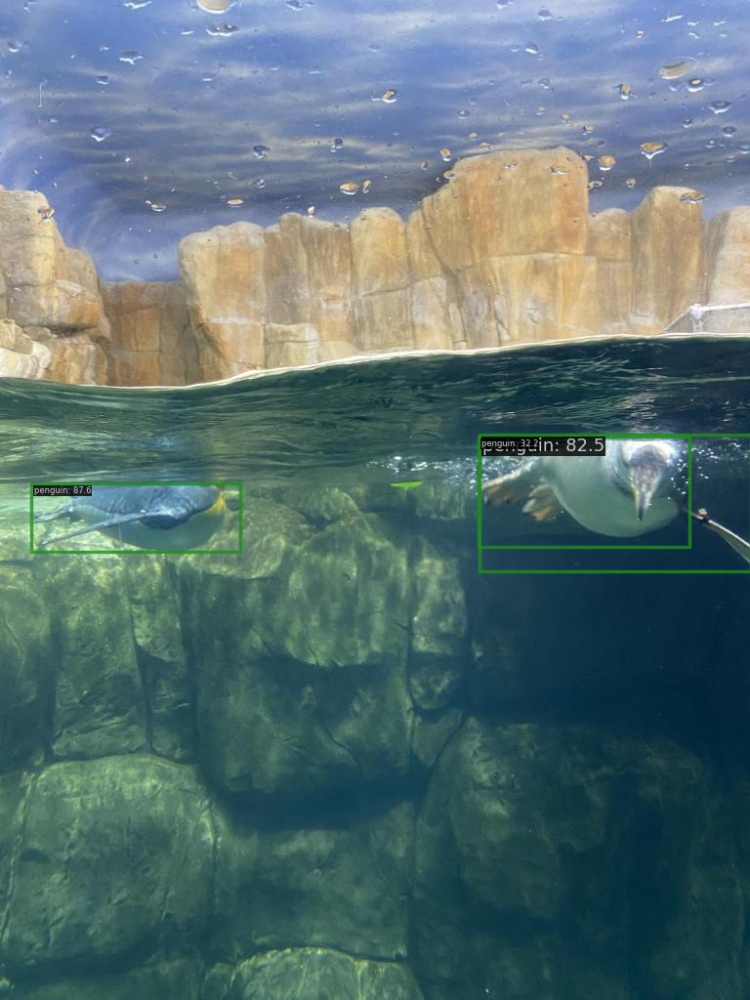

In [39]:
# Show the output image
Image.open('./output/vis/IMG_2324_jpeg_jpg.rf.3f2daa9adbb33a633ccd9b81a8d3b0e1.jpg')

In [33]:
!python ./tools/test.py ./configs/rtmdet/rtmdet_s_8xb32-20e_aquarium.py ./work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco*.pth

usage: test.py [-h] [--work-dir WORK_DIR] [--out OUT] [--show]
               [--show-dir SHOW_DIR] [--wait-time WAIT_TIME]
               [--cfg-options CFG_OPTIONS [CFG_OPTIONS ...]]
               [--launcher {none,pytorch,slurm,mpi}] [--tta]
               [--local_rank LOCAL_RANK]
               config checkpoint
test.py: error: unrecognized arguments: ./work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_407.pth


In [36]:
from mmdet.apis import DetInferencer
import glob
import os

# Choose to use a config
config = '/mmdetection/configs/rtmdet/rtmdet_s_8xb32-20e_aquarium.py'

# Setup a checkpoint file to load
# checkpoint = glob.glob('./work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco*.pth')[0] 
checkpoint = glob.glob('./work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_407.pth')[0] 

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

# Directory containing test images
img_dir = './data/Aquarium_Dataset/test/'

# Output directory to store results
output_dir = './output/test_out'
os.makedirs(output_dir, exist_ok=True)

# Get all images in the provided directory
img_files = glob.glob(os.path.join(img_dir, '*.jpg'))

# Loop over all images and perform inference
for img in img_files:
    result = inferencer(img, out_dir=output_dir)

print(f"Inference completed. Results are stored in {output_dir}.")


Output()

Loads checkpoint by local backend from path: ./work_dirs/rtmdet_s_8xb32-20e_aquarium/best_coco_bbox_mAP_epoch_407.pth


Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

/opt/conda/lib/python3.7/site-packages/mmengine/visualization/visualizer.py:510: UserWarning: Warning: The text is 
out of bounds, the drawn text may not be in the image
  ' the drawn text may not be in the image', UserWarning)

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Inference completed. Results are stored in ./output/test_out.
